# Praktiskais darbs 1. Attēlu pirmsapstrāde un segmentācija
RTU DE0942 • Datorredze

**Mērķis:**  
Apgūt pamata attēlu pirmsapstrādes un segmentācijas operācijas, sagatavojot datus turpmākām metodēm.  

**Ko iesniegt:**  
- Saglabātie attēli (pirms/pēc), segmentācijas maskas (vismaz 5 oriģinālie attēli)  
- Īss komentārs par metožu salīdzinājumu  

**Norādījumi:**  
Šī veidne satur uzdevumus un tukšas koda šūnas. Studenti paši izstrādā kodu un aizpilda šūnas.

## 1. Sagatavošana
- Importē nepieciešamās bibliotēkas (OpenCV, NumPy, Matplotlib, utt.).

In [99]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [100]:
image_urls = [
    'data:image/webp;base64,UklGRiphAABXRUJQVlA4IB5hAACQxAGdASqmAsQBPo1CnEslI7uxpNNKQ3ARiWluUJzc71rES/A0Kt3eF/Mz4bw+DgvYeHEoGsXVvKIzN/wP7P5M76Ds703eIfl3o9/7H9gPZu/TukF/0eX55r6cg6/5z/gd9v6T19GCP5rwY/uv8k0Adp/8D4jWN/csgN70Kc39fUJeXz+d/83sF/qX1l/Bd/Cf+HgjfvKPkGNGKNy5QcFGDHOZBNTNt0IV1claWot1sYQXIkHM7xzNvhmYLJoQUl9/Ona30VNNjq59eA1ICHavGdgPI03F8RckN/BOMnaXZsIApoxsw8bSDmznnXO3DtH/zzgYgkZDVq4IS96m6ChY7r+fXgNLUnpYT605JT72Qf+jj9XRK9ts+uq+rWS6yMUlfqBgB13liFRRHrY5lrjPOAS150AI9z+itihXMNhfZqjhFPGkwhN4+fwPrLpAopXlSTq3NR1r3Qk5aHD+MvmD+ppMvME6Tk0ZGa7YNT86oUI9KSNt9St7JZZhK82XkINC9R4OS3Te7QKDKNgKD668+k/xsSTUIMnvmeaHYOHyjlDg+R0wMvoJ+EsUcbp9yhb4hcxsFHTYZWuo1pYvjecvwb8TzJkCH1mgt4f4iQMChAxh3K7fwE7obL+cLmkiQX5ZZGEmM4D6yZZtdbSwWTDTX+/EAUl0Tyxu5kxGPPZHY5Yg8gOj5groJ5h82YAmRDv/J8jJSN8iAtBTEg6J8cSqydgzO5aojMbQ0bORVxl7m4uteyhDdOiWfdfDNClGUEFy8ZdTRAqyTdEerXkqbgb2A+xBNj+rExd2Kk1OsZH4M8Dk+yFWQPNYzGEhV8vCX1T+/y4RqG2LG4KUD9S0jKJofnWLblrnjEdd9Lch6KzJx3tvAakBChTgbSZVnytcGMRIEAfOGAEY+2nkC73b8u+NigbMkoOPfRiazS0jDih8DNJyc/pDfnkwSuPNB8rV/pSjr7BKhVooB7kl4tUO8/A/2kQFhZKRyIyHOUO7IzyDwNbgpzzeRiDEb5xydKV2bb/Xb7cRQlch3BAbg4ZAW6+5V8V4JjYzd/LcptgODM5537r/3jFxKGnMyLARAFFt/+G2EdLdO7l/QrHEXfzcOJm8DK6dRLFgcT9AxJe8mGb0J5lpZT7sgNZFkeaxS8UBN9dGgObTyH/9F8bhe8rWyx8ju26KRTh4LK75jE/7BD38h4OXKdvgWAWcMGDYFD2WjhDr4b2e59KW7mDx3tpCSrDTe4oNVqUzWldqETB61HaIF4haaWlFVLxJdPmUIkl4w1dISxa9uWTFp6HGzT6gI1PlF+4HCiMKo9VrfotrPocSf6+mkpkEWBMdGObz5QO4MSJj0feRHeidsVtwGcASwbf+ZrEWC/w+dLoOyb+KiDnbqKY56IucjTZ6xvLmwNY/Ww9TkBfDnhKJOsjv/Tc09BHr6kSU7GmDs4Q1SZDoMPYM13Q08+ILzl+FOdJEhEtNjOREBdmnQvccLV0a06matmnwjVgEjJbXj+rwjPKB3pr/EvCbLb4nArnOO66UKJio4kcDp0csNhVi4KCT/50IjpV6gFxcG8AA+TbzB3hpyqKxVCo1HxKyz56VP/rHTTlSRIxudSUWXLHuY1s1Jx5qfq/YK4acdpdBOTnYkskEZ7D+ZopnTTzhJBvk/cufHg8UqTv29CCTZ1o1nvZetdfJehMm+bPADxnmuWi079dPstdg9+vptyorh9DuJ3KQ4ebJB26lfkYD0LdRQNASDNlvrCDFTabPbs5tdQHcu3w/1Dz4x34XEFN0sQ3TShG1UaUxjt6HJdKdZKTZ1SyGfE2awCkmrMpfwprnu849ac/0FUPnkML9eU4cFe6uEB/k2T0YSyxFbrkDC0SNWEIJQVuJrN5ajyBINbWWhCmNVab1LpoPLC1h1yysxtB98kVRUmViHFCtlCBQkMX5ZHZbCippatz+BPArOUz0g9Hk4Cdjflj7h0JazPS4+Ap79A94NPVKi/tMpbxj+eQUV+Y3fG/tUQbBnCmXz62RK4vRvtBiJfnE6+vn2bHeZ/TgD/YpzvA1UqvFiEY0AhLmw5PAMbixvfZABXHBdTzkdq58fEGASIWAguKNlV3Wt4rN0RzLpQCWEe9KNSYDvdnQaX2aEb9jrL+NOfOO2MQGsgVEiMl5QFzWONJNV9kf+xAJXWd024ptf7GGR2LKZz5Uc/aiwW1aCOcxnffX9XOcBJI1QzcepDyQoDUQKCUa4So1dYNJgV6qZq9gCsVJ7K5AUNJEZG83zJwQCr7y4IOFGlViHU8DI4yAkSZ3IkPQWrRxI359TAU9MaNWL1ALCpFU4GivWn6GCOHTJIEZ0Ep9EkY+kkx5K5VAkx+r42hZaSclIsBfYAMGVgrhoRsWzEyFX8PFPPhqIOBKCGKgL/yTdgxJ99CAOPljklLfYL652FtCKsdxzyScDAwJPGchXCvCDEdMzoMEvMSWknMHXn9zHBwAmnu0NJE/gmnLwPsBoUoQTjlo8d1AJFh/2zC7F8TbWkxqaJNHVQfrZfBv3IZvkSSEqQwEoc1F8jLr6Vx3E5LdNf8VIf/wtQsoQTbfe1vT+z+O3cMhCk3RwnKjjNj/9anEbBO2gn8yn0BGTihc3Jj/9JxeeKBK5Y95yfuzMHS45lvY5nCWta1ZTKX7+wtvuEyf1Ny2lZwIFoFuc0REghUpMbQ1H0i0fZNJQT58ykdm+Ieqayu8MmwBKa3SkC8ieYIWm0nMx5ZheMQx5SSCuHh/SFMCkddRAkxtA0e7fRARY+0vVLefu4mIAFGpMjjwEyHngexv9hpHQR/+uO0qUSqCjxroY80Rlng4frO8wjRMpcyErJ1yLcE9E/FKy4HhJM8H5H+OJqClHyzAxCF/94aZuJW7W6M+15p136tEJOdaDew0WQJ+3706bTNTCabtXkbdZz53s5Xchzs6fY36JglcnT9be3yXHPR3igTt8XS659L/0oyyb+oI0Eg9INWRadW9AgtBZqRqzKwJRZlapXRbqtqFo9qczSbT8S8S1XZzsuRb4sQE3Fw+5iB8JaNP7yVKDGNr1QvSkTgvsDvsxyZl/Y5M/w5+Gk5xkvRNYlxYCTZIhz7CyuRZ9V57UwPp9lx9V01txgO84n2hSHQKShkgd2ERjJga0tQjEbpp1FJccIfrGWH1Qc67rJw1yF+cpuAV+goCLnCqFnJeSnZWA9LqX8ggAQcTNLq35dy1lzKHfP/8lW2YHCOPzvVt1+gQX8h/V6Os5WgeWaASbAcR50l5IvUT7R17hYTe5B+SjmtVaq8OPiWh8z6mCiUI55ZtrJa0WM2Bs/G9Mk8LDwPMc4uzOFRjrEilUKgND7eMauMe19vqzGMLBx7ZiqPNINJryO6YEjjjSzGnshmFMZcMBGA8BsEhBj1d9uE/S6YNHUV/dD47PJNeYaF/yWbVVyDmx4a8clOiIuSY7CXny9dXkcGv829kha9NPrkzjgLt+tHbXSB7vwmj9qHS2gmpBzJNU6qX0PhqZUCtE0tNN6joCbc0e5Qp7knkg7ZtUa67zQGQA2D8cIfgFm8AXVlP+ezvwPBpfMUeTzQ58rheueTxv++8SU6M4JfFNHxxL4oiyi0CK1wKX/STW4v/TIL3ejohoc6YpXnx8NlYWom+P4/UJDpPvLo1MDYnmJIMXsys0YetYBaK8DhM9jwIExp/TtIgsNpB4qOHq0yP46Mw0+NH8NIohwEHfiO3md615Rz3VZT5GrFKoOUvbD1X0WJcpzx7eDZgrKXazQm4YljDn7nV5X9KeQYAged66n5Z9camTJkkvMCGjQgkwGF+3LCcsrcMc/coK3v0JFIBftodu1fvdYXKjKkZ8TnAOP18y5y8s5aaivEEEO0EgIEocDErPzY5LbaoIjQ9d+mFW5yw6U2s82lMeBA6ZFSuGwXAdKVggQll2IznkEo4yBa0VXnAfgxjsIF4QBwoKZHBs81kqyrqFfbHZxdzOuiAcYe4TeRup45X1i5IVBiyJzMHfp4XRIwqBWMsnfzDrEDvkd/mF3zLkhDHyrMPmB1XqAorRisZvRtwopj5lHGtkl2ZT9eig2GKeuBfbfMa/EkygK/OKwb3b+D0d9PTPXsjT27aJlQOVU8+8uFW2r1GjZXcnq8AsjYJZ+benA9aXF7L0pVJfmiGTrlinhVCii6BcXcHDuVxg3fJFWGtLqdJEEU+NLOpqUVfi1ZGsNlm9Hnq/Z5gltB+Z+Z10pxAoiSc2KDxhqSs3njMo6BOF1InZYTHchXjWcpMgUxznW1BIatpvQAvZ6B8jtORBGIkeD904Xcx2KgknmNYqccE77igw9t2huUm/4zkrrWvBQr/uYxJRxqlKc6RLzgskFUDSws1RAhw1xTHNlqa8mcgEpSyTGeDik77XDoGf+pN1xspI0gHvZiJ3vGEuh2Ttv4vKVLni6xRpPNyTaS8iz3oGvib0jtiJ+wbvc0ImkHE0BcoMff7xaLk0eqMB5j3L4u/ANXyVQ4e5EWkwfUAtPMDIknE1yZUL/mnft45K15qH4J8sV6qhFl0XOkjJezelmEuN5EwEh9mARle/PbwRAC9QEpa3WswyvU3GtRpXKZ3mBbV2QjkXfz71xmiDjMJllAaQ/dIjuuOZNkDbsRq/hzG5RkdRtY6e73b3C0CH9fIrVALY20EbKkDkpXPEQZve3RPm4dBlzoppM0WLlconmmlI5mx6tXBvf7qE7vOgNEslAhI1MWyC20mveytrs2+y/ucwrUavxqCQoyO2T5VbH90xrvbXsyNhJUl450ZyM+EwU9EFVkWvB/GTJLoyMISHyUhj/xxaFwWJt+YljMNz4pJ26WUB/BlvSnqGY1h2BadqhfAAAD++cNII7C2SymHckgxP7BA43hNrGj65KZc2SqPYJ2h+JryHIgUZYlfc4FppC60OioWMVqH1mb2VVj/t3JqKGSsVQMXCHzvbel1bb2Y2IEYTl07KYgPG329aYWVjz073pn/qefGUYewpEq6yBuUQqxFHxnN0arFZ71puSdSXaUlhXQ3cfdz/B7sZPYsKRvewvx5J3yNU4Qq8xmF8lsW2cS4aHQTXNe+4JWIVHfKewwCfHlCHdXUdbCRquo9HAstwqlayG0QUWsEZju/SdFXBUUEjwxAqWzsEvV5o/rXCh1FvvrCmwhZ/gd/nAxRkdjBAEXkQ0u1syA+8PdOGYHr/5cfBg0NFoc6cEe/+fhvePG+TJBK/ktlH7j9mAYL0lUM25yAsjctRKmjg56K/2GI5znIhBEh6zrtFAfOJpqAvtSm89+wfifLbX+VuNDNFXwsyuGcBOH8KghvcPpXxWrK/QXx0y1hp9T32GQYBoPOXQJM/kx0G+7e4p3fKp5Ec6R4bkjwRs0FXS/fepaCfp05Er1jdzmE/Lcr1pr1Z47Qkuk2DoKKx/TN/9BgOVK4ILOo8ma4ch6LVv0z/PdoFQMXUv3bEjn0S5nLkdDfOCdsQntP3EWGNgKUqEpXlZwYl56lg7xmvDQaH6rnOsWU/f6zAGK0Wf2G+o7v7t6mEs1Ujonllul7GyaSj6s6zqphTUk3+5QMoKJAc6DCFXo16YA3trEAUdo75HRMNk2z/KtK0d1Drql4m8QMDPR13ptsqI9zQqA35GRfA3KtfeDVKhxFBTI2Ex4WpHYYnUtZzwQfcV+LkRipWHrv/cZjrSK4JgBvq6WWwbHk3lSgAEXKoFXC52sBcZWVyxWGej4teiuCnlx8TfQQStD0aV/kK17PgVSZIiarh8H1n9Pu0XLLX2MvnZVZb9/5DdraBTgo0zagteGtYxZf/PK9tBb7wsyYu/aJl24TrzMBNACieEP0xD5G+AeXycACcamyvrWUmTH1mLCm+uQ/KqDwKZpiHmyYa2McB4aieC2TVhuZB53YNaqGN6ve+NGB84HzZvuLmHekkT5iKty/Cn7nDaiPUweA0EZFjKCQV5bfutWzpJiCbTbB8d/A+Fp3HgbrbRi4ZnMje66EOsKCFH7z+7JAQtpAD6AS8skvHubgQi9/ZSfTOOI8CF5Fu04BkBxzglGkOiHnBIgG18ar2KPNjbjONYuhYADhWAFEvB4Bp/ZpYVuQMdATzt9IWZArhLaPnxgheDJSAJW06U0u5jloYXQdkDTwVxNbgyGdiQxRICNe2wpXEWQmiBkXmBghOQjhzoQIUq9uaKTjqH4LOrz4Fyja6QkfsKBt4/OneFk87V5NvgUxHzBZLMkeToL/mceFS8h4CWaRccVfQnbeAAAh3FTaQD+37oOa84JVvk9U0hmloyvoMjQtm3ekqZxn+n/Sz/EzpsTXT2p/LL6bIFVz3mwS2xcG11KsMNwEf/ia91bLYciSTHfAA5JykARBUeJ7AgICfBZNeQUrOd12I+VzUpfcc5RJaU1G8HO2YY99QADOABO3LGDD4ADEShMk5jKia4tSu2SChFlg9HuLh3Ay4I9fqPoCc50hAN1VkA+Hd/VDftguObF5efVndGn995kSVntiWLoSmPRAefJoiJmgKWHD43wulYIU8fJcVK6CnsQumgPl9h8wZYVGl/i3xMmqwmAslz/gJaprNjOYHfAyvG9NJ1xQm6gwgB0X+I+8a6Tab2aM462F0jZzpjH3sE6lSSEafoQHlzJg2KXu38DkcgfNu+th3PVCEaA1WcmiG9TIunSXyTkl0iPQtXv9nXo6K4ll70EDX4+UEsGOsZUahkhf3fiSD3gOy2io5Z84VkO4TTn1DA/e1HEjjS8hEzZqjr8cOhMgl0cqp1VOICZWL1jo0CYbjh1r1lqoBJq3GNUDFtGJ8O2CeYMXsmU6dNfYjLDUlZ8HHPws1Qyg1s2n8VQtELQf7fMUF8aqnLTfLjq/nY9ipY0hB5CzmoJ59X3tgszCSou4Ni5LaMm9hVTsFndzteOHFukAsl9l3NHIK7Pg1vA0AXtUyaclbQuFyaDdcEaK7SpFY8uRzYrgA0/T85Ths7nSMZ3LsgO4LVAhso4UzOvm196XmML245zOEfQJYsCHoe52qk+kNUSmQnP98sLhlLoB6TjInoZ0YCpwJmmu+P6QedXyjK+C92gVpebDyM2Dfm6FBIWovaCeKV43BJdJmcrWJddtT+tLFXk7wtCzruktzNZG89ApzMVNAVLt0be/aZN7YTsufzL4EUmqURAGxwoonozWuj+V3Ei9WsI0Yuok8hFRjie0Xg47sy80CFw/H618tu+oGyC84Ad0ZMiNSAZRY+phyHLhdDXX+ftdIICQl1P3kkOdTnGGi4s1djMnQMy96RO/rz0iD6IER9e3vvzreNln6bbXl93pzfovJA3CayCRPvTug2ZWKjp0gA49IArpSdZLzKizTFdjR0iE6SBrqCcMM7F3J+1rfnLxmRcZQZWeHUaVNCZVy8kf4HdZ+zH1UxW+2/YSclePKGGdkiOLB73p0OJvy1Xtjxp8pn11SbSZ0eTd4kQnMfwgIgJICpyHFpC5IeejHh3G7+xao4sKmNHljGixbmz8cny/kG4q3YKmYPpyRhW6Higrd8bkbKnx0qnC/ILb1qJgxjYDdrp7Hugl1zqicWaJz9JbC4WwB4/h2q2bCAG1/P0Ki0b8k5WHKTLUS9eD0Nvp6Ujh6BJObKi8wK/YDpNCSSvoxKonIMCvyluFjDEGsnkW9JIC9p8jcUB+wFB1a+BQ9iAiY3+wfetezQN8QxSlByR1WnxoZAvZA2HV1l6QhJN4+88VkORdsj75wsXdQkiYvCPyYwhHdVygZ7fOW2QXCgc+M2kvKWQx0MH+8x5pQDdrb9TH7W23sbKZLuozFEDNkHfVxQNlszmEOmOn3SZZAy3Q1hz3SwA/RgeEpR4dvjfM+hkGkgbymOsXD4T1ZVj4AE+vb10Nmz7CL42EFtmbZQxw87Mws9o1brlWI+Wn47fFk9GuX5Koh8S54E1RsaUhCgp+K/6C0EOluyMLW2ZOG9z0h/sgdItaZ9sb4XlJgOHfjX6kSmeRI03ZvM1MgMa7dh67LR2CtTo8jAopQJquZ2dU7SpHXuJ2CR7V2ohDzk/7xrqdQtYptyruK3GzaGyeqCH+n9j8eFFCURnHJLhT6WaLlQyoAzEdKPIN6/igs3WjbtXcrn/M3YB3Fu0Z27zA9D5DlPGsyxRXKtutGwfcfL+QOkOo3x6w/My20oWLKrtP7pbc32BLs+5NykgwKNHCBAAQtTVWXeSdNxoxWTw4a5m12u+ljRYbuqiSuN7H6V9AqNlYQAVavYr/R3lon1v0Dm/cBroXuUPmBX5sskhVoYMzOZg2p57ueNn41wosg3pP3+eOn+Qt3tFgYVSWtESctq59/nkl3wVTcrDaORfRGXAo2a67uNFffwsnEMA0fh5tlnZPW+4EyNfe0S2O6EH8hnblSq1vRh5unDsXQeRtlQfK/fccWwntEjZziW9+W7D+mw83q43IqN1F55NwZT5CDAGnN4dZxXa6ojV22OTyJ7WTkPTea5tGnNYG1qHvPjwYVh7oM83yxtTRI7DmQDwg9NsViBJdwOtmMJYK5mcKnGnl95D63aFxH8uPqTG3h7/UsDTLpqhQnPDuos3nKWwuerzSSCPFoBeY8Jph9pVWLaS9ma3OIfjzU0XithuKBGBVnF61i8k/YE0gNchDernBwLlqUyQeNS9ySr1x5g1u1177yn/7pTR55l4vaOOAJlUyf5bJDbByPZmRfKf5raK2Pr+0xf4KaDCosHMrUyj+bLAzwVmJfmuHwk4+F0VmiZYxBrDEWMmXTqgrDgCgB6Oo6BpZ1f1bFIOmBbC7LYYu4wmgjZg9FmlmoNxMb/pvIu+KlGcP3prwuHG+ZAE3RdajyBmzeclBXGzSGEI3ibDYO1epmwxwa2GM/Oc+k7RI+EGE86yxEWRQskJ2qSYQfB0gn6wlWGXvsDoJU8kbcqpkYPFnhr9dzEWkTXtuSnr4bTTia7Wdq/yjpkAR0v8v/yQuvGun9xCFlN/vz9ifNfQ0Wp2PbCRlTEpUI6bzwyxw7VobWAgdyzpK0U4qBB0HjzrDH027Pq9gE7NIwlSjg7jqcoEa8yIiih04VTpafO5jU2fKD3HBXXDqTF+RrJPxbrkvphybAOpJUPw+Pf/y+0kc+NDB5gAG9SSQfzR9z7j/ofaTBjDyTcf0xz2NpCGQDaWFnypdNCrK+cZ/Xgd7ntk8Q9xXDNUUJ+ps9XzcihC7rRlWaWXtreRDUga487/g78586lP+CT8/aXNJZ4/rRbypxb7cP+abw94G/GTrHnPx9Zi6kAPh55NXueRkluEHZoqMi60eS8fnh0eKn7g/PKnfkq+GgMA9rQEIeJYOzqtSRKNjWmdmhPfWLBtIkWCsjcd0kUOWd8VGXWPQeXNXrKrlJR54lW/1duGCbDl2OXLBKW9RePsgAW4gw+ZrJ2+XfVy2NZsEByIVb8IZZ81SYHoUKgICY+h5Rezh7uvptWORp/NTe3Pr7dejPklPoJz2qHgV+wvnZ8JlJR+hfRnvSUY7AF7/SO3u6Na7BhQu7bwXPvxS5nUvqv3IMAvn4igF1awZCSZp+HlI3R5nIwiVIEgifq+6p0LxoTCidzXIvDCl2wCEwwMYXoqS4YFDyhvJlVDPfXES0w7VVT5pRRUl0Zx2Z5mVfvN0jYjRD7T+vRCwd0MKgz/sXf6jByI0i73TDFfQbIx/vLbeL40OaIFodiRdiF0ZlWDa55nmYWsQrPNz6aD3m1QfPPD1d8PSc8rV68TUGLhn3/oQPSSayVy/4DjDe47Vo29+hiJ6F6x4hdo2JyPbbYT1XDi/hPtMzi3IPf9oZOFBRhGexpVxVUeHCAdXiU3fU0SAP3fzJ1VTjzrL54ZF4cCpDWX/BSF+2SVDB51yW2Nv7Dhw+dglcdyN1o5qU1fNqtSaQyta60nlZmnKIrXlF4CgDOn7iwXMhsOf5uFbrFFH9k/30vPkHUXnQSE4mMz8EdPde1Xze+i3aOKeiolTcuw9NVLT+Lx1yHNr2LvJQqxmEe9gZ2R8aqQ1yeAKsk2enGVS9XiWuMOZYtq0sEngWggUCTtCtene6r23zsA7GwRH/SPngtUN9Jli4Wti3ZAqjLMVPMkzIMa/gQRoxD8zsMXDWRATPdaydwAuBrhOAwYtNjkm0KKS6AHP9/xKTdsZO3TQn/7BIE+10NDtgvpSdQ8/0Pe0snqf6LrZhRKKPkdxDvDpNbT1fGftUtHan96Ph9LE0BdU5vuHY1LbmVvLUn0zZheg+zZ8sQNzKvDtC9adAdTtLHE9SKFS5Q9C5aTkz9HFEuuv340o7RGzD+iOzMlmWfSbyf1EBpiHFJ73S8IgECzGoj/nkj1FZ+bIsv1CGEoiyofZI9+sM7yxtkkB1Ux0x2vkb8hrUpIHNEUOFA/57U+cRQh/eftETW5DaaSSf+8LyQjMgU6a/sKE60Aa8FRi/fmHW5znJ2lqbLPMeOzG20dSYdkN/tUgxjN2PT6nRFl8I62k8rOCRQKZG2v+0c7FLljdXzQ6SEWOfJcj1sNP0RExMOiAy3LOCU9QPjUFw/m7nXrLLpCB2jY4eligLaeaimJTMH8knCzXgxpmx/NxQefszvPzBzUyHdjjNNTuEdZUpV5aQUwa2KotcW2udmOUVQuHDq94rA85fH7sgFYeKghYmhIRk4/bJf1EB4Fm62ZYu60Gy4pJB9ZyesSeNiShYoq9Oa6yclzwsKMX/wFuATrUdU2Nw+Kg1deUMEIrpeEKrVLU+E+uF0k/QOqG8fN4+pPJSS5pf4NUniCkJH6H90RR89NHvWHTTyiNrgEbsvIcrOT0IlxS5aTuoD+WCfzkV9ybqIIog0RrLNW2oxWkg2B4J1e2ThpnQQ146YpcwWq2HBM4GYfzmzr5a3dciubVu0Dy1QMU+J5zFg55RwzVXt2bszTz6xKI4Q/HMst2iGgMS3SnUCLVYNksgKdjWnhUCm+mOqDihEuUwf6AcAVsB/2dTKTKxG5VfBZUHKTZgnXb9dYZBD2a8dmDjnoqQh6+K6W1f95hjafyEhYmXU9QGwg3jJiG92qJLea175nrTKnJVVUToNt/T9R1PoSvuMyqEhLFBkRz061YHNA2a2uvkLOalKYnc7sjIst9nPI5ZWhcoYBZlzZzrY2yFSeS1jWX5r8BkEbebRTIblMoPyIchxnH0mee2aYozkVtjoj4KcZLSAUBIkEN76wF4qOhn4gqoeY9l1Aj5lvU0vrbcE2Y/p8EpyhFbLY/PxDbSqxbfmDf285iH1rLEU9RfPXRTlRccNpMeBJ/hjXg/0XHgJENW+2/BWwsrI5ZzgpqR9/WhaEqbIayKGwpTcBcn2Aqxdnsq3/jiBySFpIPgCEP9qEFZ/Fkh/W3UAoZQ0Mf2mb0oc1lHSvYLmFRm5OWj7qC2IUhPHua4fNV6K9qlqlLLxv/eiyz5rj7826WsFrnkobZaEoT1+kGZEk/xVWPUltF8g+1c8IY+AUKQJ7oE7tUzIe4SxlA58SNcfa6u0Kbph9D6sqp0nx/zhEU3jkk4hPXHSLFyy6oE6leoExCa2RKD8/ORIERGyJpX0M85UCRlgHLOH4BVoSjv7txX5jn2TkiQs8QqrxJqlyKYKfcoNBNxZmdrTmGWdk7kJ/skgXa17p7BkOOTQaaOBZ0h7grQGGaWnEHnISy3grKcR7UD60TufCSfGLyBy2ic9MXDHPMLyoXHSYHdPDG1DtDlgOMKDkzZX87BixY1NgvFP9HM1FdJDct1tUVh6v7l9hxeGxAJCz4iSTfw4WwSe4yKKvRwhmfJzne14WKxhpNfzRFrG9EYdywcmOk9uq9Y7gJdX5FOFCHG607d3PdO1a6/8puErbbaeVsvhYpHPCCRoWk9JsAYzH5DUnkMXJxfM1rd1g43L7SWGe3e3iA89BIlRSN5tU67mYP3sAMFxvhH8vZJWisBtJtJ9QZvXaQG3i4g3LdrgQ7qOuMPYb1ol7Ph5JIbXiNzzTrbTlRC+vV539AYtOPUxGKfIaLmU0DV4tyduvF+TO/ib+kIYMBqDV/E/wDRVHFYQb/jl8oY+UjcrDkU14Gen4r/dJw/rLI9djo/rXv0wkMwBEEM77w1++4GH7drSxZL2ua6U+i3Ut0ZFFUMyH5bS5rz8dxdg8Rt454otsRJzvW02V9E+w+Qf+mNov5MRkRBx7vIsDEc9lXRcY+6bINeSq3+gKOkRLX9BYZdp41xTkUVwHitnT/X82sJ+rOtHtwmPpsbfs4cekJKFSB2fMbFr08BazNwRmDMeKP7ECH5O++R0fUHu0QDXpjHiqxPNuNzEiULlZlFHty0WB4XqZrICjJu3RcC56jbzi/5ia9x+qV5t7JiPCVadF3JzVJwwO/XMyW0EvlBNYWUN5gsBwfcCekIk2zWXhpXYHjyUDtYTM1fcEN09pFsW/NkBfZTDNKKxWU1+i7wWCOLzWa9hZUBkdMJ0zACYDpbmvPyQsXv1mt9FnXbWSSU72oyFD3WzHeeK2w8icuq9WQF2QEa7SiIiRyOOUtGmffnbVJc7KwLrXDrbMP31/fyFJ3rQ6pw364jExqPgHcMesTL976MxYY/J+5WaMAqGVsCEmE0QGg583J4vOOYPsPMY103pXO8si4XGVBK3kaCGNWeNFU7lmLaDO/ONB+hjSvoVxhk0eeP+Sl23w98wq9nX6PeWr27JMbnQp8IJwaFArggsVIEMNuJYneElnaHEGMZwmP06PINlZdusrp2zG8XcRwbSrQkK0EN/iVM215mMyGEDt/Qpm5kRoxfpZRkBc6+eOuhFZLRcTUo0HvicyzXMnmO6qXKuW1GOnimIHJBU9dbdeuBEYAQUDqWpfTwf2w4xHbBqkRcF0vU+Q/IuUQMQBpsB8x4SsgZlnSV4cbn6y+Trmu0lKSTXFlIGqJljB2+sAPZpezrw3c6s8IVEDCqY+IsanflK/XLRemSjE1qDDQjEtm7CVgaHpYDqLlGLpN7hoMUcYMHBAG8F/91MfMRK+bRhERaCnxqHlOGVe5WiXsj4MJ20LNThXgmciWwBD5kC/+bGgRY8W7HUXJoMefBRw0lI2Xn6jza7myrRIOYcwamJbqeAKdFYA/n82/04i0v7VXLhzTfEW+KDDii/3hHtWssfM+37X4t04qQPhUu5ZdLyDV6WtrgbObc4cNm645L0obxY8GuhxJU/45Hu0bh0Z/1nU2ZlEr3SZnhT+EgzdBHYVCWLfvkSP0pFf6naPUSLRCC5GsgXvUseHMCH23xJ8IuqYoFNb53hrLV1zYOW3KdVs+l2KMFLwcXjGYssq5jhldEyKFeLAHkMVmUnr5wqUejFpoN5u3Qi4LBzDVJNA7Y0PvtGD6omVuBE1RnvPNNCBIUo21uRZaiyVo1EqcLjPRkgE984p3OxF6JdPyY/wmnxmiMIRKlVJqlQgLJQqLSVESd+8I8cHAH6v2fYOkxgtgmU0983Fdg3c4rCvAu6ZVB+OGyFwaE0n3lu61YlqjmbokVUOSmJ9Wi93afVEUIW9McEULoZl33+44R9tTDIibNAA9OrWjjB9SjyZoplrliewXEosGwX7JuHu8HQ7IcgKfkOHp8oETQQ6oD1tx7hd9HqLPWI58FSGluZ5PtxJ87ftlsnOd7cN5X/sbKDegewv/tR+8DmVDIoJeaUWfFG+z3cQyPL6Y6bkeKoMaCebDZ+4blY0CyXenjMkoucOvsJIvwXvMpDrOWCk2BUxzqt3Bnt2QcH1XqaQGa0fIKbUjbQm0UiUuo7uzCGowWnh3KfNdfObaXYdQ2YlKcih0uvCpqPVrXS6wqpRpi8POOxei5rIu0gLijLRG1eXVgE7n+ZbHWgnyj4MM6DDyt44LqDAVYKG19YAR6dMyyexZfa49q7z2hDWhZqHUCYswL9bZFMvlqUC825JbaFrxHYoJLO08IRRHhm3oyEUuo64XpxmJ76R6LgHSAH7ZK3ddfdpgvnTbBwSd8bcpoYu1Ev1IAonNjeT+A+8eJttTM9P8T3XtBbDHQuthSnOoVnwxId9yeWN5WDwOyjvCZz7plqnuhG/f9ImTCZ/7yaXEwyr7A8VhG6l0H1pvWNniu4aZfNb8uWKxLv94DmxA2dXKu5ZjIRr6jmcVPLM7jpgVfmLQzjZzayVShOAZZStylSctQaLswPMl8lRLAD3P0wDWSHO+huQyOwk6HZfyOqF2GN5On6miU592yJ+jqeRmk6YHr2XETqhvMW/Ds5JSDnNqei/x+bwfRXA0m4YmlvQlr1L6201mK6CYA14zbuLZ6vlhwezjE1RHYFWfEj50nNdmED3u8S7+W5SR3t2M2l3RqLcUw0UdHuY1l0GuDOng6lrk3obFXu1MttNUlV8yJdExLS2r6LWwArz2AyaFLm3Wkhae1JmV7kwq4vauSl3mKH7AWUM0AvNo6g6Ef8SqtRnqywaVyXAXZb9TmSr2orNZ2TmGzR+8HcvGl3wtGdaSmGHZ+Odoznr4jcXUpWNqGhhRymGh21WZRMziMwsNUABSd6hAyh3u2Y32gLEr8e2CBZOogijDXPVZx1rPLzhCvEnQOHFiTrM+vqSYfn84lehLm8HT3uSuvjL7ayLBwyUg9plAGbOlfrD259f4yhgUMwv1PFHugwHnS5JF38z6fu6iOmsIrm/opOW2nfwyJeCOWsDzaB/9ZAfsBkURQalkB7Vmc0dkbQn5mlIAYVPiOPOXAfmBpRjffYRsLUyWrjKkKd2PDrSFJ8Fj+9xYk8XlM8X6MCiReWJTex2W9Dn3ibuuXkDcNg5S5+EZxDwtQpJpisosY+PuqTScHe0nUnV3OrXV3AZcr7jpCNh6jzIgPsZCveS5o7Zcytq7KYKMXoaHEGjQBSwWWyt+Cwm5U4KXekKmxQwxApPQYFE57PPMp2Df1xIRRl/NSiyFjY8jE/Ipix14T5I69eB4pWM13HUYkPSkuHny0bnQqsblQU+eM3Oqiu/47I2X5BpJdWjHBlgxZOX2tJ93aWyU5c7TQ4zh7B8xLLV6DcthCo6AY9ZCmeGEH8ZDPu7XRDARP5W8uvsDQu6jXMM2XSEIFvpRbaYKhhLil411lVS3OTOp4qhekpw+SZ00IrbnuJjnSGWPODKxlzbyfmOe0IZV0eof44aCAVPJwsnIDGJy4iAao6Ous6BnGGur+L05UqebSCATuZtwIHfdhTUYLbLR8gm3z9aknkTiWffZxsHrb5wCrXckLYAKsWulhiJWvvR4XMdBBxLYWp0VEHmUbPLkq0nYxTpSDKgW9Bk7nQtlu06/s9UFRSv62GnMKEIN2/AS5i+ZA/ab9/phE+lHq/JQQd6QbKNfQ7M/ghvkfs7oUWoB/+MZt0aqGIjNOoSrvjbnwcmLgkzE8YxNWKHIhYB7+N5Xpj5nfCvu9RFSoOV1+95hW8FJuvnfWsD8hUKiFsCGri0eGMyDqWUhT9bjS+s9GkdzQwdOd5n9MOeBr/XvKCYqg0qi2OaYtl19dzP+jT6d7Y2aAHwf7n2kUBhcfIn4miRdq/44pV5d1JngJH/KRQ60tSPdkHusUUHBFt/5Q0bguh6rqkgbpUc9PZXHCpzTWnscOGAJIQOSMvGa5bO/aqROl2pmGRyjBNmd/dJEkzbuzdmt9rcehMQgAs6PCnd7KPEoFmCDRpKwza5SzSMYBV/r7TuKyw+elRt4N47tmkqFWUDkq+gW357sHKC0isVplt+zUIPi6aMji7DRnf9PDTN0T1qPZjyF/O842wiAAtseDUKY0pgtxojuF6DLArMULbP89sLxeuDnIJoR/MObB2uEHB7KebH5cMhptI6ROUauzkWJ9gc2qEND69EgWHtek6cyAWKGAD6/LBVqtDMpEF/jUw32BiHeV/90icHLCEdzpO8vQMJSsTReN34WQ8aR00bufNM1u26SSQGeQJwiRWooOiRPPXZxlluRmnjAmkBoKhGUjPJt1VHgI6Tkd5pC3BR5AdSeVSJ8f7N3mbUdEG1JNXCljLJbmbD+5x6uMku/IWlVJotjocDYNDjFLQoPKaZAlWgFZWAqtALdRZHRe26B6E62CpZ8+jagcyKLJ6GrgiO9FKe70LMhBAc/vsFubxI/GYFb9txjEb8hD3NGL5pSIblOA5edXMTdyVu8ud2SRP3SFbWsUxB38x2gdOhCFs2aqpvFjWnkaaU0Z9kxL+CMC2ZH6+plXfjSwXLtiFIMASBW0Qpr8inBu7l/oDHtCXbQHkj6nqBrzxCHQKegq8DCgeF885z/Sf9/5CPlW9ZloxFLECA4DQk7NZq/bfTt71biODb+0mI5P+iOiMDeSQMwU3uCkTo1gg6eTEYc0nJKjgvxyH18ah37ef0HXTfMB9aEzHyNezxJHgE0qo2PPWE8zf9zCjy/8NRb0xZTOikm4xgJv+AT1+CcOf+t2xfLLpfrJvKM2A13qos4aEQ7iKPeJZ9zzVkkSHoL0rf4LqK0Gk9PRbEHqCQoOB4nJpVZRZMY0+Ktsqnv2DiGLaWghAxAztc0wpxH+mX9haY/2mdy8dwoxwmCOIduOdiGgpcqZw/yoqp1CVRO8DP8Vde3uPubvRS1YyfHAp7ztrFbI53tx9sHaWrwY46rJ2OblYdyhaKvO/wT0cWLJPUi+iR7gBVxRCuRInVqQWkSz6Qru0WwB2XmIVMFS8JyOHgCC46qgCBunErl7T5+Eclz33JbYycS2AShLN5gZhO41Xcy6G4WFFb07BU8XFkMMSHQV7zg6kDYElqrZu9jun60LbHLp92db76D1LrJbA44GaY41yGoU4m0allJGcYxKebd72RRkbR6U9YHJcNbZrhXacwrCo0DgkjTfhj+xnbkBWEzZYjNnWvtiXqWFIcnhYSI9G9mrj0d4Dmu98bF8GatusPGI5pu8vsOj60Oq4+3b6XECkHz241gX7rLvidTnB4LZPh4JoNKqQv8pzytLvevBmlFMZPO1n/ceUIBhwyx2E9SwMuT5RlbTYCJ53Ph/l/tjl0zyMbRzq8snxSuA609v+6eCDYxG7Et9ciOoMywCT+U4OWwOQbuY9xwSG65d9Patu79MUexOc+C4rOHBt+T2Ku9jlK/xBvRy+5JAdWqZcUR/OC9RMuVfuzSNOBZfse3e7AmBrPDP2++hUbN5Nu/kkWJu0H2UVzv1FxDcYzgDEyFsUr9jBuA7s2/S5gvSTPg5XysPDN/IQtJXe7x07EoOXeOuxYUvYqLmbO+kqG2w7/+GgVB44oBRxzBFdwPyLPFIGRDnemhe0o8ueBT2+JlBOBmYPrkYtoGtJ8aMKDInX+dGtBl5+9aJRyAznG5Kg4Oc7Hk0kL8WBKsQpf10a4saBPP7M0mmfWog/JH4rTjWzhtxy6LP8QykOFHwutZe7/V6VEXEqkG8l/3jZgWkc47Z2BpaKDi60IZ5BR2OHyecaLSyY6PafghAH2TGQLzxFZsFhi5gWQGGL5+v/kimgug9kYwhZD7X0aF+ZkE7m4NNCJY5rt+JzjcMUpPSLbAF4TbsiqwFJDOrzs42OHYWwe8Wa2w4ua/g1AAs/QOiUpRA37KgfJ2VV6+nosbQOkf7PPjIdGuIT3R+PVPJEJXWsqpUWkvJJDOQVN6/9IjWoyW8D9VQ913MjVH6J9ns1jo7cflIhMoj64CpXric2W25yey3RcTWR+PD0WZlZw1XimR2dIpm4QszEB4uEYIBqBUHok9GuNaXN+clzeQKtmVu8VqKlJbU2GkAfwo/3dNSBs7xswYHMawzq90jj3ziPOe3mo90wRIVKxDWX7PCSmrgEw9eUvhVaapILR7wIp/Jdu1jM/sl60sjJJKD2KrmjMzWQCpZcltwvsJQ019QL97txsHRb01qS+IH8PLkIoMxlncRghKdgnGFWK/bINCY24EUM+qi3vMow4XLwScfn1mmEchMURi4y83cHInxewJSeunl32iV43N41FgvuOokDHa/3c09NU7NbaxOYlNEz4tm1RmCnm/TIrQVLVKCQkK4lRLme7KDN6mjGRNYrTlZN0ZTwMGpFIs4cVsbIZv9yburs/Yn7jO2HM7ydXNG9fJ5XIjZicOCiEhOJTdI/4Uacy215xZDJHPUlbqeF4V4rmb3DQtDiteqw0jEi4GNUtr6n5nSUZIZRqp/YbCysgzLFLIBpdFeIxEuOb+Bug/iUKnwMOTFM5lQxzdUAhWS2yYBvILHNuZDox+XVuTpm/2MjVWDcEoaSTyfRfr8oTkGivlr4iwjgxlpk2bhFLAK5aOXm1352bgBCKEbvmfOP63T5absg9KfMgHZmNqSDn/z2fbA02rHtCfEW5laISSbu2TaOvncADNTdAqwI4nqbOpRUvkl8aJf45zZz4SKyw0un1Um/RJGW+FWwWRue0S3PZYrvBhgH8r4KiyUUT+/yFNhMyeIkEK2hag4aCfH9jqoNbseO8N9i9rASsY6nSjCKWondAJiCB8ksqbO1rEBD0Fs5mzbyuXNR+41q7eoHK7craaltcIgqM6/sBob7mN8HKj6QJJ3M68Ii41HlHg2xdQPuJx8uxLOqjIHSO/npGGjZzOEq5FnJ/16LL3i8gJZDhIhQqxRKnnLaS/eL7GSg38V0ItJkIcAUF83ANoqM2XXiGqBz76u8t/vl6HRmRy3TRQAPuBK4iJtgJXMOZ9U/gj1b0g0YiI040K3UXswe6XwTQLmXE87Vf1g89qXWbq6BdooUjKJn5Tr8I3XTn2h7nS2ilv7Jb1g1DH0eMW57+vlbHomjLxUJVrw+fdG8qm92xzDUTvA28CneEl7v4QsXtoQ1UbLxDbZ2JxP3lViYMeVQaXAB8XzEF5jeoOI6a/z+Kdg7/Jagkyjs+Ey/iEdGP3L/TVMVMsEtSFCzy/7DCdjrIAWC5a5LrsUEdhWWl58iGXGdU3qsC20XDaXs9bFqhpuuYRj8OCA9cQgMS/VI7CX+9uQMPrJPQnV/kmlo6Gg+QpVIH3/18Hecv7qxvQVKaJMQFFdRN4jh33cr4+9Vy4QoakEB+uaMLi8T6O4nhNnPLhg+K/xCLTRDRaFp5+W68RP3hxQcwc29LJfO9c2Hd40itNiN00ZaQKmU/9LY4P71ijnKkcj7zXUwDDmbgyJ94gIzJxdHkRBh3c9dJuiH97SMAbXMYPgTQRSLXNiS+2k+w7atog8fF3bj2MCeaBcEs9K0pHc5KzANNbAxDnD/Jk8eet6N1+W1VisDJeJzGrDt4ifdvGqJ51IqI93+dfZDl8wThRemJKZeoTI5N8phVOUvWvYS13vbCksrhftIiny36j8GNmIq4QeZTsD8i1FLLLpxsaOsYW3yP8VQ3a6i7f22y8u45C4dmVKuMxENYDFMJpw9tuiK7kPGArq+6PlWPYzqtszTqI4rRcLj42UMGGHyCPZwOCVsA+99HJwSX8MLsOHg99iv1N+rZR8pT2ihyqiw9KFgrEaGYiDRcuLfFrYt9kWiYJR+VCvhZ8lZ/hgXm6+ooF5BxooZ13ikeeoVOInSO+WbmpYVl8s8V+pxrxRJtpmUjn0PLR7tKLv2ghO1cEkG+P2Mv2fKHISsW3y4HbX3c/rqqbjmYT2dcfFmFBcT/6VVJUzHfSLX452ARiS13JuKRJPaZhJjnkGsPmPBhb3NDZvoQ/fHkok5/VTMFQJxA+Rr65jUx0ekCUYSxLwdks7WHPwHnygpHDkHYFEh2oXrXyxHBf8fheSKy4eaoUsEgZUaEFV16NAFkDiAudwPh7XBC7tnxnYHMdqdYR38qJYZYoL4fvDekABg7M4yfKZ8FYsWmySSkHZqAp6dEpBSoR03zvqIjOHYTgvZS+DUDhRZj1oUu8ELGAjav3PExM7w9jLFXu+elQUqutZCnvjLg0nFyieY53OVMCg3LeLWgvpVYaUkyBu33orRyzS3IKia/6na6cmiSP+F1L1hsB6A/IcYQty/t2gh4EclNzhb3SX3qi1LeWw3J75GXoeQwZxNkbZOB0rNB64W36M4ipcozDFbADf36RencxJ8q/RnGmSJKFBBu86Lzx3diGV8YdQGbbMUaYZ+sUnIghUs2QlLVxF8e0kaXB7pA/awWqWAuyeC8AXMkwa218hKLezMMqpcRrlEL5RMz6OWGSbgYz5xmLyHT4h59gKQYhari5Y8nPmxDpgw1FmmLtQXrBmuuARce2m6RoPOYA5+8jhRZGc2PALtpsTGFu7AE2miI+jUiF7f29+EAAUt5Zg0Ok0k6bddx4U8DUyP/F8mD/uacJZ73d1D3erSCglY+AevUL9v6ppm8yjgKWkO/pUHo6kO6RKLoo7gZP5YmrscfMFChL7XmK/qyBDd2kt8TLMWNBMfV0b1DeinzK5X5tG12UpIrztfMA+2XuQ/K2JWXujiCoC5qr8blLk0pfMx8mXv0pdAGfjmPXXcyQMKtWsdejWofasQHktQ123I2sWK8o/d1g/Ew0O1kQRI9MmyjmJoGbA2x2urrWJL98nmHpHjHS9fVgGCPvfx0I/IbhukvDaafCV0vr1BHUQtK7aqnkJu5p4MKnSz5tpxzo5uBxma9mAorNjqYdTnpxQ300ra+0Pf84WWu+iH4kKITmlpMZ2GDnqdnwUK/1FOkTjpOtf8GbvGsV4R9f0mnsXiBV5fhWu73XylKTO1maTjSThKoLxTE1QyWtDOr5pU8ojVo0nlspzVA9JfEH1iZajpLpfn8jixF43wQeZYIiDXvcvmljU+nIwQp0gLtwIOPK89P8rdRfuJbuaF/JJeZ5JXfQkvFVnpyJqFHppMymrpQhEks6jnlRzIo9zKkO1DNhVP+K4tZI3tBvpyoIafufIKulIG1r5P9hKr2dNFoHRijZhMjWaZBpUzAJs7szvIrfk63N7+M1J4WgpZjtM600p/JgKjLvOuWjrBlxUv9T3MCqYjQByp0j8z5urjWudTCHCYjK2WWZsWBVeYxz+sGcBv0RggrkHmZZ2bAImgmJrhZelbLlv7dI6tOEhAOLQ9N+Luj2m5EMlK/SPwrLL53NNA2fLJXvkz2WdquGPAjtv/OyuY5H4VMWHabPln+Eg8f8cOI8Umvr/Gq0M1ZjQsUAwXGgtgtrsir3Y98TWEGXWaZg+T6JiAa6K+0ERl1fdyca06bsEMYepAgPxOO/tkepTCOKz0BQ6bRFGagfPKRvnQirHO1IVp6+AazElkJ0KtlNsSZB+uqVOb5sX5BvdUsgSPZVhI4sptRjab6KgpLIAU1Lx6h4x4QIpMJzh42ALndMv6eoEVLP//JsQrsux8ulSePOMTXe3n5Noq8jhvOIqOonuOTHdqD+87jSWvyDHiHniOXc/hMZ4wfEcudMoCIBF2xkej85kB1ujSBGaAUq9WVsUf937/OMlr1cRVTTiAiTbdmvoJbsENIomDY13Rr7ld/T4PaA/+vIOwa4VOiynlRhWlHM8nDn+SaEmsVyIXpBP/Beg1+ZhV3PtzpbQwtG833F1Yv9fmyVhVDsaXZXa1rWiCZrkYY1KHi1GN65NCyuMChhnmYO2vsHnv2Ia7MFtLloegtZ3ZbhpP6dcFtu1+FUni8XF9xDzgeTxwpJGKOuojEwyGVT3JOB7d7E4EQJQhmEqHpb/Cc8RTOdiCLC4/U0lTxXYpsJdEGvJh9+lNHw7XqvupLvQVGc5RRLVKeekZRlQHQPVeZ00+jKU+3LMMU9LoZ8hHIdM/LNFemCmzMWhMT2AA6OSLvjyoo0eZo3CZhzuw7+bEGlnPJ4iEpsxCnZ0aiCYwZ3vtOFVdVnFvlzaJQI6Jso+bpctiN2OCQGCKY3hfYKuyZ2fv395i4Gdsx6nxwLH2iYCpB8dlFrkvoh8sbi2ASL0SDo3qQPVowf3u42Pb40jkX2YQkNPjd/TgJKMZKLaSUIxTJNU1VmViQ0uKW8hbXYir7kk2kATJxu0LRXoqWG+IsxaGSY52fewNNjp7bS5aMqzSVRLkNYTsiKyYTtsozrK5VGJs3zZXlgdfVqqTtxuLqtlj8gkNNJ6t3xREA42MAwRx1uWh+pHKIb0A7ZcR7BIACmWCKZc2W1XO4Fkm9OHnEYNNvZbMWdKu6iymwKT6pS9Sxvo6lVGRjs+0D8c/QoiiDv0L0puT75yUlWmGy8bxkouqyoasu/YDtqb4f1NlyOPztlU6Q9p3zshPCgbxx+/5pEFHrA7OzrDvyD2xDxfRvRysE5Uh9rYLqJkO2znI21OyCJBv1JWbs+G0V/7P1reiFA+1FgIXDQoH5EZONEbpbC1+49qD8lMicSuCQIsrM0jmFdcR3gKL5bc24vfCZp4MtEZXIOhWyxqQTp8rPIFWX7pDMePHVrMZ3CDSh/53I74HYl8Xf8YhQdcXCv1i0yy72gT41f/MBToQF3a2jg7Oeyb9Jj0bfUXbGUVRc6AmuJETZeVYltObkrgKIM97eM/kxUgYOCUhtWeusy3E4ZDYrmYRRtVklAy4f5IBIE/sYFrE7pWTid5VTmb4T8fz6aW5koOcvIXY70rUDcRYITx5zRSB4WD8JiRdFkSMDr24qHwc63l27dTyD/kjlG0HW3bHfsHuHiTzj+wkDtqmdb3CHEEWtdWFD1TH5zxmSIb11VQsPTM4SaWKBwxhQnwUInVYuYguIre6a0GdK6TpDr5NcBKoxdsYkwtEliIHr2iF5+5omPfuGsiqzoXdWsl3Um4AdxbV04fwemf6ZB//NHqNG3MS91DNMi5N0Amg0cKItH0iH/iJ1sBr2Kzs+MjCGvzlkH4GdUU2SJIkMvpzlFAL3WzJP6BPLaGWQwmTB1tfyC9+78Vym/jB8Y4ayBg7oGInoVC+iI3/1cV5B8uC2Ncp0UnQ81/zcidDr5ZwH5xoIbj3h2D0OLm9UxOnnDjuYYjkh6rMRdUZkAWoaDIguCmFu2l2Qg+cHUf+OHQcdiqKYmFvtTMbJIz+zC3falqrgT2l5EHDOrJBa9Ooag8zpxhCxoASYUZ2eoXezTFjnfdW9JWhYxQeTnpVa+BlQ+i7Ndeh/OR4V7WZU1VLl9UkneRNLatjNh1F5HbbZkZhPVNVdiRJXuhk+hEKK3uFoE9n85P/PxVMOngxzuhH878BW4Y4fJR0GlGG670DIyXRatzHjCFkdRFyMfaNFP8IUnPtOhMEADtH3XSZFR/RALdM60WW7lvmzA7lehLbqyXX4gk8RKrIRAJAWq3b+QDYAtlqh6hf5ossPZh309rg07qN38ewVSvxa1c2ewL5W0Gipy+/GlC1n40vkcEMhsprckDCGSnn6/V+1GUN1H+2rKYQV7jw3mD2g33Tu3YCepB4EkrPft1qxzOLwj3IoIN/tLoqc0p1zaewGwGu+kvQxrX1uej85PPBHLiJUtAPP2Zj+TWixgUeh30sFYkdBTsHOfe3p6EjsIHbyYNIZ9fCLHtK74JktoZRhbYCD3EaMYRYf3PXXht2dKdWlP0DY8STmgxsy3gqKXPlF6q94jJcfrgBbYmehGx457orPZTJzNL0z45rPbH3Q6fQqw2zzsf1QmWazOPztNbrUHHCrwOCa+P9QPzQjP6WxdaJD0gcJYZCQ2U39r1wsVxuMBRn3ru7LiQLqJ0iu1qwZvP2Qlwrahi3a5IrVAKzEdRMuWImQhLa9XT16FLuSNl8PogahW9W6vSo2P8y5MC0JJ9G1ItU0dVuTCfWlAgM7TP2bTfC08I63/tAgAunGaAgk+ddW4Y8wnstPzJJMxdW6OCMKl7xISOA3Lwzp1CHNxG43sLqvJIa3DMs1/b9PnOz1avmHRUOUPR7mU64PJo2BRn1BaHLQKW/CtIA1VujHyqG/pYv2Pamg+HnG8DcHQ8A6DR9vsMNyXH9Voa7r0tuDxEfjELgfoCXGqTkH338wYGZ/rpryvV397Yxjb9r2Ha0VPNDArNobBu9sNiqD5UhUDjiX5SvLPwd4IZHXY7NK0D9nkl0B4aDYOEG/Dq8DOYQitflNvp4x3ExExd+ck/8bgdlB60MFBYaAU7bEyiMHhzc9RM8iyb9Uc5/olTHpc3HTL5iDrSJcJOl/aG3qQWN0MzOyM0/XoQZclbqlEauKzGHcm859hXs28/5NSObsNnnFKTZfqdx8Faw78jilY9dfsI0op8TOUc4MTTs/743NwCIcrxdj3K+HlSqAheG+1ZK1WegyWGkpudmw22SeTndJgZQsU8yljNTa3tuXSRBVUpC/YJbvO2H1A+ZQ9VFK/kRLhhsaP6rErgCcYCPFt5pzGEGjYWSgVRR1rA1yO9cdZNyZMqWdzfMsXBJVXSuc5v++islDZiVJOt5k90ENyhIubnN2hz3lqQXJPmfNA6iCyDGVmM4yNwq0bftWZqKGikpcAtAx4uUrQVZ0nS72jygoqNi3xo4/h2MetpVjvBVFT4U9wjO4OAVTz7y1ZpDa5M6Tbmh93hmkObYRXLbhz0xuM8g3TGYLZobs7aU8z0gwRWARUVDtP1OHFHuUZ84LywLFhRIVDEugWK6Qga0h9/+6Q7BkyM91FGFertPWe8tZFwGnkW9ShMBgbVXs2h9/Q7+fDWwwWy+LbKngN4VNSOalp4EKe18M4zyq3+EaCXzYFRW4jPpx+xifkvw15kRoud88adfS6eHynK9BjE072YdunB2WrnZBVLyM8zJlMRyfTtX68vI8z0AHj/PHYdyr5ymZyCj5/whXz9axDQ0lwiu0r5JXgfi+v0POEMy3bYK9EE4LF6u42kQLt/oW0D9dRtpT0k3RWwC5V55Dku55IVUU9l4v1CmEqW98lVv/tWwNOaUMUJA+crBnvVg0A4PgmkSJmogvXodptRVmB2Wsomc7uqulSqS1HmWN/zsZDthZPuvR62zsOgtZgpLVpTPdtgHXBgwEThicm0BVrd80ULtmO/ekY4pGSi9EWii9moIecBu1edOIryhWichWDXcTjRdy/0/Uff00mwSXBA9OyAbYc/EQeNdF1gmCVTwlICbMAHJlJR3/iIXv7v1Lsdhx5rtB+uUa6Bo+Ng2wD6RmYyWhC9jXmZiCAVgTtNC1Civ6Z/4KpFZftWQt92UQyJc8HOUbENkPFB+thyALmSaW8YsqCAKMRCfV7cWAmNiTgImlS2Nv10lku6bnURs1d4c8dK0jh87U/3D1dhghOmhah8IWiYQismdyA41gRaWedgm4pUxjcKrg56Ka7eXKsy4zhelwp1+BCszO2CnN1aFVPRGukqFAQT2kvxMeAMsSzlJ6zd37SrzX1LNZruaDH/kmdOWvLGRloqB2LA9xmSijy9TcI2LxC3kqnx8+xMq2f7WxFCtyUSCpuX8FX+oaQxpEDkTjWbEkBmUjVjSFzPvvqDJ7bMqJv8mdNN6RPMxE38tvn5/rT+3sbhtSY1vUoipGfnGiXrApLdeZXzokle9VuPDW3uCwLTe2dHER6gAM+tvjptS/SiJd39FR7ruj7ZWXOoFATHilYgf8jEg4t8qedRbZl7usG+owlUOApiLjNjhtYfIRYbjSCQgFla9em9HdDz7JhtU11ZkBv1xe+VipT3dKmIRR3YcKXAKjCWPDMlbgIIWrn43Q2e3VnbctXDArxqfM9v201cIEyjTm5Ho9n3TYnvhCCj1JwFdrOy85ZzvRlopk4EPS7sdQVOmyX5Ov8SB2/MVSKPfV1ZDk+EGiTL9nli/+XSMScc1TQKEfTOJxZ15EBbja30BCx7E403A9kwaxdHN3MV9nJSIDQFvyZpW7HFQPkHkhQrPv9MAwBwcS0UQyKHxj3XwiXHSvS2LsBP5WGfUoKiUigDaYTi9CZnUxTx1kIz3snSSWVJOJIhqFezujAEYjfXp8+lqpjBGLy9fpvGXkIpabYhhuuz6JtnTxPtmlzzqjS3iYKmNw0WBzAs04iKa4f83lBqh0Wv13ylezHcBvl85LzkzuNkYlMLadmgyixSDtSbixyVpyBrPaKulRtMaVQXn69bLpNHPv+CNexD+qxrYXkzDCR3utXIShHutOwfyEdaH6BFaFjDJFJq3n7N8DlaLumte1QfqBxBHUBht/vrbSwZ39ISCleOX8F6t09rcJ5D/kKZbN6tzwOq1nS5ZwWyLW4tahRuVpOjq7PZXCbYoIJ8ZX1DNVdw446Qu4IeyT5LmMkvF99FNL3NFZUiP7jQo2lF42LQq6CYFLp+dmWq6/n8VlO6bGvO7hGZ1AgI6kcMmgjFiko960+etWUvZLdnDio9ZJW8pxxEfqcJeUq9jDfCh8+x7tzZzEmYeJJWrxIvsT66Ub2nhjkplOPMJ2asf3zZqgnw0jxh+vZgMv5hfTiKPBzjCjwYFi/QmBD4TWJPLXlV8ApMTgZ+9IQXOrAEvu5DBcBI6jMDqR8fTKSA+KUa+jQ+CCVqyKxILxdw4UjEHj5EeVXiciUEqfUlvBb6mPi5zWGtJu4QjRwFGAq0MeehYQzlX/hEavMaILpgEmIOuqfA+v7ydZJZzScLc/750SsqcGrKIJno3kIbQV05SxNa9a8stuhB/LwdpkNTF5YJ2hfdwnrvQ1R8klKsGD19DUEFV3wrdm98I6vVMAg1nEun2mQu+kS5me7IcIXUNwOuXRqVT8kNE3UVlPD6d4Yh+rWrvoUHoa8Fy3GNaNXftU3rLUgPotdIH1obbQ5mYRIRtTcvrDD5KUxKgfj+jMfrjVfgyiYfg3hLJb5Bt13gDMwRFBnLqJyrcZBU2cbmKwpDwjjUZgnBLHbyQ5tnIOrr6Gb4rSI/i2LoHhk+xMRMtulr2ZQmnozRn33pAI34LviorfZKG4vmCxA0x+UZOHprFx17HIZEOnlE85Q/NXJ1YuA8UlABSTiXtyaTzNJKR/0AA+G9tYR+iAxyjmPQ1vr965kdA4LTUNlYkVVAkdBR2qaVeVn7sMeNj1dLNwwkrMvJWM2Eyj9zFcCTvlM8/6+1jL9teFXdq+1K7WdM0crcpOrGbEfaMzPDtsoc7nY4wIB3fddjcQ/6cwc96D5RaQMnet+rAukA48W1UUiiLjXALzBdyTMNKEQbRRi/L7ApzT2obikWALKBobF6Qd/G/Oaq5Ip96f3iXi/FFOKR806GifjRPiYq7qEkWfwQdMmak2arSZZLNCp9Xj+vwMLgrD8cwI//xLUzjnWq8nBly1AXb4oK988KJX60OtKeTo2nPOQxmYe1lMtVq20gbcJ4r5ErC1vE8PArdtywGyNXIhiPz3bRifl3J9nycnVSuTV+geuhp5F6plV8lpsNwFY67Mj5WFHD5cK43mQTcexkgdtF+CGyI0blxyQPm72UgkmdyeawE5z1NOD8y9YoG2NqCHUEao+UZa3+i1MmD8VH4LzMjoUfBQlHASP4tFRYroNsa6PDu5+F4yZbgIrgaK6nJ8Odtb4YUWN1xzLLK5F45wf3+//zNivYpnHD28Qr89G72fbgGMl5A1BJLvyQzsi2EwOEUTL96eZyd11A7ZM+TU+dGPL9qg+csrJe8XOx/IM2D8pGIE9ZzmZV+Rh/30sxKZWptfOpaJxYssLKqm3G5fQlnnl5yqc7xNf3unaiKC6UhEeLFWF9d5005IAR3Zdqx29b9JNyXlPug87dInFQaQuyrEFPrgO5qg1CmO8yFQw5IqcI6wgomcGK9sVEiUa4Lm4Q0fBSIC2OX0H0a+QJMXqs5QMWu4Mqf6F1BACW83RCPQtibW55DzWbLbPoxxMLwIN1zb9Xjh55noYUO3U9CxMuj5+jux1DanNi4AAf9UHOQuj8DSSWYNN3wQ9yZLCJePi+ukPtneVW7OsOWIDDK4zVJstBlzU/Y/8OmFLpJ2npEatpTTWCmXn426DZwH0a5RN5tz96sSd2Jp4HWvYcQYe3rGspHQtI0rEiQYRgABW4mNSNRmLwwmwHZwgUdXeSdviU7gsckUdwK/1zaE+PbHRfc+y7r4iyHEag8GoJO/ZkFeZn09znQo8MTULGBY3f1OlDpKrHZHuzQJQ4NdJuhEwku8DThdufJKc1xzZ6XgNPWdPqKZpkFW3YzCw5el9HUdywWC25B7oB10WFT6s6nPpCgN7mZ2xmLVgkDmHryCKyY3bCsXYJXff9UYNj5Xzr453pgAlm4rz7bB/M3ibYsiBrXwXwtycRYtPI/pjtQuLzcszj965eI+90mDw1dR6+TfKIZ8yPz5HjXkPptJHtgZy1lNAgbBWWxOKBXvSmcG46aSC+e+fzqrpuMvbCV8VFY0XISYmzYgCk+QlseRx7qgR7tK9/DMNfSLLra7P/9f/CRIHxtUKWbz0OB/GMBBC6+C5J22wP0gqDg3M5LpIZE2bz2hmMxT6howYTy5DvtLes39PkEZWbPZDTfSOL8Xstk1v+XBoDmle1vhSxhzi1QbqsViN8iDOVZU2BY42nNTg7LdSszUv2DigYWXVqq+UpJwpnf4Pb6s1GJuBUJAZIBnkt/TEXIVRXdLaEunaGe8yWr5ZCiasIA4VcRkq4l8zBjq8h6g3JBxYKTbKfShsNqDTy5kZTg1ISsigjgZ+tHmaZx6RRZyEX7C7rfVcKjNMX7T1qzqm1jGtUL8qPwaRmXKsY/i1ZS+k3tn+vCGxVu5Z92Zh1+PxDrXuw5wPf+48xPzYz8vgGqt1ELEyYFGkfxGmHuvuTh1mnZrcQafb4XlSdQ9yKY4QPj0o7TY3For/4GrV5nUQp1vjqveu8aWUdGS5owDqyERB7BOo7xZSu/e6cNIsWSuhjdU5CWVECytIktHmSmoBR8xsGDOa9h8j3A09ZGPog27M0K5S1FlUCXvBTwjVFmqUF0DTeCIfmcsOcFX2ec4PujaOK1wQxfErY8vblhOPbhWW0hYVrz2PiTyTwN0xOGlY6+lacgDBMOo2SPAMH0Esv/62lwheRFcmrthjoAeW2E1eLZz07Fwgy6Y6XTLD62NhTXhyLFjrr0YL/aU8SiUopO/JYR8TyLtZp52wqKhkOjdcVixskbZCxOCAU4yXOGpTPsAQA0SbCJn8CpWpeiyT04tP4I00nIx6KHV+Ep/ApItRbUs037u2q0Xg8aJw4dn3nCMrv9mdZWCliRVgZxVoccJt3pN7dgJBTiWVtfvjQbSbFQTDb5cTrZDHioGgAAn3ojtRn0pCMFmlrYt5EpbyHYncnyLjdWLzTwkchGeGUkExQz7zQFJIN9yT2QI17BNDs9xVqaCFY0J0g3F58nFX8Q9XaBOVTwwfNVpcMqn6wMOtSmsjSbztdb63fOCJrWkYwz5KsTyWAfooD7lp47VyYLNINfiP3gs0eiGa4HWoIXPZuEpTlQ0rM7N4qRs5kIQrxMYMhJM4NH4v1YbhcrHZPHxeZJATGhf3opx0wm0wSIDMZuOs1gtzCaAeGO60RmQGE1KRe7MF5zd3EfGgEoZ/gkzcGOCyehC9viHnrjQ9caMnN7C8VY1MiQvANN9pcNIfgw4nQAaPSBx2rEYxPmHdP/InhA3WxdH4Q78i+WBfOvXfimVfHT6GinkfU7DMUnAwKUaM6nwM5r1J+LYqZvGG6xvnMZP2nlmdvpn6JWAPCb11TvJFaEeMcUFxp43O3isG2BpIQXl/vJd3x1bhjmPYztHRAUsSkXAJOgLCsz4IFsp5tlwHptvnHRU4axb/RsGOVLkCTE+z2yp4IcdYvxOl+SI1uzVSOJimi3xiC61u+IcZ8vOS0k6ey+FimAESzMd20rxAsU1tx6PkE17hPfCyMQFqJG3L/6ogIYedv9Q4oTZhZPHGdFA3pkhmUmc3oOiF1+8JP1uD8rox4Y/A8iKYKem19lN4DOhOlFo+rupVE0TkhGlvqq5z0RSuufxwRKbFaoIuDKdC/7oceGx8/u1o+Bz+DA0pa7iMSaaLgzNAJGwjs24Xeu6+cEs46N9AWzE2XjvkbynKRG4U1uSjyJ5BD1b4blPqGAfRPI7qpDyMVy+JStSB9KhXIgpDfYrotnbphY6D4mVJf55B7CIV65cGh9quPKnIugQLqqi1X0F5QbbmroSO+Pu/0iJoGuBjThFO/EY/4+XdrX0DRsAkZ8ON0Extq2txS3ZRmjXYv9NX8cqnlYQ8X9wpPK0FFM4+sljOuXj4/T2NJMrbcbGh6thO5geo98fsEm4xq2IJF6sY3EJtExduheUKxbzNVQPvJXPrZvT5msMkyAsb+yyDHRO9gaxUY61gU3EJRpbTxHWQkQNtMVVox4vqhUk3kv+wqvyOqAKpF5n+LS5XZdFmX9F+F69M+gekyGj8Gvy+kiGabKkw+NqiwU+VR9kq87niChjjVM+ZRkXmHXXeg6aLnYxptuadAj1KlbW5PSdFcvJCt05vWXW4szcRpZh2SE0mo0DhSbKGxqvjlbQMDV934WAPnOTQ9kzd/6evRvlGZ9gWXFHv95PelFwVOXYXp2U7qt6h7O38jYmrLrX33LMo7jBUUMdy1RAO/FIPTZ0OV+wddYI6H4QUroSMh2QW89iV+rfDmRh/v5Oa1VHpKOkAI4bgj7W/yu7msib5fQFEQ4vz0XXSs/G9NGHlEW7GKBQ3vvfRj9dKSnGfbrohYtHeJBaMrEfte3jUKWBNEMc2Dpuda74EU+TrLw5D1kIUyKe6JnqXOrKMaLdPAWpshqh79HiSdel38ygJtqDsKhR2GAkpWkYTA46NqWS4KuOfHIDFVqZklrS1dWIHKsKyvpySA+/yUpkxX9TUGJsp+XGWciRUwmBNRp5+92cdUBnwfE8o/ZrGVzuYMlHCt6v8CWmopqgCsjTLrTiv1V1YaU2xXHYIAy4sjyd8JnboL4mtn4KddHACTcvOJJawJa1PSAvyZRRlTb/KhyKISwQfPbQhqJhrCeUgDZcn7nrfQ5GZJaFrQxFQBNjDA4hUXfQv9w/RaHvdaKzSoKHqE03NZt0iM+s/DYW3SuYnk0SuNwn3Rv+vwfhS2M34pupa6qwePJSDa2vgUlKqsCV04aT0Lv6mYttec4zqk8dz3nw4SK7vx1whsYdnC5sXQ29tn3FoIIK/YLb5X7T5BRiG08KNXeB/Fw8V12Iaa9xB+nu5wZ1h5/47au9Zc+WXG8JXdD+M9zB1MOI0ZgiDW0YXsydcSztzCB9ytU6s8o5cKxKmdfBuimt250kQYQmf2UQqTzEPG/qD+oJba4SETzfP8ff//6Pcb2WSriPounKYkAd3tthx6u0403TGCsiFloQLmZOEE1PNirwcNr90m/Ms1OK8i4cwmjxB3PR4vSYeEsqQyE5NrAn182dG4x0GTpjvwzWzH0kLPZIePKDJRfo1fYZ5s4HzDGknFoo6uxqxgLDxfWmXv5gKAXSf4wzKHvGfu9sbLvfj9yio0vjkkqd96sgFhVCd+QvtnRH+hpwpSJ4G9hHFbaCNQCPMitHKBG128kJolt3H306TehasMOnODzrMBcdMO3WKBd7j//yB61GMQvm5v7DkqZtq8TCyXCtM4k68xspOGHJNLRuluqC/Ir+6jje9X6II/gg1oxmtQgxrQvYXTOLdu9eWNJ2gxk0d4GYuFwofgHJtytcQcs02d8AgUZGKn6pZFj2d1uWZBttkGuNwbqj5qFGTVz5qszNeTBf4M4wykaHu2sR+umh1dPPmtDUMWPjNNHT/qOI8NTvLI8BPqvqTVnE3AL+J3E1nGuVtzxdHbh1r5nIAiMxlhbTSjhUp+IBhAU6Xx3VwiNGTJPupnFoxCbCcGsToVhsc8pExJGx+P7vHzZ3F/S66OoAgvEpdGo/Eod2rP6X87Zg3pAskuSCmvXZAEuCn0f7bWqksI3gyOOuRnkRBCx+dTGFpnAOy48ZR45JWRa1Dj9mszt5uluQm9wFk24h0c0sAP9RsTFteZI5W8jiUCGYX4S0T7/yLOot+GwKaxaRsOgeQe2FG8bXh98r7hMTiI7a1p1HOl7Rpq0mUobluBzjluYmSdds7o/AdJiedxG4VOCn+jHQadn47K9LaijqFj/HQleRGAqcaPvvAFAMlf+Xa6RGMAOTPM7Z6A4elWJRMsc5pHoW/i6dzCnGdrShc60fii8nBnTHe+qkD5nEWylMlryCR1KdFZ7OsXbp7Szz2x1UznhVWAVlCIAvnMUzULcVjJ8hntr9YjMMWkd8NhYiKe5Lcq5wEhQjTapYIxRsmJg/Iz2Cr0yyPut8UicuEtF5QDavsYZANDsjdb7SlHRVahqpFoCQ4ilqErAqLUIoeUJC21ofcC0DoqKEphFciembpvgXrlf87GZGdFy0nOvkrtldr1L6l0EXhTeuFEU42elrzaETx5sLVpEM1+nh4Rl989xHlIYTiW3vMvoOzquYPLMSkWSyI5QpILWg8KTTC24kAIAWne4EImNXi0bA/eKWLxJnA+OOIkeiN+OlFczDwGsKH7U+QkY7A+TaN16HibJJM9u4ZXqdC9WFXyTn4exOKJRLA89ynqxMCU8juEM0RXMTcXDNUuZbLAvaokMCb7GFI+FrK0WcGsUj3HYL0bUuULcgCyi3pOqly2Scsx4cd1TwwQ0p0j/jEcDDcTNjllSYG1Neg7vc2KlmU667U0T0I3oJRcaZveWPP27Du2kkRgFmcpJyOGTwh8WbGTbNlC5lNtMTQj7tsvp0Mwiz95jht+2mnifdOvU7g5aMveOV7LL4jDJWCJmb+tFfovLpJGq5jwNSiZQhdPS1aE5rwdV+bekTBN/JMOVNaRK/pgbyzT4Rx/CzTSTv3MMrxvYaj1+g4BYIdej0TDW0upgARLlpeYq/nYoe2rG8InDo/CZsp2uZE9Ujq/Sh3NL2i4GK7+osA7oQJjVbWaOXdXBRrDFMQ18BHQYesaqwL/KAK4+xcU5HNB8LWumavoYg5dXmurJV0vYlgGjmruG/17nJXLTeCvHxut7bIN20oKDWPHjro2v0nSZomvPyZJFIJprMClKrznzsKbomDCTPVeAV9xUZwROscPCA1MKDd7hxupowRLSyTYPTPgsBzYHPAIgCyi6940Nx0Tfgw8UP7mylDFTQldhHaMlv09KkVvLXfQlT8bnCUjqjXgHmFIpYAJV0Mp0p1Kx/+382mMAhP4MNln+Py1EUFqiueRTy0SPvvHifyEfbFg1iM12UZOCFIZmz/ExxzGuq00959U8hkOuS+/b/NIOJ3aYDMzF+1y1WCuajAH+86PuTLjID0WpvnB3NKGgedIiVTUv3n25i9JVytzIg3SieDEVWFjcj/o1oN9Nc7q5XbjBO7gL5vC1ru+AG5mMDHMXNMygkIG7y3a87vxffDNk8jbGn1kUn/xrx3FKMkHwy1z/ixkQRGcboqIDOb9n4wD9YainozDsJNMfHCD2KjoNoFagG+4B2VN+ZxST6RNxBQolzJ8Rd8OcYl0SALDqODaVN8IgL4c9/+6agMUsAYGBAiIp0bl8HANtHVZX6VSIBZEhL0AAAA',
    'data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAoAAAAGrCAMAAABnkNZ5AAAA81BMVEUCAgKlpaUNDQ0SEhKioqKoqKitra2fn5+ysrJ7e3ucnJy3t7eZmZkWFha8vLyTk5OWlpaQkJAiIiKNjY0ICAiKioqFhYWCgoKqqqp2dnYaGhoeHh6vr683NzfBwcF/f38pKSlycnIzMzO0tLS5ublubm4tLS0mJibExMS+vr5hYWE7OzuHh4dAQEDHx8doaGhDQ0MwMDBra2tdXV1GRkZlZWXKysrNzc1OTk5UVFTQ0NDi4uJLS0tRUVHf399aWlpXV1c9PT3l5eXV1dXo6Ojr6+tISEja2trS0tLv7+/y8vLc3NzX19f19fX29vb4+Pj6+vo3HHTRAAGrc0lEQVR42myZ627TQBCFsRTn4kS5KLLjSKFRcSK1kBZUoIUKBAgJ9Qfv/zzMuQwOFQdICjTr2d1vz8xsX7z58ePmx827D79+ffr++m6734RO69VsVg0Gg1E1Gw2KoigH1XKxWi2W8Rpv0HJWjYpyuBtP5/Pri6uri4vrOXSNtwMVX8ffDtNpN961ZYy2XGGM2aigyrJs23Y4HLZtWRTx3/F7VA2oEV+Lsh1S4+nh+iIecnt7G0+K8efzGHM37sZ4HXdTi4/CgG3JIXOM+J4pdZhfxDi39w+h+/vb2/t4icAP42GJiBgJZj2beZIRD2e566aI4P7h58/fv3+GHmOA24v5dDxsR4t13ay9LItYofW6ruu13k/1er32muH/OCbnHqN23TQmE2FxiYpYoLrZT7aX0HY7gfDVPkaPZYtFKTm1iHJAxVvEW0CjiHqJZ+NxFMOvRqEqJlTNsHkKKZ4B7aFNwwC5nyOOqO9P8d8BARcynuzYsabjDqEfDvwTFIABEICvQEEsTsmdwKgYHDvOzTiQFUz7xcsgMBi8effu19f3by8ZVRC4SABn/GAxWqy4xCvKIA3K4RAAYmvEnwc+B3D6HMAqAPQ8DGBZZoheA0uTBj8JYMhPwqDj0I4EdsIr9nI8FtL/BxAxAUARGKMlgLuy4AL9CyAnWZQYIFABug9PQSAAfHp8vL+9iul1uyJOJ7d9HapPpya1iaXcxPuJOK4WyUWlmWXgXfyOsHHKV+tmM9lSBhDvAeAiAeTcSuxNSAySwIEJNH8GUOhBBJAEGkCPjwBPdez3LIfrCVyGOAgJBPjGveSuCEBpDgpCpI9fCMCePwOotSSBh/iG3YtXL99AQPDL59fHmO0kJlyvlj473IJiAAAxs7VWucaZkQV2MRYcMFgzeQ4JZ0IAjhPA+Kg+RrVQ0mLsRnmmS9tkAghwegA5O/IH6SxyMbiV50MWJpA7jXmbQAIIAjlgNy65kzSXCitvABmtTi0+eXv/+AQLJIGwQHhgOxjNVnUN9DYUD/GGNgMCTwAwuaDdmEC5SEQM345DLgD/0pEMGsAKZ8EAipL4F6rguRGAqTUBTI70ZgTrZqPRCTcipOHQ5gSgCcQiaBg+SZj/9YUdjzU9x75HXUnAYdrFtErhR4jl+wYQm0UAX74kgW9uPtgCJ7JAEaiHjyocLgorHYcmJpgWeDCA5m8K2ZSVgg1gBZ+wqWT+lQGKNgPo9GwCNdFzAJPAiN7SPgpATEqbpAHPjx0zXkQFApWDOSAo6oa2QABo+gwgB1DagAU+BoBB4G8CGAt96CJ5VivSB/D2KWU5+Av4M4E6vcsq89FwDCHkMrZptlifGiG4J4fxawJG/gGwLeXS3BpF3RMYEoBMUlIAWC0pElrzCVvmeY4efoOMV8jgZK4VLVPjAGDgLhlA5ZXET96HLbKwSdgiBisAPWUAGHB4r168hAK/SMMfPn3/ePSM65WsNwHE6awprlDUiTBJpAQEca0U7GrgDMALUGkARwRQU+3xS7tKBg0ghFcdGT/jnMDrOYbt1XUdj1UC+JzAYUy748wNoCzQ40WMSWChepf1HJZeADoGfDAsMH7BATFAEDjdRRnYNKZO5gJ0tJIkMAHMsjC4zkKQNs7iiitUE2TJJkhCngMorJQ2TSB2y4wZnBC8DAAhmdoD65MBPIrApqlZcvVGIM/qS8qsR2S6PYCdALT5aWGpW+SGOfcCwVI+KfExGKABHBrA4C8A/PL5/VsSODGBtkBEhCyDcqbZaJXDA5cgqd0hCjxeY/JlShpUlgaJABBrxukstPjmLwlMyzOAoM/qAaS7/2uB8Md4cTJzDsY/9ARqo1nywyU1EgAUQBowBiOBfPJopmKV0nGBDbMMFIEuAh+40nMBuDF8gIY9xDYdsAfQPUCTNbay+07FPVZogW9AIm82rCFJoAGUF0M4KnBA8ZcntmDN7jxsAJ17XVIYwHDZPVqd4/F4Kb7DTeSAFglURVnbv+Nl1ZeDJrCbss7X1sj/7q3IDVhUA5glfYjAJIA7AKgUzE7407fXkYRJ4InJEuBxnihQ1qxxXD1EnRg5WAAiDPDnRkAATrMvyhavCoSxDQTQ+PUIStnTlb1aAygLNIHuoQAg+cO7AaQxmkAB2BMYkXTq2qMIBEAAUGUlPRAigWr5ewJbZXF74ONTEqg+ZFcOlnWT3ncpucKyAa7W1gm52kRVqAX7KjgeS0SbRtTWPO0kZG0A2zJPlj0lV8sNPB0jW0UaeE8gXgQgcrAcME9JvdblhKX+E9/Jnkp/ahPowrr9W5tDWEbg90DBA5lXCGB/TAwgKMlq6cWrVwTwJQCEBQJA9yEEcFAJex5PFw/QJDxyBpJ2dru5nS/VA8hSAGXkfwA0QO25CzpS//3/ANoCzW9IJTEBBIEc8RxAFB/sNtk0ESNaYAIIAncci+3oQhUUCWTTpPXGR0XgUwgAYp3Hw6Kqmz3gO6YuXWLZAa26Vg7Zs4jWTULrihU1cgh4AFp9d4OOFSW5AEzlxChiaYpZLPUA4hpF0mHqAbSPyG02BFA4OxFVkQbY0tOP2SujUjQMsYEg8BxAmt8DV9UEAkA09z4pDhe+aWH/sgb8oT74K+4CYcvsvBDTIJMwLZAnJ3Q8buGRWD8XlRyQzQBeCaAys5yq5IywrMQ2PVz4MWVa2QqwLoQIzrQjzkLQOfjAgam+z9ApCAKV13rrj78NERyCJUUgEASJaQZq84xgdQvTWyCvwVi9mEA4IAC8v+JdYDFYNZPt8e7u7u3bu9DxiD8oZwBTILjiLQ0txcl6A8TYybnzzBYibxH5dW2/ZJcKKzau5i7EqferSO8SaupfrVFlEDWoCfR1YINAeP1Q+iqKCdgdkSGVBeZ9YZkOCAKdfB968WjqIqYYyAElGAErId09ZQq+icto5uDPr+/UGiHFqstS5UkHOwPwciJCkSKNNPd9DBEFAchUiQwsAFfCGktnAJ8ReN4DZxfCgEngcwDH+dlWSdhx/AfA1q2EmwlSpCTszgah+rPDYmT2sJUC0ATaAx+f5IA46LzGHiyayWXQJ91BLLG4cbwHpLine5pPoMnqf8lkOhI4ciiI9JOWEArnSu2nU4VOME+x+hhCaBPU5R/jr0ZuXwtd3JArE2jp3hcFfS/WwfCbvUoKT4RREQffLbCgIX8G8PE5gHbAzMH4HKtxLXUA6FvAwC9S8K8vn76hERbxwTsD7wEM72btAG0zB8t6YC5qB0JuCFgaHgxgLAivEhNAWyBeDJHFOC1bYNdfIkO0K9V7zLUCsL/Y5YacAUi550SwbkMeRSDX7m93TQNtB+odJU6fBOrM8zJGACrTsAg8TY4fU4CQCIIzXcOwk3QL6isQ9shoR5Bg8v7XXSxSbggX4vk3LVuPny+gOOnOc+b65T2K8qWDd5Oi8YwgGHSTLQDxOwSIl4g0Tgq9XNE28MCzi2nufBqDMjAQDBnA6yiSeP0xghRF+gACJoD6OQh/EhL6gp/HyQE38n2GjVkYwD3qHCzudo+LGP2cgHnXMPhM0rPUKySAi0UcbACoTPL/PkT1eC9FDMdWGXgBCUBboADkjqgEOAfQ9GVnjbmTQDUTISCEwxsLyGJQ8ZYDmAVEAHsChe8VPvuELkQA8iZwc/n2tWUI72iBp5rnLh2N+8ozfKnbBlaChoYI5pWHIHIUaTtpfn9zTZb0NAD1yBB5ZuTedptjxAAGGQeOggDkfZPZU8FvszkaQDbjKFxRjaoVsTUIwHRAVIHUGYA4CTbwf+4+QwHgDfXuD9vm2ppGFIThCCbRVmJDSVUIDSERWgkoGssWFPOp9P//os57mZ1jk2ntJTXr7jnPmcs7U3aDD4euYxkCPbVPPIZ6kgRwHB4wFvdxMTOAWAvhrNVxNEwAP3NDAaDktS8EkPYBgD7CtqZwEtDfbQzAKuQLQH1uC6DOtEwZiFwGvFi5QKqCv2AmUIGjAPyUFSczaBXRAPBvAjiaDxCDt6vVLmy1M4QgEHpCFaRMrHiIkSwqsFEaJS4OkjSrr7AJrDyInjX5y4MOBJXBlgp/XTKoVknhORsiknlYZCeAlgBZcEqpQVphF6i+8a0JREM1CQSAVmBEIGKDAeTOU8Ukgbx14/cxgKf9I1LnynyjIqJNACBUGAC4ZxWibhyQFn80+0D3+27UCn4PYDHohpzFZy6TzNjAcWUaWADCyEoLM6M/vftVElg0c67gibsWSSC9mCphsMjSLWcdWFYIBafx3ssryTjSERsAryDEPGxXu9Npt4ufRhAAMsP3dVhaol6Ofd2v9uvwkD7olvXK54G37I8jkfNSfAAg+WMZr5PnXFBGSrTXjgmSq7MWzhBMH2v+tNWzcQIYj7GEZCPF0E8jl1YEOgibwEwCoa4GzXDopR9S+uwB3IhAAvj6hy5wu4A6ngC6ED4HMNY2qxBJbLiWCwfQhRszgCx24IgZgTRhwohgcAxQAkgCseaJoAn8TLMPdN/ZLvDMRrbMyYdl17hZogwAI5HrCSSLItBOMEKHu13pnAyg11vfYiGQAE5uZ8vV7o12AocrEjYeY3s9l0JxLQBEvbKKd8TWjmcNgNp9YM9EOUW5TOLxSgABH9y9+cv0Vb6lyaixFTLXZUzqXeO6a80ihOUtYYej/hoAKtliPsukf5G1cPaHXYJCoXAYBoRamAJwyJ6N+zjkr6094QFpUYG8ogo5HH6jDKE6nh1qbUUP4CIAXK2XWNmJLtsUnQPLA3SBPwXg/RmA6ODRBCDJ429zAahWp8J+Lj2CsAsRiYsJIFygzNWMhCAvdwug8uBLDE9QTCFDggiLxoTOYRiNESqXk+TGp8EAgsD/AJyHivey2O/efocZQQM4a/wLikvu7RIAnnb7OOwIgFnsCA6X3tUZawCUBuzntN4f5rGP+IoJrBCDN3pJXCabMWp80vnc8YW5CUwAyR9ziW0CCDCQ0wqqwaXyfam0CSAsAcTOg+2JsrU6DNYv4AE3eAV9m00A+OdwRBBGwskhNO8eAwObOGPc1j4ObySB075RpW46LHucQaBnbhLACQCMX6TsOnVLEolkrnHtfbx4drCMlFA8cmgCPQFoczLqXXAMHugByDSC/wh9cCuBuVYKqPyDfCClFd6GNQDyhxU0gAzC+Fa++ekqcozpSySBb13XHY/HYDAAXK1Rq7mau7aoilU0gSc2nmZUNxyCiZ8dBiwfAMlsAsjyk1DB+6gXy9uQvEYAbVIksErpHmNJiDkYg72wzwGdUoHScNJNE0BUU9KUQOBC3W34QcVVySomkPy1IVjZtJIYHV8fB9IHuwj6Nni9wgTg22qJmluSiRMDaukKH0wMwgMCwC8TapIKwNrjUm2f3HMGDA2AisGXFXjLsheMD3TlY6ZVPeiSNXN4JvuxL1cAFn86F7gWAeRETAugazdOF/R5IILwwApCAeinagdqftBfKgl83J+6iCEdCCSAsWvQs6Y8yD5ZDm/bfaSKzGTunFXl+JFYrKmgxvQ1V1uqp8Cfo4IH0rgc8Ur6vFJWyhxgmAXagqdmgPAL+XMEXqug3yIKoxZ+pG4oP+gIqd6GTmVqMQUgx8x0/EhqATgvAGEJ4OGALBC5MQHMzFTzYX1tvsbKMbbQ42mzLT0Ns8suLfDZMxFgeCo1wt3VDwCsgJMxGL/qI8CZkm5YTd30mU/J4KMcS009AvgkyZQBE0ATaP3KBMqr5SDHsExln7JAXEAAOgZPbr8t1rtjFx3N7iMAc2AALlAE4g0LVMl2elkDpNAm3ApCpYAGEKbTQJMylYOS/neAYXO00HTAsManbTl9BveH+PtAB+gQXE4wGGyGfBQinRlzUd4DCN75aCpY7IozR4gQ/AoAEYbJnwFcB4AIwY7BiB0SEQzgtgDkSnGzFafz9FK0FYGsQpBIusfvOhjQFng1C2TkU/wp4Z1uzn7V9GVXmwy2du8WP8Ne9nJ8XJEA9gAaPAt7cmqCCnuFu5FbzmM1SgIRb7DK+d7Bp+ndw3J/OgpAEGgA3dRkwoHtYFMdlfCeRQi2kf7PH5UOo18XS3ttFVwqoIfeylQMWyDUlwymAZy7DumHB3PyggQawLEbDlmFhCEIIwzDVLxwbhnexMfyPYBP9wYQkLQts3kaAISRQCkxRyoxKHc09qyYOIFNIWKpDJYS7eoaV4rPwc1XxcPPk0QKAH3qpuquvgdwIGPAFIHkT0Ar8HgITdTJKr7AzvlzDZLXIELwpM+sgRNAFcDKAk1gAYjvr903gHQ79oHqIqMWj8H8cIGRBR5EYAI4NoA1y6e5UxAYi+i5NyvGyhgSwEEPYOV/jebe30rWZDeaCeFKWLYKSzDLA+pQakLB8OEvJNBS5ZgtuCUN8MFMXxH4zUMSgCtupQUwxzQMIJ/eWycAL735FwcQiF4IXaABZBIoAp29EEDKQ7NxyqgPLwUgIjDuXTols637UX2gIrQJ9YRTo1aJQXtAs1L9pFZCcuOvxa/H0QTemz9eNNOHJjclgG26LABJoPQDAxjLpDpAnii/fZRpYA0nPlvvugt9ZXckgQQQx9RjHTkAhOuAQE7PBJ7s81rmDjOAYSW71JiaJYZ3KqDjQQ4l1d+sm4rQFkAQKAaBEHrH8oipEHKq0ebhnsIPf6ALVC3i+pYAmsACUNKjVk6RWh3UdDwX3Z/NGYEAkO24cLC6vHjw3d5qlGy7lhCYAmPYkHmtdcpgXgW6xx4q9VWRBwWpDra3V6SXcZlEjzwBAeSDwMSfNiAJrCJfAOaYia6BOIC8HX24AjAn2FJYIYA3qV96PqQVdU0gEbQoCQBjAaJ98Lg+dajkBOBaSjQ2STkElZDhNYU2DFrh3/x8WpFS4Wn2gw2AxR/WoFIQ/EWujuzRhJ/vUQBandcnOMJkCxCWErVISyvHJ/5UihgR3v+8IgvMp1ixj+7G2VP8IBB5ri6OdoGOwSTwje04DKVFZTRxGWgCvzkL3K8BoKVqXgp43r0kgSh68JEFIB+3AERkEW6N3FB+MGufMwBhXv4EsE+xwaCrkXYg9RMB5CZX7yhEaBaxLYAmMBtyN9hV1oxVBWghrXyVe4HXUbMncuTxMqQYhWDE4G0CGOyDXZehEqRn7MNxsQTWZQ+gfi01ukKwMsAnL0E+dSkEGYpvVGvhl3KBoxFXxlfTp9UgDgYmJh7XCmv/a4stvmgSBaA7I9JYnq0F9gB+V3LM4k0OMIvHkStQANgBwA2MWuA/vs62JQ4riMLbD2pTSlQWdQMLRTTQipCitUSoxE/5/z+pM+c8M3N3Gzo0WuLSXe8+O3dezkwDwCDw4csHJTpkwt2XrAwuyjAuBF50dHWml36dL4gKUWmQlZQKwK6yGodOOQzgwXUsOHnWtZFdARABps47cZHxVowyqaJt9VZLv2FJH/XnSn3/rm46ecW09xcAkweDhJdRBlDtY2F18+Hp+f3t62unwR+kZ47j2PPinF3XCGUcB23V6h3W+I/Tdqy7kvgSqjBVYNacrnXBNgvlsSHQNzA+iVEUopQeBXSPpOzaXzQv7lFTJDRYlHAY0d0rCgxLCKlm2dft9GSVk+d5ORuyB/Qd/Gfbd+XBL59E4JUA5DQSwPMC8CUAjCDwgi4VAD4eArjXIJAA3A2AiNE517IlzVsuZQCcOTpEB1zvMqIgguy0KcEAIG5GQ3woEWQAiBwrEBR/8oACcLpaBaBZIcN3EQ45tdOwbSYi395WAGlZJjcGxj7QrXGFp51i7QTgWPUi64zK/90Z5WLa56FXc0yf/tWv8Z6riGDCsTKfU3pdDSD0pXk4IFX5GjxlZk8wyvItzxCDozWCnKKeMQwHyPiwpNIQuHn9Gnfwn9Ij4Aa/J4CaEL4RTqhBnDk1gA8P3MHmU5L99N3qFRrAHgSKr/Fk0FAucDnZ7vqeYMatY7h49Nq9K70NBPKV/H4FkCDn4mC+stWAAlBhH/wpr7U2tUImCESiTTFZ3qqGDz5a9KiPuif/frt9enjtQiBZsJtWDKHLB+qV6fTgSn6bqlGLsAgG+TZZkFyIbG8CyUeaP/BL9go/8wd+fBxoofKsAyD2qBp1VwwRdKsjZ3fo6Q39gru9z7aE6wYNACtyZkyD2yWz4Ne3f+QCw8whAD6JwP8AeHFYRJ0+ewCoF05caqGgt08omgJAJfsrgYzio/Me0yIIO0GZ6XTvmPOjDt3f3ACh1Q2ASD/YCHKSjZA8gtA0hx0CaGW5Tg4AkZcYQCIGehGMlFOHE4FEdyHLinr067fk7yUVVypEM77lUBUCq+EtrgCQv/ZtiBgMVbMOCP4MYJwEnoxw+5g/w1fycfhbxsPpmohAJAoMAoQnCdiUBXii6dKmkRWpYmBRAgUDiFIDBnsejZ6g5hn4oX4AgO92gbi/AjDb5FJlOUiePORC2VsASBtpJLKSC9KrXgH0x76CQOSWUxhZtZM/TY/YLgGIZMxilegQtsOUEVP92iMUpu3OM9YmkQYwtATVAlkA7PFCriwQJJ+hR02gQCqkkXl45W79dfsYqfDDs8UutyUtV2H0fmS08qdUXFY9Rwnn6Y21Hqy6CQHOAqAJXJtuFF+s3F3dn+IJ/SI6PR8eIYGOagXwSmME6UsumGw/76q1vMz2qlTVQaPmnJHGH9R+BH0DyFxPk6mXv/n2/hZlg79Ug+kr+C0JVBH1caZBk8BREz0/00eCQM8suUsIgNQLAHC34GACcYF1AZSOASMoL4H58UwEBFL8Q5QOgCiSpufkF4maIE8ILRZ5sCO/P3rEmvItNUzyEACkPkcupMiLVJgbLi7hmzigiFEsSI33R8fh+HMmCU68UgixRTtA1+d86QnCmgzgYUQ17qfuqA0sALJ9RDb+r4mVFYAVt/isCFYawK2GpmpPh+ZjGCrQz5jaUwxILVCBaPlAdmIUgKeIyUvO2QA+P6cP/CfVgGEFYBLoPpI+BK3lQI8QWo7QEmW1UD8XgVkFu1k3jVAx1YENgOdeW4JGFltzXfATgQaQesxc0h1FM1rAdx0xLhDt2wCY+boPafR8aw2mxt0rcEdxM5sWILCS/vrd7vtjrYe6Hh0ERgvVkvwBUHt0aJYBA503/VQ7X85mdM2TmfhB+pcGUNzwukafz1+LQPiTDX8AuGNFFR+H0ssJMwBMD2dHsbw/1Go8tMeio7CuJHWBimclhp7qWQPI3pgsqm8enuUDZWLwuwAMApXClWB3AAzMDOC3hyxy+fkBkH1fzNOJwDyYFUAXH34E4NzBo1NdARwCp46gvgetd35bCCwXCIBk5nJDAVnqoYvAkQHKBxaATaC4jpSI0hA9CuIo1IEaqnOdLRc5RZysBtat5jI9c7s7AJB2fPV+W6lQS4QuHYHNQB0AlqebRXRTGQ1bI32sAGy1Psj6kWT7yJUsRQDAZDHA0j1FWxQAmbG6xPRersVmGU96DODvXWSwu9i8JIGvb28GMOeSwr5K0BYxjH2gCGMuKWKA6FTfvkjQGyJFhqbDfr3MHD21/N5m55qVrmAFGqzf8WgcRHSEZwTN16hkuIFBtBMXisKgxjug706QqxnntzSPSsM0AHiHmIXJdONHU80hFEaHVbS0uIYp17OfpHhU4C8xcAXdkl2cS3PK4gvmp/XU8XAD2D6a3xwRWgBg/gJA5aDXeZ4JYYWR04kEQMeAVRMUoADomhuMLdm89ephrap0owDALk0g6qx1WQeZMukRwaEzSgDkM6nwmdtX7SvYHADvK2bafDGBryGkTATDELTFJZwEKsu2pBcVmbKQLwDIyINezHYFsAq/DeBpAciWFGpgWAv/sKU3jJhvBbBc4Bip7wqgXeBZHimbTQQgu2xmQdYK4EcDiBEGDoF2U30HJ4B2gD3UaQFcJiIfGCXzqjtV+ijFylNCYJ5Jidh6CkUAPl67EJd/NJHLFUz6Oh6QFKTE0HqjW4NABqJUasQM1LAawLt9A5jvjP9wZ/QsPDWxMY8skMgb7BGg4HNbeKqfTAzYrfvNlyDQTlAINoDvNDMTMa5Z4Z95uACU2EM/LQAv88wOAbR0vGaWvKDIl4pHC0yg2JLNaqwqTeMiSQSbQIpijHvNnc2NBI46VV0azJ6RqkGgAcRqxSHuYwDkKiGE6qdnYh4AKR8iIzzTUE/6v1pEJACZFUQxhQ+kD6YghnUMLoQQUd+U7uQX3uMFNjz+XMD7XlrVRibFC+daslRzAfBUR0XJSkabn6B6HbMerzBvWoeWCbZdjj8ezCu2jI2dfT0+EACmDzSBEQsOgMFfVlIVRjvTEGUBYHy6IwZ8f7cHBEAVqa98ZVCJZq9ZPo23tQCg+ofbNDdSjgEkHsLgjy+0BujfMVMi87d14YK1T/bazta5g2dR6iGAOhryEACUUeA27CPNGn0+BFrD4Hjq/ErkEI/MBWWN7kqga1OXkgH43fdOFqFH50t+VIVMAr7q+JiPkoHzF2ixhj80MLxsl+TSiHMNKH0q9tK1B+H5unc2ncFVo6iGGwBS8nE5Df3G4nO7xAWATWBcu0GgZjMTQFVSlYj0Uga5uW1UWz4JwOfEcwB0L9jjdAMgh1UAXuRDEkBFGkqXB0AcHAZ88NdWYHbKXGs8bANgZyEC0F4cF1iKUhT4xQ89U4lcBsD4UrwYdydCzEKIwGk+8W4y2Z2eS8EnbzxuAAIXAPNGiIO1BM4FtlQDlCJFExKICo0cdrqMoxL4VvV/AKTuWGdkQltIfQhgwmfNsPlzUDly/lUcacMPnHDP0hGFP3tFtEt8KIiueeAm1a7lA1+TQIZqAPDFHRF1nAHwSjneAwAuSQg9HDsbMgr7b67K3PF29ZiVIwEYwfXMZBsxyAJAyOPrDwk8adkf64y4gicG1NIzZ5NSRUHgHyJQANIBgUDzZC+4iowBJkxnrm6Is1oA7DVbIlAXQgCFprerRgbQMTjaLA8B4fG8ghHpk1V5BtDrM8bJL/HVuP10OA36CPETQExeTaP5MoQ/AOjNHd4/1Fusp1pD5VHw9a5CMLOvHP78U/4W4RL8kRndD4BPAWAQKARTTS78xJ8UbRrSLADP46iizBXa87iCNdNVlegBEA8uPri6LNoPAHOuLqD1ttpkAgDHVjkg9j8Emr9WLp2sSciuAdw+mkDXMlStqp2/gk0AmkGRGd/ThkABQ1hNpq6wRvwJQAhkQkRcxUfM28WJhhFN1ekDYFX3UdmF1QZxVuGpIZCXkF5+EQh8+H1wHL107YuF9GUDozZN3NeyOwTdAOhYgJo/7AgbEJw9FPOc+k4ehDysPwmOCCAwGWyr4HqjkScBmE7w/f1NU60M9zNbnQDqDpbkz4rAKASG2g0A46UHXHyQ7SzPGkCKBScG8PpG7WsByCCWq8xcxUYs/yHtPwIQ8U37yuq4HQHY/eBs0TiqmhYhLSPWKoJcEyjXiD+clgip1CzjAsDhTwJ9hoqFfhDY6ZgvRpeLu8JN9eMiZ0Q+sY2XzaiYZMnepHXFLjcIFLxYMmWrH5KNIoaDG5kbiQWgnTYAIhie8G/1pP2SMYZ01nVUaZXS6Mf8XD/EoI+PdC6ozMmYmLIUgfKCYTg/ffmsINBLyWti9Cbk5OE1JVhA0ltyGOUg6yoGqiM66uwXJ4Cq3YTZ3xsxai0y2LNQd+XvgEUInJhYEld23qKJzhKqhbICULcYaaAvoXZ6uoXBrl2jbNrCsj2/D2vjSILD2I1sAtH8XcShLRewNGTIplqdonBRO58sgbuRAWGvo5XkZCZwNMtPIMZFsETDXZomX+E0hsCf70u1IgBrCDrPmzejyJn/CwPdRhEnD6fl/uXX0xwxu3sJn7vqRhg4MpH7Kc1tPj85CEwDwqzwpfUNPAC6ExIARh7s+JC+mwHMkRFUvgBIoKBGgh4BgCrFTEmzBiepLvGFvTzHBAo+AMQKQGdixJ0LgLkZt8S7tWatpUOoEMaUIA+B7ILDnZRHZ+7UN7msxIS5LgtlVfVwtcEVAJ2Di0AlBynhUlTjfC/s+kiQrBVv8FeKIB8pQt5lrtoAdmIctoaLBenp3cdWXgyAc9l4AyoecAB0eqsIx8XsZErGowiYqU86F65Q8q5V3GtrcJPT7xDYFvxpHNTtdMkPTRXD6Xk6kQgHnKk1qqkR62HYNne4zenE6m/LCTnRbdWbgGzV/Vu4jznFOS4HUpHBzDqF2RGlDoDlAtG/C54WHwDgpMMJIAT+vhK4Ash6xngEj0aIjg6T/zFAWK/PAcBuldGOsgtU5yRdXZhqMBjFnEymC78wgYRxzrNYguwBhcayh8UXsbpI8UL8KuoGPllnUWpEgMkHjspw2ZOnezRJtTPFBoAI17mECRBrjiUM/HIo6ZMIDN5ArzeLCcEn3QsoUxFEsKv8VitotapcmyMIZrRYEKV+FczyrkAXAIAm2qBBYDfctKPebMrieX8M4DwDWcFxSUJuFwCVB1MMrNmQ+6X3awRJZheavDr1vrf/D4B7uuvibwHQcjepPWqjQnVf7wDQ6SetO00zaUrzswAUgbRATKLCVwlODD7S6R9NMjBBXW/0fGKsnKn9i7uuibcyio9087fOPqz93TBlIzrBuXnJb6vROEui0qBWXy2bkxY7qdnctgs0esJPAKZpjWLO3+m9wwUGRMqEb28tyi8ONO/KrqWZxKWs7EL7JQAK6UasATRh8RQ2T2kNgEtOfAgg8O3ZSWH+jgFk1y1VkY6vkazHVwDs+5QbFQC7eme0DwEEwWmIMPlFyZziiLUCbkXzOKs0fs0Gu4JArSdX52b2Zjwi5mks9gUgfm8gXDttBwB2qIgcYbZb1njGAiAjKrDDQZELdx8aFwh8xd94yQ4AeCr/waaxsgmMABAPCIFPvY5BtAAgl3AWq7TjOvcTKdjLf1qTaoVWC+0FoEPyrQTVyGgPAUSZgGSrzZqM1fTYdWiMigDHNQ6wC9EGMAmctzJ5mCEFc9j8MTacAFYWAoAduxBICkBobQLpCk/htkfZ6J3MpmEPLp7l1ZEJr7aS0YyVbcMYte4iNP6DX5zbGPjWpNMtHF4vAA6iq4hoBdAH2gB2JkxV3v9d9SZ/xvcNgBQMwN9w8yyTFFEVonq2+SwXOB6QGzgM/lwFRR3RBD4+So1tqRG/GgAySQKBTH7QElMfj72wVGESwL5X01zSpk6DkmpF0LQCYFXBHBpP4nc6ANZa7mvCwNam2B8B4LLpGBfIdLUIHIFRAegZD3szrl8IdPnG7xIFYHq4AdvP5QBb/iAf+Mu5ZJad7513S7aWVpnibsRBlTNNDGi4NAvAQhQ74Y7GiogB0Pypjgd/AGja/OVOP+L2HQDtIvV48mG8Qtu+t8ShQ948FYAQqAzElvxRhtb6JAAMAvM+U3QspQcYZEFBO7hVZ76AEvYOqyoWjkjnnAC6FrgCmDYLOuvTb+nZIYAQCICUnABQjMxgpsDX88qciIxcuyIyddTama0AlrSzNAR02Q0gHRWKgBjXth49unkBGB+TArAEOGwR9ajDJ1cIHB3T36QvsShPew0ldf62IUZoCMA+CAx/vFLBHTz5R1qFDQBIKUqkudmjmcewIwBrjWM9rADk+6n4Q4qb6sd/6Tr73qirIArXhKKyBiUEpElbAqVGS2tRKVACQdNE/aPf//M4c84zM/cXcBRf6nYtu8/O3Hm5Z/YizVUlhtMfGYjs1Ipc4wGt4hAAamLxXBUXpSAD4EMdmikFzkbHyUVZP6UYTGITv1oEbQTqApWy0YyP/38h2AB2SpCGSv40jb5WPditrjRaWioz1Itbi26zFti+bG4Ji0CKx4Rg1g2wqPFnuz4wnHt1JC2dtaQLLE3vt50zSxA4CHzM6dgDNHXybWlRp5Wc76YqjjuEPwcB4m83JVA9HsC2I6wn6BfMLAgBW0SXOrJZwwfucG0z1VWLoodIuncd51sdmnfGUOxdAuBlsnfJlgERiANk0YDipfTjjBLrVFoaQfPkCsFEEaARgMTViIOSlpHGF5l1KSXYOARmDMYecXLjYsQASJ69BZDcjw8+G/x6vMkrihjuxCupluyOB93hsAVAcEqe1hGClkC8D4GrUd2uhltPLiczhPp6cuQF9+9EEBaByV8ugsTzIenVCYG99qKFOgBuX4NJ2jmKEF9mdFkmkp2w90YjIGwdEvjjxCzYIJCWX1nnJGbR+Q3n8mqKHNKWWQHMBSsAiBocAKIMrBwE/lSpE4BhTPRR8VMSMkNIFPicsbbGubbksaSRGZveRVQQWssbc/Ja42DEYGTgBkCqHJQ5ZxyIi1BsKELSSUHYBI7AFAC+GWOZl3gSgTwxctijszCnwDJyjEoKIVA9mpYW5DIAMo4QqJ9v9EfZxipc8FX0kqc3MwCSso6ZAAAkEM1khPkb2VSMON0Awpgz+PZxzDsz2Q9+a0Sm2kdfdD4j66SSADz73QBma0194bYGELFKkcJKKY+VKioDYFjWswZAsuYqoHgbs1bN9ZJGASiUGkDnK/nYqUKIwFGa5yD6JQB3YR6faoloO9RZkcVkUxU1am1IEPYlAOfSOpNWDSDDZlRiqAWu1rGbHr7f9ScA+LZk4Vh3mMdAl/gRwK1ukoXu8Gj9Dm/FIFiZRPjFSNm7Hiq7h3behGAzSgrSJv4MjK6y7HaHy1wWM7o969Lygzts8Cfq9jIE/5Pv2ADgpQCUC1Rb+NJxGADZNmWehAoEcirMcCYQfN7PZjBC1kMgANIG2QDIQ5rA+MX1T5djsfIJir+k4k6/h8ABcG799NVgj8o+9TbuJtA9K7lAaoFSzVoBXGV7mQehhjWbkwAQAlcTgtzXdOL9hEDfkqyrC3xwbh9IxKl+5twlYQ2zjO7MXL1d8o/Cj01mJQNlyWFUU9oHstW8AGQuGDlDz7Wkk1wmU7slmXwy91Alagy2aUDSmFIXkbORmlTB0d4fV3kI9CmQ+vOVjSzYLrA94J2+3QuAihQ4+EDMAD7u7UBTM3GABkDSvS2AGHMNSDQhi1ND2ezcm8DdA0pocc1VtoXABwAoY/0pkkBN4DEJLfiNgO+Ipq5gV89h91n6nAaPLaAaaaUA3MfPWhFTz10LXfQJrYuFesFV40eDWchxwpI5IVgAJGOFS3JwUUTVjXpY6vLAq/irCO2AP+uV9F3+vvUCvIsNFfdVD+xRAxsdt/6nfDADYQKQgXdjtPfpjDwYLVbxxySWZVnzauEKIFFNBZJeY0YFOR1gK8ctK01YQFva/yIQrHnEWtRvAGnGO6jzWKcirbg221j5KHJAmujztZ3v7OeDfTIRDtLHEAhKvfYM9SIBiAt0eUcEziW7cYH6btma5zaAXEqWJvDqAtMh6MYXH5FapcmO8SqzzX7y9fLjzOXD36YHUjfrqb6Rh2DE54rB4s8AmkvyZ6uCyfkB7nIjwGbilh4LUHYI7kb2APh9AOg0RO0QOUD405GwAXy4AIiKg7IQLsyJP3Z5IZ7JIbEBTKoGwGd9tIRg1IgGQHmDBuacmewaTqB7N5/P2mloAHEAiPcXz9+2yQdyVWi5ydijLQOgVvNzVEPcsy+LEoS/kD/ru5tAucA7A2DC98aSwCzUeLHTGL9vXYtAL4huTbkFQPFH92YALAT6/NdSCNSV1z0Es5C+MWMn5Wa5bzUG2AjC/4K/Uo86xMbZ2bnyQxjAuw0gQ4T7LRy1JxHFZ6ckvj2XcGUChSCsjJyB+1sPM59UoBWAyl1zwafF45baob9FVMVacY/RPANrUWWnr8hW65J1ahuPpbsVzMig12Oy6bX2WteTOqmXDygXOLKfbjhI0UkVDkZjIFAkDUS5HJ2tmBI/2CllxGGM4iWxGwAt+wa4vbRP6j1fsXM9CBSAisJ5vsxq9D1NBrpO5YrlPd9/RvECAEtxba4UIVjJCYz02ICAmS8PhjG2sCyBMHUYL6hNVGbQ0RhlcEPzeFVhnI4dpz0ROHdfkIFovQsFY+WHCU0A+GeKDMkFIketgowZRJ7/QDu76YkBoGf/Hk2V+DMASUQAkC1Benlj94mz63MnewDImYPb5AB4sGxL3gKYtgWQcRPcYI+uyAU6PVo0tpWIMPYBgARhgdQA3oQFS5wCG8CuEDs+bvtxnB5BMFygO76pDfdVsqrwmwDevK+Nm/GI/YoRehv0m+5NVK1+OtIraQCIUheBV0aEHADLyhE2gHD3RVOYDMt11jXUjc1c2nhAuKe+upXmr+XGHbyZD9i7zm09YZT9ksJ2gbSEt+FSOEmpMqq6ECgo0DBn/RgEcsOAKk2pKlz1kxKBATCNXRoAiM0ZEP5Gr6hFftc8cD0eeSLBp4PR2D6fLmKAMXem8WUDYJrLMToFCsDR8xoXCLgF4L9hSZeWKUmqVp5sPyPwFkBc4EnuR0wApX13phDxcDM8VoU2e0DMBV87fjQ1ZZX+yoh82NIbBsCtMF7DSQlBuw2qergsYznkCgoADvoNIASuUoYCUki6brKXcrzhjg6U8cqCwG1T2DJZxEvm9lKunFFdjofcWBoAzSyXEjnZ6VL7VYT9y2ezJ5RaNscUVSgFIMAQg7n92TPRAOhXUACmdeuyJ9O4/O0NExiCBRQg93GBwq99WUfg29tb9mK6wcvyKXKn2iGsb8MUgzN2z0rh+EnkLPe1adMA3gSAPCLllA/3DeDp1VlcjEjZk6eP6naXVjJ7yQvyV+utSpSuaNQMZcDX0hHYROZlmLzxI2FJeFcA6cgsSYcAvNsecCWwASQSsbuJ3MSxmvclAMxCzGjyHySBTAWuAI4LdOwOb/ZUXRIFRxBUoUUGgAgn0Sq+J3nLZ2epLXgKgKZKAPJ6AeDqsbgYCn81lA+AEBgkzBQ5B3Sff/GpkwazZOX7Il/LOJlRp6gHf8nR7T+3eQwkETaACJaplNP9kM8AjG9z9D52Xz4434+H+T+/+RcAi+2oxCSAB6G9GEIp12daIiIVbusCYhAYNpuTZSdO/Sn19pabaUBsbPwdU/6LGUDUkhB3Qrmnm57S/QbALX9bucy5gl6tAlSbSRD33l3rem8WiA+wJNAWCUn84a235wCIUFewFhNs2z5dchMx2EY12gDSFtMh+1moenh/gXOb6ap5C4aEbjU3Q8pQAArVdW6GHkxHEQO4XvsZAL+jEdi7zlD9MrtygdwPBsA3ABgE3t7cRKBcAWSrtH9zlKPhVgDKd5pAFbIzD9HswpMC8OZtAPivkxVOgRqK+TE3Hn4MnbLruBAWqciIfRLrILAAXPRD7GkIvoTYrh9vCSyZB/QM6FAcjoMkBI+6mN6keUJcGIOOW1vkk2eDBl9uKx+49/e7cIHhjjjwF4GUo6lIb1xgGLPNEbcPlB/UchBPw+gdBkDpUjA3ycj0szOpemhhPQRS+7T/rzIgwgArgJsrcZgAdOlKDX/U81HlNoCKwY+saYy+cT4fANJsYPF3A0ihRAD+2wB+cwiAVrGoM9ruPgs4sQFwSn3Zt7urCFwA3lQpJhHNveuhMKaVm69jf24oxevOA+Nj21XgpCJIeqHdsMoBbfjDPMyK8ThEpsdqXopPtqZIplihi+3N3/o/2DpA9qjJ3JrpOQlGWnmKvVcfrj/lb3RqFFsfqFwkAa3mhjW5IqsUgPoPDKC6EBgEjno6C9IBUJ4tALy2BrVYSHhppjSA6sQ1gCVyJmAgcPhTHuKvCMC6oFXTAwCYxyvmYX6s3h7gs7/mfwB8G2kIAFZTQwB6qRCJjMvRAFjBW9/H8iWVYlJQ+q76cO8XADsIpwtk39y7VxdHL19//HSWt0QUhUeLgL1sdY2FW6MbABsgqpxYE7IiqLlShqMxau0AGL5G77xuRbos5Jv/9pJfBlDM6ZeNH7AicFgdIvcuwgVGDH5K6ITCANA9OdVk0IvWrDixx5MFp8i3VYKalb4wbZZAVCwbDmhX+Wz3+CA05H2p/VsFajadQKCTf8p2fB7sKw25WVsvZYpAfzwRgXxRibAA5EaoPhyPaRNO+agSGPaHLPsaWONgFxiQOAkpAKXkGFaib7UDuyxjt6z4Ot6d/LI7fuIiTFD99u2NI7BLMbRDvvv+8UHsWnr919HRy1cfwwdKBTkJ7LH7uUuQEC5jikRRYmgPnDkALvzpq8XgN/Cjdpp+tZg5xWKtiaYzw6s8S9l7uNUDVz0WvMsOuHuj2NwLTutK+d7LVx8+/qEN1SKwFCE8FZOHwJZHIBHG0IpeAGSLgwgcAC0IFNZ3sA+uriPzKQD9qDkFrgDCnwaoyYKp2bDCeQDU1ynLyRhKCAAV1AWgfjY5bBXQB0ArvNuHNYAKlQIEigzgImiFtojAZ1cf/i/RhcDKoKPbcfzCANoDvr9VFUZRuHZLhguMPSOfPgaAz4/++nCthdaULG00RopA/N8KIATO/ZBeJ8r41ZLHjrSb2IAXuSY3HKnhW2epRc/WNIZTIKfIhtnl8d1ihrsINJChkPr84vW7cPUBoAm038m6IAyead1AZMIibUw6leizVYXE77JkAj1XuQKo61/fR+C+Cv2PT6m+emACyUdFoGlhqoHMyIVjY15hE/wAkI2Yd/qy0QwGcgREJjBsLiSX+nrYJBIQSBCGQBhJAFnGcI+58NabkdyKAITbITBwzOe8/+L4/i93NwBGFJaRhwTdWnsdGzcvjp4/P3r1jiD8ILWa46VRkECbGgKn2Hu45LuTnFYUlBPsOdbPU4YZr1ei5VwYADOk1ewIqYggx9gxsQWwnnhuDpMP8wNRngkAX1580Ibq4EbZgwBUx1b8SYtXmbBRw3S/0iKgApASiQG0p/GSCalC+oVJCfkfEsDrXAb2u/rBTEcFpoUCF9jNH8OrmmQWOZ0yj7WOEQBy6tmFASAbwmfA34Y7zadQYJMPU9eNW3GzURgn9csUon1tYLMt0vxCINziPTOy378fqe7hrwXgmwAwTA95L0azFvjVvUhDIga/ehku8OLDnwEgLrAB7FoTuACgEBxZCEhoUSAQo1fCwbAA5LiGT+U61RPeCpcPOCzpFrjCMPxBoAwAVbEcT1gAQmC369GG+e3o4u/rP+TpnT4Q+U4ZDbQHDAL9SiwAPuWA9iNkjAdM2wCImHMCGBoAV9daBiamPelCPiCw9O5K3lGeWJjW+geDziOxmWJrRUXuP/d2yGVBONqzNnczLHFXGtpqZgDgzLUAoJIQZG50xWBVb05+twQCoAl8E09+vDusRe0GMBlsRsNHRj/uh4dPT8+uX1+8jEPgOyXCXqn5NXMEmy09vKs12bykuS2DAYCVFUBIs0hhZwZtADABQ18WseDSmptt2r3TqmRUp9hMztE2Y4rVo2OcYe+no79e52E36CKDRZbuFHWOGozhuJfsyR43gOe4pgbwEQBmpw0AmUzJUvS3l9feyJnJ9RZAgeWaic6j3B+RUi0Fx95f1fxtCexaffzScXoAxPSpwNrvcslSABKEZThCZrKO/eYg+TEuMOC4q28fAOPPBtBzfynBtftGT5lwAqBs+I5E+MF5bv7P7UF/X2sRQe10Verlt3udfAFAaFr5w01CYMW9UfyrcMyjGMsFQF63B75P05UrALQZQi43GECw02AEf8d2Njxgud+9n56/zKNGxOAcfS8CBSACRT0XY6FOLB7qCKwIgQdUB6ND8LnLMwEgP56zkKe///lBBGqR1QDIChhqJqREzkBIaiCwWYW/Soz1FN31dK7nFATlxVHfZpphPs7kwb2IP/4Bg0JGsorA/TsasJ2LWd5CN00UO0EA1FjCcfy3kwXAt7dq8zWBKlcf3g2ZhOiG/PHpOmRCa21uLQsKY+5iHBmxlBhs4xSCtwE+YbfZcVvlYb7E5SwkiLjTKofD1YiSIrUzpnkFgXjA5aeasTCMJJgIzNcDwKOLLMRkup+6BWlygQCIXXY5Ggt3OQAqOzCAUkILjmeOPt8cJLUN4OmnD7mLxItIAND8YQ3g0joTgBAIgGXUBcsFMvDjBnw1ND8HcNQI800NcGmoAWDJJCRSCSVTqWxYGcH1qqTnErAXDeD7FcCw/Nd0ricn8SyfAwiB8fT/sXUuWk2dQRTGtbhEw4oVFm2oaUpNkKTVeKkmGjBSAiYK2vd/m87svWfmpDptsUByJDkfc/9nWi0rh6AeZ743sxNu5dUFV2OYqONSIsEiacSfAWCabI1pJmk0FE0Ag0utMNTmGhxCQw7uATed4j1veoFFvsATiBsnMjcHt+Ln3zp5+uQfOoH2Sk19VRTSHJlVbqBhJZVslTgGsrAQ4M8AxKBoLkzSzclVuZjE/ujIisHvXr6BGxhzFw6zv94+omJiHqYAVFmPyR0MmUS8IQZT9eWUytgrnPsOt6UBudsnbXDOIGSpUE4gEdJktlw8KovMcrBUYCxItkvC0dW+3AiEE0AXJLT70+m813FvEF02I//WSka4Ej2DHgtyx+jbRddORmh8dTJ5kprDtpF9yYRH8wRTs4ocy2KoJ2sIm31RADK0Q87XJE4wRsd+HVzS/D0xmDZYOjrGY6qaHRa4HXbZAHz1F5xAn/bMPnjw9z2AioQ9xuCqToWonMeWAPIarrEEIO6N0psE8O0HWwj27r0ZfvbEaLlcinxAEMg/HEAeK6+KXPIHIKUJq6VBEstwwZ8AlCOZjqDeSkQhCSAIlNjnBSBPexNAe62aeLTtXiBN+HcAMhDxRuju2AHEN/sE0IXhsApyINDsBGfvKEcVI7ALwBrs0ugPJQmlAWtonwAs/nRcKix5LuCO0wwCEF0XeOcUu8lUldrLorJCkSaA1ZetRpo6NSUrbQCevPrt5QWKIQYC4AF/AtBiYA7rzdVnOTWMMaoDKCdFADqf8tkEYLcFbxRV1IcE0FQgGsFy/q8DWEsp9w/tx2D0q84GAmj0HwofeX7kiJ8UgFVKin30NMACkJcQf8qtBoCGEADUjSoIJ9ooF9su4QTaz3MoALW0ngDOKxUomfuK2O3RLCLrvn1vfScASaAaA1vuqsAYxcYLNfvgrieAkiSRLHwPoP3T4K+fLyoJ1IwcivOXMQiMixbIhf8XUwqbBZBuLSjISkD6pSyrxMxUIigBgG6DrfDtuWgDEMfzwV9owJoWDRsMGExwwhyt9ZoloUn5zERDNJIUAJpoDtSRrdN970sRwwbLCcwRRyamKAkgJAB00RKIzYmBkc8rx7hWC4I/qT9lYWrIA0V7jJhLhhcIVUdz1SCQKrAiYZb3VFb2XoieVOCPALybT6fL2d40cjtTAYh/TGiE0b+PQ5rMW0Z0FsYuZoTnII4mgNFesJmmafLXKf5ikCETBu3GToekBioQqUCdxqC3nSVmajE9ujbaC/6oTscwMc1OLpXrYgCenZkKZBxsKhBHd44TQKjAIvC1DvQGgKcmABBeYAAoG60YRADC6+xhBop52JcEsGxwAUitZRWpXwCguCP0UIF5PrOkEspxEQqMM3dkKw1dQ98wcBhSmz2hAkEgADQJAvsBJgkZ4F3lUGK451xH6KtgAeoPAFytZ9PlZM/RgxIc9b0OAu0nAKvp0An0n1vnGcJHrdn4AlCyEQELzazCVtmhAJRXwb8qAeSjBKAWGusXGPxV8iU7niMHvtn9D3WDi+FC8hI3M9Xt+NXYOjs4O3ny/EK56Gf/A/AtAfQPIBBhh3EAT9GstAGITxWGaApGTIPEV/fMO7L4sj3kbzYajkwDPt8AUOX2GBqH5ilXfC4ED+J/qMBXwsHaFUUngAg+uKSd6k8GmAgCy2zqo4Fo1eYtM4aQMFrpHUamVk0xfk17oZj55kb8BwAi2l1Z98HdaCf2c8764+XcAQR/AlCnn9A8iOyRij7KbuLuNfWcRKaQUiU4YiD+CsBS6XgpAlCQEkDtLgaB4cKwzmT/sBid8U0RGAjy280de9HoacGAvM4q5GydnB2cPGXVEQQyCVMA1uhy6cA/mBVxC+yHZ445QJU2ze8I00YaHaOGcmh4ejce4J4CQCSjTwkg+2GyAUOn2PD3lPUVgDXTqCTXyEkF5gF3EwGoyq32jOqPIpB+ld8l6DyAVgBqmUgjDontakeP9nGD9jzSogl2AucUAkjCrAe/05oFgJ3Oem4IBoEZh8ywO1s1ZzkUsZm2ACwlmBQGiZTIUzcBFH+bAFar8qDCB1XiyonWgMxM8mTdTlGzFF3a2jyZjC+mZjBN1M6kdABIFfjJs3IeDyANUwCyFiwAZYUZmXqiwD5ls15trdYOLmkZtKi4b4TN3dZy6cU4B/C5A+j1OAGoCm8ce+cJWRf4f84hQZQKlO5KDg2hNMICUKeuIHa1ADDTMTxZr0uwySgWGXL/KgF03dcEkPOslCnDmIEWtqG2OiOmrwmg8BOAKwPszgActuEeOoDtzny2JqDFIEsm/BvoOzHHAf5y50JGuxJ8yfUYpUpiTROcv1pyATcB5NVZkwty4k3EqwSAAl6TQshzjF+iyD9w/Bv8qW+zqxE3AFB93QQQKvDSYDCUogb7umrBLrY5iVYYJ9UhOEysKMIzeazF7Ue2TY4ruzXHnAo/gA3+5cX7T89ffmIx5PiYAAZ/yH6aGMW0uinQf0hHO98iC8KwGOzlrkPl/+xa0oAacUTddyihKmSuKJJYUoGbNjjiEPS1jHFD7X7cs2dMLMBdL5236cgKIBTrIYxqiPNncrecTO9a4+l0PfVvTHYN5vnsbi4CKx2tsZhIN5rEooOBMrdaAWD8/aANoFRgTfbLJgA4tKPQfzxQMgSAgBgIchQ2YN5cVw8XPTsc6nRyhtK4RkCY29Jyb71FM11dXapZU/G2np6dGYDIxKDuswHg2wKQBL6lH2jiMbARmpk8UEB/CwTm2Ct4Rn0Niup171mAa7W4TQB1RNIFABq7UYLM+KPmFHHmgiRJ3yvdx67CSqRuAhjFJXwhp1BnH4OSFUjE6G1W2iICYQwqcmepY0AaXovFygCcWGalP7PDI8zD9Jk4nMWpkvVyMlsOJ5P5nIVlArhMHVgAMg1JDmTaqrTxIwBZBNMMehFYo/2CQFpgB68ANB7kp8Xst6qS9XLGuhKtpogjgugIvj4XntRp0PiFoeRUGr+ARQJyGtUrTSi2Xp04gaiG4GiIAQgfMBVgAbhJoB9mjz0iqFAkgPCu/DPwh+wGVb+Hdw6g1eJeBoA67/QwAczOAVVc1FxDUT0uAIyFXwlgHXmNHCGUZPmAECTc61K4QE0OpbNO2QBQ2w1j+uSkPz+/vTpfGVvAzs5WTuYze4M5dHrat/s05DF0i0Os9DFfD6ej5Xq2nlkM0pr6lNQ1+CzJSTRSLGru44/lIgLpb+UpNRldbVCgVGOAEESh8TsA8Xjy3exSQNJMBEb7gUrQMOY5H0SjYMPm1lRsCgy5q1BfTZJ1aYTPALC/9QQAvvrtzQfFpHIBDT8CCHEALy8rEDH+CKCbZAGI4kJYRpRsyB8KBFoh1Nr1nt/Tj+8cQNvJbjR7tr8A3HEAw5M08FzjQQTj9/z5pxjyS4TqPE0OPMcqXgIIYMFfHJ0/Uosgny4PO4PfTNxKNEIfrfvz5eJ8db5c3c69W8vCiqFxNTQlgtHPpgONPtc4RuDasJuPl5PWdGSI2WNn7TZ8RVeHhaAOMUWsrXhUANLtqnX/2XaP8CSrDEFgY15lDhfvjxLAHL4ejXtgQroy55vnLPvsGHJBgVlLbjo5vVh/NZGr7TlMJ7JZg/gxRRN+2daTp2cmT70jAXlhduRnP6oJAASBGYgYgiyVyAZnwRwA4tjSnhJY0WnsZiWazv/4WwAiCEFLv2pxO1ECByZOYADITyq+ll6rdoBI1+odyCT1ptdXAIpAkxhElbPEm1ZY7EFqFup6NV/dLRbm3a1X52vjaLYctUfTQW/gwE0dUChMPX7mdrkza/UmffcArSTS6k9cVLATgzoiJyew4lHNIVSzXnMGexZFsklVHhwoTACBbu4mKwBJNI1qp2bha6hGjKLLLgiNTMXjaB2UKRWDgha//XqOBgewUz0IV8TNIOS3V2cHBwcnVhBmaewYAGJMDBGECMFGVe5UYbLHwZp2prCTA6xiaZT4izFRve6eAfjnhzcO4CUBrHGgLmoDdxF5REfZRdnMBBAPiKc3ACR/PEBKs1txh6MNAGHfeU3EIcwhKGMRt0kfkYPWwaP53WJ57ZHF1WqxnrstnU87ncngXnvY9xHK9sxOu2Mvdzzy0i9w7A/G+4NR29w+f3S3dkEQQEAo/lRwiUnDGr4gZBr7V3OjR9PhU3eqpLnmqAohJo0Bb0DO0CaA1RhdQGWOX86AHlExGj7BE6IDrtJiEb7UT+jMR2PM1j9PTg4OHh+c4GwICEQW0IMQMaiTIZBaJafVDm/ZqAoVgnVIlCgYQpuoxWkSpx6e2bm4T28uAkAUPLUqqVZ6lTyiELXk76cmgDllgwnPdAANPwNQT6qrxdoGEQjCoxqdgYgjFzICK9ORn/owg7paLcz7u10v/Q9z/+ar2Wxgd6zXG439jTUAxx2oq/60P8ZOXhtLtNc7HAxb86Xn+vq7PH4HAIvAAtD5izp+/Bq7JBcFIBHM8kKz8V4tgSFOoBis7SfVMBMTTcipZhKnRturiYh1yUrUC1k8o4bylxqq/kSmAqM3a+u5OYGPHz8+sEDY4hAfVEQAT4tAoCb8kkAXt84A0BLRjGNz412shhd/GglvKX4/dnNsTfkE8E+ZYAGooJ8AMsCIOFXWNj6t8tomgCbx+nEhrNUxxDYBzBA7VaC8UCVjULdnWwGo4Cyh2cQapteG3fX19dXVauV6cLWcrmerq0mrPekNJkbczgBNTa1dux8eOfvoaWPpXuvoqPvMavHmG47sQoOZTiAngPjo/HESlzYtuWBwQ1HhBAaAzh/NsNpMikAJDLBE430LQKg8fKcANMGIHBEYnalseiNNWFMrieRiDUpSgjSPzyJ4qaX9DLKzFXbrzV9PHcDHJ6/+eaOTGhAOygqBEQaBOiQC4/xCiUFUQoQAI6amN8Wj2HxfzQncfmgt59YTffEBPiBWXje3xWldXJQqKOhmqcQdAx185ShscFh9p3Cbc6mNvyK38OMT5QfKsXx0aGHTtj0ZACKSMPisXW+9vl2tF9dmau9WVs29XZxf3Xz+fHN9fu6tBKvF7K5zdWt6b77bGw2dlnF3x+KRbqvfHk6G7ZHP927tmmPy+08//bK3v90ZtCfjeWs8oVfCUVklswiCucZQU29UpS4V2NSArH4phkWGQwQqsAUlqe7GEhCHbxafBDBXWXPCOmuO+yq5uz+3UYoLmiMYQQIRx2SJYCwIj6MgeRRA56G2Pv1lTqAB6HHIhVdnXxeAYjAaY+gANve5AkBHqLwwdaTk2ng4gAUgNKAfvb54JwC9FTtP/KL4zdPQWewI3li6CABDKYJAhSFS+UwASv/FokIA3PAeNwMRdfviDH0Pe/gn89vl3dVitVi5LK5uFgv73/Or6xvj78vnm9vF3dxwtAfNb6ed0Xzn3mj8cG+w3919NJjtdHY7rZ3hqO2DKb1z6/Do/tGz+8c2T2KnPRzNOg9GvtoaFp0Aros/B1A7fGHHqHRiKpts8AaATmisqBB/BWCbekr/ibjUlE3+EkBF+6AdCs1iy8y25pAsZkybJlgasJYP7yWAsr41Pj8BvHj+6sQBPLBc4EuLhBFgUAAiP2NjzI8BhBEVgM2zq3zx/R8B+LYA9OkyaCckghACqHN2KUg6S6K8CxE/6o+xUDyfB9YQTSeAghcA4gC9APRcuLFvN9O0kyEwsxSzJUkW5+e3t0belSm9K6Pv85evXw3ALzfnC1OB57dWP1u5zho/sARYa7Cz3d5uddpGsaXN2i3uZrNXbLmtw/vWbnT/l47XSR/sDZUbmKputxZ+mQUcaN8wc1ma0ZvBQe1BjFpxHSyXKClTJpiI1Ldj88cmgMMO+ROBXP7+wB3paCTnbZZnWmFINF4jf6hgQMawWvEzm55D3bbePX9iAP766+MDqkD36iinoQirNcuJk8SRTbiABmBMT8pdZAM1oOURRwLYJYAf3gFAn02Ipde1Gp0YcQy+oxgCcEoEoNPzLCbE4UHUfXqQ+BOALvHko00AuULOE17dgQE4tTd/avFtf7JcLG5N991em9015ff167/fHMDr6/Obu7mFwEt7Ycv+0PAb9NtWbO/tjAc7w9b2o127E/Zido3qI0wfO/UPj1qWku3ttXaseMxMDJtnij9Vm6EAkVNAo5erQFlS3sAcLZkbqsFcAVjTiiGCd1hnSNgz0wSQrCr6UuLMgLLiAawP32NNyQX7jmCZeDWcRBQMVKmd82wKfypummMBcevDm9+enhmAUIGWisEpdAgtMAnM7Q3fAQiACCCLYXIA1TDxQwDvv7AJeAWgHyrx18XWPgo1ojzCQJBSANaBwYxO2G/PgltSapJxML6Bp2ZzAwj0QUMWO1lT8wSZk5HFvJPl2oykBb1mas/N7n529P799uXz18/X14sbywVajGJ9VdOdsdncSduUXrs72O+1dto/77mbYzmnew+PDo//fnFssdyffx6/frZ/uP+gdW/YM1VhUMW7E/yp1If7jg3gaKiEFcuD6DX3VZLrJtSElXHI/wGsCBSjNBgF1CE5igBkuwJK0l48qE5K5GwfyN/JyfABoNb/K2SBLZS/GDbaRX2qnlfcem9OoGzwKzug+cGhkAosDgVg2WGTBDDqIACQaQMFkgFgbhPvwwQf3n8tAD8CQNhgmtBUhFB+GZZANhlkedfbxxjMZsbQ3YFHETBnMlHo8aP4E4A8PeXFEO/amVhW2d/56XJuH4yvdn+5tMDXQg+Y3y/fvn21P9weWwyyXtljV63WatSbDfd3BqYHuw/bpuV+2jWYt/cfHO0f3r//9s3lW3Og33148f7+78cPrTBPDddVD/8mgGz773Vx6OQRU+Q1DybWwNYOhVxstLmoptn1JMTEX7WvVqmOAJKlZr8CDgGaBqz8ATGk147kPYM2CJxARsHCoUvvVRpYYQgBZPi+dXnxjxVDPBXoYQjLEy8yBUgCY15gNUgngGikZut4AchAMgGEJIA8+n/pAF5+/NOikFpZA9lYyt8o62qdf9pi5lLUs1Vd00f2r/EFrkoqoY2PbpQLQA7o2u4OUFm3+Nd+cuuuslYVm9RhFV1LtCyvb8wGG32fv34z+Woe4c1itlzNZ1bzXVpybzAcdHb3d9r37v20Y392O1372Y9+P7SLn77++Nendx73v/lwcXr58XDbIpGYrmfMc6JMRiByvQQgXQPc5XSjVAghgHFKn1UneFvEr/KACI7F32b3dJ0dCQ8tV6bwvzHXGe9nLlXvXvSDwOwxTUSEmT0igPixmUDKdHVuMYzxllsf3z3/zRoSDEDY4Asj0JMsbIYRgNmcWvWQANAPM/n9c25iZEhWVJUlMikAe9v/8XUeCmltWRjmKO3QS6hKVYoUKQcUFAQkoolmZt7/aeZfZZ+NmbLuTXJzkxjKx+olkW+0lj6AE15Uqff7BT878aY2/fyQJkQDEo0jIGZ6U/unabSA+ggtgTok4AspTQEQ/8pQVDjOy9zQM8Q3WymVB/KOD3dIiQENqMBfv3++/YEChCAKfv31kXp46sfvH64/+scwYoo4Lax18kEn4Yb6MHFOougWi3N36W1r4+F2ODzNhqvNtoWO31DMiYalZScM1EGgBRD8yV0Hnfv8C0ANgQVAybdBuPbF9QbGyQaaSpi9YGYbHMLn981uzTFGvVsmGksBDCbEdCh7I7x6/HkGhXpqIBo3GlQu5YpmliNjyp6KDeNl4WEA62APNahACA2HnNgIgzz8Yw7GcSKGiRtoZyDbYDXBkkYxR+W1I9FfUv1ttIwB5C2gE2+FRCCKy7ovXw+8qg9oVkbzzlPtDPbVoJ0xKujKSVfEzrFD5PKpxU9RBW3a4qr0ybBxwgkjOfJxz1kMRK+YXbu7B3j1+iuU3EP98a6PBMw/3l7/vP3z959//vnz++3t9bF+TNXjT6nUywfe6lAdiv9mFMlEEuHIbSieiJYy7jLrdibb1RTT/5vmsDarzYaD3QSfuUw4GnK4qxRleniCsPtmW68NPvlaiiwHVKPColOh/ufS2ItgyNhU1jAqiqCpgelxzLKIHV8ytVwxp+c3SOiBsCq2jguEp7kJQq4/cDe4lgHNPJM4iMyziuwzFNDp+XEcE9itN6ICc9QTAxW4XROA3IzAmpABtJuypCfhzAe0eTy2+Tpia93bbw1Nt9yNUHA7gy0BiJBHmqrNfU2YWFvJE2Wq8y7+FqyE5qD9C6yyRpqlouIfd1CFBzG7q/VHbm9lGBulfCwMkhDAob+vDuesfwu7+PSO9N5DP/Lx/vB4C634+eftFSHIn9+/AODv379e3+/vj6Tbb79+3t/exK6v0zRMmYg6iRsHgSDW18Xmg4bn7ceHdm/WHjdnuV6tfdhO5625S+tKbtjPKzsU+fTNLKf6gHEFkFwuTk/aYXPTpaLiL4aQrSS2F9l07lu7rPzpeQULoBBoby7Z+6v6l4kvYPljUddZZilMy6wdw/T5swCa4zp2ByGSJgEPrVHwArkpi/bEnDa+FzghsUGI2OA9dWXZWhx6CDmIBX8K4Pe0lJl31o7AWxm7LrUm6xVQ38u6cr3IaRatKn/2wCx3p9tmQU1BAyyzxcGITV/qgRtjab8rSvmelSF+bZShqambej9Ow3vwkBGiIqEPS3wXjh8z9+8vtzcfL3HkY/786/X1F7xAioffnqn/Gb/l4bWf+ognrkNpx4ldh+Kx8k3Qid404JpMvB2CrVq7eYWXttmr5oazWW2zxA2GfDDiUBxajuBpAsF4n/HjuTg9rWSiEPKzTGVJ4GL+TNedKkJzzO18SN2mJARBezdQ+/W0/9HSCSj0OCcgMQZVp/8gbHyVP3ppdezWZpsh/nSSz99fAIqu9fsNA0sP/fG1bhME0oz6mAbGKTtiCKQ3VAEcnAEIMg2AppYmR6C1cYwJtFMJpmQjTfkoxnX2m5MmYvgioi5gVVv+7SqKbNI0XX4EoDUGukWE5Zvb6hOoM02Mn2pHFYDYyNPa4yhekLv7FOfY5DJ9/85x+ihlhBLwxe5fHu9Srw/3789vf94oEmH+3n7CrX1GpHz/2H9IJSIZKAoniPpHOhWO4CJVEX8R/Iz9cNGeNau5XJv8bLQe9Va74cIbOemIzHtEwkjWRELI4gA/0w2o2/glD2NeD9Zl+lrYhSx2CNWMbHCMoUZDz14yZoSfAmj/vHmj7OkO9dz8jLFqYgXQ8KdnZe3FclG14gEy4CZw/8afTfcIgQBwQjvZhzMAaG3wjqkQ7DQIhkg5+BzA+VITyXmruDQxak8ostADEecaDirZ4Ja3wVSSph07tqtVAdRcdlTXvPLTCgmARKDJ4ukiOWVvqRmiiWFaLoxA7Lpp3mej/OFb2uG0Qz1Vf0jFKfK8uaYxUvjdYSyLDF7HI/FQHA3Pt09vx+efz8qfAHg8PjwfyVk83pfhpcfjaXofgsGbEA2+pFsNdzXebro1fLQZwFk72Ww3u+NV7TDAzr1MqBzJwGOUCjpSOH1z4VCPgjGB9LrazYdCF/smZjGpsqYAWoPhW2ft8FHTLABagrmRUCyn9d2uBVdlks9i5ZU/C6BUMbWTzqGQ1l7IMQDKibu/6VMCJZseoLMom3G7q8NJB17aoj0J2o3AMbCNgr+ZYF2gr2v89dadebXUhOKbJvLpGgv71iV3sFogEBaY7fVMBtA63XKi/lb9brO1OJPW87+6w8FcWLT9EnJiUTmDnFtqIVA0YiMboVf/NupAEdVvnFg+HXbCIPDaoRRQPl8OxcJO/wg6j++vr69vry9vABD/Uh7m9enj/gFzbtRmmw7dxAqhaDbj3CJgymcQfbQmq9p02K4hwZC8wne10+XVrFtDyLeal9xRGmCZoWZ6Vg4mlqAA/X7UW5PSNS3xQowdC1aVY6fCQdPZoQ8d5jA3PY39FmYVQX++WP+PY2z52VYN5U970i2CpgKgZli8dvulzzZZ20qxXZipKpAAnAxghIfiBZITuNjo6j5WLsKgCXo5CjYqkDUgt7NABRKBpgNHG6PEUzFOobbi8HoO2hQ92QLA1Rqwqw6knga25XIZSP0WE13py6xGOKs7bJQ+O7vybYBexfJ35iHy/yvmE8FbJH3r/dubSPAa6awIXszrWDAM9hx0kZPCTc8T949I1qEi/PITsQfygZDfL1+/X9+hsRA743FlgK2bD5bz2dit42CpaB4vzml1mLVrw6tq7hL/5tqnJABsH7qz5YRCN8CKd0DCqgQ0oXMNAhlBCURYJeuKEYg9B6XURM3xLuPzMZmCl6o/P547cw9tWCdMi4gOtUtYFWMwLLsGBEARy19Js/j22hV/IfkKBkAtYpuTYoKhvqcM4HJAK4ln7AViNTu1KvO0mioN0YATrr3xrqIzFcgA6lQcq2IV048tP/KHUIeerzW9MOpsT5SJAeymw7p1VlOWArZW0zX7atbGRvSQl8ufD390yvIH9e3j15BvuuxBCeQR/IZbSjvU5hSO0cDCdSiUzpLaS2dG2RjZ0HzoGi0KxcioFfy4jiAWAYG/Xh5e3iC/fn89/f58RysMguRgOgx+Yo0QQApmQtFIKbhcusvJdDxtN9vtJOhLXlW7zdpFro2EQ/vkTReLTQe3MPHKkB0mFZMhAlP3ZIW5HsytKLqKkFnSzhgSew9FXTUDlgIVUgAloaAEhrUBxQyrGVK+HSj0t5vIVxGPm+hjFciiBAI9XVmhdU7/1IHoXAGQizAqclPR7Kkx+5MDE1GBY7jKkC4TyCvE5XhSS3ws5Y9FjLA2xEg7i/aUmu6BmOHQJElhVPF4BMAyKbFsobXfrFYAUFUgCAQV5haIhGIsUZvENwgSgSMBUGMjix9kovxZUVcRnySZZIa4xXQ+EY6jdT51g5cdIyxpVCjcfCsdK7rp9AiPo4AevkHezRQLk/BjIn18fno+Pr/Wj2+/UJZ7e/l6/vl4RKE4fpMthAsZB5XkDMKQdDYenGD7TXE32DSb7Vy7W728Sl6i2NmeJZPdWfNqON4uNrNFxR2Fg+FwJpLFX8clVmxXiEtzzMO9VuTUDbNrOpQa7XUjUW2iNsIHkBHU/Yf4n+bWl2+wVT1YBhVDA6PxdmQ2rKBi0/hWI2oFFEIFWZvH1ShYH6UM+VkEwYJsyad2Z2+/mdbaXQJwhtXYcrqmIusPxHapmTMDcgSg2GTZclrSkyC2j8WIdhHEguITmJUW6XxlpwDu2Z77AEpNTzWmakAl0F8bpoedW9Kkw2LVn25rgHzDjyy16fLBx6oIvJywvDH4cEQSN6NGIZadt9aVUGWSQO9eYT7KjNwWFHNpUurfjMLv/efj8efx4f0V8fDL+wcs8Mvd47GcKTnRUh67dWG94UYWypFBa77v7CZTuDTJq24uWU1ewglsNpPVbrfba48P8LnH6xJt9ShC05YKeJtxoaYBjKNUmNP7xCDQnpxVs6KQhAVAFuky1vUEZRsAy01Pu4CT5L8CeC6OCfb0Arlm/3wE8aP+XAnUuS6/LZNFM0eCm/H47OiUJDQFBwA4hw2mcshMCRwvFECKdfQNlLf6fEmCit69xMOQAjUlDuRhnLVQkZsqOk2LgBE46d4GBAJA9Sg7fIlEMFYAub9XGsUtgXzMkAEEVBN9SEzg+QYvs93S4NfyQ/m5rD0fBZ0b8vKpezo/wp5TPP5iMFwqusN5pLKrjApeB6mheQkfsH2hk48Gg3VaD/jy8vj4jrZoDPq+9vvH6/eHYDZTdwpBPCy8yfFQpJjIDiqV5XI92LSbzavLHgCsXl5Wk7kZik29dre9aY+vavt1Z14qlK5h8uHHNwqJDOrX+UwknGICtXuD7LBUF/5axl62LpZSqFlgE+OyCjML/c7TqkKoqrnvAMpVdQ31ZDJCY1+LoFF2ovV8MP3VJxZApU3dPnNIxx52PweQAmGJQ2hbIANIWJn8LRk7rcPphDrERJ0Ur5zd8dJRcRXTAgUAqS5tajCUix5YAP24teQDiH45c26RG2/9QUECMCYAduiR+wAyfiagZjHqzyQypa4D/EYJGDH0rUTwgacXKpin3zyoxMrlTLDhpUPrWqW8dkut0r7jepU1nn8J/sRHNI4w4fhwxDwSZs1/IgNY/lnPZML1IoXLTj3qxBMZ0DTAF1tu9qdhL9f9cZWD+a1ewRDXmpj/ms2mq+Gwt/E2y4HrJJBHC6bzCMrMSrEEzhnKAkFRgqb6Cyp07l+v/4TOCu5nH1B6hZgxmwh0hEASXfD2vwCU0EOMt9xpVfyUwP8YFLNA0jstZzTEB/MbUdXoRjV9ZK+uM4DhgIy8rVdTApDqce2h1YBcrBIAYagZvv05gESkGmEG0LTJa9uO/2kBgE6ZojZ9MQFgcbLdMH/qULJv1mAbrADe6NVL7fy2nXBGA3bokcuDYfx8/gRAq/06MsGn+hHJFycKzy8cy5JZI21Ch1JH+4GbvgnGkERx8odVpjBZ4veeWrvSZODikk8mggcSjd1h0+nnJxZxPCMzmLp5vo2kw7c4bX4TiiBXdAs3stiZjyo7b7EaIvnc/HHZ6/aqvWG3mpwBxV63uRkfml088+XchYnHOxUN4nUbkTeFjUyFxDVULYfC2pNsHBe+Ul+kBDB7W3z9wh4PFlDNmjYyxTrUzkQpZiDQwqmiv2IALKvHKSudbObF5FxEzJgEaRuLJOs/JVBTGYY03fQhetFfyAUWAuzFo2K0ODCAOX9jrysjY1ptbQFAIdACqOYY7EhTqt8xIT6Br75lg2iZH4kWOdMIg9fEnwFwIhW5Yl5bfERhMoD0HYkBUM6+AsA58cfCD8ckoK0HWLH+qwppwFIG2F1Dm4ZgNx3UpvPIySGFEnFd9KTGSsEw/LLBzqlsvV3F269bpUll4+0K0WKqHnLD1LD58Xn/iH7A55v6U6ycKEeh6+PlRAjpxHwp0vAG7ny/H+LYUTPXRQTcw+vabV9dNq96OXg5i3YNOcHpaupVJvMIXuVEZpTJ45nn2bUnAlUD+lt0w5y+Z7dDy0ZFPFTaiGnmMvwVLWf3CG/Obl9aArWOx+idA6gEymoAUbacbBBRAAU+bVxKaFuIFdtTp7lz2aqpCUWGMqQVLu7eRl0ssGQ1st3gPB5rQACo6yob7F9KvZ/9LXUAgQwTKDnBvV5bkA4ds1GD2dXCjQIYYvPP9UbSYKPWbgX++GsZ5UUc40n4N3itk8MAynpwNcG4UjKhwiAIhhgAVQMa29vReSrxEdlbaI0iYcTieHPwwuA1p24nvJCVRCaMWKkCFEqx9CiYnxaDOFi0Wg5qu+ByMB97bqKS6MeLhXLqLpr6PH68/3z/CvX7nQQyfxRkJbKhaCyfcbPLzRrYr2fDWq2Xm7WrF0lovsvDLNm7ajdB4vCAEOSAJbEDr9Jo7efAyYlmQBSmRqjGn0VvhCxpJa/DBMFp3pxP13P5eXAOk1ri7VyaqEDiTpudVbRBxRAo2CmS+j0BqHVj4u87gA2IBVB0HxFmGkOkRd32qdp9oQq2f6zPXH/3D9pEy6gFLxVA6omRTVlj3pqvx9BHYoXZ3mklhJQWhP97vZamUv9CejorTVKmA4XIZKj0VoNY4PwIABr+OAjh+U5w7J9k/A6grpFAuo5HJfJkgZce/n5WovudDyBpCBFbwrYpwnmnFMHyUepEiaLeQfdvCyXKgTRaxVCxEM266QZIyKaDrUqwMR8sVsvFIdtZuauJO8nO7+qFSTCOrtPH54/HXz/fI3f1QTH2EUFAHc4XYqEQds8VEF3hSU1n8AB7AO4qmQSByf3p6uqS2hKGFIRM29PxBlxP3MrA5QWrnJ0vFkqIjbOJMq3KkNEjhgEsiMvh7eklp8WeyCOxW/PfAJSWFogm3MjtsQACB6P5VBlaAMth7f/lYNK/2vEdQHPlkQnknyuBrBp9BIMsZt9Zlls0C983UFyHgoEBA4iuwOlBnUA5naSOXd6qQALQlEJU8P7zdDmjQ4+PHgf/EUaPABQFmIHBEO65uE1pvJa33gNh677JrkEzYEfuqgLIRhhK8JY/y5IGLMEpgOewXUHwGDQxpASyqPLbqaNAjxkfNjcP61sOY1dsPYRXYlRKJEqxbCOSdYvBdCeTWOZDeNiJYjDoJjLzUmu86rQrbrfoeq3JqBKsZ1vB63T5+vb5/ekfx2PoJliKPTxkyhEKoDuhhFucF5br1nTqbad4KauwvRi36V2hCnxINqvNNv4HHQKeLbYLrGZCDWntZUotKOZGLCbnyRpUEnckYU8Y6AQf6QBEXR4DiNe80shnkD/SYr9s2tCGP91Uf3YQiV0wnRjT2ASazofwLxGFxS6g7EoTAs/PRZLIEgERwlVdQ+sFKoOkKsWfJIqpwVa7K9idD3g06gZPR1VgTnaW7wVAtsHiUKn6J/4gyh8rIBnsMAfS9a9quEwgRA79ksdiTmZGoMBKAHDvBzPWesqBcKSuNNHAIZ4cG5ALMVSbZAPcgTrYrjaQlYYyiqA2kJkV1/wwcSJ771FiZYQ37R79KuiLdRKjCHCHs5AOwqnMhPAuV0atND5sWTcWLBYoDbhES18r4y0LXqkA+FKJUSFczKbq2Hj6GwBSB1Y4hVRvMFRqtDLFSWe/LOKTgVRWu93NURcCvqti6qtWS/aqsC85lIMX4+5kv/J2y1FjgqgD9JXwAe/A/DcqwmAmgzdNMnDaBuWabARbIW/QQjWZdz7aZkvevQf+zEiYEfG8lTPTyeqcAUj/nAuTJeUm7bb0LRzxdwagnWE0AAqDpipmVpRZACl+MgCWBUAI9a2dkIghAHtdvZ8JqEwUYm0wm929CL+xW120a8pxCb3vqQe2/CIJt0tLfTHGAHbwpcyAE+cBGUDyAiWNRAuVbBZa9z5Jc1q+CP7QxgPHgUQJVGWqfRLG8O6hJbf0bYO4E6nuCJi+SYUykQZ4SyPzVmp0CihjFEYIJZAH6kAPtdJYb4inlK6Q09hxY41BodiKRRqJbCrbSBUb9f7L88vPr3q4nArH8/HrRChRypeKmWxlP1gXB+PVob3o1to5gHcFrZfs5S67baRimrlabnhYrWY5PGa0sjUKQRT+8O7R7QC3gCeGH1z8F7kyEv/RG2/OVdLL2uLk0wAvORppocjv6uack6hAAGimhGwPPA3IC1qmkfqvkxZWDZqdlP7baPqH2JbptHbEqDdzKsOqQAUQSkT50ylZk9Dhcqu55+IAQNIcbIM3SMRwaz4lYrY7gopPtPkAyn4OsQGWP8hO7nrLx4Mei9htdRzkQUu3IEQ1WANN0RJ9QFT/6ek5ssG6XCZqVouZcdKQg1eG9J9kzxfYNY2DDyafY1Iy9oOyBnob+uXVbr3b7ivZ2DV0KTYFIfKczN0K9Eih1UK1MxvKhhOUjGsV3VEnGylkvJaHebY5gu1G1p1UMoNQtlF2606mXirFrz9/vb5+hm7iuG1USEVHmWIjUiw0Co39YD+fLw7T3rSG3iuovlyz1sXMa/Vq1ktetXM11EEWbTiCQ8wEVvDXFoqx22sn6hRJ+9O4cn5Erg9kJP3arAWk4EXmiBHkky1UOLmW8Xad4jVdzbLtXweB9CYXTIfhy4zcyNi8iPyH/R1y/F740/5eCyBDp1/lDEAWewzcsMmRis0ojr6tww0G4E5AdntSgeiX5Ok4jYOFQJCkG6EtgGvhjwGkRacAkEizpxpE3ULMiUVdfoVvxB+dep1L4ULEb1PhXCAByC6xMSXw/vzetOwI8CIAJrd1fBgegODiREqQRKJicQ5WEDLQG+jJE+rb6JEZoVqGNykYofpXZ+fRRwcgFtC7Bxes4JY8t5J3C5ViplR2kYIe4XkX8NJXKqXsANPZ1264HgqVgvXbl1+/nj+Dd9G7j7vErdOgj1Q6MWh14PutJtPaqrsYUuoFLl+vO8PmnVyy2+4hImmPgWDvajHbYlYY2j62z1P3TLbVnnbo+kqJjnQRdeS1uxDzQS5wUUxVknor6WDYB9BowHhUmt8sgEQg22AW01tjGAhZ+XbfAmpEFaAS+A1A3dkA8fn7TqD+PlV/OsBDwiNgAjEXFwNrqwIRhtCEsKrAgUSlJqPL6zk0BuHsnSpAvMsAkA6uM2m6lNQ0T5i1LfawEVnQUYkSi4Y/uGsGP3ldRUfbRUxkfDWXRPRK/LtdIWwakhwOQBAMEm/8Tcg7LRZTyHhKP+K71WBeopl15zqayJNtLW0XnrcedJbbVqcy72Ra7tw9DVrpIinwdDCNz4JbcuelRH7SwF/r5stRpzC6DiUy/Q+sK/rz8nT9GK4/oWM1mEffwjIaXFWg1sfbXbO9OYy7KLs1LwFgDv90c+jHH+LVreEU/2YBRei1soliMduqoW911kz+aA73i/Z4T/VI3CFFjAsAKvSSqAtWFFdQLGJFDs1jlFSuZBsTrGs7dGWGL/iJGQYPM188dP0dQNshI+cFVE0IfxZAeTfN3l5VchZAewpI3nR7Jcjwx4fXz67OBaj9lACkXPQYTVkEYLc9ZiPcaUk3HT0QCSo1+cdaRgGk9sF5RXZUanAuTfMsyp86q/S8M2RbyIZq6Mui+EGoTquTLnbSlTILPG1K+k/C3w0e7bAmwhCOp0YEubHgWRse+H9t0WRWgteOdpVQrLj0lrsOUsHLzXQ12CJXs16mO61Bh0ZUkAkZTRLZ0bwwX1YmlUrQGbjBQgF/Ln4TaiWiwRja9o6vv74e797D/acUPFOk6TLZcGHbacxbu8lyPMWD6nbxQiavej38m+vOetX2eNabgb/ueNuertfFWL7S6FxOd4crFIp76NiCia5NvRbYcsH+KJtvcBlHPROIKiRtAeZiCN9msgCCQAWQCeRBNFMokVX2Jiv3nwDa6xZqganjEjV0BVAqMLqHTMUCqOsaDYAMqp+rlpYa4c/oUV3I5wTQ+iK1fHLpSQVqMvq0ljKv386pAIJVxs8TAFcEoJz50gSefHx0cZ+5MM0AioNYKEleeyn6T/lTqfAlpoK/dJwCZ0mtOtycRuHHkh4pADP4GQpViEZmz4cTSnB6OJx2rVg0VL6JkZM/H69OW3yZ5Wa8QDy6Haw3lV2n4m2Xg7GLUREvHSy5iX2ngc9godxwI9lYo+TUU+VC7OE6Q+t5sR0LjTHl68d6yKFZ08QN8sheaQIr7K3HQGnYhQ6cXQE/KLjmtJvMoTt60W4P2+3tab138Sa1VqvTfOBNvM7EG18lwWESHiJsOF4fr1LAyVDVdy7pPGnAtUaCUlV0H9G/+iEE3hjX+U4vY2qhRDfuiusPYiyAVgx/4kZpx6XRC/YArwVQRDnjMliaxWYE038DOOKarQAIAgGgUYHbzWkqXiAIJB3IS6NltsLm1bQgJ4qQXHwF0B6bYQcik1UxjapCH6TIp3DVAFvfD//Sj9qrl8jwl9I9R7YUSrfE6XGODwJY28gM/87wHcQQKf89XJzgAW62g86klI7Ew9nMEo++tei2p964BoyHTZhNuI8Lb+VVNih9LPChG+QjpUk2v8ObXohdpyNOMZ5tJDIPTuoG0yP917f3l7dj//GYSd33I7FwPJgJhvKF20YabTALb7ke18ZtRMFNyqwi/de8nNZylIOGn70Yj4cnVPYSpcp2XsqHsCsCs3R316XFNHdxgT/QW+wmoA2UZfOllibWtbQD4YRDVtNaN9CA50ufueec/r9/6E7ThKaQCUurACbUyEBEA2qOmqnCWyUdbxCrAYvWCzQAahAi53BV/BNoxGVCIxAWcQHlN+h5q4BMwZFegw0GgE0CkBtTF0CTlaA+cwJQjLAAqDHmSgAs5QVA9WDT/wmgeqMlzih6ns7DmUFeMzAkgTDfJrPt4eBPYhfwt14IfQofsOtamZEohYphjQatAFbLzZIFzlSQlN5sN+jVW8y6oGTY3a5nGzjAq8W6AxCXq3nHnaSzjQ6yyg2otGwwG7kpRaJOMNuvX0cxIdJ/f35/+f2FttH8/TWWoaKTNBaMuenyqFFcD3bwEA61Q7sNc4J+rGqPmrLaByoydTcLMF877DrLYmk57ZSxfyE7wecJKfliOejNLpMXeLyn7ZxKn5NGOk8fVltfrEBkhBWfCTIOsgBP6NN6sADITiAxKInq/wRQ3y22vRZA1WomCyOqx6hdiB0BYcGP5ypQ6bP88ZnDbwSWpKNBwxTSgLKtnngit55SgVc5IlAmNKXSS2QogaYep9EwBcHAlIeDRTXbQ+8KoBZu/GAcNVzKkRCA2jpgX1uxN/ACqTNamoD1hmuE1B/90e0C8DFh+EYAdqmNsSfSJAGHPoOsGocLrjp30iGkEUu77QKVsBr+GIrfM/x6d7XJ4TeDjNXA264GK89rtfJY30ANgYVdK1tMRKKZ2ONtOBZ+jIZunp7uHnAb5O0Re8ndKDoAQ/AOcSGqgufdGqFFF8XgMb54r11rdunl7MKxrk6bTVqDvBgO4RGAtwqy9/FoKLMer9boj6ldXTQ7xUyj1p3luqfFqtPAIm3PLRQ0WOucbX7gklYsKHvPzga/QRtBBpJUBULML4O/MwDBl5kksiJoyq4PuYVMNQirdy2A5D/KO23XVRBoZ60KKrpKSgkkOyxxARKfekgwQFcrQQNrwM2Ut3SAwBwUhJ0RZudMCLR9qewDKoBz7mMRAB0BEOI7oxIOaZUOMSwpT26j0Zv/kO9ju3p9k8mV3E0ii5cD/K1PU8ZPhQAk/FDuh+RyhkH9LeobTvkKTwFdCE6is1rMmocm+vLIQDa7+AKTBaKEQw2grlEehFN2wv2SoouYBJFAx424CPsyCbAXDT48hUN92ln08PDS72MLWygecaJZrKVE82qhkGkU3F1nflhv8KWrsyHQ63W70IQzjATPerVhewH6D4eVhzzeKJRKNA65y4tAIAAHcdkO/BhEM+OLq257P9HSU4uKMUyg1MPAHr1U9HGPObz7W0aurZbTsXPM1vv83RkFGLUzDQKg8zeAgEkBlFxaSZUg37MCQqq/Ev78meFPDJwFkFuxFUH+hfMNUUSgaToJTEk9SOZsJeU4ei8lFkYoQjtTpYvdEmgao7kMQicHCcCRMcEOP/pvZ7RYGMAR55A1jEGY/T8ALBXOi4pEL3skWKqFzwgBqGgJgcKfEJhjPdgl5+/AMoS9PoDAJexZIlrOVra1LpGXQ6NyD5oJNrzURol2Ueu1hydY53lludjNV3ieu0ELkejAKcZCcB0/UrG7UPzzrlz/oqseWMxbj2ErYCiWeoDmoPMnhQycs+IOcQxSlBQE8zYEaOAZNGyvOx3DPVjgJVtM0QuIJ1Zu7LuBQBXBR/XHj0CzenEZ6GXS+JPV8XzO3RQIyYsu5b/MTT6NhdnjlmVEdujf3JFlTy4UNaGwWWCvAIoFtgPv30R6qIkpvVdqIm/J+zCBRgla8bVdWkR0jpB5tilZxG9RVhcAGlDKCArgkFOBVVTQr7gx5gS+dHCXARQCNR2jGhDaxQJIT486b0T+F4A7CDmBAiA/T5GK2JiRLerwM8tT7MwKEI8QwooNdBGAzZ48YoggSIMFhCgnZ5i/6QI+IKh2QpnKmiJ9kJG8vMwlk0jUDd0q4tRxrVk7jDeLodcZIB4+7ZaoFXbyjeUA29YwdImeg+t+OfZZL9/h+OXnT3Qj3Ifr/Ztsuv94d5eNpWGjgi24OJMdii6HaY2HbLqAvVfDJCYsy3g1g1+DAuJuC40cc5xR8yJw6cWxXXW0O80uf/wYH35cjoJes9fdUQaMApAGd8HAXLdaPoANcgIzCqAGvLL77NYeSeCdaeeX+M+nz2MZ1UA2CNHKmPInydyR8s5+OQXBDKAiaPSDajnlTwE0GtIcP2UEWczoiJkzDRymGy0jnANIQkqQBkSg4ZhAC6CJRRhADpZd2VDEBpPTgDYcSmhG0gcQOQctmUkLlisbgxQ+Tf4XTE4T35shzDnePOjoGsPFeb8x6UByGqpGjB1GOAJMh0wghu23Hh498hoFd7lCbRb9KQTg1eUVvjstL6vNS2J6DO26wUdxvuzAK6nsVwNkqwvhSBhD5OnQ/eN9NPicKqewl/ILU+m4f5mql0eRr1T0IY/cYiQfQdSIOB0qa1o7IQ4Gf+0Z8oA1zNvA6TxR5nKym2ITxQApoXwtkNzW3H/+4+3X022qtTpAW+YCP9KOV2tP8SDwguCBNDhnKp9UrYtSLi3NTfnfL9GwmTVL7SNBXdQtEBr+7LRlWhqj7Jg6e+/fACyoxiUh/kTsrSo7+fOtJYtBkI4HHS85SxUyfmcTfgHy9DYWQNpWCQChGpIg0E/HqArsdP4CcLXiSpwBkLHnh870WP4EQK4RE0jmBrt0oYp/bYVL8JJGlM7qEeXkCVxOlkMOoI/qawtCpqsfmSSEGWQ7DHPHAB4g48WuVRmVMvh0NLbYFUQzGsmLy4vkxdXlj+Tey110q90DEidQl9stguHFrrGaDsbj/SC9zSPjkXfg3/U/8T5+PsTruA739Pry+Pp8LN/VQ/EXJ/iFpVixeHGECsscCT7ktYfb9gExyBU5mtUrxDxoD1xsx7Pxer5eHDauG8zOAsnJS2v9+vz6B1/w7qaz6P6o1QKBQmKB5BHNrjeQIXRJ8w+WCEIsgPiLzOJesxRV995TuyXzxQRy/5EORyqAkmwBoXym20yga41Ox+gMgFJRNevEtBo9Uv7MymjLn1ZAMuZgQtBcwA8SFkKgEmH5A4AgUFQgcKKGBDiBDOAlcvM5DkVWQqDaYDugziqQXUDYC2k71VKwFkGsN+BrwKLLqowTj0BQjh1CBMAzDM0BhaLu4CCfHABS+wHwO21OG2hfKscRUNUzMcEIxcLsJx5QCEaxulJCF2x+tBx3u9B7ycsLCH68uBgPq5fUKLrKNQ/j02QzOGCp0GS1WKy73nLUaaWdDMLTvBN+v8OVpK9y+P348vD58/iPF2QCXx7unxLRd5RC4ni+8yKSx+mMu/awcgz412gKbkYtHnA1h7C/Y8QfrdW0km04q8uq+/gZ2jxh2cI/+ikcP0x1htVeLnCZHgybK48aJaBNaTbHXXrcda5SooDPLHCS1mLb/KwbwvW+g+QKdQzcv4QudhEI0xcwx6lNe5/1mPIKIHdESDcWsWfFEmi8PL19S1GyE2L7TgDqjDH/dru5QKgHgHDRhcAth8EKIN4gEMjtqVjYRqTYPSz+rl7KxOz8m6v8cPTSb8Gc1tdV40pgYcS6jAi211818jCK0P5EPR7ZbEAAcgMWlN+Ju1CB/4YI5Es7VV8HcjSiVhgfL/gYCCobaDsoobo68abQmFV6ej+YwMtAc3x1SV1Tq17zcNi0ToP1boXh/OlmN+ws58VKEE+oU0xnCqn729D9e9h5xIz6O+mt14f+18f9Y6z+3siHw2knOMpmg6ADUyF7RDTbDaUr0fhS68KuYNpwvMEDh+J30Uraql12PkCvm/p8ent9fUg9fvy8y+5/9KqBU2k9q3mdeYVSBjT332h5yEZod4hW83UXi73Or3spBUDQJID6vfl2K4w55CgbLXUFTEjaCuyS5ATbS7MIAd8rgNn/D6Du7VW+dCLq3LoH1Tc0+jFA75F2k2w5DKamwGqVNYToQJwPIQLNtiK7KnAgm4p0hLPI+J+N8kkDtxKoAwTqzU2WUtHTG+wtjX4lGtFZ5O/CbXBi9CEyzOkBQSlgq9vKFljDYY1EyAHc7DrU6R9EF/5osp528buT4O8HvuEpBpKLq8sLfNQWzfZ0uNhPB9gfPF57h3VrPfeWjU4CWmidLcRioYd6qHyMJlKPz+Dv1+/PZ1rm+/AefrxfJurcC48tbYUCRk7nS5Q71is4qav1eLMZHprN2niL8HeH3EqnGI7mu81B/AsLsXaRz8eXl7fn968+DpM4w2ouEOiser09CuV8FZwSIO5gy9mulsQCANDMXPg7iuTwh/p49J6bnUTmiqsh8PyGwtlKNSJEjpspg2QwzU4sAKh7ocW1EsGP59PfRj1KKMDq78y/hNhuQ4hubQGAtIxj4QM4Zace/ImJQjv5jDLz3HevGlAJNGOZ3lIBNEN7hZEtOmsULBeQtMuWStyAiac5/N1Y4gmeazyInIloscznhlqE7GK9l4TgacFuq3iBhj82weQDwlfEM1uioJsvRtAzkPdO4+4VOxgEIL7BCTxcJml6d5gbYmKXbqVsT83JZjbtrPeTZR49qsu9l8VEUhgLyFPHunNz/8wby1+P/a+Hu+Nz/3hbwdq5+7sbaME4rE+6UiouEZ6dEKZvprAhQ1KDQzySgQemGulU5NDrRl6eyp3plXdzvHv5+Pnr7ffP40t/1M0NA7XVtFlDnw6VYF1KAVd4qTu0AIfC2vimMaxiRvhpolmPNgJN/RV7R1hRUwutFpgBdCIaKhglaJQaE6jHVFTvWfkOIBNoQgx1LxVAx/SCWQC1H7DGbxOM2lYAHNbIqScA6R1KVmVOE08edWGLIAAUITOqS3Z1cFknqf4GUFwMGU5hf47Ggu1uLInyRBRADXi0WbXj/632YCytloNRlod8RRb4LBNDz4uXHXpzfhcr+RgOJLRWw2YVHy4FMPADz7QbuPxRRazaHONqT3uB6vH0anA6tL3VvugVWqXSYDzBKaV+/7qUvjvSTsrnN7oagks1r/f3L59P76lIP5F5vA8Hs3GcaA1HELgU8SHbgjpkfZrIGyEJiDw3zR4UG+lweHnVzbzedWoXvauLNdpa+8f353/+4+WjH/Ha22RgOKnVVgNqzXCLlATBbTN0l2m4B2VkLySbPYE8D2yHzsth5e87gGbqV22kBVDKI3h//KNpWtvQ3Rwjcybcbzg97zg414Aaikp8c761S69fW5GfBDijKzoQAIpTjyEa4i9ACqIq90O4IiJWWAIRaaXXaW/OE2meUsfoFEAthDDxRCD10/NE5W5Fdn/vmc0wkhBUAJU/4Y0T4efHE1Urkl0mAk9TQ6Dgx8qPatknUho8CzzpwJEq5mNIlnhD0e8GwBzM7wUATDZrM3iXBxTQEFr3BjgeAP2a7QxOpcygNkcnGGYugrH7DxxtwEwwFCB2VL4cb7/esCMLZ5Wuyx/RrONEUYPA8wyGsi7iHmzh3M1meDzNBXQh1Tw7nXQEE1DDXufDGSd7SNIEfuzQ19r/eH75/frwUu+0x/NZc1nb7tcD0v8jyuu4LW8xpKSst6SGQdGBihFxJO81RAE06u/GuodSiVNvTNhV5Yn/LStKpHbL+EH4IoY99ZPld9MSqD8ogQqg1unsikgWuZ7910C86WYISFoNudqTdHEiE8heOt4cCAikpnI+oUTemm7Zkw36QI9UlKRSxFO168BtECJOrZ4Clp4CAOitFqICz3akQvzcO28M0UhFiYOIu2gFZb01hcKcjs4Rfd2uqPQNL7+URa+YIStSA7FTThSXw9wV4ScSCHBEjGxgsgsXcLaY9trTKXJ23iHX9bxVyV2t8sHKvnjdSPSDiB1ev24fcTXk+devf2BL6vP97TMAPCI4xiGKRKkcxqDndYw8sEzRzWO7ljekQ6TdHkrNSNhvBxW0tWa8dXuTDZ7wK80fP5KBi3z0tn73+frrM/71VFyt4jeTynSx3u5581jJ7UCFT7bjNi1NkVGJhuYc5C4uq5ewBZBNsJ9/MXtj/Psdus7bXBn2F9uLB6hHH/2LGL5plYkzKwqgVYGSmdFGQ+OdqnegS5F8Bq0vCBMMwVsGcwU5nSQOhpIgAqEDKRQmI6ydMXbTinQyz/11QKXvctYLbQDU+WRualkygChDn210EQIVQPDNA23nRtp6isCcO9crcwmN8aCBIOVeoM+nYnlVNdPDdEv4cxk89YyLFMcVnlUAwgCCvQsAWa02q21Mckyh7/HPbD+9ghe2w233QSOTLiKBWLyBasvev93cP369EYD/+PXz+enp5/PH0ycuaR6fUth3FEIfWTgWwsgJ8vHB0GjeQtJxhmwM1lOuJo1dq5gPJSrb8VUrPRpiXu7iCv5AoHZHZ3FwCfHz5XjT2sbey8FBb7+c0BYvmJIG+YKDDTlLUAR2CNYv55bFxDGECmBIrllKIZjPF8k4jiBDClAMtz+4bpIwqsFsHc222qPa4atAg6LYbJmKYwMsAGqAbhYRiXvgL2UwvTQWQChBJNcEQZpNMgRCECfmenTQf60qUHsDjSGUfWdKIKMhR2H0ISuBujZVtktqW8sJJlJAkS/hZ6Ql5jXDJwDfRsoC34gSPSUi0QWB+H203EsrJDC8DG2H0zv43XOoSRf9nW4WG9TTg3Wtyf4FEwiRZHSSAphme3bYNMfdGZplPOyWXKAnCqlg5FVugoVKNoGbmJHE6z1Wsr1hUS/tyn99R/xKx1yfX15wtKaeyru4UxOERcPgXaKcbrWQ28lBBfaSoGfpuphlw7z7ZNYuRkeL2RhNgvxogg/3H+/kV369P40G+fIukZ7CYuM5zCt05pX+YyumClcMyBui50bpGLN6LeSvBvRvXN/qiaB7OTnoaI+IWW1kDj+YqWFhThtAIEqgZe6s4KHWWAA0jVd2S6XE55KgjP69GFjcUIjcY1MAxQ88AUC2ZwKgGmGowK7GIbq4V5fd6k/s2J45H0GuoOVPAXQcbQZnGwwAKflj1wPq15H2V6hYSbKYSLmjf4fwDQAR6QitcAOBKrIxEHoGW64cik5uQFFS0rHTGWACKIFURcLbzGCB5anJ0/tRvUAkUr3MUfvFYdikqLW2WO9qtV02705aaK2NpMqtTjZxh8s1t0dY3M9fAPCff3A66QWby1/eoQGfyROMots6CiscwhE4B69zcbLH1+xSrzOCivFkvhtsKyX0zWzR5w+PcFG7vKDdgT92709POIT99o6rJLGTe9O9ShXQsk1u96CDcjAAbO2ovNyW0IrGcPjUd9rkA5U83S9EbN3SyXcILfwFgTiPwZDIwJpjz/zrcRnHUgEADYHfWgxU7OYz+z+tCWYA9UimBVBT4CIWQIgBkFQgA8ipQKTKxAuE/Lis8piSfvJk5Y/iIj/RwWWzMzjPYuNfPy+vAKKzTwDkwMcGwhBJ+XHOj7utCVHWZ0yUaQvnXWF6eEG7W0HgieBjv0+yQiQovHQ6XgcRaWtZIL8kMWmyz2cBhDnGZ+wSjCB30x630Tc1Hte2m/VsvMQGpcnoGoXgUDRdSmD57hHZOuSg33E47ve//gGNhTra8ycApGPWxzByjfF6OePQLgyc7Uq7k3VtsQJlyavmGA7cZrdfBtNuYzmepPOdbZt9wG77IjB8Cce/Xn69PeJUojPw8s32Y8gtDbYe0jZzqrTjRV5i2xaabzm/yblZnkXMZzSgsPwJWne4H4HDIxBatEVH+pwIAZhhI6kHxe1dJUkfEhYWQFvCtZou8xeG9idqgv2t1Ea9fgdQTbBtlbEADqnAhUDEVENEBUIoF4MxpZO06J8liV0SBlC7JUy+nET5swData/IxLSWAqCmlNkKs0iWh8wq8KOhc9KRng+gjGnrnIq4AtKbs16JNhXt1zARUaMF5ee2drtJq5gox3AlcYHC3QWCEANgAOoQBbkkEZiDUewhEXMY7han2QZdy53GhC6AxKhTDhulH79enurHX5/Y0YuzrXQ2GBoQJhha8Ov9I5SJP36kQth7HsbChAhOxc0xrzXuoSRcpXb86WI3HsRvobSTTYwAe9Nhs4serNmPZA2LEFJff/5g72DfmSxSh1U0nE8U3AE8vg63A8PX2I8JwJ72mw3HJ25DQtsGWVQSiWp1LBMofxy/0LjzdQSCRGDZ4WqYbVSw95MkEUNgqBj+mDgbbVgC/0MvmubPvwGMqmgrogGQCaQv9w1AIkJbYnq5MxWYhBdDnzkuuv0tCqBpF6MclS06m5kBQ6AFcLA+SfrbLhaaQPQEHdQfps4h1K2oWg38gUAyq8yeHVLRUT0DsvaucT68AkDd5fS0gwVNj1yszt2gcpc8s8ECIDNYrXaHNbRIT2vDPaZO9t4oXSossXbDQesybrvF+1jI8VK///n58vMnrhbS9Va63PDy+vr8/vn1eHP7cezfYleBg927WHqKdedoKF2g6R+Z8fYCNmY8XJTy63Wl9qOJvhmv1sPOwKvh7FBbXNevH95+vdf7qdC2mZ25/XAJJrYz2Xsdbk2FElxuhtp+K2n2IbtFnUoxz0GFXubQk79Qf0fcOf78fIdqPn6AwLieHZHYWdqpVQTA7wTK5JwBTvn7rypQfrTDF+ZOcPQbgJqHsefFNOgOtAVAyEEBPFkVKAAiRpRz6ro41RRs7RY+NY4QWnWrD1dnVxTAvzTgZEmnknSri92QoKPHUH/SdUD+znrPtl/TNORq8lsiWUgmj77EzhOOpS7NLTQUJFOWfHXwlpVsJDvfL+cbukXRrZ7ZYCj6C647XiWrSJi0EXG1p+jbx/a+UQQtpuFwNou39A7fHl/en75wo/Dz+RkA/pPOZr79JEEQ8vrR73+8P9Yf0CaYLUBfZtGRlG9B+y5mVUzHdafISmPiLdJYLQaDdgCfoEzZbSdzGw8Xcw+p9/AdbrBjzjw7bB929VTI9dbrgetNqAS1XM8bDXiBCA+7AJCaLYjAMRD0JmjblrBW4l5IHwsuv9gxeEZ09PmOfcIP9VQUKjAm/OnyMcjtGYCh80KZAijCh9JFrCG2ANomVP4KmuTW8sy1StgAaMbZJXZGLVgAVBssuUDogZ54gRqHsBcItxkqkAm0h/8sgFqsoWYITf6dORMCoIbBBZAx2dE809l2PwsUVTd0rPdAKlAuyqllxT/coGTWI1E/Dn8Z0aTkJHC5lHfEYbFwa76bbuBG0c3v1npTm7Wb6MZHD7JVgAogKim0G6wHHbgG0C1sK41FSvlgEAcb6JwX7nh9fKAf5v7rBRkTRCH/wtXCX28kIPDzyOcN67iq5EDDxChHAjXouvsx1Cr6o7tbVFZOnrun+eNV4LJAC7kcr4fjcdvaJvT29YG1+9Gbj+XFzIv0b53WZLfdupnBZoDK5Rp/qjU48Um1HEmPZmdpoTzS1W4xS26dnOa9pxXTH1/vYO+V5Pn5GQhCBd6RF6hr0xhX5k8BtGliAuTcBJ+L/akF0Fg7xpr9fCXQlmdIzvhj8fuj/k3YuSikmV1RWI2KeAcCiAQFDKAgggIKBgLEDrE1mcn7P03XWnuf/+A0bXcmjukkKZePfb9s1E1CPYQiAFUQdgChHawgt2iPHECgZ2IOoQCM8wJJ6kWCXysI1j8CsAAVNjcHcCEjHPcNKvYgfhWr0XhGWV0zVLMF1ZJ7A19Mo00ICmacY7Yt+SIfAvjQmGMovX27ycPzt4XSEIQ163huTMREAD8gDlELJHq7oLAw7DwaFaHNeX0G0eMmqngp3BJGQgPv7xc0RP+BROAvu1rI71ET+fr95fHg+OXp+urgBvlABFuH+KP5Araxj/swKPf90rw7qrWz01opUxx0uulMr1EodqvdxRRdgm8/v76+ft79VPvQGW3fXR1m0iVkoksnJcTPUMYrFILbYyQoof/wj0/tqDjS46IsJB158+T67hmu3/c30ifV/A8wCAKhAq8/79kZX4pO/KqPMAmDKVENbv4GQP0yWuLInxRwXD9oA7VkzhPksUQTAQxDQtEEeyZmBQBpg5uqx7mZUrtSJ3iBjl8R4lNTYXdSRluR4sBesMBh+sDawbldCAjN5N4tTHzZG+ij9tNYuQM4HFtw0ZN3BwDZ1a+lwpAVFDa/Ambfdy4bTMHDYjN7e4L+42Ke29OGaMhrYDS8DEN29BHqnaU4CjsvzrdYD2GvPnoDMTnUSLeBX+oAH+MdeLL5E95Uv3nc2339/grrhsOtvJz+L6pAQIgo5Ovb0/HB9SuybncXOyc5Tv2oObeYhgXt1+s4U/iwmGHz21Flxs1bA6QoG5jxQ99WHy1jmX/++tfNfqNaru1dXx/sn+bhPTyA0NtBF9N6PXZfthe6ZCD9h59e7p7NGQ1n9rF18wa2l7qPAvqomuUfIFB/ebpjIGz0+enDeBNTIYLJ2oo2Z05iLtVvVCA0jh0qJ2txA3+y8fxMEvAj2RS/QAJkDMBK/T2AXQK4boNVDmGjSFiff/mub4AZX98eB+oC5hFA25ruALIc7ACCO1uyNYGoFh2UX3ALdLtObqKaHqjcOCXB1Vh9Zf4geMyUscUrahxjekZ1mnajez9+QE/poFHqM0896vdbPN6GqIPs2ZcPkI9UgUccEar2EanML7EfBpffLs6wzTyv0heued3dnT3SpuFw5s8///rrz59EkGqQ+ZgfT3fYoY/U78F+5oRKZvOUjRmcA1iM0TVWmcDDODluZFtTuBS38p8HLEJ1V8POdPNuezas3e4+Pd8c4+5ce44nM10xIzob4oWfjPAZ7d6zV8nFCVyBwAZWu6XOruCAUvtJ+f0RBAQySH9+vEEucB1ARSH66VkSSQCIkBhyMQaJEuIQHWhTW02i6EIpJuk/SDphEgDD0WdKYoIhWmJhAK5VQygKQ7Q+n5F/LPzGbSV+L07H8RI9HjcY2jV1MGgLNrTgZSKVRf5sjRXCXjAl9ny63E3wxBevCf5Q/ojN+QBwJQ6ToHqk/YAKpxfIvo3St6dQgI0pOkwq2B4+7dx3m3py7EmVBiSOqglrRUtlNu+0cztI/yGlp5FQNKAcbqKudP168fTl2/fvf/wBBfgXCEQo8i8K72fS1r298LYm7sxhdennHbt4fopaRmk2RLMDqsu11Ol42Ro2xrcPC3hvtRKi5e29T9tYjL6fOoaiutm92sunUUXG9Fz9ftLo8aR4f7zi9oAVx5mz6nfkT7WcseEW2erc/tnB9fMPBB7AD1oZepliHqpU4MVnAzBe3oyVEAfQr3jFDv2Qiv5NFOxUhs7/3UigQychchInwjVS4DcBMBg8fzc9Dg4qMJZD1H9f8gX6OuKg4S2f1k/WqhnwgT+7Zg36IEkU0mhbY5/2exh8S5uz1KoDEciPBNLLFqiE3tcSe/qpAbWcyAl0RWgIqsXGWsXw5g2npVwJ2hDv0mxZKp1tz4sIRCeM8tWS+lHknRM+aEIoQORMZo15KbcDr0ojLrhAmDo93L1BBPz08vby9dsbSsFQgIhC+PNPialC2byvGJO7e8Ih11188GD29jlUz4VeePlQqKnBK0DghPn1KRZ2IRrOb19dQHm9vl0g0rk6wAp3vKjMbfL5MIk5wseNvxmd2i2Y4Nh1qwUC7FUa1Qq8soSH9/XLN/IXhQTik/Hj+fp4DwDGRsDQrBUO3Ox6PTnRgsl2vzhtvq4PGSXb0nEXDzgEoCXdgjgMsQDnnQ4EsFKJBLIlYRgAZF9q9AK3UA5RN4avL/dTTcV1AH33alS97wDcDE/LbbANZw4Cf0uHT6s2nEAG5rTAFFWGfUy+0SNZdBU5nanlbMEMRyU4cgBR/EIx4Xa4gEuIXQOnV2fb+UF2UGlmCSBbzgTgkXrAEYYwFOkMSoXM5sFnBBOHGeRT+DE/fnxFQgM5Z5TMGIJIAwpCF0D4k7oQXVo/oAaf0MCPw6+8y7+PFGSDG/Eni+EQZb4u/FUUmefD/qq0WC2HixE6Z/ZpPvbPcidp+tQ9rD9EGn4x7xVKA4waDyf4XUgONZWhjZMHNr3NZAx2pH++e/4e+cNDkVAFCkBoQFLgAJqEQoXD8x8zSqLEi27v8fPk2o7ZX35JWg5IW1xeCQl5Z/+FhGwLwERskxkBlA2O1ZDYltWdojrkEyAkUAAmC8O8KhQingigHu86gBlb0EFRGyyn2ypUfZIqBQBaXG4AklN38pguVBBCAoMVBnuQBEBeXnrQFYf2gKkZBh/DMu5VYuZ79+6kxgn35pEMsABUEKwZEbbrZyvTdAaZl0+pfaj6k52dFFz8m6enV2Sg2YsKq0vjG+SXQ2i6EAQSwbuLz6zHYUgIAHKrF/r4GkxwVu45yTLCjOl8pgik0sTXCTVdgztWlVdoDBBx4LTmst3LX7anY7ZPjqEJuzq8vj4AqBO7IJBGGI/xBwEkfRIHkF5gAJDUJABeuXipIsarYiiqKSHo8IW9Qo5yUH0CMLa8RuqCOLgWhsc4eEMBp4uPOxqAdYYhHyKB3palZDQBzOWcwJIDyEkZv9sdrh/HvQ1iM1SDuWUSAAoslTyQKtOSFwmsTBhpA38EKqzaXSki8Wko/bmlAegExnER6cnRgg0Ui0WjsWwO2uUWn8v50Ua2kB6letNppUyzC/4kR2oMBIRQK5Xhopf5tLed4bHG/CmHdxBiIrv2jTW4n4g/fhG6v/NnUMoY/wPNMZyUvNrDs97W1uJGrYC7D7DEy04bum8+wGRfp1KuLNXIg/br7nKG4z3o2BrNa0B1MVxNMM5XzPO496gGarHHcFipSgW6QA2SQLxQJBB7vC6ev0NDi7+IoAH4BACVCJTVXMfPr6NH/pJF+eJGBOaSPtQI4HYwv58M3zX9F3CLLqMgls8ocww0RKAAlCRRiAG4rMSemLVUDMzFwHK9OYgA9D3+sMCCjAB6LBR0cHAWRKWRDwC1oMOTzl5mb5mQP1eAq6nxJwC1ERqESR3iD04ZCHdsRH0oBEMkPFKhbjCb9QB6Lz3orzrZ6ocNPhWqvFa9Nl9Ol3x6R1sh9sCuBNphfEXvcamU+bSbwX6YW/R3bB6orQld83hn//z51y8w969fFHyrf4lHqUT8579+/gSB317uru/gdvHeArzeQtHCcuSxFvVFZTqFdR3XO2PExhA2TeN4SHcOU9DH+POAfRi8mAZrjDCmNn94aE/7/Ulvjpk+vS160FKDWqbXgQ5E51Zq7wKPUhrwJ8QJlBP4YgCm/gPAA5MAYLw2rPZoB9D68ePigwigyONgk8uOb6fyP5CR+IB3MjEMMSsMALXNUcIJbn8zyYSFIVEFWiTctytKWqMdjDDlkhbYJlEhrsSDsY8Aej/MST6tbnqIjfYCP0+var1Qwt94ZvZXvw+wLVWwpjW2wIMreO0RA0f4gd6/pZLwHHlz1EEajXF90T864tNg6+kG3NqjozpaUzANh3YozQajL6VSP8dZaRJ5v0Si7nY7VcDTPNzE/vwzpHd/vMn4us5z+SsR/zZGJHjTv78+civVp21ecCxg0wcLu7XLBlIybJCutceIYCstJP0BYN0X2nSr/UZv2miPMT+H59IuYeL6YQ43Yq7bBeMKF26JQIp8wRYjkRXqjPADd69fExUYCJQPiCj4AD0S7o2fnbkJ9lqcIhHRF9tibH+MN7pEAv1SUoyn7SzYpwAg0V1bRqRYwUeaHEAfBzEVCAApDiAZTAC0jgQBGAtylnovQeEZgQ7gZfE3AKbWAEz9HUBsiCFHGgKoGH8CEBIA7A4TADmCrk0wSd8i4YPw4UZZJSYYKgNlVKjrybLeqd6r8qa6L9SgUKwPFxUYXL2JH7b4zLpVhcBHR9VVLXNZxMXqW25BQ1V38/oF2TXx56A5f/GHi+dmqAOhBOF4PT4en+1jf+DOKQJ/fCqKudzlw3wKszu7TPdQH8aUaIvrzOV3VEEShkfa7WIJVZABsuvzh2ImV2uj/bw2xQrpXnvJZjlfHOAEygr3VRU+xd3/J9ZpIoAWhHx3AEGglWrhr/0WwOg7HcrdE4DrJzLjqa51AM2E+9DdKfCz5jw/bP07AJ1AAijNR/4kyu72w84LJ1C2Sz0JuKLEOJhDmMnedo0gOYC7MsGGmolXhdd9QESFzKQQP6Fu/JWdQPMAfVrU7bTrSc1a2iPEQ6QIQynueK9BwTJ+whL3JlCj4G+Lz8CfiRjkx6lV5htIS9bK4p3nbXPssQfoi/RlBjOcPOt/ur2LVfhSKqRLqEXgovxp4t/K/iE9je4FHHFN4TQ2LRrPODKVnkYAXO+CKh70GrLDqtLks27ik9dZNiuIijFqM5ot0I+QzmClOiP6UnvYn7XVllrl22Jy5ATi7+ECMMw+H18/o13sX0IwWmBqYwfQQ1dx8w5A3+Abz1Vbq4FMaJC4XFIIavTDNoSElj9WGvKWoVPzkmQdQMjaOZINWV5I1IR6M+UEStnH7k3GIQzY2g07CyId6Pvq0AIdtkVEACOB5G8NQHhXujMT+QN6ymy5AnRVR5NqAJqelG4EKl0yF6p1Ej/XIBOsNv72AvEv3un2DPFuWd6f2EtcWnygsnRzy2x3vC8r8w6vnjXH7gRjdHxqOM9wsnnz9PwVPfg/ydbvba4LvEAnUAiaKwjNs7et931zG3npQlqn6XCstt8dDnqz++a428QpBxCo6aUm1hTiQ8fx9doIsRbPgeTQflvDR+phjpgeyWmGhw5gmEStwj2fYuPC7g07sX68fQN4MQZhIvo5diN4E3UohrxXge8BzPhgJv5xIYGKJvxvsih4be8HN4TfWo0snpnQyK79sYQEq4lshA3zBqFyu10B2HmnAmNvdN9tcD5je6scwNzJewBdkTuFBHD9bmKhhDTEeBr5E36u/0zPqT/RgML+A3cUBaeCJS3GMgkgds1nlBeIllb48nD8a7Nuk/6fRMa3cn+u7CZygM1O+UineSpGX6sFHrOdBQopPbkZhzgB/PTy/ZvUn8cZETyBFiWiGIRK8Psz+lMVFmbYoMNhhfwhesMmXMMwG+LZ0AGsz7pVfBCq3Bw8H0PVTedMN/VuUeLEgBPO2DSg1PHSr+pNJijonJsCFIBapYeQGXegsLn6KyYFYiJaACIIRj8WtFPczHu2DiAkAhi7VSBizyVsqBRKYTSeAHocnFxSU5kRIgpjq5SXKhwFkb5hRleiZXqWjyaBvvnMVaBX5NAtN13ABgM5U86F4v8CcPtvAPpkZq6IYoZl8iraMOn8JRFwBJDdVrOV/0b9V/FHJ8Ez17GOqLKdVfgGSP/BKWrABC+p//QUwF2ltHt8cFga3G9QynVsLeUmSa73yHIPCU/70tVCTHmLZ7R7c/2EsFKdB+v2NsJHT0viEAYOTQ1qcImdKLupE17/gP3ihhVcLM4/zPoIfCfdVqXewvOYjQEiC714gccgEPEHXmb8QMLhbBtK5BLt4nhKC1xgAoFM0RqBDqDcwF4hdQAA4bCyFux1ENWCGQQTQEYhYW9RBPAqAdC5iADSzQoSWt51rOHvBEoB+jHxMLbhjfPrOjAAGMpzG90Y+XoxLBDYkREmgFIYngx0FZgGgJoZJe1eB0l5ldufiACUvANQuzdZC54h52BYgT8BaAGwM+URLwUGuKtEtXRjmJ7CHyeBrgHNAtvxJiIoT7UxqyKocPyIYfvu7V/fvr7cPe5dVmiPy83VZIoHAdzpWrXu6YdxHnNua6+39y5wkwZ4CanwJao9py8SKAm/UUlBEoCVB3u4xIS54h0aQU0r5PDg7jHzD9V1D6aqFak2LpIezkaTWaNWRKDW5oK24iFOqhcLLMEjQVjX7loEIlSBTqAN48MNfCigYvP0onqwi7phcFJCAAZ3yHw378oPyWh3neL5I7/KT+6MPqpwsZRJCAxzKLbhKGVnYEifAxhHKWxfmsJnh49fNgJ+qn8IQA0oBSPcwhNVX2BIxWBwZ4o3lxNZkAxwDwDu+yFYB1D8yfeTFhSAniNSM4I2mDl/CYAgjPitATiFsFCHB0Nh0jVuUlrKDIckukzw2PdWY59LsdavYEG9ImDJVu0VF7bQO/r6+uXL5Qc+o6Mmmu2m8GxBQZaXYuBjVvD3jLQrHU7949d//PPPn//8BarElv3bcAvkrSMYQAR7ZrTxh0Hgy/XZ4fbVzcEZSljs1cKyo5MRmmOr/WWz2yc+bJfpICXDXpzZYjaY9LghH8MgiChTmye5yzRn43qLe/CG6eeq3EB18AhARWcYPcidXTy+sBtVBIo/KsDXAGBqLXvyO/5ijs4tMPlz0c5oRlFM6fnMxWYg8MzmjpkXWVeAYeleAmAqnOo0EDcUPZrIESSC0Q20OGRrPRWDeGvBLlzrvddBHZbmMsEExwvt8ZydUPTqsG6gpOFhj12rRf4AYDSpSvrpg2EPJYg6swc6rNMPvTNGoRI3K614gA6blNKDBww+lltJ7Jt7Rvco345vX1Oz7EfLydx3YbXn/dU9bxpVy1kokkGDN+tYAvn8xAEkQCXuHDLLcPxe/D+KVVlt04Jf3p6v0a13d4xjSyk6STzGdTkZcg6+C+gRWMxQe8MHDVqxC9dwPKcjiomWWr5Y4D7bkzzbcLFQ4p6v1T1euSyT6CbwzXVcaDxDOW/n+PH5u3WkfqOwE+H16fH6mGVp8CJi9t5PxcWpoW1KANDiTHDHfyiawSiSpVARcYtqe1cR58fdUj7J7eIXkgRt7FAwAIfrALoNdiOs2BDKfi0QRkWYWXe1XxFAqsC4M9E1oCk7T/g4iQHAEzoJDQEImxMVoBzACJNHtsIv1gs1B6FqnK1LFYAQ145dL8shFnlg3q2CMGqL7FHuf/wTbwdg+HY15hwcTRh3I2DktN0bT/qtFjNx0PCDh9qlGpw+P4K/xLa+M7Sx1vVe/hNAoItYBIPDVEM30EP7eTZ1I793iYUblQ74gxuIn1l8GS9hjzG+iY5snSflZ6HAvtD8IXKnk3ltUFEjVt3TgUJQOtDa5TADeIL7Ya9SghQNhbxwNPPms2WLzfujBA/Q+Iu7AxMNmAsAij9rPtHFkLh3Jb6zfqRyHUAPgiUCkPxBZB19RS/5+w2A/agCsw6gT8hlmwxDVAxhSohhCPle64UhgCIv9uQEGpVgR5TOjr5pUgGJCjDqv0pQg5E++QbWog/RUpiOq0CJty8AQJ7RLhRwhysLut2D/bBR+/UHAoq3r3+cnmMZUVZzcOw4wyzSBLatg12mWY4lsdyoGvDe43foP1d+Qda+jQ1P+uJ+f8JpTAtqdkR7zS8QjmT0+XtI36JTdcKGCt60aSGR0sc4FDu4OzhmzV6ZNjqNJg9FGJnMPpRH7qENG9zFa8WDkt4tEnWg7jyPapf5w93jOwwlIRYGhZpY9tlgX5SqrInISxIwgT+oMRPnLy8X8D2Amr8QTrEtQYU7WesAoB9A8D8a8zDrk+Ja0Uv+fm+ClWuL83HBC1QYwttIVIF+190T0aTaZvMTACOCEcAceprRirBiBVj8OYCeABR3Ym796pbzp9y0d9GsLFaPJ5PqHQtbaKNL6YcZ3trzavNDGG+++XX99C+EFOmPrPqeayNMK9tvgcBBegRHzNI8ePuxQ5JL6G8wJxSrqlFCp5N7WRIYd3yJEIZYREJHkG1aL+jR2uREwgOSlY0iAosRbjeoE6m+ZMjfZYPzfDZBDNUbDHG7E21ceRqu3P5hCps+EApPteI6q5DZV9Lxa5mBMApytQJM0c7B3ROKh18xlcmZOAdQp+QCeNopTbEcdDDA3r9im27DfkoyJHEA02m/hE8EJcLVYRWArv9ou323pffUiEC3iu8AtBOTAtCjEP1aI8ICMBCITEx3PGc9WI5ARlkfleJChsk+S85fRND+LQB1cWEYI5AsJZ5XcAAFlbOl5hjpP6uNUP11KR2IQ6pJWfZX84Z2qc396ZNqt77lKaT6y7++/wEM0mX1Qper5x8/VCtHg+6H7DLdwCRWFQcV7lsdBPmNwj52K1+8IAAxltYVXvJdgE+WjvItNMM7gmsA/qmiLMrD13up3CUMwGzRgB9YKKHDCh2CE67bGI/nyAsuMUPVXkAlYygEu2SRibk93Dy8PNw+xJjz6AHLFsrWBQPvHOKpaAtEQDGm+fY5cnSBdMwPsPfjRcsRnnRQGAgSPLvjxe+9HzryJwB95e5v+COAlHSyADLZy0HR705GdX0/gOEXzticxhs3FoQk6k9flIx2FTiEdJdxWVv0AvGKoSvQboYyFQgAdbkiXh9z5KJEAJGF4ZzOHADeG4BZAzDuFV/G3mgTgehbUShcTz7U3LA5qxD2ptI95M1F9BDCRZzxLcX+H3vo5aPFP/9x8frydHj+sVzu4J1rVbGbcliej7NYQ4QjghW0YUEpY4YTWmd/e/f4mfEHQBKBhhx+xFb3hL2vkDcIjB4EEAYtyOKIRFlppaVfj1MZ3bxDw06JTUWXoxkeLS7+YMIUI8K4G97HL9Dug0rdfIS9Xnl6zflUDueti4hKBl0VELNM0UIUBeMF9Ei4j4MA+U1EgchI46rs89MzBe3ZAhAEQsIVTT/sIACNP1eAQkr8SadFAK37jmKGWIrNi3URQEUqYVuL31Za268gAnU62gCMshKBBuAyAGiBMFVgLIfUlxxDKIlAB7BgTmAqbD9PjG6suyTjUBFAhSAUB9ATgA4g8HRRcUT8mf4DfhCbSILIe/DCCWPj1WTO/oUhrXzZ98xVy+lfnxZnb3fZenmro92UmNCsdrOzSRnn8+9RCsZGmMoShUY7/bn39BUcET4y6MhBErMrB59WjkZOApXDefAvloUTgZaMSbLSqMrefUJPSgYf2CInyvHaZEqjAaa9eD0W5PnN7RVGCVbQ4AMsB2TNCbtdS3gjC2iz7WeZfsHr5RVh4KgKkgBEjDZ5yKfOeLVfx9QfJXZSnUL0JE6gAIz8uUGVYiF+IQKJGtB3UxmCthU34/ePiCsJlBRj9lmWOrHWLEsKdQNwJbF3Egm3hEABqN58U4EbayqQudJBzwrCBFCsRwBDIdgA3Hk3j+wANiKAUQO23gEI/ednCEWgHLxYGg6tB8pTrwij8NO+1M4U/cSrPtqxMH7UQts9Aax3G9vL6c9faVTyufwVVHJl2iq7GHwY96Y4Jl0fL6bTCQ+05bHnOnWN8XNLv4Akx+9bIl9s54A7WJA7vdfomn4hg9+sMR4EooMGbTMEkdNLSgk+HrAoqxlW+Cs7KB1gBxZ0IJIvww4WlgwRzi4rkwFu1eCdTufy8AJ3isw7sLUfAB5xjB6vmAFo1wyaTUtGL4cgEB4Ecyzc0eEH1SH8VhTyG2ORKtAVoPEnTLwPnyUQAuiabM0G+3I0EuiMxZqdBrIlXjQJi+o9ttn3IyYCEGhsTFc2T8EvanJyAL011c8Xug2OXuBUlQas5c0oCrGdnX5cMG4Z8RxRBNCOkPFl5NlLC4JdB3oUHAD0M4TRO5QFFoDOH9UdqnSgj78EfpoqRlTSnYwG/SUc+cW4z2TZhrVftTvnjb/eKlkcyMKPj2yIOUx3mvN6/aGxQGN8H+oH7hemMPgWfP6BBoQ/3f8LFS1A59YWS3/IHs0b1Mu13k0JxoJRPIYWBII0w6Fqp/qJTYygOR69S36sA9UDeHfYoYSPUZ0lQby4lfpq0p+gloiiJ9O4hdP9U3Y08ZXuNRb1czx6lARslbKrQC8hsSA+Y18MxoSZZwFnok3cEcZrCZHkY5YNjt0j62ffRKAA1N6zaIN9R6mdrxOCORMR6yrQEy+On8Bw0dOWEVbIukH28JMVB+oSEfg3AKMNjirQWhLUGZ0XgMqOG4AQ4uffisc4k+cAjgzAewEYbbAFG5BYI3EAfRUKoKORZd+i4l08ek2mA02vjtCKjhZ9nI1u4zLR+Ydz8rbRup+g9732Vwb9m8oMbm0cfTy8mM0x2I2K3WR6Xx9PhvAsFugp4ZrTZzSUeKU3VPSp8cQd/Xp5VjiaqVv5HlxCqHdu4H2BQSnBEIqIQtGMrLR1J6vlk62C6LlLL2APlsMltX65M8ZyTF4C5yl7JDMvTzCnjiskmXzmFjFJu3L0EYJ0BN6YME+QNQAtGT+F7jxJ7eigsA73UwzCO0pC4IUdkVv3ACUhCIkaMBrhtKlA26rsN+Qg5C8ACDHvL1kS+a4oGybjVJPZGBt6Y99z4SowRCGaUUcTuACMXiAr5hOfTrp1ADWWSdBpeCOALhFAH0maO4DVCGAMQxSCkL+YodHkA3eqKvtnG12p/MQfwQxLPXAJHeR1AOAczZ40UkwCMtFbGReOsZwIBGLCaqv6cfIDFel+IVPC8HC31Wm3x0iBYJsg7pmdPX2h9vrJ+aMEP9hbQkeP3kRmza5UKpx0wbvOGJT7MaQENUIsEEUhmqXfnu8Odtk6l0qxKpfLlwazTrPOrsxqhXdjV/UKI3okG/DK5ujlM81bwCYy7Eod0ocQgezL8rZUeIDWxaurL+jDQDDMiocuydndTAEoIYCGoJ+4PvMFlf8B4G0xAhhtsIxwyDTbVlyPmG/5e52/tUtF6ynhuAmTv9iYGXu+mwAKRSqwwyfirdExDo5NMdaSYJsKQL3d78lEAEn5bwGkExgAVM9rBLAVzxtBvEnBb2+1zMNeUeeBv1j10EC6O4NTEIn/OJwvltTQ86kKph/PQWCnOa3364OT08tOk/aKiuZDYX8+KvVSuUUXSeDstKcplVENKaXUhdARgBE/WFyaW4g78/y3okvl1+K5LC2IvItaUOwRQ4hUKgk8vvq0ech4rFakmulNhgiDxlNcWUdXwoxTp0y3suieLxLCk7y2AOB9n7TwZrgOZJZWUjYP2nuIeJsCo/S+so1iNzVBXvj0KDS5BoFX79ZTnkoEoAH1ewBrAUAiKAqSdgXSsA5gBCHCIB9QrGxMwB5l4dfiFIh0fD5JNHocTABjRbjJ6866mxL807wDKNp/A2C40qQZxYYur3Kz+HsV6DpQAFYdwHB8QTfcp1pI7v1afIi+GEYPHNIVgMM+MhtjBDlcx8soZAqVDavcyOX6TahAaMbqebOGueEM1kev6q1htwqnfz6BDwgeNi/elEf5U/Ev+TPt96hkhkQARksmAF30fu7gZjkWFWhMXJlE4RfapTE1hxM3V5unxcaD7BhmllDmxW5Mxu1NJIQGqIjwTiRWleMGLF7dwwxMDTtk0+lR5QNjKPmBTT9WSzcwtFEiC0VNjlpOSmND8aSmVKDz5w4Erqw7gKl3AIY2BAFYFFruAzqAtQBg3BsfRdnnEH94K9T7nJzfpdvemBG+ILJimrdNAOxTT7kTGFUgWqO7Y25H9GyP//8dOtZW0tE3MQhx4YgY1wsBwHoAMEqoB7sCVKLVlSABtC3+/A1qixaAHn1ooaWN+yymeOvGHfxF5zTAVRy/6h71xxhSx4Acyl7ZJnK5lRYyb5eFRQd/qNvuNPG3zGdYy4wa8Ocf/zDLKfdP/ZwvzKRRLlzIHyUEk2HELLY1ne3dPEoJAuUAYCwOf8Gx108Y/KzxcBn0HC/Jzyr4XENvN9EWs1qgWMkp2EHvMo/h5P3C5ek+QuECopJBdYsAaljbz8Xbdd26fEABSO2Q45SEI2jHg28cQcbrIvCOKtAAFH9h65DqIK7znK4EwLVar8T3NgrVRELpzQFMCHQO6QHrsOaGhijmJiSQkbCyuirrx/m4dRv8MaZighdwG88yCDwBGKLgQD2Fq1YKMCUjrAT4mw8IyhxBiPhTqcmqTQYgG7PqstLWp0A3gS6sDymBTvZlznCga4o4ellnDWfrobpxmC5XEGTMGwM4tXYyvVrpcwPBtAIHcrlY1VliRkq4hEH0x69/KIls7h/bZ56BXxQBqC+Ez0usUVRX5fPdPbgGgl/+4VY4AkjD/vX17moTXao4dDEalXLsV8XY73KIZ1CFuwBFru2vdir49oTBXgbeSwFOYalPv1YEgjsL42QkvF1SAKKOUtDdNhnioAaVHNQOQYh0oFboW+IsrOSlqBPVrFui3hIANQseb0y+E9eAa/wZgA5CoMEAPDnZsFUCLusALgVgsidGTYExDlEqZuKrc70/gpU+06vhHs9mlBAQc00+T2b25gKwmQDIEnuww5KsFKAhCABpgvsajZOlcf3sh4P1reohnM6ZdfvzKQsj9S0MA2czs438afkejtVqMesPK/1KFlvYxwPMvrXRlc3OxMZ8ilk6WOARch4HqNj9GfQf3D+ud/TkxV1IYFC8luXIqcvE23Eh2q2yc3Xz9BoJTObYReCX15sdZFfYtN7A+C+cvRoqIf1ZHy4uppY1AIsjT+lirVaAPYTt1fWLW+yiWB0l6wJAoJKlMY+FaVYGU7wxzC5N217lp4WdQOYrXy2Mv2aDDq6IRABJnwNoi44L7wB0Aku/B1CaMCokwJAAGIX6L9wk3rC1ehHA8dj7P5fGn01jVMscEP67EZ5qX6AeSPQ5PbyxUbgAfsxI0wTrcP9AK4891AVsJudKu/iHmgCanPsKimGIQPDoID4RRxR17anLLOJkMMSJYOSY+/0msi3nw0+ljc7n/lYd/e+83orKf/m+sXtwmm+sWKxLz7sdsIc6GJz3h1p+9xW8KFhw84suKtlbGC7HT3VUWdt3J9B0okhiXgeXYBxwrb4vVACBvlOBwTB04MXZoQ44XnLlEhueBzNwN+3yxiGX1mGuIM1UwwkwVcsHSbwtNlbYa+OTinptSKDvjq4rWzDROrsaprUVBVgHtOvBYyPwmaI2LVOByd5m9RmHNCC+QKIeDFuZ/w7gOxbt1LNtK000YLxaqJfL097UgDNfsewECsCQCYwAHrkKjMuKaIR1xlWXuqLTaQC+O0tMiW2L/x1A3/tkGjHyJwdHLuAwtItZW75Un7UuMjPYZfoapra/JJp42GVkbFuTUn5wXrutHsGw1bHdByPgpYvXA6wAn4+rw+ngclKvLNBJ157iEzUq7Dx+0Qimwg9bLspEsytA0aeUi1cPwgqzxP0IkZeMGs0wPEEMCamq7AAagajLvVx84u87LaYLcJoKaUREy+5sDCW+6GMqCSMg6Eco5pCAuU3lSyW8sbSL+XxtiFSgvQ9KAoo9EyajdeWeAEIFhgaAsLMPB2xuLgSgEygv8NOZA+j85TIBQIiXhCEKgn8HYPp3AAYVmHDgCIYqrXBHHpAAUswLdAAhKgdbFFKv+sLe90ZYl6PszpYWg5PA/wtgCn2zaoeJALqcBwm/XNuA4jGwlgL6xCZkakE7y4fq5GF/a6Xfh//QmWIfauUc6+8ng3lht1RZVPmpYeJiePv09XNu0XhYNjvd8bCHG+pTrgLvTWG6att3pq5UuVX0oeqVZ3AZcRw4e7Fp2LylXLiVlnR6+Dbmg8eXNzfDAPAvJ/CnrDAqw9CBxVKaB2VhwEqXeGGW0ILz8QRpoV4DCOLtvcWRsV4NCMAZZIF2EVc3uh8Yy+ZwA9HUpel8TfapFyAhASeUoAIfH58DgPQCYYRVvo+N0AKQsx8SwugltqAALQYx8hzAZP4jATCz7gRGAJNqBf4rAZw4gK4CDcC692RZY3RYExNFjYHLFcyE3cuU2xkuRXjS5T8B1P+rreidrzpebYv0CTn4ff4LF/Enl0BpIWuUnnoROAz0ecYSEaSy2BWQuqpDPQynHUwrXp/2BhWsueiVNs9+/HGADpRhj7NA8+EUE7pN0FjClB7uA+duviNzx1SJ5srJ381xqKfy6pqdtQrXtwvFYJK8MOr30rSBIMjZ57uXL18YDFt3TDDCzAe+Hm/m4dSNmFBQcR9akK22XEA8HmOyANMzpZPDXCEDdcSjcTojnal1zsMlq+AHJgTemxG2bYqXvhfDKUylEJzzhhIBfPVKYohDErNIAA3DsJUSBHqTgQfB+BEBjEoxAbCQDzgkqbmEBYERKn8bLOF7i7FElVbNWiRtqR0lYiKAaxNyXUZcRBA1SxHoM/MO4PoEXpxLF4CjxbDjeeiEP8L3XmK/uS9OEmxdxb7ij5GwCW/cQRF4EhFfVkuu2aiXh6XbAnZdXR8DArQHv34uYGpp2e6iFwbHMcft6bQ6xbjPbIoa6u2nV66AIR1qo38lfzdWxYfuQ097mOtj/YcFAayKk3htVBl5DW+zLinhoaU7pGM8EhGB+gkr/A2LpbdPLkdzdmfBZPIGADKCi1V3iYaY+cNlkT0fRfbB5w4zJQAFKDDUVBxUj7aSKxpHCYDeu6ZLSmaE7bAAgPBbvlpmTifQCXxSqyqvGZIMv2svb8q0ieTQZ3+MOOo/xy2KK8VSyAqqOBcBhLzLA/KnAzj17d5hU/1M61pMBUYAqxHAaIR1z39qS/tohfMBQMnvANTmLkTBpV4b1U9vN4j8SX4PYKx8ePrPRjNdPFhvVXUpuMPtActZHcuGEEv3UZx7KOTPrp8xM7uT2kzD50DTAuaV6rP71nyFLtT5Zf6BvvDl7jN6UH+CDPCn7UJ3TN9S3FNi67mFpCXeimDQpv5Du3biN+pYFsiZ+YEwLXAFP5BG2POB5gjyzMi3t0dshK7N2yiyDXr40wVw3es1uEULr2y7hNXCRSZOUSEsMP8r3yyTL/WzW4kbiDjECQR+YpCbHOd2Spw48HOhcV6dc0AYIgAlioRvYIR3jQkqwGB71WLsrqGaniJs6/zxm/dXAyHvnMD1OSR9ibfANlZ+sE3SFoC0wSJwGbd0sBwcc9Hri6N5XES3vP1GtQMYCoAxAe5jwQ7gYNIngOLPCQz678O6GIFV34cg8sieRLnnsMtG+lTt7TLt2Uoly7+S6qHTx9Wj9OkeDhUUS9i8txqOV53xeXnRrw4H6IkflnL5ETbKwAF8Yw++EoBwALndiokLRb06OEndJ/ga3D89Xql7zfcl0RaE47Uyp56IOIVsHohALwwTQVhjS0jjAOLZLZKBOEejk+CF1Haay4gaiGNhWto9KHDuhC0B68tSmkNgt5h+bN8HfeBxSAQQott+ihCJQ9BJeQ1v7+qOYRKFeLf+1acwNAsArd1ee4ySEl2GRvh3AJZcahT5ItENdALdLZZEFPU/OoAL25c7h2jvng0IM7DsEkCgsravd20+hLZRDhmOmjEQMQD3HcDNKOGISQRwRgBb6wAm9CXLx/jD517NCPsmaBOFJHz/paalT+v4folpW853o++F4QsQRJsd1FOpliv2uvUunatKttJEX221OR/CW5wXuSypXdu/eyMjQJAJGO10vOL1l2NkcOH6bbORB96Dtv/6wpowsOJ7Qdi/Aggh5FBTCxA44zvcsGBVOQLoShCkf/n6iE2Y6d4A2rPGIbha6SQ3WvSQqR+Anx5vAzVKSN0D6NvGqAQjiAQzEjeVrTit7S8RBF/AoHKm3Cj/8CBHTUwAYG2QOpMNfloj8I7e7ZVSMdLwJFW7JLneNTYxIQ6JzKWjBvw7gH73ORmdiwT6F6FhvwKAVsufhXKI9ZQYgR3bGuM2OI4HRzeQuknGcewt0lEFxu7oIAJQypzrKad25lwAJvbX4XPZCkpQRlj9LxDnz2uGHq8rAq5znBTmt4rfj7nZZn+VxTVA+IH3EHyOhktEwd3FAt2n+H+s09NlZrDexpQGxtRye6//oAL0AITzG2iqs0MG6J7i1OElq9gxWaWKIb0uQ1DTeHO9kHYJXi2TtktlFyveUGAJ/VkmKgu/HO9gb8cDPyGDSVvNxnh5GoMJt5qPcSMEFDaK6EjIFVEJ7sEpLDV466ZPExxtsNwP6D/fso2aythOPBslRSfiMEUbrGtelopWu/6NHAwRqOVqGUsenu3oTQvrBEIhLkjkj1GJOmTUpGWHjJzAuM7NsbAgdTsAKOPhW83m7Pb0crADSOXiq9qiExjdQK9AdpbWIk0C1wH0yst6amxfADbQsgxk1gE0cfLwQ/+IQW4NEue0dMH+KiD2rHTfl6xCSapSnD2H4oMSXA0qVQus0T0MHltbOIY+HKyods/xsO/r2JKGgHlUQFaoXUpdv3ELVlwv+XlXPXUoFGxrmtxONI3ZgtgNa0V8oSFdz3B0Xr6pNvbP1bKmN2J/7/ElDLlHADW0/npxtbt9UsQbikQ0Q1fufR/0dLdMntzDSEffiyCwBlBr+IotMPm+dt7wysSRbYuOE6pN7S53NzBmR2SDd3avDECI+COACrD0ZvEdoqK0AVuVdMgKNKDOREb0oqxpwEYtAqh4TASuHy7n1ygAkAQaghJvLJEX+DcnMKjAKO7/Nm1HLAM2ankR6D5glFAC1DuJ9bmKQcRfBDBRfWviAOINFoA+DGL4ib/lkE4DTTAVEX7WCWC5dfThfj6E6yClir2nuIxenuLpTuofoM3LrFphM0Gl1cVKfHQCNHIHL2xCZQBsnfPHu6psQA3sa5S0hqWa8vv0kVQdMdnqJSfVzAWkEu6PjidQYOYcbx8/vWh56XsC/4SyfbmGg5nKw3DV1EWARzNq0/qiQ4wlgh7e2TRmMvE5gQeAfrESPy/5WkepWWlAewxyCEwR+lkXT9PKLnJ2Vk4gEzGPIlD43VmEv6ehdfPTU77F1/sqPHsbZuLEc7gY+B5BuhDppCpnsTckHDsMN9mjaCwzEDijqLIf+6KlAenWx0RMFNw5EB6cqtakHC2OB+/vCIx+575tKJ9Pu76W7TcAbsUfBqDCYGvP0eAoNN06f+OxrmzLB+fiHjDByk22sljdV9nHgGCED7+67KPY2sV19K2tbBmbMMYtTFK0LaVS2L77CgPMyMA2Sx6fUYmrfSfPxSzokA9XFHV+0NrFysqbux1Q9kB93pQq51g0xF+gCvx0/erJmHedCVC3yMXsIcQ5YVKRm111+qLRxtRDD+EIC534OW/gI5DOFKFRudqpMZ+3cf0dZliuEE0JrQQ+GZR7zjDQC1SSNjbPA0D0qdIGe0OWd5ixuqP5dCOO+eq9UOT28oGW/pWcZYXWQQKBEUD/DZ4bNgCNQMdwHUBdZhCBJuFo0dJssANYr0YA1wm0WhBPOCynDEQ4ILxOoIMXROEUOvI5/x88wBiBBPreCwFkDGKJ6I6bXYivgxmzSV8fEV/u0aIFxh/DmgEu9UaVFA8PNhlGabhCUh3h+0dEKOiBrxx1Wv3L/ROGbPvHL1qDYB2Ab68Xu9hGANNDhx8gWIbeqbcSjqrVFAFondzm1+rZ2P+MEVatGsSpOVVErEE1AvhT3YFPjHZ2CpgBRkfCAMyVeMGGBrfd5mVQQDnghGZeJ8h6OAWFIRLUFJkN9CjYzhfKK7FdshXW6u0S8zqAKZ5qVUFYte3Ymh83dOjYalidTxMgAKUANQwXhj707wTBmsQvB1LcC/Tr5RJZ46RYFABUaiMQ6AUutWFJ03QFoPryI4BReO1KzSp1Lu+lx7OmAg1B40/fKpqiBRmz1V8NV0EcQCEHeacB9eHukz8CoNbzSrjmylH0oftjDAUZsAOB8ywWjuIyEfdIcedLeYK+59UM94C3NrCJnFFyi513lVEOdYbi7emnJ6agFYAgO/fjcS91ihdOjzZRfWZ4LdoMjz6Uqj0D7js9t2Qcjlgxn7I3lEW6sxtGwq4CI4PqzYK/+eksj/mPHE58ymri6wghoe7XjpEi7NG14mrt9sMI8+nj+RjnxuzOCWGHPla+vkIJNpiJoQigTDCDCxaEPb3us5oEMJ4L8d2VJDCsOmMbsQ6FBwC9V1DfRwIlYSXH5X8QGK/ckAwJAQwESkSgv9x8kx3AelNbOf8TQK+In7NHGkuLYG7UGR0JNAD9W1lgC0E0befwRQ3o+EU3kH83CFKfmweeAtAKcpzi4C01G+L0uaZWmQByz8u/KTsThjTzI4xrxAM8EBQRFTkUUBC5IxhYoLbENunx/T9Nn3lm/u+8UJK2sxuTzSYq8GPuYzrrYtAMf72BE5WSGoSjiHWB8ilb1VOsw0U6sITM10s+l7iXFCBES3AoUDDlKyPksxWL4wpfuGTSCPxB6KMCwLBQUbAIb03su5yN0GQIABNHT58//iQEOoIc2cTp/x+vB1DEBUgpSZMpIQm6ESQZmEwOePyu30G7dgVLXxmfYK4VW0fMCWSRm7teDUCqwOFMAPT5NdHD3N/DURGOK5mcPYI2NbrATwAUEyxIKoB0AUtJ8kf95sfaTEhg0ID6Z6JGUZtOohiAahnXAZwqgDMHEGIA0ucJmcBtWvCU7VkL6e2lo6HioAedK+58si8WuFp2/uRFNADXfEBXgHRH7aBIL2SldVGbnI0rkg1rqNZOwnJWGmOmoK4BFVVH5MFVS5hwxmeuy156tHDNxs3zBPbhly4O3qCcuHlIDLCcPUcnvOA3MfW6MTxgziv5Ex+1CNFkgZsJxgfZKkYB8tgbIcsW5JIRAIREAMoqQUD/4wEu4Au8kyQ0LiwJzDDAkUvy82RhXkn2+8j+4NxYHtW/CfdDNEfT+qkfUpPhRbklJKLhcLGrANbsni4DRAMQFl/Wc1A4nalXGwxA6Eg2EIah9UTKAESEbsacJWYQaAFJvFFaRPPf/KNei3YAPTwQAG22jAS6BmzbrkoITU+9scUGe0KGPdIT8QJzpgIjTRvfiwCXiha4W+RJ7Gi/mLuAEI+FPQQRjbckfxDqwykTv1KQGC6rgqUA2OArIben5fbGLDnGDQSEvPggVZu6GEd8nUYDn7S1KKJ38AVjuedXpczZB/fASASMyd2vxxlJutY4PKrWNvh7Kt4tphqwZw5g1odnwmmB+nKCS27il0g95HukAt0Msy/h/fri4jyNezaSfu5A0eHnAkqWyOUAOFnfIS3SyLZiUy+yrpoPCotvZDQdEzBSni/aWh1xAuEU0Z4DGyHBVuhxVInNqZBHEXTr21AfeQsHuEIcrE2cdhMrzhTv0ht9Xo5TAineGwMq/LY/RJPE/xVAuFr/G4CX3JrFpUWaC9RwZxuApYLEwBGAJJDillcVoO2gpYNl3we9f1vTIRVEuYk5kRBEKgBZSrksWghzmIhyup1aD0ss5FPfSpImy5gGFZzb8rLVXtaxTOrkEPqvVtp9+0MSJAQQh3+fE3kpt0mykqmWWJ+E7wMKfoN4YFUFEAZ4s1x02ihi3yo9Y9jgd3qBTqC2JrA99WlfWpJLHWGsg8FvGs8O3qzwAPsgqVMR3ZiUa8mygKlWWEh5ICRkBUDxfHsEsEhHZYmxHelUikIQOe6rOxxJINmjr2f4OYAkEOIWmBVI8kf2iJMuqTf1pwBqnEwCjcLQH8i/kgkAWp3MAVw5gJ6HYWXVAOTZGgK4VaRDFX1srMiJql8H0A+1y3re0WSIeXffbbLOn8UeFPrXVIAQ8seeS9vTKwpQJtwloOEhXbAi/pnk/hoNPB6M+4waNwLQXrYhMSNcdnxRaK8lMofZ8qL5gma8yqiffv7BKgVAwAKht6eDl1qNepp+An0DERZqVGKBO0ON5VJPyPxnsv62h4VBpRd56rG8VPY32yktB1AJfL1DAi5VGjB5UoDRZdGvic6sFk7LgcgK1E1TFiZgvGraSVbGt1+i3XMwEwLgTSMQWJXkLBITtsUF3GgvQnRbRieVyJzRZlEwxAAMq3eZB2W9AxyrKtPZzQySM2v1OAJIFlVcDYb9+iTQZyZtQaV1lxBAiNYZ/A6HjYlvS8Ssbc3qWjYaAPoiJP1CrgEVwGpdPt2GkD2DkOKdCM6f/KdckVMAZbpOrKQEScw/86IuPK9Gd7iAJ1xrNUg6begX4AA44c21u9iOX8ScZg78ja6O3hECMweDGsjn09mh9ERN7ZuUmFaFDMZ0drQcCO2KbIfIclhjwwaXW8jE5Hn0//iVYYjdcuMuc2sPhO799vVud//kqiNz5XCmEbzWJOZFUW+KuT2pgEhaUO5szoYoGTQrtTa9csVcfA8QKMpYpWoAWoMKg0M25xMulZB3UeQEyk0AmQQ81833FYaYICg+vY7YeL0jwX8J8cE5P9VAAgMath/QwxDb92NnEIxA04C3221wsAI2qslktAFo4U6QhAKoMQiwiDjbc/sLcRUI/mze1fgjgHpFiT08wCTkoBscjhUbDF+oVyzDAJUOD8+Tg1YWYS9eG66khHmWiBE9WNnecIHmEkwHFA5ff2q7Hne3vJ3dXTQnUH+yGnGt/LOJIH6Oa0AHcMMGT2WpNp78wwebEPH9gcENZCByj0MKmcqsO4PlhB2u0NtbILkwks5fJF86dAE5vjfACNW8iPKO33CR+W3pUKradgkCWCGAXCOvFljpOwgSDpzbGfUA4J39MqqCEEAszj63aoYRiJjSgTPxuoj9mgzqDg+7MeIADh1AEqj8CYCacyWD5gPyduGvAcz2gg3GY7Ul1uutiIymkIaedVs9PQZLBLdU4Mz/s2OQ5mFpCqTODSgK4Nz4E/ua5ZpQAAhTVEaTVRf1rFqz0OneghNoMjp/8kVhrKpSMC5OJy852baSwxwI+WMR5Pvr42FlBh0tmtOa7uIIephkSlAO2aqjgjBgx8VtcJfpgauLFI6a//xDAbSicDQsh0DkT+8Ph+wVSuZQsk3Akc5AvdSA23zVXWBMpF9AoQT/9AdjLJFGSwTeW7ErQpIaosUQG7FECs0ABH+866IxcOTbscYRLfO280nXKgon/oCmbsEfnburTFTPtVkYmdIz3moQfjAG14Akgd4gEwLUdQBphb3TBNgpgbaqxW8XumzOCk+kqzKf84Ni6wCyDoKnry3Hfkzr8WMMv4hK+voc9AqrEqzWITxyV/QcNRDhT6hjvU1WVQDA23obf6IG+1AbDFGMA3YAkHoQlPaq0I/IzGCL0YssaSicP3yyC0YB/Pn0cDFZtuoN7//5NYKbAGJgd6sKBAmY7j25w4SSnFx3AONFOXTG3N/hMjGK0PtSCzvYv5aV2ufQ0ki9rFbSYIWoS7KAK2QcmjO4EdEbRDrzGS9xSQdrCHrdmTEwC1QKoKs+6/UzfUQGSaURqOovZd3QhOglbcev/JbIS8kBDOJKkDQ6gYjEw359a1p2AM0PHE9FhnEALbf53wEsy7D6iE4gAfT5HOuERTMWNuzgWqQElw4gP65bX29FZYtBeAcYgJx6kKtIVoNDAky6dYQ93FyFcW+gRNxtpg7S+cq4V4YCLMtmZXjqYFD2FCEf05gOBxUUN2mB/9CpNcQhuO72dJTHrvrtIRd+xwB0kRyoJIl+BSCQX66kXS1/fnC2CWAQHCCWs0of709y51p0z8PzQWI/cc7n7OXqIjnA0BS3w44GU7i/qAB1e9k9/zr0VyQ4DysS2hwt7tfgBdIDFAB39cK+zUjaUX6zVT46JADayWfoP73HBoQIoGmuqFM6R+Os+4r6yh+R89oI/yMkEIMXGDqmPAixNWfRsGMrdoLDtqWpR/7bKISdqfA34icVfUO5GpjORCxwAHBD9lxCJyr9GfLnO9xsHfmwzYQ2uw/ECQWAyLhAAw7bC+ji1N3LRaEzrmMyBN0JbBw4BcK9Osw1yqaD/JW8S19ggXENSfsA0aL8dNgsbuXPEFQduGcOIP6V8Sydir/deHZ8oeJqhiA2vX/2ihnN4AN6MlBEB1E+ZE7yeB/efQaa5yWXR/Uslc5xMGQ+ryx4BGU0AVrz8bKMPVnrBFIYttFN4cDOCCGQXpahD2h2VtN7tgTBW+epB1UJElDOXrGsAYJggkmN4kcVmHkJKUDihx++NEF+09tUdWDGNyZQDgmgCwm0ZicH0Aj4vQrkkJIDmMk4gb6bjXthRtIMDQO3BcC4UxgpwBCAxFe42ZAcXnRxJlmTkJ1dbJsVk9iurmS5Xh6Rf2eJPb3sCyTTAFByKyhdDJNYzQK3PiN9WOSBZbj358ys/rtHqgSSvRiA3W0A+pVRBBZYf7BLALlDOgIwOoGo1xx+vB4lTpLzmXRSjeZzJAJxNCJ3BRQLWFyDKHgGSzyXsfVFN6vfowOozTnZsCkLpSIZuu3IigQSSADVzO7TvCp/PtDo+sLa16VBnwBSrjJGabhmAwBDBhCwUUK7lhEI8YYwTstlzAiTwvihGi5aQcunngjxGzAaCFsY8nsA29abj2BnjUCtA2saujYYa36DCY5fakA/QeVfnQtQAoHtaGJUBDFGFr3QN/iULHq0uqMO0mj58+SwOmyzOwZ/hDVTWmtE+E0cwx/grsEJy8AG4Lcfb8elpWacfuVtiMRUNR84F9O4SXS51DJRazyqoeXLAKQNjjRgnEAE4cf7OGU4kO28SYS8Exzwx2WWWnOUy6D0DwzRvj6Ti/7zaSNendeuBEDIMeGwrRL1cqyrVN/fDmmoEDC/R2jhQUjgQnRLwoXyRwRlTZx59cKgmmCLgi3nEkALB0MqZpSjMMQXGOjaaAPQPvqaFfLnANLFtmPxX34HoHjb6Ji0eWhT7H57hyPp82GLLtYWAxwpQI9A/IsDQBvBZpxHq8fNXeRPFGC1cYNPcUsL1IXGKUC/jabFKirASEczT0g9Ln+4PE3mSkhz4MqzroOWBaYC4Ne7SvXWANwumhL0wRVJQHVlpQ6+/vrf8YWKKIdUFMAfDqCGIR6IcBz5GwhMJ2UiqSDF1zmudnW7cphstZCOGFlv3FzATk0X4+rGzih72uzwMmuWCIUBYJgyshFxy8wSIDuwAInOUWvrAH+RYcEXYhhenByuK0jp0hYRxqj3rPb2Ejaa13RARuj0pR2WyMZHBbArEtbOc1X+OoCIqNQKbs9F+y3XJXwTtgBHA/mhA1uHS1neVwt88zsFGI1j9oqbAIro3Wr6/dbSwGIbNJD83JMiQLk4kxJ8rV/qr5bl255kB28kWROuu7RGJcTIi04ps/+GxAhYUA34/Wm/3wOAJPC3AJoQwGWb22TrWAayzQskgAiDE8doiPE8jDuB/Gib2zCmlMr1F/JMoglbWhGn4yZcuUkXV8R4cB1nRsbYADZuNXjzZEMJmlindms179tlvwCg+HnWaI/9QHypnEH9he99BoEidoQfADKgdANdAmK+r9cqv7otggTW+h32Q5DAaHVvBvRRAOCa0P+zTflGoDUCEAJuZv8NgC0Jg2tyt8ZXQvjtJ3YW493bsgqDE3hpPzt+5gHqFzcAo8VFIJAAsqfLmqlR/KiWxQLVl22JgZftUaGUkRUMs/mineWKBWkY4Z9HEmaAZ6SD/FytdPf9z38RFri79I+P+8SoLpCyAPK/2WCsLNZuMdG12wFsT6RPI/HwqgA6gSTPCfwXCbxL5ZsTWXNaaIohnuN9vaiVatMilqaKocOlpWF7Om3RkPyHEtxT0UZF9iPSB7Rz5ZR9U4GBQIi+YiQHkjOJ1GNOGHQATf/J2T8CRrx8Z77WifMGYCcgGlQg/wBlpx1JYNAAhIQ8DK0dM8F6unA7gNoTOJ7LU5S3dgn3KnhYkwdCUGKgBd4KoPOnvjQXURLAeoP4yb8aG3MZUQimha5qNbtHd6st3ne3NavlUOiV2dp590ZtE0yxCHTWqlOooMqFku/VMy2w9UJjZdVhs0wAncCtADqB+Jo6mYICj7djrW2UrY6b0i2eePz6IQBSBUIcwJCR5kjyH1+PD5H8Q9SSq0H7dbA3aY7m2ikS+GWs+6+UpJqEr7fU/tc4gVGa0oZpesvJqJB3C+wAamlU9IKFBb6alwAGltRIgyeB8AIQ64Zd8seGSenfUfzoRvqpL3ZwkUAbVPVdkqp08cMA5N30IOzAMgIdwKUGwv54t2tARiEynGQ3ShRB+hpcigUFKFlozwIagZBAYLQRS7sQdDKZPfCkT0NhNqguZb5SM4fS8le/wSc6bdRlj1YLuaM5jMa8P1rMeohDG1lGy5KORp6wNZnUCjDAqHelrBWaFpga0AAkgf8DgLT+vFWM1uy6E+j83dTbWLNxheW/z19//sHN0XEALRa2ksg/ZW3W0/HxQSIlUWa/M8AjrU5RCkE4MizWpb8QY0udgXQpsEBqNmkTQgJYHMICgww1wP+pAenzGZyHmhfMEL7gEVJVEcALAfDcPSqiipdUGm5KJW33inn8ekaQ+RlIpCUDgRf6YSdCrh0T8qfHEkQAYDQZYl7gdgDrxRUA5B05EXsIfGPxmoMcyZx1tRf19FdpQNJH/swCh6kokqfZwLrsRZJq7a3wx7mwMjpP8Wv2hWEcotWCSZz0S0hoyE0w5B3xRxp7cibzFlJddZKdyQBDjsmjj288KWNZGGjAecO+ve0EEj8CGOZGeUVZEuNj9m/FERQOgAE8QPjx6bt7GY0TAOO5QAtEgjv4N9mKyRO/6JU/QosMmlAnGHzHEe4pRlPaVXjaspFG1zv1eDx9W8GQjUSoQ6OCi7QYyXECGQbrVXTSZ3GJeXZsYiZ+min0QzRh48gJ8WOYIZrNhtHCJK5to8+ZG2gSAhGyYbZ+Jyi8pck6gCSQKQ81wpaJ2Q4gcrxFGQXUQ4a5oAM1olJ9DI+a0yAEcLsNBn7kz3IwBiC3KCiAkDJfb9zWVReIjcd1jGMSRhhjxWHeaQ4KuQ4a03EGRCN4iAJYxAEOVPNhHF7OvjMLSBcQ0yDvZ6k53mUO4DYCRWU7gLT7XSkNTqQ3jMMLXlkEnfDDKiU846lj3FElgJCNZLRxCJGOnD/++OCJaWy4fHg8vtstDKtQ2tOVLM/HCsHJcoEReDyVsgysbrGwJ3703UEbspw1a3rE5SQ2o2M2mADK/1EuLVlr+7Eg/wHghahSqhSot2hlucyDG8Z+PV16GMwNRIhsAAYNSFEAWxtCBEGkNkBRbECdAG7rCnRPB5lo2ZoqW8EIoHukeLvIXPcI/fNMnUQAbkzBqesMIWw2bKsasMzogwLAoG6G0i5g/MH8V8v8D2uLaEsmdzAolGorKeVLrxYnyJCPgWbojTtoiZjLGtFzlEEIggH49ngyF64pvy4Gy0efoEccDAAHECkP+jsMHPO6KPjL4UnYvf9qtxucwE0NyGSgqMB30YCPUIJPWF6VyNVmrfYcziC0AWCfrVDoXcCayCbOhj7wSDRA0rV2bQAog8l+qjdBCXtShLFIAapdFofJCTQbTAIh+E8aZ1vXJnkhTkLqsWjbBMwddkogVWD8vJwTyGBnB3hRlDdDkDrRxBaWBwLdBm8FEMs5uTyfUwMvMTeW/PVlCbLpUZ8CdtFJMsXPjtOo9Q9LCMo86ssF6ahE4a0PqHQmivW1sDPvtIxHMa+gJJPMXKCQX2S2kO03t+WsBEtjaatDN+ugf/iJDtE4gMepZtnnAy6388dxNH8AsPstDkGiAwcdEjyxZ4e4eVIFcWgGrtb109vPH98EQDtn6F4gCSSIBBAaEGMpV3KD9ODpifv70gWscp2tOAS4xKhAeyK4j6dwBOmHrE9rWwxsLZpAZG1W1hMpWqHT31I1aP6bCBEkfw6gHbAJe2K49gi+n98kEUFfIbbK0AgTwKAAHUCONOHXABASlJ18NAJNWjTPXIxmGxJ+7QSyKM8opJK0M9meTbribPdc25ddA1J/rCtAWzUAztwCsxIiwonIahuUT7pVTqBBpG0fv+/NYl8auD4+kOJ5BV91jralLhgEoNCNmNKEUzuGb8+1iJWD7xxGigF42KlrDLwtCjbs1Ab7O0hVYFPCPW5tm3JfIaSKNwu7AQEgFsR8/c7TIX/mQU1vzXeRbLS4om9PR+cF2JJRBamP64cHtKakck0ov8VEphFmcHKncwA/n6wAoOtqC49ONSWta5Rr7JDTaDAQaP6e/5ZfuHcAuejQxHKF+NkP81vsm2aTwx1H7dBKoavEoAMxTKw2mOIz7fCGKfkIQJeWAmiG2CIUA5Ar6i3u30KgnvDS5e4FIT0QSG0LB1B2C4y7vEDMZHBsBVHcAwzqL1TcfAuLcCm/3ZrC2k2LfC+QP3mvx5fXXDbaSJP1S/AEcGJ3Nlz16q1iGTFyVhI3QHmIpRc8zrPIPXMfAggMPuDjbqWq/F1CNtWffIvEcx1Anu6R41GyaBIlQDHFQzEjbfRN1RgFZATANwKIu5v44TY4JizIAcCP99ej8xJ6xZBMR14hh1cYr2iyO13h8w4BeBVL15HFRGASB5DqOcojNCRemdMnYvnBaqMGHK2tDy9GJpgAbrpQEEsIAsDg+0HPKH/70uQvc3YqmDKmEUb3p3ZysV/GR0Rs4bQDWMU/QSweicfEXA1pKtA7ErYByHH8uW7mzIf5KdHXdACbA47wrgMYz8aQP8UP4lVAKkC/mykD17OuNtSEv+WuATVge7DAyG8eVyjH02VrKKXFRhZ9q1xjuXc768ymOMwwno72P/4EF1AA/FsIQg5Kre1paBb8bYzUARRSJQUgV5RlGxWlL6ZY1hiNRf9Je5r47/v3NMGUrQCagEBZzvpweIFVMNjEgcrwoJ8+SMBdGwyHGEPt4hBtbzlGEIXucuQC+I6ghDiOBpj6YDGXvER8gzLEzwaG3mSThGlAvm4+fmQjSFyRTq0m4vrv4IjHYSk8nqcApnyhjPHnl21MdqpBCOEmgJqWdgCNnl8CWNfVnFCBYV264KdlwT7UAkd4ybAC6OIAasNLAHDtcqbAWZdhL3RksmOUClT/lgS5lxAzweNKv3/1AksB1HC1AJq315qPqz0OTrRH4+EKL98U5wu//flPwCACEHnAo5d2KMRd/gd/YX06qZPXnQDK/nM6e6O+Fp0UQVGx806BAUguBwDP3rAi678D+HfMhv74kPVprwfn+UETaWc8d7Vzue1aGkO7F6VfHYX3+YSdHfpODOk/56+oqyMGAuCVL5H3aASsmQW2GwpEUAF8MSfeCrcGIJAjUyRJohtu0pJVC2f3vmgBXmAEoPPnEgOwF+iDGIFAkNCZRCg6gFtVIF4Ezc8tBMB8SVG3bxhl9Q4ssLmAqgGdwKAAfdOiA7h+OJMn4xCBzNqwwAYg7Q0VYADwMltEt2m/Asufr0gKDV4T9gBWkRcrA9viYNZuI4ictMfpd7HALATzLqbcUj0+n59uqzhy9EcvmOjrbVUv6so9hmBIQvWlLFAoyQNG5zLtH5elwn9P7T7yljDEcoEhEcMgyG0wjTCPw37/+Hjdz48GaIEBzJU0gMnBpxDr3mW334KFJaZDDT/1YrK2OxRvNAGwwPSb0BTyeClbkht6UY3AsEJP6BPJQLROYhpQhAAy/fKSEwOs99kBIOXeTbBsNNKBdR8ZhpDAEmVHOv7wwySoQBK3FUDg8xsA0RgnD5gaMDL4BqA455ghNwA3dWDwALNrAHozNusYLI7A0iEEZjabGkgmdWUdURzAxnKFfsFmoSaJFjH94kfiVcFCytub1hzjFYge4Vs0rz++SSOCOIEEEFcE388S/S2bmC51+hbS0FSU+IMO4Bfqf22C5zLvggA44Kp6m4s9SVyffVUAVQPadJyJO4EMhL99//n+dLR///X7t7fzPgJ2bHBcjeFOZq764+G4O5Sou4kwuMuWNB8c9RQqXzd9PQiL74uEcLZDJA4gRNd45whgCISh/wigEqjdqUnL/yGJyGVHPCXgR2Bl57QEIXZjHewZgN4xqADWe0EMQFuM6hIVSrqWEFZr94uGrBYXc8IJNMnn1wDshkUD6/vY/MlbB5Bi5lesiqag59iXwcH2ACDLvOqHG4A4QDiVvQASFTSHeL266JRBpNoto5iKWBw1CyR0x6XnH7xLaIdBdDP5836yiC+37SwAvzGx4oRdO7LMWAuB8vDx6PkMG4BMCUCgKrAt/+z1HbXgP5TA0JlP8WwMAaQz8LR/kRyVdp9+fHvML2QGqzNfLpMXpWQTlpW+HY0KbTCfRT+fXq/aMpNu9HrktSeLEjb14aewKcP50wyyABi1lJBBAEgCqbsKloC2rdPRIc5wTwAAymFUA5BSIXx66NXoEAApRiBEAQydMQZglKBu/doGO4BwAgkgQddeRr4eCDynDmCcQOVvA8AeRNdAsuneqnNi41kDIICabxUNqEjsmNy2VhNsFkVAWmniEKEshq4Dv2UPVTG8KOhrb7fR/T1KYRyOAOJfB/AgNwXy6lQafcqX7b9tSOnB9lIZgEZgQ5TgBNmYillgeSoKkqxFRm/3AMuZ395/fv/+Awh6QXhN//EXmE9CoPydG7om4+Tu1x9vV7M2dvZK1q+J3ujaQhdfCYGsSJ5GRoTfptZP2eIJlwgAclmw1EPWABSxROC+StghygOoVhEmgBBNxFgOhgDK2yqVAIBBA+r5ULlBzIsCYa2vIRjVRBRAJrF3GG8ahOsADglgaI8mg63/E8ACAdQYRLIwBiC3XWwCGJpQo3OZYdusAQvJ8mDSeIYUxzJ01Aiy+FQegfD72qsOx00w0K/laxPEwECwWqXVrtaLIG+lIxO1u58EkAIAdTPgE1LRPeQc9XFSTK/g/cB4iLQzDI4ByJtF4oTooSzgN5HtIbymJwCeQAFiOfj7Bzw7EEgVqF87rgIjAHGl5P3+4S6Rq8zHyeP3+9ywjTG4xQR+Q/Ilz1WqyPfgy8wYBltGlDl5zhHqOWXebuV+jnDE4CTk/sJZJG1FsH3e4ZAGs7gQBzDKBBIpgWkTQIqeMmMIwo1GxBVSoYTJJdoIys76gRN+51sBtBUJEYBbffTtALoNFgCLPRK1HoasAwipc/aIADp/MtCGlxfzECsDULjgz+4AUvaKq+4M4xQdxMILOXAo33gdRWIwWJzAasnS/e4kf//Hn9YBlN2oX593a8UyxL6wfVdMSzIhZLVXA9BzwOS03OPSTLn+jX2YmhOQxHwmdX18LweKPj4+fn7/gwR6Y6pI0IDWFvH94/P18Sj1grbF5Sx9dvYyHstxldlsOIDpqnRg3qECCaAGIQ5gz+45cuujmOqaOYFhrQFDEI02iBjruM4fFBctsAGYdv5ogy2wJYDnh4yBCSDVn4XAibBYP3bglQD2+0ZgQQEMR8aCCrQg2AG0Bn2V/wpgDyZIAYREtT+1wX0J2UBOzAbHUtHeBm0nL+IG+CYYYIn9JiBIe/E5Y0RF6PxRbrqd+aSPLzqaIwDJIvpFIFMty3c/FO+vVS2io7ifepMYeB1AKJ6nu9IQoEEAoQhtr3rI4I/9T2aXvWvQELRlhtbTsYS5FyWYhLOUuHt8AoCfHyRQPMGtbqCtLv/LHx+fSAWePST0kPDFwWO+2FuhojPprCYlzCjVBnNJRA9mKAm5quZTQgLDQb0JN0VXTAUCQE/+ycwbhKY5dRjGPKIzheTPCCR+BqC6dUSaN7EPJAi2A8q8Inpt/LFgrCAU6PzVrDlQCIQQQDaYOIAtiAXBDuAyVOq4o8Pa6bcAiLEMADjeDiB6AdGM2t6qAb0PkLk+u7pHAP1wf5ZdgHhCpRGLADLfcLvBH9MwUv6HfTgvVSbL+k22O5tWs3V5aRaFgRwXQRJtOEkewALz9QcFrgGheM5HYSaLH7nzTLvTNAIJjqFrQP8dhupclg4pikXAWJpa4HtY4E+A9QkCv9MPjAB0AnU2Bd0wr3pG8Gj3qjZot0t3h018Uy2ob9yVLV2cX1QQ4XcAYLuXtUS0AhgaxqlC5A4MCbQrGrS+KqrtgBvzMyBJqCF/oMxbRvGLNQBdq3HhEcC9Zhpal73JWl/h74T8+XHD0JXF9mhtTxUBgNbjyWEzdQE9DTiM81etkj/mkWnytpdCAOCCcT9NsJ2uC06g2M5qpNQIoEt0GtPmz6NdzEEBCn9TWuB2kb2xAuvt6ZaibRb1rw5KYJUFVgzVi6jLrXrIAd6Whx3ZS8N7Xqv+CaaRCADpE/4g3358wAbnJ0sqPAGP0m6p/otvKt4E0O4WsTAY3W+QJvFOUpKAd7iQpXdSgaE4gqYCGYTzgwqD4D/e78+eHw8Su/KCpkqjYquzezFeSfqljUL3KplJXfSbYlWGVbapE8BQl9SZLXWmVjOxwtjuJo6oAyhaEMABLD/rxv5oCz30f2T01zETbF4gU2ww02lRgawDsxFBvT+EH+lQMvYIpCZB4ahD6Y+sQ3qH+MUBZPXrPwGsmvT4yv8WQM1E2zo58md9iR1EIXpT9fcAksANAC0HPRyLczXUBlVBlTxYAOxyM2wuukscwZSv2JOOgF6rBQRXzUkbME0XnQKGkc7e/8BhBuJHsQv9YoMz/VnLs/IQAqj6LxyIWQfQp9bJgCbO6bVOAWAOScAj3mgTAYcfH7DCFoc4ew4gtgS/vj5jPK6UODtIHGbmvWryoFDvFgVAhPAL6S/sD0bWFBQ0oPFPJ5DLpfS2rRw15fFWVkIMQH5gdsUsLYU6j8ImaIPRqsEUM6y+9hwEohRs2914FD+t4XL8tCHdPwAI6XTknpQBmDXRBfMhEQixFqwIwFhQaiM7vwRQio+bAAqB4gQCwJgNJnXrADLfbAAy50EAlb/lkAqQYW29IfxZRmSzbHZahPGRhnuUwxgPtGU6vbHCf7Thw0MdHe4jJJAstNzmcv54I/3jDUdUO0MSaE8EJxLc//u1BhQCGU7Z20lK1wuY4JRcqZQ7qSJYUA8rLAAGDbyhAVmURl7jOJFczJKJ3fNcYdooX93Ns8XxDJ7RCgFJ6eQ82ccTCg9Q3RgDkNtSbaCM6VRdZCIb5BXAwyDxA8FRijCtuAUVaGJE4odnYmzTgfYTcptCNGyM6NfxMyF/ABDsjZpAhDd8rhRAXzkACe97L4PA+yELKuVsmBnbDqBGwQXzASWet2+4ImvfY1HIqYtuGIgI1A0c/JqhCJLlHNJKwktptwOAWc5oEohNBXh5U4SSmEuMiNkJadssy9hSrztBTNJ5SRztJ44e718/xQLjMKaLNOrBC/x4fUiU5l1tDmqHjkTfEesaEOJRyHo/lK2NqctURglZQJyHscPrEDHC1IABQJdwLPs7zsg8IxU9K84vUieV/iLby6QRRK0EwGlzgJGrXBIRCJOA9m0EADWA8hAq3CsJAOrVAu/BT8vMiMp5CDlU4QWt5xwG5RZGgMGuqFXnmc3vFKWvZtLvkD82TWpqEgDv+OJtul1ej7NWBLvLInbThBppO4CsRjHzDv7WAaQKhA0exqKQrWLt+EwL2TWYAGBLAJyN9ZosV5ILEg6gfyONNmr07UlzgCL+UA4/QVPeVLGeBUXMc5QucfwIZbEftIAE0DWgqsD7o3MUkWnEWhB6f6zPbbSmbgWQmijsF5amldoVtqMCeYgQ+MR7vT8ZBhuArgBDY5gcK/56/4Awqtkd45wnemK6o+sCqolT2SOPnYG1F2wsapU1JLT2MU3E2MukZ9BkcxP+0oQAZmL7N3w8XftSTbTmoY0wPjJMIYAhEIYogjmr10WzcHlqPuK3yV+TEgww0GAQ4kbY0w3MJIQMjJ42p+Cn32jAWwMQdAtxSQVQdTYAtI7obQDyv3weyQCkvlUAGwQQT/6Kx2psJz4BNP5c9uqrKYKI1RwEQv215WRha6Q3TDKpczk9XkjfPf38E5MwAh7+pRBAeIGvj/u5vizxcs93oxOXX1Z7GTdc0NgyVY6l4aW/OuGt/Ge5jCDJCtxqI4CMQYI4gvKewKZq5NUeTnDMv9bqdXFCuNAcZ/a71TaKwmPsOqpJjW+0LJM/a9KODsdFaQb8YIme67vzdtHZ7/gRQGuMDhK5hd6HytKwEWj9naWkb57U/0t1STa5lMi2swl6FAWQXePETyaZACDACgCSQAEwFovYgQxqIgr5MwC3NCsJgIhBHEAdALD5FRnKtAAinDhwsWcL/FlHlivAoAHF90E/JvmjbSmLCd7SN1pedWT+uCiNMFNcSWq059j5nUcrSQHeAXqkF8mTBwHQ+KP8NQAoKvD56DDfhINvSj/7n8XhrQBeBgKDMqrLZoLCVXofLXOP0WUEScg4gH83/hRCBkW81/6GYOgqjVOeTdRx5nj5JoWnEnoBh2hxnE1qJZzxGq3qdEMDgdaNZQFelJpGBxEAlHegDcH5/fxDakCdW3cCLQlDCesRdNE4ATTMrM85nE3iRy6E0TSL3c8kegHA5sgHNK8cwA0CvTW1FeMPFIjc2qP7FYAzA5BDA7oQKWwKwVoEi2AbWwCkhNNrBNAMPgFkd9t0DAUoBlH5I4D+8rtku9iegt6briQjstCHi3lBOnCxpqM1Gc3brVk+8fiGu1lqeF3QqIw+gW9oRHk+OkEvYYuP2N5y63oueHuxzulL/X0D0PZmTQFg/iJxwMvD2rKOaOTJAHQFSPwMQCnFQQV+Pcphdr6Ecf5VtYeD2rX59dEC4+/DllxgKPRRjltUbzYBVPEWDzpGALBW0BUdxp8BqPyxIEf4CKDGISKBQK0Nc+MBRMshwhYYE5rwjwrjXaCG3yaItL0iBiD4i9bEKIBmgz0UrrqAQkuFkD8KUbECwPb9RBMAKIAzVLcRFDaRcS/CkFFIdKWG+s2PbtAAR+Vg2nubkSOA2J3U1bNIMQC3laVvi7pEUFqHW1i8OZejHwsEkMXieAXndvJyff/Jbc2QOH/IDosN/nj7+nx9jsanlpVsgN/2DTFm+mILLCM0T6l7xkDoIn0o9QKOS0DOnqEBsaUoFONcoiCEJZm3A6ylbEH3VSZdzLEIQ2fJalMInM0lvMLOynYjjNVEs/1BJ1pUbADydKyEIRa0RpOZZnIjBKX574KRyJoCpI2NEjTyehpathPQnD3TeX01wR58dEwBCn+sz6pR32lsABgI9CbBXjCEFOfvVwByNJ0A+vF2BbAAANkT7fU1wucAegwcA9CY7AlQQ72NXncNuHWP7l5ZSlFtGW6ZSSJmIAWDFtK4ch5u3Jksa7DA7ygEi7dF8vCvGmBY4G9oBoUOvDvMoPFJMi9bHQ6VACCVX0y0uawsSRj05F+cJ/bZtg7+Hli6/8rWVAXQ8XMAZTLu8+3oRUaNu6gtjYsY/pgtarup1VCccyQX+5iLwR3u3o2pP1/j7/rQ3waLAb1Gu0Vt0+PED+KJGDKI3xaJZjIJoPPHIIV7LsAURNRbZGnJHE2wxcCSfRZhBNzUmiANOkWDkHUr3FPBz8TP7G8gxNX7NgD5ULUHjqGvXWuyNtraKGx1LgeNmt0CYMMBZAgSWixbbRmMsm8Jv6OR6bbRydM6vo/JDLPBYH6A3SrdWXeJv5pFjqKZ7GMYDgB+UAGZ54d/BULGIBCmYvZTucqMda7t/NlL7tT5PYewmQW2Ei88sjAsFwBBlKrgDD4DQORhAKASGCCMA4gFHTKjXJxNUbaRrajoAl+MSsc1OCHLMTRgU4pwspOO2sAB9P8MPW6ooWtXlgTCmrYz/HzcI2zisIVm3q0VBjFjiy5IoM6ZNYMIY/gYEDQAIQSQIn+mxt5s379FAIPYDmYXYMjw1x0/MPIbAPeoAecEMLrhRGtvPuBIe1J7ZNoAtKPpYSWWW2DXvAYgbyEU1TWkmmRmbtvwEAaD21IT7Mjp50Wr3JqjgasuS6LLM9w/6k5KWJT2U5AzA7wJIFZjvJ7d7Z7nm936De3vlj29MQC/uPh4n47IYFXwVQZdS3p9HZ1ybCB+JYBWiyOEDqAFIX98fr0/eJnhO29lW8MRasqrxWi+W1qgvxupBuh05ACxlwYx/qUDSLmMAyhDq9U2u5Q6qJDTBusiGOJF/lwYpIT7fkqhEOi7fsxJ5OIXntIRwYSrcQgEyR/FAVSx7LOFzBmImWCX0ItSphCCENTHTxNsN8G8FTJ1EwxRAhkfSSZ6IFFIMQ4gxQFcs8CuAf1aiAbACqANKW8xwQ386dUEWgJT6dgEA+0nsN7W0REjLcKF/cfXN5xtowdoCMZN8B8YCcJqjKPdTGXSauguiI1ks1u9tU1F3tutU2noxkMQnIPe2Qd+dhD16FEA/C4tWdyQsA1ASQbJt5CorCbjspwdw/ddnU4OXxajwXglALaIHkbtv0TR95cIwc2L82gS0/3JF1zSsQXAnArbEnxELkxpUgGSP/l7WuoVFSgEzucL9CdGAPZjAKoPSANMNitJ+mRReOMAOoF2jhTCn5SPOIDBB/zljkrmAQmgrWa1RHRNW8gBkUfVlCgpuBaDeC8+04AKIAdEdEKORcGt5nEP6bcZ1B9cJ6zHry+7SyFZ+C62K+fnh1BBb6iDgL14DGIAShDy8/MdaeDH65N8Z4wBeH+wIcx1RUMA/Zmh2Hpr7MySZiwxO5mTXQGQF3j1Zv4n21L/vB1A1KSlGnyPqCWVHHSrvdvyrNtt4kc6057IhPV8Pi1iG6EQmN1bz0C6eKM53pEcXC6ULnitISqBiOBjLNusAFqHdCiuQXzfoyac5Zpopc/bsQsBcOD8xQG0BAxrcHwqWD2xL2sAOoJiEd0rpJiHtkUDbgdwpZUQ9m3b7iQaY2uKRiXXAIzxtw6g+4BKv5AalvVyN4MI8QVT27+T7BRv9hE6n6vQf8Nu7xaBxOWXbHFaSDw8oGcSaRAcSAeAG6Ia8Mf3D/AH/XOAydzmUBZfOuWxF9mdP0thhoeB6kOdF+144KgGg4B+wOs7uf0hl1AJ4Dvnk7YAqPOh0pVzf3yN/USZeRXts3LgfTialpsXVbQE9nEjBWMuLM3sZcN1iHU7rBrZNlXavEo/SQ2o7ajqA+rcWw5AqQDAFG9qUvRef3AWvZc/LKCsKYEG4IhBMWWdP4tDakyP2BUFfm2mYdZpi3FnP4fEpgOI/9gOYFZmNjiJIyrPAEw6gE1MAymAOmgeFGAMwE0VaACKBeZUlG4ll/KIlWS2NebcQP/1p3XJGIohrHJZRXFQQkkWq1aePhGD/mArwBYAYYB/fnyiZ+X1/ihxfoXVaFUz9SZu59zX0oA+HD8OaUs2g8q7XjqieaiXB7EUwE80RnM4bhPAv5sFfj27TqWhAtO17mKFjGKvOu6Mp+npTRXXggXAWz70S1xGCQ1iKpv73nnSnoPzcjWRi5P1zofmACE+cimH/jBoFE5mAkGi6rMk/FtqhJHqtUUQwI/89YU/klcJqRkCSKEFNgDPLc6WRDQlhh1riCr+nK4BaD0g2/YT1XmsJgBYsQEUG0npx02wilt44w/iAFqaPJwLWaIyA4MYEtiqOLd9J6f1GXoQyo1W9aZeBYZZ2SI5rLykE2dnr69nRwePrx/IAgZx/gigKMBP8AcPbP/kotSXaJOxsImvchC1SP6shBh1YUkaSJxNJr6k6IkKhAz+QP9J8xwbsz5FBdquwIAffzAP/QPt0Knc+dXo8C5x2KwuBpPWdIUOi3Fu0CgW0Ra+4rKRS+r78s1WI2wa0CYFZElIAQAy0nX+QhpGAcxbpjAAuA9htjpISsSqvtZlB+sqIjZW+Yv3wHglpO+ns7k6lxTTBBuCnmx29PghBuCpye8BZEe0rkWy70cz5AqgBhKEj190PQ0NIXAm9AdsUxs3BRNAw/VXAMpO5q7k0dsgudju4UpcFrvNCifHx/uHFzUcyTzAuC1dwP8EEPwBwHe046Eacp3AoawROhvKoYXbJbbZ1bbTW96cG1xb7EuTV4QtGZy72OWRmDukYbYCaJUQXm3/8fPr88FFbZSvNXOH6SSOa89XkliaDi869e5ytdJlrDqccpq9udzqBfrN7x5rpJoJTIuOEyFIcf5kn0pOATQCgxUW6kge+ePfs/2TVIGWhwnxh10O5hCmWWH7XwUJQnJhb2nGASQQRiBV0pqc+sVm/oqVgV8DyH5AvjvMIw0AcjTYtk0GcQCtNhJ5gT3VgbFNbV3ZA24kUOuQCAfQTwYh4JWkYaMHdOQsCC6/JDMnuQoq+dMZSASArMQKhPzorQg/GIJAAWIx39314TncwDEGf1xRRyTG070EkA/Lcpbc1cnHrm96OdZ7vW8Aoh/mXQCEDfY42AUAvkH9pmtjMWul80ypWx4WUdNBZ0+uVgd+K1sLaHlPhMO/AfCW8/wSkINAPed8SCFKjIJfyJ8eo+FBG3EYTIhgsNkpq5aoDQ5GGEIbGz8V581YBFDRtNEUiKYfDUCzwzEdaLpvu/wewLE1pAqA1L1xAGfTGIAND3LWFKDnI4VA39Q2HCKC4ZVDSgSCfivelCO1C5zPHsr91PIN9OFSrg2VRrNldYYhidFV6uj1p/Yjm8R7YaAAASBnXB8f7nC18qWC/moNv+PVSAPQF7LcNqIGPGmDYFG8Yqu54fsDQNEoUhERAN+0JzVKBTp+nE9+Qz/+eak5qFwUBqVUpjReIqAXJ+SlUB+Oh1hQHlsF7H4w+PMYPQYgU9F0SG2bbioGIEtrYYISKjAAyMylXU3fVQYJIPkjgKoCQ6e9vNT4xwGkRADyv5J6RIY/UE7Z0cRfo2wYGg8UIhEkgOkAfvkNgNybrtq5o2UZB7DNXLJrQFe4xp8B6F2V7JGQFsXhim98W4hBAvljfSgDISsCXi6v5UEwhMGjl6tKEwON1XZtMZ7Xrk6Onj7tYpFJHMCfH6oAORQEHZi5KnR4F1aXxHla3u8rhlCz3DB/QXay2DwkU/F4vkHg9cMBK3IBwO+xRIzzpw3R93cpuYN1UXpBG9bLRQUFkFMMlfZKVxh6nrbqazuirBToYUgoBZsLyHEGzisGFUg3UGlSAJmqJYAZO2zNvBEIDEpQCDT7C2y994qAqZ9nRZDfAFjQBfY5Gy4hgC6RDtwkL8JFafkdgN0AYKGiANoUaIHbORgErwMo4taXwlwkpUGxXRNDHAgqegNcFBLFvpM9/c9LuZskAfPtl9Mi+jlfmkPEMI1Gpy/3n5MX+89vP76tK0A3wQBQRtLuZUUuZoIO0xcgkG0URZvT88R8qH1p4x2/V86kDYW/kTx2bTyCyYHWQS5QF5nRBBuA0XcRKUBdlCkR+GKABW2dcR9qqTZfVJfVXrafR4vhpBi7pX3pFEI2AmEnsNWGEgz3nNkU4wT6xudkSQGkpoY8PCiBcQBdbxJAa/kLBLJFqxCJEujWuWSNCLpldUc7EFxcB8aRMAyCkd4E0I2fAYhM9DqA1qYjhRDdcOQAetTtmDci/kJqkoOGQ7QDogOT9j8KPqkA3f0LM5NlUYBijIvYJFCYoLFH0jftMZpsJ4X0wfHXn9oKEIohHgUjCH4jf7ql/jqBGZsSCJzxhqOOxsUzo0wFkUAOCWjEzhC4YwBydIKt8PtQKwbg2/sGgF4U5orU/dxVYZotN/uL/mhcyKeTY2Q1sZF8XqiuFot2wwHcVqKG+BtEiyGSip4agRlOs+0aUqz2GoBmgq/5jT5K9w4ApAbcjQDUONj25BtikLWRX/7jBKrUomMhEC5PXQOw/h8AukHEDwf0FwB+2QKgOgYOIPpJzZKZhGKwkecAmkb2bix25I/bddtFzn0t1ifq74BoS2+Z10gQfiySL01Qky3fwhkajqFDp0lJB378EZngjTRMHEBO+WPHRF46ecIhb2uoNaFLYCowW6a2bi25rd2O9epurJSl1+5oghXAH3EASR/5416Eo4uX0qCdlXuKg0kzd1Fq4xon3lOTQmsMT7ohj9vebN4M6wAaf+4H6lDDmMfbZZTo0FYh6Cy6d9ITwMT1gQ37YtDcAYyi4TBBDAC1MdUIo8dP/CIpRCqSKFgzaugOCADWzeWKSr8UG1Az+S2BDuCQu5K5pVGrgDT+HMvT9USuAF0ail3gz+0vAdVCyFJWjU3b9VtpgrZoV1PRAT/8OsoE3spZ9GxvOijUpg3xFb/gwWCx8rS6bOYT14/3799BoKPnNlhG09E2LwByz8ndLlZY5KWfECsFFyshEKtj6Il4UBZmkHSeT1ohFvRENAnDPY4Q3jG4k97oVxIoKzr+7CpQ4LMg5PvH/W6+gjayJZb9N6fNTD7f7HXl2NiiU5cTAWUtAW3ukPOCsOq/eFOMEIhkIE/HISbnHBvPtkKb0Z8zAOmtSvuiaMDHY/ECr80ER0t9UyTQNvBW7FgwJWx+cYnMMCQ6nCkBdEwD1lW895T8hYxI7B9zgH4H4JiNP+L0AT9rwdauiOYvAGxsAthwACkO4Fjy/+briAVmPB5Fv1/cF7yRb7Y1bg7GVRhiqdmX2V6G5GAtcYxcMMKQPwXshDzjjwDKhQSu+uSiJ1WBBak5DTBb3wWB3iZBe+EA6nQrOhcVQNocWSSvN6HNt+KApgGoq1LjWlB3JH3c7+cKXSS0+2jJHw7z6UoTK5XK1cZ8VIYhGAZDsMUGexZ6bW+vtCQsZWWEHg2x4/3XTDOHpF4lALjPdQcEUJxATQZCCCA1oKrAdQDdB4yLcB2aEvqGp7VKFXZM39g2KipBT8Z4PBraYwKA9ui2m2AA2BHo2KxDAskft9mFoSRHT8X4cwCJn7mIZj4AoESyWQLIAqznoan/vsRbUpE3Kc46zdYNzSO+sWwWVzB7e63C/vPx/dHdg6QCrQnLxU2wAcibFyloiGSNFc2FXDrhTJSLEUg7x91Ueq28GWxOKc8bpZrhPWAcwjBERzOjsyHx8XgB8Kpf/7LzpdUpjIb1SabUnJWr+KfZKUs6qs4R+e1dipvFagvTAWB30S9lTjiUJO4oRMILU4GlpMQI3LcheOrW+zP6gMqfZqIpYXaEhrti40drWUCBzAm0zlTCEP+fOw0CuLENLesxgfEXs4n/HUD1fipsVxzQFa9YyZCVYI+B5Yu7OHBZLw/6EfoAIHpAwm4qy8bpf3owrD4grqrhymkR17kasD5QAHs3KAzfVK8Ors/uUeG8vv9gGi4uVopDQ/6TiKwau+PFizTikEpfnkMmkgRA9xXC5Ts8fB2op7vKPpi+VEVlODBHBM/FvWd2Q+IQqsBvTqDzhzshn/fXuX79Bs7EctAcYi9CqjnpiYvZ6WPlvy6IdSPk2m8tEWimwlvzVwPUI2WVAV0BWaghBPJkkq5zZpqO2w707oKYYI2BFT9tx/L5TTXcCl18By8Zg9i0iK5GcCMczZGgGWF9IZ8PIHkAEqePCnA7gJcxE6zQEUCqQK3XzGWolzGIMbb+2dfI9xx1ALDLXc9yFuOLfTkHkI2h65u6GrhtOu7hggL3J8iRaunIKl8lUvuHeIZTu9gYDh0YCAyrw6kBmQZEKU6f/V2xPJk87JNMlk7GtuhaU3512xURAcjJ/vaU06kifVphG2rkLh/RgRIJezVOJQCos/Fnd4nM8PZm5waXlmDz5+nOoHUDY9Bs9vAepgewOafsWs/5o1toGhAzyqPkhXRFoCWH/ImHIQ8wRBS8tJshgPt2eObhzuyv4CfCjxS9py58OXku1ofn+2GIYMjKJU0D9hjfBv58GHwjIcI4WKHwRLRnP+QfB9BNMJgjgLzfwi35cAHpaEYAOoFOHMT501AIAHLf3QRhcAQgRfvx4vhpebQ470x6eNrFgt98AYDZLNrFCqn0+UWnkoAPdPzE2dw/OX8QAih5QAguFLEQIKEib9PjicRsPR5EUZ+2ML8g2uiUFpjROgDscidVX+wSjU4pzNVSByIQZiRMI8wlWaYFTQHKbsrjB3zlQS+7c1pdYibuplt4KQ3l3PFk0kMZmPdntUvM+aPE+SN+CiBH9OR8Yzoh8OlNLUvz7SfCcUsWyugiMl5iAy3jj9A5kxaxC4Ahe6MomV4LIvw5gEyDBF+RnAYTXK3zmTT83A10AMkeJAQn2zuixR92Eyzxn22ppQqEcGUolQcBNDH/0wHcqLtQVAPawsVpG1FI8KxNEeOn/zgXWZ9XRm18zhtoDdav8c9edpDOJ86H893d693dA10ZLtBRuLnZmmHehMD7R3iKdID2EzA2bKqFHzthLl2fsyqFuwot1YE2LNRseCxxMKLq1y0AdjuKNyX3PRUDL9B2lhuDNMCfr9f0FgvzNpzA1RT9ZNVFOjXq4fGM0WUmV3kg7gHHAdzkj7+hK6xlS0jmUBoTIXZYSwjcTXClBnABgNaUrx1ZePjKn5lcW1Fk52sIIClznRfETzGU4p4gwzICKLAKgOX4LFwgcCNG8BIIxDtB/AXfBBBPPZtftFV7BAF/CEEIIIk2iVXcoi8h0Hkr2DqAq6EUQaOVqvord//cG+jixmmVm+SEP7nShVse9fTVeX7Sz5zfPRzs7h+/fv7kqtIA4DcCqP3QsMFnoO8BGQgCiJSDtADL4xhLHBytda9yT4gC2GCwtFwSQA2D+zxekwSC8pKwGUouCx1bMvq77iynIg4BkYykH5auDo8e8PVuvrRa1WV5L1uupfNV5J0m43qvYU8BnwD3AA0/ivl/EZlcWwEAk7lzjqcYf9SBYIyBMAF84WVXNkWzK3WNv5ztE4SQRW7NtwE0x+8qknAkoWAA4qkQAPmHqSB3mBMBf9EuRgKoyPGjihfgY2N/m9soCCAPZjLw4Jr4BWcFCKCc07UVva7+1gH0vtTAn9+ubum5HCCMlLJn+vmL/0wI4R7rfAk1JZ4Su1cbuOTxpZbI5TrN0vn+w2HmfBfHU38IdE4gYKAG/GQt7kwKofswRXSSpGEkCZyaSMIVQSAR5AZBFp0VQCjAIjbqrFbYDo1GdWnH6ogetJ3cSe12EgcLy9pggd9/SjWEgi8vCGIy+cf789nhS+YQ3dCHV9lsF2XwLPR4Mfcyxdtosqr3YPJtHVacQBFXgEF8b2C5uAKAEoToZUFmmh/p5YXLgnyPSJwRtsfQ/2P3vvLGGi4+GoBCIEWNbZw9LgWiuAq0QMWvNCR3JKDzlRxVW0nl6PnU5H/wd+nqLw5gWxIQ0hlGACdoCtaJqbks9pMsoGtA5Q9f0ZcemTiAOquue2+5sRDLKfX979fW/7Mm01jURkg56iYbSVfLK3bZg3vdnFdKVyh45lLXMpj0xzqAkB/SjBABKA1xEiee8D69pNab0tK4LIbVqSjOaZu2aUAAiHH4KR43AKQD7DuR8S9P64LAu2M2RUM+RAkC+x/8Vv7gcvIj6Of04fHx+3UTXT3o6MY1RBSyr0blm9vOWB5TlGT2hOzWFEwcwDoA7CTRm60AHgt/JBAqkEc9hCO2RNtgnN32D/f5QV7YMoBfh50xQhp/4gh4kE0AHcEoAlkHMNjgNQANgjh9sW50V38bAM7siVcAJzTDeloU9FRN39nwky0hcgVolx6DCSZ/9K3YEDgEga2etPhZpnVrTXrny7LZnKxWbY7fMV7M7mGGfHKSKnTnNWyoGZRyhwePXz9/bALIdlRpB0QdhHU4bUvfhX6Q8wh9ucAFP6Crx7yhm9B0CBvJb4kF1+JyNV0hBBHBY29qRwKLQZCkXlcTAO/FAguAlO/fsTJVIPwDoyBHqQuE6vupzEN6VlzhVnXvFkm8226hsEQUPLwF7eE1IIJOoL4OWw/R0z2ayP30c+aCgB+vC8peXTuqoNjYBX+/nmlVD4NKKQ03z8mf0YiPFCVTYDT+YhqQCNL7Mw24NAKZvlICfRjIp2xc8QVx/ecPXCItHuviKWgCuFAABwPeMG0vGYMEcQDrnuCGOIAU33rMKGTIrugwnuL8rW1IHbeGC+zw6YXQvXGKE/aFxMmyuxgjSOjk8RLL4Swzwc4fFKACeP8MH1Cb6PHySMorKTEcrxBi1TCXtgmAXVGCopVZ7OKCxNlEDPBkJstxmRKwNIRsyWU68BAAMhX9/sGTcG+yMRALzAHhz9fja6zGPz9MVcaV/fP9ZgvFzWJZeg2rg9q40Vi0bvFgKHzoSuDWZIy3Jdiehha2dqKvIcU9Ic/3FE12mo4XQRTMMJj80f6G/meIOnYOIEQeEiVtovdEXhxAwy+IhyoAED3uBIIAFmMA+iySyjb4HME4gNKJRBWoke9E3HGJQHQ9PWnz9gfgFwD0rwa2tDF7bSwd9VVx7RFKgyvAyp7ZrQCe9qD7unMo3Ko26Mn8HDIlJ8eVIhLZuFfdyacB4FdNBK4rwDiACICpAA/RfZQrMdc/kqNZ85kd9RYAub9XGrUlzkTj52QhD5g+L/aCiDmACxgBKK1QUIECIFLRb4APATfinft7OIWvEvrsX8BWv5y8tLMv7w+vhXZ12lxV8UDqxclgUuwtWlnArhbYTxjrr31k3sUBlD2BM6jATIqXFfywAm1wSowsAQwqcDdBAEPrlfBi0bxdsckRMf4FkVh+OkeJAWg9C8Qv2tYi/YBcmRsAhGjHmwcEbnUdu025dABlGwUANBvMyGMGAiF6xLnoALoCpFL0I+rR2WCf8WEpGPzhhQXKaJCv23KjrUfDvvRQLanjjTDDlkBbsYVPeVlNJGZtpAYbvdWskDk8OHv9MAvsBPJEIIMQ6cUCgJyJSGGG9aXAgg71+mDRhfCislwjGoLAuiR86tCJ6PqUAiQLjzN8t9obpF0jGIpEIUwuBR49CoBfyTlC0esDaNsjqbui7Feq9fGFJsvG6G7/ajAutuaTYrsKuheDRbuKOeVydBhqiw50DeGWyRYk4MXB/Z58+vCa1wV1WaZcNmIcrPcZyBOatYRAnd4MvacCoFx+cQSp48L1kZQNOumhByJIPv1SiFaJS/Ez0vkd7vohCZsAGg/b6dteAmcc2BJQEHYogPMIQDkPGAB0MQAZgvhKMQXQmgHNAEsrAgAkgd2iJD7sLfIf31u22Lj8gjGcFaCXlDHTxJgga6YLy/IX6WGot0elzO7x/bv4/5aAJoARgaICz6QMErWL5MOuHYT0SMVApjyDsBpOEVxxbOlWZpGkAicNudJ9BhalHagA8KRxhK2gh/tA2u77IdJBsQV5ud0UTCBexP3zAtSllPW71VZ5hhaE6VQG0hsAvFyfNOfL6qre6DX8NGMgcNNA4YPx5wCWe0towKtzWZhu192oA4MTqJ35uYwPzmn8C1gCgKGZ6sWFiUPwqvoyXPxXAiMFqOsEqf+EP5uEDwDW4wBqqcz5u6T8Fr81AIsEkEPKBuDCAcTnjwFY9xgkDqBpwIaIpsJ7qgAnmtQZoD8ebuCvNjR8qZe/7EDPyWDkmLoSf0rygbV8v3y5A2BPb1qTfiFzIDbYwhBfykEjjFS02MU7lqGkBST9wjSW/IPrHOpZTHCHCBiuxlzbChUou5mGmH0UEyo5jQqzUXKhIy16QboC0RTI+gKLcRABEEnBu/NUBkmeykVtNquB3UJtPB/OrvdTScyWtNH918D588Z41Cx2B8Usni2byHcCIf5S/acCtG6Y7qxZAID7d2fPBPCrqkC5LWMA5tcBBH+CCk0mCbT7DPJ7JrpOxu5t2gGmzCaA2mpTCJvNI0B3uoxC3AZXCWBWHTKPdn8v8jANQBk+WANwMWE0yBwMAFQf0yVsQLItB+sARg35PdGAcvdME9u4P83hOLVDm3Kbld/by8LlxlJ8hCHC6enl7TJ5NQ2NW41eu59GJPD6hrZk5oHNBn//AbE4GADy5tQhVKBMYfMdrPXdZpO3UucLVBflbjQqhGg/vAGA03lN7zhLXk0sj14qTKTEjp8Lf8z9Ht89yMJeOW0qU+pfYbb66PTpYvcaTjyVKvNO6WX+kSoM2i0MA/SkYQ2DJqNRcVbr4W1px+J9FCnuqcc9c4+CecOprQAesBsCAIpo2+21ZAKvwu2FzLn3PZs11ZQz8GO5xCwsRDSg3pqLRjh18b4CaHrT17SIjqUGVAB1//vvAPzv+BFA14DtVQxAEAjZDqDV4bYCKJ4fxQFcCYDUgeiOh8X7RQSMthibDZaAdCWaiX2D1WE+eWtOE36jWzo/1+tZH7zcZmU4ClWgAihGJaGXb/V5LIjUkI/u4Fob69uLJkzyrMtcCZJQkuuFqmPP5sXVFU+0Zc5hoFKi/lKJh2f4fHfX18fAT/l7xQXN61x+Uq3egLPWolNKLiZX5+m7u/5iUS1iMxucWjQ3QrsOesWZOMYEMOb52WrUYLFcbDguALicYl1mRi6snqkPCh2o+SbYYBwpzIfVLdyC4CEFnDoFjgU2408FNNmhhusYgVooDpMmSqBvRiWAkBwBdAJ9I3cA8L/i5x7gOoAaBje5OkkY3AQQXK0DeEsA/e26AaBuKJ8t1AscDzUbvZW/L6EdoQ6tiYgZphFWuLycvjTNa0dK8GZ+gSc4DW/oHnuqvAwM+ijwAp8exTBBpBchDQBZTYNIrzcMa4XJ9hFmUAHkHE1aWbRhLwVAuR/EGDKF5xj1U1xik4zu0VECyvTuDCpwP3Fwdi9hAJJxT2/fv/3lKV8YZsvy0NvNSqG5LBw8HX3cdbozRDXNQbGIpwkPZjBoZas3fEOZBoxVgk9FNjPQEH7khiLuy8RI1gnG8zQIggBAOIGs9rAWkicf6TiBVvUQovJmQgN/1mFh22QOQucW/ipbZSIA7UArATcbzE+406Zf1iOAEYGMSX329/fCwH8LgAhC2BAoCIoVdgDJH8QBZBbQXUCpvnlTYOhyhwmWgEYybGhrBVc+F+sC5+8yashiY0BRteuyuEourYMYD6vVP0mk84Wri9QR1jV/o0gRhAIv8BMa8BG90OzdlBSFZlzlw5V1DpckoSp+YbIEAnECDNW+cnE6R8eTHkDdleRaJp1D9W0Xd+2Pv6LEgc94ffx4cHhycPYICATC108A+FFCs5Ws2rgd9pODZTv98LSfSIyGszZMfGcl5zKQ/p4MujcSgJyu8+fdaVEcR/hMPK5DHmbSkYasA9nOEAEIFUgA0zEA026EucgKH0mgRim+t/zC+hxBIACEhOYtNms5gKy/GYCqQRVA5BJ067yX4wgEAfxfFSAf7KYJhgMOAEmgArjqdgOADQeQ4jFI/HB1aAEjgHDvoQIZ0fDyf307gPgEPqJX7smpo6JMsdWx2HtQNeUI9ThIJjJNnBROpg+eQQCsMIvArEz8hAWmDyhXv2WVGasEOQgPtsAbpF+XY12KuTEQOFgBwD0cw5kNKldiwfbtZm6Gezmu4W5i4czZ/sHh+f5RIp1LIPVxpwNy75/f//yX82H19gtySjcrdHHX5+dHB7kr7HFo1zHOC593PJ0i9h9Oihh7DmeKA34eiHjiwqcy17zAngCYwbuBaZivNMGs+YizAQDBi/gMJJCJFRIIGnk0WLnLqQH1Nad2cVi3ebgS5Mka3qyJ3+mP7eclgLJxWHKBfjK4938BeOn87a0BiOwDDNT/CmBoa4/4C135wC8G4NQO8UpH6PblqJ4W/CKbQSV2WVZh7IftYW/avjTn/LTbv8iPu/DjKpnr46e3T5hebcN6h8hBS9mNdXydYHqBAAp90oIEFF/oxdjGspzlJ5rTFuaEEHt3JdWGc5Mpak5ElaUXvEDUNp+fj4nj68xF+qpQwfUjrgx8vJfO6D/983iVVQCni2W52D8/e3y5mBQG9TqSB+OJLFoYt+HCVe1KuyeiN+7mxAmMHWOmXbGOQHE8QH4AkFc5LRUNABliBKoSogQ1xywoqiVmJ9YmgTw94gQeaj7wxQCsGYIEUPmTjwAQWLRZIKP8nwBuKkACyChYG7Jogh1ANcHaDph1AKkANwEkfxsaEIsRtBbHu+vipkYVAFeAMY2gaXGY6zJSz8vi6XQc3RHBioDubXeOmPD84AgLm79/B4I/gZ3IG0T4u9s9kReB4QT9oHMtCkB0lbK8KlojSFZQrSifYkkxB39qycOUOEKZyqiGlxTbKc+Qb3n6/Lg/eHhIFRBFLeBDJnOA9Ojx6e3t489/+97RoOpWWiiWhcP754vK4mLY6OIi9QrqdThbYTnMtGrdwAwQ1xHcDqDvaOMbcgr9fA4LLGkYWmBWXxgHIxVNYLRSYWes+eghISdI4UKjACB+EFYWjyM/MFztogkOfYB6nSanohzuzKYEEFj83xqQ2m+Nv0gDziMABwagByGh12EdwNv/BDDqjNXFCG09oT0Ex2HLNB3H9ddgx4VZoZZojnoZacSby8nYfMAvvcn09rSORCGWRd8doTUUzQCyGf+NqVlGh09nUpRgb1wKksnJ2jJx6aDA0vK7cPLwQVIOsoG9Nhj2MKxySTMHHShXoHefz076Jew3gKHfv38+On7++vX+7vio0EZdezaZTvr5NLIyBPDP/zi/3dvDt3fbw2BTMX/wup+fNjvV2yHWnuEPQwt2e43qqgfIDUDKZkf0Ng0Y6uuaiC7kUmKB7+kC4l9TgSg7HgqAYIRxrl0h1GF0DtUzKbhRbqOwFGcNXOoH7sN/tRS25WE4ruQAso6sAI513l8G30ifX8T8fRBM9DY3ct6YBpxHY0kDGmECCCda3E0rtDC4sJkKA5CGRZ8qY9O6wthm12pTGDXpGUgu3/BROEa3myfcq1hVM0E9v1vfu2xPbJnyTXtYR2+CnM/IJ9LXxwdvkg6kAnySSbhnJmexHRK7xcW04BXgUNvhSY5rxWhvIPJGPwFqV3KCZ8h50T3RM0vsR+93krtPb6+PqUwSa0Ez54+vx0ewdO9Pxw9pjKZgYWkRGb8LhCTwQbEr7m9/qu7scaAZ83yz1NlxbjQoTYvyDoL5mK9w6b3a6KEzleyx9kEMN1qijT8X03/0AKUjtZaHC4j3Avl7g2gcDC/wGm+4nHTlQ0wFgjqTBG+KQFIU25RPiiD6njQVGJpYNX4JJzqiQjBDYE7CSzp7ZzIDFywIazxqnQGh4+y36FFcAa4DCAI5FwehBnQAy9sAtAOIawCS1Nh+ytZSpKXNoOxGli6otcVEG245Es5dAIjD+W3U4OpV6x8pD7un0FUor8wK2Ft1cv2kALL6cXSEMtkZbNJ+6vyEneksxWWkPnrO9aK8br/LmW7mzq4KMnG/rPNuHQ8UFkFXt5l+/Pqc63cqV1AcMMJfnx6OHl/f3x/zp+yP77UmnVyK+cD3b3/89VtB0+i3jXElffR6N8DsxNVkD9mXSSVZk7VidXzmcrQTLq4GDUDFbx3ASP+xSDXDlrATj4HjAB6pCrREiWVXBD3lz/oC6XeofWVUzD96ZQZbQ+F9PjPglSabneSeDCTa4ejhBQCcwzdTAIM5xL8O4O/Q2/Iw9VECQBvGtDCYrUljJZ1HQv4PADmdp/vZIMBPAWQvHkJhugmbCtDjkCzs4WIm5awbGVbXP7y3nLWkYFKs4qZ1B5Hw/hkiUYl8ZSUlFNudTEogLyHbAw4YzKZxA9zut0Sn/vZFJWCBFWKtuUz7NfDpAb06ENV6dZ5LpDtTbKI52ccnwoFimXI8On77THOmPtvA2PIVKiP3aMyXXui3piZT2hnYx+cMrr1Xkqsyns95oVRrjrvoR0AVeO+SDyKW47N0mY9pOYGbdZDxQFoR3AK/OYFSD9Y4WDsM2GJAApU/u2xDCM31sJEQNgiqWywEUqyT8NBuPLBh2oooL+EiiW7JH+igBgGMD6gxK+eB1q/Jc/ziADIIrnA0nU2BAuCUAPqGfN/BFmrPDmDWAPR2GCVwqX14VH9swnP8NhWg1dyKsg5mNmuDzct6llHwzXhcxmbl22q12+xj80VFGmMQ/xJA6Lvda+4CSHB+VgFkGGibyRRASc4gx5wDG2i7xbC6DAoQeg4UYCchWmFWCBv6eajOu7sU2hCOHvHJjv7Y1cv+OD7dlEPCr99kHOmPv/3ps7yzg9+f73/9/Paa71dr+VYDr0x7AO9JLrj3oB1lIMsNLmDkSIxpdsLoADqhqgDRIqm32wOARqAAyGoIc9EvFqBaj4uIvuOIlOrD0KTPIAMWG1xFZ+j0CJhBeBg2H4FUFWpLznYyoNvRWd1wfcP5u3EA17rut4s6umzJNADZB8wt/qYAAeCKp857mwDiY1ZDWk+ZEkAfkW80CCCX9IoN1lEg8Lc2F+v8uQpEQW44nM4XxR34f+MlAWxMhqdY4IYoZAVPYTGr5Q4RCYM/AxBPIp9vMyjMq4ZomHvNSF8aDTLJq2RF2q664KRxoxsbrJCji0yK7blsG7jYP0in8enA9cPB+4mudbitruaFfOrhXW7WYSTz+986kkfP9s/QInH/Um1dF/CH4PxOmtitu2hJ7ecWWjbeChze/r6tmhJfox4Zld5SEkQZZKEdwDUVKIXvc6145BiEcA5dJ0R2VRIUS/OldZQTogNXVpOjBFMMVRlvTAhbSsJmhcyOnI5ZSTtbOb4dg/ooivR/id7mMvagAScD04AEcG4AjgXA4iaANg7iAHoaxgD0OzXSk283jDkMSZO6JQUTD4Qb1SWi0kn98nRnZ7XaAYc79UlLctGn5eoKrsJwNaplkI2WFwIuIJPPML4QO2l6LVY54k8AFPxkKUUfo+dNjlppOBQBCP6wRa7RK4MeaYh+QfCcgjnHINrT2dvhJZWVTJz3X/bPsCpTN8R9S8h31cvff3zc5xe3w5OX8am0IKDW3Kk0h7KXLt6Aa0bXr3NtZgLXzoZlJQc4Sr6c82zimfiAYoMpHoZI6SbjAKrIUqUgCf3X9uZnMnYdnbl5jpMcBgAPrg+4dMFuIVrzAjUgABRTwi35mLHRrbkIfEX8bMJ6D/6mwtuSaNoGYM0AnMQBJOubAJ5uAsjftpMMpgHBn0YyLNdkb9dKIeobbbsgi2rqrCGjc/UpB0aKk+KOaMBGfYgIs9WdzQqpo+fXV9mFcCzpMAiedT6XoEaGs4llikYDLVXiKiXhXkxmo/4EjwoaGU8fNKCaYAEQ7qe8b5ZsQUbQl8QTv/v09eweS5HuoY6Bzi2SlM309cP7n/6Etfj48Mcz0jjZbq20e3/SvsVW/0Thpoo+aBms6/cXvRtytqHi9Xmzi/3/CSDVYgRgR+rA0IAPZ2frAFpHgrSeSdwAYdqJYnY1qMBggoVA6VS1bhdGuHpmKUH+KBLA2R0IqyXTB2RdBT8IIOIrXk5o2EYsnz53Lf4LnbeJnwPIGEQBZDMCVeAWACnuAlJCJYQeoAFY3gQQ/1fbYbbnAD0sgQoszkaz25vLvZ2bxZ50LrUmVQEQkSj8w2UPkc0gt/vAjWz3j8g+h/n/c6g6CUgepVAAI5wCfVdXSDlI3gWmezwc9ztox6IBZtuhIsGkLwBEhzQmhAcVKMCL/FUyd/bnP729Hr9+/d5n7wAA7A5Ql/v80zcuyfz2548yAMRyy9Rd9bR8O+k05dZ2q9uaIsgeLKp8wJsAqukIb16X+GoYM8HdmQLIdlgC+OYA0gaj+YLhrQF4SLHYNgIQQNqgkh0tDEth9BpsmGm/gxDAcw6x+93hnNVS0gLhTl9sMMAggLGd0O5JbEfvNBL/pbBStu1Eei+iUhkRQCRhIBIGb9GADVeAvk0xrGIIU0kGoJhgyyXaasrfCpdY3pQnoxX6RJBlG98KqItRDwk7KNAyPl2jjDffsCJd6piOgAZMQAdokksC3us76RtFUlDe75Ilwz/Y1DZCR9hSDmhzJqkqlSQ5KacLcsAEZ5G50WY8SJbwsl8kL+6wieHt/v749eOQ85R4rtrNdOLhE0lAXdL6c3oJ4m6bB0u4gugmw5knySNh09YMd2eHt1SAm0uRG9qaZWL2ON4ZGFRgvTUdlQAgZzK5IC7SgEKgjYYcGlcBwASE29V9QyV+2KYYonolp6t14gMr9k90mu6A6811ojot4u0Mdng4TdmpiQpcsbagGyxMnD9PNLv43ZqYEJWGA0gNaACygx3h9jqARLCxDcDbXwHIrDlTOf8NQC9Q3Q5n1T0C2C1LGrq5QDIDqway5dawCNsES9mUS0Zg8BHZF8ZtbDXPoGhF23z2eIc3MqaSdLtJU7KarR68SzQ7SGSOFElVitNMw0TbRURt48x0RayOHO3HIPITDtA9v5+V+c4oI8BNpp5RBPzLXxEIYy1N7RKaOlvqXmb3yl9uZy1ZZoD2C5kAwPnj8ummmwuT3dCheBdXHHEAeTV4OChwLB0qUE6VRCoQJEY2OEFHgwW2kHESnUkCWRYJhtkXRZcKeFLwL6+QyCpi7n6DEMCUWluKpf8MQPqAsj/DASRX25NJBtwGdQ6f8qcALpp2MYcALmQiTsQArAcARWLHYN0EbwGwTACNPx33tZnM/y6nxaXcigMevZaMjAzap3j9ucqv3ROQkRCZd/KYVeOzLOVdzW7lM4mjM6SOX5/PdtEP2JnP0WOGrPBgPBziGZNEeLW9hAy7xaLkYUSzRbOkWUw5yKnyiiwxy+8e7e9LGhpW/vVzIFScIi6d9dOPH3/86W+8FvvtLy+Xt5d71eJl9rI4+PLlIoljrDPZLDqQY8E4WRd3My4p+CR1UYFx8Y5AB1BbYRa1/IX07nEoiSVHI5AA0gaHEprllsGSeMLe5LJ5MCnNXvEaF0Rz+IWRsJlgrrbTG+yU6DJnhn4gAcQFS7TXLbnfZDt9lLjii3PnEgNwri5gQRfjcyJOAezGbzTEdgJ6g6X5gAHAm18DqH/lfwKw2ttTN/1mKLWGGdqyoBFuy1KZzsKwoXTRazcxyCFvVi6elbiuX4PpPHr+ii6q54dMoY9zNXILOVkYYEUgFobjGFMdhLWBIK9hl5mV3LN5ZjvwOUR7YDpXwI3EA8D8LNnGr19/Zli14KqCzBk6sqEBv31DIJL7Akey8QXplsnw5nI6Ry17Mlig+X+Mz49nY63/D3IJRU4AIwL1hIuLARhm4kZsluV2JG2JftvIRTNxEg5Yn7PPlDEtS2yafhHsbFO5rknl6Wo7BSf3iCMAEbxZdyokui5iklETLIgsxtxYAAAduO36bwt66zcdsgHAmu7q3wKgXSrkv5sAehTsADINowB2ITrYxLjlfwTw8rZaJtkoIgyl4WnY+7Ij+r7cYlsr7Bi+UgPro+daMC+w2Xk0mXQwOveAV+n1cbcEtVeEPzbo1wYIhaDKW9hSWpfNCG3ERkvxohXA6OBeQ0appk1gnCsk744SCRh4zOF9fP/4/lQmgDCKi9zR288/uJz/z3/5Udq7EUfvZqeRq5VvppPVYgn85it87nIDT9KOio8hcfXwrV9Ti5bGmvgtRW6Ow8ZsxgkhE/Of5TjaTFJi2wxV9lnkZYsBxAA0rDIMhGt2kegqw4KIAHjE7bLRVTqKnfy3L0AA+3QCtwHo/l8wv5vomdxYsKoADg1ApIYiAOkCshRiAJJAk1sH0GcyjUxIVAlZoh8mBCEhcL78nwDMhvmIVlYqcXDBiv9m7UwY0kCPMCzKDXKGSxEERBREkENEQVCzaqvt//85feed+fiExnY37STLuvHIKg9zH4iPzzGOcCz6gt9W5xQmsY+tLuK0LhfoEkKQit65FKZ2qpnGaDXs5DBSMUVRbLHoNbkRRtxAhkZ92BCpxUHd8n+cYbzso14MGqM6wmYE1AEU+GqzT0zifT5PARCP267yUd3R9fPx5eGlcoQdhqKz9xpno7vYeD5ewupjV76uHzxi8tmCKwIokwcaPB5+FVcw3sxrK3/IRON6OwCkDba5OAqLIQ7AJKfa9JQD834Uu1qoiiyzUYC6W7WEUNiugNi5V55Zog2GRByAjH7lwRG4V2nQBk9OJK+7+9LZtr+ULfb4k3YIOgB7BLDxCwARBQ8dgLun4razML8AkIuXcSRN0zBMW+pw7H/vmM1h0y1EADw9x7+hEI/O8dR18JWO8V2q6tDYFRT2ZExGY6PmchQrXyM7nWl0755Oc9JnMV9I4gWx7w1eFDcwwJMJEew1kSlGiMNSt/EHAKcY9JX+hQxWcrVaKajT25f7P7JCkFxR7TWSqIy9P+Nqzvvjffs4B6gkV3SaicTmEzylY8x+TppIeUpoRpVgZsI0ILB0z8rGOPmXszC4b5VgjHWt2nXwIVGtAQgCDUG7C6UApq39UYd9zQ80/jSiZSAMoQ2WOptt3kBBhK4j3UbwF9aysAdQL/UrgngAgLTBryeyYmwbQHl7w99WqGsA2pkZDyDnXn4NoFTiFEBbAmzi8o7eB3RbERyAx7qbyADE13DllP8OIPGTGXUCiLegDKUkfHMIJNGs1ceySykYH+puAWXxsMMI54CS692lLxLVaCTWHeIn1OtjRat0JA7xkmU9GjEwrqhOOPN8eiwAnp9aF3ezhxhZsjBXiG4CxVJQ9qFdX99f398+BLSGi4fOyTR+AS/wj7+/Pc6mYAyBxhFg64+XSAR25xj9fEK5UvZ74SjmV2dIIJSg+1AvJXoA5W2fi1YAT5uSn51WirqcLdraAhAPdAIBIKMQcpJ2/IVU2A7jTlyDPxtct4tJtgAwZscOXWtquLwDoOYYs0728DmMg2WHxZfKwo4CtGzfLy53eZAoBHC55rVCAsjtHJKGWUB5EUB2pPoTSX714I4C7OwqwCH4EzP+5AH0i6G+RxCD6ucHG8epif/uNI9zkrLL9fonxzLAiZKeDtNtLg/6O5QH3WvpjG6Mh1iJgdHQ/hKzQZhOAX+Sghn2Xu8m4O8VmQSEcZIX6dj6XtnnJUFw7CoSCmTxzEdT1bMEZpBwoyskr7T9QwGk0whcPKIa/I+Xx5cp2NojMWOszZlM5oNKBdcZ2COcg5Axp+U8gDyYYsLXL5tJfDMCt5ah+7YrCpDnmngvTHdzXKtc2HSmmVmmSZhRcSLvUB/O4IRw+ChLFQglyHIIL2LHbcEl4fULBiFp3Vu0mSwBgGqD+wDQVTPxa6fRz1tfPefqz3t4/HYAlGNxvwAQrpLrZt7dPehgJ4A+CcNK8AZAN1rnlsnYxdz/iGCn43c4niIKyfWO9az6Sf/kgK37+MYVOb/ie1Pw77dwuL8+mGPy/Pz1DkfQZRfCoNtvIsssYdEC/qL80SsIJYCnIkxccp1Io5ANRTGCFw/gOIT0un7+/PlYy/0wM3o8KGbQDvjH3/+OaeQu/xCFzqNpD0PkcABQcZF9YCe6Vszdj7fU6REMswJI9DYE8v1f81q42AMFuIYCzPJYjgPQi/mAVQdgGmI9pp5AATAPATxswSeVgpZUONypr6I1ZpnYMSZqVREB0O13k45ojVQFwBvNpFJ+AeAvDhfuHP210/po4dUgxABczSEEUBw4nwg0+kR2ASTcDsBNCCJ7WF6NP0Lsu7btVfMNgLnjr9kLADjM2RKtp5N9q12Ifd6697fn5LR8FkFX87qP4XD0FmIlwnJRya76mLcTAF+5jW2JesVQ9vfDs5T+nhv1AF/v7tYVdDIEImWshEmkWsi+zZBv+XgY09lA6HNXiQXe3p5//v3vD7OXMSohx/Jz7+VD85PxHZJkcuxnvkBM1NPv2vbZquMDAKH7DvRkmd/qidKl62kHzLq0rL+AAkQSJiJJYmeBHXyQLQCTUhEmgCJfAFQLarPozNH47TFKoF3EtnNKJsk0xa1D2AzHFYvUgEzEyOr/zaW1nYt3Tv157ef3R38PYOULgGzGUgfOA2j4bfNHAFU8gDd2K1OryR7A3bmVrfOlPgpm+sITmDs50gm6m97NgSY0pM9z/9e2/DB5GUlX2ush9roJft3GvFvOYMoO2VPE5XBvZfvcYjnp44oYNGlHmsqRoe7JrnwowGI4Ch0YCVahdqIYQ/94/vnx8kcGZBwiEzhZzeuXMyhF9CNcvK9+HKPFG4mhm0qtMJmOx2CmVMeZuhUULFcIQKB4pXsJkhNnMScA0jrj0VQkGN04sqwsoQyHFGalhEqZ8nemAHqpMQ0T1Y3QmaQWa02PfQUQ/Mg2BNcWKY3PhuCVAqinEC1FQ5FAxQohebctCwhSPICsBpsNNv52APSxh4kOt+0AaCZ41DYAucdnuZQgWKywAuiTzD6D5XMwWxrQerHgTm0CEJ1c3gHQVKDpQ8oGwIOtDi3knY/0TaybB5uiJHhj+BtnsngZRBA876P2Nh+1Mck5j11W5NWECghuUsguXqzBGi+GqN2C49wNMZHuRSjAQR6lB9SnkgFZCo61uLXHnw/IuFT39wFg7uR1OA7Uah8Pz6gFX9Re93Ns+IMz+VpYr0frBva5ofGmu7KZBma9J69AX0bJpH7PLR1H4krT9NoIg3qN7oATGsOHqxELZVDEegIJAIJA9f78nsAqAbR1CHmquQhVnVpbHsgEgFooJp4aieh7SjERtpwacJQ0uKVPCXydoXayxyNa05Xcn7JR223zS/mqAHc1oFeCDkDeqvcArgVAscGQyUScQA/g7gLWAwegj48tBtb1vE89t0Tzew3If1QMuS0AJRQ+OSVs++xwRzUBD/8hpdiohTLoO5VYYMlbNd1Ma4rvSJTg03oM+rCHEunBBY847R+fN0UAINzDJX7a2EkZwVI26YFCqeECHuDjx3MLuhIBN0q9xTI2tfJYzW0YTTCHB1CB7cXpqLRajdBil0wWpa/XzgzA31zA4i/wM0Y7RE9u1hl6ogLtYratWTmXZLsBeIKVnAWGp2FoYtvOyygY4hTgmZlga7enp6ftMBJOsK+FAII/A9CNzNkMsG1iK8qn5r0g6WJt+Gye4ZhwRYUAyiK7OeZmASAbfgzAXQW4G/52vOQ6DhkH4FQBjDUcgKICmQp0NthFv0eOv18B6PvxoU/YiWoAkj8HoMfPa0G7WUDOch5AxrmHN+eq6Y+wOYsA6qHhH79WgdMEfvTx9AB7jvoDRHmVRiAwXa/4LfXWqA+P78YrUfR3vZsj1ILlVhK7Z3GwcFzpDopwppJBJCUSsoDg5efHJ7IuFzkwf5RrLmLxyNn7pwD48y0JqypJIYyKrdLT4WoQCqSDQVzq5H5LLpqQ7WAS2E0buOJulx9zbJ8UDsX/pJPIPVOuRncI0FexDNIvEn60omJ/RbigcMMfAGzpJEJSQLHpe+HLRRv04XRgCe8Bf9qWpelAr914INktL2JfDXAkgToeEtMZTRUHIC/S8+AP+xp/pQDBwq728wR6AKUSMt8BcAkAoQIlEnmlCoR58Imr7wHUv9N+oBxHsmZ85wJ6AL1sEUhXr+MB1BpC5/wQbGrdFshK7ndf2vkU393UYjcaKdei0SssqWquS7FkKRaID8ZAAQXGCfJ07S5cQwisdBNOIDr95bKHqGwU7saYwsDuvyxMH2edag9vt+84FPv2hNcFWqTmGAdIXPx8/Ily8M9M5+noAJ7h/io+X0/v5pUgVqcG3PQFnziddGgPoFdjyF5oG4n8hGiOT+VqE4vQ9BPtfg4A7HWLGIFPQLCFdQtAyg6AWY4RlUigBbTiAApGVx5AGuDk5n61cwKFQKSjiyKcvOQCLc39EVIWTVQa7T1RhgBQ2tuaFjl5/Lb1n6L3yyODvq52ysF0aUjVTPSgy91sFFZDmIixXRwim9aur/z5Q0mOQCDoRXXoLoC7wbBZYdOAXkRJHeuZDaR28fF4C6nAoxzTcnsHXo/qV7qLxs+uU9F4rLu8GeJJiMWC+XZjyvr2HAB2ZfBqKgn3xYkAKEOZABAz9OAPSxLE9OVLoTOs4Y3W3h7va7OPj4c/6ug7QKlljAbR1D0KIc//fPzZ6h0jBkMSpheoY4xgFJ6xUV5c/SQnJt01ohi6TrAys6Heu6bEZR+7tFd0pIlQFLDMSdHAQDM2x9lwSjiTuwzCX43iguCaWeCwTXEU3D5oRrRuHIG9+oqVhcj8Y67R2phXaQwEgvr5VIXKIqClXedpOXfdtS0AQtA3L+VgYEEATUif508BNIX3nQbkDroJh5IUwJFWQhyBtqfX+CF7HkDy9wsAvxDY2wB46uZIdgjcmSHd9QEJJtqNaaABHd6HD0LgCcXT7HSWMM4H+BT3dcRXHIeDZ5fRaKDYXTZf45lCrBCqNzgKd4dWMxmBhlWUhxVmg5EYOZcOQUlOT1b4wbYrGMVOp0vJaDkYvsTw53XtHjvgfqZySMOcng6wr/z2Rc7F/f2P5+s+mhdzw8a6H8sOBqUoAgXuaQ0TC7cqkloln+FhGTikMhI6RIAnmdxzWQYmnbBy1ueJ22ENwFU6WpOKB0AjgQYgVaAH0Flg12dvI0T+Qjo3pepecnLpOhM2cbDeR9cefUOQ55J0Ht0xqls+IQZgW1JN2LBoKtCPuYlYMtjdzjTkdjWgg0a+d14MJoAVAigmGEIC3aby/wig529HB/Zoh10i2meiPVuQrxBCdgEkksdukB6pT4hUJbBbbV4qNeYsqJFkcyFjgcgZTHAoO7q7mUTihVIwWkzihP/6bjyerJByAnuyu3w6fn26Od7HJkKUhgWJxRpTn+0KFAmikAyMWPT2HQlfTMFjDdzjBOmhm34FYcHtC64G/+3h4eX2FY05+zfx0iA9ms6npVIZzVuSnitvznW4g4HaFCVbCxGgyzIeiSNvbvoTVBd5EqSPH7ReUWQhbp1OXEsrGBqfSaABaAR6AGlqr1yk4JWg9T/bql7bZE789JHtznTwGnaa347C1e1wnLqFtiOB/FHEB9SuPaw8k0QMB9J93/OO/d0AuB2KfIkZ1AbPLRPIOt82gEwlG4C+gYii/G0B6PB3d3j1OMLGCbQlhh633Y09pAtNKjtyeGgAspyM5A//JqQ+kHjr4u/BH2r6Gr/3i0HUMHA8NR5b3/STQdxYSlcyuMPfhvnVo1BT2UsOTTjHNe39/dM+Up7Dxav4wtiLIMsAMoEyuAleXCcSXAz5jhWElX3p3KiEMKr+8QwNiBPBQczuoe25VJ8P8bptFyO3n7PrS970tYEMBpz0uiz8zKDZsLteTeUc+LKPFNiil5N10HgSRCd2cjaoM88mbnEPB19OTgAnTAWaBTYAW9oRDaoxRU5IQJAR6Ou4NlxpHX3E0PCzCGMwhbA/1fYRQTgzxzC5ATH8BhADcMRqnMTBVIGeP68BKZ6+jv1yssEGVUfJBNrBTAFwZQAKf2407j8C+IU/EV8MEc+GALrx9i0A/Z1myFcAfzEvrIfWBEBJAAp/aGA+POqfrNbDXD826Hf2mhjMoCluYIv9WQrbTYvTp6dMoJDMxLBEvH4l6TnoPu5JxT/YRYIwpIM041BKw/hG8YpbwRDIbZBgKF/PRy9aIVnOnLq8ff98aZ3uHzYXo+Dl7AMb0nG0afZekdOe+3t3jSlAGkQwnnkhAKKvjveaeLdcp9Lc3DIEZRo43DFIe71YrOfDU0nLYFWrXPQRI0yrNM+3pA9sdpuSG60J8wIvTOgc4machiBFLrSihWyAQHp8EPMBBCMQiDd0yYa+Q70DBZAb+cZTdy/eRKvFXvkNJLXU3atALBc96VEFWvLS6T9HoEcw9+9CXlTEA5ZzcbwZLGiLDZ4zF2N9+VoP7jAKNtD9G1u3Wg9NCKDyBwDNCfTj8zsAegJ/fDuvKUwCPPkSAFBQPz4+z8EnnI9P8Z5Jo7c/qucAKn3AaigRbYXipfakmQmkA0nssy9Vpu18vjEdsBd9hL324smsJjeHCCEQ7IsFniP+AoCof2VRC87HzxLBUDSqt4KxES7bP2ouBoXqrdwMnr3fXkXGB9DWzUG6MV6sxstxKXr7eXvBm/nobofozhUbu4VniEfAGcwCGIGh2OhiNe0Sq4Kl9IG69ZAqhS1y43wUAL7d315GWYhTFSjk7WQBsaNNDfBAZKQ31JVA1tIIoF4lhGqnKTYwIQCwMeIgLk/F+OvUDI3JNekjfl2RvZgRSBVomZjdwTfninncduTIhJYsx2td3BAI2LmhbQ0xDUgbrNmrLQB3PU7Hn2780GKI46+5XQr5RgUaghbMfg/ggYQiCIFpln9MR8c/0Kp1Ejs9aa8woIFPvitjrW4wkEnHRgIgLljiaFy23m5cYVcltJ+Y4AoAhMM7vuvl0HGD+HiCtOca0bHopkJGlpQDvrLsBYpW5XctNbtvlVaTRgxd//ef97VA/WR+11nenS5n19PF03y0bEeQM4FqggkWqXL7rWsOBUXCZVTWzQTShSve6oAuhBpeiBeIy5hc5Ilz0LzOMMqC5rePF2wJLoeZia5RCCEBtLngeFoBpIYSJQICGYlYpOEKHraQQ7Mr/igSFSBVjl6KtkONVITkTwB096PxIQIg3zHAdGZfVbYB6LXgdh7QgNuVQ4oOoMrVdF0Po5fSORqsAHJFjLfBW6B7DeiatPzKGT1WyFx0047d7AJoBBp/34oByEd9yZyeyx5zmVtCb+Ckf3AgbX3Ng868dyQF4qeQVEaLsav6YNLLhi6T7XrlKoLTXaIcYHNijfGqgm81BsU4xt63/XOch+BJia5sMEcpJJPHXoQwLCYqcq2WbJsJRzFsPHsLxGOxTChx/5IKjc+PMH5fTcWWicB4dLdqr4LXuKgqGTv4bPitDOr5YmFIBeHEZSuQ5MKQajkda6Bq3escSbc/ijVDdl9i9GSNhVszLCJ+u4cbgHZo1oJNfAyig+kF0WMAUAkc8b5YVrN9Wguua7aZ51lt1bOtfqlr8ZW3OVZ2MBkEbgMoaAuA8gGrPXfBgU2B7MliaOkZ3EHw33jjLxOlBZkYhiHOBoNA1YB3KpqLtr34RqB/y/81ViE2Ddg0A2z6jwpwJxFjDHoF+L2YfpRZCdvEBQaPpLLfnN9N1/IlD3vnneYhEjFH6XIjXYA+n3YXw3w5gRFLLBnF7RpJDcdK6BaYTpn9uspjTeDJ4f5xH3US2CDIYNqgDYPqCwHASCSMkLYsb4fL1Wus4k+UL18+nx9qpcUQjuneIhxYj+K4MQqtGmmdnX0pU4gitFnHkFRVaikW1HjoqMzdkIlEKAkQ2lCBuU4TAC55H/ym2UdEnWzB1D8+3l+fhUHgmRphLx7ArFXLRHXQiqLDCgBaV0sWqFmEbFU3iMMPn+cs8AoiZyzIgHMFmX+RsqLdj4ajtscqD1ODXXnBbAG4Y4q32HPv8+IGo2mDJQyhC0AARSV/BZBHW3dVIN/YAZD88RS+B9D4s1qeAei5+iuyr+dI+MX0PiLygrlKenwqXwgvrM6RmOpxsp4PnKErejlsFqqpZLIcEV8JKcEKsISXx+JEBWcoi+3pBPk9XBWkF4QXOuck4KBh4pMrVcJnACAUEhZb72/v72/3CEHQC5gdL/YPMC/fz0/XddR88QxlLjHGbgNDNRIoCFIPVmWut0aC9NKRaEZcP2qFMkiUQwXmpP8KlWNOj/bvsBUwksBxZETat6kw98/5XKA8kHAzwdsAShTFM/4u6FYAR7SsjG01M2MnaRq6jUovpHa/B1DtNDQgg2R6h9OV9EVz9fI3m192YdsVfhp3g8vBQu8ESp3UA7hY2HDmLoCmbT3mm+rIsW2ofKIHyHqnD5J3VSB//cn1/lp5UZSdzv2xHNwcInsoXwp/Pd7IxbL52sfsOtq462darSBCWdgxdGQWYuKqI+8lEUi9FMtm6u35zcHBzZKnKcZ4F3dz41YITLBsKwuiKZArCAPJSO0N3floBfzj59/+/jOyfpJu2b2jQHExhb1or0ah2q3s7H+39Wlnel4fgyU89HXpmvkUzwTec4m91jhsXJoOT+H38ayFGGF0YjUKmQAsPi4BfM4uqwGcC7ZAmEL+cL3EsjD5rwACNFDm9vXqJQf5bjl3C6ws08zfzgKLjCHklwC23Yyai37NT1wLgFSerFnAC7T64fd7YL6hz38GVaDMH9iKtg2ArMQt8GBHCxVAT/cG8q0ewU0MAv4IoO+EMTEv8C+Ki1sAsilfMsj9U83hoa8cS1Vkni68vL1fz8rdRTwaghW9rFVTwXjwqhKTIghmhevw9AqxUrbQ7vaP9nPYugUZT5nIENWYTYNXcd4CUabbQkEUQO4vz2aynfcPbIapPuGbAPTNcH45GKyWg3Glen2Li/4G4CUBjII/c/3clQ/8Bobks4bN6lUg0r6TflhM0NzxhFh/PShhKiV1+ymnKN7hBCKI1o4Ex99XAKXmR1YGUwIIyHQDKktvGQIooZdhVde8IIQAwpUjeyLwIB2AarPhKZM/M4pryF6M6Bq7S4nbtwD8BsTdo9xb28CgsJpcVG4A0tpzQSDFA0hrv0s3EXQEugZVW9EL/n4BoBH4e2LF0mM16fiqiE8Ol8NcjhU6ecDjab04e/iAFiquM9VANBHAsqxaKI4urQriDEk4MSKU0DDWXp4eHPXHcBjxSzNplRKa2FExkOc9ULatKRhPSkVTSP/pdsDZnOnKw1UyNp8inwPVWrh+mcnFEg9gywCk84dMjooSCISk1nYGgurjJ+QMBEBYwjsc+IplsRnu8vblA8cYX67PRBdXoUR5MN34o4/JkaTMxgmc0o23+6oovXkAmUsxALl1kkKKBooeH5gJJIAuGG4bf7zgJrHpXr1kn8vK9qvGwVvnqXdBlMfv6KPOkNKj68nyAOpUyOt/BdAUoQLoY2ACSP58BEzxm6B+S/CJPOcgURG/lkzGHZ2supvIWizxqph6frm+DEdG2SoyIfFAuhI+C0fLefxMpQQih/DrFanAF4qj/tFhc1yZjkV/DPgU5bOsXHFaNsSWeKmLpcLhlNREHqUV67OBEKjZbw7qo/lcwL0bBXBCTs4meicQCEI09K0RQG4WphKUbAr+oIbXRn40kXmoodTku0hOT4sRWYcFew8n8G1WEx+AbakgUCUlAEoe0E73l8wIDzYK0I42sExCAAcQ4OUBvDIAyZ6vhjQobb4lAE4NQBMAeAUR9SkqEAr7Bgk6eR5+IZ42E995TPEnimxHGwHUUghNL2ShPYG9piVidi28cejhYgiiANoxWXfYwX+IFeB+F0AaeZk54992cHpycHCyOjb8+E02Y4nP69uLQKaRj4axnywcaReRzkvE5YnCQWrkKhASQ1WUstnSGFOf8wYyMHAARzGIzIKjJVBsWLnKEKTcup1dVANoUJFTic8wwQ+F3ioWSQ5gOMZzIXeZeXl4e3zh6v5rS9SRQJvnAIC8qfP2BgI524YD7O/v11i0m4mth+gG60+WUqdZzdvZEAuAqEF/SCImERYjrH2pwh7+AYBQgbbLBQSaDqSOK1nhl42nDkABSQGsG39MEBJAEgjRahxFe18gFoGol0gAtUhMFYg86hAAEot/54ri6fv+KZXVYs0h68ECYNcABHiQVwgy0eyI8QDumHjPnwHIOjArIBy4gJDe/x1Afkd2xgUTCdKMd8rxwKaMKxmDaLFqBK9vU6lqoZ2tVoMZrCwvrYqhcCooqYj2tCKJMXku8mn8agyPOwupo0IlVkoAE71TkQh3mwXLUtNALAL1g2XAXE399oih9Of7/PiqEK/GkY/tzsfQqOloQo6XvPB2ideAYoa51mUD4MenB/DlBaW2ajA/mMsSE0x1NurYYR2LR+UojbiUAPAFpr8cQhzCbCDhcwBqO5bsOjAdCP4sBLEoGEvZHYCAjO+uG38E0NgEehRrPK00VJ0yBLEQ2AFo3ascbW9P5RK09mT9pkWzpYkSg8kZ05EACP7svjisArdruA0dmkj28gsA6Z+dujuKNyJNdsN0PID7lN9C0Db32G6OnJSE5fB5Zz/XaGKekz4gADxYx1OXiF8z3TS2JESQ9AjGprF4ICPb5AtIlPGHXJdsRaGAs4MnGOYoooBQqqezJXlHIR4W2x1AJjka1j23VSnJ1QDF4wPOZce7lWmhO02EG3fdFaYx5+tB+P7+8V09QDppYER1IAG8IIAvvDAm9yUkX3P/Lu0uZ+F4DOeVMDEwxhwwXIMiTkTcA2RRgVCYs1pCCsssoxh9HkC3nYhH8Cp228gAZOe9+YBTVyZh/7MgxHlLy7SomO9HGUAIn1ngsQqiYCXQvMCVpAI7/yuAsvSkNzQnkADaYo6+LPj7BYD4Rx99H4T8NgBzBNDzR0tM/ekw/V8BVB3MobJzubAJM3DYHPbGsX23ffruKpqKInaNBfEMoTcwGM7UcfQvKefj2L0pfb0INpJJ+HuV8WIey2T57EmLEki8SoZ4QAj6jxnpAOoW0u13O7uHDgOA7btksX3Si82uUASBTh0O25efFzPLwZiRBIAUCYEB4IyfjAtPMMJQpeIR4g1s0wxcjVaL16f+qlLIZAr1fPgCulEJRFgtd2jDEA7Hef7oBIqPylFfAU0nPGAjOeZmiWgDcEA9ZwAKQVwDLXrT2q0cgGqAff6luwWgJKLl87nBXDIxODqKOPh/B5ANCdzSNgCAjj+RoYhbMEQAd8URaPxZN6AT8wbx2QTQI0if9LcAhFgzNpcPsJ6dO7hZNHtSnJMmaawvKF+eQYVlo3DCyqAsA+6yQdirYAaXkjTJBU2XTuK5ysa66KYPXckl1wK6UaWIyqmkMOIP8IfhDIxphpHKAzX3PNn+tsxdBbJ3p4toYfk0h+tYiF98vIhJJYBExAHImfJrCAh8lxNjQqC7sjgTAqvJ+gA5tT4GQQKBZDYujTA4RHZdu8bH4BByCqRBpC9iC8CWI9ANGbHcpkEw+54zDFAkm0InkE04JQPQ2k2pN6kHt/jTBEzXROGTf+9VVIUW1QtEzPTURCLmfwUwZzczpVkEVwyMvyckUjyATEXvAmhKkPTtAngOsaasnq0U3hD4+xrQjl5xeluy3MdijGUXy8nJj+GY1x1E2rjvW0a9CzWwKiDLomu9KDM7ADCfL1XkiLXsgs7ylFce2Zl0FVZ60LjCRWL49XHkAcvRso1yB8UhlJ3AAAL8vT08Xi/2btrBYv8uv2o+rWKNQiReA1r392qAPYCtDYDcrYZAWS+8Ayx8LcTMQuBZKF1BSuO1W49XoziRk5IiyBv8w0tRubeiAcuqAlupMw+gEOiPrXKAA1I0AHUZIAvFCmB3yhjf86cTH1rbZf2DABqL/BRBzhPIbhh+CZ+JQRyMRMzvA2hRCAC0jpjBFAACP55XgGwA1CjkWw2oDG6aATfStJIch0hJIOvBv02gn/87Ph/KdO9JR8pzWB4zOcnhgsDcCit35RRscBzmtwrzGcxE8ry+XOBCS9xXa3A1HkwX+zOLjfEoHSjBS0JiJhLMZJNyTjIUYCgcyXCBmTQk1G4B4Ad6BFo4Y9cpBceTyvppiNNc8XTk9u0FB9xnt/8G4BkBVAIlsCWBUjLhPyQwGimOVneLLhYiYaikhSEAJmBSNN5yB7RcNgIFZ8efqUB2HX4hkHxZQxaVnFhg0jRokx7yRzGlSQIpVIKCoSlNAkhxAEKLkkACSBtst8h/nz8FUKpxq64EPDZRLaGvU4F2pr3zHYA+GOGKfALIR4bDfYg1z1rSWgGE/C6AsjygP67g5S1tzR1sjdYZ2/HtuS7taIbg3IcjaAyUAyzBTDyvRSjZvS3tSSOMfsDacm1UHCX7wbyBjHAFUVgxEkjn9fCDLPJJBiWKjsj9B+bmXtAm+vhWvno92F8lG9iG8PTaLnVfx2lkYZ4fYaOpAomgRiFnBPBCVCMQhBdI+XyBCIDsu0+E0FMoAAbQzwW99/Io9+DvL1u8E5xCyQNS3iLQApxqlYGInjgigCTQrmtpeNz2ADYIoG191tXabkmMR7BBAI1AEQYiBiAgtr59Amg2+BCez/+mAZsC4HosszuIf919IxLYNwDpxgGzb/jz3dAOQBsMAcMAkDN8JobxbwKomUAsw8UR6QicnPpg0cP/KcbGcabooviDSztOkqEyItkzbYiKJHW9XaEEpFg7rdTFCc/KuGwgkkbv4HiQDsWLKFnV4wCQ685EgeRBaCYdYVcV8ikG4GckOT340YtVsGJhhaxi/PI6df/zp8YX1i1ATMgfkicCYI3JQNrwD3EEPz+FQPqBl9Ek/ND5oBhKcRf+58PzM/YxXKCOGGXJTZsKucVUNCrEAISG31jh9MYNdAcGC6zSESYD0N+/hGhnoDUMGoKbAUznBU4hm3hkutfVSKauAKLJHLloOoG/z58DcCFLU3iLbsg+eooASG1oAH6vAsmfAgjZBZAdhW4xqyse/haAEN7NWgzqaVFMwXQdrgh2a5zKRsjKs5gDnPFtZ6MhJIHDiCTKZV60ykI4sctZwzrLVWnkKuS0YbLQmBbL5WxsNIqJtixiKYpcV7+Sa0KYDom2YMlD1TPEpdB/j+/Z8eroaNhuS3hYaecvE41s7ecz0oBMsQiCCiCFI0UAUATJZxD4AQMrZRMRHl1MxGMDjIQWQilmC98e0PX/+HkdldVEjDMgAdOB5M8AlKZDs8LMB1KbSb23YCaWfStGIDwMtcHEMw2xLUXqB24RqNUQLZBMXUqGADKWFnfG1YMnuqryx28DuC8AcjUZCEQIzPCDuRNFUEzok5lgtgRuwfeVQKHLACSDjIE5maQA4r1bh8V+LwrZ06Mxcss+UBUy0P1cWbYn8FCPDyfp8/PYam+IDvngy30qhCeohY4CzBixQf1Kf+551AHyck8Tyy90j3K+1BgVQsl8vV0pyFB5qWgj3TJhgVv9yAqCgGiK5Ynn+8IaHQSLwQpaSzTFajK5eP78+Yws3zv401qvGGKhD3IpVz4ESzXiLwhjgKDoQJ6dJYB40vENwfyCTGwAfv758DY7A1eShJRTZHp/pspsIMl2GrAqSt6pQAK42XVASAgVu0pHTATq+9iaL+JCEULoHUElUPOHYsGFX8gek8U6ucRKHgDs3Yhv9j8AyH2IJwLgHI1FXOlnO10cgE8E8NwAPNjBzy8EIWH/BqAIYxgQ6BZZ/nZLgh30ukHSLB9ho4AM+uSL6/OcnBBpHveG2cLTFIuJGulE7UyMYLXcqmb4os9kZa++rbTl9GKcl/ykZFWZ4m4/tGlFuj3UzRFI83iIuLGOVgoZOkTBL8FGoY3DwEvM2Q3qjdX0KvT2DLft+Y0KUIc2KMofAbxmE0xtJgA+EkCIAzAi/drZePnyVsKUR2QagTNeQDj4xNE6GW0SAnVVG7DeABg1N5A1uYIbhpdcHcFyem0Esak33lcHgGYRdGOviE/JaDUEwuyNlZIJ4Fg7bhywiEJYDIFN+18BZD/aXCywDXJQTlSDmQl2ymtHHH+2KMv4I4BGcdPGktxNQ4L8+wBiimzYLUXkLJz2vAeS7VXzsJM7AOaVq94SzTG9YTd8yb6UMPRgEjYVJjcT0V51vSvpDrtQe9TH4yKShfAOmRxjuiKLFA0TM7LwB6qHCgx8fFwE0QfYm8iuhfYVzrrOUDSDzXzEKLl2/DkClT+msPE+DIxcomkQX+Ph4eGDKlAsMfru4wi/k/g7ahg6fpS5d/x6fK+VoaO5ySUDBM0ItxKAj2GIAWjTJ1SBjE1JmeBHoowqYuUABH86sEyfhIGIiDfEjsARFacmpkcEkPOTSqB8WUQhKIYgDv4/ATgngOTPymmmwiwR6JIoHkK86fnTZb3Ez/ijsCbs1OK5P9rwmwDuo3/nrpEV+6pbZcPhzHRxkpPTY8ed0eT8FMnoRWeZSInWSZTRkVqOyC05fHBQbK6uMfNH/cSDKo4nXVQRUAqmlGw3slyETuMjeTUa9QvYR2mSqiXiq6eJjA9269HbaPRCMnf3ov6sFMxqsPJH309bpS8TUIFIAD5KkKGhMAGMZmKxrGyEA4DCnyzf+okopArPTsfIM/GNCpTIxopxkKiPQ6QDnwCCMy/Ow1P8DEAbHYYQQCGQoliJ8FFrwl8mg/dk2RJVqZuOw4Q6KlFHf90GM1+2BSCXhy61+0oBJEFfAPQqcEsLbitAiNd/Nxs5V/xEHIG/qQLhA3b63WIkzEZRLngvZ7rnOZnU7BydDo/uVof7i8F+TxpHLqWOEEXGVg/y8RMQ+XJiEp+Jf2u2OZkfDCej0pVOJHKwh6vKwF8+I5diVP19fqAOAtYu0Op194plb1gjGSlnk7OHB9QuZrNr8qft9zTAtlgS6AqBtYQ0Qs8AIIIM5qMJYK2abcTSVTm/iPcJfxA4gdetIJQf96SlNyowCgJdINzaDoQzaQ3xyYe8lNh8QKxMwJgCSMWa2QXQYHUiBLKLy+WmCSAJbBiAurCc1bi/xJ4J3taeaGpAqEAPoMFDFSi/mw4cayn4zgLnPIBOdEUgxL3pCPytVAy3FS0rGLiEKuOR9GgVmZPYKnfYPD3E1bbjXurmqD/Za1ZxaiaFQgOvWodAG+0tHTpU2BBhCroEESnnbGzRXDZowEol8JfXBVGlUpp3Yi6ZRkY34AfYefg8y5eQsFp11+gfwBWPW6TtPj6lF1CMsA1upCi21s8BCH8ASvDjGSoQn4CIlwCG85j3bF3fSq3EA/gxSwXiaiU55aEEairmzKdiiKDbCFgombozPch8iRfNExJAbioyAJlUIYB4NAatQDKiCVYEoQF1dMkRCD45H3ye+0vl4B9bcmAADl8FwDudA1ZRZARAm+5lKAsEvwEwRyGAFHyGAUh+lT9PoEtI/2UfMNcb13nQLC6JslZLah6J+BJDmueHp0dH5/VJB8nA03y1ipOXuBsSyWh/Jm+Ja1IXU0bCLgnk4tpMYXzT6yLA08kdiDa+ZYPhBHwuEAR1hZl05IifH2ZlhD3zuYzR1c9qodrzM5J7n4hAZgYgHrb4ExMMgToWHVZ7f6ANljT0JwC8LBdQTUmh0AwgCSB8QOjI98tynLtPJbXs3UCmo3eTgbTBTgWaEtSiBaH7KvxqcQgJNAA9ol5jkkB4fpoZBIwAcGWzIwagTYZoS9ZfU38m+xsAJwuZA57oQjYnAiCFUBIcfyz4WwAp5yquIcahSBb9jBMJ/IsK8OZ1Wi8UOT1ZTXA+DF0DGO45Ojk5lCGr3LonW44G4QAAhAoM6OpaHhEif9CGkQhvs6juQJiJ0w69k1VbbJbsx4MwjCxEwrKdo4beKcngMYX38VGLhFON1RrJ41EG2zge3x+hFVFWuyeAIBBtVlyrRgC1E+GW6vFM0sqJ2w8QiHLvbCYAzlKhYrseSaFMApMMAP+gPD+8wNLbIg1VWpHAxg0k3gmLhTn8yUOD2h7tJFbSzpWCvaTwX5ACc6Bs2BL/ssCrDSKmIr0qJIDATfkTANdrT6DwKddb2RFz9Kc9Kt8tvQEQPfSSLyaAC/ZeeVH9xahEyfm3WHh3KSZtcEdFOHQAsjwnfqFv01d7/tcQ/HF4fHIn28DBH/DDsyDztwFEC8vcYQdG+KaZO8l1sCThtBRAYX9Wa5XFWQR0WtDCo7baQ9johGcugievsO7N27C/crhAtA41RzZSTciVttv3F8inNJS+zM7ijegsi2diNW6EU9gJ88GQ4h099hIFo20GIYiPQfTW9C0pvJANgtHUTFKBHwIgSiG3Z2VsMYxc4IuDcIuBASAGQlpYowD+hKB8mlF7mUaYAFogYjXhsji3ogLFCINB2/Ai7ELsXyyCWBIKYm00IsKd/uNRFAQZhgycE0gAEYdsuve5pohdqX/yeeQtIicbDShTbLDBOgb8BcBTBdCLJ3AbwK29XFtbCLmCVtgldIKg79IXAv21vj+dhOkIgPV8PBBmUlYAbEXRO1CfHB+NX7Gyb/Kam/b3fzSL8XJtJgvTpLOel6gg4BD5XMAYNqH1QhYj252s0asvTzXbZ0QVAvIoOwJmCuDn/fvnLFocY1VvbNVF71AW8cXb54MDEG5crYacH1tSISTQbgxKj7M0K6SQyUOsAQC1LQtn2UPZeikIAOFJMgimGICquaDFxGxGArphxhqzfEWEKtDKIeBGfosUfdmNIa9bf08ArWHGAKQIdnxTxc2a6DlfAXC+3hjhzY19NuYrgX++nm/iTLAAOFEA+0w6Uxi3KoG72053VKAh6OMQv7XXVYeZANRCiQdQZDMq9ydD4Nx5fz5A2iwUVf0HuODZo105VOkdr6dIR6+nnWbnYBTGbsqaJIAxhqsj4nwIAUB8Utn2ZmgICcm0l+iMBnosVEGT8FRqmPEHFBXlDTmUWTi2fFoh/hPvKDy7fnl4JIAwwXACryXlUqs5AEUkC8ggRFpQuUIQjV0w5oxC8Oe1qPRqBy44BmcAPrMaDDQzeSNEx83Fh7XF5QagEegiYXy8o8kWA4rYWkoVIkgCzQJTjELbY0TZEKi8mQY0FUgC7XhmzzXm/4mL5N8B+KQAIgj2o0SWOXH8uW2TOwRaS6AnkGJ46Z+ITVbihEcB0itAkz/1+uH/7WlvOcUCl2CV+y5cqR5AJcLF88MJKtad3iuacgqVo0EgVWP+VzIWCiATMlSDTN/CptF4QZIxFHaxohx2ioUCjjZK0Ar+FD9BDPewW2kUP9C0CfNUvHi5B34CE5v7xARDpTEN6GrBokHl82Z4kNrbi6QLZ5/iTbIf6zoVRpdiNlR7R37aASgofiiAV46IAqBhHOIA9K2pX3SgLWaF2HLejD8YLG8IgNSIGwAhEneRRFKrPc/WKGPzdt4Eiwp0I3RcFbhecED9z+bVdkc3dwF88gB6FaidMbLuz+lAAuhle1ub8fcVSjv1b7dd+R9ba97+jC+4L1U4McDgJCJaj8eCdHRXwopMY3J8c45zr53e8eFT8nBvGWnh6Xd5W3wUHCauDFI/0APIrcrFdrdRlIbBgj1xESQAoQChuZg0fod6gzq8SATSXAbZ7o6CL2AF/tzHG/lDnCsX2/34uDbDEECRdwCID4U1nr0IbW/yRS9aAenBDtXu3x4gCiBtOt4VSm4A5LAHVKC73ZWyv8EHIqGQHm2AmN/Hb4OHWvU6gztDjY/Rzu+08QoXEY8EEG8DQAJcZDFPVN8OgF0HII/sL//F15kopLldUbi0zBAGKQoJgkwqqDiionFO1XtN3/91utba+/wHiHY3Nw5YNfqx5+EkqsB///9DWHEz6TI6AvDEpoBPDiKAXtEIJbnkAvoXA0qOm8vSRqR4To5vxY6E1ammL8zwyjF7FkFwxRQGmA4gW5WYB6R2y5ewERAHunB/FT8M9Ahe5683tmucSQNDE2WGS2wlkbJIeTTClCADYRviLpz1oQHZ1sRApFbkTgzyh9iUI+ezEmYoy1lqnEy6M2pt9puXqGl8/L5XUpkAdi/B30R5wFiOm9hAiOJotMIQVuhCqbvfBDCfBiC5LAF8TgB8e6FuzKNFvxkAhBGWCrSKsE6HLLUG8jnIpxJwczMLEX9+HYQESpzBWgIggxNI2OcrHgWg9wrGoREACAGBNuUpFajt/zaeCQBX5CsM9djnACoGUeksAnhqAIK/MKD0WXd0IBAS96Uu5ahlg8N5yMjfkgLVRd1P1bVnjHhCY3DyeFaAAQYbQ8QSEFQpRl2a4jRM4ytSSsjDbONU4eMRMoJZMrc/swXfk9IEFHJVn7mBEH+F218wkdbvb1VplQAg/a2WtQACGwI2y1cxNDmu5tkY/f72cZOtpTE3CQFTBiATzjNOoTuCk3BfQf4ffUjvQ3h/55pLvYZCXKoIXTvc59qFW5lg1kluOK+UjQAqgaedL5kwIuddh0lrlp5TWk8tDCVlZUApLHkHIaB4KN7kt7OEnieMNnzL55aEXwQwhiHJ6biBn61Zk/+XCfwawEigaUCIALyASAcagKsErlypC7FFBJDBhxth8RkB9DPhEv8XJPSFD7GvoAHS63kBu3tYllcQwSKtr/tBLqZwsf1tBzZ4qwdNCIf1OMVhWuWGGaCOoAaHHFSi2uy0pAEFIHQHtlgQwLoBWKe77+0vENrNSrmP/eLjYhcRLCC5v/09KUFpcYVQogGhz7pLIvoEvwBkJeUWQtMLH1BNWVSsXH2QH83e8SABfFY34FV3VELpsCyFvOUELqlAAehWOM4omWMr5JKeC7/QRUWot6UEwV8EsO4N0g467bET6AAGg/sPbojhKsWQDIQwDDEvMN7wjwSuWOP4agKgl+J4oFsEehASbfCKAgSgJJBGWGG3S/hsQQWuL+XC+5SOUVd0/IjIX/gECdOBSbPM4bNsYHXUowKQEMOiR0+Ly5iqo4ltvH7HFxmcFopH318XF4+LJvLIKosRgv1ZpYsl4vQGRSHUBUlmSoZNq3VUgnsoElj1P92h/zZ7h9Ji48pNd1g7W5ycb2avYHaxoOivX0gUX76BFZ8zYozBsUyCF5dJmiAHqEIKqFMRhKaYtCF4udFa6RJRF50C8Pb+fTbqIKoQgDFEbdbLyEa7ChxFAvGHACofqJ8LhNj5dvR00QEMzUCqgeAl63yepPGzIq4C/b6DlUVkgxX2/uOO65tDJMz3eCrw5ECZGCNqncEEv7gO7WsAYc4jgSsAXtjj8AODClz5Uv8fQMu/7K0+FhvzEwodtsSgBzP+XcvjT65xSeYQAYio0cYKLr6QSLk10KW3/ePH6VPz7l+7R4PFCVoFlK1hNeNKl+59Zwv+EsKKQWi5qBWaOCCunQKwW5k8fr+gQsUP4NXt5DC/26+N3rkg6++//0a/ys3lx/MHG2GYBaQAQEG3DuB+BPAZQsPtAL5BaU6AElLdph6FKMpwWMmhS4RWK3NROjqdVEMmgUBrTfDVwB5lybOF4J8jFE3zlSnAkq8KQ08RWjgszs0G641PAKSspKPHx9xV+TSISBhXn5ji+PYKgN8E4BEBRBgsG7zrIv4cQD6Mx/2Ga5xQMoL+BHBlWgkAQhApRfbWrG0cu1wy5nwh2aCbgCPifRRAclRbGTWJwhc39ij4jRUefw5+7KEv5uyVFwC2B3fjrVqWa6pQFVM1AgBqZRCj4mxSjEvRbjEOwaVMvEWb2FECkAqQVdvZ/giM9tr1zuUb76VD/v4LDah4EIC+kD/FwbrlFgGE+GvejG8u3i10puwtIxJ2cfFhGmUoRwi7BQEgYlpfs3voFV315uS0NSlvgXAMdZZaVCm+JD2aX9Lnoqn1kJgRfVKAUrOWiCGC3qOwBiBb9vBXTEdbKhCGU1ZRREVZw/ArAHkwSSaWhAlA3+liHmAE8O5OM3MHNmjuGAV0HMBV9acsoQAEgRaErGi+9YPBEWWR9y9vs4YLydWh52fw/9RG1VIAy6mxcEEcESNSeLUHrLs9/bYz3cbqjm3o8MH1VoZ9nQiaVQrDhlzVslBDVmKQmjBjROfYUQf1mnETB63EKTbZyUkpCyO9WU9Nbj6eqQD/+zdOBqtydou20ndLKfsty6j4JApJEJ7QBQwxBrCVAnTjjQdJ5BqAfl06ZpY1WapMjHckCEAn0D1BkzxETq6eWBCLfY03EEiJVJK/uLl3CcDeKoBjAAhEgAFVoBOoONhW/AuJyN4SjOvo8S+XdQDBsoUh/Mv5cwDZsSoVqHVtXwHoWs7585NKyr3E2MQAXNKAa6FvLC+LXODHuT0dsefePjk6CH8R1QYAQQiW5WUq9fndKW5Rzu/2BgNcQv/2bTAuI8HSr3c41ktzl3f1MdJvCckcRDN4h+97hAbMgGxE1mxANav58cJNudjusVnO7r/cywOUBgRRaIRBC4sSyo6bA6j/gvhAHCHTpU3AFwEkveIvACjLjNgE3w4BNDJ6boTrZQHoNtgIjErQJRlb94k5ilDz5Ew5aECK3qveC4oAlAVeA1C34uyOL1RgJFC5aBxOAhOyip9K1Hfr4gC6CaaGg48H8QaECGBomdb9OAH4bQXAJBstxCKB4aghJa6yXHcRgkQ7bLHznlWTec4ctVfyl6MHJOMJ5y64WSPQxPRsPpc7PN9GFuZpfrAzwKww9hf9RNqwfV7IUqNdGoDWz2TaQnsk+ascIa2Tga6ki2Un8q+QbKFCersZQf/1pnNowO7L7S/w9zcBvH2BCf4N/gjgJSmLbp8UH2VG2TcAPwKAnCBxH1B90XhIzqHeBSoZHI8IYDWM+ybNfOzsFoBug6MOFIISvrZUoPMSCP+mBvSzXSRQDDrlpE1CAt0fDE3SCYC6qQI9tXACtUSLLTG6GmJW8WuJEH4NoA2FHIQzg7EtnwAiBLLDDfASE5czAhgPKUX+AoCSqCGTBUd/ZixDAMzARQDucGTq7vyMJzBqRfJBAW9mf6UBGNkCpHQ1lUFvaf/i++sRtCZrNt9OL+7aZ4tCVluCEAWT1BHddsAnwW+SHQPsoEJnYTGFYj9gndEtE4AfN7NMHdtVXx/bhfLkN2KQCODH/Qv5u1kOf/22tC+F1qa1mQ2lG4AQouYAviEifpNzKAKtqsL8dKmVK5tvZvzZaj+GIekIoAi0UCSKv6XAWAcNi8mZuKpLLQAYzjlQ3cW+aRHoKtD7AiHwAS8UiuoMd1IUPub1TMQO3ha4LFRAX4kAcQA3Th3AxcLmMp+cQecPK6ieYKA1NndtucIYhcQg5POt1ARQ2LmYGZZETbjGH4WL3nRS9pQzo4upts/aloKWMsgl23gRZsB5JLCYaVVGtfHRwdHpzvbeAZu/8G/bub47aSPfN5wwEU3Pb1SShjBNKDLBCT4Tb8yl6CACQDmASrFcVnLt88eTg+vzeXP0+5YmGF4gASQ7UIKXjl+wiODZBZ9GYgsn7wmgCHQARaCp2fBuhdwgGj5g0U/NRADVq1NeAZBJqBUCo112AlNqfg5n4qqehPYVbhFAseZL3sIGwUQFLgF4ckFbSBasKqyp90fdb/V1vZIwuPEZggkZiQYkgPq8PphJBDkcFyfjTgCBspDa3MG1+T8SUwpqHJso8WusbRB0oYlNurosA73Cn1VMdLlqgC/+9PP8eAxL0EMUCKESGFZsAqiiyzA2nZOnImycLwr1BySi0ee4Ay2IWOrg4gzp1nSefQmwwTK7cpUqlkUjgFRikzwG0IfWwUIFiPiXXVaV9Pjh4eQAT9Ayml/QLCoA/3P/W0j9pv5TMBogSFxTihDUQtQ3gmZRyLIK/PD3GoEMeRhM86AN+fMQJB70bTBOSpoCA/SeExR+LhPrVXM3MDTCCLxggkMk3AguoGDTwS8vDXuHvpRgHwBClA6JAEIIIBpJ3S9zifiJgjX4XFZNsACUCgwEkj8ByEcdwJ+rAMY04Gf4rQm4M/GCyDdH1AF0/mKDtSbdeFL6ABNAU16E2WQRvQhDnC2Rmhn4g4g/3eXI5isd3Cc8Www2TlGPQwGQf7Zf51i6WB8pZTbEL48upCnApGNFmJSyKDJrp7iiVmT2mEOepDfPuDTiYJy5QRbmP3+DPwF4T5X1InS1CEY0KzoVfIE/xcdabgmRCvwCwOcAYJdhN4aRDAOpwAhgkXFYBDASaKIIyAlkKJKxLZYmfrA1mmDlAj3ojQD2AoFxUEmVEFbD5AVGFSgAudHgSdWQlblx/VnhUbKaJxGApz4U4jb2xDdyJBEIAWTo88DlWQ5gQvtyYXmZQ0d/hcBgjcGX8oJi0s5gRv6Ep+Vt9M0NTrk65PXp4K5fR2a2zj49V4AVWVHZU4h2qZSxcnIHCn1nm/u5dtX/dV5NVQtNsAVBBpo9DA6gvEAQaF3LkyG7/H0ZJTLLM1tm3+L+yundQ7Xy+/4XAKT89Z/7l2c0zr9pJValpJjal6KKQFd+AlD90ACQsgbgBwAUlf5ulIEvFdTXLBnsALoJVju9qcDQEqNKUMTPAIw3Da1LBpxJrCNLL4IHqJ7/SCBJA3MJgWFAhPKPEyPwlSpQgYgWTHOzfbyhvkrcigJ0BFwMEm+JtoZUUK0wQ0pQZV83wV8A+K8v3csv1GHUfyzN4XN4q4K3UkQAN/g4CYUGHABAbJg53T04a6RrZoTyI1k5VNa0OnkUyvFcyIYrgHfH/ebFKb59lIhY0GlX3vczuQ6GizQZRP7ACXlUPzHH3hQt7I9AkbWwEBr+QqlbMrVmrdzGBTdMc4ATcwF/fdzcE0DufYECZCVMhWaSjSiG+K0wyFqbuEtssLmAyxZY43LcippFd0RsLDUCFYPAldAJCQLo1bjY+LCafxSBHogUEwJDKwLhw5942t1bUH2EWASuj2v+48gBlAoELYxD7JTcnV/7BBSRvChRFa1UK4SFBoMPZIFpZO+A2BKAQnAZwGsH0M82fA2g4PY31vmHZd31UXfpuj3vpfD2CNd7ABTfmzuiCCceD3Ppw8ImpuG4MZfxr7VYVYLHXcpL/QyL/enJMU51PR0ccT/r3mBrcnNVyXLzwMvlpNRhDE1VNTI/nRGNyslQgSVXixX+9qDSEGwjJZzhsvJMaV9juyrFoRj8e/YOiEwDqt2wkyeFniFiABKFDakvGsckbc8JgNKAUoCOIBsRbpiFrjaD3ks49HOXdkIiH1XgUueN3nD/kxmCGIjQCwyd0ALQs4DOn+tam2nyZb4BwCQ+iQBKBYbGGMbBsMG+h/QzJFYBiDkRQ1JHgz20kQp8fWUcoqVYRuCTB8GQJQDj1vwVidhFFCXxugjX6qov/4dSzTsQEBjbujQrr4l77A/2xQobe6/tYrra7jeLafKi5zfE/HARaDnmCkKNRm8xb24e7e7iHDWC4UUZR2Quh63J/s37VVcp6FA7lYuUgkW37InCFCSnO2qXyTPpXW42MiPU4iYzdEwhjacgBAA+X5Vu6ALOZnwmCEDvR2npu1gCcMatVwiD1YlA3mLOL7HA/yF/3gs4G2WKWrSxQiD4s3kBlONkgwOBEcCoAC396E9M1nm8F7pqABqIEDmACnVcfKOHH60OAEoEIMQBjDVhC0PUlAUCIwhrCEYA4+k2vMMU4E99RgcwpGJ8mnKbWRj/AFhoB5CwR4nuYMAuYe5P2wyuqAAFYBga2fvuDqTw5Dgy4hxaYL+2ubF9XE/h/Dm2jbeU0lMAq0RYOL9Giiqs7HdL3VY503g42MA14Iu7fmrGii50Hy4Q0cGKpVJV6atl9v7JmyRIQ/RB4SEW5urFcvtuWh7t3yA5YovTSCD4gwvYTb+rbYAuvzKRCYBql1IbIEQAsiV6FUDxZynAW5sFdgjR4noJADViaRIVoPEHAFmNC9NxEUDvwxF/rgL9iclsIAkUgHop+NSGJfG5OL5YXaQQYhMByLX1ioONBhEoAD0M+UoFekY4FPlDTUI06rf9dIFP6AAuDECe2nIAcX3aAVQpRJVnAQhZInApHBZJAbmI5hqAqg4TQCa8mcb0B7k2HfQDSQK4K/ygAAvlIvbo9tgpNbH8n1VDZWoU2A67M81ldC8nqcP2ca13sHEyHddhOaljPm5y5Vwe6WZfZ0aBB85fQVUdDnQM5Udmcvgd8fRB//j64OQ4N7liWyrqciQHAP5NAD9GtSuWSWZ+ntAbAbK+xMpmQZxAoigAQawIVLxrwjeFtQN4CwArALCO1X1rBOKb9Ss0KRvPXMsFug70BHgk0PLRngc0AO12OkT4+fEZP6NJ4iQJkm0HkPtKyZ8D+BBSgXPzAp+8QOE+35drrCQei9LbZxbQHMAk0XJAUeefbXrW6g5bX8QLwppMip6keZ6xwvyJ/Y0PWOZnxywwhK8DcVhc/4w/mHvWvD03+IfNWoNpo1jvz/vYCgMNCAUo82s/bOaXW9A7HAdn03N3v9Iq4tpvp3eye9yqvNyCmr8QMMx608008tU1zP3ix3xoUxONXuGQLdApHefi8qJaQ+fsH++wAHj35Kxcge+IjPQ9YTENiM/2nOldPT9zv5rSHjaYYWbY4xDpPbUpSKBAwRq5U1cgI5DAn9hzCp/voQGz7AQkFC5x+7MyKbmUYy4jTPyEIFn0FlgX/ZxKcjXis87iDoNPI0iMeH0qOKnAicKe9uGHNVsEkPz9CaB7gUfWkvB5Cno5Bgl3/a3SCgUIC+z8earZb73thtFy2mB90etVACUJgEv5nyQLHY1z/E4AvsyqAbjBVhfadUXF1I74ck9QgBqalwnGi6d5o9zon7WbAJBjHrZ/Xs42DDAV18gTwQKTh0Ja+5XNk/PWzW+EDWTm10drcdTfKvB+Okw5VkTXtKdys6eYj61OiLIxe9HoaffdyekO7uAcTeujGZJ47PwTgCIQg+PF/uwW9vKFhdsSnQDpQAGoYAgaUKNIOp8kAO//BPD+UwArBLBOzywCCFISAItpZWICgQ4gXlu1we4GjoYiMO1mWPs4vOFAwa/e8KFML8FRzA9cATDy5yZYAIpAGGEePLZA+OsKiCPjiTbfoysFSJ6DC8gcoPoCHUB+iIzwHS2wANwRPZ7WSzD7QgPGtgN7lHZXk3PmEfBa3SufPkr80SV9eqIH+E8qQ8kAl0zGALDQ79VzuECO/gPEvAQQCY5uiUaGkafjpwB5xJJuqbP52Hy7VwPVf/9C8ayxvfFzftzGkQb0FmdR11eCotasQzYb3GE+5iZ4bKTA+uPdH//COn7sgsuN2EvwwkSeAwiaf9fPulwL+I7a7eU+U+JBCYIMs8FKJnrHXwDwVlpvHUCJA/hBAFPFAKCrpgggjKhUoEA3KxwBdAI9CS4C/bah74+xxHNYhuAzx97+cmgXrWWIXQ+GsCTJA766AkwAdALn5zDCrgKdwJCMWY8C3PgKvoGyfJZjOX9wC+xbemX8BKARSOzlAjqAAEiyBqBXX4JEAGPnNOjXYEhQxZj1ePWnD8sy/NpyCemfQuij/nzsV4sNqCpU1IYY7uAl4MlEAE6G7E1IRmW9R186Mtvd3+pd3QJAayF9ft/a+MbWmkINrUoTVI6zaLvLpOscn9CzHou3p0hs8QgQrpAAQIzZ/WznYE9RGjZapAB/3V41+wAQTuDlTMOYXEZYcgKjDbYj1lBJKoUIPAIIWa2CRADZ/jVqBQ0YUzAhCLExXxLIYMcJJIBOoGdiEgCdQBXl3BEkZIEvB1BTIMEdJIzejir+HcA+AYz8LZZG5ECgpWI8F+j0RfA8EIGEezICKyaZdY+OCjAu6QV/KwC+RgCJ5hKAn6ZivuZPzVluv/FC0x6IraD1cHKBLueplRW/MRqBgL+7xXm7Xqwebm1WU8zZTVqpDvvsNWvEbMnQ52SJn3dFIdjF39ni5P6XihdMndzPehv/3hkssI+vi4NyKHIg4himakXMm/X62jdGZ/j84UK7t91dODqu5btsZxGAboH3Nzcvb4HLDVTw/mWXGBBASkc2mN+dAQgMWG3m3BssLCQCCP6WAIQwDcM8oK1tSfDz6XEnsGYEei4mDiiZMlw3wiLQjxuGJlePM5Tfdn8QLyR+viFBlC8cwCMDkCCoNz9JxJBAVYQHny6zX12nFvgL+L2CP34eXWYXYMBP/El8SZtqdW6CLQ3zNYDkPcgafwpzhd+yP7Cz/QTsGVwzAe1nmRgDHyghpCMS7aYuJ5SzFfx0h7n0sNt1/hQQkrzAnzVA7VcA4DCTq7CHVASSm8vDbZzpPytWZpUKIMyj/wBHkXIo7zXb3PipdreHxcEGr1+IQMhgWgVkbBs1TGCB3zrtxju7B1C44NdFo1cp6Yq3OsuEXqAA9BVF3H0Vup4jgL/WAXzv5s0CRwAPSYUIlBWGgMDoBq4TKAQDgCLQjXAEMCyDjWcdJAmBAs/XBqpARwCFiwMoSbzA8ZnOvMVyyOeBcORP+DG/B6zAn99k0pp8TZ/7UBIBXHECr70U55vaKJ9owC8BlAdAaJeK0q7pbCsS6UtGiPcGF3RJL+74/OgfqpSUGnZRI2vVcpWZVYPh/7H8AWGrgbrysIZUPaIzLKhM5ypv3kTKJgJ4WOm7ve8/60PUOTKonaSR1skgMC4jGsYN3AVH/7Cm7vS7Wif9Et6Pp3G508VqIuAiAH89X9Wm9Re6dOAL8FVg8ithUwux8KYuXeRCmLRPi+iZwAhgkoNJAOT+yxsDMKnFqUmZQgLDGRo8YwzA4RqATuCSCvQ8vTV923XNLek0y7Qkl23oH4pBnWRd2RTYHq8CyHBgBUB1RgvA5ZaEz7BQ7iXRf+RvAfWiOyQGoO7SaDMHxNedGoCv6wDSgn5akQt1v08ANLOrZ4jhx5c/XPNRkvAYEejT3QPvFz/Mj6fH7UPlYLMj/GQr6Xque6WN4NzPAQNsKS/NCHe9A+USM7fsUqmgBmYdVIhD/vOMnSu16cNWCxNyGfzIC1vQJSmkoxuNTeT9lE34eYQLnJgMSHwJbAU+rnZ0s182GLZ8srWoX90CQM6ic+WVRo4dQL1iPQ2cVuqqwYszTl8DKCGA9wYgTfA6gFEJQtCTEJp6lgFMiiNC3lsVXQUqG1gD2ToWrIKbKszSqnFzUQIgCRWpukYsAGkIpQIDgWFEUyowtiT8gV5UP9R/zpSZVQtlDEB2RKsAYvjtJQAyUiGripIBqGuptSvAki81oN6d5A1j96qi4uW9WRLMoW9f4zt7wC1jOhmFJg/pt4asiQ2rzRZ+oxBlgGWAGXdMfCGar+TLW4EN8+Ny3CBsIkCPczc/xJjmKL05P5/jcGsZPa7QOThbeYaZ67uLp1PvNvNv8p/4qQ2uC6kRjKg+FSZ3M2cP9Rdy9HLDBVyIuUcsMGswI+wwpTPANAyM4IyL2N61ID8AeO8xsMhz/hzAUoptosrBhRTMoY/rmhJ0FdhRUVFdCWrJcgCtKxuyrAJVkrNd5rG44S02YV8bACSBHE3HBwXllyzpFYAXAtAQVDIwAkgVeGDNyp/14KvI4Lk/q6+Rv+uFPgP+N7VLSUe+xBQiKhxAfuE7b8o/sDB4HcCVVEuQ9RyMxACM5Wi/8WVbWJ1AhCZHOKMtADl9VcCdGe7ro5bLVhstFNWCChyWLAxU2nWyH1OwYBEfdQkCmTlxP5CbL7DJANXhUvMR6v513kQSmtbpEBfVH3Aub3uHpW4+UbyWIy/h9bhYedEVD6jRq9p8WntjZQNpQAKIk9bWoVKi+G5AVkM8D6hiHgCEGIAWDkcAn5cBzBS9T5lKymNVxQZiUTZTNtisfZwRluhVEWiBsBdEvCasPb7izz+zPpsDCNFWdAcwHnPVtRsCKBvsDHpbYCQwZGIcwABFgp8vEffcsocVsL+WSnQXcBnAsKLNd/gCdyUKibldQSdEMdiNoH2ehFkvCVOW00JUvcpQUxCZoA8aCbnF45xrSHq4r0oAIaVUvQ4NCF2nXlDjr2KmyCJgTaCP1NUCX486UAB6J5+NRqI6nJ5v72zsXowb3OLLOyEwwjjeO9A2Q+SA2I/jTsLexulFOz17eXtWw0D38HhcfJPL9n7JJwG3fXQwbhIngwyCS6uFAD68iNPnxqFbYP4BywmA+xqJ07VVimtBio3HEUGt6WjJBKsl7VMCaYSFoKnAAKDvIQ8rZ6y+Z5vzkzlNB1CHloCH7v6jEuJxsAsQjCpQXqCaYjQhHMfTl2MPJ0rLXkIAojBaACoJoyXRBmDCn9q1ZKw9UHYASdESaHGh0BdJQP29mhQXfuJv4Cswgy0eHN3N8c+mBhzjx6WNkdzKNuxkctxnNmMfKQFUTQSVCG/sU59CiWkQYsH/JpdwA5E7+YvCOi4VDtDZz463d5joG0MNcDUHj2JgAwcARAXyCP0dOxava2zhYtrOdW84lYTsX2Vr3K6+s4mee+4rCsU7WtXgEp4LLIewHqxtqEoF4itLlANcA/CXATjKwlY6gBHBpD0F5NjifE6QAsB1FbjkBl5SLBsIFd2CnieA4EoAhqDG12gRQFOEjIDEn84zKNkcAFQzQgQwEDiGMBOjlgS/gbCq/qKfBaBs3ZoATCZLzlWGcwAdv6gA8aHK1sgIn2wTwOUBpOUJYcgaf1EioSJP/HH4XIuqIRYK88w1jhgDwDMHkLc7eMgcoWZW993Sw8lwJAArloKxdiw1arlfiHQhjr9MGKDO3u5//fX8l4kIhPG86eamuyB/++cUe+7wDESkM1YKmiVyLGI9ezjaUNZyl2Px7WprcsV0NOKIm3yv3T685NUQjrBNEIsDQG0ZCrMhEx/OtAXR4BCBOZ1AAfis3lTxB/pInqEIoAlgpZMhKYIAstSZUgiOm9aWpzShbo08nwHoBIbeQKrAYo0mWBHIlltf32AZAfR9+wJQqokyx7nWEx3RJ4CvEleBD9OpVGBcVBQAXA19gzoz/gxAMCW85QDeGYArCtABhAIU60ZgAuA/vwAwqQIvKb/lTTAEMOo/a4kAgDrvf4q6G74Ggu4FNpHKBKM6hud8Oc3qRyldrxbR19IaYjBT6k5PfzAnAL0DTqoI0UGFA5aTVBabTP9DEX+W7sBN6MNXTN7twtUEdoj+wdx4ev002OCz4mRaqBfuMNu+geOw+A6a6ZEmNVkQeZtl0K2wtc/VHHZ4f8T0H3ahh4qMAUBRX4pqIpwBZjnOxQdEAoCQFQBzNUQL8ciRIBQUfMXWVRbZleUARgL9G3AAnUAzwlkdrwVbpLpH6+vN+TkJ0QsAHgYNaLfTlSdGJYTYqCf1giIdqCg2ycT8tGWBBiBl6ZJ5Mmfut9AVVjyEHDT03x8A7hqyApDK9tyShXcX3hMd0i0rJviz3SBLb9rJy38uA6hnB/2CAeTg4m56xowcTP5Zf4xxoIdjnHADf6Zf8rlmAwAWtZnNpoGodFgE07LAoba9AFWEJXhYjaHZXAktWYFA63qiApwP8LMCX4/niyN4n7tYv/Vw/XQKAP/5/WJ8iDucu9+/7W0v2vQ+J1dvjFx136OSxja3rcoHKrsvBNB6j7FxVUD4rz82pVzqKJLuwynwSCSmX/ytZ5rgWaWTcgDD6SxIctLSr66qJ0HrUv2KcADQCYzfgalAAMg4GKcZAaBloOvq7UpLBKCLltT1zAWUcQQlEAEoAsUfNBgJFBdxScKJxuMigMq8OH++65nm1+frYhMMAtxY54BEBegaUBZ4PpepZiJGAK4YW1dvX/AniSeaBK4DaG1hrpthD3uHh4Wzx+vrhzEP4gFA/LRwMiurMcp8ut7APl7bki/FN9S7O+oIVMUpnQar7Iq/YiMzsnezdG729iEjRwGCPIWVby7g4+H4KyK5xdGuusLYxA8qf/zrxzUOcvbOL05/oCGrnsX+PuWzubweUOdz+A4LozeuOUWU6y2pAF/DGhFA2xdjQ+66E8z9HEEBrgIodYgXfwI4dgJDQg72QDaYALoKdAIdQH9DGlj8GYBaQ5IuEkAxLP60QDAF0d1Qibr3/eaNAGSTgAHockHBSysMCwwWQ87QGa16sFLRMfPi/Kn04QRLXq22QT0oEYCMcE2InzxGtWMpBtEMFAE8cABFYARQsK3htk6kW2p5BjEaFoLw/S4ejwtw9sqH/QdNo7eRGz4/owEucmJ3CB3XydWrWiA5Gimyy47UEc87DAJQ66405WGJwi4yLrVC6erDk74ywDqHOh6Q/p0TeNAPFwMASPwgpwg9dn6O65lys/24vf2zkKtcInxQEfjtd6vOi3P19nGv8lvpZLW7cPVgKxWGNay/X/Zvn1s+fPr81pLP6xrQYiJV5TSUNJMPqK5E8EcCo3BNkJtP25c6NP5EncsIsqwCQxhiTiA7XRXUNej/FXU9KiwUNPzwV72pWjABpAJk69+fAB4pInYAfUuHAIxohCXhlvlzF5LiI8aU11deieMfB/B0HcCBLlqbBlwBkNx9mm7xvyN//kFxH1HyrqVMIIJtnF+ro98Xo23QfHMUIwnguMAIhGuhgVuplK1ZDsy86lSW28q1sIgEMt8PDvIEUOv6RhNUIFrT5uQGBCYKB013md4rD43u/TzGleD+wwn+3fQCCCDKmTt37TLDnc3jxd1WZvYCagTg7XutgAUyRdxX71V070NeoFYPctGWcsO+tksXQoAmAAy5P47BrQOYjMnpb5+KyykIkQaUhGywXf41+wkAPQzxzI8LeYxeoKSbAJir2i0RPKfrQI0AtoSgAKzZ1KZyQOFUzZwOGv8IwCgGkwC0SNaKIU+hISHyRxd/oNk2q6OQOhIsik8sHUNdeG3tphoDinvy5ZipZUu9NwLwaR1AEfi5OH8O4PIKjuUNNVxBicTL8VaNl9Cztd7xdD7u4bl6Np0CQEUgJVgmoFUqlmmBh8h9IBhJdTjry7OXMIB4kBMQvrrtUnnqEc5y7C8WKR5CcEcLTXfvleZiwJawk/m4nss1+o/b/Mfq38vbm+jAzmrxb3WzUARpoFbxy/Nl77iebhUb8AFH7x/gD8SAQGajYf2zVgm2eiCTLwQQ3wD50+qXzwHkQwFR5BWZByy7G5YoPuXK7G4MUygOoNvgFQD9Umd0RKUBFQa3UtbvzTCmHk6PtESgACR/EG+FkAokgOgVhYkkgCTGReosABg04MKbAj3D6/xZMc3ryDrJpbkPjl5aPuZaj9i7BWBcUy4AFQbL2dQU8gqAawSKrihx2cbyBg73FZ1PX1GzM7hAriOV5f6M4iYNz9bhVlsgNln6RJirwwrcxMY5Inj9NfSnchAzVeT1c9E55KJa0KkTR9xGhP3fv9+Pt3udfbhxpgThuVUaj4Md8LeNqw+ZTifdnB+EA2M8yrh3UUjxM3RHvOP7fh/2ov7nttI/bqazxcZW4bB0A4XGe4N2DngkN5QiAK8k/N1jIpNwuQr8+FQDemXOtvaihwexggBQFCwAAR+F7Xd9KbCqqS8CCFnmbzUQjwAqDBbZVoGrmf5r6Y+OBUQAVXgxAqdO4Cca8GJdAy6uESBoZjKEvypyJZNtJjb3sS0hgarviT/lASEiMFmTr1KcAJwuA2hdN5HAqOH+AHD9IFJ8ONZpUPs9O+TMJbBJNdgMtNkEgPNjLEatU+fRgshlLqIrAdTk041mkWeS8shMcxUyAVRXvFlBqiV0rlYwkVYd/Kzm9wEC9dAvNB3n5kcDjMZvINuSBrSt6tmBZqR8l+bpQ2PIBqzf71rsB261kghtWNnjs0YqW4Qn3xjd8OQ5PkSjb2jC5jjnEoD2/tmlKnAO4KoTmPB3a3uK8DctcCcl/uJWDJpegw8mSCowAMhl6gHArwl0ANWPUOY5JRWVq+qstit6awQm6xJIIKu0NMPoB1QihqJgwjr0LQyWdhYc6iwWgM4fFaDvt6L4Era498BW5Bt/AHMdQOVhZINFYABwLwIYqyFRwbnErPOqCgyyNK6C2tsCyV4WM1AMrbIlDXuz23S6MQ8Gwlq+6ynHKVedu0w3sYIXP3wO75bxSKqjrnhb+aftWVh4lcoDgdLr3nG5dGUnz7GEvtO7OzriCUbsXa2xU7M5HfBnZi7z9x8HY7TbODgChsVkWuCb3HSMNf3lw0KhOuEO/ZcXlTqYDJT5VZNy0IAah5PpDwRKz8VMjOFnJ9RBulYDYneDO2reDhABhOhX3UcMoXKwwp6hm+DRlwR6Jjqpxh1CCKAMigg0NzDY4Ho9NKeSwLM5AXwQgAIPLyAejlg5TfGpAHQnUPMWsfXlKdRymW3hLnJI3LzhoyYRQCfQRU7giTeuqmKMpdQEcPnIx6qCixJSkd43aMWQzwF8Ou8VszyONQFSaJvkcqgCUxBbOheZYbUr52d/iileuqz3Gmn8zrNlnPZleQQLod0JowvIyADZ4SwKGFfj3aN+sYS+hI/fdnTh0fYdI34rbNarjd70gAl8ec3476KQYeuLEFG1wuTX7X75uIDehdpWv13rAkDt5yVrANBWvtkRGZ1Jv1L+Oag8LwBH/qLQ9L7wks0LPcBMWn5aIqYERSCzwtCBY5TGVQ7WBVc1QYhBB2+dQIkyRbyQTPMOkQVG9dCuvYq/oADrFF8dLQKnUxKIUtwnAFp4ym8rALhtSy88w5s4gCplgD92EwAyARhvgHh2m6bZCTTt5wD6jtRHOgMEUFo2AAiJGjDWQ1YBdALXIxQXAXgxb6bz3Ac0Ub1N41vMGLRZfOJ9YEQnsCAcrhaAMJw97M3latRm75Ddgi2kYzwPAo5ldTLpTOXm7aV6snfdKyKbfMPtCPw/bLLpbXxOr7Z9uFkYPx7tfbe8JFzAu83s+30ygQTR6+jAn5T7TXYuoBZc7L7TAYwAshFL6g/iACIBDTXqlAVZJ9COh7x7/34Ft5Pq6gWwjmRnEARKBeo3DRW4aQBmNBtSknwFYNcBNBWYZoZHI8YGYF4AQtwCkz8r0YlAPhHgBgJBAhjxkxiA14vY0ucNMT7xmMx+8COtkRWWlhPEfsbXRi5CYscBVE9A4I/iXqCvj1E7jAEYWubWLKzIWlGAUit/9KeuHa3bvTirp9Bbasftecmcudgt1oSUNlUcnBGBxbISMdl0A0el4XjBBm81GRsrF20RyCUjCIAMpi/f7rPnKHNspodUjESF03MTWPrCHCWXOXVsb3x3sMOGIfzYjs7qpZcPBB4mKJbd3jN7+PY+qh8yPdNAHponVn+r2wpUawO6KPBpZbvPZYMkFFN+K7KiAHVqBPxxNWVV/PGPiddAACDFVOCWJQLTPMBtBGo8ZE1IoIv3ZJkKtNkS37aqBSWOn7DTozokEowwdJsDKCUYAYxhiMrFBFC1ENmR70sAsm5idtYaDrzwJQD1iSQO4CACKIlTIbRb6Bn+CsBY+1gHMBKITPVnBALA13E1M1Q/CzMa2hoOK8zaORP3jRx1HQYWy9rtpIstqRrPGkHv8ZUGntEtuuRKwdgiLHg8iJNxnbJ0fHR3Pd9MYa8W9OPsBgugae9KuSZSXVuw/FA8jTE78nHvevt8M1fRMlTnjynkZ60i6qAlB1HQYXu8lUV2GgCi1dkBrFhRzI4j8Z26zZCsQgjmN+C3DCBIpsOIzwILzHKtAOwFMQCpAqUD3QZX7Y6/jDAl9CHqitdKf34C4LCjxnxfD6MVC2aDdbLRO1LD9KfNjzAWH4tAAAhWlvlLAHy0iq5a+k4UISwDKMaOkgAGjK0AeBABxIOKThxAEuivDcKtEFvOsQZgOL61vBLdJJZjVgc4A6bLAP7s11J5xiAMKL2BFznRzfZY+8LKmSHTfHinikaqxReb0I3o0gI9W5tKUHdKykHTJg5bfFZj6Sn6oPZ7F0evC6jYTAsfconC3C+7iVrBDXPmqrGZflTc3Go0kIHsV7OjS3xEABCTJFgu9A57u99KdzBPXO6N+83SzQctpzTdDc+lhzaYqP98AS/FAYwC7qICxKfWNjeeiMPBCQIYt3IEAoGBq8CzMW0wLAEBJIGaDvG2GEnMBkYlWIleoJ8MydEGO4EsxUn51ZUghIhIpqT9cPA6gKGimxDoEYJsMHRgBJAFYPxH1ihgzPmLd7ggZt3XAUyssI+QeL14GcD18eB1/iKAawRKkpNNpz/71XRHHpSdYra0C+bR1ZC6WcsMuWcC1SRfbIdQONfErwZoZlMImzUp0RoyjGFUimyGnarKYi0Wotfto4d5u1pt1jOjq3sGn1b6v1GTAVNwL918HrEkmhom7KJm9z38P9pfjOp2SvtXl8z1DTPFXANZynoXeWi75KpABF/R9Y3x5wZ4BUBrxIqSAAgFqG363OOfogtICX2oQpBuIADU8M6xADQbzDM7IlD8JQDGtgQn0Fem2nxwUerNbTD4E4AyuQ23zXaGOcQl1iEdAHyCOH8RQBIYAQyTFZ6EcXFV6BnAQbKCl/ypKOIPehhsm9FMiLETqFs1AlDdMAQwEriOlwOajAIvpwwjpPq4H6fXY/h5I8VtNmjNFj+gtdWHFLaqsJ+8iKQTLnpiNsplXFn9H2Pnw5RsFUTxmEAESVAHkVIRFVEJ/4CUNhBUM/ZO9f0/T+ecPZfL81Qzbalk5ov5Y+/u3t2zz8NBG6fiUVezOogiYycNSKqorNAC1T/8dNlZTz7mC3TdL7o3X34GV38oq9DeLMCoEUs2jcK4uIhw+JYCOuTYlXm0f4hhd/3xHTjAfueexzgSV6pzxPJzmQJA8QcAyVzRAf4TQO7NJIChLX6AZ80ioMyd+Bbu461EZJv441WIgQsjKuED1Zlq3gwgjAjatBvAqtHNBGBNy700r6Tqy1b8CGY0k6TCV0QP/Mmcj1gx1b35BBCTSZMYGrL4i690YZqEg00SfS7DuLKomxGLkwtBUZgBVDEbkSS3dWV9tnBwsF0EC4PoWwBLBGYEtwCeVM+jgeqJtatwhDhmG332IJ2oH0aJBfgboE8Bm0O6DTaSNo6aiBc1W1jFgarN+IcoQjd1plT3wORv9+336cdi0X/+5aP5I5XW5N1IgTJczYr8adE0DwuJD6ofHLbnb4vWGcL8G87WnvSRBFTQn08HiNyVGSyl7cPYfgoAtaA1R305BMxmHgkghXlJDNT+lQRbEzXNIvW2HlBKBAIQhRgCaGfFONAABoEE0FGhGMwD6gYQRg8K+GACEEamo7ZoQ1Knkwj21S9hkwQgbUcxVUU6zhUZQBHoPvzU2CfVoWDMN+9uTiXYXhFiNovlwNzHz1JhAUDxlREsHMAG0AQKwXwOlwC8Xs26vAhhACdFs1A22YcLHNC6IIAuUHXaxggzfOtZo9fg1u5F44QHSBsGJV4CyIAM1cQTbpjU5tUvX24bL6vn+fP87mq29xMJDAA16CbjJYl4cKeo7yf++vGwPru4W53WQWCN4lk9OOSTmx+1KhgAAr4YQLelBCQykEhBMoCZwXQ2Rwh4Sf8EPir1BCD4y+JpjgFVhBGA6glkKykJdCOYcvACgCbQduszOBEYQST51bLrJkzej4XULL1/YPHDr8gH3vguZRUCMMuWq0pXBFB7AhOAIg4UFgDkd4PF987/DlZygY4WtTBzXALQa/oTXKbKANIYku6KA9tSxkwAkaUi04WSsyproEgEIivURGwPi4I5gAknwVN5vYTLfl8M6RfWGzQxyAVicOns9gkAi929VreLyLECIY/LH3+6r3+sFpvN++vX171L6N3/7NTUkkMgTvK5uhnbdifzWx3Wem/Q8+hB8u282aoe9QYISTsMAbXrCJlwAMhrN73xySMBJn+COQFoHHdOZb4FgBKZ4/pi+veI+0KNI8TyCaCE+PC3AIyOUjJDjaXwWje7AEo6O8T7iwDuGcBWOxMIqwJlOFSS7H4yWSyD1C4CHcGExB4w16IdBxrAzxBv8dUmzdMgxEkMii6BaCCLdhFWANAO9IXmpdVSofEJLABNYLHLoLzLvyyntZ1ZP757eTxFQnvIXx/e+I4IgrdWqEbgpoME4p6k3h19TPHULtA/CMewXq5mp6weoJES92QoJSKfBKrnrVM0DuyxEgO1hKe95+Xj42p6/e13L92HH7/g148slpGaPJ4v3UgfPkjICtcSlL+vn2ywrPOx16xKb/6ohxJJdw83dTD5QOKGQh7As6kAs/V/4VYNYLa0GS7W+ANA+hkCGEuCQw9L5ktZlWF0BGuXgrpSYyk6yMEOR3rAJNpJBAGNLHtBYqSWXbtAE1ghg9qAS46T8t0PNt7jCemvpibQQaARZGNqCJgKwFUCkP5GaORpTFq+AgnjI1sGMMwA2gSgrqNLAPoPMYGFWsyuLqsNABYIzEfw3WSObALJZlxiObW8PwRv2nN2hKxX8tA8lftztJCOr7jDf/i8Xi7nwwFLs9jiwGX7FCLAFx6wfb9SRWoMTbf7p9vB8k37GI+PV0cQe/lCv/OALYYpWY33f6pjABkydKWbuDFFb+L09Zd1g9t6NS7RQFLQOlSXc0SB4A0f/aop8UcrALidSRJ7CjnxHVjHBoBS0+VIMO17A4haqAFcwBwCCsBuTPTqIKYLNIAwA6jyYG4YVJC55zO42bFcOQFUQwL3197oW0jLxia5f1IIAEmgzJ7Q1UCYRnzVNGMAk74FLWcjTonzcXydrAzgpABgkhJUIVwAjslSAvBYFgDCimI0JQDlA/8NwPH1pn9SOcSP7iAqCKTYZL1O36MuwAduJ8T66NHHL4gDxq9vj9yZ/Pn+yMpEuy3hivrBPQDETFKljUMqfkF7D0+XrY+rCyb8F1eQ3K8dXOLaodpp7iFo/AJDNMfGUe6n4Z4aJKa3neflB5zmBHNSM7WfIM48Oe33Bt+f/fCb+QOA4g2psJ6zPhDOuINzs4ut6P80JaIc5ke+0JR0ahzJAPLCFiahjAAw89fobVUN2ggFGbvte5F6XpXk7fAu0YQLdBBYF4AiMNJomLePXKY6pkyvKbX1xE1IgUC7QTIYSwwF4NSD42GFZIQECqtgzogFj1sGL/SXRdoMoAl0GcfaHLH6KANIJk1gBjATiNVbuRxTDAO1uv36fdStcb2+5rkZ3EeBFwRWFCTTucUI3Fmn9/wOFzimfswcneDLDa8HTiU72+jWHqBrj3r2XpPDY8SmCq94WXu+u/vl5fNltby4+KDc+V6z8bhoNPcA6yWvj38CDRjLhbypJo7rw1+O79CuNnn7mA9599qhpjQ72jsPqNTo/BWAgBEAEjzSJP5Im/nL1yAJwF8DQG9rjWgXAG7rId3EXwHA0bP5s6wGCJQTVOE4poTLAPJqHG9GEFbIgwWgazH+Ip6+wu8LdbH9+jCDAlDZaj6L+U80b7sMjV3e9QIQ+ppg0AQ6GTF/doXuvU8uUQDmB/aB24F2nf8ZQJkBl+ppWt7w7wAmSouYbnUrX99G7b0QuAptx2h1Ykk5WnbV8Xfr0aTG/OUVPxFnlj827/BUal2FkNlg1GhBQYH/N7FxDd4BnTXtGss7+4M3HNrvK+j/TabLNaZ7ZsvXu+lzr4XoB05yn7HPwz6i8yqbD9vDz6tvx5iTwngKNH35CwMTUC/HNRx7tQig963ioRyh6zI8f81fIQfOZgD9u9WCiJtz8kcAGQQ6AFT0awAZBLLz2ACCQG9P6salyJn6IINAV11EnyUzafSABlDLM52FZMFpe78v5O93Gn9EI2gAC24Qj8SjCYQPlI54BGkm0L96AhIE0kiW0UpyHbQdAEl4GUAROCkBmPZKG8AigVmZOvvJwr2Jk2B25d+9jOocceNdhgD0T67mBJWquNJDulNY4dsdbqZ4Yng9UbiBw5zz9SMiwQEEDtDUcMvGUIAKApkb127QZnPQnt+NuXiOIhDACvOlV/DiPMY5b9boNvGrqHT6C8xB4fs8vlx9B43CzzW+MUqOdV8JNNAIgw4vlWiCQEWDf/Ejz+Rcf7GRNod/+id/Ui0IEecm9aA9AagrcAWANgPoxnwBSNsumP6eKuv1Orujs1ylhVHDNDFo9a5zA9jZ8qcb9MNbkAv+7P0YxCpE1c8kT/3VSxG/iQAUEamzfuVVHpNdF+gcVQx60lLwBX1BxZiflxM0gPyOJtAAOgqE/TeAxz5fZSUAzV86hWMiqXAGj6G+coO+cYx5iECllvoNPfBKhJM61b3QPMA9b+sUBF5QTkY6+29rDC884pczgpdAMoNQ5wxzS2dNrSPoVODeEBM2XqCEAMFBMLXGAM0FdFDxEoD0AWU5pytwd9rAbgZ8O7QlTMbUDJks2WrUx2AoPRMLwo32/hOaoeUhgjsCmP4ZxuF1z50btV0eM5Y6g13v9FIjvcy8wM34WSlIPYEjmWJAIWiFNeTDnpHjOZsyXtEGqmWSrgaFrsPoAO5ET7XrfsKP4Td/IvpwWRDIWAEAmkBBIADxzmatXQGIfj0gkgG0GUBZEmATDwJoq4Vqk2MFi/8HwKILlBnBEoBjA1jKQ+wCjz8b1XNcX7RqrEajtqESh0pxt+ewGgDUFhhkD7yz7442y2kodY3vJiv0Q0JHi+2769mgU6vhTIILrB/Bm8B9aZD9tv14PR5fQ3qBEg8fKwqR4w/HM1SZ8mrC8ZjJq9oo8dLjcx1fQFMaIm4YjEIFug8Ghq19DlqCQHs88kcA5TBo1r3KGXARQINpArcu8CAB6EuxE751aQ4BOZJJDDOAdoQksN3k+eAJJeOH9EMTMpwZTATuZ61eNiMo+ZW+HfFj5BMZvPHzzRDdvAAUgQk7eUC5KY+b0wWy5/7f0hCfwgIp+75UGs69+5Ko9wSxxXqtlu9idFrgoDQ4e0DTlZbg5HM4A+gvyyXrgrAbAETLaBWRVx9te4CF49y8ZmVR5ulBI8AMAuP/FmKm81oH93Af6ABn7wVju81aU3trXE2iaFepc/s0gkXG6902CDx8eqgMluO7MRzecgMfiH1yaYIwKRXy/1D0UeLLWM0Hru8UiGugKtLrQ0Bw1sOYk4I+Rek6q6Q26V+X+RNvxixvCjZ+8dBL+zXWSQQ5m6K+UO2qtqXFvf0YzQzrZ+1IPoyGXQAIlsBdvkOL5U0aOrIfhEUhWpIcADBG6bfeT7Gfy1JGMNWafjSAYk7m3oTtdBEBJIE8gy9eDaARzBVpWXZXIiGrdwjAlGBPtgDCigBGHcYtxLsAJqb/BcD4Itg/ABSBALDRqh81FoPWGWWGlJPGAvEnKaHWqgIwFHkPKa/7fR+yzi+MOBgILqllicmsz+kvy+cu9TvQwop9+9R2wyEMAO8PWgtqofNgxYALhLAIWX62oaCuWQb41ajlY4kEHOYzl5gOMZM676FsA6cHAE0giUsA+lEJQP2jqAsRojKBcILOg2sBoF2g4z/yFwByQk5v/eDPD6Vz0AGAwknRXsIvjXwIQZsAhDn/8Byzc1/7P+Xs5k/PUQDCEoC5CMOsNIxn8EobBd/kAjOA5o8EyuyHMiWWThWA04vkXF0L3AGQBJYBzHxnAs3XvwA4/k8Av75aNU5O+musBa5TXOPyxy964bndmK2A7MTXK5aHzA3uhE/7UJFR4o/nrN3+UJJ4u7i7+BieNFtojQGASEq47r/Co/tyr7fCyAzXkSDMe5toR5ifjquWri25qqS1YlOIOKHXkv2+80EFSzeVdORE8U+R5xMLD4oAyoxdNp/CJFCBRgx21qowN+adEMLCIl+YEaQJSZ/HSEXYmSACt2b+2Nubas0xA0wCYdXMnztojZ/r8nbpeoIMhL56CwB3q9AFF2gNKyTCny8anCwRaAKIgOGxkGAScIv5uUhqaBnAXIhRiRqf0/mUAQS+BjATKCtnwePiEWwCDeBo0FhPqUuF+IR3IkpBYuICBALAFgJtt2qoO/oIpyK4WDP3l2zYag4PePE6Wc0GR6wbYnBpiBJ1DwAiOIJsfnO4fOVrB2RdeWPd7gvCH+0KVWXCynVN9LPOtca4MDrxhY35S+hln5HvfDN/ArBsItAnHFMRAlhvaj6cBCoVEX8CUAjigwkM8TSGhQKQZ3BkFJoLVPprAOlWaRVbLT7hr1ZVwe4v85cjQOGnKCEDuHMVZwA94BtzQ5vUlRoouBZDMyJu30tiGdZLA0MG0JZL0VfZBeoMFpQBYCYw7J8A4tHuETxO9JcBhB7LYvY4vUNTAvfmHdUOn7zrD+91QKGqV68oaI6KKgQEjk7ZDgPjwN9mhXLM5uNzOn2n+HO3VYG1+zO4QIkbHaB+g5XqnxKe9GlLV5eTIj0jvWmOytu1X9WHgaGtDwwRP4X/g5V/W8Ub3wTfrhAgzIKUGUARCAC1qL+mXlGViIM/O8C8N18f+gZQZUHJd2oigYgh27AZQHf00aphNVjqIowJ1vvd2l/+iVxqT2lSOoIzf/5EAIhPwQOmycnP5AK9DCYssZdnJG3MAb6N9Q3ELuNnAGU5CJSSqY7SEoDFMNCWARwXANypGArA18/5/PMO45kfC9QbBp3zh5CY1XvelZ4hrONRQuEDnsFUGyOBM0tsPs5XS84MqCo9X49OGWW3es+LcIcs4Dw87Df7m9f8EigJreuBAUz9jhwuvECVZroeVA+fvsSxZP4yfLTdx577MIDWpPF7AyhG49sRwFt2e7M6RysCaAKz4R9dmJZWTMhl1YnVWco1bAawSQsGiZ4a+VnTiptfF/7zayrFs74PVW+mPaCrgOJPBhfovlLsfNPseN5gHSQUrCgpmQncBTCZ+CuItblUjU8XACwTmADMi9rLRzCs2MD69bfXLxAIP6Y6OfX4n3vN80NLPgNA5SG1JMEhAg+YGLcgkmH1nhlKMPT/a6QMw8XmfTM7hVfAjsNnSG5RRQYS+5RNrTeWdIFCze+Keu5ZTim9esaIjt/m3yP/QPXF/m+Ln7KMMoA2K7ElFfz8TvzZBdoDchi1EwOTyQUSQONXNgG4WEgrZsBODAWBVRJYtNT/BxOBhBR6CHJ/cfUW/MEcUtjkmXUZeqk6eTqCi81Y/JRublmJluQzp5clEqOmvQJ6+dwr8wcAUXIggJm+5ABfdzygAWRkCJT83YsAGjCf8dkFlpKQ3XHiABAbu6ZXPBRfGU+sRif0WbAHC63B5dXh06LeRQLVvtkBgfQIeHPD0vOogesy1Jk3w24bN06D0ax/0qxRy1Ezdzet2ZQadrRdMdf0FiRmADXfyoVdZw8oQPsA9n0vbVd2vOwBBVkebQ/29AiWAFQ7DJ4X1wSnpazeq/r9jv8bxo+ZU5DZQgDODCDPYONl9AiaHaCGE5T4bnsPxN/DfSr/bWNa/GCBnxN09B+pRhmFaF5QGEBrVbo4Q8lTXMyH4nPoZ+AMztF+Rq9Mn89gEALC3Afj41cA5ixY/zpuSEDlFiSHmMZPVuh5yTo1MANqywR+c4zvfsWayDH3pF+/gEBVVqFAyUZ3SvAxSCeD1oE8IIEhIzWQ7GeMTYx6XY6KzCHu2zhFfeIEc50ow+A/sWTR2dHoJWvb8M3PIUNYaCbDC/lu2a8eQK1jez2arjsycMAwA6j3RRVKmh5l/Eyt+gGp8dWRKNBJdoG6hTN/WSWVJq220CrqM8mibHkQeOaiiyCz8lVq/nPue+aF13H8pgDQOYjNxT9FfzcqkRNA0pcAJH9WWiOMXGVEBziDLeZ2gSUATZ/xKwOoJCTKLLZXWAnASQFAklQG8LgAILxIBtAOsASgQ8Bj/DnqMYyvvJ5+DI/g7BDM3JAbHgQ3licCgLpVgu1Jzlu1Ms2OwS0MsfK3gSiSukb9PtR9sYn0qFnRhacWaeIeb7i61omAPzrnQRa12VFaV5vY3evVxeP3Va2L273//QeAYRnA4ipCWQYwFQndkX9/u68VhQbQYWAGsMG/DKDwywC6P7/NI9Y5BjWHwrLoS3hAzrKr+UX904k/A5iKmjDX/uCYdQlAP6p+wFwBtDwgbPnmAc0AcCRVy827ZYrK05Km798BvBaAdn/grxwBlgA0SQYwE1j2gN7RBPtXAGVwfLyZDVphuF2jODOqq1UK7j5JBJLzMSofuMpFAitNOY7TGGFsDJG+1DsDqFfgocbpeKK5hH2rKye0GNZ7jziGixfSNmOoz8Yiu/fHfuecx2/EReqAMX+2YMlmd0gr8WcEt/zBEn+HnEZiswP7WwxgOwMo7+chdYkVyagWIwCl9xdHbMzJCT2925XfNYAp/DN/BtBZSNBH/px9UP5Yx/hXuQQd7s/jSEj7Ulu+AaSkmxZ3FTfHGb5/NTXkXQlA5TTyfiUAPVeXATwuAAiwSi6w0JFAAFMFvACgv4b1EDzMWcsx1Ir63TZ3qVIw4Z7gaNeF2jfwKEayY4qCFTNNkPVQFOtUm6dsWvc+qjZ7fnPNATfJbDFsN9ZvV9unWAyI+S6eFJZ0vW0aTbwEntgCTe/nwyolvsFfGUBHhor+Cvjxrej/mALjbls7gg1gSGN0dgF0/5UBnD0HgDAnIVQQA2A8hJ3n2qy+CwTFn6vVsd0m+T8CGFEgCVSIa/50ARD8Nf/u7GyY4ipjKFy0WL6qfMgu6iIFLEsLlWKptp3WLjpTO6P///d4zsnJzb0vuwJGtHe3DFp5yJvkTU40FZeNB/Z5cfn7nlYAMjpFGkKRDgFY6uCLjeIsiL2kpJr7goWf+asTuACctgBut4lwCyAQnAegPvAlcCAO1no+eYFO+/MdCERT9V4A0gUuq+8I6qUKZ9hc1F2ehqbdmH3LIzyFrsDO2l7UJSYC0LoxFJl8zYYrnsMy69qYP6subX/4buchOlQR/v2Db40BlOZQWQugnjVikllvH8Fh/KcA8FnxV8vbDKAIdAOqQg0XACVKmgAeAMAta45Hprtk/ii6QQBl4o/lZ5dfDCAsAeQfUXfwxZ8LiQLQ1xTWsxKAMAqcxsqGVwLw0AusrzvB8oJvIYAo+RvAawMo/ioAdAoCu54PYBWjFwI4LTpt/euSgVxCEIgdDasA6tGE8YoVxiTBiwxEg1wS93R7G/0gDuNVTW1L32mLDcyQE1r3Xv+fYqGwZk2OJ9Qmgjz59MueYBL+MBRZchi4fTQ7wL8bXXL4zvBDBFJzoyp/PoFbANUSXewVfrTkryowcf6ej2ADD5jLoy2TYADl+0QgAfTihty6EJkGzerjso6/vT5/BDAQNIA0XcHf4G/tAcgjgLrz8NI4X715dZzEegEgc0EJZR1JSFf83R9AWPHHVzqf7wugrAAkgfMBtHibBS59OXNy/eYVW1G2oIqQi5dZwtKA8N7SmkUkss4QBB5wsRIULePOaXN3tAklfYTSEm+GxeQ79XchNKPefi1oRzCIXHx6wu4aPGph9uw76iX9rO/OZx9OaljKSA9WPfZGMPnLEFDY+fzti5IHf5oH4YbgWJFulDoCheCI9NnGjG3t+2wUjU4CgWCi9lD4iT8DGPyljLp1rGkG0Jbhn/lz98wGAKRZVbcARPcBLNd2XahlTC7wPZs97gXgSQdgKkVXL6AzkB6AT1oAMwi8L4Cm0ADaokt6il6Uj69wpyFVhHX1+O7pLJX0xmb8zJtAu4wx+68QOOrKbn1583xz72se30qCY9E6szvVtqk4uPN0Bsm6a2D45WM0QGO0fx+7aqb771+PN6kVApk/QZd9ce8kOtkBmI8NgLUOvQn/ygGqpYGdFnCAmzvp60BS6aOJQCJI0wNdYAdg9kgTwPMtja1shnRT3rs9SjOVsdsmj9/OKgzkpL16MLkFrfjDF36wH20qlYJI9Dk2fJA/eEAdwQbwo1ZqScj0Fv6cBcdFiLuw8GH8UqhXcOrqhYDGZtX2Li6tBTDruYOu/NYJNmmSzmEmoS8/zb7bWprgFI0BG/ZWsoX3mFrKHAmzcc7G1we7kv9k8ny6vrS2vE7RQfVpsqwt7azc6grP6G/+4dO3VxiuWx3xYMZ6HBavcfoCv3eaM8/iBJ8NWuGn54IxrPGAsMYD/iVVLLZhobXswGsJWdMjgQCGsa0ZPGeWRRYpmGjN3mAQz3KBY12iwMBKzJzDeHbqQUdzFLBcDk0ZdbT+ymoMTu1h2usw6crYIFBHsI7AAlAEyv/B+qszrRd9+b8APCudaFvwJwClIagF+1Nd9Ym/OwH4/T0AdDqq3Pxo/+r1CIno8USdveDPmqArexIac3lByR4iwdB4AoDaV4Oq38pPQI49rWrWlHggj2AwqA8o6fNUp+jVwUj1QjRlU+YIhy/CxZhbYweg+NMJLEH7ajX100IAxV3xV3dwOID5k6G+nlH2NxtA/KFKsXSX1tOJOawwMBqlmaPkGGdo7OYWuDVYAGj9hCr/lf8bGKGk2JzVBHN/w8YD01cAmkCGgPKEs+H+6g+fvL/6jgBuG8BrA2hxNlrwl+m3ALy8AeAPTceNATSBOTzSAtjeySEEtFWTxD6Es3ArAr0/KoLmjJeapKPE74PYJX+4RXoATdE947pCDVvScyL+kfiMFhilE7SQKPVXl1FvOdWAhjr/NWRuByghDmmx4XmYgujBjYBhPQAd+dkaAD9TkuOYpUyoLcEM4E54wJ5obtee7+UJJtDHcE2q0/iZ+BpWmRSHzkvAX8oedOjdwFD4eUzPE8TgjwAmfFbkEIBhPoFnQSAQ1HUwsxDmwfcCkF7WANLKAZI/i6k2HrCmTlyKKcT6ADYu8EaLRFuqzHOYjfJnHw/WlrlpL5TdDaDuglNl55GSjrr11OArldlADwWGJuzGZASEoV+EXV6mxvlZRYUMumPj+q9aMKJLqndOEMVcXNpGCly3HQaQJWoS2AJYjq/ow4dV2ZCBnPKCMbf4mqMAUL0FJlBuXfypO8Ga0TJlISRQI3IZLzImVC4D28jwT5PD3e1bmU7iconJn6r+qiDKCsAk0ADqF0eDJRctAF+eOQ++D4Cgawig+XOnPs9gfEovCyZ6tiJs0Rk8xUcBOBD4XUAgL+emL3/BjkyKJ59vakEVLYV2Qi9VALrxQ8kxzuMNRH/aJvPulMPteyqB/aQFIrXhFBPDkQ7ib7kGCp7ygp7PFloTf1YSF4w28xazY40LLACLPs+EWJZSiw7Bn7YyFIBCZw6AO+JvLoBujE5F1SjcJIIbbkIQf9Y9MH8G0AtNbA6NwZ9csPkrAG0EUBbpsBkMrVSvVUUl0Gfw7QAqDT7JZhfbZWeeWo8BZIycwLUawOCqbDq3El0ADkLEHoDlA9v/Mv5wXM44Gb6F7QgjFFiWg8CcpHWKtxQEwuAlwSbeWWEBmctfVpZCzZZLbOjhrCeu6dm4aRaF+b35TTx63Zb4yzlyOsPbAfTvFYBwe8JOv+Rqmj81dE9R8rhi8y5WukBlEQawCJQDTACfXphAmfUSylgNzUsVF2AmHKdx933P5PT6durFcnm8+CC/AeAn2mCFehAIBGkUSeD6YK7k+/aOAF4e2f8NECzZBBUgbwKYFZYicDGAVYiJdxcSWEbtrOvnGBg558w4BDhiNCSaLr3jJy5BPf6gKcQ9uLxjNZur4pcATlZQ0aYINTLpENH7MXYJ2QdwCk8EWmpN+Ye2aLECo1eeAQneir84g20FIIzEiT7/Yv6wlWudZaBR12VAR1YAKnMVA85FEkAvrzGA6QUFMIxfiJ/REbiRBUC3v9TtWwV9vOq0SSKZ/o/V/TjGGwC9KC5Ma1tpKstEJmK5Xkvm3xlAtWOlfKU+ZLXp2hVwiETXXfD3DYDTIYC1zqsaYgrAxw2ACwhUv/4FvMTFW4y+QcJggx1Z5I8C23Z73eANl3qxEw7P2pzOEVkAmH1wE4r/qiHzWOew2w1ZmhVzPIHTLRR/cIBOh/8WgLKu5if/18aACaDPXsOXbYD0y1yK5MXoAhBHqVwgzk5+1wlgn0CVY5wF9yoxvYNYFK7GACdTY93rJYBsyA0A4+Ytay5x6MJEH6Nir/ffCL+b2YwXVhO5BJH88cn7f1MuOhTLvVIGoDz+4g4EAhBNJYm/0hEss0Lqe8rkMwYMkMoBptV929xCYA2EDh2gEVzUrvjD/lvt9cWsMnYagsBlqbvDA8aWATNIxDT6isdoySRzfmNZLyfUweXnfzUJQUdt83PaQYsz2I8O+bhH9Z2F79Oq6lxvNPq7/d7TmsnkVlbxh0LmLjRAYs6IAGrECADKb/lmtz8log7p8oCkT4pFMhIZGOqGjihGSr3JHGRPxVMVBVL35LMDwNglx7zMokbKfx/pcoYRqb1oAfjC5o78dIdzAPwkxfI75MHfzgXQvrAABH9Me6zSmwBahrUYNIHlAisLbkJAEyj8GifY/HxMzyBn8OYMf5yjK4x7YC2S1Y0JnPqOCCD5CwEy8BYmBJerR+krJs8825aWu5pseAA+GkBXJ7xqQRFgAajjNyPBFsA/+k0yqkI3AIb/w1ZMxAWbu+NwZ4rhvI7a1JA7gMOkSgCGTJEA7NdhtD5OZocI47tOjUf8Uhpan+gELgDD/xV/0uQFf75wp0SNNgvHamsewTp6E0CLA/JJINbOkCCQAOoMZhqC7+vdPKAqfgbQZgxrV80HuUCC3QfQA++2Xhpiy9FMs2nqBrNzaSaw/QHZPrv69OIIZSVIpr39ZfwNEcOHNl149kaDhpJ/qiHE6M7sAwhABSDV3tZ58hrAZ0YwpfHIG4EzgJ/7HlBBYNh/esDOOgBjHp1LCb96iOwjVxGCQDxKesjXwdlBSgLFnxxgJSEBoHXL45FmKEFlJyUt5XEDmA3QJf0Xqwy95IRK6dKR5njK+YGCA/jABDDNw8HuDLA77NqzSKABpAtEJcYu8HYAY7ES+ZPH6wOojXOsfPOrwgW6I5VlQPHXEtiMZ+YAe4vm4/ir6FuAIJUTLvFnIfLb6FWFABFrLeIqQ0G9AIA+cfUhSm0JIAIcyXJr7/ozr5MEgDAT+Cet5hRBWKTAem3WEj+a+assuKYxZX0SVYDhXv4lXr+BpOyqShfo0C22GRlABWMJIAk0gCy4icB6jl9STV8uMBaCzAFwwN+zkJGOBhjyJ++sL7FVHlAm7ixfYAC9vtoEJoBS6WAl5g4AfhkAXgLAJHAIIBgH4QLw6kUJFNGvqWGhD+BwNqnGh0ucKNhbZDfjQLancAxKPftP9t8/X6UaheSR5fYsQiEVHvEo6wG4JwDVlyrJvIk+WQ0yYDCU5TWkQwDd9mICpaObV8LOQhK+BkCzZ/7mIEj+sJYJDTC4/XA5Tx4QADoK5BmcBCL2cpeFrOaEa3uhCRR5fGnTwBwzYQWBLYCO/5yAgL1SkZZ4B0dthDkjyfMt9Ps7C9a5K+6EoMxvi0BdCqdguVygL4RvT4PTAzr0KxfYncBX2QHLSkzkwQIrRND7LrC9cfNwfLVqzaPPafFCAvV7IWY5xZTk4Yi6jI8U+WVVUELHfuF+zHR+yki81UpXKbFcukSVpaEMH0gA2XfvLs3Ugu48YBUCGwBtxV9ZTKTDnABjKzoaYrOc7EKeB44ATehDbwWB5o+90iKQCAaAgR+cjfyeadQ7BlCZML4OJxv6AMKKvwbAELDUAXwY98zaylQAlkIqjQ9BYLpAmgiciRXqpcoF3hHA/aMzE0cTgj6BFQLSv5YAVwfgSVgRWDIdNr4qAFsZwSLQxvdv3srlZ+P25eTF7OnYkzgMcGAKBgmgTIGh4OtJ8wSA65qIEHDFH//nlwckcDAR6C4EhYC0dHb8ayGAUtpP6x3AjCZ/g74h2w+SP/qZuAgmguovjc5oVeEAoG5BYAKQJjguzF8BmK91HZZD69GasayyU2T6ffnx0yGA6txdigiQkOdSnG+yGSHP3bLwhEXgmw5AEvjmylHgHQEMv1eCvQYwBMqdZc/EdaQhuoqbntjqGK7O1B/6/LUAeiQIv/QB7NY9NACm/n5cz13PDg921TdiAo2gdZHtE8OsTUYA5f1YH2TQ199mqrepEWoA5Sl6AJJGixG1VllIASgb7EZ3BRojIEyA8Q1G47CTBeLHjLMjcGwCgWB3Ap/L3JbqxUlaJS0C8RGvE0CnIQfqreEoEgBU0dME4kn+T+Fv4CcAdcOO/uwCMKLAB2SNSITj06+2UCyvObkPToaFCmuB2xRivK0lVZ7sMrxe6ebnizNvDMZXjY1gR5ddEKidiF3/qujrGCzzy1ZBkBDavPemxFra7iyPcEar4BOkIquYhWCWx59vNckci0KLgfLZunh8M/6ZatwNfmy3zpsqXrhp/4wIjBmdbmii1e/p42jXOBTHKgarAP0QASB9mCiJZhbZOAJ/vJL+cyDoFCTd4CiuQ4CveeO3BCALwFdhTkIIM/dqOgisTmj+Lfwc/nYnMJMQrS7cihAwAFQuDQBt8wG0CxSBbkygE/R+aZ7B9wfwugHQy7Gfcy2satHAaQDgkwZAQ+d/wFoADV8LYCizzAfQBkXLsw/PWbiFNBkT2mzSSmF4I2hb8fv+nZDkLv5gdoAG0MpwBFD8CUAnJQ109Zctqat0pL8XE3qv4A/+LwBkmC/g9DFiYUa9LekFd93gRwLdFygCIQTxehGAlQXTffH8jDOYUaDb0MxfC2BkwQSQMSAIjK/BvChb8hcDWKMiXTnG1egTFqPvAWB39yYCqwoNB0h3725XSbQtBtAnsa1wvM0DZkt/ucAWwCzMUMCZy5tHO9wUvCKFZDtB4SgCWwv5RiBoAnUCebVkdqqDOq3OdDOMAsAEsD2E5zznoFxrv8cI5uThN6Pg70KU+Mgdq4lqzJs0tbboXdCmfFgQBoHuS13VCQ76DCDNADoJzj5B7bPBjL9coLZwSWpiEYDHsa9pV+FAFx6Mx/8CzspS7/feWwUAAAAASUVORK5CYII=',
    'https://i.pinimg.com/474x/c0/cb/1e/c0cb1eca075ae50f27bb1079c573a181.jpg',

    'data:image/webp;base64,UklGRjJqAABXRUJQVlA4ICZqAAAQeAGdASpYAlABPm0ylEekIyIlKBaauKANiWNuUM46n7WOi7QM+4ALGZvolKrv60e1v3fOk5T8K/uX4v1oP8neX8f/3/Mc9w74H/R9Xn9O/4vsLeaj04+aPzcfS1/c/Ue/t/pgern/nfWG85X1iv8B/7vS61Pz5l5Ovmf9B30+d76LtHfwOUfuE1JvDv+t/mPa72c/PTUFxl7UbiPMR98syP8/zZ/ev9l7AX68elf/n8PT75/0/3I+AT+if5b1kP+jyf/u3qG+Xr/////8Mv3s///u0fuYZ4M0yqPth56gBPIhk6pvLQENn//jZtKXMnfbc26gWW3QgjZn49azmnv9P1iin/ZmKun4RNbnyd/lsNVLE0i09WWyllT73eC8KkWqxkB57B1q9mxGpTt8CEvrjT1e6lvwPAbox0yE7r7xL8hNt4dMd1J1NzbqQ1vXzaZyucOVcU+tl2EL9YL8ZFhMARC/MkmNFHHykDu5VdCc50guPA2smzWT9iH51ZQv+VN+FzfUHrvW2P40pdZVOWYfn6wOqeMir+6pF4A21bXkcmGZWswe1YpcqmDpx6IHJwy2gRlOpUG+6aKGQKFkzI8XhMD1vUm28kk7Thcr0Iyg6macSTFHv7yUhf5WMYebti7SycKafUGVznxVczoNkm3uO23dPbZQaX8Ih4SGxha6MABEjk8bcl15OB+Tv2PqenIB7zFbIBDWIL7T71sjQ6IByBMM8X748TCQTF4omPwVfgUYkpqW28W4f5mdnf+J2AdmPUms8WKRph87MH2JWPXOkyQSNy75bn/r924XcMOgBpngsI/m+8vQp8qmJVn4ipxctoPyzZ6JDX3B52DbUGFUAMnkxbr8Fx1gY0XAixpHdpnvvxNkaVV7ctJP00dKVSa7YLi2EbhgY+0XSWbu4YdCx0mKnkh2yaVFB+8izHb4axbMxxElEfWW4FgYGadbxH8zDk87SX3g7tRG2lP+LDFrUCPl6G9d+1IMqi8yVDQrWTS6cAOrPcS4+noFWiYTPAnAxOoqt3PoQJtBNPRUAr4DpFhwc8uR3DfhhfxN+IiAhXLSmE/qkf5Bl5vebZTeOioMy5mgJ0i0f5oe6iwpSFsuoU/faN1TTQju/qMLs/CMxh42a5uZiV5zwVQzNaiRSqCsaEp7qbqq/xx74ZDDu5kgTEa7q147FxuH3TMMZWQmvED3GPKm1ONhX3YdmUyGc4q6ryPgIIXUJMCGzeDtcO4/a6jgGw1cOe5xKRDR2hTDWjsjSaOjbDmUTvMcGDUbZCt45bmvE4UJVCrhEaNAz6jrHaMI0Fe6f0Kog2M7av0GTSr0QnQmDSWs+mb7pmP9/IReEZ3YcNbxhZXvPZbEnBAkwjfFs/HQDOvAKhMeG7IrGoCfwahucpGa5+S7nU0R7Bwd/UDcp58zUy5pjiEyNhc0ktlnSvUbSESPt8hys9SK6eckOS4nnzcoiWuwOIyzhxeyJznV/VG1c1A2+Bx5wETlJ0wkIE99KhhmpJ6rk29Vx249eFNHEV8ziMZ4/Ju5gNj2GY5kR0lVwg/YzxeYDNtN4n0RMF1wG6QPuItBTtxFkuHh9t6YeRN/Q21poieBEEBvSFBJlh4zLQXAN11Vz7DScUsnldF5HIug0iXLYInx/FQe2kSSR0lvouh2zPL53ldORff6MIp4KgYYQOJrbUOVXae78vgDFQp1DVVwqEjYhFxaWscgMhen3wn481ZQbTPyLXz0hOn5UBBhM+JFNfDYyVtFa4kU55fwubBhI8T3fdGSd36dmM7Al7jSYbmAdU/yQzMyLq4MTHvgNfzEIxpc4PMyaZzkFNWuYzq3P6qIfqg3YiDArY3nao9xhf3xhjVzcyZebc8jRhlG/PRk8aTtJAPmk1yrq32DwxAlLZkbtcbfHpxJgcHUIabNjFxR/aZgnT1x4wGFy3ySxGgX2PRNFBRgbuv6NcJkaFP4E/WfZh/u/1LV+Bgzb+x0OHkqOVix2SEMhMEpdsVYB/I5XhrYDjKnhDUEWJ7GEDmvncYC/oE9wowZ9Lbkg/cX6wqXZyfU2vYuWJ9bFScKpIw7Tg58ik+4l2anf5Alz7sFDzqGfgBap95xyvLz0qtnnZHMOMi6pPeNoc/LeRQWTVJLdchYKmEH2TAjhq7uHX+nfmTMYf8hmw20/ZN1VOgxqNbJ4f+h9hpnKgPiozzO33rM7rR9SnG/EHy1tqqNU+pJgJgcz7FsrTR6yBk6DZdANXBolWOgJRL3d7P29ucvTGqaeq62J1pSY+BQnCOV+gus/lxxCx5agaHk+BRqf36oK2HoPYJg5A39WDRrV0J2B9OuvAr3hlaE9Gm4pv7TVFdsXfw1PjQ7Z3bTIkcvgWBGIr+NpZvTXSfGIJQRizu8jPxVtdWf0+voLm3JGPg+OWvH0saulxP8SFT2KDv/Yd8s9reyI9cP+ZsXyzVjPdMzX7GeSZY7ksZlXBqKGcZkd2HSPqgx4XO2apb0eaZOVbqOZJmVYTB4rsm3mNWD64HEtTIzndKTM/Y/dLlht8UlymHORqUbsPM8gNI3fz4D0tKPb310EVm2jWmDhJ3L3pZ7k2L4Rg/+yT20hoyaGW7066vYBkFsPxw+i5jvl63/NQOa7h7QvukCR/PfktnH+Cl9y3jeRtGBaauQBE+nxMo01x4Cvl3EtsVRUx/3t54dJZFrXoMDLf1LUwj0Wet4VSXjc/qjQ+9LHeIM9nT/KxMrc+gP47AYP2IZq1MMT9XDBmaXmfqoM5OIk/8CykdCUjjOrt2l8R7iqZQWKyixB6XZnprWADDjuKxLKhFNi/nTs8ghFdFQGDTCT/jtkj3fNA1bhlfs+8MinJYGx3QFBSh+Wm9w5af5+AxWVj+jM4F3yhE1uR+N2vi2CakDDbSRyJtel8JNse2FBK2AMP+pGwEBWxcLzcIt2Ec3Cst0x0GhanNNz6rWA3+aQYF+/gGchy4d69YdYao5wkNkKLVrOn3xRr4VjztERMUhEYm/VuyTHFwRzbhTaSnn6C1+1Yfp7lXZwF8Qnh/JUqYA7Z7x6akxEPuSUTZALkHrAER1VwxJf2UV8dTBczoGJZwSPL+AC5WZvDV2V4em3Nj7cJ1Em0lfDejjfL1oQeiiIOAf/9quJbPX9yuHQ5/TOZ6l/arrjwmuFiYLwSwHZCUQhvG3DNPfjIdJMmY5nL7BEO3uadhsvdh6KJxaWnLHBJyYeN/mFLVisCAhl2SbPi6YQWeR1V8jczsUPj0LuJgyk9Lfb40jSNst/wknrR3wRCaspMyl0D2v/8iYxTXTHCUvNvXQGtl7QaTu6LtO/Btv1cHn5hkd6gkz9/9KChXYQJVP5yefQ35dg6e+ZLJDgur9666y0VUyUgFZ3biojEF0Jn8vS7YN25v4gihViho28QIu69fHheIYNNKzJa3TIshkKV6QskqRTnR39h2ZZtiiX3RXbRzdoyENA3kHvFpWhUo6UvjiwAjD/Oh9hNA9xA/6C/inM48sui+q3Z6icVGXh0oQ7pqTZcsCmIMMFapC2Klfzg8KFy9Pv7V0DPYvPfeC86DoYH2lon7AExdrltJnsW7+oJ3VVIoVDc0jLRJir3h0nNuGSMEbxpUjlyiEcwO70yck0o1Niq/24trnhwpIWtcPAdXOfQN6fRZEKq3pk4ljfbgjjlBZMBAhSPUPzstpb3ZOvHxDvK9Pq7aJ00m+bUiTi3dt2Swqnbm64QINf7b3CsmXFsBkmDfYQHOQ7oX6ok9utgZJJhKbQhQ2VpoB7cAj1MhtIWhhrsVuKXe0MX4gd2ZrUJeHur2fGPdxhsEe853RroUKDAFBZ+SpyLYT2S7SEHAuVCG4LAgG/nqUCX3UuQ9ccyUlTlI/N19HFv+7ZHAy4A4CjAr/6ubLYPRLObNNOGl+6bcSl6InyIjrrv9XMWLRhHGvVlxZ9otuN1vFE6znOQ9+QqbOf6JyiyB21OMKTl6Gzu/t9CLVfp5tvTFSnvv8tE9ag8duHr96tOnzN5M15tNttDu/3TWe56VLNjO2G2GL0AD+7fOF85q+DZrySEQ4eb+eHM5zs2tVApjHptSHPJ148OOsyeJneD/8B2nodNQDuc195eQAAenOZE2joMAntCBj756fcFe7duqU4vxp3NvRNg2Gmn7o3QX0iE6Hc8XAwJvgMxpNjxdsjcFHC4Cd3nJ8b6Hs9D/TGH1xoV2IbCCUzNjkwOU6cxpciV1vUry1Qxas7UDkR1zr1enKbzNi06N9iRKmFTqFNsTz81kRn28ko2fIgaqWAcwRdAGetNuiiOlQXK1dqIH/BHgIdftEP1St23shmwX44TTASsAPUAUyKdp17tKrdmABoDc0aWeU+H+Lb2fiB/rbUNyeAIJCFsPmTi8Zk1vuu+tQQo+pm8lI9/GVSx79OgNeUZRCDZg1i3R//h+9O5mb/+O26RErkTKNUIzJdj+3f8pbZffcDHywQVnL6lFL2ZpjEGIAPUgAGNCLq1v221Fi8c418sGNKckh4b9uHJj2W12ODikia+CbyRQMx6fKjbXmrHwJQPQMRDUOz1E2s3akS8FbgQH2/nAvXRpT/Wi/VCjZHH/YzWPFc2fIBnwDbdAmCmUQgQQit/zerkY+W0CsvR9R9zy37UdK/H4KaGtlHYENzHVNjCfKBUXNoJt73yf7E4PLgWNm7e/JcSh8ml+m0L8w83X1raoD7f61Cv+gTUcxmbosnKKA9eA5qQQrLZp2YWqNNs+DwZmaxOdsRB0dCb3XeprsWs+BndwnLiTUPz48JDcPdI1nbzKgFRc4KY8X0yZaF0NcJSNB6QkKqqOkf+1dseLfOltnCJB0E5GQBs/hsnjcE5Ca1qKU/i6VFBxvSG+zZtpnmZCfxn/9HrkGuv2MS8IakCx6Z9QfY8wPup/jkBD3G6j4Hy5WHgNlrFGK1hyPgGTjHXAajSIrt0LKaVbWoA+EhOUrP/Xe6qX7X2uWkvmbllRs2KoY7lrwundZsB8JDlMMReTZYbom7FX/jA8A0rcJ7BzPWEeIfUuFVhDCWvEwEADw6eSTyhBvoVEqA/xjV86NIoG4ARujSKBG2ROwUNLhD6fYHSLijV5/fhOOb+DbXyvI8XQKElhZD7BQkj/s+/5bZ36Ec9ywUJVErmiM5AwA5PGYK0v4LE0yS/bcACk4WnelgK3epPwYTjrHcaPP3WwfBBrzqavtQ2CA2FufifC+pUZsPZoCqjRpuyGPJjgUF+Wiw78C4MhTz/+Xe1m6Rfyt552NumxBEysXthBdC216IYBVqC9N8yfHduDwRy5zwDRZvYqfp+v+RihMjtkJKgoOMliEuPjDhk5IZtHOh8F3HwMSxg2hH5U7dPNdUg/5Qdn3qPGMjK6sMLQtesYJwJi72LgxcBdud6Tk4U/U5nAoBJHkxHkDHkPwjGZVop0UYdDFTtLExy9UC/6FRZNRdKLoktNT72ZPzZ7fSVRJhtit5jPShlrHHQ9d8YikoP61MNutHPNka0u7bYlQxcB/wbChrkQ78cOIt0csxkrSt+ZY7dJwnxu76QtObXC/hGhsz7y6Uu/zwfBY1tSMtQAMJy5lLttxx2B2ePV65AuVlbyAftzxh25fOBunTuP9QdJ9SexYc3kClEQfINavvp2Y9H5EsZbRaa6nFISAJMCw7EnRi53NwbD+7Dr5bcYR8Q4Lnozpuj8XbC+u2sr+RAfytn+XYodeX3rXHTSlaX/kKFiY2OsfS7eUwLo+NdebwC+vk+S3Ln9aVPymjkFoIBJUvboTRvjBBlMhcaNQREQuB3U3aim5BX0KkpOWRroxgQaCnbL2LGv2qgFbh0UAbJpPRGNh/CKqtNKj+LU45ZshUz2jSKGNE59pXpOjhps1hCR+UDjHlNbvdom+iROfAyfxZrQbU0w+AL9ZZ+tUBD7XGFssruBkXdgvQL1bNBH6DbgmR3ABUNQ4S04mV/HP12dAH3LOTKRE960DqneRJUa5sd0cU3Os9n3RZFDKiiX09wcVd3kmI5UDNSSRcq3i7RS7Y1BXkNZgk1I7YnFflmUaQ0Dokkw3PJ6R8FDcP8G+YaTCgZgVK6TK3zSvth9lhFIXlKflljD6m7rdikmEObsu3r0NnX/H7z2B5mg1cE30SE00xmU1lxMU1XJD7uqJd/knaV1Mq9lyobyIkSIInUBtCA3gMJtdscx6V9KUqkZ0YMSg3h+1AUVe2cbLI4tYg776ivenP7E97ZH3RnGUGKFphfmi8uBCTr0qvWMQO/Em5gP7DJW+idL0LF4zEtS891YXqzS31T7GFc9Irf9V910Kg5NaVyqJh5r6AYiPgndTOl04pmAc26lh7UJkka1yZuuy13QWRlnSUgoCz4N7PZMZp0TAETziej2MndkBywqWgrJ3BIfWcEleWh2ZwPMqn8Di/FXFkPHRa9rutl8uXkh6ui9WsLN7Jt3Qn2sUNFrvSxoYs/O0l91TT1lfKzg29heW80eYl7dAqq0VJCUz2yT1FXsgMlz/Hvb+v6b19U2hNAxu+15PyumwlpGAEc3Utys/sZoeJcXM4zEv5oIBGLs3h0oJK7b4rToeXpvr6w0cVku3P7jHUMeTipOZl1jxgVIbCpgiO5iONMo1qsPzE/ep2phBZcslh5BqW/lX/2xhNCHvQeTqlgvJZIXg2DWlE11AxNwm00naMLjTZjaplWzP7pHReEOiLbEj/r6VIO7TCPSRVl3dLkGMtywo9j2mm1fmaPhZhFNWGGNQ2P3r3eAeMqjLGTug+snTZ9y9uSn/159FdbrlyNHHdMOSy8/SWJvntxfuq2/7rkaBVv137WfoHOaXCHpW2oRcnSXcVTZcFc/dPhPHTY9H/74uLv8z9a9dYKcbXRjbJHsl1X50riJuMZZcPjAzc7JG34l1yKboIBVrGBruP6bJFnKRNhThA2epcmT7cxUJXM7OXJQTUqFxideRRbFk3ql3/mdErmGJ44+u16ceYqAT61l9hTtW/YxCY1KhXap9I+Ab+oYjKYMOWt5YzwxBvH41L9ybT8C1/JIzuauoIecEEbf1vFl3KdYQrDp5peScfoQQTIO9bkXqKoX9ovuGcx33oL9fJAGNSnfZO1RervYdFrNJkmf6Sf6njt8vICyEcsC49CkfjsDC+rX0BQnIi+HoQhLzmgugadYp8ypexreqZ1zV21LqxyjvQggl7WytxGCN0gxLAUa+9TPhP/BbFkUeN8V8JJSW4CYKXF8nD8WA9PBLMH5HL3iksZ3KsATCAuQ+Xq4EjtVIH5klI0vbqAJJKWw4LTUdHCJJdWc9udPk+WEg1/c5lTYPkMRCSzwVv7Sou19jhcJitzBF+v9vHCKGA+5EPp5W1dliPP8wGuNa0CUVsBe4/buTpB3deMKwk75DL7w2SQdrCUZrSsWCWTMYYXDIyyN2+jO9ZyGx925xOMKJbwmUeSNff5jAGh4vwqcqha7DTkZFL+L1NXmMNCOZPrGS4EQoxqXOAn3NMEuCek5xuyF3Txp2mhWnjAxw6AkkOgh8EOVQSn4HxSTjr5Eog0CR/6vK2GWT8hKSyo98GxhwNAy8PQcnvMrOwKCo1T0Uv4yRgcg95K+KbX+3ATIi3OsgRI41a/8RptvD08kRp8O8clEqXcXgvOABT+4VlA52yBthBZFSCxYcUnpkrueVLnkZhfu2ozseQHhCA7ITDAeDRCZBfl2Ev3yvyOMP8BdGXhUED81Y/v6DhxclkBCis1OLdXmhhVPGKxuNpADWvhFoMyZPAgvBDlx39iBrCMto1+PM1HOM+whd049gpU5REBdIgZgtUHwdpU6syTaEkqlIF6nmyseR6ofy5eHnFXjJ5bmmvRLn2AKdlZbvDsysbz+6qeQX9Pp8QMx18CkzOccQjYTYJ0mBddpXZbulLDhF5tiSlzVg4Xoq7HZZhThaiA9LuXq/IypuECZvccpjRdA6vyRpRbquNUVYcBr9OqSkLgfZKtBd3mhbAQYxtlShdTSkdgBOX2D3/kLDBZ2tT5zU8sOEPGSs4ypwrHvRQvSteifJxQH+GnEYRC3RHvnekMZDLeCBdZtRg8uB8tOO34eVuiBsXHzbLoEAneuJ3q18BVheL9Mlnl8jbUvW9iupDaERQ1cFCK01kBeUUHHIU8OfN3gqpWeoMa+JcQhkfSeT1h3tJffP1kr62/i9Z3fOfiX5QbFFM79xcngwwEkY85y/xu5wGENyG5bzC6stIVymfDKqej9WprbOG7ZiOx+3PBV3QRvsTBQ8Q5HJJfyJgdvCLWhR+OP7ImbVQtTU4291RtptUwI7eM6k++MBDICUp7IW4RagOD1bK2StOblewCCuImpQ+DWOjtDMF31gjledsoL1VD9I7BNhOZe1pGeJzdhuZquHL1bZ9J9cmE3ocvr0Q/JTAfOkwI4RXFkmYii+DgabPlqXFi8+d4mlZSy5/GLRo1UKKW+vtP/OBhZkOtwF77ymjXLu4prm5Ld6QqM2V+GfN0WK/hFBBJFAn2Pi0AXv1CGDdUpan7z5SXF/Jmk2dwHfR4soyogpeleky/1TCIyIrt+veOevk6Ta9s/pqVZOGSMam3EUWzwVD0rcN5x5FOnhvFN/epQXxOYqJLpW+QyjVKKWEEy3jjR+eWHaSyL5xDl6K00CClJ+xohyTfUeUZhkIbL5oi+ypb+0o3fgAfGsngcFRqNZmO8xnEXELt+OvQ7VAdPTpCA5PU3QWf/ztoxyYFnHqB0M5+PlTPIbrU16tH1d+2wUZ02Wca72SSi+iEON0LKPELavKdFQ8aX5UnYJ1tYxEyQpF+YaEFvDxQVjdrHGo0efenZzdmmdNG6Y2An1vpBrFKIWw+MxoC7hB9LVt+WWseEw6iOyl8C6wGKfDWpdG3jZW+HD9cZ4mlNKS9x0iu6d/aM7qLFmWPnOwf6BX4UCbh/tLUYOTJJ/j9NCaFu9gik5DgVO73oesBkjWHcQOBYY0RHoMSvOqvzr2M38H3mCro6lhJYtedBwswdlw4EgcPAOAiKZmXg/t8rzlbD+XjAxC1TP/zTjFzC2OUOwq01VCfOPe+N822CWWm0+mOFyOl7mW9MnGEf4xcuhTS5uo8K3F06yJoEF7iEk3h+o6SqqIf2zKFzXoYLH3crewMDT50Zt2ehvvJcRki5SPMJJT29h81pqMByuxLo3x8sW6ZvmAigUYIUMcsIyWQzJD2FXPT6pLcqnl4PCwVjltlGEhOha7HSpr2KpW6BqNwDCd9g6ibLtDS9XE4tZa6Dsh7Sal5S9pUsCajNrylzjI6LwaLrGZh2LJrCfvZS6eFA1z4qEFmM1Mq5wtumaNgz9V5QBHg6IpLi7iRj3bvnyX16ifppsAHWMrnZaFAP438gT6D0DbAXxgrlp9pG97D2jPyNAkaXMpWpFrkT8xZXuM4HlSwDPqloEkbHbkfjCr8VU5EKM6yo+roQBJPnI4g6THMoJRhVB8TVIa4kJkD9axBOPqXOo51PBU+mIIEWAQmS70AOGkXpnCzDhA4afs4Qbu6zL+awe/3iA2vO2Kt+5BCVo0NjjD927eHGR5oQ+TkZuiwVp0VZAsG6Pkasivm8kKmLz3shYI/74/uxzD1FaozDWzADFXbxgM6hVyUjzn63T2BZyXWl/RgPvpV2TWnXriD7qTUsW2hkRajvzYsDDCESF5Hw9XY4sFaPYxpDMQ+2csBbWFpsq0prUtal2heb4t4dC9A0kXaXqBor74UF6YEZjA18R5e0EBbhGfbCGYdUYSEJe6q0RoqAWlMXCFmuvaI4fWTtuU2LIShos9a/pR/1f7Xuwcptc7gT+wrvmxx7wHJnRk9+Enuo0zRIPRdM+zOWzupEJn1vPyiAA48pUItovz9G9NHud0eEoTih5iApmF/jq/hccSQdvT0hujmEi13J1dsA7hwHplb/iKoPo54loqlnCx+JP0b3iLjYXLxXU7ojdXtD/saS8ox7cFG/KYFGx2eqeCYCq94dltqISd/ICFYwCvCRF5LR6EeeATYoARDc4btaeIaserfpwmD5zzv/Kyewm2dl4xjynYYgx8m5VLbwCf6BsYG/6Q8wE4Viut3G4wPhtC2K6lrTtMFaWA+h396czkNrGacKZiGPiYv7qPqY1V8VVkO5vOz3Ic+P2+xzBU90uBASupMQhRamp6EpP6N0BwDJ9gWxYfTTSjRoeO55cv63jeRiQ/K+8oBQjjgA3caTIjX+sSzPH/Ys/6IIR0kDzJXHgKSEz4rQFe76ampeZHcnRRTm3F66o0a7fPwt9wP2vO7u5D4J4T5eJiYkvNn4tg57tDKwNRyIi2tSV64DOCmtf3sIY9qSDyCeWtmM/dO6SJ9YXDQ+APPsZ/jsThi1s0BZM8WlzmsnG92PznoqYI1XSxCWfB2Uvvr/DdLoFML5ETYV/yazMWFbBqihr/Txm4/ZtEQ/lkwg/AuGkooVjJIBhhvs53HT2j1K0ISX4mydrVupSqmbRFuufilW0eMBGLCz4e29J0CDJA33JuWqT0sn31fxQGEq9ZBlRMOt8uvLkS/jBxjGA9rJO/LkCdFFFYpDiKSGe2WCiWCO62oT9/UfiP6Rse9+iqg/dREHs8zt3IJ1uyYgCJACVkqs4ildd/7VKg9NpibKCaGtejyA5QoGCPgYOEuEi7ZCNLvczEGJqAJ30sIrvGlBtF87k9cpI4Fh5QJZRHLT3Y6M92TdECOg7YgUXZdhJq3x/fyXqga2EFVLy7Mzu8R+9SqLvoa6eoqcBIiWzoPXc0ujZMF8Zr/92L/JXTbnAvvxZa2aESrXpaO82rnOw/hJIeXHdFn9zMYlCNoIU2E6tFbUGYX/6pPNc+4Ot7YVwGohkho5suILqxUaU9XTpyMbPsp8MUop3bGpauvCigdi80RoN9TqE/clox1gJtUJdTQXjfi7ohIInP8r1sV1Lc1zv5mI7n/FyWoMT7HUIluJzDHYgXNBcLBrWNKllexFRmAI7K705F4fF452TqKHDE7tm8TS/fh1NyCurYWD6jp6c1bxSajd2iPTecvaJwNgBS5LF5UldSbrj4gd1HuObdEy5gHYpRP8lfpW+/fs015zdq430WaFUg+pIk+nf01Cfi7wVDa7ACvsGcKms5yhQYiVrEgzgUnyLoywjOXRFhtMXBRTl3YNQPggXuYOfE4eXwZN4+qq1Zht3tMmstawVjUpeMcd6dAxDJQmA7NGz/f8+OGLEN2A0s5JBQsvU9bjhJI0yllCvJqIR5yE0zwqSIbrF1tOVYwJ+ZIJJp9Z1aaVAb+fjtcz2/RoPpiV/EiTNWPzwVJcrBz6M2BfC7oKgLLfYJow2ppnnyxv2V5aN9lIp8hxHy7h5EPM5eVpFoLG4dFIZOkv7eo47OBbn6KQGCF1tQ6ryHGeNfEX4Yn9LMOn+VJRNq1/TjlMXxT6QTsBHK6eyMMwn8fzmvDN2YhC5vzD0Pnc9lE7ZLJZeAHE0IJ5ADvsLfshmWq4bxZGeVasnC/ZCRiVPYNCFF/4YmgncI4D0AUvVJU1pfBUTxllQd4uTxHe3U6mOiSvZXFmE0zlKut2eW224YuWbhsdORf6637x+yZk+nncS4KIs+4pxcx4cbjHAk/L6KV70J8RDQIlg/9UTpdbEVefUpgZPL6d8ao04L1FHyOkNkXKbfP7b8AZzFRQH72ZSG7CVoJaP0itu66ds4dnCwpiuMxPkyooAln0VfCq7Q4YifIkZrdYbBpzL3SIULGrj/mFO+jHUQGWkWvsuLXj8b29a0W2XDmzkUTTlOIa8YqnAXf4S9uR2wx1/L/Wro1j4gfNdRWYREehHCcEkBFWw1SmuhX5B9vp8Ce35cD9/F8CKhCmseMAFPZEGbo0tLzXILXkoidvODvawgSPE05r8nvQku+3TQqCY5/eDi0FfBNXpfP/S8OaHPP5NUCy+vJCx37GzoruavRsDKFaquW+T1n2KgdeqvrvhCq9vmEjWNJVP5++PuSXyMbIRDIdGdT8XX1MNteJYdFm7aX5uXQ+kacPxXZaZ8etBe5mjwEmS8VhYj+mxosGykEHS2fovjs/TJtNTESAwqjOPrsxyauqQ5FhyluYAoG8bz5EbPO1i7qBLEGPYMRPbCOQeehygmSHqa7ARIXUiCtosjgtcUKLe9djNMfS7YSErJ9nT9r2NJ6VvcxZeDxE9g9J/3FF5Ljr1V0Kucgud7hlh5xL9fU2kR8aHGxPFM0hmxMrveqcX7c8/sYVhUyVjCjKTDrGpnZezF3lB7yQC9sNYRy5PWdsx3jAirPNy3k2c8Odgtxxn4Gsbly5L8vKAN3zMHtSjPBx9U2LaYj6afEbVUUXRutKusrWuaMjJFNbBK4uT+0gKLRiZvHr4BsJu/liLcRLiDZ61p7NJJuPi1yt9lWvvb29SL5wCW7QXgd+FX/6+aJQIUE3ocqkgjKlNMY87SpUnWONKw3wcR8c2+pwLSBcNZO8ND7I9iVKG9g770Cb9VhUMDbhxhp3hRcvBP1ny8V/ohbuDmN6eCBVQd2pnvN+68Qm+CGTu2XKLn8atke82mWmn+OredIZWSl+8H2OKKNGPBk1ZWjk7tPX6j6uW20FNhGjxP0i/GHxPdc2GSCslL6B+Ku8m5/u5letXwRImLhrlzKXfwLgneqtsEr3ZQTevg4e7+i0EC0WdwbHmGfAfkPs7T9JxbA5QtXH1exKxNh9Ua2ptMGxDb/fhQh07upufcLtgtChhZcP0t0Iwn7oxfRfg9vNZP5Y2QbhwAKi006V9sbIlxGGr7RUkmVanI31EvNCtjTgktKgrDVHxS1Pwt9TrPgxlRloHZ1s/zjud8lKUmZbYCQT8muVX3FggGjs216YsH0zlF4R0vEMnA+UhHllGr3bFDjDnXZKL/bqhlEQMICETewZN5pROQx8NG88hc68uq6shxOQ/jzjCizd1NRcE2n1Ak3URa10nFvZg50hSXVA6maTBAjU0FXUFHD4owwPK/Mstzynf0HkYAKYSL9W5JSkNnJXUQxAHIIyux8sfolGh4rqSjbpzm8bEEvrA/aw5QeEOIpJcGuQN0a/uNPfHqtetSTKVarrGyG9hdcSMWE101JbCCgdyqomUG71w8qV8N+lA7bQ8SSalPh99vr+WoaYjVd5c5BCV5Ftx7CuLz8JwA9tK+8TcGJKx0M4DuSxF3kCUG1PxavftHe/hiYaFl6mWO8mcCXSHWFpDYxhkF3P+E0yUHHrrNev1hYi7Ewzn55Og7eBaedz4a6jZVjZDMu7wrVJuUC3iWVCH3stD9l+ZHobXBnHemgHYh2i2vVr+ODsp3KxfSNXJC3Zfj1tIZYKKlNlIyhtItdtRLxvrtjsWJadtJ0+EX9dTAFHvD7qmQ+ce4H+kPENSPPOaBPkrUr34Ww2lEssWkgMiAmtp2sGqIMRCJ9x7kEVp79zE+GxzDoBUT1P+4y/PgGTcrst70RYWpK3qzX45lr1hx8SCFLal6bqiSowk0kBHG793vPlmAOU2hpXb7ZwMGP5ezaqeFywrby/pCCsAepfKe1eG1UYaOKkV0saHRpXGJQpjNjLV3JgFLhZpvVwOxFogu+87x6fRfnXlneoZRTSBUqcyFLKvgQvzW87unjBuXWqk3Go+zssY8UsOHloVSqFRLJSnoOfWXZY6xmen0zihz1FdHWpDnYBPmhy0Z2g2X5n24DzZRB1WxRhqzqNjYlNM3NthlL/6OlBxxfq/YCnYjRgkiF1t1lyzajClnpscUXFtnqdMxxDaqe7zwJVh/i51KoPxQFjpygR7M+yel+IMm+FHRb7nGx9RjUk/hEpBy3CVs2WXOlujkbZ0XXJCAYvFe783HiZ1Wypimu7Tfamgs4V+2v0ztVs0XTu2/o2tIZ5qzwg1zKm/btv4uDmzXdC6s/LR/k76D33Ws03wVbK+wKVhon36GsMcXZrbJOv37nXo0JD6s5q7U+msy6bthQB/b+LUj2mCEyKr4stccFevmfel+fr6Uyc6ehyojsRykEc669mhwqSIC6a/ScnCz0rPvsO66GAtfe43fN7rRrqT8jgh8PpgGPYpsVfOtYCJNZ/Le+Hjk4yskBU+QFwPhuUjiKuii9c+ZgnZP3vN2MsQixFhfPv9l51ezB0pZDFvVmk4P+BKS+i8in4LGoBcdbMK086E2qnKinQH5CHtGpxb1n73RVZGqqxdvEi9JzJeIvCW/7mG4OSH04qA7y1/Cqi0KNhmo2KVNHTzUzpjPMGGBStyawoXFjtrDrQCSMytlYJgCQfliRSHeFiCxZrhkifqsGXNAByCUhcNw8RsI7bqMhRLh3fRECDXgBOjaK4mt544BUL5MSg8oPkyO85oL9TW1YG1dZC07rnFc2spJgNQlzEJbDPUPKwgAkyHdN2yDXGddDpST6p9tcc6XBM9R2lSCVMrwCphLH11j1EyqGvVM5vSKLN7sJcFGtcH623z9yqJ0BecsW5nHtl6MG6K/5fYwuDoonhVM/pO/qpmnRoFqNXmtZy9Qh65rCzoFC9h34j+aNHXpRUsfkT5G8037g6y/HZSHuQzvTTT/YugMuIC1ZMZPQnvlmRnrwX4DlQpiT3BlfFTY5jdoobQhDYhlfbM345FEyjb76N4QIqBeg8z1mJ+0DT7Jo8dk+vEQoIHua2sHbbg63y6S+EadKFxcAD1Z1Gu43LcOn5LtgrWI8HujYTU/c79hl0AW/mcSuhKhBFmHrddJ0BcYN12CFoJ0T3rw6cV8ktUgefxLSxCpGuBojvENeNVHaHftC/Ub6esmdncAbQxJnoFZyJ+Sp6FAnHmUrnvtgTtGr4vJdrXaKU8FQUrLFKke3S1N/R8C9wy0rXPp8T1tfFBm6E7ulzh3U8mwONlcjpSGx1utBWN54xZEOMdfPSVXXWM8ftDTSzHXathN1UpLq22EC3mLj/ad91QdkpI9P80tl8ll5sHozE6VduXiaNa8XYZgw+TzaJhLt+Vp2tDszscCB5vp/hqYlk//6qHfxUbCoYEPN7+8gvRYskF1kbbLgvjhzSgcucv/n44aLv0eMt4S9qYuiP7fgeIgdaBoiE8tleB3sd0VX1wEzlAqtzmKxW02ybj3GjEtLRxeu5eDxuu2ooaM2kywza+7XbphT/E8Vkn7EkEAN3lfXM18iu6e2E6Q/ZfXscokRjtiklTle2OIrkquMHmHiMWQAhonO+x1O9B5Uj1mgFM+wDGWZGOo4xVGAhSIl+YUCYA3v+Z4jJD7VGyweronxofQ5YjY+mWwDZj7r5nYGWDWl9TlS3wo58u7VG5JNR+Vl1Zn+QYVqqN57EYX2qxrXDZqxCALpqynZCEq6lCa+BELhqvVMbIrCO5xGxQG5QjkrXOIWi+0bqzbeomzwXhyLZUVVA9qCWtR1YjU0aSWT1ON9bFguv9JvyTfTyGpyATjzudo+NGnkXWf/p4JnDwP72j2mUdXmNI9F656lt3aqL/wCaxUqXTh2i+opk33EBbgzCM9ywrmhTSZtpXvqk/2v095OaEjC5nKnPAu1UE6I9Tq5BLOSUyQdRb7qaYUxckMkvftmzwp4BuDQyYIhj5T8b2jsQIo8GbbwQuSNXm89EwyZUF+HqGzm7KRmMqr+2QwgJiQSJp+MNwg6+0n9whzhRtBXVLbq9a7ez/nYwd7J6T7MAeYmncHEfq9FglEUYnLPLBenetqw5AafmomRBgj4iUyiZuBQYlJqs0AF+xnN1DCPoN5jzSqk/i6fJnCUyjHrjYSWosEGsLCkEUEXnRKAe4kToDIBborB9MLMW+CvWYUy+vpXdBGYxA5zqAHgYXStNl60mY+WfJ+se6jhmXCbYflddHzMxeJWE7R13gPnof06Hvxd30Qizp2j0cW8l8YBH2Pv6Gc1YikKqHCeaI/O3br2TKq2CAFmR/ImCJtSZmIfYxu8/IGkf8u1EQIUPKSZYeyc1sxorSIwy9PH9kUS+6Rr8vNrJR5fDh9j4q+D/wbSeZe4k5IG8Xb6Bk9OJ9ryyHU5cDOnZaUARVbcLDjPil1DpiJ6ApvGI6ix5uzCDC9io55RUr7Gy97cU4ct1vCyvYbAGo+ub9yETu7ch+6fgLHVNV4efezLSDs9uZlqnmmYxfqApd+T1Sw22xOmxU4RzdcCdQhrj+NHVVnO/wgUYjPVpFPdDhhC7ZmXd0y6U/Mhlb6EY9G6jFAEOFtCc1hy1Uft7fTdLY2K/H8DpsT8TP2l6WndeCzvzvb9EpA1sTJbVl4hYKL6yHLsGWuCLfZBbYMtCzctJTkri+jDWYTaBDzFXDCS+84vCB1AAN+Glkmcuk0JwxaFu29K8Id5rooUrEqf3Fo93XEEFusO8SV/E+wpmng2EhkcaqY0DvH7TaMrUVQUtF9qPJjGmjwWkZL/D1pEXs+MCrIdcCzor7r6zfCRT49JcSh+dLIjV+ASpHWCLkNqLstKg0b3YNBrdTFmDDHX0YMVB+AzmNX0d9kjVH0/bIY9lEEYBU41xXx+s+/V6FUrkIVFzviWnq76weWia7pHOOf5agwTOt6x3h7PVyGzzDqMqDj+z0oc/mlDaGEAKKF8GBFUjEbcuC4CUNzsXZkaDoqFFyZ3rB5hgDLLWrd0fuk5IqQ3kRRywuw1eYzsvh2PKH/itGwEdglNu8T2TzccwpYLv8q7T0IdzZIA8e6UXdUdazoy42NydWBXWHOyaiuEiZqeDg1TrJL1Xvsu98qbY0H+FHyKaOXCQd6h3yLbhgT+iAOyAbTfgepKYb/LEcmjRa2Xkk4OridSybCbPrcdBLeWEpQLJrFOS79AehY/4ioMcA+DGjLJp7bGp+y9xHZx+4NoW3HWFMamrNgYrAryd0+n7km3cRoI3vWMsNLzrFP4YB1JC/iNj8/BCuhA4/43ZDWfcAIp7yorxHe9HLh/9y7AnpnymolEgeRoK0XoDupG62+lfy+pUl8Pjx2wh5wEv6q7/2f/40S/VopeeIzvtc5oRj/e4+EIYwY1uLZwWdoh5pZGbPoJ6gncdNsX7hbUPwFcWvN2D/l1OmGM+jHWVjwUUkP7UH5tDkFJpyIZ4/LYJ5/ZvBFWTu9OiXWp1qWzVSNwVw0jkQAjf4Kh61mpiBKIuGHx6KLBMez0bBwTxTYee37WGIqBvJ17VAwGfpgonhBRawnLOU460yjJNwj+CQF47PuAK9hZVyMZRVGY/ft2WuHDk6K+Ey60lIqIjnTgDVMaHcn6wnUq8JciksyrHuBiFPJjvZyQmFq89q4xgPcyf247PTH/7wBIdv1nJG9lqVNcAW4EyU/bbKYbSrLrvg/qXGDDoo4sZNPJGYp92x2dNYn9JQxcBPCspywcv3AteqARcgNK/n8LyLVJspIUutR8VyGh1wZ1F9pxdpQ86A9fCmxEtD5IeRvYz0Y4j/A0dXTekpzju6xP9YIOD6JAYap8QFG/Rv5g1Pu4Ybh/DdwZz3bS4Y1kHr+TT2lwDgXleAVItac+O1TiKu67nk0T9OAmCpSb9VZh1A9qW7uljF/tH339ULoiIIL734RrTjv8MaLRHwoPR0hBLSAt66KsFTYhVQeBVZ4m6mVVzM3L1JLrQQa1qFEFeJAqvPwsuKW8WXGF2wPgZ4b0fJ6UOG/XEkVVVDeLnalJy9p1QJAt6Xr+4aroUb+cdMfcsesDO6s8ghMVdJlyayMJowKU3KtQPggFan/M9r9qScVh1E21NRkH82rn8bvP4tDXW7kvQGzvKVljgDdGxzQXxA2hHsD3dU3W6eWize7dlGLjOW4zIZq2/xpCNMM3kGwIVKUXs484fzKmiBQyd3tRyVgcS0dhqPWZlzB0N54sgCydVIRTUPT6eJ4f6m6VLHXdzRZ4nW1JQkykdSj9Xg+tymISsBEl8x74EypKu8dpqhpB4TVNJFVMTS/HItMeAQwkY3fMoj2rm58Y1prj5xEuDrLxTN3PwTFtStZr47Q5YekRXddS0BZKAPV/BxYdNQYnF4b2YWW1+6vBYOsyPPw4i112CG2N+FnSlL/tCiZCqzDCBpLiXHPXjEZv5fAapXnMqy2mfbttt4KwJe/TMmZ8lm52J3ZkKfrIduO6w7K/0zJ3E01zaeoe9VrXAYN3vEflqwqfPYwUaXaUouW3Bg241zHfBhtw62QYZ3tP/sFHSs+1pVe0W7UsQ2H8LdzjSkJMo8QGq3Tc/n14U/2iUk66nnxenYHyV/0HRyNo1Sb1HqUQzS4Tzlzp/tLeCB6nYwHadpc4uW6Qxgj+Lnf0VebmZIpdOY6KuN+kWVNJoBmWReyS5VWsYuUzLjCjMxnR6Ewsbataqx0xMBI+3bDP+lTCg+Pv2aWRh8v4cVjWfj/6F/kRFGZQ34yCX1XOM9ofJdsmzn9lV/DpHltiSS/xxHEaLt4MUUJM6ppIMi/4jusHhDRW5i2yXXID+qWnJmmx6pXbvpm2aMsv9J+1TX247hAWZQjRf4Ppp42BRfgilf6dTQMNVcp9vtIKMnWuSpKfhHrIYSDkLiP7G1O8fThf646aXaDDO98Nw3vK7+UcQ/E0tCEhyj1YlLzFl1aC8BXr51AWyh/LzVUNHDrgvKVJyV2DgEsIWZIi9mTN1xsHH0WVbQAU/ZOJaN4DyuLYcjrvuyI5q+lg2WUIMgHEAzeP29b8Byqr9kb6ss2GoDkRRhNTx8mY1xLNvvY+FhJ7Tz6YBjBxb458Vv4eoqdHEiqdsLfaMKxibs2JAgLHj+1awucJmxD4EMRmEmF/jU2Er+79byjOVe/KUaDxUceXHIlbPPzHatvdS4bGrT8WDMZup3LDbLBFTdTRSSLSBeX4aHyVEtovqyI4keRaeMOEOZqp0DrH5Uhh3na7s88THDlv+BYPEwVy4nuR6UNEb4pOSVzneA/zRBZt90WluhD5AhF/fuWGAKNlRcu3v0aHcDBwKJk9YhU+h6aNEXOHiDU4XAgbYltObU30J9muh2QMyToV+umwMZvhU6gjfh42wRi8dC6/d+RYIKmgC+M00mrifzjRC7L6MCzN0+GW3Vy3apqsrH48JuMFmNYLHlBqHAkiKFqbGIh3Dd4qcWPL1bpXHC22WJ3gJTxpKjVpEwAAuPQ9mBYDTG/HeAtFW19OQ5P4fvO7EB87vLn5NaAUP9Fc75KKDSKQpSbd14qiAS7rW9GukcbCkyOahZxvcXsagsUb5w3mMbbdkePMEUEMcAeDJ1EN2L+g8LztkOR8wYfLUc7Lh1oQF7XmOKW3cHe3MIHXNUtJMQBk9vI2fNB6xgOy/+1g6kf0gO4oal76l07AQ8Ap2eTwF/fa/fiwzc1pVQlQM+vfFFwBFBZwGQE8xlAlXn6pltlN6jCPY/N8LrO7ELLArdXV/+R//V5dzRD4WVFD1+wpwPpN/Qi0EFFUa+NGPXxOvB61WXR6f8R7Ej9KYp72LxoP8sDfSMsuJe/+GyzMEfUyYLvWdIrHT1DG1HnK3C76/aoKLDw5FPLs1mG04pDKx/Uafj/XW3GV/DyapyOqRN0kKNd/CNL/RO4s6NgjS8SQwbatX5WpgS8MDb/OpkGfgMuefMOCOlxadOdphXr3klUT3ayDm9K5h0QK7uFVROEP/H0zGmNds8aEmWviS92pP8E+L2i0uOCGubBUpflnpmyfAwb6532JkS2xU2lX9fALF3MYYUxagAk1EghiEns79A7rjit8Inu+ByHguAybbu+Z/h26oXphRr+dQXQytlHQE3OKYeDEtm7gOdbcWD7yTorCKhpMo6z12bKh3hXIOHeX+VpoNwMAb+hr7zQRT6gfXZl1OjM7TQQlQ6FH/jEAI91hRkqO37govplMCLsUH2BCKDN6TCTOVuJJ0e5+myr1AY7gYKKBqFiJH+9U8iVfc17TQwag3mzCjnEoo6P/xcDJ5Z2Fd+pHYr6nL8O5JDgZ/LewD+FvuquklY/MeLd15gPFlYUkm90mWbCWXPkC6m+cDNUCtqXRncfQRmzfgh6OcrqTTnFmySy5B+tWivNk4t7peBFjCGyii7pntvykFo/TbH5HQP6GA+ySgkdEKedXA06qRh+qMkdm9Zok1fa9XhNdaW+zZD411LgslryYeWfrWfFlkPRX48r0GTGVRhY9czrm31EunUZ8VNwaVVBzgzewKeRwZxu+HMCRuFF44ChgT0//Cv/mM4SKXMe63uwICodneZK12iUhhZ/KAKhUOk4f7crr4jC/z2iIhM7GrYL56yKTUoKYaYwG2XZA7w1YicY+sQCah9lQPLC05JyyH9wQ4uVjgkuDANS+o2CXWvrv+dl+4mphsi6P6hpavoxdE4GizF/SfgwJK/fMG9f73QwWIXWQ/TDVNFfQtTjLee3oT1U03H+KaooqpI9sYurOPrWZ4Qqh09bhuRBJR5DKI1wx9a8uXu1jIYiQenk8nnZWyJxcIwEeYfHyl5ETvqHb/m22kgIplBxazGJa7Ew/4yrQ0ZSKhx/fj3ErOvrcyzoBxP96TzEqWg84h5iScdDRs0IQxHt8lDZoEuI8c/nDsg7/38pPWBCoxWTibh5Jcc52KiW33lDMVX2FB68nkPdWu5Ng/Q2JoS6chaOdY/urp+o3XTnlrfoLcCuKBXpnnVxyEzlM0DnJluSZryAWg+chiUSrPS8JxKyQyKtwDq62eQrz8/fNjvI2yVYEFFbH5dNMlFjA96QuHJ/GRWYySuHvR11oO3VbhDLGesbM4YzKyNhvolCw+SNMe/PSbCalSRmYLj6SvLb3Ro9tj7uVMY/O4OKfzOQpYDhFCj7OsrbFqOozyC7cwUELYZiLkisOM0A7vQPigJRrrWCOn0vyFhaQP9OT0kREqvyfcsM2nZR4Ach560+i2fSJBmsznPr+AXjk6090p1fvNUvwHD0ZTuboMKaNaXBcvZuZuPkO5lDl1m2L7WW9kSydJ6TGfIHGPZB/9uOym0dPrn7tXk0HgRiGE2bzLVzAfVe07zxExCmkDHuXws/gZnAfh6U8vtk59dk66N9ORHGuDibDnoXoPL/Qy5U8PnjKXOBNBmD++UxYnpIg6ZgPwPpttqsBlHo3UpEsBubeoxifAmQj0jlSDECULmUgAxRqHCOVRo/FybAb+NvMcw0OWZITuiSy5bbCUBJE96UEndO1+jsF3eGIwdn5NoK8d9xKXl0u23CyAVfStxfGckVQWXEv4q7NFJVffIt/AudEPTGq6It587BL/OU6Bu/MJgh0LwBMyj4TBlwz9Jf39CqDR9OclEVF/rdaf158SNvF2NMnV0eT3o6lSJqfy5GH486IBD6jpUkg6gA7MfvZoEZ4cSxSt4yltIvwFrP7Zg3HkQx9j1P0AB4qGzyLBu1uqOmNOtlzoXSWd3slR5C2rnuqL/bG4CJx8QH7fx2ZNeN1v6kp/qAqQYKvTvl1W4fQ3LUms3E3jdeyPL9lOPIQqa6+pWf2sHWY1GBTqF75cDuSMbzBAZKswjAFzKjeh/FSzGSNhYBgokzgqGHOQQb3cUh7qz9Go/PjmikNssa2P2vbyPp30mRGSCMs7AnvRmVdBtXhf6ZKe2CoBmAiFd2ruppbWMSo9BsBV5JwBBcY5XuIxzRjlqk2pa5sedE+29f5nIwh+lruteUojb6d6HQNt31RTrDYjB23cAyhvpyZxiX0tfJf4h4PDoL/ep/BLiZoTKrXI8A+gJslFUTndGElGmWpQ+UnHDvw3opiOeDoAuJZlK/FyS9PJv0bPUx+SRnGbWl1GohCKH+WFrjhp7FPleTH798X9o+U96M38gQKXGJtxf3a3fcoHTMAphsII35DM2ayEYOPTcfXve8pTAp2AKEqOcuXoAWYCBUtM8YVm/Mb57XfDWfwCuJmTdHsHXcps+lED2Wvl3ITRM28tai0lmho/4rzI4N5q+mBq6z80OpnMeLg4/Bi7KO0KZPq2yjAGidaklecT1epUEPck1QAaZJ6YdrQ+Frj6GDD+vAqAYIujxg4g6nP8qYahBaCM4ugqMo0edQc7bszTuKYwx9SJN+LPZJP8dV7duuI+WNrthCaHfotdaoQ9SSHj+zRNO/VYddFsUvmXtBd253ZnAQfxeZeLVzeWZ2wH4zGkYBhjC8LF2u9U91PIlW8nHxHys2DsScD9wOwM1Xb4CL/7IaksK2VvbdupF8TnY4e4Wb4KclkSlYFh8i1BI4gjtDocHHcIBQNXk3XFLiiKmDtTi/vkM14YZeI/EilhIXA8q8PjdQyf9CkXSt8cmC1HgamSA+bhu3YPh/iDJ/5yzXnpTIbR3Cpl8AKAyWSqIDRCQNqiacMVDFGgyXVVjqY7o4jeWOVpp7vAsNMGxTNpIKO5RSSRbQA9vLhUjSRWty65hWHnIJhBPkJPbUQgjlSTBtR4YYGYmj2hmySIwm+AHVXCcyjltMpmt7ztegVf9xKH56DotlddkAybPBZpSzhuKuMU7VLCXKE5z6O2T7HghfGCeAM9I7SsXHowXyrnMWkZucvRNeNMzhyJ+J2DoSRSkWz+MoMpslMr/puTz2VWNmriE8Tk2SuQ1Q0b5RjutzgxXqdbKT9kfchK1qzsuzEwzThKpHBwhKA4BSc+Nbg3Wn9qh1qBjmVg0XJYtE0VVlVIJqZYmH9iY0ySiECe1/JR+vq7jxh4y47CVsQtoqWrdVNM438ppIv8dUJyc//2lsCIkVUfJ4jJvLR6kmq5GuGcVro4ac7BS8B2q8xIEpvz91yVXR+25xsX4mtRrCeIDEwNHA+uTG4EVWxb0KAYX5qUuHOV8OAULCWuNkrYQx5X3G0rXLXQbSpxCp979ZDco98vFkjMw0hr+ufBbWt18f3tXq+lnqGG3+S1pxkq1UmajoyHj/PeHhwk0yO3kV6Jw3bSaGKl8KcHt74N6NIwiQKfeUn+Y1Gqey3EvN4b26ZnQgzawcqcYDyo7fMCbmM4pacHFQrCifzFGi08WhLrVYELBwJOu3lVnTloOfGI48W5YsWl6xvgo0MuDcC01cy5sXQPZ7IUoIyhizUWQfEPgGK1a4SJLOc6U7xOvp1qmhbUc70d20MYfiQ6HmmvX9unHuNCJy2JZld4hi94rK2IGZX5MlHRi/CwXS2HHfZeKkQBt67GrPUUBgZ5QSxZ7kD94KcqDpRoLGY3Ep3gLptjwPqLA2Z6xgPvajMknRXZGnTMP/mTiwrM9a/kIrm1dacHpzZzvrRofgPJ9SKHf1Ow/AHOgnCsRJVDMArda+FMx+p61v8CW54bsM+hWMRyX9Kl5DJ6K14FMrY+FjxADnXeqh2zqfW/SBQxSgTF3B1No05HjzSS/B7wRIMPefOMFeUQlW/8uc81h+Ir/8XhaQ8j0g3TGOb6iYrgXrC+PxmYyFNgLyD7+MJE+KwDnITvN5cTboLSCCxrTuW7Ofjs1KzEQyr55DivBHrMpF+aGHp9S/p+dy4lyF7eZKh0tru2zgpNS6RKoqz0d1CfRqbGk6p6bVQgvUxkKF6hIlQpwNNO6qtPxvc2W8SIrCcAYPGgxVcc8J1jmnQlXB3SaCGhUjsTNFInnrD0HxxQY7Ou8r8HsRGjRnHnfpuotB5cYvk/U6djKS2h+dA51EQKJRtNKDxQbVhLV+f9dssYS9+epvhMSiKJLOC8Sdi1nHV3HBCNjDbm6yGGuXkcKY7XEJkJVo3B3dHmeyJk1gg2bilSMFX5BaGCNbV83Cx4AgYvzFdbGU0cIL/3q6sqo7cKjV0XMzLs+y1AN64mGbm1N6GoDFPF9tzqcAAFxTE4NYA6q0tUl6pda3g0YsoqvJPLO2ubipDnCsTImh5zKbYx6GeRMIh/bb8FNbsqFMk5zH2F4OuMM1mgjJvM8HHLCq7yosvuz/oqMACSNqefQ7Fl9XkbK0/feNZoG98OoxtBMfchPmfT2gvf/EonVM/leFQS51e3A7Cc3J23TBcbF6HbHKbIV79sjL0T1M2929+ItVPgLiXk32w2FhIphh66//WaUetNgBwF9+22n3tLQYnDEt1sjtGJaJgPFi1fu9bFCDA8bYhoMRY2HREwBo6qzCRwQuNbeB0hfkAxBysMx6qgVNHF9ovAJDrBUQJ1vC/e6e3W+M2g0Avt235nVsFiBnGPIK0g4EdEmpb1P6HBiQt7e8FieiWO0MRd65hquL1JtL/XPLZ0LxJWCOXZYw6QIU/rUBAeuRxPbfV200qLnkmMMpvq4yeJBLggVWkVbJTMaydvvm60y04gw/MRHx+oswBK+fwmaqVZvGa8hw8VPgbtAitSbstL74+6n8Fcw3NEDUFyUuu/k7efUMXhK27ylWYB8qFQt4MnAx31lXfF8t9hB7LpgC0t9YU6cyX4H4b7M7AzGzfTxuCkUSutVhcCh4aLD2J723sjB3JiC4x2n+sRpJT/+2bY2PSxVtjZu27BjmfzQ9vgfET4xkoErKUuGtUSPXswhFSjkMsTMcyRfgbSECWNSZPI8R3a+CPHZjAyxZZIcjcATpu52+lbWv1lIyhlcoQSW2kpU6r6Fejb/TxEhDqrQrB3lpJrNuqC9gHqASnrTLx/9XkCXy5AhJB0VeOCI69cL0kEB1K8abFhSu3LRflKqKW5YWIA0VeJwDgHI1vuCu3my4RW10ZicFDlxKyk6zgyiR35440P1915oCVFX8YjIhtE5yXleUpurVaHiotepJKZwtaHbRkENiTMl41i5QZB+BHZLeVg2jdMxLn7QrLzbFFX02rBaB1jl8YTUd5yjPtJvPckWYeu9LVHms46EfOMA14ZZYnpEXLnLTHiOOoTEZycRXEaVmABSkx38QGydefzi73FCfSw/YYoh1ni2VlTlFJAyzs2b9s3t1TgeECj3sF7J9o5PP0eGvH2HKQSxcKWJJwJ64da9iivg/yVa1VQk6s2i0iLxFGUX3daPauUy/8XLTjShDaZU9JBL0VwQLL6K3EnqELh6/d7zRxJGWKM66kKG9roYsk7T5Kc0TdCoYxOQDW+IQCrlJ3J/r72MjXwO3Lp+lTtx3/kxoVOfhcRGm2CoCz7++reTT/GpMxof04JSQaM8fwv6mg/liWNY7rAtpMtbh/M2k1F4iFCJxbwOOLdvLcFWXHne4jnlGyl71QRxSvljZWnATI17QUAz2dSc5EdUeMuztWsNxNbtggCvBEJ5VTsWh8i1jytwivZo0jU0GgxjGMCn84dKeXwDaUUevd7J0BMLXnjKtsxb/1uwRdm9pohdPnBHMkHuorougfortj/D/bIWCIctrWUbBiSttUj4meXSVN+Q+JC7ECdDjwVaNpmfC6D/OpTdE25XZoGK8jIYCibbG3JxVrUYFrLX+aDNrWPbrayxbLxGsik0HWjDNCPchI6LSn+bu/bV/O9Jgao59/0MV9FyiJNnrjaexT6/Z66KQG4qgexSv9Flsr6/GjffzQ/s9oI7U80cvWAmN6DUmTxYV5Ha2UN6JP1G/dFheDZ3XL6X6s5W74BcXjnina3N3rq8LXRvg723WAdIFmpF+Z1Z5Zp2zvnz15EsmcKOBXOPIYhngUUlOfj7NgGoaWcg1q2amDHaJt+eGGPXfdNkgDKLEps6WmxnRRWHEARWiqQlBbw01cmQ5MShopi5aEshSuFRapAxBDmtqgQzKh1jRXdvzeA3HdYa+es64CRSI+3a0DdNgpOawselgSes8XWRB1Pc2L7Cc2bd6DS4iiBWiN5D9t0NyqkU4440xARCyrHwmxJ5l2Ig/WXc2Elyy/yoSXWTV0JT/OR+1HGVJo6uKGtHuHl5+mzhigQRq/UHztcrPgdXANSAh0A6fAYo6xWls0Icy2xmuvWITYbfPk9SmxQalS53AWw3c5EZSMLjC60+E5vktY0IaUObBSKvAzv0XOplnjsQMcMWctxYuMLLjuEMA/URNNKG0oq15KKdmOuZMowBfstrot2qHXdZpfV6WXMDa5SEdQAg9I9hC/EWV9dYKxDgEMeYiu+qQb5QxQd09JzfJG1Cb67xSPh9k5zxB1ENdQWvO+vz96Y7ToRSbDs2+HyB6iLPEeVFjjvC6NVKS05qvg43iHPgaygdmg7FVq0CrqccyNrKYRJc+3PPWbtXfVk4rJYl2StD+qzystC9FsBq6CSeZsmJiZirZtO9ZpR0zpDqRGKI+BqWCeJ3hbNVRVTkHGBZHcFI+EGYlaQ6SGjFO0MWZPFNLLLtn26EtGxOuh+q9zOVTOlj2PyPZP7juzN6IIhyv1KLSGD+4iNubx1FgCoXSwBZO1URfUtgURUfFS4VqYRJFqnu1mXNB7IBRqrKRB0Mksox/xf7Mb2RHqOWtBX83ibq4GzCFcKE7Oz+H9bKx/pxN9cVZR0TQ3lraKtyFeZXM3fwBB466FifzDW7bnXOX0sbCaGU34p/qtFTWBLWVRqhtT2gvTp4f+jeI9+S0qHBtQCiH3t5wv28rbeFRujqu3Zy+Af6CUQmeAn0mr3RNHo+60gh7XgG8V5Fqm8gj3ujYJAmzXEn7Aar+HLDcQTXXgzQwLINJEh/vrFalVLNIpK/1USyV7U5sdM2/UlvJGJeHldutdoOIsLNEiK8RVUkrSg9Pf8lwWBpP5DH1WCM7nXfb2fQuuRnlioo41eh7Bkf4Zz+QvLDtA54Bs7eRPzqKpj3CYx567tX68jfsoEHaQegexbB7FAE23mm6RFI928HLkIAYG6egRF//oBJVdJjmqjcRNfBUKFKikK2aNaQaUBEvstk5Yj73EoRU0Dq2suc/m/M0NPDitiZ8hi5hRSIQCqSIXyzhdDmPM7gKCtfMM8wN0FgC5FPv6h87R+TRvVt+njuAEUg17ckBDoiqnKXpDQ2RUE+DBMn4bO5COqqBXXSdYYwrIYpof7e0jFe96Fx2HeCzYXlD98++RmZ25UNItfyOON47RBtPkD2tmID//v4D9FLdYHdkeI6ibXiyVfHJU+V4T7sJooizOkrDuuNztze9gZ06IlqDHOp+mGaQIwidh3o6Yd0mRhak0RQbs3IRz7GRG0WwK7kUYajpeL2FQvuREiXYcOIQcSy/UrePPHReBj05C5MrgvGgog3a7lcyrfXfd6nz8qY1zBiN6EzWzZba/wKSKGhTmzAQCqpNe6j9c03IsvcyPYMUN/TfrOfJY9Rbh5qr6uB+t8cutUmEQKIwiJvJEyO1rTU5HXNq//KnG8cwfvh0nVb8VCEMfztpnHb4rz28mpAnstKiNWWC0lk3vUFUn2OaoMuuN1JFosKb5k8fQgTazFn7I2HbvADx9Ttxmxw6gDa/3sSRhgIT5lyEu/zI+EfA7KnvggX2XihMoWP/1QRP/zX9vE6u32P6WkPhlt6XzuMPoAgBy/U8vSCii8RaZXifIM5gnNL4imdX6Au1YuHsD5rZaBjb9ftcomaxOiyiM2bmQg+VjklPEQ/vXBAkhXfhToIFcPpv2xfI3QcZwKVmkaNgIwZKxHzbNjFrgcP+Lo72bQKkadOurhSIxWyu2kB2r0rAx8pmxTXVMG4XZFcqSr91UGWhxlF5OMq5c5xX3kAM8TeWCw0lR+p3yjyNEd8R5Kz+coEn3UErvcg5OVIIBMKhwR8V2otgxJzeWKMxN6Dqjl7hmP6pnAnJRVBCN4gNmZp5uvPXpPmVfdFLfNkIhl2Ug06j9HvFGdVmisoQnkyHWw96q3NDjQV+peR1oxGPssZixJo9IwRhCwkEsnsfyZjw3rKAU2CQP/lWsT1iFM7yw4ceURjfU018conD2/EUsBIsQ7IKUQrStswH6MTGekJGLqMLW+jx7PvC4jUFrqgVsnqQstwfRXD/HZnJZbS4QkUReBVk4FVeYzh77F7qJWnsxcR9gIwHqzQ8q4ukj1ZH34i/Addc6uAb9yoRND+hD6QlaL45Ixfhz7nZTo8/crGQRwWVAwuTsFW7zFKB6JpdeayeqscEuqMOaWLwbwNHHo/EVlTtQfVUyF2sshBMP8s3u+ufOdB159IKKdNHSfBx2UgiTzzWVmI7Pa/Bwo0k+irl+uG9QisCR/JQFmdyPMhKL2t4AlvcTuM9zvJ01XGDOhKJ+XFWGPfRU0LVyeeGTX7xUryUqyNOTHn4Bf+jvHEiRI7+5JOSZ/lT7Bpei4jZtnz/x297CB9Qt8IbBKQgU+N/LaMNuYrBepvrJ421zAR32CKkpNLgMshxBupju7KS8xAMH3JaxzcVLyy7Ui/9c+gvlvwH34UK1DXVKHKVZ93KyOdV+L8BEmYeQC+dvqwTJaL9CjValEIfhjGx6K2mIw4nRkKdLW9Vw0Rb98hCE/DL69OGcadwmkyOXMWPjkjkFfu0PiiqdRpSo6Pt8+QI1TF2try2NFMCZbcBoXQRK3Q3EdI0TfowX7LjOOOZEOYHY+cXtlZ6bjpZJ4iYZpH5Hw9YjZt9tUIYJ0rscf9VW1Sf0+XRqVGogBniwF4vkCyTJT0irNUNDPGXFFPJAEYnqzDVfrD8l5I978uw5wLm4svO51vwJVrDBvojErguFQ/bI46WnCh5Wh0Iz1bAu+h9ny2Ap1vWBCx2/+xONrOTv7Oydbu3ciu/5AWEbYOZH3mxeNNZ3wYIv+RU335FlZ2oRwa5QTJ4v/hMs8QxgxKaTn8gIBxnULTv5mwF/C5mpvBant6J7fTqndHPtSn5CP/YVwoqRiebm7cSpBMm5mwbvlHjvaZJhLhPks676tPssgSfpMU72De0XTz3Im5XFnQHHFc2a7WR+FUCFDw4N7yEF4UXfhwfW/di5AgEksN+d5Zi5oQ+8oCTv2qfKaGr2VTPENx5pzxkVtMx3ezVT3Q0TfIYGI6UwryOUYwanghBN26qyAdG6zLpmlf/61+/5293WEBDnA1exVzjAViMhASFabZnqMo1jVV7ph0EZZC5eo9+16wpxQkQ1K6zqseNqgbiCo03xAMx30lYkh47Cee9qwLvKpWljBqwM8X1tDhQz8I61R+LDFsWnoyInr3eOK25XGjMi/CQ65fi7Flfp2buVksMwuy08wj/I2XekIGR6UhaEtdyn1MFailfNYArnwtYFcVMPOyF7UK4fKHNBCF2oBQyZ8tSLLUv/hJdUM3SSshRo8T1GhXiIfC2DK4W1zHHHm3AythRij7Gnil8UtamZVaqRJdvomnCMRIDxfH/LjSlzZRzlZ5NxiqctPXN08yUBvife7eaKf3vHJbc+9BoLMhHvLbQhUMMfaRNYT4Gx5OXkMuPqCxYydyci2IeG8Ik4ZlKhVYU+Ieys73s0QMKndWtSrBX+idk1fvZmjoHUWpmASXJeFybo//avSHSHij9IN3LAAY9vkZvIL6gxT5FT/z1IwyFqhj5F9/dRN1esqFv1O75I9bkNPe6z5D1THM53t6z/oU6n51mH9RWtHvxLafCZmYtcXkjF+1nAqXMSFSwpGd5xU3Fnf5jL5aevtAT6bbxdjBplkCN6EpbcDyVBQf9sLYSjxTKMTQUghlsGcZo46wqaibpXI/Ie4JwRpdouXovNj+0wYpuiVYcaz3If3sC0jTqlHDA8dMO+Z6lroZeUT7Gdf9HZCTxWHDSRC7bTwZxLdWmiZYNuXY2UhW67t0el+WO/rW31shdLqZoQu9PjiRFo4xBXbvT9fj1ImDAH9P5TS54IWN6nAVr13xeFi8rdpX1AxXPqO1Y83MqsWQ9hg1et0qJfwLeHZRIlPJF0mPRZ56rCK8iZ9ty0Ukq9NqXv7fod32juhjMtb3v8yXrp57VFit2oJmYO6ZivGzcydC/WZHaiU97dRay2bX+GgwKWyeeI+Vkud1qvkobtZ/D9UQUE2rvaGwYmPnw3yCgVh2ssnpqYCb7QGsdqieWmYsJiBHd4erdjfer/3U3w6/8EcIKNPW+KRLTzae1Bx1ngTD9be1Fsp0EUutaJM3jRMI378OkeNTteVMnchJIEdpz1r/DS1iPCVn5vjQm/fALK57cPD4KvLo5Of+ndxf7nLXGad4x0N+8cWCXZePLcZKRvs1tj5AebA3Qtq9pyAVNPvTUKzQq+4LtyYb0Bq3vbisET/3zf/pPrf/cUVw0VtasronFeTfH2NfA2zHjTqX1sOm6vlUitKviiGB6rsIo3xM682heTxwrT3x7lSai8IcLf3QWzcoQUGz3mJl0cCGSw4s792ucwSP6gZc/Wj/JqQWP6ovo/26AFWaSNRt9vaEi3Y82aIiYd1SM4RUN0ukZ2Q95YQjcEfAdp3ZsdEul26NPyn7TNJAWktcDsmOr0tgDlgDXqgWrt6E35czq012qJ4mlwMuwidaPpRNpIesQSPEFSLfFApXbL1E5ccs4vxXKZfJTj97sEcqTirpF5UbcjyIStnwDqXtNsuiVdast1pp2vi8EyoXw++K8ySFi1pycH1o4XG2ZeYXgJBtb9/ddXg7l+vlWaWm45Ajf7moceynHcelpD6IOa8/1jLHLyr6us5mEji9bzXLygriXyoKwu12WQgNjy9P+Ach1lYgv2DNAhdGZTalfX/V5RGBkvauTuEuie+y5Tqdf/YdAaNWeW27DYcOKbaqYtDpPhFDDkoHTf58HvGFJbkGe1rfwtIBAVrfvfJqc1Gt/FAZX73fCCOZjC8yjAgYN7WGhInmkpAckGAnEnJogcWwFFWKhm9vAEaR3lsPKKATC63dCm3rot3eaDsAmhMx1S+asug63x/0t6U/8/4WSVys2cKZACl0ghpZl2RFIQ22MIEgO0VVmTjZtWfRTDGO+AOAsO9P6p+Ho+pViezTCQ9Yc6ZnB8zvvNNNRYzEYBfaC5YrSDuhEHf4vHpMsRYQleMXgSaujXSk+Kgm/DFsoWOv5lKw5VWO1RnDMIIV82d/GUt8hw/VPqTVcZxmOEoeVoVawNXqvGuV8lOtQ76hCYwETu0ClFoSIV5BkT96o9PrOyEWWPlAjayXvVhL2rPBeJaGzu4jOnr+jrinzs8wKfSxZ2oC0+ttqrSYqtus5WW3TiTVejqM4skpMxVZ+Vv7diYhnKCeUtEZJaoSzz7upbksKRbnPEv85MZVl8CzYImzzaKRnLpraJoK/GGr9QuDY8pI16PIrQcAh0w9wSt41aKWl3DRDANcHhR9JLNPMgpLbdbQGrn0UIF/SDC3Ihjoq7QY1FtT2JO+TvEehSA4rL6EOdz8IY2fD8Mn1xSLU4L8I0CObmtqhtEKO7dcvzUQAImms17sAwZDIOTixowzqAMX2xBrZiPbxhSiOHicN40DkH4FqDXIBDepWAUrCCOrXFGUFjWHz8yfX41mbULYBZHUCTthIg2ocvEaNDKslQ8D8ct0o7bSl4f23PUQYvQn6L4rMv7Jqa44zcVgiZMRPu4puyx01l+qdmshTR+QuoUZIVUhDIth23XxNAFjHmFm+Gfvh7fG1lFpkbs04kF8m+wa7NzrpfXRleCIwLyfZWz/l2sfNLiOLpRtCnV5MjFwlehLyleoYkw1myqLoESlsFYA44ko5yZnrWboVfR2+1tRx8LZJlDMpSvEW3UerY4cu1pD4ngHfOhQdfV6rErAg6+jtLZ1lDMqzosVeSVS78sfsn9+hms55IwhchNSCFo6tTXg9ELw/hfC2BXL1QxEyQ1H1gl7YFjzefypUJ2ZpEwFk9VJJcKLMfzwHZlGD81oUnmYGYtGX3Uomur6qPaAGHeXfwfVxXpuds3ySo/hd33ihEbQqP79gu1xGTn9NdN8OgeorZSx2axPjOTwFgN9oJ9ghDLgt7DqkbJc1Td4Fe4RUMz5nfnPk2Yz435jerwvGsmXMYKpesaPBlbhNVDlJ5Z1hWcU/ZBwwwfsRMKnhENTIerfdLvZnW8DOOg+c3V6ZzhE5YF7euwhuExZcQ4g67cAymWqBmx26zckWdha7Xw5Nj4UiW0Vwh8nseUabVAdLHpZm4cczG5yL+H9r3AWpdtIr9qmQpNQnpFBPPO+tIvq7Q0vzf5buDwo7W4gncWSKf4nBfPKPKL/1aeu0VeAuC/gymA2EmKSpAhG4dp2I2MEt/xyxvGu0OUPbWWZIAh/BjGD2mNc2D9UwsCSYNGJnf77/Q1GI0Urv8/pQN9fpzgEHWd+04eeLK+7K2axATVh4w3Bg3MppHz/ltP9qosz+J8kh7uHi4l+pqna8a2uR8LQKUPFjy63I5CPWOWR9HUVtlQ6/XdGtseb+hGYvf46OtVLQF7eInaLkb5DS/7iiJUiYRPkW1Wty1Y16tnfaZMxbyPIOOIz3XsjLPM8Hw/vShHwR2QIOmlpg1IBIZLtb9/qwZfXrYFf8WCDGAi78uJfUwP7kV3teKG1d9/eX+uY6p1s3jvXay1ueg0jEn+r5HguMZlpMV7WjxMLIYU28Ncq2GS6CJyY8AFpa9T+UyYwhkrhIL3Li8PAhjTqKXp0i5aeOkXrdgb+uH8udZ5pxvEPMdCWTYn1rF73MW5/inF/z2/e2suSGzJKoU1iY+/kAHjLqZAypPW/k4FXfp08TLoCThYTG2q/avmXitxcZClPvtvIeaZkoyA9/kPsh1E7aODyUO7paql32WMRyKYv9X3rgwkhviNiT5m8QvNQvy2JbzfjiAmY4qP0P6DIebXmZYBLjXWu6+mWdTyD90+0qDv4i39bM0nfsu0515wHah4pyOAWJP4soH6GgdIGbGzH0AFl9JnE5Bclu7XQSMYG2R6URGYOx9EczqOuSfWS3U+syxHLF+mq5FPtTjNizK5aqU/gMv2lZ7WbA6xBxJGPpB0V8Y6N1IVFMYZRnxOWUpyzfdWrQkRjFADc4EZGCoMkK6XGunREjBo1ydBH/zvNYlna6BrzAbsyu8APkUxWE2Lk/tMeymaqBwHrXwaxgnI4723bxwkQEAq8O3NK8MbzIwZJeTNLNnFGyAUY1t/vb/3NolL6Srup0oMYYJtHNpDuVzJwSHzBgrd5Zi52Jcm4+V2OFlbp4dTrX1rsN1z/r2TIgO/3rJhtn/mS7pAhXlfi76LaHOyxFgiMWZ74HuRZGYRl0GtJ3Oq1IqC9msH6XW2Xe/Bk0/2v0e5XkqGCfj7pvYucm6JSh4nSTgG7fS38cwr8vREgOkytm7m4fIqoL8LmRvfVAXi6S7DUvJbpeaoVOCbIMCW3UA43fNin4XNMjejdURQaIqBNzgMfdQ+HUgErp5gwgIyceeSMyOJ2W0LGBfnLhXWAFnv6ILW5EaevXPShkIElPH3nP8Ei4ktNFqmQBWyM3oP0Zw1V+oegzHDscHmtLHp+dRuD2Ez/G/9zMtshkw6pLnOINXe2CaZh1EZC0ZhmD4djTEdL7aDbpzYdQYLK/RDfq6/JdYxhABe6nbK3hz+k+JszpYOx8NhoRU4kLe5Bf3IwAdTg09k0J8izlDqkRSKCTZutrnVqMHfNhxY9FULMudDf8YwRuAjEojvWX+oofNSn7grEzrpgiSL1IemQ23M6wOjs0+U9z8VPuiPu5KJ7nwKfIk3M79lIS23s0UPWSIJP4ZcdQTfA/qwbzhbdZaGaVzvufgv7wH7AX+EtLJRkKZ6+o9G3vPb5njG7DjMDR6AGK8bjKs98xkf/xdyMo8uV2O1PodywfN7h4KiEc3SAaswPrEDBvL3CgTSt5k1adDzNFhiLXDoQ2AE7Psfy3HGuaaR6W5p0HX8pak9TmmtSL3ihd4PK95He0945pTR5uOSTk8HbYXMqKGVUSiaafLjbHlUKlc1YLbvfZXLAfKaOk+q7TQwlAg2bF/o1Hx0lgS6GXIij5K886NKohULyc3p2uGhlc1sF+GsNlGjVEF42622ngGTZQBeF5oO4qPTAaq2Su0PucgJ9Amtnj4KR1tuWq1W+aP0bkrjcXUXu42/stwpPhODzKp5S2XRxZfSC38eU1hGCAZZ9Em1751S786rurXScFBMmfp7IVZ/il/zl6FEhAs/esCNMXrxcUfjDO6ilpptNY2rK6e4AoEzNLHBs57eVKTh3N/98B1fPyuqx3IHuFJpPOMw5bNSUW6NYpDfS/PUzb5u2YmEHVxWPJTCoLn+ZLMogEM8YVb/swN7bzUHo1Uxa+EOVxYBAacLRP98LPNBy9h7NxsdnNHYniczXjfU4yjB3DG3C25fWUlzeIYrL6oSfiN5iQi1oiLEtp8hVeObOHqRIkSbarO5Syi8QqG1UEAIfaSkWtX37DkQAan1t7RKVRqzIKGvFkesF8VyrltVz2nux752ZMrdJvCLIStK89nRbnCAIW0HqDmOITRv7sP+i2WQJZPhrevQZB7jgdYAHbOrHuvqO5PaV6JiU4393oauN0KXHG3EvZxlwwhTmVUHg0x9jBz17d91nFqPOutjAI034uCzzL/YHGyzlBB5weJnffxPK6FMZmE49iVQMiEPoK36qjkasblK0gmxuUJU+CpVR12Xf7xdOLkFBwsvKhD0wwr56iu0pN1F0RUhcusl4vida8E6CKgcXy2mUXjBCP1WwJ6J/jjjuG8gtRrqnjsGBFjAn6dNdfkuhw0hafHAc3TMq2n+47QwOO2p7eVLwnrtJe9O7k6sZTcMSjKMXCtuubGE+R951ztzeNITpQQPoZqvwFPu5NgW+BetOUqfONz/dVZTDBygVTRpPIr8nqiiUDS4TL8tl4act7Mu0I+T0cAvTci5d74lTMN/uq5/7kT7He4GPV8Gwg2BidIcvzz3FuFDJ28ozkt2RsPPXlh64l/QsQSQRgOcIXF47brvv3TfLU5FO7JUTC9CxQ8IumKRHsM67p6nLnWRb3dDsE3BATWMwYVMT8nCX65aC1jH9UEMS+pgjOPr1iltFRyHQ4Vm4F0clzGCefHvSPvU09GTVPRNJ1s6Oksn/+Uo3M/F9BMkmLgWcMYBVykSJa0771M8bupUG8DyUu4easHP9dwVK7tRKJ5Cy62ZHvSAIt52V3mdMdGq04qJE1OI4xgLfHBSKL4LTduqiZhcqzmeE5lFRc+pKHHdCsEnsmW5toO/nsMsUzHv6GyS8luYMoygxSHa/XyX9rpBF7RJbYg5J6Sq3f3ZbhoZkYcl8JsY2BuNeTUE0ZmSB+lTdIv0vxt/qPD/CVmaODb6gToMO356gc1l7dolat3BwmUOrUv23qFI6X50Oej/VyFIYFASIwNwitLe9CmTOm8V/I8UUXSTQyK6IexfhtcEe1uHRL9u5ZUTGS/9iZ5QLyDhVQ1x7vPwqkVXslWAv6khT5ULLc7APMC7/X9JwDnNGJcHsIMlxeydjd45FwJ9VSx3NglnjMPn84juKVBRxfzw4NuAyk/7AoxalfQzRLhYAx/qvI5q0F2J13DIPbhnh7nBK65gulL4gHyh+h8zt2MVVNvJeBoqjhpaOd+8FevZv2bwU8Tzbt/A00ENp97U1s2Ki+A9hFACvU1QYtRcy+adYH76Edu6+uvN/6gnbRXrtfs/ZMfQN5p2Z/WeGL4K9i+IKDpO9tNAvi3OwC04URIjPpTC1UWA6zwnhSUZsiE7esjN0vQsgqEiAQU8t3Du3SXljnAmcyvdtNQeYJ610UNjKpR3EJ8koxJM0dEhfBVLL5QyKhqhDs7+lSehRHb+yPjukWXrSC/FfXqiPQ0u3f5VNExAcKDCr8oIU1B3k8pmlHQY9ZXTDczXvx2GMTpWWsW/6QPseiJg/9mroVu4pCxrCYqdmJ7YvBywUnbIs+jRiPexQyo3wFYn6ofEh/nBeiKOcU/nTJ5f+UGwKcACGNrX6S2PQlcO18MfS836Tpe8xuBjKjgvUl5l07CtnIJmQ2465dCnB2UZzdJinsxswnwIqGNLzcnwhObZzMtOFdvmvFycWHl8OXvI0Wai74du5mJSEww1OOL9BMhpwktHTPX0ffz5hcaih6M/VxUYGRmZ2eZcfh0HaVOcTQHnGXXuzIs/OuL4MCfPfReGnP/aiahLeV7PBWUz4ExU3UCd9Pg4GrkB4nqql3ion8H+7VXbLAu3idf4hv3ZG/TfbsBo0++YQFD0FrYO7bi/Ux+KjpHFphLrIsxU+FlOl7pIXmJtXe7QM52filXILJe5yvO49/zt4bgAWGt8pET2sUts9wf00kzZBzYJnZZ9gN/dLoToq+x3Y94DYoohJcRugAujkeTHBL/xFoJJO0KOalmDuDpQWEeUyHw4qdL1TcKOZDoZ2TM60Un/O4tDsHBLbbnY30AFrO3A3V53kHLBqAKJ2xs6bXiiM0yd3wJJiBxcNcRR64Bfwd/FE6aVKsFFZo0tyXQIk+HwGwx7H+K4zl45DKgO8Qs428Hc/2+whPUU8JNZpaHF4bsYMbEHD3+rojwE+HKOyCT3jAgnvvNnpiMYIkxzcZIOVRVA/OhF0m3yDysMY57yN+w1BDep7PVW0K+AENJlgM7GevIEgsbmyZCmeKuSOcNEgIftxue08ccfimve4HyVf6IXIbtmMFct1e/MTjt0K8fRGCwsEDLa3pcRxHfMxoVEXjw66lHDLChBOLYfusIwiWHQP9PUOJWhiTTJXrQ9D3Mb56X2oLIFjq9UzbI3Hixjyl4Wnp8B1fP6DAIXz4+IAAAA=',
    'data:image/webp;base64,UklGRhxPAQBXRUJQVlA4WAoAAAAMAAAAYwIAlwEAVlA4IOhIAQCQwwKdASpkApgBPok0kkglIyGhODtc4KARCWw+7vzPgASevxA9g0Z5B+Pf3/No5P7ivnn3n/Pf9/4nf7/Z177/2fK49o793/R9Tn9s/43sCf1D/J/s77rv/b6sv3n9Q/7kfvB71f/p9UX+X9QP/Af8///+2P+//uO/vd////r8CPnLf/b98fhN/w//u/ez4F/3P////V9wD/9+2h/AP/rrE/EP8b+VnmP44viv7x/m/2b/fv7GfuXB365/Sft76hf0H8w+lPaj/If+3/UeJfyO+pvYF/P/7D/4v8T6pv2/7k/9Hvbdn/2f7dewL75fj/L4+48y/1//W+wF/Uf8f6Jf9Hwb/wn/J/db4Av7J/rvVk/yv/9/0PQx+uf779yPgT/aP/8f6/23P///5fiV+7H///8HxP/vH//3fKpRJuzbMvsThd7Ogh/2IPGkC5IEdUjd3JeqHT8Ul0mT7995dK4LRUudfCHmQrjDMjIJfFXxhLhbH2qlmo4/Va8dwDO3zCut/kVe6Il+SZcWhrT/MMjZYvjk23CFF9tpineXLQ5VpCL9CsJcxDQ78fGP+s1cHiIwgJnsk3YpmV7Iabpu5dxUZzdHFSatntOiXEppBMF719EMhygbnIJ/ervEAmq6TvJ2qfpkuiQpnuwP5vs7Yittduv0Di/o7Qz8lgXp5GBRZM4LEHaKAAT7q/Pxjqdt20JPAUFziREdlScuS+rd15MM8lfhJ+L6FcHT4st/gPECfgOD3M93kqKQMXFp2GQ3BV9BVsiG765Kzfu/aKCaGoiB6IvwUahlN6G+g2J0E8qbwcoFePfSbYicqZWPcVZEDzBt1y31JETxL6BguFaPX2DmbSTMAhl6btbm8/d48vERCSECmM/9GTYeT1dn1Qyl05m+3aW3f2XbF585n4YTqQwIXtIWDeTiND7VkYlwxHPIcuydAf9e/sBv8Tm8u1c+qYzHPEQByYoh/6lX85M6ADxA4VqaYOzsHCfrwwns94iZr6OEaomEvaIW6Dilofb7iJMBUjkkQ6jjdxl6kfRPW0yDq5tV2y7gJdZvrs4gvOOMz/ukbFpA+UDPkB1+aeacFOpoNeusYhB3/MrdnZ3kNjBW5rPCUhUwF4b4PQgTcXr83fACGQqh42L7O8Vt0JUFaON7wjMtk5wGQAtyiHcd7OiZyBCVx2mSEd21WBDUGJz1X6jEbpV5gdRDbZKLqehiXuPpDZZUoSL5vRhSLAdkQgH5QgeZTazc+4uBuPh3ks7Z/k1qKVP75EJ4vQfqTF15yNm/MlmrwWZOh5A/lOMoRvVuwuyaHBhlbWl/w5rJ/hd/0wVsj5+mJQIOVpFShDOiehL5pTVJDrz0CugJF5tgrdvzD/XS03PO4udvC6589Xng0kTs6PglvoypKqEfQsp1884HXGWkmGEJTSvhTjtiywPVzxjsyx/12GbUOH+AfgQg3Eyh4vLUnN3iTh9NY8Ec+RMl6K7mfP/zDVKwElsrsq0YDLDdV2EN6QI/mKw4Y5WnsOBEY6FuwNKaXwAe3qiWkqmXJ5bRhTslAVMLw/dR09AaUWggGIQpLFWZtirktrE/2+qhrnrI3YIXEdQuqSVK9zYsaeRc8GzroUD/f9nKbV0uhVUkSLBA3oDYfppUSt6ZJFl3+0SVJafjzMfB5KXS2pkButPeZT+0b5DB3wnM/lGSM/C1SGAD/scg4UN39Xb/er79ut17j9+5rQCnU5B3Pinu/cp/KfgNqT4BHdPEeI98rEDgoow2iRHEKYKd9CoxcTyHctLDytItqAr15s3SQ0SPfbc57/cH4y0O86Hhf119Dga+Pot6EVeo60fiJxVXCpX8KxAz9bIu5FBGV0ZAuAvD6to6oPuBq/MlJNDdzEAbqSmNQXBLPSnkaJdApKZt58eIfjpqCKMOxaRXaJTnD0YjqTkfNYWfsU+X9Y+wgIs49SZzr74ks14z8yZ1qQlkClk94RVpR9Xo+Yh6B6Wgg6OuDJWnfTB+fnLpl8F1dfJgahmoRPq6tUdfMBT5dAbk3PPTq81jtc4S0SDZJw2jb5LHr1jBIL4KXEkvK0Nmtc5yi7n6aMdmpHxvEfgxuPZG0clxmy4u0QGQ217jiUMW1Cbpigwk+f/F/A7BL0PQqVGE6BTFnuKOr1PQTOFpAVOEA/V1pAIekgcLADj/dNG+B8a4GLwKw29EJVd90HXZjMTAPqNT96z9jViMsorGLuZafZff4K8hYhy/lu72IFHLZRbMKjhzpPe3KKzct3uBS6/bSfIQNzCRfZ/ZMjhJqYylHRgdIrWBlucdAvN7681nZ1bmKh6rjB4recVloHw73W9vlj82PMvoSe/V6goqYwSCtFHh43+jRu28lime9eQCl+1MRcycu9z0lLRVssDczLesHRwG/hnGoplUgs9o0d3P8pbuXs3aOSjCqauOs58+Zlnp8sXe8MqmJDTu0Mu2BjMEY3XDWU+s8krT1Gk8WTVjgh59Xy4XX8v9xgH/KpsbwDl54MPYUMngsgMSag5M/GZkNQHd1DiQDkCJ26rCoar+4HnzyKVIJCfFeKdWzwby1TFTNKwWNjncuns+sghgnixVF3BB0IT9eRkr8PLx7mUetaXczE/qMicx9rwVK1RrdbtuI1O7V+ddpJ0wnUbiQ1Vlr9klXs0btEAofm3SHZNpN8ZLoLVyOTTne/Ln7xfLC0XqrFc9rm0lBP/4AfUJi7Ab3MZoBu/zvQtvVXAr8Nf85FGpvwRSakCegCT3USgoEUurUJhPSCoB7ZXHTLLX95eHDvaGVqqlayMjwD6TzZLDb1ENIdWa3XH22KsqGVpl3qcjCwIEi30URh3JvuwMVLEh6dFPf27zpRBuA9kPX8f+zUMDzsIHWD9U45x7v1s7uB96naSUSCSm/dOFptJjPM9fIp/H0EDQ9fAs1mOcQS7uiE+NmGvl55NeUHxUHEWJEn9VIT9a1q4PESELZ2BL1jo2i4yIODPZzFCS3HRxk08W2pOZYBV4fTFWxidJSJ6Uldl7OYVR54V2gWKKPb+Mmv/kIXXa7CgkKrFoiar6zVQlpKh7WDpbSoeG1YoXaloZwltcz1HEmrK7bk2R7O9CM5Vf4TPsiCO2YllhbMdreS1i/u8tHF+BMmzimp/wRNGAYu5NKvlaXoTApCrqoavvp7J7asGEtOv1e8wTmOm7OJXzlO6Z7HRNvwhXaK2PoxkBqfVz/w1SEohc/bnQMgs8iyKX/uab3Q+xkwfPwy2K8UOxCNWLRSMA2vRP2+AClrarQIqMxMH+hh9ZNZAqruefJOFJyFTF9eoMMdQ+K7lU5e5ABDf44Wp89xbVC3VYojOOyzL1i1NKEyAmHwHTMUwlGCBbZGBoLMwI1ZNl8Nmxz8e5m7bvVORrh0iJOU89SXkSSx8883BRIbdlP3jyXBCgG9Fks/7seJN81BvmvkF2ghjjWPV9ZN/DkRXMeC3WFAUJP0v/b0l58OprwqkR5EIt+6EHJMrTZfmmsDksA9xiDN40fJ2UoBdSOKGgIgUtntOv4oqdjcC+isNVxHaMsqa9jpBcwD6iy0gRxLNbmFb19a9xKsuwGWGnK8/RD/cHcP56pGHWq3j7Jzm6de4idY7yb0FEzR6wByZBemC03qPDT5eHhiQRe8kyijY4xm/tX6ZaYUJ5kQLTp4WWP9d19pFCPzRbrrEv34eEe+uxVJxY5PnJa1mgMqaqXDFzpluiLhvik9l7kReena5PqlqpzEA/2En08Jh+Tek8qlapPbWE0jYwh3sHfZZgqdPiHuea82RWsNuMdBiJuIrHt5WhuB2icalYvzhyjKDqT6+1QLbRg1T0FEuoeQiRM8kZsdTzFBQy2Ndjz4SzdQE66YG2q7oKqmdGqVPDiT4H6Pk9CkkGQdUeEjPOV4WoyAEQ2qJRAbo9+01ir2XkNRQ/8d40YBV+p5uDoU8nPqblDcvaRgvqcirD3offhuK+S0icr+t47B+J3XDD+CJFXeAYg8pbVSeZ5V3InBXt7CDRNhJIn4LYgc4BG5wCKlupnNJRJN0QgcbvtckKd5Roze/gT4k2ewCWmJOiZMur8GPmMOckWbshEDi7cziVDKCNH8K/4RN3KlJ/L3ZvoQ2S0V28FAEj9/WLGCUnUhL7+TtS7/zibe1rGKSCxXmJ3eRmUV1Y1g+4sCfDY0eUArqBP/cVwT4i508nCMi5UUUycjy+2SHVDPvlwMROjomOXX4/NCy2C3MmbTG2sntbW4VJIf7ZHE2XAiMEjs+3b1FrQb+NbUL9hHgKZicmCyCmGD39R6u+Dkd53XIG8K34pgrf7Mtd9GbAikLjtEqH9/pFHWKG2Xjbly51yjB29Sylwu5QM/44xX4LCw1fqB3gqD3Vjarwm6moUY7g8dn/nPHU1jx+rJVZbS70LgWtE/HwTxBuj5XDZl3qXx1CbTK88nXnThLzaZF2xjSyxShCM8C2s23ocYszzWyRcOlpFS3G1YJYs3a/c8rvLSu3PvLrzOLBzYSRGWjYjGA2b3JXEh3cjoUvsPtR1WjOChts8FwsPG0IYIjFnKzh7r845exwg7jIf/FMwSShElhw82KaswP7LSa1o30YiR9n+7/UItc9T3ejjdrxOkavOqD/qjdTQDHFAdHmQRYjvggW/7bxnBpFhX0SPjTK5xgR63jagp464LLDfKVlASG7Z+t1GA9njSvdufV6PvHx72PAhOv+egnyTMZLDTMff3zxn+HMCR5tEMsb1t8cVgRAxxv4m8ld/1h/X1JSAg4ouBLeiCHG6Bv/t0AkP05EANCUwQrT6YG2nPUCdQzu0JIV/ClPJGhIxbiUmGyErgrhR+oLFhrPst7NSDLKGvZobjQuXFvUjVOgYO4Mq/3GUcx27AuG7mh4qgDD4l1iad4pHRzN1TJ89nGSSReNAJGK6CPdIqamL/20pp9jkllNvaN9tKNEfy6EtRoObDXXHZtWq6vhCbUScTOXV7upHKZB0G/N6S8Kw3kVKMhW1I0rgeOG29j2grA6mY+nfDK8Dth9dptTJH37CtUWW7jtE4YzHVdrWJcarB3NSc3aSHYUrYb0jASv67Euk3PyB1sA7hMTLdDUlFhvz0bQS3oUhLoxXD7tcFnqvGfZ9ZYXPAa9STy51x8fObq/jSnRHC955WAh/g1/nFviKjkwUej8WPDTk+qXYLQuSS5ohvPNF7zJCHBWGR6voo4bz4A7KiyLry/eo5kmi0YwScfTYog8FLb+knKuzbEm60YFwomY7Dy+8/AO+JwHgSlfO7jUQIeaKcDOOblZ4Ukx8S2ihG6VGNVbHbsNZaSmKNbd977aF9JzqB3c29upeYUgx1RyBJh4J8+vesOJgZ01vdqqN8VJU8FwTEqH+Y4PEF6BP4OcaWFHcfW5VbM6O0sOeccVkx6D2l9Ny2Uzt9jWMdlxnlahvVrPV9re8j6oWPtSQG2LSaxYLQK2rboJwcrIvEXoMHE7Bsl7KHJ3Duv5omh21an8VXM0Q6S9QfiSeOch4QPYWeyRY12xbV0R9TxlLZCBFN8NxzrDY/kCDul0oJ1mu5UEinH5bXD4f4He2G/6NURHnWs1LwR6pL46Pr8YL0AtKQCK9ED8Aa4tlmStxvr1HEltPx0mS4gLtD00Pz0ugYAArivONxOs1xDGiNUybLf89pfav5AsyU0Gt72n+XSpVlnO755wKnz33Z9u0z0U558hM+PYeUIa+z3EX+JSqypaTbW/eboQGnaLJ49eX9dYVG6UGIkvUGAvyTaaPNiWxV81ipPg+q0V6zH+K+sOoIyRh0xcKA5UdhAfv6ShBykXoTXaOLWHSZ2S9TUf+maOjXkFIiws9N2Nda8KXgmzPQOC6LkpZrwqsKDlm9ThRR1sQnUbPTEscsJFh0hrj9Uv8uK9INkV9VKrgq6iWcZduzp3XFdhuMahRVJjbG8nBvxguCemoYTMnvlkxmUxkEa4adQnD9h9msNGuW8lsSZm6sVf3FnqwMGISUAshwva5lu2WbTrCESXGEsheFrA10YxO4hFM3Vdmp9eVJIQV1zs7b8zSEVIMjwK5eEvFi2PbrL+y5zk+kD5r+2BC1w8LWThNGQwUFtCPEM2w0UClZYnQYFHA5DwDlRrWLLOTbZFMkO4gAP6DO5pL7R8IhjbmXiGstzwW1N14sgQ8xlVy6zeFoPHqq0gQdugWQlJoZCywN76EuJFBVdqWdh4Wso2RFkOpkJqCnif5yWeogA6Lch2GqHFVJ8I5rGFowLNpLtq1sdKl3aLdAQdyAMMUNBM93gGlttGJME7NaJIKZ+tzyHPXucoreRzKGfsu79ndBv7dLwEOLdb1R3wUgXjKfFpZhYR2TBZ0EsypQ2CsMWlLVzjc7o7l9ptT0gEfCAI5Orp0v8zFQJriMcVKo334SL/h4cA0tX6hoSvlWi9CGi8rmvY+5LcjA0ZDmGXRD/9ZpfwTWiyIpZEYA1QyLT0rL7NwqEqfyBMAsshBGg6+PSDomwE+MuVRZfSr964KpKmKFz+dnsMJm2uU+K1w3iOmgPkEQSNe1+LiFclj/lr+NB8YvzE5VgVMa5RPOzbcYjQUYANv257mlmh+dlivn9edIeFocTxRU4a2qayLXuqdbt/89nWJQxFIljsTQdO1sKZadrCQ9AHFOaNdg6jmjYD8jC7jTxQBlWoiEyYZpIRHlAhVyoEzD+5zi7LBpMXYf5Thfkzfw7TLOxmIzQHQ1ZuYYUAji0K+gw6hgwOTiPGAhK0LbLJwFgDv46zRbuMZJbI2AqJZapA02a8cvwVcB2VgMMK8ju5zZBZaxwrQdQ9NfhaTbZBh4nrvAftC7gWaKavssdkYz5kzZDxmq21IXhvGDWKPCCVV4JQ+JgD/zuqcT6u+CDsFg33C+WUgo8vT0YDZ9uq9WH9o1c4awz3z+BDkeAthaESBw9BsfuPUkTP/kbHgOT1oQAVG8/mK+7sEKMd7uMNSfJZHhkVe9guVSd2tRUWGibtotdA7c/kUGw0fx8Y3QmJhsQvX+kPbkm5PSe28q04ZLH0B7tfetfHmFQDABGsGoSXQug+3p/MycoG3h0jxnnLq2bb2a35rwh6a3xXWI+svHUUe7iClZ1kdECyyW0OtNe2kFqA7np8QcQAi9Xl9woQrsL2ANl4CviDJK2KWlD8TvH1x+DXn7nsoBaiVYhR3as0yyso6REQX95fhICJy/Q7pHlLgQTd89TpZSX5CvAbAcL/SmtvRbYN45Wh/d89CHfxnvI3RwEjjG/DQ101un6DXSsjry8rK8JaqjwYSm4oXbTbSxKKqXp3q6iIqltL5uo2UCul1TsS4lM3QmH+WjJfposqqqWOCs7LmIpG8t7d9FW1zVB87sXI6kAwKiu/BX7g1OLheGMpkeazDgjdxeq6edba87ex/NfYOlgIi+VpCC8XfcMeteP413o7B7WDUr1s1AvyUZ8LcOazFUhVKOkk8EJEPeZXPop+xUMyZlJt+UTd0cRH9vYtb9hjtMbZVVt7aycOXnNqsmYihrcKUVzvrHAdPIrR6VUev1+dnqDmnaqB6cHmfErD/ibxAxXBReUdP0UB1v9wyW3qpKlkMXbte2sqkAD+2rdFql3XY4CH9jNbdds5X9n6+UVVYuHUu3tXGiiUJn4qGp/KX7d65DZBF94xL0d01X3M5QfEP1fxuvCHdJ4kPru9IwOg4mk9gpw/OTcrLRMXUtJryYbxk+1HJG4qmthBUWytC5N+vJ7FzpZtLKQ7Yzvm7/cdLOXVuDgIIBvrHdEf9N4aFcF+PPEDnilZG11thfol7KU1sTsK3FRLqUZGbsN5VJTi0YD8hrlXtcT0JNVn3NzKBmt/cTyuDLVxqbmNzICBEXnaCT0yAFSTDI45YqYqIv/iJ9Aj4Pw2SlfBgxNLLOLALq4O5l5xqI7Q3W8x+LzUDYI2NVD53gsx/04OHw34vY7E0zY+OBvqwo+jzDS/zvzkDnYsR9W8nKpdhKuAfIRw9fNIUJXemxveCWTAja8RXw0rh9S7nK9oHtJdEpibQZ6ILVchXSL5096+RtX+EmwGPrTipRUqNtCpXHZlXTOTgLPuW6u7GDNo3hv89TbIUHrR70h9yk/Pn9EiLPvoz1gfyYidOaI5aAXj/nBrW8BHhFTWKTt3lXidnufAuJtc2ELVwLtaRXohpsdgEd3NlfuQ5L7fdTafmX/4ot1MjkZ9XlqznId27sXqLXncCuIQK9/KYD81HgHtxoFCIJgwOBv9W+h1Swt5zj2+ZySxLBmDyFvTzilw2Zt7OKjo3SvKN5+8ePN4vCq3vB2XGQHR9PQyISxd0QvTlIzrcr/qmFknJuJ0THIAMXCrqtgyA5Iqq1Vaa7i8gfGcoLdushRQjFKSi3dsYwQpGIneAaKmK2Q0uXVA76/uMd33y04WhnkrmPZjuBJn+Xp+EJWHBjavML5buKwGTqQNeNACxEEuScwdx7w3owzS5onsL1eX8Nunh6QP2pmsOhVyLw5rx0LE/CkPxtPijT6/ZiN3FNFUcuRvYH/5DEYfwLhKDGAYiAiBKnX3B6SEPFjykBsDidJEdyTGQ4l/zpVy5/He65dvaIE0bSGtnyRhM3J+T7l30hR6xK8ueL/S68py8ybQDNCIWvzxYJ/Am6pjMcbOEhfVu+JxqXtEqrRn64nPSiE3eUzqBRF5DVcKFFJexerXOMfRR0KtMNQ9/SCiA698SAjXDRKX+26bneu44KcUbA7jki62gCnOj3JFZq02LmXGQREL8jk36qHvnBIoiMv+Phhy5km17sCFCMUFO5Qs67WzafI1IdF6nWMyE8mF8xnPSL+7HVuKq7b9PpThzjAgHSGDItWUh5rxk/SKHLDTcByVIh2dkqnGvnCK1xoU1xeHWcZ1PH1AK4wEt8cu8zlBLCqbSrOcUDbDfHLXBDMjnFqyzetNlq+6fH7gaXf36uvTmAhTyS4JguRdCkpY+8BMJ68x668WsPwZeu/mcTsfprYgHNXluOjgjTGp2n4SmLE3iB/4RlNXI2JxXAmsLIr32IfPT8GD0PFjdj6RPkVPuMjMCvvOIpkGhtH5D1Srp2Rkm+tANnpDN8UpIChbQ6RByhdV5VW+aqbKTs+b9oXNfcEYuwwsF8kHV52H+Wfc/WI4LXF8FzLSgpdXnGptq/zIz3XoDFKAHTlVWBMpOQPawZY2/8ZEjJuKzgLAl6KuAKcDPIIHNAN6kln3JzZmj1DKrushEuw4Rd/pj+9PacQJAiB0m2bm++qMi9MGv/XIp4NrSQCh4YCHePY24Buwtr1cb0mW+He7wFZD/dPP6w1KuEd8tpNQNhXAua6O1E2ypqC1m+AnAdHVWcVvwtP38m3Pw/7q61QxrsJgkPYnEIuhFQXoBlp1GpEeqWwMIJuEaKQ1w64Mnfn48c5ylLlwV5cf4Ia9VumOytAScJPKVDZ6GcdFy/q9KJa+zREJl8goJ0NCHNz61nFkBE8c4KF5yra5G0Q02BkVv//ujNOoHv0WEDgLADTkE1P8SlsXqDBjBJgJFLmgka7n8unzJcyySiCixk5Xtxs552gTKOzJMqmfDdjZDZAifoEhZLsOqrtmsea4rJ+KNhogAUijiW4lQKpJtYDKMr/W/FRZ3AgqDliFXIj6MzML5Usp7pCQ4XozMP+3FygaJi/dqSBzmfUe+ybd/IlqG00KqMUPyEmRq1VUCvm3wbFZjHxGmhoJVFSYw1wnqnNb18Nq/Lp0jF5lJm7b3fwvkn0zanRiG5ZsMyfHjSnO3uT/YHNdtvpGbJPKdMcPXqeLTpddmKoz4s8knSe6O+t3m9SWXUL5Q55H4QKgbV/hKRQhvSGCbgLShQ62tPgGJsoJIzcFIJfdiVih1Rj/S6JcWkVGSS/Ev4XCEzJjHYRZO3X8YOrJj1VPEqMZYzmv42Z8AP1q64244/VyAS8fAWeTNQ+jA77A+dMmXQ2nCJ7w1L64/fNFsJZIJBrFonYsDU/XjN61ZF359RQ5Xrl6MKt/mhW+dI8QBfDcKrkpNacL2LJYAB59vX0DA0USZ40L55XyMwP+WI4g8UQgGipuMhMs4GErIwwr5ZePkSLgEFghlpt2Z/EyhEb9BqDOsXkHv68CPhti2BtrHliAy8tyAF0OLGPLtWquxV4yKDJBTetWBdaoN4XXAc+87p6KLhazhzFk+hKo5dQgECuX5t8hhZrLTYfZw4Ge8u/I+VM5VaZPaaiT/XaIBeTTQwUeCLAD95Kc/l46QFD1rj601osE/4H24vZc5dE9I5QO35bf90Mb7KDL86kNnl0H4FVqgelC5lI9brR898VSmSUKsmrA4FxktSwWqRrsdwlRKFO0X+65gdEX+gEZ35QcfvqeEUOHSSBGxDUZOGrwidKj46ZLpAZQZ1U0MAcq136yQx7eGnWVccTelk/hPJlC+yj10tERkwvfoHmiHJtfy00q+lVSmAHKUyiWigQVY74nHlJKBllIpcdQnMEAeOyBRZuwghk22o6skSfeGWuPGTjGatJ2CDB9sRAxGNYz1r3U0cDMJMI/T6FEHOl+007n5ol8jm+TaPCwIRww1R2R5i8bWSbzDegJFAtVdzDqXsGIcMJqAbGPE5TI9/cRDUOw5GcoSb5+VS/xZHJBkDZIFxI8thyPEJ4LZTu70Zu/f0EZ5/c7Q/GCU4mzmOW3FCG05qTTkFXznsD9Q/r3fc7eXSVNOgNLvoCo0IfY6JmPPYhfRGKHDqhlrDklnfVamMZtFhBUQl2jcShEgU0eZUY0wFDfqHmfaG4aDqzScky0KJ7/cF9kofYsDJljs+gMYfHLU/ccCqD6NwpwMBBH+Quj1Hp95aRT9sonBzsIjZUsxbBus0Vy7Q+2ZbUtazTcM3YbAzEez65ZYhR4w8QrNQ2kuD9KYSVQrBqHDmEUUafDSJwkNRiMRpDrMtNEyyV0T/lrDbSvz/sDu7NB09r+8MY0CdeWiOG4TpEI25lKhwnscctmmHeCInYpkbeWOKexx+O1PpMZ6O6Kgdqxno8DJ04/DuWdtDFx+W1x/iEj8PFMM5b7wleRX4NIQ9cP0VDe+FpZ+e9HS7fwPgQyABCI43195zoBvsG8i+IUO9MpPCBmdMF/NorpmlBg1QuV0ir89Jc9peNfNazKEolQQrVEeINeJ8M+otbCvwZID5Ca8FGBPnSq3jaIZR8Y8MCpE74Bl+wfe3glhjjPxX+N8Ffqx0PjCD/9BA1rPtcIVuawjtjqKN8IhkNuu3iULzlUseIUz8ZVlY4fS3N7h3sDwtW+KfeUdku9nJEHo5I9O7HlVsrR5uSvLytV0yGlqlZGtqhGlMXd0J/IwamQFZbbL+RRJaedMWb51SW6dYhTaUeOSxdkxlXtQGZnFwhMPqv0CstRQFYZlcdC8U6sEB0riB7h5srONw8jexX9MKMdpFeXfW/QUEHtcUXJrstj0Edq3K0qhpmpnDHqsr1c8mtmR48dq5kAqfKartPgOmkKlHqg/67W55dNGB6UhXK9vSeFNrRVajhQDrWlyRiVmu08TtBFVtNHG/TY7JkzTlzsi79H7YSGSSogs+Yx3bYkm6wR1+r64UgduRbbDHcF+Yqo133hBM1lXArRm9fHMJ9l/M/ulndwZHMTn+hJFuyAdyzwaUAKrMywzSIN9BD2+rMoqMcS56gJ6oGH0ZKXOFlFT0tJ5I60c2FDSvSns7DfldECUidlBzbMxICR/fw4rVjxYhuLYUADFXsR8dmBqxotHsQrBIa0QfyiSzW5NzVFS00OFY7SznvgZ6G+YJyTq5k7Toti8rFmp+NIOzl25ueKehtCV1gqPcrb2+oBLDdKd3DJLPDG/Vp9fZ7Blx1LvPyJnRWR/6DhYKT5hOCJ/mWcFJuPSpxf7YM6HZ0A7dG6aZwOLmiP2KraVzBkMkFXwl6fAhHCeAb3o4ypz4LM2x4PKwAZhs4jHKawEYrEm7JQ53do9HtBgoUyWEo40iOaAV5kINtT41kN6Q1zD8XnN6s+ly8L8ZFGFvV08wQZWIaXD0gDC0rKgDgqoxGLrQC+0OLUzxjgLewDhRJRZoCbRdUyaSsueSLDtgFDfpWaphoFQ3AMzEOiEuFtJrPBsquVdOuSIAJX2QuPHPfmA0P2TP5G23w1wILDBKM4s13SKqRdN3A+TzwzsX+suA31XmWdZdRSRaFPmvCuBYB4fphNq+j7IpDdn4x0WMLVgxCrkELImu5h8fq6JpKFeS843zCCLNk+X+J3IK4SCRljGgQL/CYb3bhc26wF8A4LXpiWRRYQ2c5VqPDdaSCa84uDpeRhLfVKnTFujsOU+1DtTCMgnfcsNKYcMazgQCR13ZLDg6TMcOIpFhEppZgTYpSx8iqY+3ZcqcwuAOAGL6pZoH5K7BL7hRBtdovExudQzEsjLp5B0H/Mi1ZhNnkm4cslALYfEly5oY+zttOL2ZlIdI6xSo5UUws0yM5q3mSqCzJu7RTn/ItlzVd5vNDhy/A3NmW3sAurge1LKs4osXogxEdIrkQnFE+rketYIAtUcJujxcojCMbP+dXW744SzY40IM4/luacEeqOSfGWDXT6Pr1aJNHqriF0jsNi1bMuoOA8dvLq16eGn50I+shwBAaV4suelsl0UFmMdFeVEaMNJqs8lE3kNH0xDwFFweH3uvZAD/w/RWQjpzDmi65jnhwve3J70ZHJ/V9K/IQlRv2of4VS4/UjRDybC9TkW8CPvNDkP7jubgXWgwj5HSamZyHf680Pd51ouqM1NWdIftU2NNn01m0sD6HzvoNLbdQN3xp76JW3iF1iy+wL+Fu4WoJIeT+y/BiGP17Rhx5Zxc5DKuDf8TQApVwqDCjzQJDI3F+GGXKjY9TIlMLT5wIS7iSk2ImPEQ19+HdZtFad9p3ngMQPiOhTtfRkwOI1Fc4Er1a7VZ3uHug+kNDWxh4dU3/SXubKHiudBjksbAmbdrLtW1p2/PE7eG3fX8oTLsBYC4U6Za0pUVdSU1YAEFrGPO75oOmIXruqw9htBMzWKwvbCNF88+l1JfDj1jHepykPgIDm91j8oEA2xfIfoD7HtWBfRr2M/aSHMsIbBIQjy+GJerhBpFPhaVjjNmMK96SXqwndqqwPwD+ShkGGCkuSH+vx2E25eLd1CxRdA+igRjl1yenOoGD2FXU40QPY2qX2eUHW+B3Nmf5pG5ITbpIUzND2HUZNS0uV0u9ukRw/d3vcvSAmGyR2kEPHyq6jt/zabYKQfF8fRwLb/KoeYhmDn6XTRLVDGj1LJx/L1m6FJSM3gpy9vziga/yGUjNh6RnUlv1XwqcjW/4Voxh7Lsq7oDVN4FytuxWCy9oDqLCwui3AWfdsv48WgeFyL5hBBttFx14T91zHUVx0DKltukPRPaNnUhOFmTA1LjcW5j/BkKN5CuV916O69qdD9TgOngy9H3FDhLdmICij1aFECRBx1JmFyw3/Kn7HFzvF1BoOpEHQrpCwqtwueT4xzVomh3lPjJXvoWGsas1lFz7+h03MbP1q6YCNSv4UYH/rQ65eC1xwPhSVaHxufjphAUPufUnC8P9Jr8Scduo83qbKnx4aUw2lMxFyHJbxY4QjFUPIVUpNyK9gdRLwGyTJLgfi1umxvoOI4LcTNsWorcSM9hPdA9md/+GcDIDbgTV6btpuo4SV29j7G0VFStQMVETSUStlzO2YcH8q6g/ISPqmXE9wcLvOHZy4yVrFSNBVLBwbROriu1EEL//WqCnHsRi/PcEayjSibc3DTqYPsEckxvo3EZg/j9+1bmPMwXPOR5PqNp0DrWA8cN23RUbiVTtHOzAXb9jmoWNxOyP18e/SagVkXU2DhcP6BkA71kfNHWGN0oWyDoYgiPBielxiIK/6lb+YVAVKUAhV626cgrxbs+D0dyEheYDgH5urEPrhF8Wh2WXTLQt1EGHlNrLa0XUCoY6tXXN8b1NVEXCCY4LaKvnpyPc1nuWJhATKeQRyS9AccctWIj6g7IIMt9OJ2AiBIbsgsXXBYJq9Gf/oKYsTor31JuH0yBD3YdHT7VSL8w8ayJRT8mLdasTCzodCTXDGKdOVVJBw0RTtMXEDaekE3PMXrvvI920l0tn318l7duanCZyFpfNAsb2DwmQGNsQCDqMmjmALLevNMz71FBZYSDIwN+/w4LE2vdBfCzPjQJccomDb22qXWMpZtvg5mFFJdjU5Z6br+TVmcvCwtUpuMzd56AoK1Ecdltkip4LIYJvgfRMBnzK4uq18OC3Ugl68WItwNrQdbHGwpfGHto/H4wCvWSxDsM0uA5OvjHyLe23PAYSEYCEOEV/DCXT3E/HAP5HmXHu6rzFj7Z5P+zHiIXxYhIQ3ulmBO+sSDnMa3uVrZOpnQhgTfOVlckkQt5Lu8X2ejP9RJjoUIpiPy1frXhEWp0c4Juqe/yOYKnlpp47KdS/K1a9Q/zoyqsSXPEjY2dGPeT6PrIY9/cU59OUdIXnCKecj09Uzii/umZxNsNwG+jATCicfZKSgSJv0nCf0TcQk1TfvkefnocZY/DQ3jBOtZvHSxavKM6eIbBEuCmzKxBEcFkDDNqRUj7ok7rTKufIBLcjxuOvgh18+kRDupkzNntWG44zHkW3sNmBBHhDMEJinAXotgoQk529du1MGekWUG78DBpUqnnGOsjlzNXTzeQFZ4vIaE4KQ0l3BJxsTtHYVLFbWvlPs1tgrtA6oJiRFUXHeTeRodWam1RQcIuNGi+KX1OYXWgKOQCKtShfSEe7RekYQpoAtFU6EAoFRb7z3fY0TN+w8N7iZtcwPDoOpvNgznaoBYrt9f6OQImfKIqPi+6/gBSFFX6vh+LmJU0rOC5iDLT6mmJwaA5vpouJvCHoQ3rArWe+PvNtvoqXKnMaPHhDu7RJo5Uuja2qffdjLLAg6NMA38yjRU+yHuByw0pUhlgk9OHkB7O13dpHvT9WQVjx49UpjPC6g5Dx3cMXpvuCA5ZVOSM9IeHsCsUdbhDLv4LZQ5FI/vXX590rM6roB4oPEZbECOlPidImPstz+qJSpm+IilievLIOviNzAnkGtQamn0nrCCRR7cO4FRCBBXW88ABPUGxPNRL39bBUTRdvn/8/6Nq3rHx+HEyhyGlfOlZ70QTqEm4QIgvu3T6Jtluoclad/FCVeTjSontJsMPsK/QyFNe1w8FltltehDUVusc1QlA5HVZ+1BsMd0TBCkpA00U/TF5KMenLEr5xBhuHKfGP+cMgogq1LyPkqtCSPUrlWjI1AUOU6wonwCGNQs8iZtFwIkQUvkI0Yd4fW4lrABsC5TTiLF+mq4wzQEcQ0+sQ4W2rSG7cZ0O815LiY3dfJeeOvWAXZJ5+3KDXRusUfM6fif/7lLhDbpADOAsv0Q1JVRw5Ju2Ch7mZOzHuXCCQjMfOYkI+mA1M2wTMSYUzYFEWSWBh8zDJyLxU4XD+Jd3114KMr2/Mjo/naep7LMBR+SSh0CdY2WAd48rBTbFk44m6ZBChjOc7imfGgzsDv6Sblx7krsW3YtU3BBa54Wpb6yKIGWvyX7gg7zo2Hkf+3cr34YeZ+aONPJwcSpUKCAqbMH2ovhKvI9+q0qE6EJTOx1g0Miuj6IPPOAdswTfZXFR8sei9Vn+PILTB7Z2oL3z7IqYqO59ffRGw5p9wdQxvKL5PmujesiUJPihVDMQtFJk3UCtvXS8EFBnlckwZXpAtttKyRbpdEYP3XggPYM9Rys4X/nlInarFGN+qFQReMVrIlIYciOTsFcnhhTXjXLdZ4cCtiQa4mBrx/g/LxQpbDcqaHZql/BbbwdM3VK0Z5lRmdEDFpFakyO8nJY+62Sw6nZplpCNSkUf4TNaSVeMWiNuTd7fYZe8yQYt907MZcXhVS4YT2VzxTt8ip3IB57j5qrwcKBmCU4CR6LVoKslRHQGBoh3kESKSWr4MK5IXeNBqQMHUW/TXlgK0CpObGckk8qSWsx0jJezezOdZ5H0NQLOk/FxX5j1BmvnQTnFLXyXxkswbI7xRWir9SuN5HBUfr+DNlNkArvUqfiIvkN4F9iGR6F6uGsu/oawiVkjk0wT2xHgvzkJbNOcSnBpnjsnLEzUEcGCKsUttmlgf4AhUZ837OUmZkeeOV9gXGjyN3qNUK2ErA4qYZWLJu+lO0Kll+ftKqhpXsPgbe+gAqocARh/o8OoXeTVbBNV+Umz8jwXwhW2WzMxdSARjuOgZdtjGuduM1vIldIWsSxPsUlofMeAX27PXpI9iOg5bvqSkbEo1pBaEyxxkq4F+zEg49dbk/cbzTVk+rh06BWedJkFHwOwnJaqMpBHAG4jwreUcq4PVAQC54w2zsB4MuhihUTemvrwA9X7WgjyKrLzfnhd6ghtK727m8mEUedkyYEAAFZ6LsGyFzxP+Z3vas8/Y0pLKpcA00kPCMGClR6s/ibM/1Sp4jbPq/wGVUbDid/o5pGfeiWS6FrRpzg0qFXvOGhCrny1153rLr1AGjvFjGt2pmfz1ubCO3lClzzLEo8Xig4euHoaEwuILVs+rVp1MNV+pob4TbjCHwXxuJrICrmbNcCfDpjKcDU5Bu+Db0jE5wgdPsHicbb+CgVqb5+Nd9AX4X8M1N3to33/5McR+oaGZ0BkbsCkeNvTUKly39ZuJRNREMVykHRNtBSSf59YwEFF0YVWTZPADn4Cj0tkFEdOPpEcltK0Y4FUKSnUp2hoB1JGBVm5EtvxXKbgEp1LswRfAiJDK42aYm7kWnR9eOlvxJ66RpY6eCPpxz4mAY8LrgBiCwuOufvIIpo0iIdnzY26hmdJ63kNh/bZIPY/az9DG9xhMRxBFlMsX5zjeoNTUsEUjmBmKJDPOZKtgK+FZ2SPcSOSZI7l3P0uZRLn6Shbz8EGnWkbIiGcRRP/fPecrjQ86jYWg+dR+R2E5gHGGb1niPbgyBS12wr4ded7WFjUwWLHFb5ac1Vu1bqrejqHN2EjAGwHbtl3//CZAYpVYvS5cwwlprj8V/vilSkLBLluEgtoM/fnTnU6ujeIpeQEIzyZk6gztJcu8jGMyCxVYTF+MtRxYn8bJyMqkXopsrdP0QgW2FcBLkL3naHEftGBOmunZZTpsKVmJsFg4TCPUPsWB0vn+dfvudXu6158YxYRS+YKP01jChSNM8lwVLypxraoBYHOkbDA4EOUbY6zY5EBiO6DrA54dzs77wj5M461DmirKjrMAGV9JJhBb7JSs2Naib9QeGMRj5z82LHR/KY7qsHE6nZBhQZyYC8KO/+K56eXprA/ozrSuyhV9Fv1YpwQ4mNSucpJCTDy+2ZVH3afQE5jqbquS3he46NQ5hqNCpsPpB/4gy/1HgNagOC14Vwr451AzG6M8TGhAGCw1PFT6fMpC+iykO0r7fxex3649dj71QmPjvKJXToJf3FMyNsIN/9r4fbZ927TQCWGumtTNeYx8GGDcKslwGfM0fvwU5q3WFcuYe4jdrBGPzzDoshAEUL1Kx1J17QmR+f9UtDLudYP/YIiIjJpXBGGxJf2e6U80Z2STh30ZDJvLQaTW3gtgWICGhOB2Sn5FrbUKuECI+FR02gLxkemneDrJ0hwH+CVgzCOixvcJyOcHi4MreKQtlw8bipo1b2NlVA7d6QDmzqE3j4HV0WKEbpz6sryCzCzJGRIh5YX0jY/9oHCnsOuTqmpemmnRWdAh0LZzhII+Q/0IuQ56XCJ6hf22YRcFqNVODee1Wxb8/liBnlhy6Nrql3+BxZmu5wwADHVHkcI5qol5P7Bg9xmqi23FuNZU4J0g7QXfY1PkfgA9xBsJENJ4a3Dv0qA5EX72Pcb9EpDvc4m0gL6ROugkcnfqW8tO6B1hB759Ho9y26UzF5PPMCvG7REVIcMtpfB3/HcKHgsEawgoE/tyqLPssheeXlqxecHTO2mD7p2y1WMf9oA4dtZd/u8KuknpAtIV0FfUjz7s4IH5TK0x8h9FNo47aP5AoDIGDOBQMtFLGphNimTSi4scOSruF4SspmFLzfcPurFWSEq3noRYyBBF85dRkVZRTKxYHf/3v9ZxjbbPxgfjWJcxm98hr5iXHUQ+k8M0aDoDEgof4n6oDMAW58QDGuGUEdy4xMiSaKX10w+FIfJ8o/Lj3MGhq/HJYyLyJ1FUA/OQLO6z/6iMxX9Gl+vXuiN9fJTiIUwa6NLDDG5ntfETiD3MoqxzGDUfdNfRGi07rZQw5ZIQaMhAF0/GK/hAnS+gsHsqvGlJ3uTF8KqvfAjQzwK5j5EZ1spqswIyLnWjOYopdVRjGPEXliUnBvEy594pTLsbvg7O7FLtozWOkkeHZ765XqUFWP+dv6aEGEebarFNouSS9rVVQ/r3VAADUm+9YoRalH/E3NHWmT7YxWEpRdRwIz8A6fmW3yqOc1yknX5p+0HAYX64fNpDSyOYh6V3g1sa9xEfxqLNH+J/QzJ/cbuDwdV6CmMRA3L1e0ZfvA8nIUMzZEqJkhzPJZKUBJs3iA7muJIhEHp/2nY18MFIGSMLUqWwHU2tte+IxASRSagqu2EUQQI3NBA95AJG+8at1GLphJt9RXru0DFaLZZwqaak/WK8X7/febKRNZgfHhHzhO+wWe8WrqikqbdNqPNa/0r/XppdhycyRPmEBwe+fKUMfwvXJnHfx5lg0P2f5qW0Xx0WZvpPSTh7sDOg1nsbPH0HqvOcY9d0TCfcPgOGTxqk9EsPc3cdIUi0uUg4coyxT4ZnyKXm9uBjCALCNAGE4MG0U+kODdYGSDxYyt0A7bF9KwEtVyRURws4hbOvnQO7EFjviFyix2HWOMlbApDOsQ8dO7BcKHeLOhsA9+aD4HSWqN++F+1wTKkEJCdjxDkYWXdbsVscSvlOBzIbCpP/4YN/MikimX0tV4Y/sL7l5nZ5w53saCokTw5InEFZKStWkM17dI8KjMafupMoE8zcW8nBVzPPjnb1J2ac8etbzPpWt+L3NwxO6Q78VbmG85HAZaS+bfmyE+PhVP/1ZYj9nd4V3+9vH7DGHl0y0pfBxHxb02QD3ayDSvLeOD64f5W+2YSDBX82VNQjWYS3allcAiHlLCEYOZxWroIayNQXWL1/0gqzVgN1JLlWcpyDMGldBqfyOow/deswodWsxQEHQLwgV83IYDL/u5goK5xY0/XfHso33HxxIoTqAswvrDW7CaHl0nhC6mMSYmBMUECI1fN7ORHwKT+e/ipdSf5O9VkNXCWwZoAljYgDQg++FLOpieM6qPU+Cjc+ftFDkFtVjTayeDHlWq+fIoxjiuEehk9637q1TBnv/A4VUiubDdCbTCITKJQQclRGeSguSWbFzzF4Y+/O/qXG/Ut/wTdd4T+9A6Y0U60TjAFVEqs+GWKO2mZE1FvqWVqTAnUhxoj5Awf7xKeIaCa52kyYCsgHUgNKVhAeWMjCqau3QiJtU414M3huu5i6mW3WBOJXFnXxpLjo4OtUCD3pr8OFZpkf+wViw+b0vwAnAkgQ0KFKvH0H1f7Y+IsnPLoTzi1V0A+IlDg2zTxVYGjDbE0npySJbce6hZU1DjNQOfZs/14fIsCDx36LNLwp8ywlYNQUt7J3sn2q8K7frBRQ+PilTqXNyE9wswLexK82YW8iWHVy0kwO0FBez1YyIBN9WYMtpjRnXB6AN044+dsvYlAd067QVwlB5L5hc5xTj+1kLWNzh5+xA87Ag+cWq9aKiZ52okfZnXghu/acZswJtx48RSg7QfrbyTz8qSDGUSG9u99mRX2uoBe7dk+qz4rFWg6DvZ9CV6OZTmDi0QUfqve5JG7OGrE33qfRqNrrKrIgWcWjHsWeEGcR3WpX0w8wzpd6zBkgHl8vqZ+AFcNp1Cae9qWB4QgWPjOg/6MMDBVqJNNBwW0fyG/f4eyt6cUDQNs++Tms3EBhLU/tNeJQb4Avu30JGlxiVd9BwE1rVXSpg42YSJ9LF/y86NYU4lGZtfh0Aclcl/FY0HiXxOP+QSPiDHrRlH5dDNrVq5B3aX+m0sczX0OcOY9zHJzAHk9M27T7UbxGycY1JCwqv98GoXAwjPWQjvnCFXRA7MProtUiHT7s2VBXWtKtVL3MIbYFKiNtFWoIyZOX4ZPcsAaqNrxSOEkwYB3o9QMBNf9aOhjntYY6nvGdEMnCACfuax6EOAXV60EyD1KkyOEBD9PNjK+AWEAffytooQ5zKRFyEbNebrB60hQcFBeLc1QordlAIWCpMrvMWpwVHlXVbzTKMZKNDnCv76MPcEEvFOYEpzlmS8SCeoUATWU8yeBLp3z3T/vHs95OLklXC16afFrRe5QeIheiuW8nSZvykEuTvtnFclRCAqp5ZPXNXDVOys3IJmjQTea0qgiFND1LiNa0Zx7imuQTJ91/mRrwQktyMfhBGJdR2YDbRRGALJ71EeO2WQSswDP6bVNBcUaE1JetNpkW0h/3wZQ7ReNtl4j0A3AMH+BtLKzr1IfiAwqAkAIZkhBb2PbEd4X03qZBAujARzYg9D4QQ9w1Ru0UhAlj7JTU1jGkRS6MfAwlsLyuFFm0YEm1gEWSc7FJAC870tCxLyEAKNOkkYjR6tGyAXX5JB9sTPXkk9b1fyah0GPHvJ18SICXFGejBcmfNCl/+HBTq9FwJzsvmwqwQx/uYDVOzevUCTdXRknOupSdbrxNEMqjFk8ixosey3lTct1lykuXmNsQMWuZirjVn7yjQWRBxjLsVa3VF3G7QRVmKjKjvJN45xcWDC0k02TffgEP5AyVIhGf5YEg7kzEue5Rq/0sJJAw4YGWW2Cv4tp4Du3Iz4DU13CFLh/L9lsFc8CFEV5qQBzMb+QSFNtIHxftlvtBy0JCN29/NjNi6Hpt8JyZNgdBk9aSde48+vrZonW41IcQUnXvFuN22GFiHuaneQpGCgbFci4rnwYYeSPuuojMb5Ol8GQKhwItb6pQWtk5Otaa9jt9AS3IK+0HKUy+v7C9fUjzy81z8Bt3rycMDbc72/6YQMc9LkU6UZeSp72uLBERTmPYY7JkidUYIdo11flweZ02jGfVNK4bRf/DXW4YO3PV+/ITMpfuGACLdX3FhKauaXGGrxBLP/SQ3hr17U5kUaWi+eT5wftKoyDTbAFNUEzD083jHLt9JZqZxvF59vnP7lebB+hMHqDFfZh8UiB5p6SWKlPWZ4mZVAwuEUagLgvZKVnFh/9CPEdqZjX261eC84Hw4OPlk3S1RCn8dyHcDD7sPLrY1Wlda4hSd5NDTE0u8AivgbZn/kZXScQ/FELN9+6eUGnD3s0ZI2fJp05e1mqb8VBDWUmZS0Ha8PgjzqsDJymZ7oezbRpC5lrB0FDKkzsoime/XOSeX7P6pEiJ6w9F18H/S2ON9V4VjF8PuXc5riTFLaXB37aGY3toZLvcvF/N3AjbMEDgKE9xw/1euu7Ze3bS5SvmHktv1MD7SGc+nR1x4Bc9AUZq3p6EI58VQ73tgjVz10Nb+SBD/faN5nX+UzqrHpHkzIbyn89dkGD+J0+7ZCmcmitNv3T1x56OhJ1CIkXc8EGFGJuj3DCnhihv8tK2wkJt82gulvnoNQjC5/blweegYp6PBY15fleKlUS1a2Lw9Fcm4NFrnLsa2qnGa8t/CvFdJj+HS/B4x5Y2Tn2YlJPrLKnzet0vALVhP486+yDxIhBASGRjSAoOYAnEKYEEwjkmouwS738RUsRkIiNLnVtNs79DhOXecKBRElivT8VxmMruzFjzZDn3DbW03VKTrxwCNYOYbeBpcY8cfVL8/MBSBb2BCBFnKA4OX4v8Ibis7zm4FSfUrPTBEQAfXcm5F/Srp4K5YgGRYs3L1i7NJyxxDltvu6k8VTLDsOAex1KS7/hNwEN8zYGyg8KkMoShAIgEIqzhg1EYLbvkQuzIIJXUYG62iC3IBpvOswBGksvXE9o4t58EYw2egRdJebF2evpTB1oDIRpm7/L0Jd2U2EbcQybFiyjUZYxYwwTk7vyQb2ZCzdCBXNNdFaxV/4B59KZsYlvGGfVcnRWG+aR/vxRk9+oFzinyakCXl5ypJ3KJKksek9DLFjbyEavcNysJU5TB6wEW8nugDveZNbTkM7SKgXrb0vZIHAxjztpabyKSKRfknlu1tJSNjVehyxCz2uRYqvnhtAtJnNB4uL/cZGFI0AMKHGtJkltQT24C/YdkUIzu/KZKKr4RZNfF+ddKVjO69d91ji+BtDNN7omM4sJX1EWjlvzcZPA9vf+WVtOZ5Z1XNm60H8n1QOH2VyrSWWK/Zriqc6XHoMwmiCNX0Z29Ug38tlno98ZCA9qgFaIqkWIesTLJgkEXrtLNT0iTvR+P9/ur0XHZdfdnx2q11H46XKQQngvkX/I2vyxSm5lDSeTCHp4HLGae9ClK+JiXL3Bm1F3ZSfyPDWQfSkDtCvmMcgjBPlFW3g+xdY2Q2kzZHwTLjZTLoJzLYQXcq/OO/knPI6VS8rXUFfU8KxHfUQXlbTp4Rn3otOW5f39z9QLbwi0BUtfZ5XvhUpTaow7I9ZaQsuc/QoUIQ4HqqR664AxVspa3YjiFRPYwQyH35zM/qtIWpr6AH3W2suETWysPUi4+vsjtDTfVwyHptQckwbPcbyl522k85+/AjTLhrWWhqs6NPWTed7V8nccko3+Wyku5D8Y1l6ps2vFXdCYsHurf6OSZQgnwcjczVZ+lklIkHnKIEg1OnAMyT6aKw+GUfaeGTN6tE9ze7cH7xEh7/tWYaZPmAZ5NtDL6zWE233lV6Vk+8hL5ubVs4LQYq73foZDkrZ9a/dccwiK5ICQUkoz+BupAZOOGqqSOqOEKAnhbQLMLFdSM+C3QKDTwjQ3HIhxJeED/e3hK61g68D7IJ+HnAXtJtGehYQzt+z0fIy/stzd8byOiJG2xkpVEQ8Ik7cCnmESNAM5Jj6Lu5HZiozRQZueXRpS4jMQ062T4nmURzPjgFw5a1jMFwGZ/i0wMQn/CByWoLes/DZLuiJEiNTLtTN2Lxh3lodtmPWHqXyshm4wGYY2xNw6EXy5BAAX7USs4PCjadzkK0nffWyubjPRSxiiGg7YljSlh64HmDLtjG8LzwkQSuafTYpgf8W7iSmcPzC3FlxJhMhMG8cHdk9p5f7/llNYP8upYNZeL66fbX829b785fPTZmTX/qFmoP+Cwoz8FIV4xI+dUg0qsxLJIaVrHoTKlNrhJDHnF7RPDjROa7SOtUQj2piPlmBCIoauREQjtjS47FFRxDnile3m37BwjyZTcZAexQ/1x1NMARAJ9zCR0/k0tumblj5VDslRNJJSyeM64B184RURlgleeIngLQFQLizDZ+aWKrXGGfYi9ZdK9qNge24HwULf2KA9F4zpjdSCKFknws1tNAwcRweNrFFaDzF5Rs4l0geEQLgrQAbJj2EjP9gsD74aUeSU9lxNaxjQ6O1sgEHsNKsB+XjqltI5qJL6eEiDgxTXB2J8BPoxmWDTOsQwKoTYApGIlYEayh5EXW22D5glLyCxaSsV+aFABK+da4qerXy8pOHcaeiprgoPok/Fvo0PvX49jEAOW+2xeyvuavmJaO1LdohZiBozW3iaXlr00l65m9JyQwpnL4BZpYXPJWdiujIo+xECwNkeY0Ttdzd1YnGPJuX4PMF3tDGGa/nn2TStKB8IS67HDG3E3+1czjDd9G5m2jTz6pQgeVruXzYaEyd3GlV5HzUbfnNugODVzpV0y1QLnI4EBEurNugXmBoAKSF6GuraiVilyu7y1PKUYMKVTXg8jtgNaSAsXEGPVdFec7Ip6TjnfQOJbCQeeJ9Lvo5Ua2KJ+BWy98ukyRSGTLXkkn2Up10XLJUs3g46wceiehilMYNgRv/gTbAp3by9VL2vDOq6yR/7gOrYGQeBDrHDCEjQ32W3t6x3635y13KagJBknKuV9XORAs+yiw7mEsvif0qgShdoGGMoMJ1vPL9/Z6f9i5D/qy0RtLVr2v+qryPHmS6mTEaRmzSOMBjcRqgT21OAW0vrBQbO+qlhSSprnqpQbbzn5G70jqTNjx/50KmqO23FC0qcep1iml0WyiQfBOOJ8uHOW2cMZYV38tBCUJg7lkwZgafZd8kUlK6Kgq3t5Saxb75CZbZV1FghAArnsPy4A6fJ1LSaI1SMUwdrka7LUrjMEr8/EHDgHb2owL8bYwnPuWoCwasobw9pYHJKwj2nm2WhdnYidXrDPv6lGFARIglQkIjevw2oENtswhLB2bZBZydmgv+lmPZ7O0BkvDjTLvikMPCFnER6jYGHGGE8SfXDneqdpEjYpDWLLgnf+Z59G+Ba/H1Q+yL4/N4Sil/Znopv+SXu69Kej1EEnkMuIa9uB/SyChb/mvvDqndbfE9IL1ogl27YvTL2/Piqb7uvxOleBwi2ilF9HiNwmS2ZCxvFmgd7K8ssDl22V5dKSQvpr+Fi5ewXVQQh72oWFRCrwa8MSZuXD3BiL3jVMM3oCBXqq1eztF7MqSxejB9r+GbGcwhYJG+pRwz43RSJ2fR7d7M2JMkyx+ScR19qWM196EMBwPfElO5DxaYUllqEwm/ClbIQAaVoQgHerc0kvqwtHEbT9vBMjrD3nq8MCZBbGmsTtDqjpet3sGWwCZJ3mnpFgMnK4dizG2KeH0GQdQyTNvge0jTUVZiqFW4rxlRZf+bkpkwDPw62D+alIwfi3a2TxNMtZZrdudo/6mi40ODM1CJKXRNQxYV3ojSsZXjTDzN2O19KKurGnerNptkLJTuBlmbf6y6agYZ328cxtbuiLb8Ah749zYeo71S8Ht1n/lji9vkSJAgKraWpeW3ZErbqrG8nDhNrKA92b0cQw8CKIENHBTK9KtwV5wjJB/kt5tmwbmYCr6T26kjcfyTmr6AQq1kx3SW3iSQC3CjZYcslAoJoguTKggsoSiaAjKeA9YOBDmLLv2dTQRAl6M8l9IUjLNT4rDI48t+1+/clTNmthQoCTVwSVC8pA3FMT0Cg9hJoEIX74OfV6z9wGs49pjwQLIb+usUy8YTGWdB7O0ryYUIy2w207NXQSrw24G17YYGlJtNsXzNlFcsvnWVy0oU+47thojsLjQkRjWyo1WxUofWqDwDcyOoBbwfNgYZynCVirTEykdUjeJHq+7I1TzTakMWTSP/lXSgiOCPfuEXvKWQcclLDbtQD9yHAsHFX6+4VLymfHtMj5yvCyo0w8sEZ+mN92ZDiD7O9YjjGpXX3ADyIgRZY8VzCXaoIGcq5y/BunIT2yPkp6jq/0akOZlJb6KHWpvN+8RgsEyUT9pnyH4x+2ws0KH+aT/KLDftc9DRALJXbuRzvH8WV0uT3e1DHA55OFhGhZoQBQfHsp/nu7rcOa1BvltfsmqUolEM+yt3lBd6wYJUWD/JI2orPl8lAjYI1kr1oWf08klBAYp6sREwzylHBYpgTKlNmsP/B6TtJkmiyWZVntr1yTYNkS/eV2P3wlUc2te7wXfVttMNRcu2fPGChxSIcJHUmm3Rh2fPIRnYY12FBfrch5mKPCWSMlQ2/GtIA/joHuv3gmcXXzVWogUi9Ge9T0qIHPvh9WWtEFQ8b84+e54eDppzziZoYMRHevgD1TQ8ByXIuxy7tgmJMOEGLPLjm0+lltqkPvyYFWSnp9TIgHFxS8TyWgBgRjw2n7wFyWsEAcu8N0PrYSECkUZ9h5ks1DzjHhVo5yMrBRdIptDFoUjOLyUoNIR+jVAT2mGDBSjA/+yNEXVuTy4qsn204TjyjkbWpGC9ZbGG1OOlXOdr0VNiudTE/jXR3QNNTTfrbHqAPHxJ3bc1WNkNF5MKs+wFPrwLJq876z+4ZeO6vqU4K+NM5RIE3jDzj259LN7OX5J8zng26KO/lVsYIr+omAkSLAs3id9DmyjoTcojc7BeQ1FkhayNHSQmCzQMd639299ajOjc7k3aLdJ1M7RvE4LSCZeAUea+YSWfQbnmMUuBxJK2EWW+9dhpuhA0ly1qbypG3X0fb/dv7erV8awqQFKjLyDfhm+EHUkFWnLrjr746BOFFIjf3ptMxa63CNN6tzNkrXHenrMXswBrgTnWoZ6euUCUfMAuUhDDQ0UPix0C1B/2oXl552uuDeMiZWT2anEM7DHEAAPPoJghP2+6eoBZXZ8u0B0mcL3vUjmsyIzPkGGeW/XgIdwl8ZcHNxSMrbALgxWMmN2jYe8cidBnB/j7IY7EKkTVaDNKQBjAopFjstpCJi3+3FTMc39i76U+CzNf57L0Gr1brQBq/tjHyTE1Wk5Tnwelolg6dl4lAlvYcE60LcOkviv5JAroBS+OKQP4pmJ66ddod7yHajv4RqbBoeQ6yn4MVOvr6k0Dw6ZAo/PPayRVGDyte5yFMcjN7ERHaF5xHrhu0rIembhs0tOoxuDiUBruYCI3C5zC8g0HEju1psUN2BEn4Tp867ZrSvFyIYtZ438H4ES+ZxON495douohOynNUA/sUq8oXlw/1kJoQWxXk2Dkw8Abaw3+O/S+yXDDG6UMAgP/myCWB+zul+lpD0emr3e4WeWh8+3LGFSlCcA1HiEvhCuVWoJjQYXhH5lpb+TmQms9hMJ/jZy78gxMyy3JYaCgqUrtGw9MOBsg3BQ60Mgw3EmSf3rodBE4YELDguMi+Rx5AcFyNKPA3nA840dHn19CWcjQzTQZig6JPfQw+5lOZWIDTuar2E1ietAkcMfVJd5GF1mELfNv9OZsY4EgEb9iqI8o1KzG1RRfUIEkzHPVLr6AbYGrHaktXln44PWIl138p7740Ap97ydisFy5AxkDb3jMjliQYeidHCyd4nW5TxK6JKpovIDGFU7dnXtmOxeEr2esR906hbWzUPSJRT7t8wBrix6X/3j4abWpwec2v8zLg2fSPWLb+rld4m69pbdqvYH0qHTNOh85YYw4ckxeCAIczC98iuYWnzpT/o8yADI7ZBawdKzYNmUGkdkav2fxpcK6LE3LBd31fFBdEDz1v7RwfSGjW3q9/zVuiTh1Pke9Z24/DkFVN+pmuUCeTGtYbsR7hseGWFhjQSbGTkf0BrKvxXtcR27Vkp3kpw7DgN8kHDeaxCjrIMbwEj3zssucI6P1JOws9SeMbCFEXsTO99qZ9psLctVh37FjZvrFHwvVCWGFAYrLkODawyv/X+kAAQw4CZKpGfBdXHtJK4o3JFM9StpS/Fly3Fchs0DCkGXTAvyIVnOGYTcKsFH8xz6DmUsENH8KI09f6LcFKOAyiajXCbOuBb88wAF7qovzd9aQc7o1tr7ZtWSE4qBzLcOs64ZP3O+/xMfFz5E7/Jan4MVWnt5NypiSOwRyDOpxuNiz6Y5hhZGgj1zd2KIVZWZwqX7onLBS3/LjZdFmXOOacQWHVsNcuomIGqlkBsyjUXnq8IkjK2zyL7cysA0ZOCP7avW19nYR3PlhSW1BmAjMcPWpbKh5F7d91KtWId+LhAfGDV/U9Abz99xKF53NRAgCp8Pu8DxEHmkW7rBXJgYGpm1JnF3TT1R308sEUB48MMlq0uz8BYASaWTkaZszawQfr+uQZbWXZK9GChhUtWX2ooLfvrV5ookRQqkssVMmZTuAuX+VyB7oKe6HVX6TidQCmQXNwLfWDfuvQG2sfDphAp23k/n36qNXi5wk6/3YxDxWVjNH1CGCGT9+1uU2uKJ/FRdLJy62jfvIrEzQaeB7LzUC2oiVDkNKa4DtwxfzzeQ8TmyV34Y9+PjBuExGeTf4jI28JN1nLQAjqxg6eoyHCWajXKg9TAPqrUCmUu00xdonEqVJ4YjILHL/5vRFVfTGZvh5yMCcT9UN0/A6HmUM4SbCWySQwgMHmHyO+Ju1vUEvA7YIK9Y7UqP9fBt1jQKcD7BdHqLOMlBiU3ZZIu4phQkCuBr6qRIo2/kYBFN8mNBuHv3iyDJ5aKLra4DS4K661gLDlKgfJsX4+11qRNHaeYLBEZ5uchGPb/KeNA3FXSZL3G17iZofoyTUr9T+yssUi5cru4iPwHTUW/phgVgcImfSfxF9A/8Ue38THZ5PDnN2ISoVObNcxwNYUifJ85y+PT8/Akfl9ENckA4AvLa9ZPQWPVhQATObeFUhCqIhmosIWef3vwEJbR7wg80h6shHpcgw5qMxJYdtRHLkkwmei7zYdf41MnOvz8nZthgzQ2uTNQgq0R5H3Nozt5uFV65UOrQWaC/4qUtH6GIz4QZnXJEgqF6KPy5h3jtBgOKukixg3GyW+qmzcAa3EvxlvH1gqfh2XBWnntaKn0Ww7V145O1eL16PPBorqGoWrz4vftl1dl6NwpRlKhomObT87yw4qDpSWGBm+UAnLU9ublH846cuRjZOn27nvbxcpECTdgbNVGgAZmpz6lkAadh/9Lcg+DwlFFEAucw/GdCT+dP+9xXkiVzzAkaWsKIVMcOTIh3tOb1jR7dH/RamVNsZaN/y+YCtuZcscz/nEKw8UTLakZ1BFq99T7GJhZ9+PVKCnphCvhkfsthX9KWH5Gyhn38qOmgMHVC5rs2odHx7RzNneN8IeIqP/RkWigcE1UjNIY1D6/WGbYJwCgDaRezdqq+tGFtid6Lep4UQl6dAMcE3JuaZ9VLjn3FkaQdsZaQeCleqCu7S/rKQj4RuN0ecpbr8ldOKqiL9UUh95hysN+PPLcK/avNWBTJKfQiTwo7zehbVHu4jrkM1k1olH7vv39K5GpWs4gRAMHzHv8nSkB+I914+YuDIxy1PaBvRwUrYF6vVYVwSWfZJBIStczI5ixYEADpoMA6yF7IcMsLPJu5v6FT7wf0J0NIFj6038P2++bJoFWmxEYrygbbovDHN+knqKq9baSR2qmsp+A9P0PI+DM4Xlyi9y8H7PTPiBkyhb934QtLha/hWNcXtpvh/iSQV8E5odGfX/en1U1UJ0scGl8BukVFfO/bvCxTjhc9HP0kiKW7gdc0MWTxU51fzoBvv2aeLVoIBXBf7PIaw3aWkxGSfoi71srTeuSmkOOzkfLLiHc623+BEIDciH3LQsLAXQmC8u29UMYYeYtE7nPaWXQU43aHT1tYopIoxjz8s6ScbnWW1kOy6rZHY9CBvIpP7LltZxFrl5ckVhsebpvO/fhW9HUtCCw7wuqrSohgVJhu9JQm3Udp7JPft8SZWmTLqOJ7d5ratt9sXyN8QMkoH7W92ON2f0Jr77l7uglSNE7kYxavWYKGPI9YIzq5td6N1oVX61szYCRE5NFkBPSNyn8S99Ucd91xMXersisKRND93jvjXdjQPqazHRZVEcUOjKuTEIT6/4tsjcwkFFC+k+57spjqo6rfQH+QALpoU0YpmcY6G+Txtj2tONhe5Pp96Iy39RhNEp3ymDaNSBU92dF6ZdRdbqICAkKPmD6bucvgByV7a9koykdPplbWy+TnZFF1S2jwmCWr3py7NvieM9yXY1K314Y+wZAp5I1sWxfEJSU6w/+L9RhHAzBGCj6/MftANrAXuczAru32NKDvPZjamOl1igpAKNwyIwlwbBm7V3gSpI4c13oYKXCaSoxnnGJ+6eUxs2tjpkQHU4rCDdpkj6xjGDYLsStHC1HLqV6G3QY+/pbhSp9YiRFY4YoHmIvBP/hvMgF6EgucuwP5uJt+8gMo2bClBPKBJzRUWnCY9gsreJhAcOxvw/wSSWPpZzNLb8SAAKwtVSe2Fgsa+3caqy7NGHzV+9qXWQmamOKKb8DIFj2Lum5vivWv4HNpKdLFht3Pugecf0ue6i4ZtRY9lpSvEm3Q6j4ofNMeIUW9KZXdMud5vZh+H3MRcnnueTsswPy5XF3vJga4dWiLTMG0ewgOlx7hzvH8HVaQwXM24kWbUYngVooFnN1WxLOUvpxFyxynZfJ0Ng703Mxh4WQm7C4EOTFEJdf3LUWh8V5RQS9y7DNhYkGHQ0ftpzQjP5E6wQXXTh3sydJ8pvkueRzGUr4sZ+PPfplYUhBM/ZTKKYJpjvhcVlr+qxBvrvw7KudyJIdPjWRjiUDiPW43V672L5W0sGfaGGvOwk3tsA2l+8+0drKCRe59bAZhsQHhPIV05nyuKLKgNAhzlBAhUZ1jvnnO4DflQTnEScp4T6jJC+SmS1EB3IuIaogLJWlt9cd7yZ62rG7tzExd3MpPJ4K8DytJEbGZv3ZR540knA8mvlJca3urZKdna5nDltLm2Ld5GcG5cEEflXBsFz7kVP7TEwcJUDhTZ6ZalHBN17su2NjZqN5rCYiYYMfoBfU8d8s75HfLDWYIyxmxS4wXTIU6cbOgcQHH/bsvREJ1DrCy2D8yWrHvvYMNqdc6ftAdPuYZTZft4Rl3uj4zxYjCd6xEPF42mUy/Zfqscd0semkmHrZ7abl6OBsZ0VldvytP/UcsLLZoELwy6TvdMXQp8g7dP+D6TH4iUVJX1Irkig3uZP3ActbfoTwJdtUvjV0s2Yz3/ZV6/7p+KCkhQ0bXBrDYoreb356+D0WGmuaXweu9DNOeepQqSwxYVOwJGwS8pRQyoxeh9yWzpUanvQdC95RNtnt93isIQV4RgRnQ3CQUqGghbmdMBa1O3/vtWugkGRfUKofx2oBYv2aMXuAR6kRacFx8ZqvhPF7mFFolVgMrVY2Gq5Cb8bZ9YMSFGACI4m/rj5x3nDuBL8+YhZY8Mt09B9XzKJRKDqf1bc7s/Bnksvjl1hDnCmTzpN+XVT55uSFwbhT0XrUX+dFeLjezQ6FP/xPWb9d+24APQrlffkmpnfvmBDKmWzcvfhC057pKsWwNds/mvybsZIA7iAXRtWAVOfgumvA2XU0mTkfHKdkfNUJm5xqzjJ+oXaV20MgPioxmhaMOaKbmcGlkyyNzc6erCAsHhZf9x67HkoBTouE35gCXHrTvSblAHDAqD2AG28OQRXg070uGesj14weN+J1hg2PZmfMivnRvIRran248PFGrrBde0I3pMCzGgVLv//B5IKpcpDY8WCCel6QgUFHk8t6y4qeSp3Sedg0cwQm/5kfPJrV0lmV9yUVDbJKPhqH15Y6qlgb0x/ho0ejFeKEB0ctVKcTZOasqd5jAd9fDVZH9ceOzSbtYcp6ylzffM3j/wM+xyfspAawDUzWSsI7tt/UETd2wgZYua3bo24ruH9BI9YbbG0Wx7Y/+offSh3pne4b6+eoqR59+TIdjRk0exVdpwm4s7w3F0Wb8JaD9SXchpSPC4wfX+mVQ8HUBUe/OX0AIZmZN44NH/iKnvQxsWs35hHrUhxf6MIkUOK3fyAZycri96lTeoBs+Ss+hqsO5fdolpKrRvRwkxSI2ZFgH6cSFpKXn1+lx3cE3TvHM18Q4c/5pPJ2zpzbZN6li5hSD5/kKuqnlUEYh0pSUe/U8PjM+V+qILH74ecVCvV10fOOphAozRvROHfFwAzUy4epiZiaTLA2WnKSTIkaMXBk9rfz8KDAn17Udx+/qbqJpT2bCYLnxO3JU07DKU0GTqmMJl1ErgSziLz1qi4GEW4HLrFKdsYtfGU5CtN54xGWw6hxZroy2IpwmTxsacr/c6NQM7z+eMDkro1m7QLuziSwFCdrP38ADPXLiFRnvczjk8wzu6n459+skucQ/0XdDHM3ZctxeAN2CRmKQ81AHRFKLM8fUidh/tL1cY6kI0zh2I5+VikN9VUhJGxzL5okHJhwBkIpsHNYiPGhMCJJrmWpAsIWKTNp71JQ35Y1b+25ivab2DQR3lTgb5cbEOZLbwN3c2U4oBySRXPyFK7cCrErYeZnU8DNfQ7NoDbwFSbc12QPSz6xvzw9ve5PAEk9IjUF//5n2cqvnXQGW83BvoVCFi2WWz4wIc6ts6QevWip4tm/8T8yPfkqwJSsABJqMHrbaxBjPxCWtymAy2j92/dTGl5jJ5jYedfmnsMxqRQf06PW+DdUSjsVgepj/4sGTshl7CQscqlDEMi6QqNvY/y1KzMG1XAer68ZUHWVRAhCV3psGZd0InqrUKx8SPkE0ncCZDy0QRLDA80Nub67ces6CLUHejKK3UwUWw2EfmJKuQn7Dx6rBbq5Gw2pQ8KY6Q2pN91JxzlBERsHv3jgkZyvvwOa8Fixx+xq6MzOAeZSzWHMVjwa5AnJljQ4o7ICqP+hh45mSzf53e+qN+ZawWW+oUHPKGYsXIiHi1eUobUGOZhs7FINXCzasz5VyBkLvRACE/jcsJRQUWrhXU7GdPv7hkfbSetk/gjctV5jFbpIrhLk1ljHGIDjfsJd3UePrgy+4uNVT2VlHc8g7E8vriEew5/Rx4QSFEkE0LtuWcK3pnu+hkiA2gk47Cuol0ezzmfPp5UrQVGbBZv7VZToSzu49ClFNNWS1PZMvgoZVICR16Vp7iJqBq+HTGmFdDWM/3VvpwAYMHsUlTEuRFcoyrl0HvP+3gpFMEEisb32avV8NG7flq08Qr3vHWVwpzImb2w/jx63QN0F924cjSiapN6f6H4EXswiT71EqVRFROuD2mHEDRIbPnJ26QZx/VB8qOIFr+F5bo8YyF4u1TzIfMdUIRj6iAr/chQ/uVh2pIV7C7aiUJPkxY88KXXN29GXzlHxc/YX5bB1Ma9dwUbw/tgyD8VQBR8YClJPvucg21DZTE1TsJbfmEVpJhtt2RCQAhtGHXzqKGVuOHYtTnUB/MmcM7j937bSXqstF0LblkhSgyK4U7hBi67NVJQ99cD72V5tbqlX1mLMYKXaQTfkTHry5xvgS0FSgmzk7wF8KO2DGQ7qTWIuzVivsiCtaXP2DYk57Zjv3BoQN+za1bJaZgIRGMLthkI6QDTamf1Z3WU3ybYNUrXEiPT5R9dd6GNYXrxhdMBqoJoYnxraI4YxhKV2hf6pQsZReEN3/l0SE6TI13jp6JunGuiWfVmIKfE39jVK0VjtyWA24EE95T4nAH586Os8hEbnam0VrDDUGdpBEJNVdgrXuT6wQC7551GAjcovawSV2mJz4IIyQl+dDAg9QZbSMxa09iYdCygpYD3ZzfvyaaVY9DsnLjvkfflL1jepCh1FCIFynQM2TlwiKc5hm6zLJvfUe0+McTunViODRePhv/Hx6lAH2cWzC6EU188ESzcMG2tL4kioSmIONiSFs65GCEQuHY7CbABYJsCkseU1AzoFEce16pT1GJ/26Nwql4ZTWoMdUx1xXAmYoUHQa/kz3/c6wU6sfKogPpWM2J8VgRezd5wc0vLr7pgVt4684HBYTmeQWP+eElUuVicM2XlFaYf6udbyS42DCsNvO7W01WQxszTQc1ID7kAtijfo+jjDk3bY1qXbtDUf1unpuCUOr9wlNH0gqBsQy1O1mUfOgOd3y29hcAxkcjgpWjOEmBwC7Ic8DLXwIAikdBFacN+i4ze5W56vTFUL4bgihyy8mF4r7cjttw1rqh8a9qbyyFyraIve/s6P1zEfnBA6zSrQSJmYb8+qBTkPfKUh/aoqtGp4P6V/mkjkaMuufD0CbUyjsMA8GlXC3QZFJByujr86foXU/efdoyjf9Kr4E+pfuWhX593S7CFnYKh948vwXwQ/bBR9h+O5xw7mZuRcNdk/Tf1WWsRztP4mhiQdI5RCccLKyCiUvoZSOPk9bNqOR1r6Q4m18yZ22uZrG1bFsV6fgF1kTAAuHipbptIisHakevsrYQP0qYtMVG8/EWLBP/el+FW8dF4wYiGtTBTXOHupvhSyiY47L60LOTqWGN5sWS40emISuzTYsdFLDajAkQ6od2R9LXrcboJaH4GOqiEL7W+wcqoOtouL41T6E1blBAQFYzLv0P8RwFPbRtTpcXl0lDE8DM7kO7iawzyR5rcsSsHewORJNjXazewT/LyvYVVgorElZXHtzkQZ+xmMKDqZvPEByMhY+QNl2wsZK2p8eD+VHkkhNrO29SwC5E7nXm8kDKH06pIo6bbizztv26GOUIgMMuHiuUFiX8gKeWolZouwfDnOW2lq/8ZiBqdugR42q29nraOX7+EML4dEP8yDSrIGtfn+DKdTxhACyeW3zFiZRzZswHXjf3FPVmktIieBXIzgrlvKUtvXNfsXCjCvjgi5fxPu1P/J22AOzjAy7QvAb3KLU/2v4r4qqLtWf1nunychnb4veQspTE1vwqe1Ms6Disd4+oIiK5yyDyRIKSoKYmu8aAqYlf2chq5xeTvkQvJ5U/HgYgb08oyntgof3qqZtWsDybZ13h/S+4GJTQG2GG9rrOXfZUBK2PHSy+Ig9PFeYImTSur2BvcTz1PZd/HHx0db3meYQ1wnfHRADwsWaZMyMWd+PVj2w3PCAC3AvRcQhuA1RESwIe7kg/twWfnpd+f6ObDBhfPo+LT2ZOWgAF1CaQEXaFIVhViunMfCUjyKnROAPPMgquQJ3krTwHwaqOcNNjHhW29FNJkiGzr2pUyGz6ZvDxjxmVJ+x19q2rNqyT22zEhk6Ne5v1Y8V7zu9d77jJhX4Gn8lo5lqSifctpM1pw4Zwv+Pc3Y6k0amc6q0w+OmTzKvmJYh8zrj8tQbxhpG/+fbkuh0dVvF+qnmnYbqR6XrXIu9jk/ijvGgbACksUlM23bdoQRAgNQOQ1VZQHJlsjL1JU/l3PK5HL6jnixHSF55ai93hDrqVjiPh+UbX19heNTo6ND7Ptro4QxXyvZW6GlK2ptnSIcdLwXrgJrqs/FG6nzZo8vAYItxQ8lkvpN+BuTK+NRhPyTjNn62eaagHzWRclv42QdntAvDC/vptPAWM/dAAbAXaCxpYXoAmABHmKZhUKqH/iYTBlOPNukD2eDJ7e9z5BlL7K6vx1t+geZSC0QTLAoYI1k6iiBhXN8zCYkb73v55HPZlCkmhpXgCk1QNG5CEOWPYAH80G3z9EEQHkQBtPA61+ZbqVEBKEBiBxdurfGPFkQoIHm7vPS3lR5TLuIWAOp38WKFvczqS0ybPMSXZvW+fS3aWq9ymQCQXdncmmZ2k6Hd5z5Yhpdk/owdqPuF24AODU9coADkIr0LrmAyHmBngALLTN+Qpl/n8GV2R4U6tv5ML9WkY/UdvJQy2LRmLNTrKMK7bj5RRHjxPo6PI0CGfyCcKJPcRIg6pj7ivFU3SW/mRf3EHCBIMlyD/H+cyYiplQ2mUkLtDLvKM3DAzFg1zYR50ntnBEMY/cNV4gRsghgHA0RJigyz5NGWdv+GTsXK7OOkwyRqnSa9DKwHZHlJfPRUwDlEUUuHzu9tjblfjt+1H0IldPIbEH47e3vkDPASWx/lR9Z62nzBJDBpFVjw/J+Y4gjarRUfOpEB7H90CzV/RRBInKcAHOKtp5w2YAhnQbxe6jTN4qN4QfH8SDFbN5DNexynzH9l25kLb0uj7hfX6cdApJsDWGLzLQrRWICDaTc0jxSajMNcXffo0MuO17GUQqMEa4LUn/plLQejVc6oZ1YPCPSDi3uv/sneq7x3PFIgaMJORuGr8N1DaervknVuKRfdFHFegFvqn55kmNSPiAG95ujbTrG89beNNuxmZxQqu0MkU9OW/2EvassVH+rMREfrj+NC1IBKLbyPHejl5YRndbNpNPUp9lOlwd1X3XL9pV15UYvZimVrk73WPkUyJ59XVQfXLEac79rbsFFw6y+Xn/5XP9j0w7+LNoQSWSZkJhuW/SFoeXNP0G2IKuWd42zdhAGznKX9/naguDYkxMk6T+Sb9kXSbqkmQFSSAYt3VYIXVWqx0e+LOKULp/rxdKaCCtK6lPXy3Wf+tEJGX0koIiuic9ju6CciV0NmA4V0upezxL/vbrAaRuvP2xn5nqSMEXmu+JTFVUx7f9N5kHukKY7ttsyaJ75Xp3JtxlzRUVeenaRRyUPP01y0EkTtiYjoT3lC/FEKyYbNchquPmawvY23M4R6CXD/58+y8e5Da4AL8/EWDQYMpWNLTUNWAkXuMqS9vf3NfQJa47+IMrLMNcbgN7BKCbZoJapKGeIFbIGQrxu10+e/o9+A+PLg5A7RksGCIuxydOwziqsPhmNf+lpbn5bbsU1O6qsR3JMy5n/l1GqP1SnJ9UAZcaOOaLT7IWsYZ57e9uSJmymMOm4RUzdCfhDAkSYmobY4nTbiBq4u0NyT+Ni0bZqxIJqZqY0AItmnSgXzq4F+xb4lrfWLxLYUmhw57az/TWBrQ+nZHC5gjvJpv7LzByRGRwBkjpqbcIpLsUE6hLrK1o+L3XzNDCWzDp7sOPIbbReUVcz+PoD3C9uBov3RvX5+hFqrOZcsU+RFBKVXySbzkSWDqelgLjfXL+p4J27ckTERRb+Ngn4Gh2NTAFTWgJq5b4OWn47hNpdVJ8ZYXENDYNgQV3PU3TwlAF1lEjcYoZRu8Nr0bWGLs8ykkuHAvWMbMTRciJJMwZMnkgCBlmorKP4UipFZNLUfLDj8uLx6pe4azalFDXYE6MJcpJBeQ3j7H0GK1D/XJ68bMMSvWGW2ZTrhhTjBenTV+/YhQPNYQ6eMxQBmWRsEvYDXq115nSRhPGRHJ2CmCnWD1aiaVrVrXEe8akFMx+xzyLnZ0M4v1VrSxTpGu2lNUth8dVro2aAGqflqvFZn15ld8S8Omz71BBOoAMzc9EiQHWrJyQYC/dUkCqom0ADUOHCIc71U8qY17czCIAo4qCbb8uvWjmbaSM0/Cc57xrDkJskvQ+ukAGqzuPZZvivpb0VP7zbL9Gi8DZe9uVQm/iWfw+qqC+k5XSD1ZF+7h+lWiwiir6yv7Bic0zFapikGk0jDE66oI/JeidPErefgaHmxcoA7WcVXkILK+whBoFdMC0qxHkpgJn+NXwiwsu4tT2OMGEelQAByMpypIrNZee0PLpULRfNLc7INr+MXkivRzMpI5CCaClgVKOvwgeLvtvLgJ2qeX4hZhGaO1AewW6v348KRMQUwSkS9b6ymAFYZIerNSL3IlxKVhBaUBONQB2MrGfeWv7P+mbCFqMkvc5yJFRZMjIKd7m3H9lMsf2t0JJ9ZyrpwOH0VquDD3ABHia2rl9Iq+3LDKcsQTc0S6FRUULR0m81dOkNgvG5lJJ1piSxA/TuU41AHYZOgHfDW749PsFrf4j/fKRZjiBcjjdlnst9aW1k2+GMYLwDF6PSUGb52VxXvJMgagw11m+AngonzeSHi6N8a3bFlk3yOonMKvPSXCsPJ1cKkX0wXMHijTDYhRyxzASmNjzEEe3bgYxUlbsECdPaqA/SPikqNEdVErZV173smMb/g2RSdFXzWJZABP4NA5xDR5eaj5uYCkeV0yJyujvEgB6ykyF1e+NextxIwoak7bZVjqUuv5mDUONhM/msuY1PIjg2pCltbjE9XtXju0c5f0NcyHvKNrdXe3euY/yH9akxqkcOxYk73lbwHio2yL/Cnxig6rqINOhEGjYievIGpiEwirLC+9kkCdObavKQSgKARJMnI5F4xwCOMHYFC0/Itratv6ACM/jJR0NP3HZVDlOYmTRE8UBNdp+jAoxj+xT7FD1jxa98sP58zBJnjQSq2wdGzaL5l/n0gl1uBlzQgNRzP0zV4S7W6IRXeR1wD4tqldpuwaQvRlmEkqnVCf7VfySeTwcYTKalfslzuw4vvYk0NoLZCg0H/Qqha24WXFnXEtSSU+BfO8fLwrgrfxHr943k2AxBryz1Q1K/j1WQg7h/cWqo4uaE43FKSMNDhu2uW6T/WMvgWTnLNJj7Sc1Hf+oHPyL0bCcG6KBp3cXU0G7O2UAodsbyKIfaeU2tL6H6Su6gzhePxbK/C4ur2GrhUVXfu29xH02TAkGAfzzq0vhvs4ko5BJ1gYsebJpK5AvyBOeEJoofGinM7XJMVAFfQ+JYZr720gOQoGXhQ3eEH1uvUVes4sE/pXW2sM7Imz2yCLwe1rNOsgxfMiihQOc0K24ecsfESIcntzjgd3Cqdz3RREySjaMHAc/xW2cOObDUUhLFfLiw9Ycwk8TxZg268UAwieTyCMU0PQCtaegm0mCqmoWIL7Und8KgvXYS3e6Lvdyb+Did2eAN3cOY0w4vHmDqrzq2udV97cOFuk9HGknuAmLMLOwviO/rWsfXJOcyV7IiCInAE5iM7yCLLschzYyDhfv7KCsWJNeKXRDmihZuxfvq12eG3zP/Ni1vUAD299NyofHy8Wo4LYwp5vNn09Idjtk2Vq1n6p8jKoazaM+rYQ+vkocLrUaFpHrJ0+14PcjOIGf/iVGLNFQQVPi9SxexZng2ts5qAsPNwGqv4r9WwSucROBD7Eehh8M4ysQPL1Wmdz3WoMsXq0OT+vhrqF1IcHdwSG1/rykaeifnhqqMAdZXGpO42zDYjLcDxH1TJEHU4KPR368hYcLtt1g8ONA7+D1dLjALJdTF2OfVi/mjdeDbzz6YXmggrEb/ZsucjQF0A3QNTKbs3okEV6QjRl4wo2XpMEHJZUfPkzBmlAV6is1Z6zfFXV8X4rwVO8MWHgEVOBCPSjkYpEh6f2ZFJ7hbhlJNCnYvP3vnkydYtNm6/LRY3u16g+5ermVxFyLX1xyf7YJ9InV3t6VnUv4T849XOCtYvlIpQgrlsgbUYeWFauTtydhypVaoqWg1RxQemUfvGb94BepD/Khgu3wQVWrq7dMFI0O1AwpKbNL5I83fWCi8RPGtRybZsA5M1F7kVG93BDP4fwlm0QKEOofIXHY3F4+EJ+cAT7rBQRHg8P+fTAJmlnfOPHxeIK9ZVmHHRmR58qmuXuMlTmhZ8eI0+D4frp/ahgCDXugwj2Rr6SZ735J4CcfehnVtI/cr675HIB4BKfGL31RIzj0urKTjUfXqNZ0uicg9Kwnoor+faqFmVoNvVvX6NIANcwh6r0Dw13VrN5PB3KNIuxdqf1PhkbkogC2wf+l87fYJKS5o64hEG08CiziOya2nvyoLSbyov0epggpga1cu2aY+NLU8E9EMjMhk2r+zFyshgNeaki6gMibS57elMTK2hOh/3lmJhzoH94C6VT6iKNhOxJ/74TQZDAC8wP/QlZqaCyb/+mK/iKOAm4U36xR7ANVgCYZTwMrXjpFfPfmFgGJamz2w143Xa1py5LYo7/jY56NFXvP9EPjGusYYZHRySS5dBpCKzH5xVvEet8O2qKHWu5lBkMaUz59a4iFTNc3+swcExqqJ9joihkfhqH8qEmh547+afrUg0Tn/n3/QnFv18x45LSqdbLFH6A1YdDx1b0WfZjx1gv7OokuxthXQP3Kf58K4eDztpkT1m1zbABl9umTdo8fxfytofp0PghT15RTWleoEwTl9NmrWpTrr8gXpbWJIXFb1xnizQwTqnE8m7/cz0I9q6qOGza8DLplWdM9o5/Ft9mqW2+RCa9u1ZzTaKMzG2s85CWh4dfutVncD+z44nb2K0mzQHGGeILIDw/+TZ6GWahuxSnICeHnGLalfC/xftnYnaPj1e9FQReue6wuTaHTCfOYbt+037KhEC+NuP721InAl4qjS7Bm4va84F3Pl5UiRRYFR4/Ljcao2bVkhrTbAFICoeYNe4EgVe2tBDF1cybE8Og7V32o4ZnRNGRHx4mBz+DxziI79LrDlmFMghvhIorvo7Mi4sLyTf1IC+bq5W6KtR/Ru0wVbETPk6tlFuAyObD5i592t8Ivs6RN3X5C1lvTS5ufhAGW1wRJCnBMZhO+IqTHbomL8+ImbmQmBPOjj8tOxNDZAcN32bZfo38jkarg1JpoDyFmAnZtIyr3kGT7xhNCvK5Ln7KtXdvfmjWe8MDCF2JwOp/9xVw37W+5IHfIjm2ZmZRU4faPCJatd+uKgKB+AsBPlW/SUqKFJKdKw3rOhZ5/XjB4tp/MvLx3AL5an7tLiQij4jz53VLD8EpFqunsTkrqmqqePkXGLtI2C7NGbHOp/d+UfEjI8+fL2w/SZFfrZwQTJQzmxae9OKGWvG/o0NKhhBcEWbKKZEBCFcu8Bx4Htqq1YN6meDwwcTaMRJZUPA9ibJ1eaqbheajn/jGKf8Q87GfmJUUX9NSq+MLuxZCdVIoJIqV5lOQ+MVBfRtDvxRc1/LUGWgKD5pvw+Qp8ZZ/MPUjYFtVL7a52j8xECCs84ACTgNLwulk6BzEaEUfnrS7fY9VL270zsyewCKsf7vw7XIrJDHalOv1cyOoOGW6Q9Oc2Yyo4yC+oaW07GJ9J69pc4I7X4ATc1HHq/nSubVJs5A+GtZlpXTpQtw4giG5I3q8UcsuTMCnyQZCOE9bHzajJyaA1eEUOdXUQ6L5IV30eNMUsglXZHo6CgOFeFOXBsmo7iW1pWX1PKxgixUP3KzopqQBEEIiPLRiO5Z/ek5umgJmveCpQPYJPlAlL0n9W4AmRr6sSDJVNO23DMWHlAn55mhjZx29sbq3CRJYLRzudspFdHk9Dvtbc9ikt/vkd1qdr1EFvRiTgU/9QlmFQHlJD2WU921kUver5rJRX4ppLXf0sHFvK5ykZMwRYU5e/Ox9kw6TBcCFzbvtb3CJmsXWVuOEyoEvdrsb6AIYXGOmUujlE2nSImLdJHdDhzcUxZNTHsoxrNsTkGhgT5TEhinln3FKqpy0f1Crw+LDcoZSKkZzQxbAvkCyZiEEc1qrTcAo3kaCxDwmRSGC/R+2gXLHwCjECyYFfjXlIKn/m25F2s6Vq+nbhzw0910iP5XYFWH9JhBmDbJxsEpZLEt2noGnWo05dEi6bArVJHJHj2u/lPbf30l19bMtq/76Wa7uK4t7HAgK4suo8ucVqJT+DCfduk9YTrHdjjfGPSmiVSJg+9iYEnUY/nkIzN0o9WL13GlaDFMgjDln9e8VcoAF0OFhxeaY0ve3TBvZNdbxPWFcgaEdfzlcNKGD3MRMSjf6jVNaImFx6moc4v24p+1lQNhCMiXEPbDdxCfwvwlcyde5Obw7RxUpz6UgeymY235WUHNndsH0JT/nPQWyxbSxyZuu7sM+R2pyr70pWQF3fFKp5fORnenv5/VqISSVRSPhQBCHg2ET74W2ifLE+FmuqPE/Wq9047Odp3L6WPbsbz2ZHHhetWfFZCGw3QdPGJKpQr5ZD4E+CaTe1eR6x4y7piKRw67y+E0hJWpY61VWuXXo6lNmMp7cbzbxqldmkEDxjAiWaoQ3UwnglN1eq0raMVKKYOjyXDApgI3v1Z0eCOzkPuKTlwGDbiZgPcnDo0Dmou+YDKd1NUZbKJFc8xbluug3qXcxKdM8J2NNuP0AMfeuQUqe74K+zQUi9TT2O9+LYRw41NaiAY5gAZCR0YvpxofBIlHj0aaeikO8uaAH2xPJmXwwfugh3ka75QGq3T6XRhtjr9txEh3gi7JXSStBnY8w9wT/ZXNT/HJLkr8CZl0BREuS1ffTCCuEh6DaWgErtHIZWcnqShWDKIi6GsoIDFlrk4OcYPJR8grksW/xTM7FF6YTVaw4ufpHsLceNNSI7sXQd7Cq4HQuB6rpxc3zrb8d5hcw1YozWAKkM0XRIz7pvhR4qYrTgNGI3eWUvzO03NmqsgJ/sBU26cie0tKLNhWMP8gAIO6ADrseKKvOqM2QVaOCSnSP367dNt0kS8dCBK/RucIrbt7kmcga8p461RUSIwMOBhqbSGYnmzC+iKFr8z8UV2BvI6gAEwmbNXmwNhBA2dXOnAhoGVybxPcI0m5rXAzSegNkgoI32nKnOvC7gqOiQkBbrYdGaBH13O/GV8xfMgHgGejWNy7MAxFkmE0aWDEcoP8MWvuv3DOqB6/ILW4JjKH2qU5XmBAyftEws7ft3yeksg6zi6SAcL69SchPc4YSAEaxUXR40bQEksSJB/fpoYf9WAFQ06O+GQLdb+xrc/2TkuQYNRi8OPdvSPNdaBQeZtQGLwmI6a4F40/8ZQNjPZZ/KODrbpnuIzWbu9ME1DW/DVIwYmjluy40P/afQ8vSh9skjfrZ0eAsFLLZr8T/jWNzNdVdGqgYjoxlK/tPxKBdRzuj61fvx6pRiJr7aWdIa5eY42cf0auTs6a//aKTzgSHv5h9IoYM3Kpb3CXol+6MQmKlcVB433mwUpGy/eyFnYgonvSb7WEifJeVUiYb4OsWoPewOB4l82oBt6jSyd8QrnktX3dtBq+ChUeXfWTrkDSCLdbp2QX64+zzgIl0eWnBO2+sTvFNdYGIegwISxn8P9W/RDh7ueEVmanVnWYIikmRu1ZmzHVrGeFYkyfaP4DMmisnaODEeXMDkjZLf09UIDI/YuE2yTm1Md2Fxm8iEvhlBrF70LJ196DD6VP1Rp+kPUrjdplkZ0Z9Wy1XkBF5oVoWMoc8TEqcSPIumj661jRjdSjApFyszQulJ+8TZti0FlUxyJiRbZbAikdq4pIqzhRnzMOMuwgsMS28+m98gc2804zXQJcRYo9bAK0usREjvlTWggsw+xFzuLDH+YypCkO9f4WlIiFfIOVWQkJMsN6S6+UFZ4g5KS8IPq8ISZ93eaD5iMlxId2QmK3ejY//OY4u6rONkjuU69+tjnk6EJ03J3p1kBbkm5TvWAhQGPha+nA9+D67gkpyl0gyzAkUW04MJjjV0j65tQESyRhUrFxKv2e6/6z0aBg2nf5I8KmuIuU1Ohlsj3GIhmzrlDR6AXQdwjNx/x513xX6k7oN6IYgappiSxO2GkwMVJNBTtQ/g+P2BSf9xli+vbukUakttCS6ryAnnpk2xWKhBoc0UzSfai4sn1YekGlOcwzKiiXHQmdpKicg4X28pLSgqCnUhcH9CQ/heAabJC5J5zBTm1vxV5ewZWxIrbydxkggIQslJiv49p2BEJA+ovEXRVzCPF76zE21GHGGLTpYIML2i9+Z4iDRZB+0rgyjXcJVhP0g5Ac6ep+uq2xo0mZgxJQz4Ld6ANalQ4x1k5Q7EVHOZ1Z2qiXLDjU1NBGoREZ6fMXTXXsj78FanN2Vj0c+8K++qjBUQdo9X6Be3xWscC+run0TPEYW1bg3OKz6rAuTI723pOPLSSuBXn0UWhCLQMB1SDCdRfc8CIy4dEd45sO6A7nyMW8gP17WTkG/l5RXxnXTfWdjr33vzX/fwLwp+X694Ii/z/DIt5A/Dxkkv1cM5xpKCqctWV/Zty+O6FQK+lliUBVjOSbeeGcn11xhW8RyuTl2zFneKbGm9es520G762KM2yeG1EUWoGfryuKs7tpN6emNt+6w8uHSFhmvYdDUy8EH3KfX0CqbgiXlDsCz9IJIJ1jYOUORE66WbDcz2B4XkUy9zKqFbfi4B/61Fp8v8hVQ1tVjhwDXiBLPVOywwDmIxh9Qo7P8AWZvNQS2TL7a49SvU8r2vtozpYj7q1Ynv2LnUevDU8iBc+2cmp3cS5AzwAVMaZzrRGyleoAsuoxV82TY0tmqyMoOOgss5zXODzFcYW1dgoRCqBl/3uIUVvXg+nscLserTSS2ToWHaHxfSaPsJZGgKNQ46lxMEx4uw1740r4/D035+OLZAnCWJPXN9E6xlI3lxElrPLWbIHO+RPjWEUThTtr3sjRnM5CM8e18rGatLmO0ngZBlcik5wc7BDNR4T73nG30EUk4aboOQQJcjEcXWSjS/Sitxy4zPSMKGaD1OvvYvzVTxxfmICsmcrF+ztxhwZrQfmsmePKwJfaaPtuariDzo0GHJ1rIi4JeMiz5s+ONZvVJ7TizDiWXrzHNeny9w3voPziP8ggDG1FhXwZncNzCCBU40qLF10tlZgOzoCDghXyp2ucdSORkwRJDByOG6A8HqbFYCYSwelM5KvRbqUXw42fecVd3c9b4v7erK7dTZmNDAeHHY+NyJeovR4SIdcT7SP/RkTpnzq68G500KW2lCW9BKBYcpcEMonrZURIWvueZv6UiAJfBXAYO1ELJrXsqumLGX6Bfk9tKt/vpMPwmA3Yzm8Zz8bNENZb23o78atES5C2vNcKA5MQ8luB3AkBUENUHM+fo6Z56BP3w88lFo6tjBh07VQL7XSxi6uTYuHbtH5+vSqKUQklPLosg6BmyN51lkizhVddrik31oTfL5DemYkJE1xCttTH9Riu2RWcAJNeduJDkLu/rBbgN75JHL3S8eik7lHBy9GMp7OFeFU0qT2l4z4J7nnDZ7K7f4VLH3wKEYYvSw3jzzU/XuJLqhzuaqxQ2D8lx5iAyFPWF4f+iRHftd0isXdN4pW8xOLqY2C6p40Cih+JmPaKRh8SGFcaVQq5Y/wuwxqyeAe6Zl8LQN1q4lfAJT6zxOx4VgX80eh9IJt++2ooJgCnSb13Q+W0t97oOeWby0SPO+jdpRIBWIe31RPbncIkHYDIp+hV6nPp/5qz4m0wRL4SeY8DO8EHGH0u4er9sN53JPDrSlf51vsC3uKLQehej2kcydNDuc0dBxHwXO4NEV5l4T7LSGrWlHx2U5aTAoscteh3JLZGVJehAugIKh1JVRbbs5vNeT7cpkhQsJx+/U6tSAysyhxjguxJYpuZXcKtIw0mRAb3TM92U7yQx2l5YRY+v1SVRdXdjGtV5yVr4V2NWI4ynxEMZKPpJZ6zZVRaeHpzqkOq0oNdTf6jH7CnWVaU2nXMEDASd/6ZBzE1oeJPG2TX59zGkigfqvRdHGafQoldFHTTSgCfa2XtEANeNNg3FTmLEsj4lqH2TOOUcdswDG0YsLhNpIFsP32Ej1ZTHrcFYStFcTdxqLdT3sb9na1Eq1ekXhXs4ht8cS8143J8cLYg16/hB9+v07mBiCEd3b1/1B3bwMoxpkMyA3Z+Nf9yDiwkzB1c7W32RaKmGV0mvVV87a2C6E3VRNIykmIBUsXOZhZkzprLDsURti3rfyd8Kd5VSCblxpNjqGrHYIxSG7B2OB8/+Dwid1Lvznd7MIRjeSASk9UZWz/55bPswVqcqpslZIFzUXyea+8LUo7Y7bFfpjrtmwBqt6PV6wguqHCCQEajE+x/XWGD/Fgxxr3ikdK7M5BOLtGeulkCkRF7dw/Iss+urhLkgtv+sZyAl5Oy3n222zy2pB4aCZ1wOmqq55ghgs4uqn8u1eXy8IPrdiPrcYau0RAmPbmhDXeDGGMgXnkztpOzwhEQiYSZQeusZ2qOQRgefrdVFr0hBxYYOZVscIKJQWTGuH9TqC5UigWf5EKk2PMvfwn3h6d0aHLGYtxvVKSOuD2SdWAUoPR2GYo1/SzpZzY13LPztCZ8Uie0dK8PeUiuUI2l4gLPiTxdfKIQIIwMNNeTx0ynQTEyDRiVEYRKzk0dqZxOuwf4XM7nL6wp9SIJ/ucdn31PRtQbIUDNCN34B5RTb6KJVvml39Zl9cKwzm2KobgOMz0ssEJeBs01qVM3akPmXzJB/k+SJYaqnvu97TWf5BhNInGEFbMctN0BaKsu8jJMgdEV/91fbpzPkN+8NQ7pjNTawiBCJiaV9p6nSBuWPoPPxUMXYLDTYQEDByhUpLoUhlV21AO4LinSDgT4a+KQB6psk+COFW9ozTLIgz88kaXCQs9BpWL+QX9GFTSp4L3bIYb6sw3HFFbX3o+GZemOETDUOCGkk0rDbthOdOxaF0K28RpA5hUHt67+UtQPQjYImpriuQhiGNIj8DBam/jT4kddlVsIvRNsBDMEc17iL3utqxJknLS8T1iTsdwsyWet17MTxPxVjfa6qCpQVPo2JcW4/pkw/IfnrCG8LkIcQ1TwaTeAwMio/N3jUxNELSv4gtCL9Yb67T1VC2IzIxy1Z8UWoZi8wsky1JcgP1hiIh8lXbtb6zz+SXR17GXoD0dswN9/Y3Q0DakvJLUn7lYrvapBNDn/FD7648wLLMN7BY6yK6ZgMCdzloCshVE4sH3JZrVDwWoWRieRObCjVErcfII2pq1bv18ubVFWqtv5x5MiotKlXID0LuAp4/+bX9yW1n4rp1+mQnmC+SYiaPVaAAbFvY5jnTHQw6lzaEGU5YyEjDff7lSowexSIwGTgu7ELHavdDAPo8XeAFqi3gzjq7GvX9mw/hfmydQIafkHyM4zQuyGuV0T8AefvPcma7F2OdqgyoZ8m+7rZI42sJJD10olLZnG7JdYI85C8tpmx3A8bO/srLfXdxE4sPoCCtNwhZZ9rcga4YaOzZHrT8AGKukhvPQGItrYVrTg5t0rBBvnyw8TLyXoddTxFqcznqUZe3JJIflFu/VUQF1qHWNXUg6Ok8h7i/rL2gnLc3Bq4kZCK9bbVuGu0xCP0aAxXOdDFkBZ9GAT3mGBR2GN5uCPNrK4JhLTgj1u0hM1XHYR4ZLDilKNKOov16FFBG+Xgon56svbdxbnKYT75XKF8o1mn1u9PLqEsEl0budiguXKgGae1yyksKJNaV8SX6TyNOYtFlpb8lb6oZEUCeAzK5QRqSE6Q3CFxRMiQPFCH0JDpt74+2TEHz3EF2X7gqAYN3oiLc5DkWUZsguSLgQOBmCd1hsPNerLUkaW1/ByIeJPQjuh3nTUUJl6gEzbgKQ8QFelxdawPhRaMuAbqiTkPqXdBKVWpOretv3cL3VJNpZJI43xBp3tUCg4xRZNbU3qZGPU/XQLuD7g9iolB2p7bJyA+ZP3pKwGppraixClB/48VxBhdIaY8nr9icTP+x41ouG4DvfoNWYdEsGXRbhkAN4THx1SixLUKGDslcTpqQJJhICDOwhusMjpB0aFGuaHTyta22E8UTXxhX6y+eavFI5ctM0cxsIkFIxI5xmVvk+y5V14niafhJqxe2VsVZUx4yRZqgSM3y3tk3gpIX0+AhD5PRwt1TpvhNDUz20oA3ytE5Us5nhwCfbb1DxwcLoQRPdpmZ1qeFHKMc8IOZffd2KTyApwvAo80R7NwZ0XzDyQJpVJTVCGYYAzdc6LhDRvpzLFUF7oZy+5udKhfAj5HeU94sXjRFB+HIBY3yiBJltuz6o2/D/ltjdWXHWMiy39izehxTnG693tnbgHgN7mWGBGP/9uoWc43j+NZBbkxvrHxDXBmhfotJpuJMImNLYReiVxQYWbwCCTs4HrSVs6sY0Vhh9qeEldeZNfC3ZW5hP4uEBpvUkZ7hYsKVJvXE4LQhmlKqUB5GLnqyWq7gGcFyvYafNIGjX/p2Woul92rhRhwb9TjasGcpCIfUSE90fa6r0X8iRCIJz9N3GrSCyUHk6YFrBd6t9xzqBvSfM3h5gV8bfFaU/KMAvPuMTvCBi1P0dkvEpJxGqhVMh18xTroZLlxUX5P8VQ9AycCIzixwDfE3+03MCtNGrp+x+1fWNk/BCjZJzl0KfWQkn1ibhKd0YShEJh4eLA4D+eluUqxyQdK9G4f9+hWKxgTjLz/HZmxVrQJL5aYNSjtb5Hh5kDOdnMaK6l6oLy1+0PXOx1YigdTHU0zgqgC63b1NLatALllW5bodb2JfiHfEhKswliofxK9TweTVwA+r3k+HmDmx124aQuNtVhdSeim0A/Of6x0FT6QU4leureS7x7zqnf9Yg6s7oW9mBJ1pqP6bwJyvNlW6PeVZJbRkASHwjjKRSGZYqtihbsyG4enFkf2o8tp+C7lZM7gIxNlyOg5q/3hPtYrgLIV+KHprs3kkz3BHWO5334pTYViM5CP+0oQiGpVNDAMuRagtu5VttxBIABc9AHq+9dgIy6Tplbt+y42NH11kbYdwfEEzhhWo+M0jyb1Iem57p/upSANxLFLZqMoVBzbsmHCyFlB9Dysz1hFyrnrzCp8NkIpAHmtJaFoAAtpoC/tqUcqCzPaxAFfzzmn11CLNKt9iiXp1PpAspecaxratAW6MsSf5ZKWQV4lZfB2gjfc6x9tcyk9wf3mtzOlREZXT15L5zrM3BZkE6Yj0lNomKxh7cB6iJC//1CO0LKMmztrQUXYtiYdIZhMw9qWzNaq1v1TFwXN/Wey3t/rc3IzCfJtDt+jexVRAucSJUP73VrgKX/3aSHUVjoIGVz4YXzhuLAvRji9N26TBQ+2Yv8j71HJ7Xf8HRFSFMvMuNndNUbX9R5s4TxRh/mDZTnvy2hDtsr4tOYLnWGjEwvzO/jUGWQKCv6C9H3k4LTJGu+x59TqpZ0NMBLUKWWyIt7tUu63j0ilpAfHjWuCipHWuYiRERoD/zCLyR5NR6lKWrimtFQnfNaYVXvWvqvKjmHjSwZcjXttlmV48L8BjQ14GCbHXPAVRiRpL6OuarrhxrxHLWC3UpCZ9Pf5pfJOaAkwItCoHs/PO52B0k7vncveWStBYOYD84IOuMjcoDNkHd/EtBWePuV9pVC9f0haQiJW8dcQr46/eY0Y5uqEZMLExFD6J+IaaQ4PssUWN5w1hnc/0lgoyMufqul6lK4yBv9AWm4tCYLF9jOnarB50hDHs44Wj9qWyfpVaVdhs5Vy3JzkyaEiSWp1XzAeqInV5d0jjXT96cHn5sPFgt4/uCgr3Tgs9yxcU8+YrCi/ubHbwza/3h/2gVakMtWNNHr0F9rsMP7PY848LbSToEO0PR09rYSPXUudoDi0GZ+HfQ4dKp0hjfrDhgmddc9I8wel9Pw29P5xImGToUsz7RZGNy95dVuMLshrPkiEAazGUrK/WatadQ0QOcvOO6iUTVn51H2d6rgaqy5I7dlRA6WzFYxyVYp0xvJytHGxJZgnnJJOoi+TMPmATN8qJzkavq03YVKnAb3jESr653zetYAMwgLddyhUt+1Inw7jipE8XRCyLnaWYM9bgJY026FlMy2RrKv1KKD5MTIONrCc6boMZaM6QsI/jAeS8z2SmzDpnG/PFVYmKYv88HYGDn7BFhhz9lfDcsfGj6tqyUOBUlyD+0wmOJB6PnXZp0EPe7viSWrpVE08CY4ejD/x2V+OcUuKTyibRS9Jy+SrgticqRaTdrlaimDsTIzn+2lrxY4yukhB/Tk2sW5UxC8b5RQuuMBP/7rCPI/Rrm4VlNYfcUcSPsfpZiqpmmreiuTfSq8qY8DGJ1+eZj2/ZwkpDBjwtoXV9RKUVBHPMl6jcNf/9WmDFaf3Db67FWRScDhFliqPoQ3gpusqW5/tlfqyYSqQ9/3mhGD1OEmXNaWII14u1bFeB3Z5aP8ETsBBOQD4p50mqAgfVoalYFclR5Wc/QL0VBLAk5+/GpqsBvMn05gVUECgbk97udEV1xe3AGfWdPb0O7N6eIMAYjGBsfBZkRzsq204jSvmJDuVHHCD87v+D/jaajdKQhNczHu+tGA+bwdmx74V/hDxtwbDRMnEs5e/ZAeu+NiKgSe655LeC20TzwbYZRuGBNvhOWfFwtGtBfETV9hHNwsmncZ0u6qucHwIvLv5F01g8Zw+Bo7azsDLw+eYRAdL1vJVCxDDfKykPbjjJFB/2+HbvruBF4xDpa/VSsb5FvyLMYpwUcjm5n4+PGQhFm1HMkYz6JwUV2/E20s5ftJTLpbg7dXjeE+S8VqHVIRgvXx6y50fp2YMXi/tb/v7TXTVbznuVtKe5bJ/la55Zkb0eCiTBY3nWb7NKuArYtAZ3kU1BZ42+2eP22OK/U9hZZzgNyzmyL3LMLvfrNNBKPaucjHFiSLDq6z5st18HzVzobzZbjscoZsbeDyRmsrQhO4X/UuY95Q1Y783JesdS2+01p+e3FVFHcWa9uOkRSiXEsH2uzU0LYO2tHaXWrO7o9ucSIcT4qqaVQkTXBiMTdCcw/X+Mdoz5hVRGt7hFxOdoTagZ22RXBvN3JjAsq1Sl51PfjM3L7FygtvkFRTBZRzDKGpBBdwMSdZ9eO6VXSYdt6TdVwvOzFGYOH0ph9VP/DadwNqI2rMQ6jIo9ffP2LCEqbS3V5UxB2TX5KyozEkoX3fZS2uGtqvtyY+rdiyESZfgD7ToMEY8hg7MBY1LHVxzx5thYCfdddtwZT4qdDI+uZ3hGUXRJijMxPN9ofbmCQh7YBUr5TXPwgtobElUGefk4AvhcmImh24Rc7kgrpJloB9xp86tz1dNv3kN+ZezslXq8Ij9mw5jHY7uZxdf3sc45P5LECB712vsyj9zNwYIKqvmGJq8aVMdVwRwfzK1gCan4c0oK5sfIld6SadbSbr4BgtE+yais/hI3Pv6sFKk4X3fAmMpCZAigo+asuA/r0Tz8VDESCdM20qWNPK51W20Ict0IiSBiCFrTycgvig3f8gnMyv27FvWxvpucyuLspGPgSXLZB6dwCt3vkDV2um0TegqieRuXr8ZuaXw9Y4FpB7rMMR1AJwnt9lR6WHplgPPB+n5jjmWdNI56Jm2NuDwIBkz8F5w6fAPAexiELPo3P/RMvwaJpCB6heevz0Ia6Skx0/XRbVBWb4YzSOF4IgzFWqK8wuyN4GAtCI824fqLK8A8DZ3wHivo/7EZXyKyDiEM0voxDIkknH02tv5PJeIH2dlvJM2Tk7hC3uaK2dehFgz2hd/W8CgzMcPU9jDDwRaeA+rsVxuvLqMrRWVfQ6Aj7HsHsgSCViPj7A4LbNE1a+Ubn+vBCy9zQbNrGXv3nq5kIECw5672cynTX5F7WoPiCirIUk3dGj3+6WJh4Z/t7/t/CNlx+y8MNgqoBnKYStkInKdmzxrMBSA7lGy+V1JotltSTZQeya6dMoP+xh5cH1BCsAoS7+Nd3cvLyvfA4HzvJF0GBYXj6bN/eiXzf8UVnd8yn6h6Jk4itsI9uKfgIPBJFKDQt1hUgydx2pbaffZvzatktB41LbJVsFiwxMf3eAaRXw5XHeRaDYJEslZRU1DxC66CaqVUwB6p/Ha+dFhian9eRhTeezlCggxrUvRo9ShNXqVAx0GCj1XNaLVk1ITVWVY0WsoDOZFA7zedFZ+WZwn9dGvq2cfFQrpUSJsql7C8bi3FNDVGHeK6lKkgaNkp7y6rX+HcWWBffnspy2YWFYGfQhYul/24IEpWTmZXWELCZTZF7Ptd0pRj8zx6CaaaQOjYgXaslH8AIn+uf66pdpKuwvxUPvsvATYSsRlDJxVs1iwOeiCdujp0Mt0//fsjEqGxzrRSkVrJWFyYXtrdOYQnGFLx0HUQq43kN3GeLKfE8jHoX8egr4XOYvG+EfLX/DnjHpBcMTUB+hk/Q9PWf7FTER5oIrhnfLsZUjB+TGZRBv2jttmnhRBrGKfDD4gdf0Ck7i3IbWC7n82FmvSHxTAUnx5f3pdDeXc1ic6qV+U/DNvbhwQRRj7UPtxj7R/Ib8LzlYhdFn0B41Y6U5JngGtqcjlOY6iIIys/9HbiJ5pCXmBY2tgW82RtjwA0Rtenx33lttNqyh/p6Rs374EMsynnuuYijyMkeu1whdcfMzk49R/6ihtv94QtemsyOHNyaIUq87byCCq0npZ9wLvF2fqtADO5nH5j9hhMq9l7ekrrEef2jHy90v/zQwGeuuC3eY0ebSyNepj2RgYkrxzTPE2hop7ZNr8Hn4IkuLB/43F4LCm8vsxnzDpb4TcqnkpEtVYig5cAXODRDQpW6DCtcJCIcTHLA2ADlcxewnDrW5SfiKleS6o3duOY6zlZYv6Vfi3OugKOxfpcSIDYQ5K8sDRchDG6gXfhM3ufUwb8lyRU/ZEIkVM2ufT2OjZvRWhjYFKK+oki3cM+y7OQkHAqzd6zDgybY1KP2EsCnOLMwxkLOAB1iLRJkImbLalsz7T8by0AL4MwB9LKE6EuLEZFTAFH89y3gGqdrPkZssbieyoVb16PvLi7QZbnqfnCVxqdqK2cMsvmubkieDws8O4FPWf653/FTEsAzi+fbc44Zlep3DptSBhI8mfq4wbozkCrG3CsTlVLloSJX+DkxppyMKhssTmui9jXQ4I22oI818aWKNncVYZPj/Rz1i6KiZNT1EEQWVzl9kUxQ4Mr2LIAUQ5juYfDh9d7JLvUa2y9/jV1YzNmMH2nFAk64IqK3JhQItaxE6oq+OPuIEziTB7NR8mESQtin8ibk2zXtdPRo8NUAvEfPZfMsCViucwF7UXBazHScL9qAR/fP64UFfbMoTkoUaaAABJga1SA0HNXwy+vl0UtVRY/m0+xMbxNcIr7EEMw3mfa+d2QaQwK/Le5b5iZRTHxyMIjas2mBaON+VcDGnWmNI5tZu0242cn7TFJipFXq4XGaQRQN7ffPNeJ/u37tuBbmgpuK79sXKmrwMPae/2jnAOuxA5dG7F1kVy9bgO8RtWbZMxjIeR6nT2Ap7ktDdTrdlCuGRVDQaRhDkha+a49fEwPSxVkgu0o2NuXclr5vuZvI4goNvlpkC3hiSlbjMHHsCApaCCK5R9T1V+2oHRMuSZe9GoEhtIdirS5EJ8dcm7VLsTCMRJFRldciMjIz5S+M61ZFqC4T0yHhvmvt9kH77fETs257F3zYJnL5EhtZNQvsnp7A+lYq8XtSZXVj9iejaCj+wdvm53+N9hKU81ISNzDNUWoCcC/YdRK1xCXQntqEpLagQjJYCKmDGUtAEfa8GgMwbcrg2VwsaQRX+p4a+EeP5//tGuCaUQAIMJN4EzmbAlXn/IGNmuRli/N9lM9PvEGkY5poyIZBKdTX1uHBSemYsNUnJxMoF11sUt4VNZJrTSYLcMTXW0mNW6NLKtwzCRdtfBuQQmCKv+YYYqN+NdaJ3C5OUAwovUjZXcljuHPXh8aOqgyZ1ok73PK17qSHPC6589Yo6teyafTSp6WRESzX8aO8rBdT1WER+tfF93+ACt12SM/0nh540uQMSwnEOGpr/fyBzY+/0wAShlvzvEy16UnU99nfRasoAHTgZ0rrFM32ECqsOXcyKcjQAnOGWemIlU6BY7rWo2+EKB2JMlKtDN/xaEGGhnHONxVyFiNRY4oMI/iHY7tXk6LaytILG3A8Pq051kHnLYhGhzlWFBiCnKwPXzbM3SDd1ozYPJC8lgKyuloBB3bZVeEIItIry/Ovdqk/ZcM1D8SmzXSyA78mfSWywkrLblODeiLlGfid6f+yVt1lAHhDQ51YwbqXFKBfn+tE3ca1UwfEFjdmUwwYEflR16r1USTf7yf5OM4LzQBVXelFqEOxsyjA3VDLDciA+0/mVY3rg9EsgOC3kt1dqaxy4KlaaGqVG41Hienqd69zBTnrSHsfIy19ibAsiYHjH/TCE+WZPiG3Nvg5s1EP8W6J/Id5DuJkLKJRcGQlGlNR7/EjrwjFEQ0XtQjBgMvKcWca9vGJnwWyjrUs+VK57/Rp7KGgeUbXyX4nzNNdNlxnRX/zC1qm7eU5yfw2c5r8qoR8VPvlDxC5HZf+w4EeoSvPpjdnO5gFWNjLelwud6Ny8odYfFxXKCaIS5e6WCJWTLAsgObac4JFSKsy+thE5+GHw/D9DUF3j+/3BvWNpGBbSdZCwV6HReBlFt8XD7n/SFZlgiA3dzQNKUdZ+j2WhqHqydceOQtWcHeJzno3zHq7T031vMh++8DpErCy3ix1ashUgyjNTNrKRQEgkEMKxIY8RfsXne7Vzt5zM6oYpmmLINNNcwP3k5gETLlzkogyNjsp+QTsm3nsrj/N0/4b3jo4Oruw1lY/3yk1CDA1fR/j3nUSANFItRJh2re6TDDbveTFnSHqBWe6MKpKooJ9lZqU8x5UmqtigkLxdpLCCGd8EgvMQmchgkk9N5UI5nUo+46V4bvhc7UUVRctUyDxQw3BVyAoH6CzaHepLfHYhW7CZ07tE5LexCy1Z8OIp0A29B+RVhhspBnshEkSpSCwWwPE2Qs/ThnsgzWBv/OQZmn/XGxWmgdR86nCrCrMLq+8MbsDtXdQZhynKbk9MCEiGyh1UF1JnNQbEmYi3TSZHU1PSvzDycUNG/kTXNzVfTQg6KU6LWevDc4PsGlR7GHpc4hLG4rUkDQFp0vcfJEw3ACBBT5gRQNEmlPP7HrKh8heiUi+GUOlF0eL0JtsN53SKr7kKh+5WoIpINCLPnDMkZ33wAe4MkWqLTLdLMxvOEd0Z3ptejFlc2X8A707rv+OcoXxNbZKEC6VpU7LIWkQ4ZVHf/eIx7Wd+p//bTOF3iK/fMqN8y6pHd5fqIwEvVlKcVXyAaDFOs0UAnikoVMQvpdWh8PExSG+hWPwTJrgeaI38jI7Z/XA6bVzOJMVDx5wjyRDQw/9VEKY1kVyg/1PN29fWjNXYrm65ACFqNNZOnuxhphF76pQo2iMDnqIPm+CxkzlfpgF/AarBrmz9h/E2ujYE18+RpR7L+/fjdpCfmnjeIjV+YqqpsYefifS3X1sfH6er+xvSovO2djmQE1/n6SPi4NW/PlMJdWndieD+229eLdz5Ipe9gXDupH2jFOYag+E9jEHUN0SIvRoCTtnSaupRjYwIJ1VDze86qI8QlULRI8YG/u6/FcxkQV4Q5oZ1U634RKbKoi+VNyoUEQyad9D53pUW71kPEyur9mCKabD+MuB719wIyFbAMAJVoyxvND1zjo+eMxG4GeETGRKUSyeeGQJHXpShfzXXlz4tI/L4kQ+sGGj42gJ2cVXgbIE4O7TvLxuPPXRADjFvtl4fdMaYl3MnkrflsOCh4VyChH+lpt4PoePzYqXzg070DAOU/QX1WKuB7fHMBEwgj50ZNq4DfAF8YsUoy7Z5LsTPLKCKvXBc59M8pw/BqLTS9WtlP+1elv7JOKE/88cR2KCw3zLlvBWBlxrdeCZCNairXoiT9QC/SAZFo+GBwbmuGjv8GQB7WTvGRSJdsmxGcFqrhUYIgyju5zij2UCiqF4+vWB0CBrnxXCgVN1bvqVm+l2S+8QbUDxkW0Dm1wHJH0jO2ZX30EkuGaGrP7p3FcUJKUdrXCAAuZTS6d3TPY6ZXw6O+Lq4eHIM2jW5XwOMPBPIWLk16DPeNHgFit0im3g2hTwVwPllk9JcNOuMnTD1CWEFz4HP0OWkARMUQPzFxQE2Tl5ESRybT9e4X7epIgGDMsB3qRdayTN1s9HdmwpdlIxqAsU5IGXZ1owqNA2MQ5qMavBRGwBCG31P0s6wp521aa5eSBL7lB8m+TqLZUSBi5OEhkL/Lgj45krRYRCFRXd99E3ahMtI8QXuBNaKmc85t/F3j6sZ/f8Eu3z0NJwhxskommzdyUHflbwmBUChv9jiScNGf6Jzq6nwsVI7zyLFmuSyQ7yP2fJSgLSNltQ9lPkaONXpPZL0Dr/mtwKlbVBpekQ/bE8Zzk7mvuoPBv+Cdi/PQ2Ms/OzFaB2PK6v/+fGfdDiMJ2ivmN1U0JpilSg5ApwRe3D+YuJ4Xtt95UbOLIx/XDe6iAxmuiMF3V1TdyGZNrKj6PsTbEKIPg9HIpMyEKai9OhFjxajKVZqj470kI4WJHKcBxAeWdprCWnufwKEEkXHGXbrN56AQNUH+CAxTrwtNZIq7E5ee2xznPZgwg/37+L/VHmrjoFiUliNzVGt0tedIcFm40GZC/SULWJ4eRD0GOqO0nnJjdMk2JOFpGxZ/xJqEzAIjc0APT0FOlSxvWFheYJc8d+BxnP+W5xp8EW8MKYd5m9j+jzLwgIC09jKxqhG0jY9ERV1iinAyxC6kyQ9X4aelqlD/jyevLzKf+pNIqbKQTpafN5NDiKr9DrO+NfuSWNJz+vC58nUEgz1gz0X7ckO3KA3YLBnVXhzq7jp1ciDkL3OhFxv0MTKDEmXkppNhADPgPJkd+d9pp+BEHn/35kC6qWIaZtaTDZ688WeeLjKoO6Nd+nPsQMkYxPVvsTggldAttAUMnuhlUHwdfTJtWs9WAj/u4+Gm7Pb7PBQ75i6W4ITtNQttw/rgdV0mtbYN4f14gC/PBdi3R4Z1Mz4yKVUVrBfB/CnoMaDggHhWLywGTBL99BRftXUiC5GV4j8ReFSzbjAm6d0df44QiM6a/Mu7jFEKPD/Td4fMDlHxXfpaMCp8kfoP9/oPk0olMGdQBfSYUCx0x1XIsXoPsqHhLEGTEAxzizmdTxJv0/94w1YRyzWoeD2DvyvRMsGRwXPBXptfx46HMirhFvf6cCVFruCZ90OLZuWJEYosm+wctGimLyWbJHdz6wuBuyZ/WNdMDRHQNk5Vu6vwMp/XcBfrkY3EkuDmiwRtyN2VtF8ZzX2SKuJfgl/dvCcug3IVcdEKKN8b1KjtJJrum/9MI005u/y01V9pgvlFMNfYFVquwYOiXo+OlcW0gmGoDghw6CH0GEBzOK7H+2gdYc9EuDusDKZuHuEcEen9G96pyjTnrgOZYII8wVCKPwZNWkSl9SD0dZ5+RHUm0j09AxR/68fbUj9u92bFE5tm6VAxufe9mp2ROQq4uK6JCLGC3q7WFAgd/vfeuuau0GCUlmLd1hUSO41QXN/ePeZgM6b82TR6DCyOrZtcn8favMcL6pLYmXAGrthL0Bm+DtnyGvkAYZnfBm8XTN1WfuIASGhUUY61USleaPDaHFTegfOXsejCYmeHazDZFcSWEtdpM6z72x+euPIMo/xSRZwm15d67E+y20Zm32UQfIkdT9zjTJq3CbT8Tbe7E9MWgiYlssSyoE7Ev7YLxSgVuS5D9nN9wwxqxvM42ccndLiHaoHww1OxrKRyCnmn3ppCnOp8Q2Wqr/pw0yGOebro95qBShp/I3OKoxHpTwj+2wUP74lvVFUeg8LZliuxpeJgLftZWxSIem9mUA9pUdRoMAL+mj5HOkkrSEn6E3Dvm3fULtSgtGB0jbk8VqMQruSXoBBZXpyFRCt75aXmrf1wumrlKBlNrxsviAyDV5zfNw9b+m3xTPygIV0iY4qbCMi0U7M4Uw4fBESYuhNFvjwKH7yVicGv+EiGdxtGv85Q/kKJBpfMuZVD6mcWdBM5NMQZgWwWFGMTpIa2EZTRE44b7jR9fh0+jxVF5SoyAsThFCBECZP7XM2icopp2L9GKvlZST5YDT+EqlPwiDoJ2gWlzUt8RRgZic0jMymYMJDDftzI3VoWlJ0CQ7NeYiOLc+o6omUw9rUcS2K3u+5FVVOxHv3BJ7WCNXGQXEfSXL4rdLz7uJscQMXzfWOAzvI+ZR2BtD7v8itY1UTCIQz/50rDvu0Ubj/Bw00/Za37Yt+XP38gQx3fm/pjV9i1KWV9OB68/FqH9MkQ8aE/te1o26TzCr2c1jpPhnQmf8Z36Bp6oGeSOP7VcAucun/Elfo0bMIrHYRiqQev3VM1i4lW7tLxAW/Z2Rc+4d3va27VY8fvWkyE0es5Wb+OygQqQ3mG+JaA1pzpsx08lCadwQPyKW/dUy71KUC7db0CZlMGYDBYF55qGaS2v2BSgy2fcUwoKyfvowNlpItBOjiLqcfC6wKjqUlO2LwHQAabKuB9MnW3YOa3xqrkqtkzKsTBSKv6MODIwlEwTv8FTud1xec4UV8lHWuLvJOq9XhDcYjw72Pq6bHpkhLk6LFqTEEjTGGQagHRj2/e7XVDBZBjHsl5fjV2Of55KHSMr9AZzCgebcEU9/OC5WCic60xd5kb3ULBUsh2m3eMkj9j9aF8LhLs93A2faiDNtAvaEjucR2CPdiSmkeaCWZkWkpbBPHZ3PUHJ2ftMdg5+/rsAtIWEs7r43G3ScGQsr1bsBxUwFwtAzLICvvIYziNVIZ9vdcCOpVU/h38VXLLD2QRjUXmxbYJyppMkqTGIKdoL7+KrYyCDltNrSNNrC3Oi70tRQsK3ABJBfKqixKHMoVooTvaqiW3SaY2phdGX021o+KQj9wZ9sG61aiME4fd98tAhmlgQZ8zjCl6ErHSEMpFRVAQMR7wzmmG+wnrrZgu8PFbBtpuJjzBy7PaOfKSUZhtjCpKsTwZE4H/qnKtGToMu+y84vK3fxOOSdyRBnWUnWqLA2ufjACYVDhe4BDWvwVpu0CHS41M0AOkVJUOdh5SlEv82xeEvJJsyltviWH17eUDbStP9O0dFn1OPvRqJtd5faX+pUVm4CuJCMFeJcLuJCcLwtOdeG1NvCfijdzJdj3i5aUOsjcF8yj2S74NprS0i79RgdjLQICUzt8H1YLRMvwLdMxNL8YT2k3mmHxo15l5S3F36SG91RgwKnocB/xq+pORc8F/aEaXbPnzemXBJ/AToGjhF3OaU53GBSxo0GlDYkoeNHtk7EwxIPnC5FeLAxZ3rtFz7zGRXklf6rLwMrtpjdD1OJ0hlLJPIct4tLF7FZD/EWOu7RU2MUUD+bX4yR+rRm+CMv0Q3wCdvy9FHTuv6KcRVWOyvhE6ffElsVQJGayizbusJn8e+nx3N7IB4BZ5P2AKEbgXv8a6xkMiaODLRMZEHjIFX1lEdWGykId0zIXInn5EzbKHG9Iyci5Yt5CGn83rZMcdFeF6zUVlXDHKn1jeAH2d2ph9GDgIP3vRoCFqywOfRS590uMLVsPqJIfjJEBjDQ8PVJ0ftyp2rzXfqlFfHMBWiQrpGkm7MBrtqMD5+5q8n45iU7e5i9TTAynxiEeO29E0ttY0o5nbot5iEJqDctMoQuEBfER+6YBvyrO4b2ZHpOSV3bx8+86nK7dMXtIpeEXxWqUvAETeh3YYqTAncnhyqeCD8A29fn9fEfhdFVvspdNZX4eKmQ4O4a1pDzvh+CiSNeZKQQNwPWxQMlfmxqHBLbORaWBDUnKLZHhW+RoCfhNV0LevPPcnZdZh8QQNpUdUg1e0neNFrbXlSZ3BV+iaSK0Lw/Er54xS59VrXU+glJGlojpxBCN0dbW42lZy4nvE1LcUi04d7QaA5pJS9/NeLVpIlzQaVkG/BKDdNwHv+2/vLLN4rYIVAtdENWkSfwW1rbtlT6LL2uCd4+U5u1gfq2390KFGHj6p1FhH1X1O9l4gH/96wqBsAvm4AhhV7jTIWvOEnRCS+zJCRUeoa5rdTaPLMXGEEx5GwxzTDGsCSuUWz+eqoiDcNWe6Y4kCpbi1SH5hl1mMBspukJ5J1Faii2OqUyrWRdmtw3iUxZ2/dH+mYeBllthe9ONDoDeJYTw0gp3jRrQ8yJNMTJXjrJzcKhuCHBj6EYgKmlEfKnpphkSwAUdVeASmAU6zemHk1bztSOK6idGX/6VtJsz48dAH5d0nm2+RB8amfD7cmn43YmT2qVC8AXQZ07Gaf74B1f47ErnG1njpb8mJD4zFkOb0zzdwMe++DsL0ckbMz+ACyaJhqTKnIm7sD66pANLsdzET7meFBGrc5WzukocOkPXmyjw7m2jKYvRz/ee8nv7Zcl5gIIbEjDWynue1mIjiX+i7IXPEwlhbe0ufX2Dq+4hf4ZaGtcP2aoCsBZREpKtXk54pQKkQ4zSk/4K42YsQR6zx3k8Qs4z22RGih4ryr32u9o846EmePSz87/OcVOthSdKKww8tEy/efFxm91tgkxIo7wK6QrsEL+wgIUQV1JlPYOxAwYv1heLRCoYtWMoHKtOudC8JhXEGwvviYY7JSavqZchyi0VahBxrkMfKo3V71g0Is2BLea5lHDfsp/2xKRSzG+YPo3iWo5+5mTB0V1Luf4V24XTdDsXmj6Qd0uLO+hNRoNqJmp3s0Uh/7XY8O5x9FWmTjgiHSt2sL2Z6R72oxhBGeFFyasY/Ogj9nf7xKa+V4p2C/XapLAwNp6uqZ962LIWUFmGbM4YKqxihzEpSplpgzNvn5jv0hnvj8SZQpmdFmZn18vkfGPBuIEbTW3OiXoBnlBFcncBebbmcOD+1T0C40HvZir68lTimIReZjp5qU/NbtL8CAoahRDKnmXaEQIESK/VECIjtuz9gZbfyjOAXs92FA4DoaQqy0W0ajCi8eePyic9Z2ZHUthiMUNvv25A+Yy39Yd68fJMjjPULAuCfBgLjzrWPZ4hFO1oLjXlrZ5pjwqjW5BYDiPh/TTGV8n1cDz7bzYG4QzOPeaG7JWoeEvL3WMVqjnXRdLBhMG3QtpJn296c9oukxRPbmO4PPiMcElYJM5t43nTRKEM1xCefFHZPlXbZBkadhcVmMMb2qEsWJcyKY4uwgsZd5hhFV1AmbshooKDhHtoBbGdpKGktMDi5nsk9SQJn6QClQ9AcDbqicMhO4mOpqtDZDj88M+CkUutFkRmFIm3jJHRuad5WKnhcz3PyeM2lRWrzcxRgHIoPaKQGxKlZyT1ZENI4suK9F48USJ30RJXSj+b4dzlhbMF09uu3/P2udiZNMVVbbHpZYezuOcF9X3pwifThwVrWRc2q8tYicdlB7qpxpvLrmHDt8iNUvmVJR1Ra3pyYHtxVUqp9x0iUpJimWw6kPzeKD94Ar7XVNpegcUeuhW1RJ9usKZxFnKOEuFlTg0jauWNWBOTb2YsZrZeFanbmS6aZbv5aLOYJs5GW2YBXs2aFhXieIPmO+usanefim8qp1oq+s+SNyp1APnqjlmH6Oc3OsR6UuB3fMjyGC7sAZo3r7bk6g2+oGmU1XjPomOMUJu1SjB8PTse92CoMOCZFoMwkllfTlNfZqxvfuSzWcmomyqho12wUGIvyHDgGezd/vZC90uaL7HwDNNBmWPCXw+4KFFtPPUPOhsPIVmjLmZid5jROmTW301zd16PiKOB9BVLynJIVJcWVosjt56tMbMimwIVHkmMiE5EkAsZlAUbeksOGn1EAOhWt80tqHZGZD46WbzFuCtNr5wj/73Nf8Rs88VHIQZQFjC9f1meAaRiKXFsPh7lqpO0deFgkmzv/oCx8TEqa23YhHL3TkE/zeFRw4SPWrdfRaIEbOBQwaFB3KmjVYbtVXFFGo8J9OGO7zSv1c9pScjsQ+sxrutD0P/+Lzlf05BMANw1XXjH6hOlCwJn+7Po7xQZKfZq93a0xMIeDu/b/3DWbqW+B5Kw8A8XWqLslD4sLIT06Z1bFVeDN0CV7KnkfIrilRN+IZPrQ2KxNB1gILuyVXZ/eJzV9YtUryBeEIkl+gU62ZGOd6Ms2sFSIXEviRPDs8JDcGT5rgx3Z/S2TUKmINSn2HXNptUg80p14XemEPWR/GolkgCLdcUtsd1dtDzMku5ppxhG/Iz1P3QwISxmtUwtz6tjYV4kbK3tCMFrcUdgE6VQyjCFbsXvHmMhzRzomoKVjruR02ncWrf1rfY0d8AOS4/q2muM+UxzMRgjB0dFwBIM09CQYSVoSYTGSHvdonPGg4UCFpRpdmYfGqiPG4rOtCuGyVvE1QnN/3OnGt5IVAyUxxTc+/IS+5XBosAWdgNFp4Jy6pFJYKpC+uC/rZ6UuCSJH3sJmT/IHrTJn2SAqZAXpbWO6Wv3Bs6oS/WhtymB2RWGAJ5ECe7Z7YI1VocmiNE9+m/40ID4Tyhri2IM+PthzJ7qEbGHzXunHWAeukCpJzRZRQfArXtoHicywJZWB5l3Npk3ksjnyFo8s7g+Fs5n2iIo7ugPChjel4GgUtSzWAhRjWUzPKKzBy83F8+jBuCblKF9LJcv8Yb3Aot48pztnYUqKah8j4Gw4FsXJJgjkwfwt7fPSMJnwgjAL8UhLZWhYTI3tqgFZBSkIKQATYPLLIPJrLvOYsW8LbY27fLV4HcoXx0/Jr7WRn7TkUpK9z6UTAbmoGRpEWuNkQx3u9S6T3IqFo+Rv/y6c3P7waq/qIoe8A7+T7tT+LTLoD5IPNKgf30DsTThLqFRzcgfw8N2tkRZUhFM9azEUY8q379NLn5s2AYwCtKCJ35hAdbbeeDqydxDAw8xQ8WaqY9/h77YjRF2nge7w+DyKQXZ73aGxrg8qobpJA6nxSlAIvQEAU+6QcqjGroD1oOhVkEC4PHhIikw/HT33gnIsIqBOBjWlQnOpN/YSPnqH7ve3K2FWsdvWFXwc5+QumT5bwb1DmdumAR3NdiVzR+AW3HucHcuAmXfb7EqSnUcyxxA7XEWbAnHR1twJVcJjfjE6B5l63LdPSig+0DCWT6/A7+Y+eJGUurIWNABZxXnqhpVf1QYo1v9yLs6X0t1anDfNUpdV+Rb04+3MbxR3KuxXwVJfn7X/iVCOZOFJtguu6uiG8nWcxsML0/5OGnZSoO7z2NBhU7pkSz2sFOztD+Opo2dl6Qi/Eo6JK7TOfvh4WaTSeY/rLf+Yidn6TJCzYykwh21x10dm6B/mdEpHMpp/D7FHlP8T/cFa2zyQx96hcGH+7ujW8gU8aOa0ss0gpkRekNNWbGBxHyB7h/Xkpz9YcIv8qGCsBfwAD98p9Ey9TyvBWgc3ai4KjOZzki+zEo8WWcpYdSaqPvlcy2JKF/i3HIGHWABUDQuZhnLeapIQMooBbkimDRLP69basENXQeYGCB46HrHd9o9ODkmyFJuH1CG2cGUx4srH3uLotfrvPX1Wx5OL4/o2v/OA846ekNVTRFWMV9dpIiVs06cIJmzlUYx0+E+Ca9ECLot3LoOesgLI7houFxyZbn+bbKUnT0/i4QiW0zpA+UJeZF4vQXpMukQV5exLYSbeoz/QE/2Efo+975SjAiCBY6pqB5MYxZYRAoOtZxVttdgiw2Et7wdfASzw1x0Vxg1Vk2O4FfYIEEEjR77sliHPaytMQ/M4aHBsVoOVl/H136uR51QvGQO/Umv0B8vvKJaCdPxLZ5CBNfEfxjUnEY3pRywN0eYktSNiKCrhASGq4xTxtOZVg49GBFq1LMo4Asdhq14AHqd/PQEa2YdAibNsZOydnOdXOdp7lstglMl2LR0E96aDNRxxbAk1+rGHWAe3XUOV10vNRbJNMUM7jXKuVMr5i8ht+a6YgOKwMwrZQARQ0eiOOcbys+rdewkJjqNv2QgHLSYE3Qd6wkuh+cgZCagVjEO96HdOh3nx3SNWkGVHmo18HojsPUvnTTutSrB9neM2wIfQjvsCPT/gHsFCjb14V9NH3SsBC5BiVAelJTWYyKkjg/k8eXe0h7jcJKs/J2UbL9kRs6twGgs9CE5hTzOzxMerxe6K0VarBjfItBkGszZPro2VroRslMmApIAFVFY/82eFTRmKy8YqKIXFlA3QF4D5VpoaflGNHrjNPOtD4YNLT+aW0IP7ogrWRtg/KN9nxDLY4K6yuZruVHqCBEMLhfkVsAg/A9jc+daiQou1E/KWdVERHhWj/NSiARgtlY1bxLNA0vpowbmciAAKtPh3l0xtxLaMagN34C2WbFF1IoLUiMY2db99X6VvwrFdovqBfaYjtmXwFZTysMRL0dSjEFxm1IdVEPt1totdLy4oPE1z8hxiHq/2lfQLDML6AmsTyTXka3KbqJ5fQBYzLZQyqNpAQOGcUGFQpOw3ON+NrPe+3OjAJ0HyG2l5luxA4SIOxs4fL4rbhDISgJU/BGFcmBLjsxE67sSghEldR88TOfxA+hq21HUpBy2XG5ZpOuH+3fA+0ilHofdiemwuidDqRFv07eO7gcESruLVE04DRr9w1iEYLpc8bfXeKk4EBdsv36kUayG1MrEwlA+9qEPsZI2zArD/zUhflCmzd5CLjYON7Anmkk2QzYr769d3LowYglxhh0NIbVojCWgR13RIjZM74BN2ZwpmgQQ1g86TxmDNmFCZv7VGLjCSBtgPWYMlj7GGLFyLGfAb8tlgFKTOyZUIPY6d4cvf7QZv1ruNn341DxYnpODtE4C9SYrx/Grvdf1ECZAF4ph9/h/DI0WLvSvqAyQ7rYDKl84z2Xek49rykD7Ek8PtXf7v+SnxtwigFFuxcsI/uR8OPO3Th6OcV6k/8xUlzm34y7r8xotcLIjscW12O2ctQ7U9TtE2HodAjTPKA9zf9oIDum7WlgUsMa4Dplyfwb6LjGQBsasihJJ8ttr/qEt4e2OLzWsUtwAwGBgXJmFUuuWila9SMsouXte9+IM0nJ04ja8BIvAD6jhDW+Qtdx33aBQIg8yRPEUo1zpL5PGqQrBgqX1A2Gzjcy2qwD1na8nWbDIBNJyyGVDJNkq0BKejQM0SG9tygYw8dmxx8IPVeiczpcl04dRz1mCr2sf+9cbuDPfjVUt/M67XJm071+p2n+f/NjhOiA63JBbXCXArbwIVRuC0F+GPQAoF3QRitKohpg92v0YfXbxWKERND24AYie8CBvUPL1NbPpI3sbCAZI0PtXNuS+AaHyIKP0T6fo5f3Tt1LlYNpQ5TqszVQ65iJOH6+lhafpDAKYRbWADlPCbGH4Hu3Np8miUExu0hyuqm2pEWp957hzPgtwjoOdArcGVssyYtTYNlWEIvk7j+cg9/eAnRh7FxVJYrycbdUYuij9wvaQVBCFPbfikDsBoTruiOyqysC0fLHl/dfVX1l8L15gdLxfR/2g7odtM9f3qSZ94nf8cugyrKXhqof72mBQSEU7OBalaRWEQJcHkzj8WdpMriHeiILyMdI/RoYOqwV9FOHdURbG+tdeGJz5XLD1TQnT35UJRjipW+TkqC3eaEV5c3MT3QSQfPSUc7z4/dSOUnGLOxe3SzPnggLrm+KJGK6KKXP/qbfTbmo3mRWebfDtu02j28GXuydkGaNC9dyq1PVes8tTOrVAbBSSCyzWy3Y3b3iol4BGkqz/whzxVJHXCmaj+9lW1ys0XMrj5XYo427GxRrLExOScerzPDZR8PAXgAzqkMJdCJqLrs5SUTRgdQeybTF8KoXHadI/hIArUq/E3T2A9mxW9dUmbt00Y75HVtpY+McTzcEPfYw4JDH9eQoTL3fkgFecTnLg2cj577/wyP18TzLa5Yc8G7HW97ooIGwaUQziOv7ocJ+Wk9TBjuEPIeH3a3k3Ny1K5epPW7oXS4S5S64q9LH1xEyHiALIxD4aZW0RE2O4EyJ2kb3oSxnnzvV+5uPzXhD+CuyGnF/7kzhc4HzKC+ENr2VYxS3rRg13ruKj2SN1poWwWCYkfT2JLxME2yLxbMHnkbKQ4jDO3Eb62xFd9d4icraBuDy6+owtPeGHpi3RLqaouNuS2E/X4ZvRpjN5br+GPfJ0qDBxFcVWXgm8sYLGB1eTQzgQn+qikt7IFhLT9tVC5tTydcK8LioPE5qi5rrqzeYHWHSb8lRz+GSjrIxdTOOcn0gLj2GkxFBE8CynFWsHEHbbDydmEEwl5yN0dyvNHnF6KVneX/2RxOToqYwU+ER4aK1pG+FEGtllRVdzeA7OKV6kWuR5jj/OGdsKZ/+R3HEcaZyqlqOF9pe7qbImQARPx0OQLG8+I3ZBYq5p6EBKujtCpS7wH1AcWqV9lDFwMmMrLDJ+JGJ87Ek6saqsmjIMoaC+80wXo8LTnvCRHYdRUyOQFC2VrC97NmjZ7I3Y14s/6heO4hON9UTGJwXLKHA2hz+7FbyZHykA0lL4MI66v3qtz7j9WjBbh3ZyfmiOhi+odmLBGVRsSS1lq9UA9jArzzSsGw/XFQ+BW7q8goTHHKvIOzgxJpDOQuhBnFINBjlslbUaUIdlBbcTgFaXVvc0PmpKGy4qpqLiJ7PBEKfK565L5uS15381kcTRltbWJguw8QYZYcClKlMblwYhLBHDKq2PPDlFPWP6LzwEvlKSpmKrjjJAXMC4hMS6BG6m3dRtqFxWzAG1k6Wuxzm4Zdpw3lvfbXX39BgPfnbhERCqgY8ZrBqJlLNtHN2rymGz34r6K19OBekp02o9wSeb1Zb1hrxPLl5UkU4x93v2yMaioDE74UhQqlot/sbEeMbe5RKqyw3pzlCfoVLZyserH1yVplilwaFoBOVyDLMpNNRKpQXMUrnKpn2qgDHYs+OJf7dyuzsGzpYnarPLLyKGh54Y3AHtloBPor1TFLhne0wqXymy9wjuS4OYyFxQLIr3vmyyLtHzCHzEF9PFX4H3ANtzg41xKLSoFOa9c01B1/r3FruNE+04FxPKyh5g2N/1r0XeQCqrrqzB+WbIjx0eIR1+FVspVEeuB1i80XyUTKaWI/45IxiDFJz+Y2KeFaarKBgEWekaAGG0YcBg6YGkxOZVVFdXmOs6ANs0jPY/8fjbnVhbva+cW/1Q5bwjkNzoziIvlqETQbZo0cam0nnmUHcQvHWN6Es1Kz8RoGVnZhizuaX/OGQglVgyKs7bikmRs3zAcVzBlh983y3905tTUkkBtJvZ1mL3cdBci/aJ+sHj3aFA0bLZrBILevdp9/zNkDMJE7jyrhKoMaa/zGDgyb3u2m5dUgFhXWyGeQ+Qu0VATHIz1AhN5crrFDhyCpsvYnGOC0lf1E4QXoQZiN92Zm7WNELoUE95Kd/X5/LRYqtRzH8bcGtsx4wRMeBLNt/JTYRY4q0/HwmO+Q+8YksAJCIdOi8dWP2LZ1RfcUEYKe10LQB/ktaUr8bUHZecgGBKp4cbFtSlSDjsGitazjWQWkBiKvm5dDfS4NSPPgwz5NMSaCsZ1ArRaNuSkjbVVNPRw82zYG2GlERuxtefJyPjcrpQ6agfy38NUymmvtKhEnk3WTUPFyS0RtV33zEGmlI0WPDmTuuplQxc4zrivp9ithGtgJHO7N5Sh0WZJiZscrZBGvMNzvEpZiEqWSyZvTyYyQM4Q1k7sDl1jpHJ5amooqgXz9+MUvZIKL4JhGGLbTLinqyFSJdhECHyYaHSqbIw7or6A6iQmv3g8ixzMFNU8+4bLJpJT601YCNKCLLAshGkCxdybTF4NVIplCSpZ/6blsWtMxOXXBhc9LM5/j0l/reEtb6XaipKrL14v3C7GIHa2Mzr3HhOCQiopqGUJPghn5ojBN6ktXu2zfLaOc17YN1DQGZH+WqO5VFC7s9wDCk8Ti6mxyX25gkgFzsya3lAnngKXdCZW4c31aLwQKN7iLLY5xe2ezCTzX3oR61fMPy95Gd5n/pcpModdpeKBEH7acrwMXr8CFVDqDfJoGikpYc3C2LN6j3tiBb/Q/qIYOZoG+dSqs8Y1XbKRMEcRn/b3HznXtB9I7RQEzdMoPwA5DqfQ/JjlWAQQtf1oqablu0KbJ3mfsl0S/3eWqaGC6Bt5sD8QKbspaa+Nvve/cU/U9sFRyawLLmAAdV4GQG0Yb85P46a7kAbbgjuUtOr5nspY2ZTfhL1ng1Hz1WSI5RJjpiVGYXyDZWizzwbVFD07EDs+tkC+JlL7R8W/LWt0q9yw0MVpiPP+wQokMvO1gM/aD+ehUWHbJ0j+u2QBzbyc+vKC0sgz5+mYLfdZZem8fXQmfJh/Q811I6zniWbA2abBqOPs5riRXrHPrZenYkexJtGB96JW8JUpm7EccGjs+/tQzgEEAZtS15nMgkl8T7Y/r060tMIBfwwoq9IiEU/0W4mz+Ko9huieWCv2dysTyLuxwBNvHCze5dhSi/TuyTXG0vfiERoH8bPax2UnKWGXH9qtaI1VOXhAdZ37uunRiROqT/ur110/I5tq5DCNCKGqAa3blh2zY+FPbrrRVxXc4ZkcDn8jMG5MghXQPuhjVW7pz7LRbPdtdyDvRY1BO+iuqXNhGhA/gQN8EN3CQfGSHdIWT+gTfL/jrdRtajY/b5g29RD5Wrqy98+vd+rLHI/oATy63S65s6IYOVvj2EaTpr87REvyP6lokno33+7+mW2bYZdEFDcBm++DJTLoR/a3cupmqkUwQFe/8d7ntLHrIE0P+wAVlZwaCZ1GQmc9GEsNzyFeGPEdcq3odqH13FrgYCpJUaoKbjd8NwMBmq8cXsmmGpsGAzkpELmY2RtfeXWhXiiSvnzLuZyoB+BTHc8cBl2AM2ei4ctpjguQHi0VdGdPRBW6oVYr76eNph8dqN1eKvfZ6icwOn5jNfB0xRbQR7tuAddTX2QbMX0DN9wOI8Er/J/tohHnv1oNG58PaQyRbkHqQGQn3iSLNGD9n3nRqNWnm01rMrmST58xzBS5yLsOTOFkdmfsFZTM6gY83xjjPDUSn4pfwJpA6U9Wpc7WwG9ehpMUsGHYepy/kSJyFmYoZIUx4DikBQgL3IKTUB8XQ4pRVn62OBmeRDgpJAgCQ2HcsQSjbAr6nYdMo8wWSjGe72taLC/nR2jCHXJfUDbOjjDqkl/6ADzQyjFphBPt8hGwMS+W6eJbxZENLtLnMoR+TdEbgU0YFl1Q09Y8TETx4uJ4CCZT0XNIPIe4FoLMoHRBjdCxb/saufumnlVAFd2Kz8rFnv4lb0gezfTHqhjj5Z5BLZ0mryESSzRDLCoVp0zl2tNU2QoItC2cW3GGC/Z6D6PVohQp+Bl54I4XGoSyPTRN9wiLh+ZDc4AhIsG8IPKSWO1WgfF7NKIPcQMhnYSBw7v+UIi3TY6JRsnYp0/JJFLEYFwr3q/0PHBhGKbDqmedpcH9zrBj1tXZZZhceAZdMrXhvzsx2qCXNAkpPWVM1DJbbE759r18hkn1rqMVzPvy1DpZ1CV7bc9b41dAMB2ajDoRfNUMTuOnRDML51/kSbYIWP/buA9hV5TgQQeYm3YiKx0Qwf6mBBaXyYeRQnyF28y2Fb8uYIqC8jm3r6pmXSi+YfQ7f3/NN645wOCF5/1XsxjWZvWlG3v9c97VVerHi/1HbbP6Ccltvv4TIOkK+WTsA3EVkZjI/XTQxWEmhrhtUmDNheXa4Km3ycKLcyObp0xwRl+QJbHBYNJKcl1v9Yl3Mfc1dR9UcIevPsR4UIcpFnfgHMRlB03JMkitUqo6xhj3HrzBhA9D/ZNRFuLdxmTUQ9TJysDCTskz+r9nQpwXRpCi2M+upUVyyADqlcl4qbpENo4SH7y4WmY2yC6sWD7+ff3WRACIUJAHPohug+BqkjCt9TlbPFGzwrvbOQvLPNGoQqbNxGnPVb51rgjlxFz3dYZDPCgHR9MBILT5FGJmU3uOPy7P8cBJ3JfNaBwHOZIImSUcOpWOCtBW/YByuoKNHYpvjj3PZgXflPs9iuI4n9u0ZCNui5+C9qL1zay5SxRGkkp1sykn/aujh8DOQ317H1qsAqiFs9+rcyYfnPRd5NHhXvfYIyhzMNhyLUtowhe+FbQVfBmxnOBf91aKJ1Hz7PF75IsIZaRcpPAADeEEzhqFufG+0XbTmocCfzsjWNu0IS8rrRNAjq0tZgJ/VfRbbIu6Qw7e64hPoZ3/Tg1Lwhaxe/z528acEIHPv8fDY6e0vtjnBhwXEoYNyVqrQQ0NG5nQrK989kHv/7oMUzPmBo6PpXih7OFny6BPWXGkAtLutlhmGCvApzQ8OkeHRA+PE6A6AT/h9Fovc05YPz9l6uNRxg0DwTEnGSYzhcQZ4aVONbUeV18lSFjba1LRiveW/UyELYjt6CgawSmJGlb3of97QlTqsEsPZa4MS5V7/D1d97dpkeQ7odK8dxWic4elz4ggE8FbHuh57m0qtlzWEHX/eMd0HDAI+OUopUHuQ7Nojy6CckteTNLsB73EVBmVIUk6p7DoeyGEItbcir3qyVzzS4xHhxhUTvolv5yzqKiBczlAa4Hu2Unt0YzaUKsC5lKsmKYSLszH3r1PyfLZW6tyGpSC2MNOiZDbVjuw0ah1t/k7kuwGMs/BPKwXpu/C2GJR3Ch1RCBc41e+HrcfiSnhLLanII1FLGAMJfMKooAdmv6TCZ14i9QzR13PxSQoPcijwA+c4qO/dNX0Lx6olD7F1XO9myKnL8U/iTZQfTBHw3inQClOribcRWqMMrz+ht7Sp27lROZMtMAxSERBZDsDJanWJym4oKqmpKG7C+m0YhNETbNVbibbmIwHv7zq+kW0WiT5WiCrHxbQexqaDzw9PHeAiIsf+QbsEmwd2Vsk7BRM+VwRE9OtG5H0coZp8WuBJYROo8hYhfryeLi4E8wOAeXIVGRYsYTVS3kY29sWRbeFjNW2yFkhCEk9TjjxzEsSIq5XGy4Yi5XT/Wh0eLn7zsu9W48EeOpZcP1cnBuCF6O8C1wD5EP2vk/dO8vdDS48nxoeI5gIDEXB9YpYosN2ueoTksSdqGmMJtRNaaQPRv4pRo/vYZrOLwiCDjHIdxpYR2RZkKghW8h5/ZjbkeGrLb2i9vK3IU1d7IAg9DHy7l8MMqAFd8Cyxm0ojJVNKk1ya0Lwsk+H9ZX1MX183lI1MU9n9FKrUTxuD64ttADUjnXY8LElhHnY8WnYTiz8Lg4LmT1Jqhcz8yky06hS4Oa0YejLMJ2dbjWKcMQFWVgSjoqgdDrNULObow5ImjMn6XcQa8NR/NX7B+FF+TDxarKOdCCWeSLQyLdrM81ZOQ7ZB73x5mmBzJnHuG1SqaLh5xnpx0Bj2P/joPjQEfQzVG65DfJ+ZISm+7lZUksrdRMBz1OImeZh0VpEUJY1CbwxN+8fteuTlLz1fEtWWoAUaogcZP9IcV1eJrOfLN1f35fDoBEIK/PuApd6lsQqmv45lBrmZ5pmLiGOJd93kx3NdLzCOHzjeTVdpvX7DtqxhyaG9OXDqnUaPDIpDfAbYTYzCHsy6NO2IlqZOvQHny6bkA1Lwzxj94vQCj8NgtD1xHVDOd985bbjcu4ktjtcfDz9MJSejrWuywFM3nMLPi31Fh22V6M491wStaCSva2U7v3cKA5fJm5wBboj2lwPUFrbLLdNlG1VyjlpYJM0cbKgFV+wh9dHmPXhIs/UdBccEnHuUsSeP949E47sN2qZ3ZsUR1Iv8/GqH5rTTS3dz2qZKK79Fp7nocYm81A5QTyApHfxmvEkyGl0tep8vhfGirDHVqtIqJ+0f5FgATIym1+C6Rob3prfeLo/kEA5b0F6TgifBYWch3FlJEYXvrqL3zxnWGHP6eSx571e2AZLSzuHM0joEFLSdRBGy+LIJ40hOigcMUxv09p1byCWYRrzs3IZU5Pl3aozm6Fj/6vdAtNIu+0owbQBSjNxAys6BDSpdIdY1KZ2sKcvfSY6VN6qB8rbKBhsJT4PW+MWzg1H6nY9peUvScdBOW9BwdLD5KQ7knQgOllXO9yiuNUrq/xmOUSpwqtpSINVqJAQmMX2NQnSMHpop6iiVriVBMU8mtcNoSSb9MnyO3apmCzsbaC6N/19a38FVyHdThl+B7gQVBoSk00E3LU2noXgIOVO72DvAp4T9WooCmMgSUetbulF/HIezT6GbGT1N2diEsb4ZE4OxTehxMJ08HrDblLaBxeC52qJO2x0kkT8DrkoQhpPqjVCGF9H80AAgAV1eBOgCerCt3vLZNxFLVaL5HSPqT8O8f++58C7FDYCeeiOI4+c0NzcKubN7Q25xGEGNDoRJ9Uormqazcs6u0rsEGBRnwPF6gXOoz8QaaKZ8cs0b2o/8gxrq/LZQR9FL/3lPrzO4foTqzFdQANhdgg60Pn/2EUfBgZoBTX0iahedBT8/9u8MtnufwXYm+iEmJs0YPgcZ9uzFK6ykeLEIqlKyYE90O4F/skOb/gW75JEJs6M/Ei1v6BfHyCV1nM+wN0w358UINrdTWMuBZ3c+NbG6H1jvDWTCI9PUyhXQqA+qaBS7kuX8MB9s0ka1qHITSw5H9N/aOu1E3i797mK5nHRodzzjy60yPA4EvDKWiq+ksTQpImsOI7e3g93TdiUy3Hd9Xsg6tm9Y2fAFJYP+28mxCrTQ5jcgFgG8xEanhotDNQTj+jyK8MdTJbXK6OdacebvqVFkPuOHNTJRumxpWupojPcfdSfIlhicia6YpTvSyisCDF4cRdO/6rN0H48+gtPPY7gyjpcH4Mhq6xK3gxYQVFkkl6sSa6+DYbsBjgzFY/xIeXRvXhuD9YTBa58ZYUi0Faw7kNIl1GE+2y1Cere/iJFIt2ce49qEC/M+Qp5sAS8gMawW9b4X6nTbj4DY6Sl9K2ug13aCXiBh7lpDSMS9ggIT976rUkTyzddn9o/FVpCh/A9IR+CJ8uu1VUptsM4mTRcVW80lBCYz8u/h/NjoLxr0D5VQ7x1c331QzooREBnHcUHBfvOo9t5JlQz1V+xEDlM/0utw6mSwr1eJMeNSWtgNuKCF0uYrdX1QHBNfiOVdVrdw6RKnwJpWM91jNSKGJnJwWj9EWx5PwTDwLH0sASiQrOQbIylXM9Pl0U2teB3QDCRbnDoxNOh0y71XV9wQrMNYZ/VPBwdCDEDfdAuIyGVM+UOdRCrSBt6SfaJrQjPffpuoXfITjr7THHhEmRc6+x04sXvdZiTZRrCphnIk+4osJsF/xfhMCrsmup8Ln95qYaXpK3WSKMWXRYsMgB9ououqb9tKohCJYLkbKsgExoRmRhI6zW2aY9o5yAMKoqnObQ+3wQnoRux0+bPpRLi9rqA+k6mCZZm057FQraZ0bSW3S/fDfqJydwUZgAXLK7gYVqCF3SWXMhfqgRsk5f0T8AU5sSLGxdwMrsPJ0boQD2RUIQVsv21XUIcqhV62tEDlGRJxUqhiUpiW6nCetUCpueTIc8+qztIjUFX+Coi9PkPUGIe+pnhsYtk1bckEV+iUO/IlsomhGVGRvHA179N34dZw4EAI4Ioid510ccauZHOjdtsnLngppIdpKUrktVpLdF4I7O7XnbBwTpSd9LtdzHfztCwt+CiqsSUHnkEy4NgfrfGbOz3XmfHSW4u8wrJHy27rFI1ULVqupZ8G/pG/JO+FI6HbFLpMHWYpD7VBvTnGjBsuOKau5Un0AQk6VKE86hXCH3hKv45i/b537tmysBLdtALEo1RhSpC53BW05UV2oemxmBAi5wp1SXkZ88UiQD81O5sM8dGN38UaPL4eDXdjXpEhQ6iSQnK7SNuWDMk7NtgVjLgw8ieaKrsKWGVWy+zZs4LH4r03KMARgmLEEgKFgnsQ51IHwktgfZmc5sgdIFBGyKXVQoUhogSu2Jpb3Q+XhR23ltoieoFnZ70gsGo/DMB/ZCi7M7AbBkRjiAfKWC+mP+IklWCRfJttHemPk78rmw60iSRpn0uwdkH/c2px8flNrfoar7OKc8Qh/dwLJKw04R90uI8EUSCh9n63rqlQMDdR22QXRBRKaEPUNEBuu6ZJl8dzUP3/5JrnwNI7yk3XkDCnVmR3tQUO6VEl7G7gUFQe9q2DrCIMCTr9XUaLac/VdYm5V/GcunUDxQyXi2XrBmY3F6mfiBiDfwI0JuMi+V4nPDeqlruDiga1cY1qTyYM6NGQLXkH3INFev/wqEq9eh6whWrDND89/Kmgi0RdeC8NdfLXjNmEoy7dEK67t/YpYaAj6Ib+rFehwfCF4nSLlyPlxUAsmo01H6LvXyXDfmExGJ76YD2vPSWYaCnnAvET2VjNhT3KDMdNlU7rIWW8Bfr70A4POE6hAZzWxGCSfJ1uQV9u2zhpoc/+gp85Ldz3bTkUwhp7CH5/fkYh040Y1ujpXAuO9eOGWjVI8uGu+ne/6Q9U8i+tnH9HyuyQLOdEYf/GUQKNG7Kd24b9iNEn4dwSbdoSl9wXw8LzG+3WgkdbjMYRUT64aoh5Wq2lvUgjbhqQk4opoil/H00Pg7eJFQ4rN5ajW0qkJYpIyObUKcs2i3zLb9jEtMIGxGwanvaB4KxzEt8HdJC6Bb1D808Rtr7EKFVEmSBLg9iURaFEPotDCh8R2WUTo5LofhoAz47OKLgDJEoBmWjIjm/MLuEf3nUkytPHML67w/8DJUB4ZleHGr7GB8KzQvrKUL3NRwt21nija27B6kWarWebzJE/UMUvMIkYhe1Yc8Lrp6h8ul8gHIfPPDQwXqIeeow/NkvwAMKVjBSBw6fmEBJmis1nnwDGba/4wVgXaM1glSlIbtpM4Cl8BlvaHwJ7qKMCSf1ktbP2i4LesGXQ6oiH4w9aDmmg4cTaKApXBQRNQKmnS64rFC8t7s3X79Sur/guob+kg+8v2NFuLiWZ+dHx5T4fc3JzXKmMLBM57Iiyuo7PbngaCxSOqrp73zh6XwuZk5+3vVXw7Uytw+QW5YAlba5ArJeBm70vzzfPo4kqZHPShp7vezDZ9wVGnp8nngvgxV6piclNf6SRJs9kiSZMxnJzUSHnAYtGslR2DcmkAJzB4ybGaATeKwah6x1dnFtEKyGY1NTRfWF0FDr3pKhWR60wn4YMhXRZRcpJBozqUNSJtGu7+FS/HZb+VVj+Jh3RzpKQHCwVrSy+BtyhY3POJeAuXR1xzsCU17/m2maBqvIA6vWI1Hx2PG+X1d4v6cuhGD8JGcdW/9cpld+isioMu5N+M4WlPkxyqnUp/9ru6OCIKqVfUqJCxBJRFDljBiWH4yqVLIAp5V0pdfcfOCLN8dfLOZFL2uAR+FOU4aKtIGlmBjdOdLDNq0xM0b7/3OzIOB2CfOMTTi/5tpIo1qrSmsM9hqigHFSh++P5hSzahfvZh9dhRcwK+Y6yrR9N+/io+iWGhuEMUQOFeHpcjeqWB8lfFcY41xS7FQA9XwrINDObbAaUSFquSqrPibDJbXDIpee6XxE1ZwFkyj5pNmgxr9BqYv139BHktkw7tPKe3qQ9jHyXlUDEp9DUe/WJ8FaQWkKC7KKKTfuh0k7dM9CbxzMqG8JKVOQBCQ/ldhlmaksqETIbd6DRWbc4WKjUHP7gzyNxQ3TBVmxC5uVQ56n8M6HLOspubOX3bvuP2bfMra+pgCcK32cYZjfR54IB2B3yYf2x0e1SSNJBvLYD1iNdPAafc3vsZElPpWnKrMogJKwa9+wAkcZKJBrd+LnyTyuZclVJZfilqLcnPkYCHa8UqGdwEbwt0nU+zuS/ZINNbPJZvgS5t42n8H2sW/93BjWvynwzCIRYsMkJi+DUEMJl1kkicBQL8rY2drCMVMHnRNVeJkAUeXj83/3GjY0kXJGtCNBNc0MVUjHiNNgo0c9esgJ9j3mRNPxLQ7PzEY7l0AlzLcVjObnFrLwo7gRzz8y8+rsD06DnyU+p8AElE0uBmdpsDvbA3of/zvZYtSSydUBvQDUe7QBwwAzLCU6cToBAUoc4/wXBHS292guAT6+QHFEmvE+rRsHONdSDrl/9Z8mNrgxgSMGYdIEQovuKBCNNwzyWrbzFa+wg8l96iLMo9Q3aB0dw2JbZZpJw1NwwSq2ge/VbftLPoJ07euC3hjuVjNmqo0wjY73Eul1rwEIvWU9uC3uk0p/vSnC7/cAD3oRjKiwIGkNIft6phCjj6gveooyXysI7Q2JxALYcXdfmIsMaB8lMHc01ll2J4d9ZH6XaL2Sc8yJlrUlZTunYi7CFgq9Sd5qp9a13ghwd2fWwNEYxLrhvIg7n2I2dEl6hgOrwp3u4JUg+MNH5JK7Jsm0zzeha3GaMsqyjND2nriV090XvlItp7bLDjJ1iu9hgsEh2WNMSNAfR/4W739feDQxRfMkgjJ2H/b2kzzasxNaiSsILAu7Cv7f1wuFgNyFXVEMIsji1l76c5pVv6BLfgwU/nFejDDkSMqM4/LKq5pzGLvh8yAxKp2Zhf/to/eedVmbRbL/dF0gP702eaz/HN0LJS3YXtQMUl3H0H1Y2RMkODb1ZvT71nDaXeVYGVFsNDkrUz106i3P5Y5YXZ2ywEQBCDkzPsNgWphFuiImLM7iM+QdjpAwonSJhnenU6jpX/i1ifkRglN1NJJEXOVZUN7xCllBImucVgepVfZOMUiPcldMuWNKiyYLrV9vkXu6plxh35WQTx0LENxfPK51RXbe+DYT+l6aLfEwGo3kD09JZXGtTqLb1RhWSqY1sikNgOMPm7YcZvtrTTJQyo63kEHowRtsOC+D8MlaJA8CJxbSlJRbnldtS1YC7rVpmg2Jik6n4Mz/PjIoJpKUWMqde2J5/WI8ACXUN1NjA/icKprq+KOQEpGfJi5ov8k3u+C0UKbLhqOASChQWPL2Waut3OSwgsDlfNXC1/nC2w62fVjGWa6yN7mRppdkfoW8p2dDGjyyqEyD3EhD0zSRNwk3QbxtF/yIEEeztgsmZB6goplhTtS7hVqeskBVV4Z6ZHUriWG7I3mrImZwtcBhOeL8hL02uB0ZJd1PZA1WRYs3QDavJq2A7M/4IK96gu0ejeq1Yf/62HGYlt4+nuFY0PUR2awmUpYhKsq0Oa9YLaSsGi9oFpeYdejY41tUBJEc0I/8tVKCDOhFoARnOvamdkVFGN8F/U0HSQY2V17RQ4bG8mgtGeBgs1ucQBSjgmqvhybbs7JHM0L+cXqMA5LjbYoJetW+Cxl1ZRNJFuTiF8oWvBSh20vlHc3j4V0pcX+ud+PDWWCI7Ex+iwi2xuvVYblllH3BZhWq9LChEIIoKqY6VWIWIKZ96igxATiSmXS/5EtUSxfuoH1XjwPektCu7NdJxj9PRnF1YN6czjB7JYNoFtYzUZdLx918AhJol+rSogu7TK9NjBp9EBlc2/BQqzcG3iT7D+hDKdg7l7lj00n7Z3b855992PfMAEG1g+UTMxotfarahSbrgLk5692sVFwSI/JwS71pSCu3vFw/O/N8ndwGeASglDGtjbfx5OzqZLvq8rG76xtb/nbXh8aLyfoiPILULXoVTeXnSezI9YQs709qBBm/vgKQxFa0mQEJ8Ei5E0bYWJ98x1/miRFRUESPhGnBaMNWkmLDMhGelPSWk6SnsIg/1RzdHl4OFmFyQGkpbxBzfElq9ieQP/3OnOFOC+ytIdzH04+qCnQCVL4SuoB8MmBdppPEg8ChsSMseFqmcZvow2JA50gKAltXB2AF4Cig9MeJvUo4DRuipwQPLEJKNEjdes1oF+7lmT2APD01z4y9oh+BrIwxv0Q4bAawkR+/AWj4jqsnZHvBaNstHEgE9xiDdPf1GEFcQ3xe20LDTPuoziXiNm4o/A0gUWVz89gs6QbodtoYctuCj7TYgCQxnpAYKl0A2wLLAtRhqw+7+PtyytZ5YEHltjHIfdlBDYQCzROOXA8sgDZjbSwnh/pfWL8VKch9zWivBDkuXFnnLWRLRmAkCCjaw/93187N3FLve0DX2auPYY3x+ysqYe7aYOr75v/9/PBt9hjxZs3iTho5X+jJ7wXMa/KtYfzYu8MjZJoUlYhgoXmbw59htG+6frqbO6kJanTK2LQ3S4Dlt+r7/TZ6WBRU1QpZHeV+fnW+znUwI8qUY5JAcDag9lZXrTloGDhhK1KIaI5XhKU0qe4kvqGej/azlOxApfS62b5VjJDtpzAntESkbo57WHqGrutz0I6fbjb4bLXihYIsXXMGjqh2PEvc3eYDwwxZcsifgFbQyxsU1GE+3EJESdlCPr4/0GgiPAt5LhG/Kr+G25+/wdeLHQO6N3SF0vyaCDy8PM6BtSKnBBk/igwapY7nIcP+aE82oof3wigYHk7e7TFdCfVSsAwpke+14QGnlr6G8h5t6BU6krlhMEAtF8NojrwDn4CplgbyZ+WKlNLAF1lTpYmr9cqVfNkeaPp7UCWTFBVObEX40y6VVE3BAPGBskq3XEvUot+A0vhqbleYLR45+27qj9iOmk+OcQqbd0Pxcb0lnO8Djplgym9XVdvDlJz2PsIx6rJQqB9SVyIuC+PZvH68tLUNss8jcKLjzKicuq3UPzClHuZQ+UkGShJwu/gfDZXuOaL20UoYNVJAnu5ChjeIpcVFUOnPSJ8ErnAYHxDNOWZXwSNqW9yNrbRtj60KswM70UElqNLL807p2OlUuYFq5SQbT5ywreRdhl0F1sE4ife9/m/+sHquH92Q9l0AY6KLyPI+fAWpTADxdYWEzexUQbHBjazBtwPI//0RAgyLFc38dwPmcsRqZZgGh4W1FAKRBLQBlGh4Ypgg9Me1z+rp1FcLzOMZoyBrqtHg13GkTxO0wYbvNQm4x3JBcS62hfWtnWk0meC8+snVpjAinM7ULTc6Axv4qf1lDPt/pe8abfN4iIhi4MzYBZxm0vEomzCHraTbEbbJW6ec3+Us45VhZxAFK/Q6aBPI46u9fG6eNcC/uJI+ZZNgQ9apO61QSJOIlcneXpEtGMChP7Bol0LoHHxm1zdQp3QkZvTbpNB5vp5HsWLnxjIs5YPKZX9njEyX7rr1YUzNC00owhk4+QDUn2Opv83A0r4TWS1R93SCN23n5t29s5UHsbleAlhFvq/HKcgQxpfGV0w0dvWk/a/K5gNZlOmgNeTesbl7tJIoSyErq+b6khXXGkA0BetR1eZhXjh+axXcDeqP8WH+KJVXidnEDsQMQ/eYv8dUMuR1pgea6aNHGItb/OD7FJ2XDxXDTMWUg9Q3Gzolk5NMZITL7jRQJX0VyzUHVvZIjT7OzX8MxmnXbs8sVkpPWDkIUMw9MH7eMBZZRf0gyfLtYETjBSuL+ktvGdS7NXr8ZrCt+ySdPmWm7lQvCCC86fOLzJ9SsnwKMrvUcDpiTdd1fwGd+yezYsZFEe0BmDoKmZo9o4+/DLTyXM1zqlAi9MWXjSocaiVpT2CH730Wpp/phXXXLZBA7CMooHPQt2GyS/8nzoLGE8rgQpkNRyiA07JeUO5dcmlZo2SnbjUFhnzA3MdWhl0h/Z4DPG33TRjgEBw8X4JS8ezbC085Z2HRSZBhqhQfxdyvQh8zsX9FYcsdY/SsppIwl7Q82C4senQvCfr45GbFGsO8FG5UnKQRapJZ7B3aw0kDyUMBpEKOrh/FbwsFDqqyDS39exdCN9Wgo/A4gUjpn2GdXotcNpX9VpAD+1SkSSALMyiusXuI0yfAQVeOwvR33BLQvmu8WQnKCwid2eNOCvk9/H/XLn1ohzRLSqMZjkx5CfBg/JuZZRAUZGF3utjXraTETySrYrRUb1rICsd2mfYIm7ZbCPZC4gMY36HmMVY/m71OCgSaDi8naUzgHZ52oxeXe2kS74AToHRVqGIBTv/beVM9de61Vw6OmlGz/zNssp9WdgeWA23T8lfACb4oI+gjsCuN4y8rsPDsSZ0yId9pLNId+WzyzctVWjiKrMVmfOEai/PtqZbdvkiVIE+WLVRZe5hn8yPFsO0s63GoW2+X5E22OPs/rblg1Fq2Br8hzUPFj6XRP5zMN+cs4mP1WDLpF/HkuRK/j3y34Gxq8RCs3aqLBFyRDc5CvoC2T8fVKN+EaR6MjallDARMtxQORIuQw5WskZYUDUGHCZj4KccYR1PNp4WZJ2dISyeD/Gnbdotc+2yYAjyH+FuKVorRGRTibEIsVUlmOfPrPur1KPWwQNZ/ZQgcCb72EpDEnvW3vjLDaJjrxzpJ+f1Uj/d556UJyfAXcGUdwZdB+wb9mWtyagUCVldnvL2XVBdLjAPyB9VCAwrzPH6Li1EPPxelKiIDbJxFOaHiYKsA97+dEYjTO1bEXNt5+c0yT3qr5R8hApAhL6E3ZpqgHqzBXXvFl9WnJ4sbRFlnlHCAoNqA/ER8VN6mWrBcQQI2wc0UBcURHk0cSQxEqIGT+rrU34cbS9Fw2SJZbh5yT1oZca2MJaPIp6ic0u0Csg8WlTF9GmYESRnDzoMnhEZToTw3dL5lTSxEvyz9wT/78iJ0BJBVkDZc1qQD8cZs2tyQlgeyguw6caP0Po0/pVF5yUXmYK5+39A7NmwjJbzYWMTZah3lUCjH6hHI/lE4n5p4Ikq6hHIjirTM6fhBDXVOQuJl/Vo3TNrpf7ILja++gojIn+G5zOptcBGAQlsbH969l9+ycDbABIZzRjmI8ChpCgnqISTrJ6VvzMM13Rk2c/H5fc4CY+op2V93NXMkRSlJHMrIq3+B7QxVAtSR2jipV08UpulId0sUyytIulmOQD4M9w8WI2TJezDVc8UYTk1qXoSoR6CIeUetJwn7tI5AhGFaPefBXnIHdy7+WzxppS1UH5gdiVgJMIt1ZS2KNMBZjQpGjHToL/WWKq9+ocFMKkmtLljVLfOC6Zu+eboeRUwVhYbm/nCv2v8WTPgxHxfqRe7Mz7dcu1MvIsx4tRFCSLSE4etEwwZ1cwvU0BAWT5H5YkeOUWdEOEqImqzKy8biL1sZw2X2pu0Ka68Nb0QST3BGEfWfr/px52/G4t/oELWu4peKkh79rJFovsWtkWzmMJxAkX379iNQZu3wwqBHcZ3lDlVcWfCqUCruYprzunU6ABg6KAP+j5VzuQcrGeQza6U0I/LpnsUUuSsen5jcA1TpSGevBbiMxCFQJ5JCilfD2LOEdHk8K39Qx6FBbTcb4tJIhrn3DZy+iI6bBYXNJRFrZMJsMXrJiyB5TL63gXUfLxA2fuVWIdSAKwrsinvxFgHppm9Krd9N7aDEsoPiUUhlxP8EBNHiXziNhwjOZLC9KyERQ7jAxu6LKs5KQSE2tolAY6iitk0RqweYeWdVSzxbSjMxucM0tTUFJI5YO5GeNG7UXe5r25WvjupqtjyCQgBKEsN7c3jabUksJJUIY0k90nRj+7aYHiJCoG6xQ/VMGVAs4GVd0g+dP0ys8lSgfnVGhcISsCPfFbe8x9gKIt8+5siuemWX5PGNYVXL6OWLAmL/Q3tpiG5HlKDqLWapBleVD/uP+KU5LpbB4e3xPLcxeh2zCgtRdu6TUM8FRPXjAZHcurDVu42E4L17EPCbKXqmIttR5L2gkZmZxIveE6IMFJDC9+7go8XE0jm5dG8E68mbZU6QYJ2wSrw1o66SR23/zmKEA2V+AJVPSsczWXDx5DTVnfrrQJLCOFZzOsVZHKymoZl4Misy9veAKCB7m8xaCz5HsG/OnS8dmTdKSpEgIKQU4vU7au3aPaJQD7EWgpE23ogN87rot9Xfm3jHp6H2YXr8ETQEWtDDAnsf3Boj5IXq4RUp1nMO6ZF63RDHwmy/aIxzWylRrmX13IsJa/TuJtDyzavZ648yz2WoHOb6At/OQnycujOwjyLqG5uUjU5X9YSoIIaJUBFQP29Xxfd0Apg+95L7SMf6b9cfaLJwbZvPXlba3yuHIPUDwRqt8p26IkcZNvQ8gFtOKSlBNU8gyPIaeXPaW9sUTK+3fouwPqhutTaZzc1Ljc77sT4y3B3masgnTRfzd4NTyMNgL/oqgoDBu6rFLGh24+0xdEmCr/fFS3GXp2zuic7bgx+rzbORdYta/ZEoPCOI7LGzQ3hf2XczZNThwBEWcUFGKpaDeMqC6yCeiadFyJofB/W3ifYBxi14EZY6/2KhphgyUJuXBipQgNhQRRpX8xd4yNHhSCkVXhbKNKx9rbdrmsh27GKh1+Zl64wWK2wv6VviRgwW1CPyIChEBbmSIqElL5N//wAj8k/z1vuaeejbHOWXeeCbzhC4WZOmAE6YjPljIx83qc2j296tWpyzUL5dmLcx8OgACwvf/aQp8CD2EJ9QvWyTQA6Yy/bwW+XzlRBvKRI5AONzyuiHHrYpp1VaBzb6byD9HlsWkEO9e9y2EwKgrk1iEo0R9IBjV/D3BzUTTQnhTk8gmaBlo6eU+Jjmys+agtDWy/4TArplGEEfL90A8AWsFvixMxxBH9IEB5NnUNaxS4DF4uDQ8/4qjXUoHdyU4kSg1GP/HM6VdBApqiYTQk3oDoXpUleWSROLCucXTmOslwpfxcn/j8B8ttdlvAfrQB5Mnwphp1ohPjzgv6AgVTWOJiXvTtmhLuXEchwgbaQ8X3S1KCpMuTW6ibMHox7MmTDj+s7TCEoLWX/BjkdHlvsj+24Wi0QyYqExMb41alAO8JxD078A1rO2e/o1CXxSKp7kp61Qf0hRa4etdB96xVSYKCXgn+ykCZGhRRyedA5QLqhsPSccjID/dA6DqPLsEQdSyERU+rVdIcUMtaVORquH+FFN3t+tr+BzXeO/dxvI6Xpk4gB1TKs2YIX1+0yV+2uYIPMeEMtl/FSTbSKUQTsC51Ew/D7jmMuLEXiNTHlZDHlN3XCiiYjNVYS9t+C2+ac8Bah1c7jIZDunzvyFksQ9EwETunJhRIGWmgjm5O2mhfxEJ1EJ9KqtJrQSUkQU3+96iucLklxbVkTDP/j64rilyvNSGzuW4YUj0kzLV99rUed8XiYdAlLpxWdZLmogDqYYREzBkUpP4vKBQ7hKTRqrRu8aapivbLBFDusV4cKiRYZJS1pyvKw2B7kZXQaSTV0zN8AzVLQoAXXOI17TNX1qsuMjROVkv00EdKMGmv3AnveLDlv2z+/9HddDLFTqiUzcOCtehu2pnmzoIAOKC7GfLP5VtgWvGRv97ZhgFyJvaNFpdmxrlCvIFzRiAW6yw7cOV6PC+kWTgYyVpBTkxIl4oOF9wbH6wZ9Y9j6O/s0PaeiZGMKvZDOhKnyL9ytE3cHGLOR3qmFN/ub3xick+7FuH0mZdTo0onUS5V+yYkKDdL45R4zUliGM2dCLSG1H1B3KZD7YRDT3CffG7wWpJHPPuE7++RJPXWB64RFG5kJ3Mu7jkVCs+xOIKfpgDTXMuN2rVbok6Jjwf99KkSoR5qr0aXPPPU3lJv21CQl2vzOCXwWi1i6GPgieit3prLG5DDC+4wPZzewQSesckvw8VK0FJ6H4VSWxpDx26ScSlcm7yPkAQVNsB9djd93Se5nzNbHbgHhSRXk+6Zmoa0P52YSfs3T0n1yiXSjEXABJSBZwXWHfSyGPztY6pTi7T/ZBll/NhuILE7vXEuXc/Qad7pAnOMz2MRgtzlsHt8BAlmKA8VTL/U1oH5aQJ7P7vp53pp/5X8GxIjuVrCeuKLEemMRsVK78b+HqbAbUnqKTsIJub7F95eZAqRG/DO9CyVxDpV1/XT/CNCwdih02e86yc66fz7br4MDbBVDajrkRxzVwVg6aLVwwwALKbozOCILjuz7AVOVz00hoUDVA1KjYWL6lpB7ARPgaQeJF7DCYaYtiB2OMn9htcayQpEsoiYEOPVT31BAmpLZZc/gHr+wnxBRfHgG6PsC91RANrKTrSRQKKEDuzfjvHdJHOMBOFWTtn4fIEwMgC8qRLkCd5YL/vqHAfJAiBsmWtBZeAKzTDxsT9YzZ4+mZxHtftFDysT2uwv6HGZHDmA0mjx6fEqqruu9KHayEjOQF+Y5ZkRS4E61dXN4naK/1+8FxX+GmA8c5+WxoBOSjfzTCfcfzVc0DEBuvc87lYGkodYYYYGln7gQFp5cITlWQZ+EVQjPYvgS2zRxQOY2vc6et0weEw+HNIFoZ0nZJbW1gwklHl6EC33BqKoh+l8DiLm6uqBzpavTHeIZ0/mWpHw8zFROG/jmRydEFS3cJ/0rMJQjNd4dWz+tRpFhzblYLOF/pNvBJxUNK6jbuxLnhfisjr5ImCHfUo8nmIElLEYU0cw2rUnu7dk0gjFKAyeMIvD8AKBmtBp7bw3hRXw6h2hRrdunHIQFuX0iQmSPWP1w9heGS72Pce1+i+y6hDHheRDbwyVyiEGEn0MJu8ylQOO++XT3e0COOTdWGHz3fp88shA+VWgo2NMs/d5DLU32RBxnbxpfXdLVyNNDvb/cGpFhFxQflC7V+84HvhJvMTzzHohrC/10SwM9mGVAvSfKHLNJohBS3Pm55KKTVt+arBQtD1nUX8zmozgvhmaPW9PjzKBKcl6JT4NiP8kE/U/04MOMF4OUqSPlUMOPFGpz3ttgh8gUsfPK+MoHkSnf5nWtq2bWhg1zlRnglJ3He86jihZeQoSFhOWbWhqZIMTJbW0P1yX9+3wTvw7mJrkWAI5c67R3PJSQVuooTh1+g2nuPMzK4kQ+pak5xtW2FPrJSiqteBuQsAXJ06S44Ww+8IDaJt0LnP4KRdpm1I9cswp+dQIkkcK10PhFrCLoAvlWhs98oCw6LQw7CpYXFoNky1tAILEQfL7rJqRHyyUllvJS1lkXA0nkh3HsI2EdMWnvCOHKAH53Gzug7eobjjecbtouLs2TBl2v8s0hbKCI25LA9+vaefu5gTeDMkIqGnHNrio7PASQXK/4eMwNRq4T1sb49/Lst+tu/pd+03tRD051CzFYp9VGYUJbVKnlbqlG9Rw1mcBLtN11swp7mq1jaUa87PCL+va5DdzE10ra7Ujv5syXf1u30JfJTs3elgvF7n7JusPEjInXwBeVfAHdf9/4u99G2mkwbIyLAp6/YScC3dYaQYrkj36p0VW7lhU/OBBHKk4DSECaVgxVJUoqZf8iNXtQWbawd1CAWnPnAAg1RgwbiVwLQnYxOJUbqML/3kHbclr/HwPWa6tMFyg2h5jgMibBRTq4Cf1KhD1nlekqQfoNUOC+Vlk+EfWhTiYh/dUATvq/5Hmnq5xo4HHK+RSB2SE3UzLl/6NGA7ns4qL972U1/NbbSL7rKR0efETZAQaPs4iPlJsJiyUx7kYrI2tbl1hBxpXIgIIelN0FrLlotXmzR5lLC3K2sRIXQo3jJ1ieli+SyO+NQs3n9Xpd89HZzQaStY3W+AR+O9gO8EzWNHaTFhKOc3TaFwb2uWCRB0EIBMr3iHUt7k8vXgUq4+MwE1R1u0rv6Y60nnClapT3Z7LGIzjQr7BoGB7s1b4CyXwV27HuLyQmb/u4/rzCmRzlJO3Z9of9UyigKctQsN0WY0u2gY2RftWN6OPAHTANtZcQLs3BS9wSj0CFjH6htfQiLzGeE4YMpyCvCkoIhNyIrZbeZ9IAFwPodzjzEbBC2cU+iujYzAbTQyq/M+29szeshLeBoptXXult5a3W3CQINFXW7suR0edCXFi6U1mVjMiOtYfPHglMJenOtl3nf2A4dl+u+gQEmXYQH0NoRoylnqDlieOKFvvYpEIvpO8x8I8Pq730FzKO+lkyf+llnezZhIgAJ5PFY76P/V+B2x/vqsRoo0AWsbo3vBBtBbisGa/YAtks/jFim1KT0fTY9mADFRZ1gS25FRnL81ga6huNQJD9zyKin+FTu+BH/S1ggFHzT+HV1N8kmcHsStDJMbjxoAKFeys54a101LBjciQTZIla3+3/+kMmGm+mFV9/xM/m9LBUrfTUdmdVEyPVyLuqGijSaHXI+TgHsgUjVSftrBA/JXhcGY8uu/MlAzdWDV3gcI8ZvFDEBG+pLOADttkeJaAm907AN+/gWlvuhLtM8l2E73dwKgIVb1DNVuWMeB4J1/bcleKe6kHsq48Ul2Kx1gfn4uCLCZ5Rs6iNb/ptjAzJyXlFBQlC35P/O589bX8xwg63aomtdYJV+cbwvVqXPV8yLD3oWfBnBGOYeBGwrVchTcQ/1JW+Dx2jQh7ics/HPd8qmemCMGg34QvcQNzj9jcvYBhGZ1Qgk9qz/KL3RL7R2Y8Bw/sH7I2O3l7NnJRLyuLZJ2IhGjs+8aDoOOZYyHwN+Z767NtVsZWnyhQdaf66k7aDEe5vtmwJ9YmfCn+BthxoaTi2tQv5MefbqttSCYCbXMECdlci7f7qFgDHfb3j6VpXVC6/DYjlYJ5Q+8IPeGdMnt9mP5LnxEN47ZaW6PsdMwh1aEoXvVh6+VzWEABOgfhXWwOTZhdobNbrGH278U5oNm1OWdi5lt0TzZbYe3HCqCzY71QLAY8LQvhAURBqAN9+hKbcUeL8Xpu8unVV0yyinJChRthaaJya6BVSouv0GZE8hnxN8Su1bT5YJsFtwuLFw2pSf/8g1NGK4DxL+ANxo3BQkseQZJlv7OCK6wCdSyLucBCvml2lbBOdoAZU7tWXejenYZSOg9YQ4NNU7vw3rq+wRd4UU1oKSaHHOblo2CQERA0Sh/jx1pAPM2Hzq3o6LPRw7DkSgpTBoKwiH//25m3V7jJmx2DV3GLtKtpFfIRdGjTfVQH/q4ruYRnDrK5yZp0tW/RxNihENWFV1x/hDgjVzCZwsXMUBZUJpquV/nZ2TJPOHehiyReCZhV7q2TpVzQ/6lggqThk/JDexyHD4CVi9O61W/g6LSndnSQ+bUBRNucDGnLkrMh1ndLJhhipYHBI4PhJqdqYNYnjihpbPI7R313h3nV+nbZAU/Rg0jEXhznA1eBadKvXlqhWk8xcLNna4eMUfJQOnyrjb2vlmSp9hfW6sWbnXWpi4f76QyoVQ6eZ4rSVfwtcKLz6CH+IiFAt8IS8CLm+xrYxaQqf6dJftG57CSy/4YABXuavOt/eYs/Tj9iN01Cq5fIvEBWrds3voO+uFmfA6yp4xnJHDJCbbU9N/bPl2y3a3dRSAYTbN5kgyv4DBpc6oKFCEMvNiR9a/B8ckr4idy3sEC5EAcbkBXbIbQM0NH4rDUkmzQaqWr5fI5dbU2dRAchYGC/mHNWdJDZFnYN0hYOaj7jL8UM/SMla0rudd9XdxcGuJhNeb7XR0VRJJkl//4M+Wr3LszzZAQGC9vs+JuWTuA7nbr300kiN4R1ppBOvIs+9bIEMa80tV+YN6TiPQg7vXxasZoXSg09LCH/bNyy/T5hnWqXqs71DYEguvk5fY82IHW3hrO2/Q8nCdDSbe97HFEPPdAy7fhv7gb20BHkPLvAd7FPAv4HSyAXljzbttLoHwgqIjymyEM/BA0Qm8Cv0GGjjr06il1YkGUvCI0KNsc2h6hP3VZrKW1wnkZAZUWNxvtR5Bpsf23BL7QrA2IFiMbJ86/kIRIA4Uso07Sz58VwcRG3aDidB1BbzquNu8cAJFtsfHuf+Dm7icxCYd8g7ZSaeX+c5859FjfXPg03CGgOyMLkm+VAuvdknZRtZViUSs0AJkiDcsKF1wg+XoA41rmjeUWM6lsnmxOwycjuWSeEDkoWuOU4zfznAstZNukfBI7sKZp4TzOsbXwZqEYo4pZQTFyFdvjtzIzW9yQtra2kuSWZ4C5i5izW55lXUSGsTJphF7mI1n5xin6WfhCW8lIvxDes3U/pz5XXT9ngR+/2xrAXcLKuIAJ4Q3u+v43UQfSZUQ/hHCoZs1Sj1biBV1tVm6XR95cV0koqTA4cg2kWQoExssQ+0SLd5J3aqgL2ZcjIr0UIGXo+jTjjpFr5elvcMyuIkWjljtjuOmbTJ1nTt3npj6y5OxBXUePIeytaG4IRLcma0121glOvowhD0+t6XrJ+xTtTjRO9M6bxaje1vVVSeEo2vZPVB1gLKS9hlPq1hcNyPd8kg/xyU5Z9k6/sr7cZ4owMt6paGGudo0gT3JHplkExRShQHCAhwfoccza4uGWsasoXQvkH98mDoRHA6Tn8JeLvwTDMEcjWEUiC5M9kMW5eXkxiyD3qFXxGBIYcXjKJyPUA/PIsi4/YqcNHcwvJY4TJGNXHslCA/9rO9ZKgdrLiWKFpBOGe5jM1tEGABgLgQifNM8Fq/Cw1K9a6yfAvnC3MwqvuBc//r3LevIFfcMVsYOGzRzbaLMsFNTRltaYa87sL58iaRfw3c4P2pbRkHkuBeM+fpQxnZ6WYcUzO2w+KH2A/UtWey8WRDridHkzDgskZ17q/sB9nliK7AUNUIqno6UP2j5wgbYJgtw4pHao2GuGD2PpIAsFpxpYDUKJPiZKL1Y+1GVt7Ui93qbEgHxDJBgQhsHnfsv4BUR+4ybFBvf1hDBSeZ5gkGpDbsmxX+/9baxXatuJHXDaANLtTNHtZFi2MiF9mXQfCrIjUcF9nnlj8pS6h314esza0lU2n1nkxsUSCx4HpoeYvURga2pc6KZHTXY4hfyulyMW7v7BXBBPcdKA3m+AHHlOrssYjKKLnMxeG4oKYxteQaF7IEe3Po/d1iE0E1WT2o30dPp//I47+y3CuXlcB1tQpibJwetf/cdm9iGJGhCmbKNeJ81a/JwHB1qfrqKIOL/tFD7d7vFDhcU4pa/nmVbHceWEVW5dY4GvUTZ+crXgx5u/USmRdwoyzGHjH7u/WLeU7QKJMBug1dn+VgDrrANhiIKv1H5q4rmzRDr1IB5iGbs2y4dwRFWVODgyEG3tf0A3Wh1q/I6MPwXP3RB3kI2nGBFG+23MjMxrUnGC+yoib3K7ApK7c1B7f0QgetxMCB9ri0Mikg0w4ildz6/AF89rHCF7+50nWYJMoD4je/UO52zLgokUkUUuhPIkCgJkByzvh0lmdCVitQ7o61IaTcHx23WrJzew7YDlB/CfHpH38nKrIKxnenVbxJ846tH0DjW0DZUmajEJZYgrBcku12kKGij62gpoa1hpEa9O3lmou/bno0NEIkjBb3XdjX2AVMCCyANUK5/hkaWeMoAIlRDs9ezkTmGi7/7NEsrdltWg/MxfhckTSEIH/Y2M8m1Mf9EeTEaG6IDYBGqffL+upsoimlMqUXqZTxtYX5rL+21nuR4zmxTDPmmpmvZ1m4dmKf4PyGi1vcZafLPM1qbCP6NCqFNgRUdeuDOPsG26cb9/S0mlTCDRnffv2lHseocK8ZqL3JmOHNPR9n9ZMj1B4v6SiSqWa7ANK2FEf+T1WCR7tNGxg89Mjsr2DrCugjKD4b7o55aiMRHbUk4oFbIu3uvHXSr+/l7VkNcM2zAxCmldYOUUYV47u9YIFEHj1h7S02hm92uvRlZg2AQpvstbyjwBJaZNLwkE/kGQxy3T1hN5alqTicFfCXnylyZHthzUCIrrN1oUIiBrJwL3aJOn2GfkfgYwFIBJ/q1VX1QFZsRU3GW6v0NlshAQEZ8SiqNqr6yqaCfhWRbO80H2ZBeKtewAz0s99quwRo6cd6UfqQPcKeis2JT+1GvGR7iC07HetdXfmmNFLvGG5iZbbtap9Q/ZJ9rABvnN/HdN7LrFCsDUeOsnBV/1Hpo8SfdsjAKglMIPVvSBHePkR1uGjoMMqIcR9lFRpQVfXHpl/BWR7+SBCes8NhvlkdhHPThdTaBIuM5Kc/E1LS1km3gJs4kGzpzkMOyy7rEt4qXRmTj0ZRiDOJGoLZP9hdgXU4bLuY69Gn4NEtOK+kII8oSC5AkNA3JcBXcc5gUme+f/4u0QExPzTvG8XPmrMFG/bM1D6fMPShfDs5PBwxnSo0kXrFropi6dZEZC6wvea4dbryzaJStUQWkc+msgnHcGu67XM8zivGiAtv3OUs/ah9qfpuja9CA8rqTPM1cwcj4sXcmuH5I1uw9BkxBICIxXsiO6f9JD+0bU/HPkr814Tyo9LHE8rLQ3+XHmSLTY9a672FqmJEoCLfiM3xroKOpuX6Jg5iLPWuBO882oo6u4S8tNLbpwvs6gTbpvbq48D6wKuxEcKnZvaS78/TZpz9G0QFJ/npLW45F54M5+tBQWzWf5m/hl8rwoHGn2m6VGBaTqtMS7BjRsc+ee9kgpCMV8UAjfd8FJhoInA7SPFepppiwiHc1V8vD3eN5m33uI+WpjdPo8FILAeZIRKGn1ogL/dxIJ6CaihBD2/rJjEEA5k7CQI9+NXn1yqCJuYXofCLlAIy0j5pmX9SL66KUbKRXKzx0/xbZ+6DuX0ESYY9H4rVoV2VRDqO0xNPaDx1xBgJLjpriTNwwTM3h8bXgAGpnpWnYsQxVudxJukywwI6/1CsHnb1hb9mKUD7zae1AVoWQcXeWBjl9neuiPKNj9C2Hhreg7HVmIu90Z8sEV9tf+GB4HaJIXTcnPuxip4FnvlR5aaNvP50lg5lOQOFQJiPGv48tbnsxULFDQeKDJIl15lBl45eMVJtuNyAp6Me/ymIb5r+CtgseOmUrkbqz6jbRMl2OskaK8trDeY2M19SeHBAiFiOZbWZTOXtPlS2DB3H45fyX4brbcMEB0gYrCvMFaM1XpfpzX7m/2MzGp3DJ10W7VrZvbe2ymLpWkHyx2cz0XeQrjv+xoEnn+8f9ypQ9It+RYH72ayDmjjOcFLfOwj3ykltsShxUEdJl6BUORdktwv2sqOS/vhbaY9UQ1B7MXYvi2LqTMy1KrR8H9ByHRkSLvTZmRNSKU9vh3AG5G11Ri7qFDkEa+qmV4jlMH4gxTYJXpegye7jrPV4SiGDv4gzbac3FpEjKwLrtPoTNUctH/bOO4mofrs1homVt+p9tHXjIYNkCi1d2f0mbzyWV+n7/qCk8rj5u8WN658k81brbKXERLJKti2aoipC03f5f3x8c1AVhEN5tcHFEg+erOtUGUtbEocAmAPTM0CTlXduva/N4mkENfQ3VK0tYld8iCimnFwmvFbA6KHS5R53uOyJGbwQmmfXiATbhPPFbrZ8lq4Y/temET7GxOQOa/3uF+9OoqBfeG9z7OTHvDsgVsJNELUfaAK39+LwwkMB+haGOf2T2WgGq6QRe6ntMMjR34DtF/SgrkpyzporRUAtAm7gfhwwueC6wITwWrweOjwCGiTIK3y3sBipJmJaId6cltRl+FhgdkAatUmRYUMdyYp8Q4lFH1pS8lhU7dz54utwLnUNQH64Q9By1DPtt1u/41T2MZt4oqrGzn6TwfWG2ODrQ08cbqRpOV1lmEJaMIJMAGdDCQHLUFjfBvD1vsFFrFB0MStdbnUt0BSy1FGdfNHhej2grx5bNmEfQjCMeBy3A72+nLWJla/rPNjMYNBWC+wLYEKkB33XVbuj/J9B2Fg6Alh/zD8QC4Mz0uzMVdoNIao8CeSadi+H/w4kZLCezjloBbi6JNBxpE5gOXNuUJZb1uSE2q2JNQ0X0NGxwDXYr0kg4zJOE9bhaybtc7CQtEg+G8NUdMtDABsM8rEVnRTbdKKZ2YtAk66gpScrixVoddBFvDjl23nOP/nuWqO1zmQAQJViBTbbNa9G1xMUy8HDqNFRcAFL61M2tiS/zCbTPBm0FZLh5es0M+KBwmq9lRdBePZbEEiy1vXSBMEMffLqdpYinvBEH3YocYN/J5Vh3IodY18u6x9zSG1Ke+aOVkRvRZeN18ZwAWx/XcwS92houGRH4T9GQqaOAiFoxgp4mvTIyen3RziCdi8N99042JRRJq499avjARMfhjgPDBOO8FDAcaXvh9jaad5hMsJ8D4unxk3zxwymsyh9bd69xdc1brdxC8hpwaDVFVBxZ4AZVS52aTEOG3s6MZaNMRAYLIYMCtlzG9Oztq8baVVYB9kRH1ccE+WHJpfADJzSN8yzHIbFRWOOFOcr9/WMgl2bWdN7Jt5NojxQLhIW964kGrrCpKtHIOr6swaec8rqn1f9Q01yvPFu0dQatKz8HzOqxTZChw3dQPQiVtJYldphFPrkUB0tGlk6ZvRM0kFejJdQM5UTSFb0ZRRAiyn+m4WRxKbubyg4ZQpkDG2jhwAonjuzGTGAcBhPVkXHP5NAPp2FBTceLRFfpWpXnvFYRlBDsADHyBm2xP0JyfelXj7tG/7G2tVovftx2cUJ4vP7ofuicb+vr7bVXMYLNJXsC942QSFWwaFPz6rOg81ZmvK9AeYdVKBBLQMVAbmhBwDNrXnmJEANvRkS7+Bd+Qxgt2j4c2x3QnmjpgPzzsPX1Z4Mx9WY5W87uW0cwzCdjr51EajxKSb0ZAmYFQ/jL5udqz6HwKroRLbGH7/ebxL47ll5OncAh+w8Vw7qxYHAqCRd0xlDhZJJKhBz7zHPuBxKeoarkcUhhrorGweVyI/pf4sSsRWy7OvfIBQltjUzybfVbYO10NBQQMVaJmcmFYWhsmeXdOKs1gtLRabCDYIcI3qRGXmz+mbgCKSsDFfTOxT8hLhfzwnBg1G+F398KTr8Y41dRqEzAwdjRwmGTiiSfkD52MulFH8kvAMqsESCptcD+MytWM17xeuXsosKAJzYVxfHMH0RKkChpDjClx1yEyUMKRZvhTyKfz9sNsr4+qOtttygHBUmFSREuZoseL4i4a0SyFic83x6BthAHRS/XxiBBDkMozCbygGcvaeKD4Qe9aa2QCp22s+Lrj6PMCjymzrQGeaUrUEd927TLkSRA7r2A2uqiDdH8/0YuOO+TTYukvZo6+Byg4sjsUlf99fegzGJkPN+zwmTRq3XILOb4seQI68nAsbxptWi0gQej3egBQryzaVvFOS+1Wzv36XMgur9Cg9CLb7/+Cyz2bWkX/hV83EGTXqNfWEAzv3sY8SEFPgcgSz7b1EWj0J6gQKeXQECm9+1bQyAgwERnQF+y9n9jaCN0pge4orwzWd9s7xIKaqwAAGiObGu97uIn4Su7bX4maQr2gq1Th7i3PMRKfc4ZEyxg9ZycxxgW8Zip52E+sc9vQhljXU0908I05OYshr+zY45AxPeKUv60tlHQYEkqv3+GxE84MFUHZQr2Ob3TZ1qwDXBcMHPlz2m9evXqOHgRb+EYdA1Vwwt2HBcbd3XKR3wEnFDBPDkUvuyBBcDCR+osXRKGx151BseXHt3Q1EDDKxHXhBvOnZzONLYJV+JRzsEooXGeC4ImMfWcKVWzZswAzKA/9+wogSS0WuG+UqGvOH4SDBdUkQVK6mRvTtuKMq1rmetc2OvDf2AWqO9tDRr2IToWDO1CnJnfJrTj4DdbLqjQvoH1XjXhtlIurC1FWWXQD1/Mgp3CI46DPDoDyh5huo2M5Xi77NLvAS1nrgDoiP0Mo8pGaWKCMz9Yqqbt+qtpJJXM6QU/HRzSvE+Qoqdljpg5UdXEGb3osaOMFAeFp/wf67SgzcBAR+sqQN2rdrSLq6Vxg9hFNK4vyI/IXvby9t3Zmd2pTZYUeH4pXwmtiRb7CATcF3X/OsOmG/GqLdTWWITanaQwvDwYlFVZQHs79XiVowCwMlVRvBTxT4kdI2tTAdC+cSrvEISYoDBDAkmFA+LFE9stAZqhIoOKJHvSf9a0KXu63P9ADqDpb2b3lb6tDLKj/kiQW/t/f6/yRTYBtjScyCUrM4BjdmT34neskoFrxpTJlUBQN/To4QutIJq/l7muM7yLulo6QyfK+e1/B2kLRKIfH4bcx1cy9uU/+kKZqNpNye2PY9xp4oKOtvSbo6n9ehWrBG6IzpCpOQMtQm0VRs3+CWfhC+WN3pzRbx5e5HZ9BkcY5o7jPXH8kNhQB7vGRE7L8ob9ARYrCEzdUL73/zgW+nx1z/BigpP6oSGHft0UPiUgS4dnNcKGoMAElw/SWkVyQnZoRx4jmQdrUWjmLeOKT3k9I3lNlnGIkywxGR66F/wUPRBlv3geWKA5co25pfsxIs4C4Y96+p+FKyeZM9VcG7cuw0UW2C7GW2txO6qGg4JWU3m+/Nkp4ypp8jZCUcqTS/usrdF0fqiBgq+i0n4ezOjXiY5FGXQLWAf+RKQ1w/8inEBuNsRGkiyvkGNENIKT2KMU/GQ9W3Zamk7L6d9O5aGJdPdrlmdmaZHbKcD0Km/JozW5VDKqGaEbmZlOrGtqoHQCON0OQ0MRCtFre4KQ+6ebO365njzUi7NtVYZZWv0DTcaOGRtNUuZm3oUWbMHaLIkuZc1xxZBj29Lg/IteRfFOLXMAb31Ox8p9Ti1j82No51waCVOGccPxAfY5mIvTggAMPVzicRI5VV7zHnluImv5Ukix8mHXez59k+UuD88OhiNYuGLkoQ1z/6JmDatoNuFEsQnioChz8+EjIgskGsAKzEn25NZlgGVlgyPD7TIx59FLU/oSedZKLA6PQfcO2paPwbFpFxliKym2C3/fkpugAIHL/bjbOcaJNPvr2fJYSA+XOZAtKJqNkFD3C0KLbsg2XwDEXn0L+1Buo2a2BzTTxlx9l3kk2Iv2Eqrz/lWECQk2nAQAmE4n6OevQODzOgS3yM8hBeia5sX2e5JJygbrULnkOLNcHmO2oT3xPD8whyto42MehRLIc0xYLSqwfmADjqAw4Autu0ixOy2ooPPyHEcB0SlZdgrHkPBvrucAZAqoHjJOlwcCiJS1RMQ9h9NQQPV2N5gLW6Qnu7rwXrqiSBxLKx5fi3z6SVdHrhCckZIPMptkrZKkvKUg5XspATNKjsmDpi/1crKsu3qLJ/V4qWCHHdi4n7q87EfxDVfuxDybBtHGX17kgf0VsCfv0ThIN7SdtBWRP+alks/IctlZhRVL1kWZl75Qplci6NlB2yv4rihXmXL6yRhnWRkIxcOEn0nw3ji82lXdXRok+EJrY9zKwV45fI9ZAv/Jdw06t6IDIkMA00Hx5ikKkRX9iHZ353avx/ivSu7wuyI5FxyxVduHPHsJXLESFmBFCqV5bJUR1Qe4iYnagcHHsABRXDlvAfrVfkz5rKVCdudIScK1+6hEM6Z6ykPDJqH+TxjGjGJAE7HyZPYxA9JGu10NtIQdbfxrRM3nZ0YeeVAQ7Aspzc1LefUAgBk4Iram0tE4cOiwY2AjKs0ZXD+wx1NEr0fzf56OxM9+jLyl773ZOVrrYmjzv4L1MBg2E4w0SXbTBHKSEQ5Pt1D2A5/BcVKfTMPIhfmJPXVl4/hTVzoPJisERhgW9zdlllM9Qz2u5HZrJeW4dlyZFjxsw3WSo5nNkBgDIfz8ZQ+6wsEvnGmrzSmJA/6t2WKIIjoH1OH7+pwwS3tfbwmg3GNKzNT819bX2JLr9dd1a0Ul58RbO12tHYfODjvJlADnSGR+PFXfsCAs1GyUwCw+CaOxXRth5aaevxj3NzMUsK89Pl3bVZrUwB0EL4CzEpAdtWHtpP9Mnbtv5K51/tvsZkpY4fTw353P8LAr0TRNzGMDrcwCcPgwLD0JRBq+6/mSLP1/+59fEpX4OaRb/70ZOZ8OpMOwZzWmIivfDW6GZqt+KE8HE5zlCMyv0ExV9b882DHlh0Pjb7yFs6S6xMN6gWfL4iXsrIiPhbcjMDPdSL3nuYjUppXyx4G18BZubk0+a8SM2fVvTo1CIc980ydWO2yzacrGEFleuKUrIoEAXgEvN83O2uZajCHh6IjwgluIX0+wZeYApRQ6M/o5IvBM1bDBPUxuSs1qno87O3kHn8lRVGKQCqUU/n3AMzet9uXx78ff4Iqevohz4cX4P8zdckhCQ7QhCyYTLC5Yar3AxF9iHNrGitxx0zdH9g4or1UOTi0YGF9Hw2e328XiC1nWACyEp+mDGehrDEZuG4umV5zuxtgjAPnQYqDFycNAdMtetMwz9XDal0OzcvFsKPExSIzLb/T8TlQkC0pgKTep++jL1zkQ9hXqjzQCEWELQR61s/thr/mK4MGVQVZpDz2/OsEAgORascEPkBTyC5bj/Uenj1bJHDsEL5EK51D149TT8I2CMP5FiNNea5duTL39q6/wLtOYZ1UWCg9d9XqOnB0N3TBv9+9fCMGI5sZqtmFvD4vDPEqsReFiEVNWwiLo/Nea58H/ljjHp2Rnc80fFgOhqWLKHmfHu2hnLzfi5auN48jFiywoJBULmMgQze9JYQf1UfrYfNUnyLSSnns9w9YzI06sdkl44gTfpdffZI6NZ3yDgWwBwLVFni79yim+nbjlKxGWGfKZbmOF7yaB7Xy7kqChHNomxUdDIV0FChBsXqSvo/9BLUFN0ek69UFx6QASQEWIQTZiF/aeQVo9MAdYWnrxrFTxoXlw0NJfht1azt5Gie2rmJF2ZeIihK8BQ4zAmQPsdlBojWLOziVR/3ET6Jh2m1t2jK6Q/ANXRGbk7yE6hDfq+hgi+DGkSO+PQA2PQKz1KrAgbJf2eIxdKCIHV8dcJMYZriXT6c1mEpb/KkaMYqBWJGW6a49q2aZDVTLE//5eIsZNNQ+CsCVQt1T2fzTDDnbAoAeSmiK7ycxmiVV3yu4b4gbGmf43gpb3GFLKaZ3vrUk3OcOoBbmp+aAF1wdh9GXkTO+U6c6fqYJCzEHxEBuvXXDdqtm9yVqXCJAgTw4nf+VCTBHqymMtedjhrq6oKrqZYpabyp6pWJMVyEllIxPiecnJ6tiqf5iK0KcSPS61ON4mdZqYzBx+FsXvCO0hbeHxTiBmYTeCANZff048tC7ZMVcFsiC7uAfL0yUpJmecFDcStvKVpBTN8cZRFMhN7hYpTZZmoNEQqbCgt87rCO3lVoCBXEgr2UzaKKj0TZmnrb55GLaB8bRIZ1ghrzzYwKftZ2W0OP8PwtV49QYDaGV5akqO0elMT5uST05Q8EvYFCNUpYYk2ixZ53XXtETg6a3Hdh+BO3IkO9lc5Yrtd1RWcNjlQDXqDvGZ09yesVihiQGrB+wI5JiL1VKR/LowmWFC1YZdvYHNuRMVVKahpbkS6JsPHb17v5HWNiOytqC9uVTTF4GvY9br+CI0d0zcws+WEfxyCShVV0liecI8CK7Wo0R9OkwwpW7k6No2bdQCEukw/FxekJFU9I/+fbJrNMJK3MyfQr/xt5RieFneqByiTFkFxzTO/Odi0v3iWdMsiNLeWeG5suk4Of0jfaG99qCbM5Q2pblWV2cVQ0Rqwbg1lslnHIU/l68MRwRV47eycbZHKutgNpjYfpy+hU74sy97xrbyPfsezOQoop2uDTewFf+0nSHbiNSPcsdlXuOYj1XOXYZoGznOJUNYq33h3RuItCGzu6fEF4QFyzDladlGFinJjy3f5GNGchdb6hDWfnxh98Pnk8txZ4u52iv0UARiXxfKlERLPjwrJCljjwE54sv/a+4dS+P4+8kdBneYDPEjznHKiskH2W4dU6nK5VgQEv9WKpAmgEunNe0Hto3IzA+iRUNAL6B4+vmPasYzPlbMlBqte6TKmSwl5f3fDNmSbCpGalp/L7xkvqmbyJ4plG4YVbwHZut3ffUnqRLW7hIb59vBD9dGQkmb6Ie49GnOCYm2UYUZcJCev+MB5qL5GHYoGQKFmcYLtaL1/eBsTfxR/hcAIpnmiDdk/VkWR7SFljFqlmL0H7SJ+3hK9Fty++Hk+RQKQWh7+1JVopM1oRU58e+c6SbhH3Jp3ppSG9Fu4SWd7BvOKeNHdykTVYDcrDDQzbgorgViYFYSZ0i+EIIkBNCBFtbjBOgACQ5Oq7sASN8rTINLRaJ0eaMb1GhS08Jk8pW5b+sb/YCUK4tGJGi8gyWFrxr2kevWJzF1J6x/iVAfpVjTjRYvNVJI4Wrnu7/LCPiGhpVyHo51U01EFY4/vcP7HaVH+T2dPJr4qZuAVh4HrOTwU6kKwduK7GWdACoN5EEqJoTGWT098ariRMt1H86F+C0QmG7gGTkCMvCQV9Iibcs/TlaBNJoH17pXAAeU1Di6B5/JhGoU8YH8jwh022neCiqCqnrqLR6Xi4/uvQPJHigVZwdaAY8MGiIA0hTDQ+Ki/8HDshz0DVXwmoBki3nv7u6V/eKlb0pxqhdZB4GEMsdRvalKHEID20R5QMQLnqLetQaao1uSWlb9mamiLZJicdYie5S//K44eUBnEcddC3Co0tjVtsJpcZgrqLXP6DNvWmGU4riaRKCMdMa/voul/9orRXJx9DOaVVjlCyOfqWvxzwgSLzYfPH79lW3CRRCIOlVautyEKOn4+KHie73MLjLl7UT+VWGqzPnhgwaomAI5EfRzxbRGPzzptrB1+9EY4CrX1wLqdbRhzkRd20Bae7pncfSNy+Cuwv1m87BLVaJVQD2F6lCjy14L2oO/to78hWZyvRWeejaqh60+CeLslwSsgehdrb6Sk8+hT22TZYRGGRnBneHBWb4svp5ZPYTEpvdgEfq4qtMDH/xa4O8im/8VIEaaBm/qjzkfdeLgnuiEt9TVpvGAhTxTOwUT51I2HI64s7GFVUepWWMUbKQkIWZSigdQxVV+T4KggOV2H0HWnBrGMOKfGn8/7sXhhiIw/k243wtGH931PiM5yFABAVzJLG1Q2PhrwVEGpn17F+glHh69VKjUB4mxNWM/5TT0Xp6FV6fDH3gocDruMkOLYZQtWQNJokocHaNcSuC/pH4pB2kvbyfza8fJ2r1eCLJdGJw4NlCK2hiGnHsdk0IFalqM5w0gX15PexiC6tL6V1IZt4LpEEP7/gaq4LhI0L7jhGsZasogN1TvgeTCAw8QMgEDeNHMImU9kwro/8v0MoB4hZ3VdiLEJJ0i5CIhPU1NCG0AQYOnGbdbaZoPHQuzuuJOMBrGTUIeNUufciukP/B8jtBRQlcsedbQcRltV6Tj/9oOhAYxvy/q0yE9lV7shPaqD+V2C1UqbjuHk/BCqGoC0x5PHmCiW4wh+xtolm1QBk+kHwQL6dHPB0qvHrYdDhDhX/cNFCpzxPLKDHnU/H6LoB749n4cfdxLZMHxQEGmkW02DsOlFhXUBiAnmlNg14C3A91ZEqFJaYFItz04hWn73HWpzAaY8K9Rlyxg4dC2AldjwL0AxxYIrzIJpp/DDGfCws3EAHCHXcdv9kdHJbY0t9gNWdM1XlkYRoBwtKQ+z837QrqqFABM32iX9bC5zdNRAMoi1RFEOOoxxqdqC9DtRUHbEwwPqBuaB7S0uQfBlsM8BO6JF+eYqwc/TrC9fsiWYNT8E/aU/Ok0XYe+gduS4Q2yVt1brByHgQIzpdA+punwYf4+wlA1ES2VAOAjEGLLYgblZTPUhRbLJumJ5QZfB9L/Phr3weWK2rr/4ttnZvCn9uMjvGmF8gdh2ATF13Lvn9ia85TljYdtib1K4QJEwOWLIBEIvEjYhnInmIl609mAhZCxv2it4s/HIfmkfCZLcW5MVfX1gy1Hzp6X548xw7M7b4p+m9GPa/xBMUT+8MQ6MyvTn7JAD59xGvBKq0uPsk6wKuXnuyUFVNCvHXG72voC/hmGJ+7KxgTftf+fcxu1cpR+2OqfpnGQp6J5TphJKMMNiQRJCTDlM3ZvnmtONnlmjIzK3Ua8Rd6WTOSiu6zFfHD90LEwYm+QYGF4r2MElAKq58HOQkPtGXRqA2FQ6cQSyw6nOwGc7xl516JdI6jZhgOjimlAXhZF25FNYY2HmX40E2lRatHJjHfb3ZUE3DmPSo5xZUSbdzi/Z7/JBXo1+wsmgMt6mJ09edUGEVTicViIr4y10MvNcvh20Xb8wnXtc7mh6IdOg5IU32PkrZtC8b3aUgbVaKlZ1YyjE4IICQLcSHmN1TtcxVg2pQmp/x2+t7yWXyhz7xN+ns6OjWQt8ecXoOtJ9lkyAW21ls2fFp62zoUa8X0Y2MW62iK32sLX/pk30Lh/BW25X91mRZtZqrludoOv9DBLdrgVSqWxlj1wYuejjQnaX9g3iIzfEAYSuTqwkhX5tOiXn4h6IHZdnTVsN1EbGoVSq8HZ4uBC9bqkk7W2SgMtSEEktWVhtucYdOAfjAb7QNaJvqkMDYdzPwcKYRdjXrFC7qlDypwQwMTrRznytZufXy3s6utbs1I7YX/aIOkAxAzoyXLIUjuTi9WcprhgZe2hURwA+Ocq931KJPk64Xlh5QngoU0Vjkg1t6DJabZzUSjXKPJLCTnZizq2iJI8MvUXudWmAlwzk91EayLSRnAz0TTDPRUhlld7LfSyDiSJsA2qYWikLG//y35F7kNS0qt6YPI5D1nMoKA6A+VDRvjON1JC8MwqehKg/dE8T00hEcRklNpAPSbYExBsJiUd1rtpqf3x4WYZsz4tFuRbrDojAq9eWNRJjjh1ZqdXCdfMKt1JHkssy9zH0/a2kxIRlp7F90Mqk5mOzRMvQ7vb3B3eUmuBRVilTsrWZEtO7fQ3cxoKhxV7yrAc+j/NIN+z0LzXp+7sgXmrGlmd3F2+XYyMDb4lWswWs7YJ3I6eW1+MPGxMyh04v8eNHazIiy7wFBgyg9v8oaEnxn3iVfn3gODoZYI+po19S08OGss6PUHS8tQMy0yMRipqvIwVw/LzUZ1YQgdt8QiCp2YipN+mZ3As/4mIwKNu0dqWcGeshvKUjp4BIRUdgLV7jFWZ2VOApzffdNsPthEiZGYthipGdt5mt9acIUGgIZtEBt2jI9OHsKSR47m1s2uFjxuMEi/OWrx7xKDy8Sq5rpxqWCUv4upzLDfzjwsL48wBP4k4q1mqcwIK7BPs0V3nKcGOy+Iz44P19/ymM+013C7fo9eHS4OjThFAA13nmHa4/3xKIgHP1iZRApJldhfz5yJkZWThMHgM0ni2FVoIg3bUM5yZ0rZEpndXcGYXcaIImtV6PkuRi8pOW+Kb+Z/NWWtTH561S17dTlm6+G1XvVftP5sMw4Wj41QVzmy2Sojm5m12y4nLz72Iokwc8nryrl8pjD2Cd/UuadwpEXO+RuFovaq736kQTcK4NzNEs2b1lhGNNtYfivFMDvETfFjBhIzN/EppJ8bLVEHQT+bfe0HbGPuuGIcB78tFiQX+yuGU78MLrgbfVsCjqPcIkI8gXhJVFht8iL4GC6G4AoxB5omiyTdKrkRB8pGWN0fZsbY9Tud1X0mte6ZFNYxdrmEe0WKBRVhlqL8Q1mexWJowudfeD5YDn3YkSG3Rwx5e5kK3SP4MS7D0b/k1syoND5H3/MIg8JBPxy1DJ7VChA0qTNYWn95WCvuOaJeLC6zchOTHNYaF1eBjGAz9xI7PX7Ocz/ickxps+eV9pM6AZZoFiir3m1fWSzHI59m7mF6FxsEP6lT1DqWrRjLKzf02H1YzMe+DXMMzF6jGK9cUuMsTfvJXe4GYZfrHn5tKXmohKDyMzsriSz8cy3otg1+TGWEraFHe+V2QQx5a6XFnpa5OSMr9CgcdhjBOsQuSjfimWG1sms60SxoPdsvFEH+LrstOzy/P+ED8Oa/FoZ4HJ1uU4LtGNM5ncaCuTPYFruqDrK6mBnrjcZ/jiBgegmZUdWx7OUe9kF0Y4Xzih/TlChjIi3NXiOBN6xeLOmb+tW0eZnDXkJwdP92ZcY5ktRTW/yqIH24J9Z2Cc2M2dWNRo0YItIzFiTcZsjAzoBnEceTho3fqWRaY4pHlh7JOHw4GDIDziJVtrCAqtDYizfju83QEDDOnpq2p+HLDQteqjVI5cM67KZSAlf7Nf/+3FERhg2DqdKwG4LflubIoXii8K1L7SSx0tDcJq+MCfkGZlATPfPOF+3FjupQNwTkzY/TrRABtDsM448RhXf3HEp3BNjyK1cwtUnIeYrHFzd7klgesp2UKruCRzBb3xY8HNX+qrsQEqHlnh8sjK8gSCpPvknwDTkd6nGCH/BrJDzHMy+p2P2xYdleWD/8Bx6anPXvjpwaN/MM/KR5jzua8PigZWh2FOsrKmTRyB7VMzQMaK4ZbjqyDfyjvQ53y9qA23tZ5UUzzuCwEL8Hw5wukh7zXzfyMBQ5esNkGI3F3WjQA0T0kRyZQhm2r+PT4REwKfScsWrGJdYuCJ0nNv/9sygs5oGOhBZsOHaehaBBuH6zVR+fCjjMizkJiet1A4T3SA0KF0V6PqXdLi3V1lCRQjqQXVflDAf7EectEvPI4a2n7+ZsLEJA93wbr92HOHzYz49xgerYcnw/EKwVyXEN7tba72YnA8pU0Q/jJ+mwnJ/5MNxoOz8WzWPzwHz8jYYrFckVbjvdfVlv2ch6NUtNyvh/U615Zi0uFbytytlirvnu/YwGmNzHP6n3IdGyvPMBVv6aFvPxOdyk9W7gGSPvnJOo68MYGT1AfyxLVHAl4p096qld7c1tSPACqXqjxhdbZHXSVu0KQ5Dd/Whk1zR/TluK6DiVSr0giETAXJOVFVwN7hjVhTPO8xDMV1I0rWo+KoDMXZRWXJuueB/qJ4iNgWY58v53d32jl5RqdXv18O2z3+J4fUM55S+3eETfKQp6PUnDp4Hfei/tYVZc3IZNPsJxYcJ8AfkTk2RWA1bEf/fKyxiR2UaT6xGbCZ+ApqC0Wo8RvpUREW9SEt0D8Zok2QppQ/mq+Tb2TgKBiMVL1t050aqP0CcBAYKJ8IH3w+xtcsqwhedNvrfRpITauJJB498F2aB8hJy0wbjUxy4ODDuIJNHgyE3OmC8v+iq4EfI40mH9td6fRpzGbWcpGsjc5VuNJ/ZX+kWDkE2chHcu2NgyBUXaeY419briBYZnpnQCtXayy1cgKORm3dfIOYrcUzkbHHlFMUh0/TJNuvaCW7QFZARdHzz5E7eengklhes4HjHOnfZzuJuBgyJnN/kw54N48rdZIFH23KAdeNRs7FEE7UTEK9Ohc62L5g8rlrH5+nnbjziJJn5pE96dadRUB4NcAHuSIRo2IlKAbf9N/xF9G6pX1SFGmEqsgmunDRCT4qs9EZARU8+vsJJajGCRs0xDsogb2J1DgdRMWd4AlKFdmOsKmSUAswsNcgazq5n0/QINeQjJWtFlGjHGMVw+FJ+DoHzR1bpvfjQOCKZ2zAlI7OvYNNJ2r201b7H5wBNY7b0AMpqH6rCJtNDwhfmGgDP6infqkbiqY6babXuuZsKSC71nrqwPK6QXghJmIS8mcBNieN7vGCEnvfy+flcWEl71mFas9xSSCmN4N3swejzvfS8GLfEWd2e3HmrwPWWoNvNyzlXGn5GtKp2QkWCWQ8w93Hov0Jgp5ddQo/wtsmfe4SOzs2mCd5V4IwwgYJUSlQ4NXnhiHUBUneES9u3YkU3o/PUqq4afmkKak34kmmeHJRATshDibGeo0iWZLsLZnU9PhVBsfrlgGzOmktHQdx7HIqdTzUeS2puZUvNv4tvuNN41KEVuXG3piaWsO6ubtsF0lG5VqmPIoevLvrRPbb0jk3+YuBmVoHv7Fq3gDNU8yjyXQDeyWnoYZcwmzvRPdOQ4FPyRCsTu96jYT9FmxkjLXGE0VlsYFGfXERXSBcFNKSVru7p/UesPLTn8gl1odFnFfBwU0ZZkJx7gHtzYqc1n4Wc5ThhRfrGTBk8emtndwVzY1wKIRp8D4w6yKAoE3iSKvZwGjWGWxSPuhOBDph9q19eLph/ZspVA1c+WxIzTeWtXF1CmHbGfcMt0FTc1SGwBJ1IiE6WhIzuJdr0FQbFCvvStqxXsmrUWyyhVN1QN/P3zc+m4RT+IKLxLx2X06TdMfg1tsSqw7+dYQxk2OrPEflGrx56uwAwNkhsB+Qru+YPKafEYyypyzdJR81yMZeOa7HR0iA8Gy4TCdneENkJkM8Xx5M2gLAF2ZI9txqEBUoQWAyiozI7xDcZwm51qBe5R7r0ijDZg68T+Z3tmf3jkw2AAsfA6D1JxJGdW3KvyxwnN8dV4HODl5oexvA3BiXPyMMRb/IoJA9E2jwnHCWcTkVbs4pzbuCIAjORpjjJ1PzSIrUcpWbRYwXTUCk9dCGmUtMOVac8OHjdJSldzoVkzDeeFiC86uV+kCyNGkxzwmcHly3emYv/VcbDcaAgScsLFc3J84OgAeQmq3Xws7Vj6xIifIbI5PpNuWCpvvJoSmMiD5YXGUWRi2jUUyCXmypGmrsY5VX4+zbRofMo67Osbj6BP1Dsk318diJRil1y4fg6B9vCN4RFuRBdTaWqSMeDHXbMFFfZiUOvJemFRSSE3ta3h42GXniznyiQFR/+H+kTBL63Bsn3HDVudSNYqtuUjyXcfadUFr4wAuIGt/UmMGediWaIoES6vGFdIYeo0gaFskEMsTBQvUst1Ma880OFsa4IwYi7oUD4/6WuHRSvrqkrH4Wyl9OgIeMIFwYI9TALyPFw1bCwXzz4tadtJvv8avBc7y/P4pfJEH4PJQxTRcqEOBB9SiycvLOGHgXLtXy9GElc72VjXGt1/VNIm4ZNH/Nn2DiZjeB/ElBHOqAxymTkEQS36cf2Dc0XbGvdtZFlq2pXSqwO6q4ZgpYAvI4a4Hb1/J4N5kIzqAO+gjh6+huWOsVqKeaMAKv4gxNtJj3WW5ttMl2/WOc19oooRk3EbJSPir944vlXWLYi37bmxGiMRwk2es6c0ylruUu4UbkChJDlHH8E6OL1zUDslSAGuJMDJeJS1BJcAXNoI8bn3wdyVo+vghMt8mwWBgDPvPxVmXqcm0ZUgfSWdtGYAF5ilmIkWHfMV3I/JcrtSoP2bSOyI5J3Arna30R+uCxKphqEbi6WwCuaQjZLhcnUTcI2hwykoixtBonwSm+2d3ej3zNpqghuoeZLsnGqTgaM63sv4SH76LxiLyAqFUxLwgwtQ9X7ekTfE5jA8GS8ruCSYt4hedITlSzQR+o1QOj0RtkcpuKQbDlIuJNG3ljmqf044W4aY4cemm/C6OPV3u6o+oq3Bw82asSfnL7e9PpM+9QGW+hSDsQizb5cggkmD2Q1/QfYPrC/T8IlA9SdF4Y7L9kxjpmA8zUh0h53XED8+n3Nd5Epyoh6Pv8xtQo9rxu/OsbQF3LJ7iCPLEXVTJS04Ffbow5D+3gctPQW1AfZcmlIU5coU4Y3ZObG6Mtqjy5fBJmFz9x+PqMM5GPILpoXa6D9EoVtCVZuHtkqKtoH+j8rVIopzUT0UA0/tnl+YqEB/oSM13N3/RU7eKw/q+u4DX2gDapN3JO9BtbhppCyoO0xG0duJ2DcO7m7B7dFrDe3IP4bafPqk+H2d/kOan4A3hk6mnnqknjVMuDXu7UL5uNgSGaBE7zSeuFEZpNcb18RgqrK3FTGVCo5aLDPZIvQf9yeOlxIQjwFkX4cU0XAwK6C4tJM7z+w1rBmN4pPaUdvYJSwXxn3xze2BcJVTcrmlER5nPlto9W78m2cgdp7HT0/cfk28ZfxhOe8O5CFIFEeRXNHJcVFJgEfSOt8pxZSAu4ODgLsCRtNQKzG/iZo/qkTYBfS00bTgY4VUomP7GzC04ZZN/2yz+s6o+ciZ60FyXPbsW8uwJ8tNsbHrrFcY23RBJTdpIrhfnrLjhjVbekaO4r/y3NN/UVlFm9exiej8PMHX+HoJ/5h/wjG132B/MYT6GJMg3fdI/dFyglcVBbThnv383/WOZJ1Vecx6RaDWvMwY8bydS1bFJ6VEuNzuEPx+UugVV03pyDYNCkPeH29eGPA6oz3v2RBgUAEhC6j+QCOk1WMcnYWi35cKfCjPJ5PPplhHCAwEb/EFoPJKs7qJbivqPWUmFWKXEw3CaD7ZYvA/WrNwD1lIh7fElmNreCjOUitolUnc3CdZdnK3b4AbYk+6ylZi9eO7hq57NLNZXoDLoQo7SZ7Ky8x6kNwfsCGuoUcs8TrrtKr1k5MKnRKnDeS+2Ltmf9BNv13zexMKWmAXSoo63oPtWPA6jyd4L1TYhZ9wrYliK5c+UUjWu7rZpQfVZB47+Tj1nq8pLy49kukvATALrBI7w0AJvjqUE0wNnN9sIiCMBzsz5iLXF1DYHRcs/ojt1pJvV/82jOzHFx+5IKsPM/pDsTPjGrjiZ9/w+OAKD0dNEcl/KTgxFgVizoes5SquMD1H7di+LgzQEn6qnRcAk4EFCFDOdZRlZ0bt4EPt1j45Y7kY8t0J0DsJHKWtTr8oIyKf/mzUpEVtYzBdVhqf5U+iRClhB48gNWvsLBO9UKeOK8HjABV2C2aqs4zV1ki3O+M9pIv3xeR8o8wHzzr35b1Eh2HsFQ2377+F8H4cjvilC2dSClo/fHBT9ysXDqc62qTEx3F50HIUMCI0X+mm7tduijirYTT1hvA2uxhU3AUVq3xkhXczc2PKS011kLa/jawHngVLq7Mxcj8PilhcKHNqu9FC55eciNHBI+vari+YRISmRht49MSFj26KL1SilZVU6JIH3RlyUF5e5ZBfxILnlCJDmzaAUaokHNDce9/ybb2oKHLha1vClOiSlXDJOsrkst8FvzXaM54O/2Z3tju8iqhUeiFfTEw+Fm3R8ev6NJqjow/yPp7eod5F4bZv8cO5UxtB+1Kz3Vd62SBAPXNC3C2MznARBZBTCXE8joQ4ENFPfzO9+NG8FBqP8lVHgwZiGCNb75vLPnsQxEimAEA3QUCpW1IkrptSbihqMjXiQS02brLljSaJ29jrD4pvnzsFIV+PzfkfisLADQRhsgErNb5THN/EDq+8LS9g3TAv9aY0PvoPFdTaoQxotVgeqhtZZgc6m0FXSCVIAgx3XK1tr1WUwme7dLX+8wCk/qdNIouVkseDMHR01jXYIekZZDQbVS3CXoeCaKho5muFr1sp5Lswp4/1wneNUsKv3WL21rzcONAoqPnw/xouEepQMOiocWatlNbZiczmBoXEp8pNVhEq3eXc7DXBKBjKXRTyVO7gNLCiu8b7NJVS/To5aoIbF/AFcOpPwb+DF6FjM+yZMBh4L5YWU/+kQFxWbcGdUCGh/0OHygEFxDWl9vOo+N6Ptf0f1QpJYIWOtLopvyJ24Qnsvu9ZJuiH5EmS3rLlz5tHKPfU7mu6PfB7NVycMTdfS1MfwAVBylKvJPOAii2DtvW9xNuzHIGGo/az6ltmknG5wtNLmWzeORCDnXdi0kPc1EVMep03hK7k7E3Y6n8V1Po1XBiiVpfwiX3oyYxfjuWV95PGpWSzGk0U7C3EBT3zmvY9bxI7JnkOGjjDBh4IcncyMyeyUddOwPl754jJc+LOobMVpirivS5wMGnJK2oL8nV8Qc+eRNjnTRdEEHJYqzhKlo3Tv1DcVGgfDOIyuFWgn3pA7bPkwOAcGo9a3TB5JAPfK34Lr4ept9YovzWqyz8IN7tgMP+eBGDDrfCRBZDka4E5Qm30SusyHm5yq+yIoFpyeoNPR0a/BuL/WnUeDhK/1Y2cRUvTGHfL0VAGJYPbyeYrlnTqwTxm8/U7BVIBv56/U+tgGhdux+0GobDRKoUegz0fyiCekN6XVcqzZdnB3lA8HJnr2VyPUrbPBWFakqc6P6mqjNK8TizfUJJg1e0DiPqnKf2fFFj88rFKIzrclJ+bPtnEsXmRpAwWXhplzQtNjjLmj1vrW1vDI7eBFDVTnaAOUe5JvLE1EJGuplO9MAJo38oAEEMNYVlDp+wfi6saR1qcObBBgmRwj+TSzNVdjJojnybpR/jGOWQKoiBzk4vFL1I12/PF0DjJPIcshXLozQVWA1hN1t1pfEZ7fyy+/61fV+nWZlZWjZCqiGbdXT/xQQbwyEVsE+5Ppc+0BFABo1L/MwNaNu07RyxxF43kdy5YZqWl95fATlICpd/AAamGDxUWqF38bNvV7N2vg43RYYH+ddPquL5z9xQN+VS0tfOcX1gvcIMGt89+MOyczcvNeo4C5cRLAFRpxCy7PodQWCrCt+FFXZZahzTtEWIdoBykbJhhk+VTSxEdcutg/gJvagKq0eaoFMhFg6kCj0jfACARgr1MmeF8kcbjkK0R65RYzuPmIVqxY64a9wTOBFMBmkC0xeKxgGgsifqbuPv4is6vhmethtvVNsNFlj7v6E+aACNcCaSspI1RvRyQdlJwlIbRBtNsIBkC/70R8/KI5HdkkEQNuiNmIdDijfKuhNLnAiXXzUCjhknbx22ikC2HfHCV9caeaMGa7TwwJBPDk8gfoe5mpcnbS5zJwgjwgzy2p+iqJiqT6LCAt9NU7Y1Z3u2iwu6U0IO4HlbkpF+LIM+t8CMqWL5LdbBk7GFy6qcenC6MlSeN/AzL2gq+UWfRpmswKLq5f57yNmjSBcEBTLAS1kNkLBOwT44n08H4P/LTf3NrJTKw6kHvE3dXWxBr/SSn8ReBVcYXN3DEikXYWebOfzq2uaRJQWHBLIdEDE7L/R5BqQtwnpkPB0jKW3Upe5QvUqekrwLDmm/aOn8ZrXeuGRARj+h0jvNPew1OwIYIXOz5jUN7kbkI0ZZBfSr0GPKlxiXX4sOLJ5/GvM8R2aIRT9D4iI5rmVK5+yantNoyEhxd0V6fcgd6+LNmuHfLqtpPT9+RNTZK6tAuOZcsn6KARFghCUgx1yRlDKa7w/cypeJFhA8POwzCHz396OvivWpwbIn9Wj0t4VaawLD2sptn5F3NJvdohO4AG1JDAwYVOIKk5pTZuHzZmbP9x4fkdUv8McGtJNu9pY+i3GtqO+OHYnGpT1ZZSVtP74NOibFXYX+i/VIIONQxF+wxzi+CbLKb/Iz3Q/HOJP+Nyre9ZJ+MRrNWthxfeMgl61eCq76cMt6oKz7u8KgEiC+ZKFsCr5N9KL/S4h5MIqTuMuxE1KoXcUaCKWw3jkIAds1uj/bergSz0hTX5uD2BweOUJK4zPBo61x8HLJq1MaruZd9EXDjwMtv/g5s5U0y3gOFcOrgs6KNbZLiFfG7X3DRXaas/HqmRVdJGE+baT2ub74FnC5mYBbCqypHBuOo/DIdcG3MRW1MgKzU5jDC2RrBQEY08I00auAz6GDDIg8pQvnaVoVMPCHbdhZHyjpuGNxCAAhqnqblZisDxeoVYBBROSXkzpslzqsa+Ruff8bF9/fhXA2BV1cs7zPrcEn2YdwJOkEqgxZ4OWI/Sc9MuIa06PehMvth8HDuNulFawh+eYDkmIFoq6f3kVz5XpBQ4wVLujaN03WjKOkG7TxBh4HFVgX0QhLJfQ3T/MGlnbyJgBvddNRPApe1cuNy83ZxV7kp1CPoJnvEOPrxOVVmqbjGDj3nzqsYFrVoCfWuQNVCyL0OvXfi/IamWvDb5P4/KYmEfByiv9jxdfse3c09uPpjp9bTT03F4Mhm62K4QsnKtWogeb39OJw7uCuH1/JWfQjnJvLr7c+mBDUnnn4CWtHXPbsqou+XB9OiMVKRyDbf/wP7dK/C+H5osGcGOAKktWbKUYTON7YV+puHr6Pu0GysqVZ0jRBdgA6KBZi705KpkMt610nqZCc+v3mMVHhmTQd9NohpcpCbBCYWqF24FvGPdKbsOqaNY+3MLRXnif4PJhRj3zC9/eFdaKWKOc8KfCBdbKyDKeBnEEiveyaZBTBuyp2FqWAgE8Uxjd/hTX518doRKS3y3TrecR2L68/At6hUY43QRUtbUfIStS5hxMnp8V0RcS8okv57Q7Naoa9T5jnpfl9cgDeza+gmwMCYeP0hdypiISmnBfoqIkZYFUL9CTngRICDACEmm423M5ByqFV2gI4K773DD2LHebWDByiRwXogecmLUjPVoUbHz/0SCFI+EpVkUg97Q3lH8ZUmpo/R074RrwFCl2jt7UaEwlqoQkHP4aknZVVGfhOMv65mI8PD3xMUpLQ+y5y3KKjxlnkZsDeCtpsJBvUiALvXqCZsx9N23Uff5M5tknBI0s3QsSt60ik1k+grM2q9lMfOHQHGWwo1SsnFKuTTNBisdp0ydD5alkXTfgHNFsZjERoHKgi7gFiwc4qYMkH++yLoqzMXhjmfHytFwu0cJsrLSakCwpMjNpIZVJvSvN73t5GnLzKIITeWuJZHoNRS9WNKWICa3nYRAAr2Jxdhm9D6vFq2WUmjvmFEviEhDIGricZOITd3oFRK4B7EsINWRDOXqG51ncO1ObCiJFAwpPrumBJUlfhgR+LjIMPsHdEVq3Xr9KIS7uvkgtciSnIOdgO++x4uuo/LEBCbNOKgKI17w+UHRmq22wMLidJjq7fqhX1qngs9Y+voGQRsDHfnDZVqArwWtlCNq8MCWsSvvmu71Lw2P9uUxBhJtbh1XP6izFAhuFbNJkRwYgDeFrbcuMsV+ketnPzuLbVGcCWuBqTJPx3/pc/MGOopReUOzqQGxx9CvQwgItCRR9OttL8u3Cd62KKwDVAZxgUjUMeB7h7HaRVj6ioeHx+orNHe2MThvHIiawVuUYA2XJjT9+X7S4wMJocPlzUeFzof8ywcfUXukOq2rahJrIW+t3Z8lG9TFfrNK7IN3it4VOBvy8SaeQL35Vs4dYumBQY0g83cvXdDkV3MXZA/TRW61Q3KnWifdvoRAGEqFGdshKAAiC5MUZZGqDtSGhNAPkmHb/mB0wDXl9BVbmR7RTihz2Qn7PdhvVsx5hzR8tDfxdyFeKK+xu/JXuT0zfopiQBgz2xzM1Rc4IAkWwZgMJNBSOiqONldnFpmbiaVC4ZLm2+tHzMQzB8r9GpCE4tRItHG3HIUfhfXG1gdw4WmyiobyMoy6Yoec7Gpq94mHlEZK6ZpZPl8D4p/PvmKWRWxjeOIBpVZI0rXmH5+q8StKSXMBUO6biNSZ9i6In4lGQvgOIFYs+jZ6x1Ft61e4V18nnm5UmMcS5iM1LNPE3uXna1SjByI/XJY9lJhkn0D0cBJrd+UJH+ig2mb/AqGYTk0tRz7491/oydmcgXADrTLB3GbP0EavQ/eVRgyjzV5UHoBZhLKp5+bHOUV3Mzsxaj+2dZ6dDsVBAEgio3oKwdt8Hl6qyyRY7yAj2kQijcaboucdvBujdbGL3eSyZ1tS+LfTML6sIMVHtKbPxzFdNQjV15OPGGFSIMvDke7IRES86AjcAXn8Gs91J7843aacpHJwwWcWUzTdsiQrEierdVpY9AOcZ3xAOrwKGYlmwrzJXpkOik7dbGUU/xhvw05fT33TUVijy7eFTeccixfcxNNUUcwWC/a0HXcnsMBwqB/NLNqDDRU7rNbIBhGHlOA6Yi0Lysx1pG98SqD9sTdIO5v8VYdgY3dmfyvS/VgBCMUdvhE05cbucpa8n43SJSIwZ2RWe6LMXPtA/FMY4WyMjFydMkbg+2jDKnbD89kZYea9xjNEJfSp5Qn9RMS5uKSKTCEEZqHTClhox/DoJVawl+eG2iWc1py9OJxiGGVCSpiORXrC42FxReI4VqldkDprOP7ESqrFbA3p3S5wIXHE7voqbrt16GGRMlPxG7lihp+jKQILODbC68uwm5OLSPKeZ8EoCWXQsn9RRfYYz9wYREp16KJ1Q6ySwHmBZDI37BoTL0C+YzNho2eIlkfZ6pdMunEmJvLNkwjxmNCCB+APL3ky35ZwdO3EIKdKQUlp77YUxFnvPiCnoxyYg/Znvf+F63PLOWS390QV1XNucpzXRtx0k+ZNV6jmo0r4/LgF7eliXw28W2HhqsQiXiJaoK8r1x5qlQ67g+agecIzMWfFriNl16uSHrGqRZlQFWREUMijWPH4fRxzrK94IloQkkxGGcsHre3joL5LQrYxDCGmEWbUvRm+TQj2SG/VUFzxJ5AEvgsaD8nGaiGZ4hhfRnCepe7cp0PiUr1nb/34MzDYDe+1HS5zcgJZDdG8/upsAryQIfAR2CkUHYy75LTKIKIBY7T7lJmw9ycut4KvPTTzyedE3pIFQXvciPZzH/CjXN2wwqSRyKi33aJreCall41AA/1t2iw8V+431UzW1iTAGsa9G7GNlIT4Yls/PvnOaTqXcGFlYBdHcv1KwZAUZwSRcA6RwnyNNZqE77VJ9XMM7V+SWuHm89zDjU5OjQL/yRZ5ccQ5FKgtW2yPlEVxSnRTosB1ACqmfQPAS/3DE86oqjJ38RW7bIS7zZnYVMnIa1ahZcYhottk2tIEsKGvSH4myPbrOMkzxhlUBQ093CFAXB41gYhwrPH7NnYSJ5CQBnWXuNHH/atoh2S6GmIsIMfg6epKPTL0ulPStz18G2JMQdfaQCEEuvspBcwLYyNyOgxYqoMGmfkthtCCX9LyvpEZQxo2NwcQeM4tS7cHVIXduwwKoyuJZ4wxI7685D+BbwS9bYO1ijSY6mJwZcoqTAokc4wGhlkmjByiQcPZLEbZosgBVQyl9oWCePR30XdUNSJobwZqXN0YPWI4FWJRfiSQfaK6TgGhzjqztm9GGXGJk3ecOcAkvQA6uy7lTemIdUY1lwKGmTLAkhFNROMJUWzgN8tqJWUp2Av9HslNN121wLJW7cDRLHDF5Yc36JL+85MgcGjZKG7r2Xse+n2QgYpXvsOND0jgcNgKrEkwCM8m0MPjxAU2DzwvEDgpHwRlBO5e3YdIHiVqaRKKQfFLe2f9WuSJLYAalmbQJBxxj6BJpWTh23aK/dN65MmsUyKKSpwC1VDofPV8351U2OQ1s2PWe5KolhZyxBD1YLNXoGJlkziDilQAdcwkafMmWAtGP82tTZxb1VTt/jMzHxK4spt4INdCYDQuCYjKUNy9nMyNOgz3ycOOTu98eubURGf7hcsWBIH9kOn0LCcMxo7cYAu4jsVkFMBEJoNk52ci0+Xk+KJOLFsq2rz6YMDCuNEcVoulpnGVLlC3szSDczJLCkw0Vb4lxvpczpB8L74YK7Oh8n0l2/TuY+hTbPFtUxC86vrH4OucL2rt8U6pOU7QdATZSZo/KlknZ6lVeUnhkwfWhh0xOepQCSMky+mMK6S5D7Mxhz42Z4WYd444vAcTARfttiuvDeOoe3O/dhy6UP0O06yhAB6MpM57GshY3RbSXjuvIUJTBG5wxzFo+XIvg3Cw/ATuZvxVtOwxD6Gvxr7LMicBxXiLEX4j1z9hGI9UvDrHKcM+Za4ko8OSgA1Cyl6SjvyIqZv9NhJTmh4rvAXXTBmBf9PrESMY7tsLgVXZvlaLIzR93cvEZmPvSEumn2TpAR5XE8Bhh0hxG/QfNo0zHXfGouM2/hyoiycXGRXw+Jn64CTLOCzG67mhQithoflGpcvOOXM6hQcaFlvsARJehHYIRhAJdhfQJMEKAxCeNJKrQhMAtGdl51uXVUJwd45VXdT5Cp9BKRTjgqIStaxn8YJMwlzFIEhhsDi5QAIKDBnmmVJhD0clti4b3AtTS7alo6iauOsbQCk73MSGV7AJ3W3xJOzrWUiDDinyteYklM8SvDeBYkzPpRi6SCZNiYmqPAAhDq1HH1+ks/5BrzGuhd+IJPbWzJOb3V3nhQDp45+mHwO+Lp7VFYPVvHXaWB3OfkrNfMxhj7OBQJredqg1/IvFjvoNF0qHv/xz6ADpOadwCOVcEGQWXjebbu1Mwg0PXYIHQUJXtPSnVad7OUPRN92gyQgmAKLejq+3tMoKroxAsdZcqFwRZrnPtLHCn49cpHEC3ACSwfMkJIQOdbs4OH+1Dz2YtyoS0/a1y0CBAsAdh6OhXsZ1Ic90se0K807m/nQLJxr2jKTOo0BnQpTRxkj0QMNYPNWVPJSY4JpTXrdn7lRFYqwz6mikDdlxZi0itMpO8mxKYCi32L+sV8OAMJSmXNRmul7ATgYCSNPXiaq0jKh7oNrmH1kinbcttBTTSRcxnlxCyx1HFgwBaAKTegpkdvr+HDayyAxBiv7u9LlaAxLMlFu2V9qp8B6hg53L0hcX/Ebw616DSfQgh6PPFEwwovRgkB+ZmPpaCbk/GJteSbhhcNFvdxKKVSHRdjrqsk9iOb+HhDJW6Un3Xqpa0wqCX2425I3AfUBdFrVU4U1wsLRniy/XEZp3+xf7uyGVccOkaNpwN775ELU2MQiJecVERW/R1g2/EbssMhBpgrE/dSw6IVKW9W8C2jdyLKGHHWppt741URVRSiFDicnjpLd351WrAgqYDnjA13Z0XIAJwSiypIHWhbk9VhWY+hNJG1QuH7n4vXq+Tv5qYsHmL7TGjw6TpSBjUoHbYC049mXyraS7bx7Ci0VpDprqiiaOlWQBTzzKJNo4ABi81fum/zGsUriaW9hpOnADhLdq4tZs51xPNsSlAAHMtZub8kYaeuW3zJazMiEiAGiZj2KsjG8Y64PgEBAIsuyx+WJf8K6esyEsTWHqWdWRDxUlg1P2BnctBHYMoQyyAQ6iPlEGefCW5N4wWNdONNLMhwX7CdHDRKSfO7Irop+geZhAEEQ8k5hsTiDEx9OJ6bWdfED0YLd3uJ5bFxCyibXXqeNOvUtChml0Qqpm/JBaOuCmYoCCjF+As3eW8EKeOuAjUnrc1KEjbBW0gCs6keQMqYAAEVYSUZ6AAAASUkqAAgAAAAEAA4BAgAsAAAAPgAAABoBBQABAAAAagAAABsBBQABAAAAcgAAABIBAwABAAAAAQAAAAAAAABhIGdyZWF0IHZpZXcgdXAgaW50byB0aGUgdHJlZXMgZGlyZWN0aW9uIHNreSwBAAABAAAALAEAAAEAAABYTVAgiwUAADw/eHBhY2tldCBiZWdpbj0i77u/IiBpZD0iVzVNME1wQ2VoaUh6cmVTek5UY3prYzlkIj8+Cjx4OnhtcG1ldGEgeG1sbnM6eD0iYWRvYmU6bnM6bWV0YS8iPgoJPHJkZjpSREYgeG1sbnM6cmRmPSJodHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjIj4KCQk8cmRmOkRlc2NyaXB0aW9uIHJkZjphYm91dD0iIiB4bWxuczpwaG90b3Nob3A9Imh0dHA6Ly9ucy5hZG9iZS5jb20vcGhvdG9zaG9wLzEuMC8iIHhtbG5zOklwdGM0eG1wQ29yZT0iaHR0cDovL2lwdGMub3JnL3N0ZC9JcHRjNHhtcENvcmUvMS4wL3htbG5zLyIgICB4bWxuczpHZXR0eUltYWdlc0dJRlQ9Imh0dHA6Ly94bXAuZ2V0dHlpbWFnZXMuY29tL2dpZnQvMS4wLyIgeG1sbnM6ZGM9Imh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIiB4bWxuczpwbHVzPSJodHRwOi8vbnMudXNlcGx1cy5vcmcvbGRmL3htcC8xLjAvIiAgeG1sbnM6aXB0Y0V4dD0iaHR0cDovL2lwdGMub3JnL3N0ZC9JcHRjNHhtcEV4dC8yMDA4LTAyLTI5LyIgeG1sbnM6eG1wUmlnaHRzPSJodHRwOi8vbnMuYWRvYmUuY29tL3hhcC8xLjAvcmlnaHRzLyIgcGhvdG9zaG9wOkNyZWRpdD0iR2V0dHkgSW1hZ2VzL2lTdG9ja3Bob3RvIiBHZXR0eUltYWdlc0dJRlQ6QXNzZXRJRD0iMTMxNzMyMzczNiIgeG1wUmlnaHRzOldlYlN0YXRlbWVudD0iaHR0cHM6Ly93d3cuaXN0b2NrcGhvdG8uY29tL2xlZ2FsL2xpY2Vuc2UtYWdyZWVtZW50P3V0bV9tZWRpdW09b3JnYW5pYyZhbXA7dXRtX3NvdXJjZT1nb29nbGUmYW1wO3V0bV9jYW1wYWlnbj1pcHRjdXJsIiBwbHVzOkRhdGFNaW5pbmc9Imh0dHA6Ly9ucy51c2VwbHVzLm9yZy9sZGYvdm9jYWIvRE1JLVBST0hJQklURUQtRVhDRVBUU0VBUkNIRU5HSU5FSU5ERVhJTkciID4KPGRjOmNyZWF0b3I+PHJkZjpTZXE+PHJkZjpsaT5HZXR0eVRpbTgyPC9yZGY6bGk+PC9yZGY6U2VxPjwvZGM6Y3JlYXRvcj48ZGM6ZGVzY3JpcHRpb24+PHJkZjpBbHQ+PHJkZjpsaSB4bWw6bGFuZz0ieC1kZWZhdWx0Ij5hIGdyZWF0IHZpZXcgdXAgaW50byB0aGUgdHJlZXMgZGlyZWN0aW9uIHNreTwvcmRmOmxpPjwvcmRmOkFsdD48L2RjOmRlc2NyaXB0aW9uPgo8cGx1czpMaWNlbnNvcj48cmRmOlNlcT48cmRmOmxpIHJkZjpwYXJzZVR5cGU9J1Jlc291cmNlJz48cGx1czpMaWNlbnNvclVSTD5odHRwczovL3d3dy5pc3RvY2twaG90by5jb20vcGhvdG8vbGljZW5zZS1nbTEzMTczMjM3MzYtP3V0bV9tZWRpdW09b3JnYW5pYyZhbXA7dXRtX3NvdXJjZT1nb29nbGUmYW1wO3V0bV9jYW1wYWlnbj1pcHRjdXJsPC9wbHVzOkxpY2Vuc29yVVJMPjwvcmRmOmxpPjwvcmRmOlNlcT48L3BsdXM6TGljZW5zb3I+CgkJPC9yZGY6RGVzY3JpcHRpb24+Cgk8L3JkZjpSREY+CjwveDp4bXBtZXRhPgo8P3hwYWNrZXQgZW5kPSJ3Ij8+CgA='
    , 'data:image/webp;base64,UklGRsxjAABXRUJQVlA4IMBjAADw7wGdASogA5IBPpFAm0sloykxpJj6EjASCWVuCrG6Zfm6diF2hXsrM1xvH92vRIbaxOyN+Xf3bwN/sPEJ9L81riwUBPMYzcaMv/f9Hr9P/43RPz5MGew120z/kn0nkc5tfnmGtg+9MPOB9Wn9+9GPnj+oP/T77j0V/rT/4Xf9eEO/+Xei/0/A30EfXdr79p1l/Nf5/mt/Wu2N/k+A/yv1CPbHnMRu+n36HoTfAOYn+r5vfvnqB+Xv/V8H38Z/4/YF8ZzPg+0eoT/Yf9l//vXn////5+EH7z////7/D7+65GM74NcG9XqCDkpAhlEDUUUONdnT6UogG1RXMLpn7ccOh4Khj5Wxs9ANBQtt+WBZEMjNCKrp7K3w60JPddr256IwUPaoceahf8dDGCIF8JLXanAN3YSBV0FGp2iM9vnX7g1gyUwBXHEl3rszxAC7vWLxo6G3//i3tWmtAWuWwqUA//BELl41dUnEhffQ9499wzzVNPylSW6jPonIQ0gUcMvNxEC9IkdcZKe2bsPP9XpEiMOpY6iY9jm77tMFryU48L6lSRRQE23U6NFHrFZ+lBlzMK5fGrpCeqJQ228lZZHZK1ryn1SC0TXGNqI2eu7DGclqMeOIMzzE7+lbDO9A/+JWKuuGAkGNT28rpr6a49t1lJi5SZHwbfreHAZBJ0pgpTO7+9cF18lAd4pXb8VUfyVN++H1lrn/zFG2uf8T5RjgogDtWpVhm1Y/j5wsG7MAgabGoZq7nydiOemhJ7K0XUXiVJ7VEIek0As6G7te5XAd/afuQ/CfBQA6Ljl3NEXT/nZE1RMzZsW5tIjroua7I6VgzZoqwE7BvHlRSSTon9rQeWRpvE2Z59rAYjS5n0OBvemINJhngboMdI8ymxJJ2JoJNk4SH12XGqG529Wrdv4ISRA38bqScQQggU3hskcQZf3WEa2nBIloUMWykgkgWRt51IwRc6ntsJKfVpuDWzoW8Sh+0tQghx3WICVjfLtkN7FbB3xeu41DtgeV2lVTMAslxj8+1hDkzFkmmuYDqQ1moKoJyBOOJyNTBpI3GRsYOfpw8dt42zn7meMUXn4JUinnsHbRmWMaA6cgAtchZvj3XI6olCRHgChrHmOuCANXU7Dy8Xca/zAgWBXO3Pk6ZZoc0ejyV6s4Loapk1I30mtUfK527WouM6Dl284mWy/VTr6OQOnrpdR5umrOhmDmDJonQpOrtjZvRF87yw9e0OaahFNHNP9Twwl10jJOuHlhuVvYQgrOpCPnrazptfMBpfOB6OvVNJVP2iYTb9fsyzho867+VVhn52ssrskHXhr7w/tF0MvpB2qu2UDtrcz5ONJAmIkazNzjtd1fnzCC8jEgWxEVOe6r3jtDl3VGQJG6yWDGYM7U/5P3ZCgzYkEDrg58ThD3q3GOWulQPTfD/UN/egszZOtP1P+crJngZ3eA+ADSsLiU7BMkPASsIInwbupZJiwYILQXY/GYNrvpUfCqKxO2RWqKhY1NzUrMuwmSCQ3fy2SaY0VYp7ZiW9tjs9MK6Gffmo8rPBOYX1aOoTe0hR9RkbP4a2kJo5PMKyDODiWwzjNtN7/9UD9gKF2QfQIuRyagx7Pj4jX/atE06sWGeT4LyFAqz1aGCFpyyHiI/y9Gyrlu6vHPdQ1DCsrpHZPqUEbHojgoZQr0UrXDH2VhWNNx30dhz4in8v0NgFOB4fg2Ixo+5YNtSrawUA1h0fZYQlbJRVpx9AWlONZQatOgUCEL9Zhh9QyaKokj0hEQyuTY1nLjbYhYzsziUkGTf1tNT6sKQOf3ZApVg0pO9ENyNbWL2l9wYBWkPXMaIgL5xT0pTEMepohTY9VM5T05xyJrKVw4U3r1vmEknVIE4gbFRiaSg9YvSg4Q1Y+0nMrWrUhBHVjy/VIifJReynpU4c4ufigWb6Xw1mz/rJt9rZ/hL2xAGOI3S+Ocw6dtzdn3YeuqZLC0YQxkF9S8gnOUdSB/hoxscUzzS4un4K24jPHrwnpJSsYDQ0epSFk2gwG1mgelgZRKoMDS5C3jYqVIvNgXL+YwhOjhhz6jFP735hdCIC6q7eKMWNCwe7BFLfKrZcDHKezpA5AuAgs5RdT+ZkCgeti5e6YHXgj51zc6OBCthJzQAhmtuZyJ2YqtfM1DFKuXvCcLSusAFCyl7yv26cKa1sP7BQMpdNkLFJf+DFSUJ/+lmx2wPZe2IWHefUCOTm6LTuXRkrjBe57ZCAixeFQGrRcUjEURu8XODdUY6bGL7A1jkMVu6bnOQGUnRW1co4J6TULoefeXjwYVFfutp7NZuhLtTBBlP+unnT1ZGeSna42pLAxfHOuzBb4oCl3ZOR0rlnfQMmmU0wMAWnrjOdmAbfiYj7YMvxmf5XO6KACArG4iadSkSC35/OlQvSV9u6fqQgbGL6wsHNKlm4T/vLJeZlfw3oVhJIwp9A+L6QxaucDZSmSVP2zIZFeA+sR49IgPB/QZwe6USiEwq1953oV4TN6hHgzD8gVf2/HPEDknknrkwi6ILmgnl1Jdr61Y8JuX3w1VOFBfA184Mv0ppy1i0R8BEu7WHN3gebhWvLyqXLAVpd94u89sNfXLqdmyLLlU4LPBmqGRIxWDriQrNEweX6Qko/TwFHNxtsX4JFMBaRXFUNKB+e5G4iOOZXfWqtmP2YxfVWXotGGFfZQtV3xu04LojTn+IrkedfQnFoxttN2bji/9XUefI6c04JYgxiRXRRITzn+KNf+N8Upl9veQB/hYAjigY595ZVfSD6p+DbWz+Rps/HB6dqVFCAiNEETTK4yMQRmXybp/ov1pVSJ/ZFbisY1zJv6kbH4aoT0oeErv23P34z/qIJPhNlTh1+2RS+7kIQlSrMpHs60ZrUwjH/WYfxsd1xmXTBD+zPSlT3Qn5sV1YZbaK0zyrzCNUJGWrolGudITv4BvNxR+B8OXL7DWTMAUKTpc0fNlvEbchgINxofnFfXRGvVxjulNpYunDUvc0/yF0j/+7/HuBE9ydVoqCBrw5KBFUPXh48wkv+3YkrPYBjmrQ+GSmh7h34/zpKHLKFq6gym7fj3jNUam4n8L/+F0ivu9V+ow7IDqHe4b+2qv+RtTlhHKqTMrMZFCF/V7IX85OUmUP1AJSg/hkSwh62dJV+grJZKiYShLXf91i7FxHVHFdkeJxuHBmYaiwQXyE3AamQYq8McAyUbcjEeFCl/f7m9o6v4Js3zcPpeAEUiDG0qNuGv8B6FZkPAAgty0uP746U3tCXAFlIVNTg1V2QFcRNeY4VoLwZEw252uU0roN0Dz+u0y4KnEhzHn1U1k91Pf9NuCnivOmhiDuXnppFld2Ix7STL0ld+pRDSZJq8n2bNM25Txmdi3HcnXJa8x4PEKzl+vBKlh22+TGQrCjzkCBergaRrpDVBcfeftGXkIsIJTC6patna3Aued8oBELvLVZ0+oYoPWaAQ4p+O5i3+QaDdsS4VzOhxIwEY08FmAof3mPBCGpQEQU5vd7wgXekNGv0Gad48LifzuGlTZlmAR2yJx8oKcrfL38l44zKsGZ6JANdgEjuVi4UHT+q57VR9yEJNQvJlSxnRSYi2Ozq3kS4JMo7LeV09fmca1UkpBcVOtb+D4Evp9fDkuijtEeMVbCVqLl737bPl0Xgkv4N//Ej3yXoC5Z70ZhCbZBNI9/u9XqGoVNo73pXHUG+jCVij7W+upKXNzTcTGNbru7RlHnvPHYvrDve1smdU9Bu1nK+JMY6KkLO+RrPPqE8qHdMKUKltK6IGyEpappUjENOcg/gDasNTOU7iS0XrpbIZlBxpu6aE/C0DPR/Sgm7hkXEGzguARUve3pTh6YswqOj67TwVWmZwdtQSj4MD4Mul7RdUR8P9dvQtlIOzMSLhKX38sbgFqgDWKP4sSH2Km9075m5bUm7nXD6ouS631R/Pj8Rs8xDwuvY3qhcLuYsomsQgLsGIJsMrAwi805g4oSc2eVvoKUsUYmu1aWCQCC7F7KlJcCFDY2bGzYaWQZyAerganSjklcTa7TBhFptfcAmMdCacfLbtgITJ6VHO8m6g6mc2bcZhxCnq8Bxeo7MKE29Z/kwHeq/23hh39vWoNGaf9tOzNq6FsujNs22uOySvrbPZU5i4G3W42K5aAi/NiIWkkn7qYXXwXsVBOiJqa2PH1/uC2vnm/0heTwqqmk0CVP3LSdmyjFh7JstHpuuhDHxeh880jazSOwejc77yOX56OsLk08jd8S4c5A6IDZcAGi4v484YWEv4jEuzb5c5Us/Sdb2ix9UlGZV2tQDwueTGqWGYfU41tk3ZNf8IK8KmOqQxrgkxQnwbtqsDmuJHq9M7/u2IV6rZnHviUHfFMnVDP0rWaKpq+JkGDZZ+xjer1ofV5rY5LqbLVMOEt2DiKF1EMul/MhXurdGthSmqwNS/mUCw9x6pDAYb/PsFOXeFkMhvvYoftpaun/1mkCAUWJrDYKEBwAYpQj0cWV9n1WtHErvMJGIFGWTe1HqVVwx/u6c+/pxF5+eZAckJoup0myLHV2ibbcJusE8MERTw+Gn2kMTIlQra76GRZRStKE+EESnLygfKHvCXkJXEfMYiET21vaRZwUzB3QH2BLNKU/pHXmT4OrPBm4UUi61fMFgDIRZU/LOue5dUy9+Lo17pX+2+mlhDN717Dzb+lXAMPsAPNrCTM1vjj3j+FTDg+p53mLOq3Mn/aAQ3bTviF8/mo9w8w0+bgU/FsLEWn+mRX//2cH5XIKjuDx9dn0zo+t4RIXf3Lvoa8TTok1+Vbwn5tPlTceVsgQLeRVeK97WE4nQ4juBdqCHFAXeDpjl/YoLltxfS7XbMIZhPEU5NkJG+PVQgzQTdQoiBGq7wWuPB+gU7ECL/pDPthfBKE3/8e4LX0ZdIQDajI3SOl4SWwyPNrfOR5xmcIK5lB92PxCtMOJGIcWBPXFx1vnm07TFVVTZ922woaL9xo7lNWIWxNySCz92kmDhwG9EXbbAyqcttIo5a5Buem34lY7aCDnxM/Ypijbm/Q2b3aT8UheXilQM8KSWv148wBXiAvcqpRLEDDkADFTlojE6kkuZ8Ae4C6Sb+YvFep/qxckBbdn/7hMsiUhc+8uNCSau7bobuyWX56K8g92NVlrDdbfzAdenC2I0wF/yQNDvPV+WR9+WenjUXghJtZPWNbgmTXuaVtpNY16BhIRhvheM/SipdeR0x1/ZMB6hnyKnYEbDPuhuqj9sWmvbQVJEgNNiR4G+qcRuoFD2Cqdpa1WLkK053eX2XUUze6r50AwEf7gdVrOx5sxEx28a4AAP7w7m/1zX+K+UOyEC9cJ1eDlpbbSIQO5I0cYjPuplOceHGSMlH+rKI23SiZIDVexLsz6A6kMY/omVarQpZ0whsS7kgSmyVuJAchUxY5RYDzWCvvHJupIwcule3ZYvFW2BZfMxG8uJp2e8IbqzEng0IOpE0IhH8dM02AnjsRe1gWuBmmrSHoiCTcucSTcup74rk1TQCdxgbM0oMK6UpFgA3XcMj8HPSC7gJV51cIsHZMu1QQ/Rp68lIvDtmVpU7nQXKioenfb1smVi7dTLtov6R5PgGFcfgzCZYJaxfExTNC29L/2bBda96nOFJDCcAYNOhCXORakyYrrlJPJSjjC1lH9xy0zw01OlT7RvacBdfiNbYEQSe6I7y6HhVZ49A9FSRb4NlPF4IV1wVtkfuoy/r+46cduChvVz8Qyh8lI8pYBSDlh3Sft09lWRI8mPUwbAOQ1HCamZVwlAbAhAJUVlGYuLp4N7vsjVZq2Fhf9lW1fPERVbwtFUVbT/NOuPjWxeDuam8Afx1kfiQ3MVDybwaDtFbZ2KORXIp5gIYrUH2nG7PyFDlWy/yWzEX/xsvwL2K8amPj1hNqyCVO9JSMuHGIZzSIGswR+kc/XMiav3orSxJN7NrdIa5yjU+OPqKInwJ/qTwYgiHjZwC/shTKCTf7hZgpuv6I1RH+mIAfFvd7iAOn8YS/S/VNOZzoVJL4h3MEDd73/AI6F2Zqn6UpkxnZt9S/VSGniPiY0KnEgn6hoVQKcQtve0F31JVWc2cHr6lcO5cfeSqfN2pFMi4gTa/lyc5U/IjFkBYy6boN3KkvOcl5oNvgf8SDv5ef3cKxE8WihiOVbJjjuLDclBq0+Q4nwRGIBkRW7NmArQ9UBR9p468om5ZyNN8ikp4wUaTErCbG2VCQJXaf9TYk8E2oobazpWhnjSjrPSyu0gJhzidKUDfdoAWyS7OU9Vd86yTALyKArbKDK7OrrYPrvveeRVCLv3vOEUBgxZPwulhGkXEoq+URZMuM21c4htnwC8e/Bpu0toBZLuYZuVsn6Ca3VUKKZ1vvzqj76PPouJ76ls1oJObbd/Ll0RDGSXVdpaV51fktUFabwRiazjmbbcaV0z6duJZ3qMR/EWbgCn/LbsPaIa2YASNioi8FAQAeOIsPwL2646qgSjEwiAZuIAb9IYA5rCJ5kKGq09tqI54Xp503/GGjM5pKNT2BClZi7gaZa5P+CGlRTNNpnvVJiELWOJ1Jk1OHERdlfuCQNHasYAACfXkD933TQirIimRTDrGCMJECkap4C/WeqcMPJhv4653LSislC17dsgmA06E3wkGyZMlnE7+ktLuN+Ch9RuCSdfhGNGnp1BDUZrFTLGzfQ3Tgv4B0sJHTMhSEQb/0BzG2vd821Hzyo636oaYHcXxOUA/LuOW5Y56NUeApVA1K9tyDApYrkJ/HS1THc7v9nk0DJDHoN6UIp5csce4pNHGfXABaeqri/hJt34WglIT6qfAUXQYS0vFfDDE2mdYY48h18N19jZHgqvXHpDZB3memADS9VytD+HZC7U+hZr8AFBvLaEx9VTYcEPOHZdkWeO7Q5y4SCErS+18grKVWbCqhDGqekv8CHnYnNeQWMWPMdFiddP+fn6qdpNOtsvbsV7yu1MYMq3yY+hubGHPazd5dMOlMI1heaqDRveP9J5z7LS6aXIVaHW5JyZYuFVunz9QQ9H55LuXIJcce8KTjKdHIm5AJJRcwUfh4CCZVkh32Oe9Rb3TttL6kh9xSCZdFu9L9XJNplhxb6p9ilGvPqSzYJx9GanGqHRazM6rQaiKXV1X1OTwx0Zgh0V01Qb5mO3irmyvxjSe8OkWRdV3XPrCmCdjtX89+33TfIVBSqqqRqF89vqgBuqomKORgxbdMFkasaRdVDAIA3uPGlreky7HRShjVj+GnVAPiUzFDAY+9R8geF5PfAJ1OoJqKygJX7xo42+E5TT58tdrDi/FXMOnpjhbToMxwYD0W/0mqRYfgPK9u4zhNR7hyLmXMPv6ORkH9fnesiUSGnWyeVxZMhtD0j4QOp4YO3UGv31BR0QltN5E10RQ/+QHWnHv6sCwRtBOAHP/E1nqWZK8mHP4w7KHdMOLphuSrGTJWaBcKCbeqElaDrE93JRTNwJNcrZZml/4ZOzKWQugPZfKt8IuCePReKoNAOhD8AKs8L0O3U3JgZD5AGPYWXc4kPoGUSSwMy3E/yqZtBC+yQ/wO1FmAB08YMc1R+ROdG5deGRMgj0SJCqtTfWCmSOSaeedZAts+anAX8LU6VMM74ejQSU1KT2Vfn/mXf2xmE3gjnwelbluWogfjhRKOE2uGkIhvLhxvZgB7Ytvj/OPbpgr+aoSFXmcHK0vvBAHOLHtpGYLPLmTQpLuvN8Z1pSaOCVLJVGcmpk1r1YzdhoYDqIazzuazSqddZrHZjXPYolMKS/5Sc4t/eNd6pv2ilvO1MsGHZ7WBcLMErc1dRJwkHnSEBHm7U9kr0OpywTCXOYzzjKJBYo6XkUo4YgU7UokenavrxJtcsz9cDZQUmFwX29CPHUkcwtpuBLhdvic2yZ7YHafH4BMftaoKkwsBxYKDQz8jRJ/mLyufyXP0TcxhSpJ9zbmy3ZjiWMnlkQNThH/NnxhmMjOZK9QxTTK+U/n7bNowVmfuybOWEShtDKQgpz9jlUzUh+eI6imlbv6/XoakqDA5WFI1kqf2QIgrWRmYkNSxGLVOducc5gnMLKdGvzoT407acFrptYl2vC/kQQmHvOkd+B7j3r+zH+ca+tH5qsoEC6TbvUZtTYAg0NiwqYg/PfEzMw6aYy1VMd9GoJ0XGx7xqnoi7SRwBEVgXo38NTjbyN6l5V0uz1cSog0f5uNHTmfkqy5dUlrHjJQ1exqxeiD2HZ0LK9w97+7V16eKSsxzZnVbENzptFQMtjmU4LvGApAKN92Qw8r5Rrk/3hFbmOAyyXTn5sEPnTjDSAnrcWenMrWNOFkpGBEtVKyeocRPYNmm0i4F2ELHHSezcw0BexNg0mVT11BzxNcNn4e2M7psXYSRkQK4eoCfp0jQav9U4X7JjyFtMeDgeB/7rDbAzHLzzuYg199xhZLBfwiN8D0KHZ+d5i6UXTbOJe7llXVgsJrqCbFEKy7QSwr8R+D4BvyUFwCjDxVpIYsxvYc2c0BMM9keEeqnSXCPH+ZaEuXH6+4y03y2ZHc16DoBi4KxoUZuYtIn3P1cURSg10IIMMl3feii5UtTj6BI0w1yv132hjLRF2xjtJMQhfajes0RaUtiyjugAO22vNLJNQoG+glEBmYXylBUKMGhaEqzgdbimNepfS2CnW6t5leMmKVcuVOh8T9FyW3/HkaEyRwDiVjjIMNEbjKrfXc4ZDTJkuHm5/W/5Zncc+NYveLujmk8wQyviuanz0ShTR6UULXQe2O4tiqKQJonCty4fyCHX7lhLwN/0TMqHRj5SGb5Am060aGTezfMBILNJ5VGyj22sWaeGeu3zboyHPSiRZyFy46/Fa5tZuRrgh6k60qA9eYE5lpHoypniKLpYxDcbWrDFJg95Ux6ijuTNeq/Lmpujqs0HbOW96+fYQu2DWiJoqBKtl/B61PUFq5JoiGzHGd3glHHuRTbO/sSZH2LKeAa5K4vkJhbRRL0UQArR97ALipJDACbE8yEHuI23bQWuebTW74/iPLs0YDDd3up1YDVQF/tJ/BuXLqRXujO81yKdZH6YGirFAp2BfNm/XHcQBSEYKH8aeUyQZlyyYdwjodMmSC8JpLS+F1JNFyu9EZ9wlKwsUyATJy3LTyeFXLcXmvsJoS+7Dup7gXAQlrNLfCioyMU4+BOofJVxS8JsWr+vSUZIF7vuMLIG7c+j6nqD8ioZsZCgxbNgNqVuUL0ksJe9mabN6HtthGVc5mq45QyeJdd5pARXdCplb2Z860Ihb+gaCmzMoIpmD+FqJ3ItDVdjMugau0aCKSiJGiXdiW5K7Ta4OPcWMN9/xKcRGQ62Vqr3m3pWJ5bPDyo1AJXYieaMLdX7DFDT5ChHIYpXNwcE4Vv4gusiYSVbEtzuFApobCLnmgPtF0u6hx4oVTTqQcD36Fyy1FYRTzkYBUFi/jq6VIy7X5HZ1r7nLCVfSxbObcdJP7nudCwJDZfFWE+6PGUyfv3FYP0665BLwuB4f6X6TDxCoFY4GLMATYmtF0m/BlGQpuGomoZeAKJ73WLcyH/5v93FJR+bObCaIbon5xvYjHVfyxPNKslvs+flw62+P2vQ3IvtAT9f+2DZKInm9Rto9g9C6fYlh0yjEMbA/kbNr1g6EZFMU0rxgOLXaeAEtOZVx4nS7eczHTD83cOtOPzzgg5Y88KYtnsU5DBQV4h6cDihtAwt+Lc/A3IwsM2s6NePFYV4H3bmc0ivT5Q9zAYHM51fjWIhFF8DikpGVSQWG+c/gz21PMsbFurtyFYZstmR6+8iHyv9JqH6IpRJWWKGXlcH8nvQq6N2yfIZukQhVc0PlU6RqIfkdIZKjynAFr3ElkzH0WtSNmWIuJqz/nGPNPFGYK6Ra3ZHD7bMwiOVjU0IG2sGYUiuEglGg5oZhuVeA4OvEBAXAcK2iNQCjkNuwqphEtxF5HfpVs+xzs/adD9vUwINOCV5qjMWDD+vX1LcinEiE5hbcZs5i1vxk1I3pe3z8gNocZRHSIjeP0nc3GMkpznoKZjEzFwqX4eD4GLF7ZBspbBw0wTuh2P7v73ACBBGgYtGPybFPb4flxOaWNqnx/WPjrmup8w9m4Lf1muQSUd5RHzWjqMyrWnMYBhEjQdhHvECMUEKLV/Ntg1Xx+QmKPkup8kyb7jIuEBmUh3RfKVbHR1fuh48QT1UzYitdjWRTgbEUrh0v1VlQUOyqctZMUyqiG9xt68j2LMgFktAVNTNLH4fADabqI5I/tfCjVBo/sPFtfGykd+MmRx+pYGTmuJAFiWEtYszDqnGyjwbuCRkXswrkzh3Hkpv5iyyT6V4fvphqGVCX1fujD4uMFfXqys+BfftOG15noI5U1JkEdDu0ixiv8PkV0hAz8164RCTjHlDFXgdaH+wCVFICTDRNri3Ao0owW6vrxjbzNQ8/1wSyRdHJriigMBHycK7gq0CRaWAQIY+BfGtAY6eY5c9LqOVcQYezNjbMbDtDRYs/XSj42iC4nLzcOpSxxmrjP21S5RhgXdnKvvVHEy+kqI7twLuHtNyZjTL1mJiTPCFs3O5tx2K8GoZwx+FuLPJ3NISOqn2zOjeMrflaMbKA258pLHW2guHJkbt8YdAAnwgGnHlhN6l7ZabMA0K9Wuf8+gkiED1KmqHQWtMY8CWqM1bzyB80Ir/dk4lP2Kn0/AlMFluErRHODdFFdXukoMSlZ7oaBfQzOv3k+Dhwc7MzbNvOmr1k+JQPvjt518ihzvLSTJmstQaxmiuaqJ8MmxbzAtvZA8iaM8Hw9udYp5B2Wm5gqxf61t24CzX33gEDjqJPu8W147LMvPLB0uIi1bgcgUi6pQUQ9cPMvYPlzxChlypNx9yefp3rryKY6qJ/fyS0o0EnmynYIfqT6Bf2baZNfRBb4Tiu3XS8yiGtHczqmAQhm45zGKqoLm1fNdkfmFcv26UpWW+9/txZA7cWGFpa3esL+SRpgjUx1ExTzeNnCNI0voY+Ccaq4z5pO9/WfxmNGwG8LQCHAwBzxwjV7gqm2wfsPn2FlnfBYDiRqUHr/bItMKmFKUx46zlfP3KE2DZl2o6IdFqt6ORdwARFm0N47sh89ghYDN/jqjdzTRO6VTLd3O8eFgq4hevEaaPpwypuDLyK44eYvv72ty9B36MaOybzFemLk4u3xLTMkf8PI77e02EoTNSeBBKH+i7q2QdcEBoYdmj03vnj2C1Hz85d7fAFF/niWbHbZlcvQ8AEVDcnKkIDRSDT33D+IymBf4ajfAQHgVBbzzqMENTNWolwyQcrwWtemLWHoGCZmFVOkIck5f7IOZ4NypjTEhswp3OdDIaVY2qN1wjmLT+GqWtUmh6yZXd1jVprxwoEBWGjr/MHXgxZUwGQthrRqoFuJFs4OF7mPH2fwhAjIdT4LBQQTd8jGMHB78folVnYqB6JrOOLfPPLlCIlbE69KudO82jBWQ65p9/X5cpTEvqPClIa5FO1LQzi9vDa8L6uRsp6bVrNP6lwMP1hpXpA5i1JpjiEL8XDbhJ16s0BZwdRR28HUIanVwaM0GzcC3y+Dc0G7BuAHQjFKCyE4Q9tY+cq5fqfbV8vAAmPUFChJ9qqtlRJb9g9tuGxNbFTT4MKZB8jX3UnBjVqnG8ojYPjMHKuL4GF0AA85o0vb++2I8G5jiOUlqVLwixrsfRVkb7JxxkyxYeHgkZlAKjOpDR2Z1i4cE7UJNHmrFnLSMSDvpG487y1p8YGqGHA1er7fRHlQGKLZYx5YUKKHmIHXwggRFRcDkzTYADPyzYq5aCSFaczvMdu9MaGgp2vNYY6PbDHrqZchEgTXXSjUZg8HWmAhhAM7yi4W9NMP4nP6a1LdzcQhzZfcTZL0Vxn7iklqCTkq4vL7aDN0Ub+KPqkIrjH5R94ErvSYxbQLbzCpBzRk8v0rLDAYlWRvNczBNaLUS4x+JMgttjsyFYm+THriGLeegVP9+p0/URMko+I20f8HN2cCv8A3zUzk/iLrwFTVnQjvlSBX7ErUgxgsPqtGmXeu4L30xZ9eWsoehdn6NQKHT84dgAPs07mJsipMBa1wZIh4AlxgLTRhXmVy+TmoXbUZ7fiBs2U+b+jJeCXdasD0we6RjkuTqaC6RPavr2NnoeWRPyKP08O+VOfX9oGW+SDAtz0k1Ntqg5+iQ6U8MhoH8fnuHQhmzq34B1HqPX5HESBcX9r3ZpFTa9EKECrh+aGu90GaSbM+FrabkR7W7ZpccdH2AOPbGi0EzQJr5nHv4YFq99v5NpKcWn1EOb4E/kOucsDQWk6CJZdZQhsT/N+coR6arNeUK9AwROQ19ByToqoJxixcLRygj8x7YbAUuLURAKMxwadDB5NtdhtnsfEMU6oXzAxbE3oGMXhAaYnIObDo4JiXWAHt85qQ90Mwm1GrU3/jBbBxlK/Ql8eOj/yJ02C0xquhl5g6qhLq00a03+nSf7dndpEHX4xhi48iowmpJxKjFPpywwhHBiZScC7kZJKZe0p49yUutcEQOHrdri7WfvZSDnmnOzG2JpseGjwsnZJTB88uMIzvZTzbY2vZRoRt7lo9XkVN3XhT2inoTpesNpbPx7j7W9erxZofyIrrgc5/0u37Is7hjO1+0WoE4BpkduHS8j84FyYcpOWPFfcbAh2RiveMpZNXFqVBlBKy9K8voHgbpHNbQN/lbRo99ggDkam7ewe9zMmMx0jF44FcTkr8yQDFV58liWGtnNso1MgN9BeiplSdFAQULVFCqsJvpx5zwWvpn/4NT8MfilytkQcpInek3SRFytusFrD/DxZ2VWYd4wWkGOGXmuCXj6HZBpearJkTuGhECjuBq5cl3HQHVOMKjfGvJ1crjAlBCTrT/eSJSUOzsiUiycN5/PvWdkmj9ctTMTUJxssZkVsEvKG45wKfVA4RcuQKC/D6A9sVh1hFvup/TUlSqWiKxXjQqq/QIs6EMvTQPFdXeRoZFfwpSl3N1k7NSHtkEf1pdLtoDtXZDmJMWti0xLOncWU34ptupXgBeQPwToKMbb7mHXLR2wZ57rKkIXFnWl0bQoVDOHi0WvCJ9ON87mH7BLbGD2bh7B5WSpQeTDQu7SRvC75Lq2uEPvP1qrgDa+6CGGEOZZlg8YQtAp93s8HxH7vRiex7s443WQtaQ2wSgRNrkmm5spVPmcQ4ZATou1yYnDLNyUgrK47XnWk9/fLQ1PvwLCMuZZGKvezQZc77VYMaDySe49u1hdsbByIvYI3dcLI2srX76Z7la37bly83hQuFl1frmw79UAUw0hb7hHj5v4hd6dnz3Odwb+CHIpXhf8pm2kuse/ekyTUSvsC943ah+v0VstA52BfRDbZS/FgovNG5UBlLH6OsYM2tQmBwnmfwQXOXFh+fgWdC4ZXhk155SLOcBclBOGk5nncW2pxq1cbmS/l04MV5en9t9yoHMcR/+FOVxorlnfcfszj0hMhE3hQj33SwkX81Aa0qJomKEaLdL6bRjmhWQLW43qvDntCsQUVOsg5nGHJZfKGJotFkn6VsYzzxY+SjpJl7gKKPSB7INgdPq6VX4NzDLvaoVR0Y0/sO7iI01H5rCEAIDDcBc0sEAtXD3UitxBzVONyDMX33cZfetSQM2kBLB67Gelgk5rMHqZRz9W6ABK5/6prccfuGVbOLScalISpQ1Mh8qDisnDpvsKkMOwdB8FhwA5NZTvxAKAKI3KNZmCQiMAUqgoyv1LRb+a9w+0m+meztRVOfyAH3CFPSayovK6BaCgOl8RRSzs4IBA0FDav/wyjPFE/M09tMqDhXt+8ualyV/N+Q6zRRDDT4v0bSy7XpIozG7WiDc8Q7Ewm/ZOpK93ZpgAm2gikRqG0vYVXUFOlNOior20iWqcHutCFYd/fBIzHPnek/1DH6bP0ybzk3xHUzhb/s9UvTLHcmho6scX1T17WMjGKZfiXGs0efA6StaiZ2GJjzV7iv3aa584JSSNNYk6gyzH6YNNi+sriujbVAgnW5WBIcd0bFTj3zdjsBhu8smlcB654osXhFPacRk9o4C2X0arVR+hyRqfX6hdjfeke4zSHybSoIxnzzD2SH2UufzIqDGLF6MHHJ4+vpFbPGoCpRIoYXcAyxl/bi10SZ7l033XnpyfEH/S/f8S1qaXzdxXtv8BxlR1LD6QNIXOe/an0jjB2BiR3f20Q9hTC2huaDtTA8G1mEGG09iAwm840TCBIMrB/c6y03w7JPJ1QBJrv7/A2LFKBEgWIxxi9RDn/Cz+XzSIvnTK1E2gikmSwsfXgJaG2g8BuQvBGpaEWa9xA0w9P+L74QZbcjq3lHEHHSUrFzVIGfDam0O9NgavV5r+cDXjLtsoXqHZYbxrLZFkMslwrULufD2B1s8bhtAuUe+9OF9Hkwu97KMBclKj7vez5DRk17rYP6XNPnKh0uOLiSFh4kkSPQ/VpsfTbjxho3mLG/YCG1JxQqE0EC24evaDX38u9Yy5vc3Ozmpfa7vviKZeOByaVzgdNQbEIPbN1wZhtTOrCQuv4DZvdOEWnRxOb670mXqt4NmyPVGOaHS3Yqc26p7jpONrngp+5ext8pjQsJTCGMmh6PWVeHqM3pjhd8sBkwYkB0GZh9QSwVEM+D4/D3FG5oIXwZCo7YfnRSs1fQNDq67MykDhVG1og1T0wzInBZeSyu8+Az5+a62bZKayQHWlh9FjPhTMM0JJBDFwjNd9fxXSYjx5LkbD+5CbmJAS0JEUPyX1NiQ23nlfb8vIJeppcuavKlcFNxIPuJdmxvkuEjzutTky4g9By8C+l07QH/kSZUJV9+0ZMj0fFUljA8QssP6VaLj4iEuuFSdWhsgAJNeT+tIJExFDG0MY3WMjadXZAWJK2fZYYNXyLHPD6qt9GAglxMr882RRYWRdeBJZpHmF3yO7HGKjAbGlNjkhx8X+QYke4RmJ1UDNQ5as0RT/ecEKfiEbw5+CGWwYZsBKp5+7SSUb4HhboH8fluDLcblANMiSnM+LfACt1NgUJIRSiO8qJKN0zlmcPQFWNhncZCKG5FhKWwja6/yaxQOBWZ/nMEaFJPBYg7rsUbVjcGL+0idj0Qpf8Z/QCsCC4iY/y1j0Xba42AtNixZBdFH4S/6wpVeHs1TqPfhVl8zY6ZFBNK+c9yGyY6uaWvBG7BQ0IcsoBfIe/NzC8fd5t4bBxiBbW9Pqo4bmMGTq00nl+sz61VsHo33wB+WxzC6JdHvC6elUgnxJWEBICGkDF9UBe4uyZMXTUEr+e7/ZET5hxPwUuZPyhLRmVC1Fwiu8hL6z2tPWCZKOKGg0QRuXUZhUeCZWCb04sugRlh98iFQjgjmPfJr40gmUYsAUAgLG+Aqg7trUvNDgEolBpGgqzZdDUO55aoFDqtNmAuDDWqnkld13CrAceXWnWpFEuqQOy5dZyPceNPjKE4luqP+S6UxPotalwy64oNiQ0cUwTjrsHvVV0qfcMcRWRbvLd9h9fcazxG5zYQAARxzGPrVY8QWfMoVPFfvA/YBOHTthibeJUFa9opYGIzk/q52dTjEj7cKpbSJzzkMNLvyApDRb1JMbB45LHEEUFEH3i6/gvoPOPWbyX3ssF+oL3aV7LBOMNZBnNXFDaZO3IUwS0a9Mg/VB0HKHv6RPbtNwaXkZ/Fj0+ATxbxIFXB7iq5sFEdWluPwAnBFrXqDPj+hOSvv3nN0XJsXTJZ3EFxTqivQpyORIr5nvlG1R9jk9HntkCd9aefiLkp1avCgq62jaNTpAsZhwrtLnV9TyrCeBHb7LuOR6f5ANAe5GrcuRMMy3sm4mYNyDGEBv2Da1xZQHPjbluAxjXJV2Lq5JJ5EAzyVqW8kfLrryALaTfI+9YSEvqqCk91BUWdaLfphlCgEb5b5Zw+19lXrFmdEOk8tCwy788qCYFay6hZnhubaO/cg+awGIXyYH5hYeoZr0Ncar49Gp26a1A3MxJevca9jDW7j3aIcTtpMLRer7bLlFJC+FUw1ub14B2mM2cKjIbeQzCLp7n7ecAwPgpPqHcG6j9bgqwKzM0fBaCXk3OdafoZ1mN+ztNHCBY6BgNF2ZIoIkwWxin16F2Wd3ECc3Cv6Q2W6pOoB8xOyu9eqfjVKsKVB+uL7yIdjJi5v2+qPTJ7WCxM77rXtw5AgkHpw+9jrKd6aZwdCc7yq/Ik5VmmuiFQy+ObJOPFLZXl/s2geLmhS1vih55U0r8bhZr9w/ryKkzfWtj241o0TNTFwZ98D5qUeYo5nAH5vRbMJmbk79OU+bPpnd7XMOMLIW/ww8bqS8r/g9ngm2Vckdr6iwpzG6xWyjp+zYbadNzF3r2DsD6zl+whWC0qGq2oKOvgj6OvQu9sXB2oAl93GC6a1na6bIjGwu/xhGQ1crZLaw47IyPGHjdpfCzsqx2++kQnlj/w3ffKkEmAsfVE4b+oHNyHVSvLoCKS/yBKk1RO/zcAmF7OP7473ThZdFWHqZi2l9JjVcvFjnIQIuXdKcygAj47aiZk6P7o/ipWGpCYfYhKLXVbVz4bna/YSH4imJByRjV8QRuarFlDpQG8NuGgCr977V/ZmkJF8ljWYKz3f992UPsjpf6ZZu5yJXKmFV60UY2Gb+cC9V6rjQ/wk+co/zof7eIARDC5oY9Kqs5V7oXzD/wXoxi54degqdXP52dBjsOx+b6r+wqjIjfPyuSbKkfrMJwaEUUs/UGIoK95fddU03QlVlhQ2f87q5RjL/F9+YBsIzxgaGBWYrDtp2ZwNEJdI8ROS/MDR3F/9N3eQFaCn0PJa+VM8NuGudDy4MKq25wiqfIvNvyDjsc1CU14+Z12aIN1ZPpfpiIWxiP5dBb2qIWbuiS4PGM3l7jLEzfVuzmhqYIt+Eo0kNtwGnZKGlYARGJeg+nhWRvOGFWnyrJ/Mg/UKle+nMh8f10LPwcvNrVaaiM7AogyqnParVrikWorc/Zw1rGmy5AQBsDKOHhlmiJA1JXOLZ6axRyka0wBdgKdtlDbsT+M8UqQ2LM3DhikimeiepDgC4bWg4WGLEpBRSBCi/3kL8VtcCf4dbhRCcLBeN5AOZI4RjF7eVOiLd3cGJ7BJu0WHUzqMBjdytW1BZ6lr4ti0+wt9dTSiOctdMGAoL0sDSYYmV6P3pNttoAjOOIOqAf3zJFDDjd8ndECUrOqCw99bITQG2RGGj0XL8C1bo7L2Z3Za0h2S0T/R/8QoMedR+pKgOe69cEYVjcvsIncYmCFR6yY/frptU1wqR6pVQOG1G6gp+D1snhuEfrMNp+WL3RVV5W8dNGALZqyKGli4h+vwW1/wpoSASx3rf0Z/HA9OhaX5zUi/0rDdg6xzNWDRMTsOrj5Ydeot40Y4glupO/UgvzGv+AlC85BN4T6OM4NGD42oZ2p/Y7+fT/8USUvqYpqnTX5kKv/uSEQc9T0LlWy+BWxJuQtNNrCHBtlD9oLsWTdCmZDPiTQb+IgpHzm03s0+tOhRzDoMqH65rlOueXR+CLreloS82HxaibCiiTHELmOHhuloYzQ7k1rvSOsPlbiXV+e42zWOMV6HxaLTfgH7um6n6aRTrUbZWPhrW/6N34KyQGkK/ImQvJm3QAWz4Tl1tilsB33ZYV0cqypIEy1GK6FXi01PQXP2ZdAGzpZngjFLE7m02oGy0/x0TuYK9c+AbT/IGy5XStTkVG6BjSWwJIifJLSvakdwHGR+daWXEicx+8dLasV2IG5iKfMl59z/b2izRiOuMzMj8nGZCaQwdWkIThvDIbxzp8GT+rC/Tka1lrWlUf+UEtCNU+Ohk0Yg+ChDRwS/xyIUPrWOJkTw5dPv2LZQTIt8VMxxlol0LjntTWlNSaACgVmDhT74rmtPae6CYc7Oe4MSTRz2QuVld7uQUs8ObdI5YZWnVCP6z24fgret/J9BTidqcsv10+uf4IuWUCWlonT+UxhbIXJElxdYij+Zpgk+5EpezYczd6rO/+Ba8rayAh0M2a51pa1cit0//hk132r5gCgGyNmoZrdZljiyNWKCFeFweDSqBY13BoPYTeGg50+TVCM2UFjCxFy+7koKVwmWoY9yqVAM6/HBMy1Af1qocKXSG+O5xOTxZBAO8RM/MGxWr69IndmzKc4Y6cGfpzHOaLRzq0JT4unVLgRgBni003bx2hsS7LifgEyan74dwMjNYdilp5uq2Enng0romZOYWyGHklzDy4js1Gq2t7txO1A0nvg/pLqeAX8ipViBz3MifjcxDbyHnZgSNQMdrBiZsjKtZfKWXNk088EJqXvTJsq/VY4f13s6EU7+FaHCV5+DGpWnWKlx7hp4H8F10SIKVrR7vLk0iJo0keYwa24o8Ll6XJ5AYu01ainaJfYBC3kivbXYjfC2Y2AixTApSejFaAbgA1toAaZTXX0o6RHshLy5ptVc9xarFXeH/N0mkPjRmvyJMhLO1TMR57/ka/a62+vivYetSKm07iqhaHyznuCEw5MpHkEnxzuGUlYrVE0q2KMzHBvMpQGYu/pW0kCagd5HLipHWJhGAeKyW/AifT9Btli4PmGDijXuFF2w0g/RH6oD0YT4yXPmwMyQhKYqStpdI1zefeoFYUQMgUadXDdt/zAwb9fQgOIbg19qzy4u7K1e+aABel2Mn9yDKjeUskV1JqAiS1shTK3X3Qw/b8aErWudskbDZ8APny4s2Qb8olv7gEPviImARaMzYX8r5pujzPMQNBmjd14fKvOvOzmAWBGkU8SWQVR7kxp7VH3CCV+penwxBZ3vGsMu0Q+tgJ35HyEG/4sVc40SnNnQndzxOmsWQrSLQm8lMtAkKCl3QwFNoJGyBqv1locVNmDVdVCKmm9XPxW6n26BB/410+zgXSgJyKnRAmn32FIONpZiTOXtZehHYn6+9EcT+lEpLN7dMjmAAX18goWjFIzaKEyZn3xQTm5qAUi/GeaZbgUeOeeCAIf87csvyUQ2F6jsOBeo4z9TyXKTkrNdpY04g9pH/xLnKixQmOFTiHnfrBSqMyclEAupXsRqaCN2ZNUlrWLXZiYFsD3w1eVmsIDziJtJ47QcZMX9jq0FXMZdn4ZJ44G3buqt8dGwHQPfDso/FJbMebpQwiVMJXJZy+fAh3Sm2mi6pfCLRpLhZlyGRaRU0kDlq75o4dYqY0Bseojv20deDHAtNGjqOPllHf4XmKUZ2WwR6kLadQ5EIC+CmLtveYmSfJm2DR8e4ceWjhJAUAgjTAae4mxl2uNdQ/rMOX7YLQ8j6uJw2JST5s/vtamOaB2Lxu1jSHL7Za6VraYzowQgY+pVD5tbK+FJCMUOpblOvC4oR0nlgGxAAoYldKZCBj4iddV6iuYR8MKgOAjZe80wDIsqE1p0J8+0gOCRR8kIpiiDA9ln+cjcD+kj4muJuZFQO3oTlXGzpm8Ivp2K9pSA1bs28YpkZy/Qgwz3iILBr3XpLa+FQVantC3cYswfwCYljK/A+kwAXCKDddLcdu2vTTOmqIOo91rHwXac8ACjVyx3bxPMieedi0aRkfnAd22fGtG5poywfG/mlpmoyGsd/fQTjg5dlWZiIKzM0WC0Ablaua9EgOuEpLXiEPsK4jaZ7avXyc8pKYTBYeiFPjjyzhAonk3+Jokm9bBeHgD4Xp4hvzFaJNw6krn/WLwo/cFTM993OTjOJjP6wtSGPN5omwEstzuJQxu750ihbJfPbpmxXxoIp0ouWhNOLnX1BDPDfsxGFlf55N+A4qoU/Q8yrpb8SRTiE+I8C5v6+a/QilPPVAUmGpfzw5SQ+2qnOBgr8stOsjJV806j/4p+2bIcD17lUWXUZl7zH8LhhPCY5LtrLRqI8wRmSpShZc4E2czIkXDOS52+2nUy3iDR8laeRM7ewcKnRtu5NiuC4esQs3iZA36OdyxIEnANPMM9XNG9XWiaFnteQvstNyoCiNIrhq2bBOuko0B7DrKO06p2JVrg8q+PWfClCYHHsVynv5TvB7qQunIPucjNx3HE7MnmOlwtRn8RB4muo58qsSLj/XlA9BweeyLk1TX9QV+1aEJrlVAeJ5RXGY2Kt75idH7Apa7Qlput/tcA36AQ6QeQ5y1KLe1edphtTaYvb5KJSonnFAfTHl5aY9Bt5p8GZ67lH9Yj1shd06rRgKTu61B0t2tsBsNGktVVmm6Z5smHpS2o+NGFJtc56N5t/K/vMXnuIYAghOJvBbOP9Yk4E00LycCAK6K6Pd7SDJARjbyz1XY1dIitwFbaUuRdz1dLxokH3vnMR/3HkQ5keho9xZgEQT2keB4KdNx2US04ihY07WhF6nCyt5re7fwydvVwbJzAfCkl9X65MPKhy1WolodTKejLUJ1mxG3IKc+cTx1an5PaP5UKJc20HK+dkzPVFIYe+BEhbVPoSvkV6REbDR48rUkOVJ6XFiHy20uNgY0uf3n/EC8XZGTaD7PxM0ZJj0NsHg9DlGuUPlcoH2ang46eDO2Op0Jt95CNESqXlexlrf9Pvbw4B6lbcmQazwMWtW29YkVjh1ZbpJiTlySve+2fEeNL+MGyNu5oFg9R7836uy+yxN18F2Kw6UBy1Xizz+vgCILaNiwDQ4aKJJMnbcMskZnf5QLfDKRgX+RMNFUC0qowO+8MjuakyLi3DOa8tXg9uGouzl0aIKZHXyfnSriAgSpE98j5q57AQPj3OYRzHLNIV0US4GU1GIHhyZxWsLugQCdhpV111kbzWo2rWEbCI8LiyqdZuL7657ygamdU/zuWNk9ZXMLG1WDJP6WzewENbb3N0VPylz2UBoATjUnZAs2TWbIR+2lnmQIAhLDPrXXnMpnmGOG3MOQdoKST+iYI2N4B4XKb5fg/o/2+0Qc/9ja4jg5JidG9JWWB4EUhABePcLVf+65UJvUjIRl1vqWbWGhZFEWN3fRiEH8+xEaJQK+IUamq5kLARfoISJpg1ZAAWQTFDA/ncHmjyO6nZvLZUCd3yDPa4oMa2vYPdU1XKDUdHczE28izTWRtBM9h+Oha4HKTrjKuUKfvhtBqH4cPDD9Qg9T2WtPPjGaTiGLsPKM01rOOzI7f92A76+Kg4cUKLwL18NntFPJdGm8/GrFL0eimygsEwkRcHen8F/FWIcliOtc1WFGWX/nPAaMiyl+QWsUJsFS54eMkeZ9N6e7T/uVA4cN3BOTywD3mD3bBKVDF5p4gxroArEEDlopYfCUptYBesQsbzcV0CCTsB3bryycw3JgLGFUWrP0xR5tagReHF2PJH+ASa3JwpGapCTeiH9MDbQxPurzF6ac89NXONy8oCvTsHzHyY1SMvQDuXiA8UTUmzX3y7TgDQB8bvMwOGi2MuhYQBK4XDVyWE/8wWiYEgH6M/A44qqr4Zc4fk+eKSQ9+JGyOTcBYB/Nsq2jVoAmaY7OjUaHATKKpI7S8RkjdZyFFA1JqUHFbv7s0eBpPbOK9hxcsexd97OrB4kv/FSboRFe8E0mgI+KaOj7fLSolwxHdSYMVQCPD3Sly8N5Ok1mfsSb6x1KIPbQ9h7zbrozvq2vAMB0ikeRzjiFKKXgALfUwDQEW++3TLuIQCY+LNY8Zkw4IrNJaSFtxXYpMYZcw65vRCJ0amUFdTmfzJPp/qXX19HTDNJSMOhPF741UaeGaV8CrqGMFV7K0WG9G4TaYelrWiSeIq/paetTQkLgkK/KlXy8l5JtORTDfjpyTttyBNtMlrKVWWczPtNidQJN6KEVnK1xpQKn9JVp2mvLakKgNllkzwC+vshO0PqhvkTE9mOuOvWAM1S3JDjtYGdYm6tSL0bd1PkkXukwRgQTMmg+JDIFTNcpd4Ayf7OmUhxwo/SvASTavewhboWRaW1I9e+W98XVTrMloMZpm0gSYo2EZm+ybLeeMPyIwcrmMPaKIYDg8a7em0Lgc8gbg8ViPMLb6eA/YCfOAZruFuEj4LwDUfRb3sUv4LWCXCErB2GVI1jvjjE5nd0blHOPTdjdqZtRcTMbRgKcSy8expbZSYl3IYGS/LJ33E6EGi7PdlpFA+f4W11U4f9oeB4P9XnMzC++aidq+JwMGG61/FcgB7kkNWt75mMY2vYhS9HnVPaYclYFAJXaKSCBs8yRlQM2VTf16cxFSZatMe7eRBEj8umYq5AEAWIxljslWVVcf673PLTcMlm5ecGP8iBj16vFzf1U8IQwXY2RUBcbwjCO78gsDr4oTA4sKsVAto57QAJ3qACw5X5AR2eVhdi+HIJ/4Ei6Wfi5llAGdrG9D4ltEjgP7wYDNy3wXbFAZ5fgujUFg9uPcxI34xlwNk6da5mjDx9XGDR8y1Tv85FzBBkEHiPGMeeiVXeLFj1rJ3Jb1bWc6uuaIkRigJMSPhyMTJBUctGfRlltlBjSzkBs1r/RMyzyOgf3SOYBvgUkdG7qvdYPI5qZTwW1uEtQfccQsD7YVmdRAE8Gc1SqXlhuLxOdYuiK0IdsSJGtbfclVMzurRWp4Bkx2cV3ioX8hAO+lNtsN/VzQ2YJF4daQR2wmNqNOZt++vUShSLH3SLhwrB5KT6bdNx+euiS4ZEbI+606hNRneCDcwiL5u5h8RfZyev+vxQYD2szhLIxEPTxsQiWQw7MV8b/eeuYMLI13hszGFPWP483Z/BohXI0LsoTTirzzv1bvZz1Wvx74/W2V8PugVN3A2hfCqMuXsFkqJTPTIE4fguhwP9J4JLZCd/kpzhi8F9MdoX7Kv8Qr3sxZfrSDb9J95OaIuplW4MP6JJwhzkGlN33BWIAc9U92vbAcq/b8e2fsMi9XyUzK6Nb1DrU8Xt4tsLzYxCIl7ZYkcV2PtGcXN0TWc0auw9UCglAPrdl14WQ5qlEBprjUo6K1juIoxldBRykr/E/KLTDvxrZ9koVjEK2gS8ox1B33Al5s2w80DnKUj6a8Jz9KxVvJY7tQdESj2jlL2dYJsCkxkrwVxJZMW7DDJpYY6lh6O/ZfCRI3KazgyaYpT4Fk+HNz33JyctYOxOypyaUb82IXb/S5GB4tjYdXzIJzZNhe96ejpHxF/KcwM4cNIvWzkGIMASGY4ZA6ddbt0UQFDMgHVPCyf0CE74B7Ssp1FMZpCRAaZqW03MoUBoaPRQWNWgoezQSRb/j2lDm4qovCf0HlBGL7KUQUzpMm1jrG1pOthLjIrL8FjH7vhu+zUo/gBoxxST2KwYu3Y8KRJfEMOCfz00T6Z0YdbWvc5JjZB9gXSBW6RVXElBfHFoO2g6Mk3y3ERi/5EE1PJ/nbQBExHyueFNBjxnQT2fIYKru4i5NNALTYdagxRKoICsQPxqlitKmh/btMQ6dfI0KzYWwrJ6UtFbcC0Q4dDy98dHOARFmFAcgyfOvNa7BvfeOhNBoh2z/n4LU4ZXDGjja9wSn42Kh05QKkqr3cNxfyeHqISmEPVmlne+yjwkypz9h/CQYpFGuxcz7cOXzfHNDYxL14dgS0KcVHQuRTpNkW/Fxfi23E+5K3Omhu46m2b7VM8TSb9hgpd8a6s4lVba9kbBXypX4gbRSlahVyebiGkPhPX+abdjO4IaZ+uHc38NJPe37GxGZLrcxUtt5V704CHod4CzIpSVTqVssZ+xOAorRw/8ys7b1t32yijh9+zK+A+4FHqehU8TQ6huepOv16Dy1aiyPcbp/7tL+WEmXQGNZ4FarltvzosUL9nhU4ByKaY0e9UP0ANfmHXH79rlaNOAGcFUmAdiPSGHWe77k1BhGpZFIQlB5NwbGywk1rK3oTW0HH95kHx7de+qxZa/T20/QmICWEj4CzjhdLtiE0uK+nTpZh0a+7hB7XV+cdykDR6B2HLX4hn1Zp3G/qWJsim5NfepWzlAHmDDSliP3rp9thZKkRYxLS4o6xJzxCa+k78tbpDquQjbQQF8+q7p6+26nKM1H8Jc7EsAGjfvGhojpbZlzbClQF9F/Qz5AL41Y6yb2Tu5RGVgqy5mWjN9WCU9E+/hu3U24sIqzgLobGiDI0EGqWR/LIWwldbadIhgBxn0IeTJ5NsIikSxgReEXULCMCugLYuccLRdWD0eTme1Dx41Smrh11zoA1c/VsJ98bzJ7oWAxfJ1rfLmAdD9HGNlrIyLkWXZ5LylC7tPdIAc6dzA9BHQs4byjgMxM24DOZBebGXKFkymnSMuGSqW2BeP814BopK63X52vepXZTGsVOW+YwkLkG/f8Db9L12OM8943wUSAfb5ejw4xFjDHk8uAwNegYYQyYv7j3K9U8GNbQv849hODWt/CL2pjd3BBBg2A7IxMAbF/zwZbVOpe/99b9mOOHOlUrh2iliBUePJX6YBSXXnOweumSHLO4OxSpTAwUh4o1kW8TcfmqMj+6tc7XMAXGbSrJjr2D1f0+0/QGogyUKC3FoHS/G+Dk1fTGFHOh1nQIF8yoqoMvz1gEWlZKaxFa+YyKuF1PoBVf8WvsXIWdgWBlDkHmMbSIvBQDLk60k+kCJUETQha9EbobggKbRoV7r90hIQYHwFYxWr8eUllKc/BcXIbSXnPtUHNuQ1sG4jZyfwW4cojWcIZg9gLpbnnc8BpG/3Gd/Y5dMaJIIS06zrF5atx5Ef7+w3F/MU2AOr8cOzO4o2LQnJIyrx3mqd8hMYKl0LsdfYuBAasjqufJCm3xYtV0a9LYoiPA5HzwsKEGNfIfzhxME0wcYLYmXXp3FNLAXMt55QUsQf/lPUG8oujwSLbOph4r/rP7rESSqtYk0niUyFL69N0L1zQzqfiHg9+pKFkBoUDQkCTQeQ5VFNw7tvzPlEZvpyTCv+bE0Ii0nwbKio3E2DLDs9OtT2xKi0yb9emWjvuDUWCEN1HN39hvEOW4R69Z27BAGjYqhTpev72f/7W779lWjMeRFHUPO2KHpzPGPNWEA74c8+0teR16n0aJbLMqfDxsXP0B6ZJOKoHCXPGfeSfZv/pdxJj7vTOMA51g68m8bqdETNJzB+VyT4NUbfG5aoFOf8ZaG7APDfFdDndsCvyUkK/SwYgsEnPRAq/8nKmVe15KBq8hGZOqMcgvLv9Jm3MS7e/uWQiasHirxqJM1tRur0OlsBIYu3VRlI11QbnaotX7SJbh0ArHLCLlyn2TYhCsYfpfOQnpJCFeOKWpzmRsSql6yg1zlNEaSTv8wRTD6VaB0J1wt9Et7bz0FDlGz12MgGpmeEjgMJkElLIebm37W3aqUq36k44/mOtbfvi5YAo9qv7pIYzV4qOrKNDac+8SOV+FS0UbEWuJEjH4AlYQHGUYs64e/YCaULXTL7mUCcQBRgd0Gpc3gCJkmVD71yqdRAP9C/YvqpPrFKKGMvZu6ZSA/yxmPHuPyfWPKiVRnYlkfRyQC3RMMFT27hrrKBjNT99F9G2nx/VpRbvU6EUu99CZgpcTcvxShDIb2y54/ZpVj64JJJy/8gT/IUycuI6U2gaQ5TLD8qhn70S9LRxi61mJeBNNgZ7NCVHvN6l5uNIsqzRO5ANQR9TKxtnvBuuJZllLAMxDuSbcPEwjblnU8JgttWaHkE6vWdlLanTueEHJmwHoVdIKrPpr0EOi02mZ8qcI2qxuBVo5CCeJxMJhd63upKklJm6sSU68zxmC13tBoQQrsitL9xEEt3U0MY42NMosK2WQ9GO0wAeXRNinFbEIPx81HftaXFECuaQo3KSdUKySNUnVP535p03a5AGew2N1ZlL+kQ6DisX39IddgX/c9odCl6UsoQjj76sGSAiSfsJmKUgaRBe5e1lly5+ubqjYnlQSiWUgZRZpttvtKGV/X+NqtfSCpD2Y0Tc0Wt4Be6QWxV9/XUW/5nEiYFLdIF4UpcesUIaklSHMFYZJv/abPHan6QkdLD+UidDxYaF19MF841zGhcjyqTkFBpMWd0Aly3rACPbGV3JWJfob/HZvtV/iKtug/OmRb2Y7AM7c1MrvqJWF7M98zExkkNloUChLHgAx5J7BKta6QMtja1IuKqThBVotLPWqFUTce7j4CPXrygj8YwkthwNooQ6N4JGZ2mXaKLOc3CnXFQBIo4bfPaQCcKSeUTohvcu+29IEBSDHnIof45MWS86HSkOIceYXt18fpInSlrtNoJXM/6orCqQ3QEKZ8xhYixYPIL/G1r9zT/u0I7dKaeDAp5aRBWastKv1QXub4sRp9sODFEZue0zRLwy4oQY/TpkSokW1oJIWFx8G+nbuMzP3x5mG+v1zC23Zq0roNZLuh4MWTmZHrE8/7DFpSg7whABXuISrVuZYA3cenKqeTfSxDcuznu7qsIXRZDV6PL3QwDpHiDJuxiBK6ksgy2MnyF6D5O6U3xNiil/pSOWmJr5uxdCC1EJ8fLFo7Hbmy+KgqXv9hEgfOJaaQY6dedTDwZNlSTYgjPjaw+PUtMaBsbzb569EaD3NAkxCIHSNM3o7a7bM6zgPJVN3dp2HD8qRBHhZ1NJtp7eYlY237ugdaWmb/0ZhFlBehOpQXuBSmawx/4D/EOpbbLueCOnLV2sBmEjkVnLMXvorNqeZXYPd3HwnqUehRXO2/GzKkd6Q522EkO58veFgmhPLcCqKd60JwtoOEY4U/jI4bOKb11E+gCJ58GGasUcAHcSrgMqeisjvcF7U0mt53cS+3R1LWl1phnvDXefo57LcE6l2cJNPeWY+fSdy/2IEzmhxMJm+m6hYLKqMJU+qR5ILC9y/j8tzGQy4nyg+YV0vpFr6NwP8q5r3qTt0p5n2MMCBoumKLYeyM99HiEOOwRZA/LBvBPXjPBjI5L9lemcU3QUcLl3RmuR+Fszh/e88O1yP9zpmWu/HBdWGSIBfh673ATjb0b4qQjvEijduv4r45Q2eiOOuHZ5LxdvY0+qTQQhjNznk0rGFFufH/jEZiBJdFphkQZZAkM6q4kKFGRMf5r5TyK3MI/aPRrRncCFCxw90P9f5c8wd99Bw4HtNGw0YJuEZm3NTSNBUFV3FmGZ+irC9m1HjYXz9BmEJsJ3wypqv3JnXbE6DCl8M6i9Xaf6hzxDpHf0ZH2gFZXTGLaf1l5ERUe3RM1ifJtpcfKTbmCA3w3w39kps2MZ9XclX/Mo13fFghbb9N0AZpMQ4qJj1avl5kiU3ymvdh/1FwUXEWT43hDSfvrb9UkRYQrdTmbPcnXrRCiaf7w7ISq3rFWT4+8Gv5JMRVIc3Sl+0j/WIXOtUr0OWGa/b7++EcUIe6EKIRhqtFKEjyOwr53BvfEhoSzSEbA80Vysswc+fSdUNH2VeRlv7qo66SGcsR0fUODA6YpDOe3cqcWBXz9S2tYtdGXZJh9Vqee57uvoY3SbMwyob7VPQpZY8scECHxyDo5NNu7j9jWvK7wYYpBfRItUI+g179M66IA1yV9YgVYzXXxIsh89B53m5bUiIUQTyT3/mHya7pZPEbc3Uyb9iECUPtu6Dk8vwAhVzb15iFdYp+405AgkbpnahEa4J+K9gsDqJtKTCF57SFyzs3wZCSSikYipor6R/rU2Vz968WY79mJShA3CGAeFT5TfczV3v+Vt/jtyRZWvKO1nfMPvpuTjY5g2bH0QhBj31AW0cWuurm/o262w1tEHamEor9/I751c9KggVJCC0kJNHHgk3cSsk7JQe7v+ddyXCrbXvizeEqxwMUtMnwmxUshEttUFnklkx7WQUhbV8BpQR/wvUH5N1UxACBnT2pHCMoVjYgvOffb6i0u4BoyIySoYCuqqoxhROIjahkzI0ewwNaIBFdPRUN0B6ZPDD0+1+VGiDJ1nuEVIbvggX/H13+h3JNoCLeEcJKRK3Mv6V4bZHanWHhAg1TZrQG1qMrqpdsHi+W24Jm67+p+EAp+JaaNHZtqh48fXqDnSwVJ1amJF6kb7aR/IVm2Ops9FBbbmRCMC133fo/bsxJE4h8qM3sUOSdLNX7XjAHOl+TmtRmLPvSuEVl/xG+C9r7GpCaim5rELgeKMfN0UTT8vEopN0x2FHXd/DwxXAohr1cu0gd5eIdxN2jGrqAY64wg/AXeIA29obSNxZeNkew6i13oVAsprujsccg+aUN2y6G5H0F8Dct70kPJ2qwZoRK0kpFEkBC2LZ4XPaQX1v0NC6349rd5TNA6f4KWrrg3nM6XdImiAYRQmxXrUQIEAncNDFqzND4eopLtWL090RPkyCe70njxJnPkQYBN+X3DNOZj8pm6PiH/qjo8bQZBxjHZairI2rXxa3fTrCYMcppd4dMqEPVbDh3Y3n8ucjFKnWaNFe7OMQBgzAd3dM1qJz3oHfuM74er9f1bxsUWtHVbz1H9JofGr6sygoFM+1+psKu34LaBGJap5uSJiwdbggdgnBTUVYU9/6uo9/MJKLclnNcEUAE+7fQcu8hw58IcpVJpPRLTWi4KPhJhdvmZ2tB1gAcOh9hxRz/1C2n8dOukHtx8JpsWQHGNU5u0fSNSK6Y+9EjP2zcmu8pMtqmKtBK9JkKSoAV+dQnN+xnfN5r77BtR11qqFDoajqdHJR+rLdydob9QsPPttPzHCkLMdADAi5bqoBXRr4UakvfVOMblV1gocInUM+LYsRyJJJGPesKsHz/PuUdyHIcBb+a1DCb2zFVONLYKyEZfTY0/A3pjJkESZpm/s+Ln7h2wdT3yuSIAL1F18wTDDKlXTAAr4IlUiao8mcEeVZdNPjizaAnRGp+a7oM91ymBZfe0fMF+JrXY6VXIm/PmQA4Ak6ojDxwgQ82k21EC0JjhW97JHtTwc0A6a0I0r59HKk6AvsM1DHeev4SOL/AOyN8M9jtLJwJuoS8g+qTyDpL22J6V8ZBE0icM+TZkrBBrMNLirqA52H1LpL5tXe4wJ1IhIQXSNBj0eZNClHYVHNc1Ee4Vz1Q+qWIBbVRtrvc/SsvrWa3IuIhYGooQGt0nALZwot8tOYNYFjPU8N4XjVHqhX1ZfsE2uLcaD23vSbYFoqqBDMRcaMg+MN/nE40e+NFNcbuJZT64OHhcfkBVIe88NaAuiQWHWY2xNT6C5/ZQ0SdtkD1PWG1iIf6JY1o9Sce/JT8BKwG5Bd9WdU0qRZScJuE0gdbaQtqggwYS5+lmjhc3Gwrkjx7Q5i9gn4BTQMTqV7IU8lLWWTADIhibzNMJY9CukvtTQApjzBItZHmnYBuk9lCHfZUjONCvp+eGzl8GDirTer2R+UfFTJkttmf1YunvGdI2B4SJnZjAkF04rww54PnaNfM0LtVZ+zYr1AnMZAyvJPkfcAXc2kb1pEW1M0u2TKKqLIer4FO9AQmOmyyBe5/RkA6KEyWijnnABVqn9PVLZnfXaQuaMhtGVFXxDjQSfug+Dx5T5UmkNIixaogOgby81tFayEnMCCYhmGdUA62TpknZlMYfCWY905KhD9b+zRFKH7OeIAjCb372BIUglaLz98jIK0QBIzeKfcX0ghR4bChotXlkP/4FtPeX5JwhIMpkNV24GD2t3huXCtHGCrGekxXKMjfqFtzbvfc5snYsxwPw57FUghmSVLjFcL1v+t4gWJZT9a/lBZ06eUpec9rL/sDIN+1JY2X1H5TcTFuTWlmkede8s8vBGUEmJsehRa6XvExf0vdDfyie71NWqdEmGBdIATkQaj0RzvBHFITk1BKyHTPU0p7bGdYIzpKH9LKmY5WcT+IkBE2d9rM7LQnvinGS347+R5eEx/FXvI9wEzyhfDxzZEIn4blq6k2hpJQgNKEzjlw8t9k796r70hDihtv6NHh1VmVH07ZK8SuKnexr6KckuH+p5Uw7dOTB6Xj7RNlUWH2L6WjeGUA+JhuiPQQzG86C+txoUHmlUaPk9tjBim11Pybm8JYnwSvrXW9EiinGlhQvbxHr92QAcOt2wR/cQi/jwoAn6vYmCf0q8XQAtmplxVlIOoTRxr0/GFFw3tybC7KPfLFsCYmZnQ9wzSaQzqsBkbMMvXV74cTb2NbqrdiJk2ZTNPHQWTQ2uESuTAo7JJOaOtBgV0Y86kDyX3LuJGaiN/V8WNnyAhHfNWIFC5DnoGC62OqyaVfFHCf5W4ubDA6ZbdhdZJ4RRNj0BadLv4uEcozkFnkkMFoL3/CRI5us1Oyb4AWQBt75eGiUJY8skUG9QOy/lgKVvaGXBCrva9j+LmnW7JqJqXtzRd+IpMnxC8hCsUmVH8d00Z5dD+7+2GP3BVE62Bvr14r5KXqyWUYf3NJAPIKdqlAdjWu9UB7GN9iHkCOr1iGqTGBtE8hnv4WQUHWl3pba68JkzguBT4Zfpax62xGf/giAZnr8vyv20yyhEKwXqyL87n7bxVu5rC0AsUqTGqckAYtV3uY71JmdAN+ieLJQwKhW68eGaoTOE/a3hCf2PHoRcajrAFe/UH9YPF96JaiI7xW/s6k+6sm5DSsuDJuWDNPcHsgiRqvH5TiuT5FtVMzZTRrobto8h+v4iIkF/GS7MzFJsmzh5t8+eoS7MjKQcbKsGxYq3f1wabU0wCKNFETGOJIgDb7S3TsxEMo12eeTue2eSOrF6wnW9j1d4OwgX32yIRHPaS1en0ZWmRow5Pvziz1IVqj0I4O79q6KEfcdwPdXMe9eUGsWKBE/yRn6LOGCJsqRoVwYl4Aoj0RQeddNZt8EixMq60qzZIDYpWkbwHcrtmoWhJFQT9WzmBBYy6imPnuFSSqznGri5Leo/2f4Z+Z5mi0kN1E2v9dXJnzPQT/kTffuvZEygNUgZpdOWD+9hBH0uoZtG5NeuM2hMXKZBRAqOIH3kAybu9ahFN7vD7zAe7A2eVmgmLpOwVQm+Z8jo9QCsYrMte1FgD+CEhHZuTfKbQ4+TGPwqQKhEGuul7BujPwCdozhpP3otwmjwIIC7C5B2tdj4BqFt/uKEBVKw/QT6lndpKlf3hvqP8sbYh1M/fzYHRlQBDrWn5yGYGE70tSP7NYM9AM4BIYGnOtQVQHqgM5NsK+LK5ZPe2YWaYj1wSOacvZFkludYYxVoUBtMHBMWRmLWNFiVYNjFX2cLx2za6/8LF+kmfn2d4GCy3tpvocuXhPe9CCla86qUI3BKM1fr28Jc/1qVrSLXGhHh8vEzZMdwNDs+tef/CKaUntXVRcspnUqLfqvNKOQXBkY+xfSZFFF3NSsytfhzWxDpUNlDTf+ak8g02ucxFE9poC/wltYfvudHrekc76JHwajtbVZCjto1sS+d5Vy74IxwfpZCwSNu1uP2fauiNAkQU2o2e6wCN1lfrjMHALT817eSy4q66xiXutLE4WApd0mu1rN33TCnpp/nDBOXbKgFX8Zk9Kmw1THUgWFHoo5j8yTGYspCHxWoU+nE6vpgGt6JtGC3gd5bCGznfWbRUAvI8jM2Pl9Vh7nd/l3LxItWwN1QSPyalmn8gPFVWKisEegdzLflRGWMkt+S5m/mPqpILso3C7B95WjeLd6vBXumBykIIHzLUPN8AcR0HrLs+e/G8FwkdLrd1pb2DZe0PtjpZ8rA0dOTcmoGmxVSx0p1dhdPjQF0xCS96qa4bRgkrjRSqyXvYT7vElRGLyjY4xXeUKzXd5GSU1+SUhxce+xWow2KPwB/vw25KSIGgmC3ouYxYzMNtzj0oG/GWar9bT3BlVYPgUOXyjno1GSyPDx193Z9dO3R/fC75n13gZ25sc7QS6vdweRhS4GJGqG8bAlJI2RQl0Y6uLzL8XtchkKLBiltHkIN/n2jTAAtic8gifFUqyj2/btcky6m5OcTRFIl9nMswdRie/dxxT29lOiO+Ln2LZ7FH2P9/Zfdee/v4cHvTTuV4JpYIRYBFzvxqDGMYbtikArt1eg7Vlab2ccB2/ElrwUWbigYWLM1V9KyMF4/8qidlkPrh49K7IqB0oMPSs/rk66VQQnZj+an/HvCA1zc5R1GGXhz7LjMUiAQRJLhdn6+BmS5mtJ7POmdH2U1m/ANS6Q0LTfJQ82mKMXqyeY2j8giX+NuZ3GHXc8qTfqOvKRRnG5F03+ceJFSpxpmJ4zVLG6OW2DYwfs2snLamuZu6/I1HN0N9B9M+Ym81OFZ9drkM2q7jGQFO/AZ6wptTVgI97s85i27G0F23ajAOqLdlR5+2bNfVr8PbwBbAIrngd8hgOcptoE8L6G8BURe2BuD3UuZ6+rAs2Gfb9KJaSIPQ+eaTjKEbkmC8VhKWz405qEBT5G9rVKRdyNmSIzrFHgPrOq4t2SQD85fIIrhS8aH8i301USztuuWyPF0hi4so2+yRZ46AJDU9krGaTGDe9mwtf+WMRqkS39bvt5qzVvRn/zpXyHPMmUtHKG/MEwpdDBzXyGLbHn+GHVpOv1n6JscVpmEc/SWUbfFNr5xreWmSxqDMAjeFbktXXA5QubHqY1RQoMmwtn9yHsfR4AFQqr9kuEPdzlWuOSCN6xfbQA24/j/XiS5w9ceN1c9b7Er2CrjlHmjY78aTVLDuk7aVExfH14mYFpglRTuREOpHS6Z9hyHOAiTTJaQ4zJ5L+oClDEGeEoE5Q7K0QK8YaP3nTIEtbSW2nzT1znC8eK0bKNiiDbB6c38rUQIL6+896LOzO/ugyDPALWgWKeyazVEXWOJfWF0VHEAhyqqQdJ/hQDlK1eRITG+0D7B0WRNftOkskeZsirhiThyhTKFNrlilt6d0YJHyCPG8H45D7uETInxiO7KdxCp869PWk9wvknN/Iu/pPMUshw4rWxbf0wO8hoXT4NmYcRdg8hKplGnKKVNN2gOUSy1dFaEZytRNM+IxzDL/0KQm3L5VcQydr9b1ojZzYsT2BYzav8pCPaMNICAiuBYCbicuAkrj/q74AnuMWuFi+1BDYldY0WJvrbPtGUxkr/ROVZ7dz/jVnr4kRCdY3yfNIHv1aBxZJJXko1d9tQnbnF5BjYSeHRx0D3h7edMY896+9LaE/35lkL2bpeZfnUyQ/0oSBIoPP5vYsK6unqhh9St21KeguGddQXIXQzR88NTCVv2t6H8+YbGf98jkAYpIb9BYj286HhMIvAqH/wiCjKCpodIBc4uBdviV/NQXSNTkS2BXvZyVCE38lhLKOSpDMafRUX5OXUtmOEVzWgCyARkuqpd8Fcq5DO1aJdDN6NvDe5rrqfG0p1eRHZULO/XKZaF3/YUYF4eHsyykuO8jJ2tSWKJCPXt/QUBikhTpqjl5+EWDmIoNcvsMDm6Wg25IR2Vl5bULy9CcrnCYG8XDBMPniVUvgtwsCeKqm7BpLggLaxD9unFVHVdT0KX7gyuOKSxHAkxinasQyi22sFvlZFQBk1WZcCbfP2K4L9kLAi1P+JgVdM9Fuq5Q0LXSWolFx9mpNGMXXm20YHjr1jW/44TbDB8AEAjXldV7N6wGD7Ih3qGYK1Qi8IuSX8CE84xnTJ03YGccorjyvqLkQWqLUmo4mavy7GSAxsRH0hKitalIJRqjK75VjbgRMuMaN+poI8xvsIgVvBWbMQ/gRGb6Z0ZL6mmT59a+/MxOQaIijHSQXPQCt71rU0WzdJ9rUy/9o1VsqSLXf/A1BDd0mIpCEyjGVWGoHoiiHb3KouosYVCVEaw7zl7BoC9jZ2rbcKDa5iNqeNbaIvDnV61uQO0PJ5u//fGzlIU7lHRBy+jBLGAYNvHYG3Py+5hlqEJ7qTJmj5lvRyUNJl75IzXGc2u/4+umQoSJf4hHUdltRZvfFYkBQbnLbzFb+qGrr7aQH02nKQ84n6qGgNioSjepthhBZKs/xMNeqFriJABHdH/rwe30m2YP+HVduO8eh+f5E30RxIjTiweqjte+5SPFpeSSm0mjmJ+Vo+7ponQc0RKYu9Y/o+q4x8iU4PMtuaFkqndkbuzBHpB/U3wz6vQMofbO1E2oox6MI38aBLTkya/9Lm/PsrAUmjKwz7bcSjKRSRTOUOnVJURz5h9d3vpw0lEP4mb+4F6SznXlUSC3vwJiRZTWmjL15P+gHf3c81BSZ/umWEuOAG7xmnoCQtllRkmY+jyw2s2yUPrFd4+V26Am+tSkGSgmCBsb9w+BcepOyGcYzfdbu+XWpjaIEjvUmVCYLcLHneRVwjn2RUEanhykIEXrcZ+ssZe20C0qUU8H/PHc4A6wJJuv0KM6DrJsylUcggqghQvqv9NAeYXgJfqLyLZAINxtHBynrPEwCK2cqqDeuBzqAk0HJVGluJRLeVT6z4l20rqEIAl8nkuB0ysWSGVAyUcmVZpft+3FvImMy1jyvUE5Ho92wt9cpU/uCbOXtnQ+W/Z6ZjuOex03XSVgAAA='
  ]

## 2. Datu ielāde
- Ielādē 5 attēlus (kas izmanto ceļu uz failu vai augšuplādi Colab vidē).
- Parādi oriģinālos attēlus.

In [101]:
import requests
import base64
import re

def loadbase64img(base64_string):
  data = base64.b64decode(re.sub(r'^data:image/[^;]+;base64,', '', base64_string))
  np_arr = np.frombuffer(data, np.uint8)
  img = cv2.imdecode(np_arr, cv2.IMREAD_COLOR)
  return img

images = []
i=0
for url in image_urls:
  if url.startswith("http"):
    response = requests.get(url)
    img_array = np.array(bytearray(response.content), dtype=np.uint8)
    img = cv2.imdecode(img_array, -1)
  else:
    img = loadbase64img(url)
  i+=1
  print(f" i:{i}, {url[:15]}")

  if img is not None:  # Check if the image was loaded successfully
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
      images.append(img)
  else:
      print(f"Warning: Could not load image from URL: {url}")


def plotImage(img, title):
  plt.figure(figsize=(10, 10))
  plt.imshow(img)
  plt.title(title)
  plt.axis('off')
  plt.show()

def plotImgSideBySide(img1, title1, img2, title2):
  fig, axs = plt.subplots(1, 2, figsize=(14, 14))
  axs[0].imshow(img1)
  axs[0].set_title(title1)
  axs[0].axis('off')
  axs[1].imshow(img2)
  axs[1].set_title(title2)
  axs[1].axis('off')
  plt.show()

def isGrayscale(img):
  return len(img.shape) == 2 or (len(img.shape) == 3 and img.shape[2] == 1)

def plotImgSideBySideTriple(img1, title1, img2, title2, img3, title3):
  plt.figure(figsize=(15, 5))

  plt.subplot(1, 3, 1)
  plt.title(title1)
  if isGrayscale(img1):
    plt.imshow(img1, cmap='gray') # useful for grayscale images to avoid false coloring
  else:
    plt.imshow(img1)
  plt.axis('off')

  plt.subplot(1, 3, 2)
  plt.title(title2)
  if isGrayscale(img2):
    plt.imshow(img2, cmap='gray') # useful for grayscale images to avoid false coloring
  else:
    plt.imshow(img2)
  plt.axis('off')

  plt.subplot(1, 3, 3)
  plt.title(title3)
  if isGrayscale(img3):
    plt.imshow(img3, cmap='gray') # useful for grayscale images to avoid false coloring
  else:
    plt.imshow(img3)
  plt.axis('off')

  plt.show()


 i:1, data:image/webp
 i:2, data:image/png;
 i:3, https://i.pinim
 i:4, data:image/webp
 i:5, data:image/webp
 i:6, data:image/webp


In [102]:
import cv2
import os

def saveImageFile(image, folder, filename):
  # Create a directory to save the results if it doesn't exist
  os.makedirs(folder, exist_ok=True)

  # Example: Saving the colored watershed segmentation result
  output_path = os.path.join(folder, filename)
  # cv2.imwrite expects BGR format, so convert from RGB
  cv2.imwrite(output_path, cv2.cvtColor(image, cv2.COLOR_RGB2BGR))

  print(f"Saved image to: {output_path}")

def normalizeMask(rawMask):
  # Normalize the watershed mask to 0-255 range for saving as an image
  # First, shift values so min is 0 (handles -1 for boundaries)
  normalized_mask = rawMask + 1
  # Then, normalize to 0-255
  normalized_mask = cv2.normalize(normalized_mask, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)

  return normalized_mask

def saveSegmentationMaskImage(image, folder, filename):
  saveImageFile(normalizeMask(image), folder, filename)

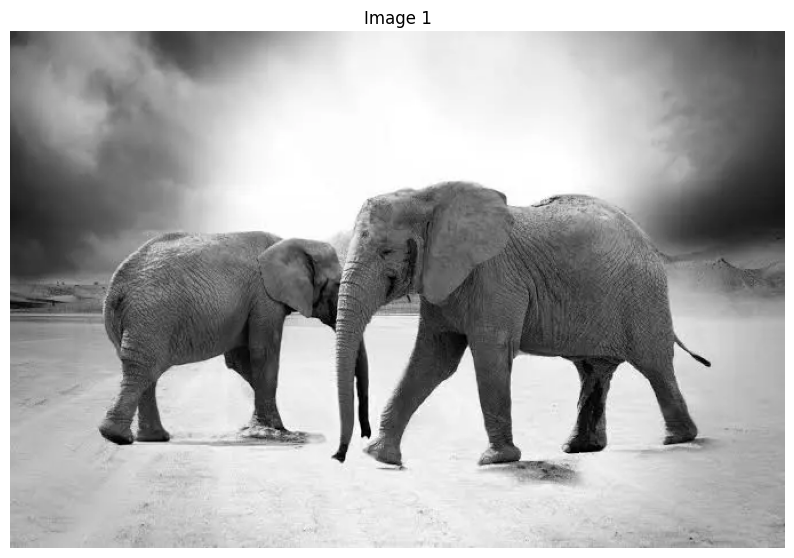

Saved image to: pictures/image_0_original.jpg


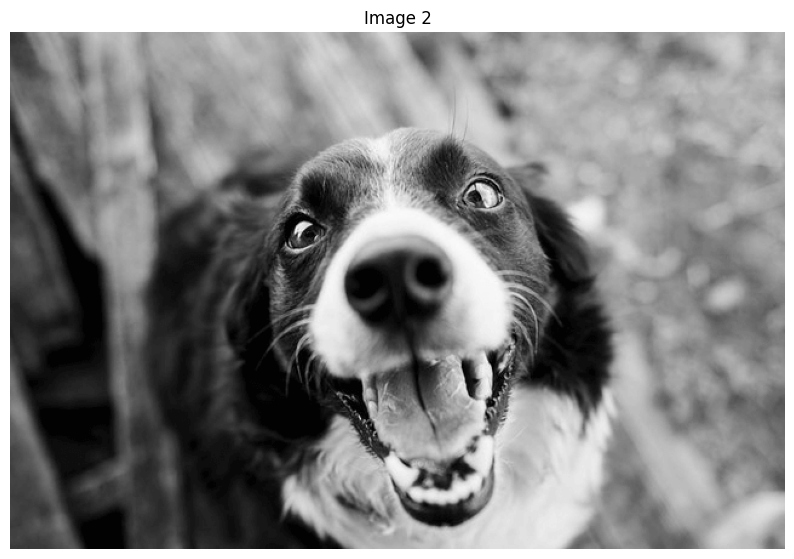

Saved image to: pictures/image_1_original.jpg


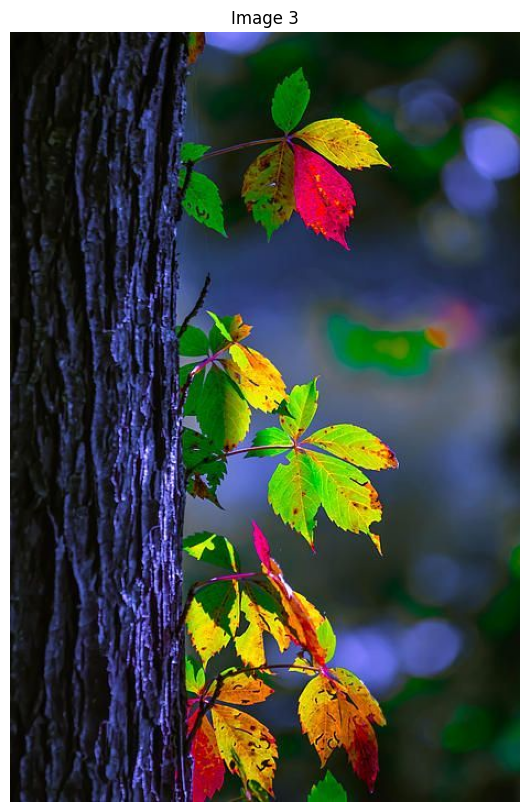

Saved image to: pictures/image_2_original.jpg


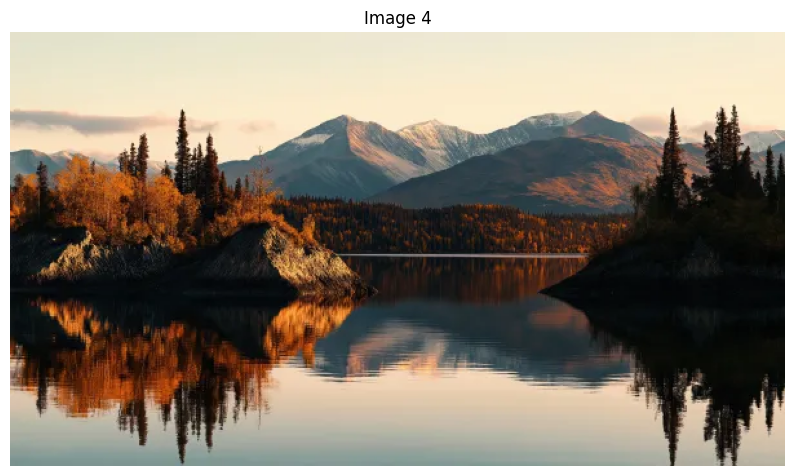

Saved image to: pictures/image_3_original.jpg


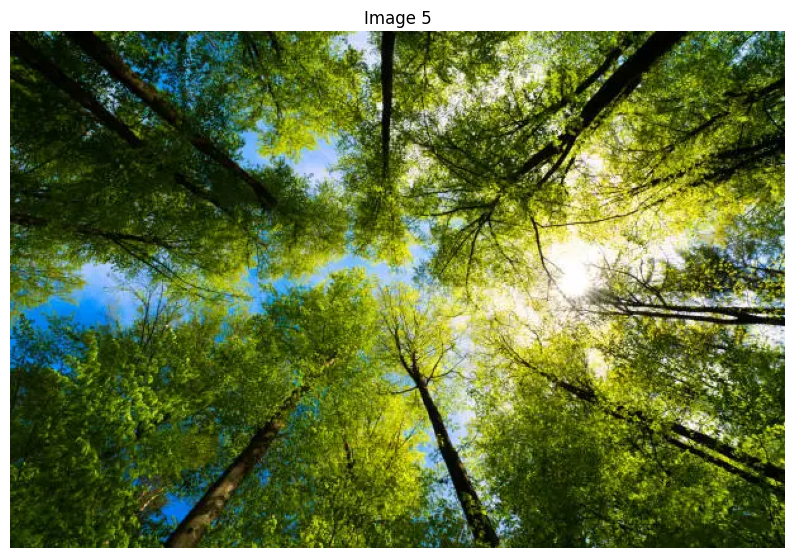

Saved image to: pictures/image_4_original.jpg


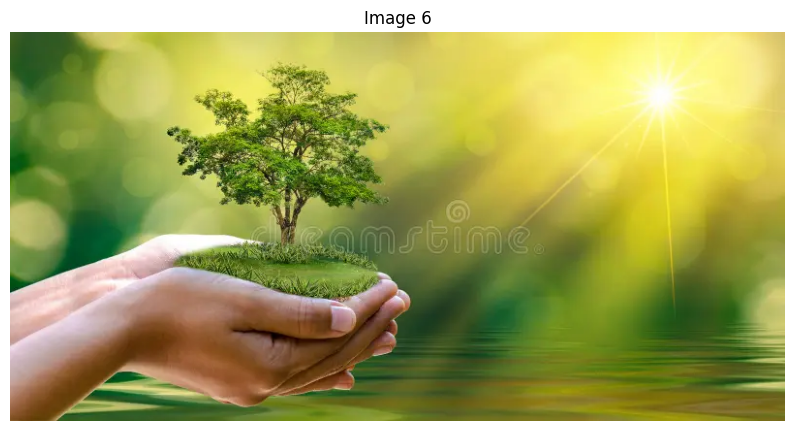

Saved image to: pictures/image_5_original.jpg


In [103]:
# Display the original images
for i, img in enumerate(images):
  plotImage(img, f'Image {i+1}')
  saveImageFile(img, 'pictures', f'image_{i}_original.jpg')

## 3. Histogrammas izlīdzināšana
- Veic histogrammas izlīdzināšanu.
- Papildus izmanto adaptīvo histogrammas izlīdzināšanu (CLAHE).
- Parādi rezultātus.

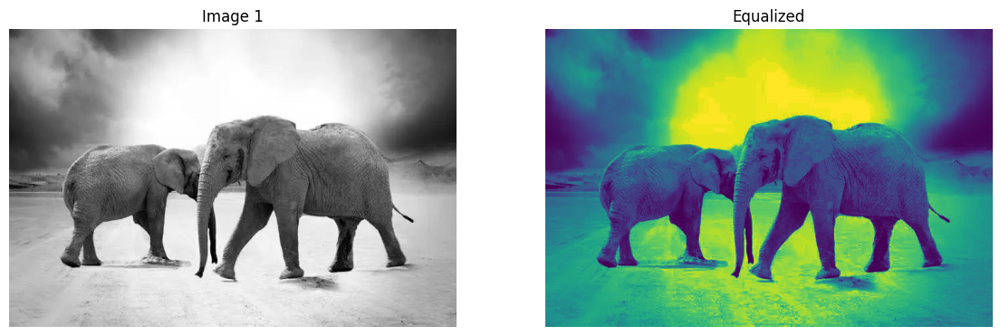

Saved image to: pictures/image_0_equalized.jpg


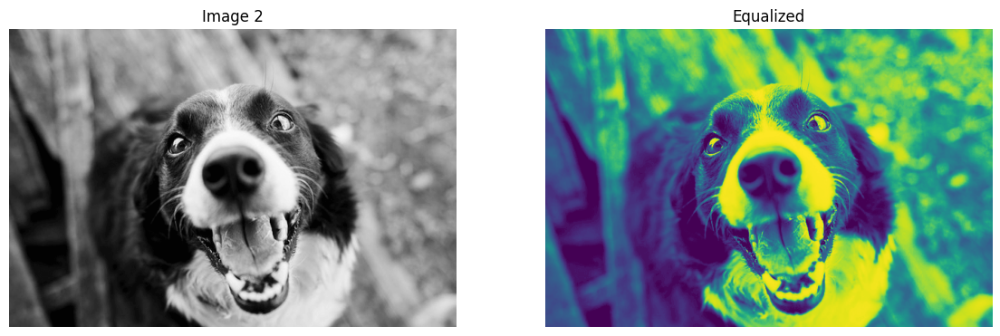

Saved image to: pictures/image_1_equalized.jpg


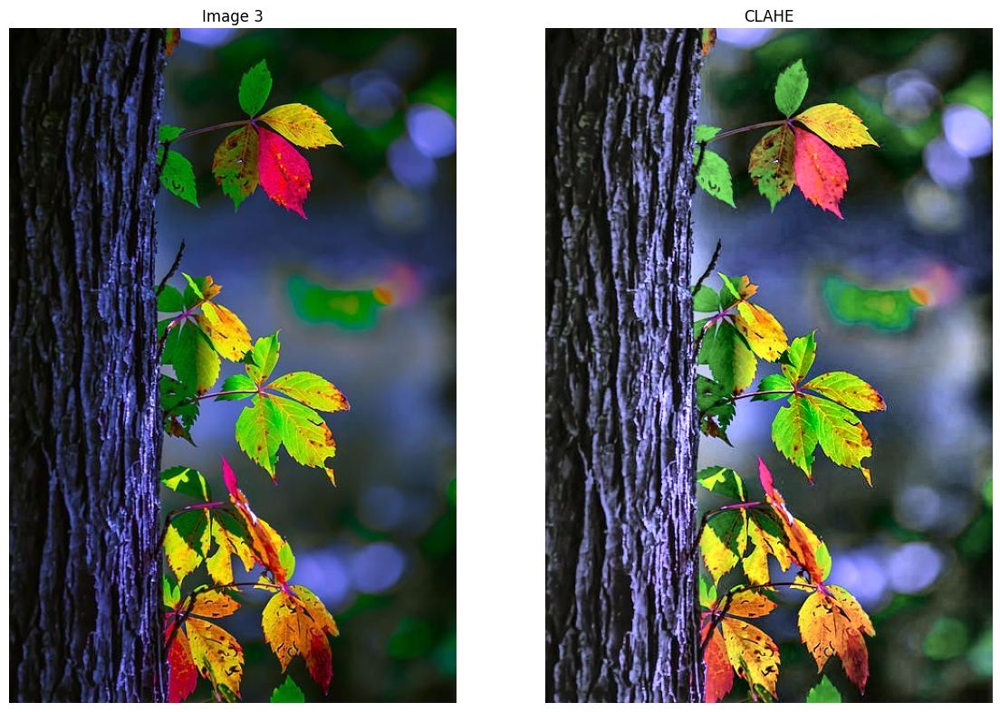

Saved image to: pictures/image_2_clahe.jpg


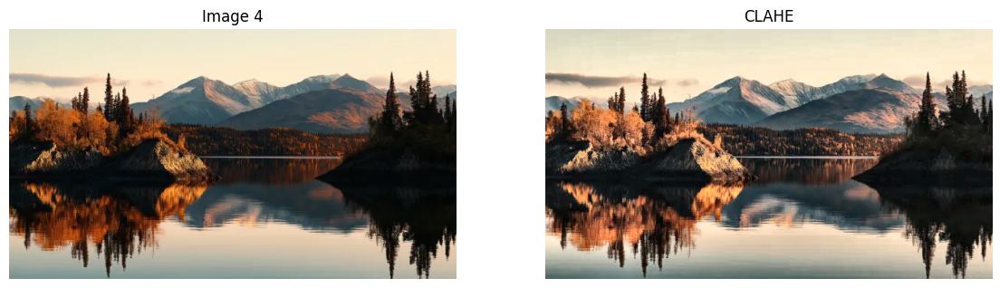

Saved image to: pictures/image_3_clahe.jpg


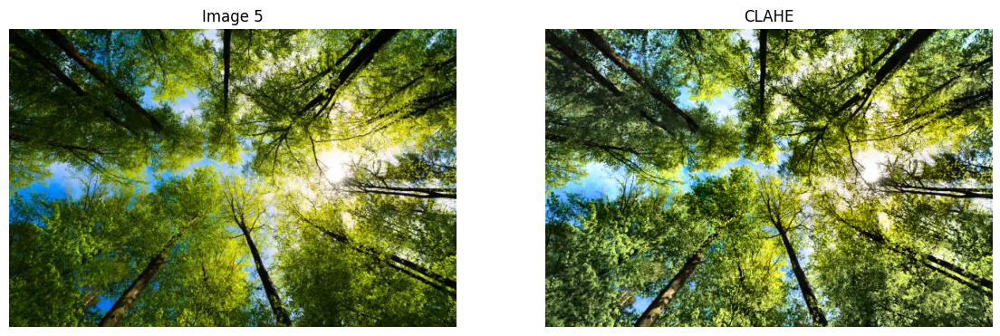

Saved image to: pictures/image_4_clahe.jpg


In [104]:

# Pelēktoņu attēliem:
for i in range(0,2):
  gray = cv2.cvtColor(images[i], cv2.COLOR_RGB2GRAY)
  equalized = cv2.equalizeHist(gray)

  #plotImage(equalized, f'Image {i+1} Equalized')
  plotImgSideBySide(images[i], f'Image {i+1}', equalized, 'Equalized')
  saveImageFile(equalized, 'pictures', f'image_{i}_equalized.jpg')

# Krāsu attēlam (CLAHE):
for i in range(2,len(images)-1):
  lab = cv2.cvtColor(images[i], cv2.COLOR_RGB2LAB)
  l, a, b = cv2.split(lab)
  clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
  l = clahe.apply(l)
  lab = cv2.merge([l, a, b])
  clahe_img = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

  #plotImage(clahe_img, f'Image {i+1} CLAHE')
  plotImgSideBySide(images[i], f'Image {i+1}', clahe_img, 'CLAHE')
  saveImageFile(clahe_img, 'pictures', f'image_{i}_clahe.jpg')

## 4. Trokšņu filtrēšana
- Pielieto Gaussa filtru un Mediānas filtru ar 2 dažādiem maskas izmēriem.
- Salīdzini rezultātus

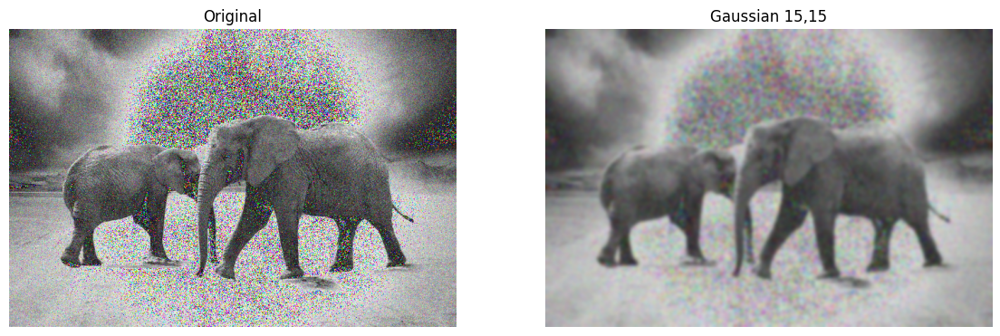

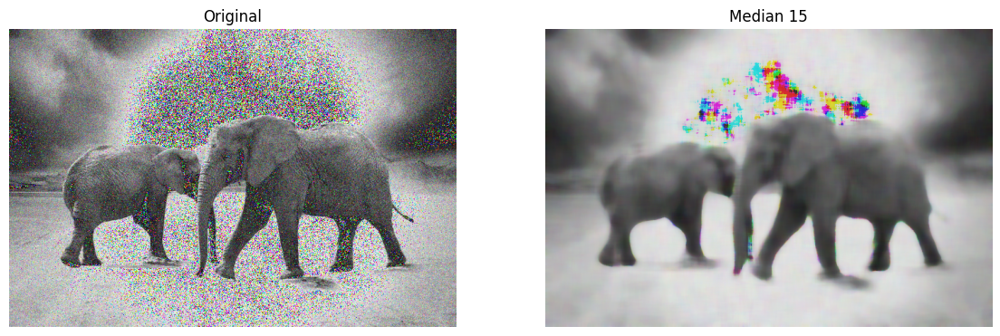

Saved image to: pictures/image_0_noisy.jpg
Saved image to: pictures/image_0_noisy_gaussian15.jpg
Saved image to: pictures/image_0_noisy_median15.jpg


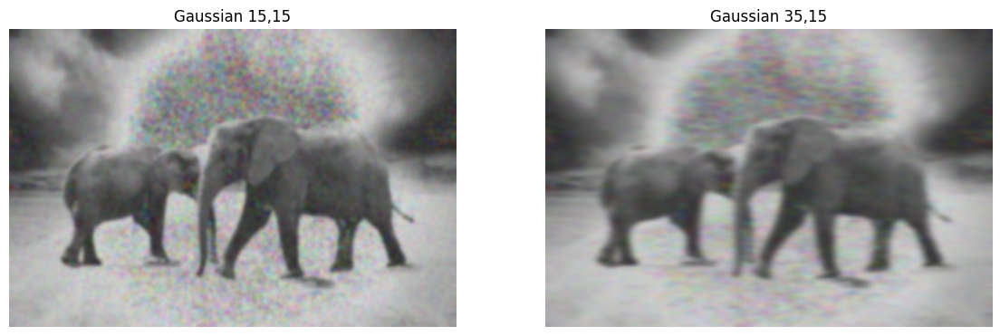

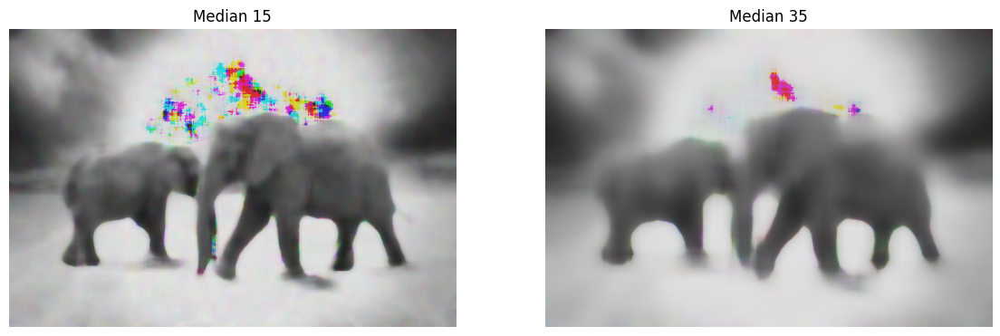

Saved image to: pictures/image_0_noisy_gaussian35.jpg
Saved image to: pictures/image_0_noisy_median35.jpg


In [105]:
# Gausa un Mediānas filtrēšana
# Add some synthetic noise for demonstration
noisy = images[0] + np.random.normal(0, 25, images[0].shape).astype(np.uint8)

# Noise filtering techniques
gaussian15 = cv2.GaussianBlur(noisy, (15, 15), 0)  # For Gaussian noise
median15 = cv2.medianBlur(noisy, 15)               # For salt-and-pepper noise

plotImgSideBySide(noisy, 'Original', gaussian15, 'Gaussian 15,15')
plotImgSideBySide(noisy, 'Original', median15, 'Median 15')
saveImageFile(noisy, 'pictures', f'image_0_noisy.jpg')
saveImageFile(gaussian15, 'pictures', f'image_0_noisy_gaussian15.jpg')
saveImageFile(median15, 'pictures', f'image_0_noisy_median15.jpg')

gaussian = cv2.GaussianBlur(noisy, (35, 15), 0)
median = cv2.medianBlur(noisy, 35)

plotImgSideBySide(gaussian15, 'Gaussian 15,15', gaussian, 'Gaussian 35,15')
plotImgSideBySide(median15, 'Median 15', median, 'Median 35')
saveImageFile(gaussian, 'pictures', f'image_0_noisy_gaussian35.jpg')
saveImageFile(median, 'pictures', f'image_0_noisy_median35.jpg')

## 5. Segmentācija
- Izmēģini dažādas segmentācijas metodes:
  - Globāla sliekšņošana (izvēlies slieksni T).
  - Otsu metode.
  - Ūdensšķirtnes algoritms.
  - Canny kontūru noteikšana.
- Salīdzini iegūtās maskas.

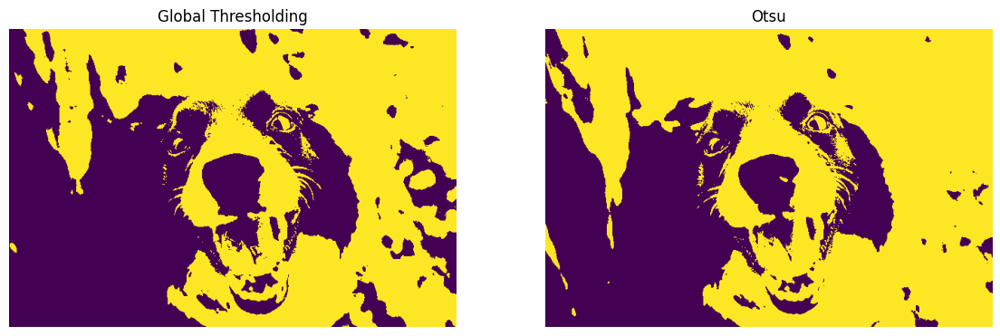

Saved image to: pictures/image_1_global_thresholding.jpg
Saved image to: pictures/image_1_otsu.jpg


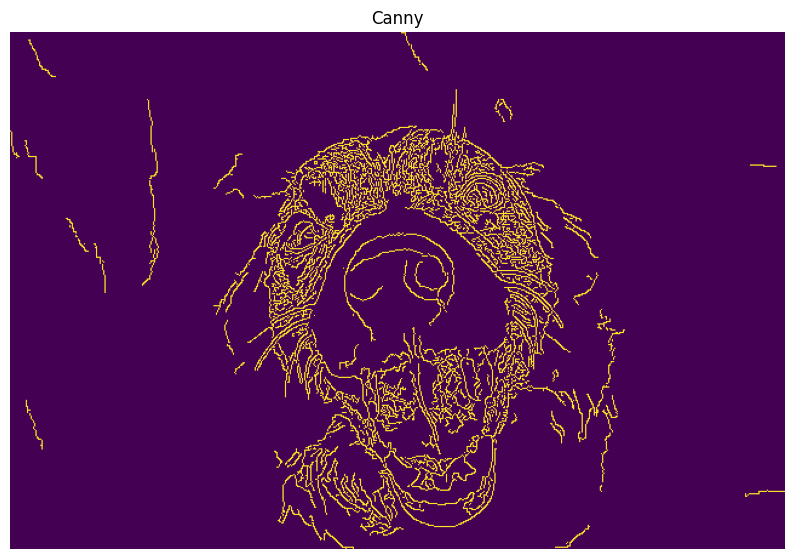

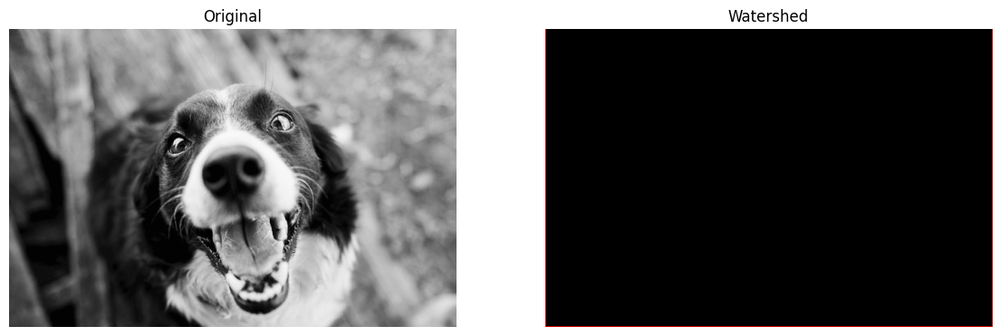

Saved image to: pictures/image_1_canny.jpg
Saved image to: pictures/image_1_watershed.jpg


In [106]:
# Convert the image to grayscale
#  because filters expects a single-channel image (like grayscale), but it's receiving a 3-channel color image.
gray_image = cv2.cvtColor(images[1], cv2.COLOR_RGB2GRAY)

_, thresh = cv2.threshold(gray_image, 127, 255, cv2.THRESH_BINARY) # Globālā sliekšņošana
_, otsu = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) # Otsu metode

plotImgSideBySide(thresh, 'Global Thresholding', otsu, 'Otsu')
saveImageFile(thresh, 'pictures', f'image_1_global_thresholding.jpg')
saveImageFile(otsu, 'pictures', f'image_1_otsu.jpg')

# Priekšnosacījums: attēls jāsegmentē ar Canny vai sliekšņošanu
edges = cv2.Canny(gray_image, 50, 150)
_, markers = cv2.connectedComponents(edges)
markers = markers + 1 # make sure that bg is not 0
markers[edges == 255] = 0
markers = cv2.watershed(images[1], markers) # rezultātā kontūras tiek atzīmētas ar -1.

#TODO why it doesnt work?
colors = np.random.randint(0, 255, (markers.max() + 1, 3), dtype=np.uint8)
#imgcopy = colors[markers]#red squared border
imgcopy = np.zeros_like(images[1]) #black and nothing more
#imgcopy = images[1].copy()
imgcopy[markers == -1] = [255, 0, 0] # Kontūras ir -1, zīmē kā sarkanas līnijas

plotImage(edges, 'Canny')
plotImgSideBySide(images[1], 'Original', imgcopy, 'Watershed')
saveImageFile(edges, 'pictures', f'image_1_canny.jpg')
saveImageFile(imgcopy, 'pictures', f'image_1_watershed.jpg')

Saved image to: pictures/image_1_watershed2_colored.jpg


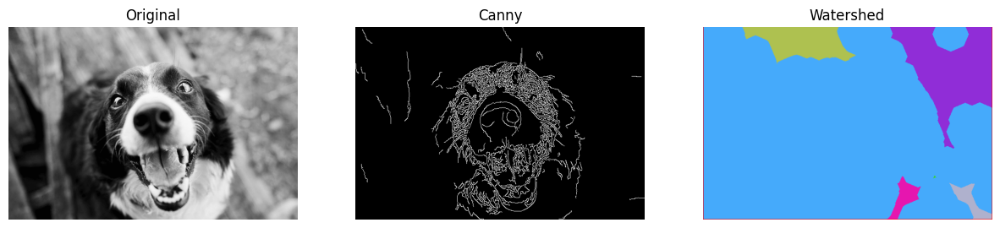

In [107]:
img = images[1]
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# 1. Binārs attēls ar Otsu sliekšņošanu (labāka par Canny šajā gadījumā!)
_, binary = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# 2. Attāluma transformācija — atrod objektu centrus
dist_transform = cv2.distanceTransform(binary, cv2.DIST_L2, 3)

# 3. Atrod potenciālos objektu centrus (lieli attālumi)
_, sure_fg = cv2.threshold(dist_transform, 0.3 * dist_transform.max(), 255, 0)
sure_fg = np.uint8(sure_fg)

# 4. Atrod fonu (visi, kas nav priekšplāna)
sure_bg = cv2.dilate(binary, np.ones((3,3), np.uint8), iterations=3)
sure_bg = cv2.bitwise_not(sure_bg)  # Invertē, lai būtu fons

# 5. Markeri: priekšplāns + fons = markers
unknown = cv2.subtract(sure_bg, sure_fg)

# 6. Labeling — piešķir katram priekšplāna blokam unikālu numuru
_, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1  # Fons būs 0, tāpēc pievienojam 1

# 7. Iestatām nezināmo zonu kā 0
markers[unknown == 255] = 0

# 8. Patiesā ūdensšķirtnes darbība
markers = cv2.watershed(img, markers)

# 9. Krāsošana
colors = np.random.randint(0, 255, (markers.max() + 1, 3), dtype=np.uint8)
colored_segments = colors[markers]
colored_segments[markers == -1] = [255, 0, 0]  # Kontūras sarkanās

saveImageFile(colored_segments, 'pictures', f'image_1_watershed2_colored.jpg')

# 10. Rādīt rezultātus
plotImgSideBySideTriple(img, 'Original', edges, 'Canny', colored_segments, 'Watershed')


Saved image to: pictures/image_1_watershed_tutor_threshold.jpg
Saved image to: pictures/image_1_watershed_tutor_dilated.jpg


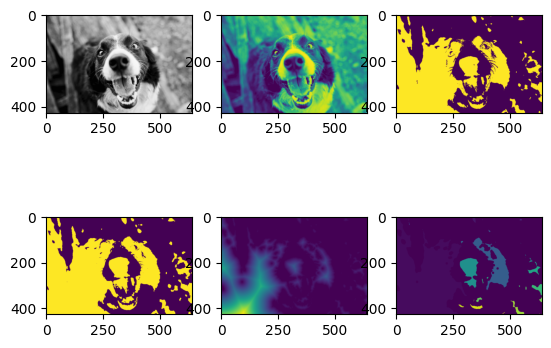

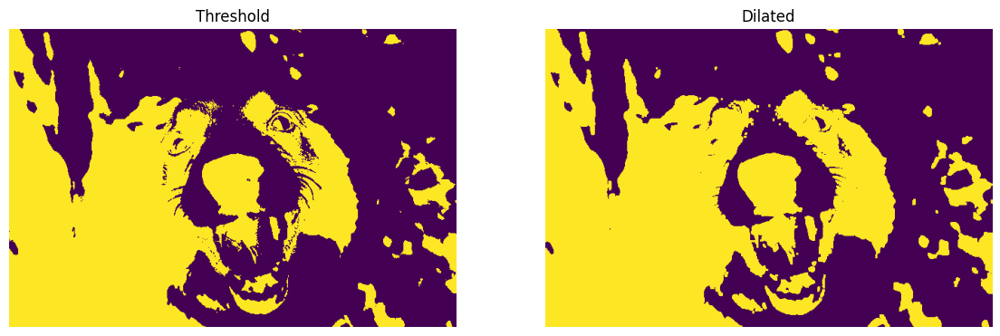

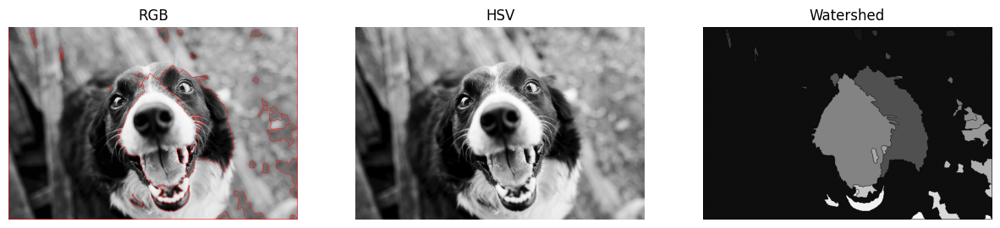

Saved image to: pictures/image_1_watershed_segmented.jpg
Saved image to: pictures/image_1_watershed_mask_tutor_good.jpg


In [108]:
# based on https://youtu.be/3MUxPn3uKSk?si=v5FHp2kdsTPp-NF8
def watershred(image, debug=True):
   if debug:
      plt.figure()

   imgRGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
   imgHSV = cv2.cvtColor(imgRGB, cv2.COLOR_RGB2GRAY)

   _, imgThresh = cv2.threshold(imgHSV, 120, 255, cv2.THRESH_BINARY_INV)
   if debug:
      plt.subplot(231)
      plt.imshow(imgRGB)
      plt.subplot(232)
      plt.imshow(imgHSV)
      plt.subplot(233)
      plt.imshow(imgThresh)

   # dilate - simplify threshold image a little
   kernel = np.ones((3, 3), np.uint8)
   imgDilated = cv2.morphologyEx(imgThresh, cv2.MORPH_DILATE, kernel) # removed some small areas, looks less detailed
                                                                      # in the case of dog, doesnt affect the distance
   saveImageFile(imgThresh, 'pictures', 'image_1_watershed_tutor_threshold.jpg')
   saveImageFile(imgDilated, 'pictures', 'image_1_watershed_tutor_dilated.jpg')

   if debug:
      plt.subplot(234)
      plt.imshow(imgDilated)

   #distance transform
   distTransf = cv2.distanceTransform(imgDilated, cv2.DIST_L2, 0) # lightning in the left lower corner
                                                                  # mask size 0, 3, 5 doesnt afect result for dog
   #distTransf = cv2.distanceTransform(imgThresh, cv2.DIST_L2, 3) #
   if debug:
      plt.subplot(235)
      plt.imshow(distTransf)

   # identify regions
   #_, distTresh = cv2.threshold(distTransf, 0.4 * distTransf.max(), 255, cv2.THRESH_BINARY)
   _, distThresh = cv2.threshold(distTransf, 5, 255, cv2.THRESH_BINARY) # 2nd param affects the size of regions formed
   #if debug:
   #   plt.subplot(236)
   #   plt.imshow(distThresh)

   # conect the components
   #distTresh = distTresh.astype(np.uint8)
   distThresh = np.uint8(distThresh)
   _,labels = cv2.connectedComponents(distThresh)
   if debug:
      plt.subplot(236)
      plt.imshow(labels)

   # finally ready for watershredding
   labels = np.int32(labels)
   watershed = cv2.watershed(imgRGB, labels)

   imgRGB[labels==-1] = [255,0,0] # change the edge pixels to red

   if debug:
      plt.show()
   return watershed, imgRGB, imgHSV, imgThresh, imgDilated, distTransf

watershredImg, imgRGB, imgHSV, imgThresh, imgDilated, imgDistance = watershred(images[1])

#plotImage(images[1], 'Original')
plotImgSideBySide(imgThresh, 'Threshold', imgDilated, 'Dilated')
plotImgSideBySideTriple(imgRGB, 'RGB', imgHSV, 'HSV', watershredImg, 'Watershed')

saveImageFile(imgRGB, 'pictures', f'image_1_watershed_segmented.jpg')
saveSegmentationMaskImage(watershredImg, 'pictures', f'image_1_watershed_mask_tutor_good.jpg')


## 6. Rezultātu saglabāšana
- Saglabā galvenos starprezultātus (pirms/pēc, maskas).


In [109]:
!zip -r pictures.zip pictures/

updating: pictures/ (stored 0%)
updating: pictures/image_1_global_thresholding.jpg (deflated 8%)
updating: pictures/image_1_watershed2_colored.jpg (deflated 34%)
updating: pictures/image_1_original.jpg (deflated 1%)
updating: pictures/image_5_original.jpg (deflated 0%)
updating: pictures/image_1_watershed_tutor_dilated.jpg (deflated 10%)
updating: pictures/image_0_noisy_gaussian35.jpg (deflated 0%)
updating: pictures/image_0_noisy.jpg (deflated 0%)
updating: pictures/image_1_watershed_segmented.jpg (deflated 2%)
updating: pictures/image_0_noisy_median15.jpg (deflated 0%)
updating: pictures/.ipynb_checkpoints/ (stored 0%)
updating: pictures/image_3_original.jpg (deflated 1%)
updating: pictures/image_0_noisy_gaussian15.jpg (deflated 0%)
updating: pictures/image_5_clahe.jpg (deflated 1%)
updating: pictures/image_1_watershed.jpg (deflated 85%)
updating: pictures/image_6_original.jpg (deflated 0%)
updating: pictures/image_4_clahe.jpg (deflated 1%)
updating: pictures/image_2_equalized.jpg (d

## 7. Īsā atskaite
**Atbildi uz jautājumiem:**
- Kā histogrammas izlīdzināšana ietekmēja segmentācijas kvalitāti?
- Kurš troksņa filtrs labāk sagatavoja attēlu segmentācijai? Kāpēc?
- Kura sliekšņošanas metode deva vislabāko rezultātu? Pamato.
- Vai Canny palīdzēja atklāt noderīgas kontūras?

## 8. Iesniegšanas kontrolsaraksts
ORTUSā jāiesniedz:
- [ ] Programmas kods (.ipynb)
- [ ] Oriģināli attēli
- [ ] Histogrammas izlīdzināšanas rezultāti
- [ ] Gausa un Mediānas filtra rezultāti
- [ ] Segmentācijas maskas (globālā, Otsu, adaptīvā, Canny)
- [ ] Secinājumi (var tikt pievienoti teksta laukā, darba iesniegšanas uzdevumi, vai kā atsēvišķš pdf fails)